## MSDS: 7337 - Natural Language Processing
**Author: Trace Smith**
**Final**
________

In [1]:
# Python Libraries
import re
import bs4
import json
import pprint 
import time
import gensim
import pyLDAvis.gensim
from pattern.en import parse
from selenium import webdriver  
import nltk; print("NLTK",nltk.__version__)
import gensim; print("GENSIM",gensim.__version__)
import scrapy; print("Scrapy",scrapy.__version__)
import numpy as np; print("Numpy",np.__version__)
import pandas as pd; print("Pandas",pd.__version__)
import pattern; print("Pattern",pattern.__version__)
import pyLDAvis;print("PyLDAvis",pyLDAvis.__version__)
import selenium; print("Selenium",selenium.__version__)
from urllib import request; print("Request",request.__version__)
from bs4 import BeautifulSoup; print("BeautifulSoup",bs4.__version__)
pyLDAvis.enable_notebook()

# Plotting Libraries
import seaborn as sns; print("Seaborn",sns.__version__)
import matplotlib; print("Matplotlib",matplotlib.__version__)
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

# Ignore Warnings
import warnings
warnings.filterwarnings('ignore')

# Import Scripts
from scrapy.crawler import CrawlerProcess;
from scrapy.utils.project import get_project_settings

%load_ext autoreload

NLTK 3.3
GENSIM 3.7.3
Scrapy 1.5.1
Numpy 1.16.1
Pandas 0.20.1
Pattern 3.6
PyLDAvis 2.1.2
Selenium 3.14.0
Request 3.5
BeautifulSoup 4.7.1
Seaborn 0.7.1
Matplotlib 1.5.3


## Build Movie Review Dataset

In [2]:
%autoreload
from IMDB_Project import *
from IMDB_Project.settings import *

def run_imdb_crawler(spider):
    """ 
    Movie and Review IMDB Crawler w/ Scrapy 
    """
    print('='*100)
    print('{} --> Crawling: {} --> Total: {}'.format(BOT_NAME,spider,CLOSESPIDER_ITEMCOUNT))
    process = CrawlerProcess(get_project_settings())
    process.crawl(spider)
    process.start()
    print('Done!')

### Crawl List of IMDB Movies (2018-2019 Comedy Films)

**Note: ** due to processes not being terminated after crawling with Scrapy (e.g. see helper function run_imdb_crawler)  --> after running the 'movies' spider, you will need to shutdown the notebook and then run the 'reviews' spider.

In [3]:
%autoreload
from IMDB_Project.settings import *

if __name__ == '__main__':

    # Update CLOSESPIDER_ITEMCOUNT = 10  in settings.py for Max Number of Movies for reviews
    CLOSESPIDER_ITEMCOUNT = 10 
    
    %time run_imdb_crawler('movies')

2019-08-10 18:12:02 [scrapy.utils.log] INFO: Scrapy 1.5.1 started (bot: IMDB_Project)
2019-08-10 18:12:02 [scrapy.utils.log] INFO: Versions: lxml 3.6.4.0, libxml2 2.9.2, cssselect 1.0.3, parsel 1.5.0, w3lib 1.19.0, Twisted 17.1.0, Python 3.5.2 |Anaconda custom (64-bit)| (default, Jul  2 2016, 17:52:12) - [GCC 4.2.1 Compatible Apple LLVM 4.2 (clang-425.0.28)], pyOpenSSL 16.2.0 (OpenSSL 1.0.2s  28 May 2019), cryptography 1.5, Platform Darwin-18.0.0-x86_64-i386-64bit
2019-08-10 18:12:02 [scrapy.crawler] INFO: Overridden settings: {'BOT_NAME': 'IMDB_Project', 'ROBOTSTXT_OBEY': True, 'CLOSESPIDER_ITEMCOUNT': 10, 'FEED_FORMAT': 'json', 'FEED_URI': 'IMDB_Project/data/%(name)s.json', 'DOWNLOAD_DELAY': 3, 'NEWSPIDER_MODULE': 'IMDB_Project.spiders', 'SPIDER_MODULES': ['IMDB_Project.spiders']}
2019-08-10 18:12:02 [scrapy.middleware] INFO: Enabled extensions:
['scrapy.extensions.memusage.MemoryUsage',
 'scrapy.extensions.corestats.CoreStats',
 'scrapy.extensions.telnet.TelnetConsole',
 'scrapy.ext

IMDB_Project --> Crawling: movies --> Total: 10


2019-08-10 18:12:02 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.imdb.com/robots.txt> (referer: None)
2019-08-10 18:12:06 [scrapy.downloadermiddlewares.redirect] DEBUG: Redirecting (301) to <GET https://www.imdb.com/search/title/?title_type=feature&genre=comedy&year=2018,2019&languages=en&count=1&view=simple> from <GET https://www.imdb.com/search/title?title_type=feature&genre=comedy&year=2018,2019&languages=en&count=1&view=simple>
2019-08-10 18:12:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.imdb.com/search/title/?title_type=feature&genre=comedy&year=2018,2019&languages=en&count=1&view=simple> (referer: None)
2019-08-10 18:12:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.imdb.com/search/title/?title_type=feature&year=2018-01-01,2019-12-31&languages=en&view=simple&count=1&start=2> (referer: https://www.imdb.com/search/title/?title_type=feature&genre=comedy&year=2018,2019&languages=en&count=1&view=simple)
2019-08-10 18:12:17 [scrapy.core.en

2019-08-10 18:13:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://www.imdb.com/title/tt8772262/>
{'users_rating': '7.6', 'year': '2019', 'title': 'Midsommar', 'genre': ['Drama', 'Horror', 'Mystery', 'Thriller'], 'imdb_url': 'https://www.imdb.com/title/tt8772262/'}
2019-08-10 18:13:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.imdb.com/search/title/?title_type=feature&year=2018-01-01,2019-12-31&languages=en&view=simple&count=1&start=10> (referer: https://www.imdb.com/search/title/?title_type=feature&year=2018-01-01,2019-12-31&languages=en&view=simple&count=1&start=9)
2019-08-10 18:13:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.imdb.com/title/tt7349950/> (referer: https://www.imdb.com/search/title/?title_type=feature&year=2018-01-01,2019-12-31&languages=en&view=simple&count=1&start=10)
2019-08-10 18:13:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://www.imdb.com/title/tt7349950/>
{'users_rating': None, 'year': '2019', 'title': 'It Chap

Done!
CPU times: user 1.25 s, sys: 81.3 ms, total: 1.33 s
Wall time: 1min 20s


### IMDB Movies DataFrame

In [4]:
df_movies = pd.read_json('IMDB_Project/data/movies.json')
df_movies['title_id'] = df_movies['imdb_url'].apply(lambda x: x.split('/')[-2])
print('Total Movies:',df_movies.shape[0])
display(df_movies)

Total Movies: 10


,genre,imdb_url,title,users_rating,year,title_id
0,"[Animation, Adventure, Drama, Family, Musical]",https://www.imdb.com/title/tt6105098/,The Lion King,7.1,2019,tt6105098
1,"[Action, Adventure]",https://www.imdb.com/title/tt6806448/,Fast & Furious Presents: Hobbs & Shaw,7.0,2019,tt6806448
2,"[Comedy, Drama]",https://www.imdb.com/title/tt7131622/,Once Upon a Time ... in Hollywood,8.4,2019,tt7131622
3,"[Action, Adventure, Sci-Fi]",https://www.imdb.com/title/tt4154796/,Avengers: Endgame,8.6,2019,tt4154796
4,"[Biography, Crime, Drama, History, Thriller]",https://www.imdb.com/title/tt1302006/,The Irishman,NaN,2019,tt1302006
5,"[Drama, History, Thriller]",https://www.imdb.com/title/tt4995776/,The Red Sea Diving Resort,6.5,2019,tt4995776
6,"[Action, Adventure, Sci-Fi]",https://www.imdb.com/title/tt6320628/,Spider-Man: Far from Home,7.9,2019,tt6320628
7,"[Action, Adventure, Sci-Fi, Thriller]",https://www.imdb.com/title/tt0437086/,Alita: Battle Angel,7.4,2019,tt0437086
8,"[Drama, Horror, Mystery, Thriller]",https://www.imdb.com/title/tt8772262/,Midsommar,7.6,2019,tt8772262
9,"[Horror, Thriller]",https://www.imdb.com/title/tt7349950/,It Chapter Two,NaN,2019,tt7349950


## Automate Web Crawling with Selenium

In [5]:
def get_review_links(title_id,url,max_review_pages=4):

    """ 
    Automate Process to Fetch 'n' Number of Review Pages using Selenium
    :title_id -- movie title id
    :url -- url template to review page
    :max_review_pages -- max clicks to fetch additonal 25 review
    
    Returns DataFrame with review links and title id
    """
    # Chrome Webriver
    driver = webdriver.Chrome(executable_path=r"{}".format(DRIVER_PATH))
    driver.get(url)

    try:
        review_pages = 1
        while review_pages < max_review_pages:
            page = driver.find_element_by_id('load-more-trigger')
            page.click()
            time.sleep(5)
            review_pages +=1

        # Get Links
        soup = BeautifulSoup(driver.page_source,'html.parser')
        tags = soup.find_all('a',href=True,text=re.compile('Permalink'))
        df = pd.DataFrame()
        df['review_links'] = ['https://www.imdb.com' + i['href'] for i in tags]
        df['title_id'] = title_id

        driver.quit()
        return df
    
    except Exception as e:
        print('Whoops! Something went wrong with getting review links! --> ',str(e))
        pass
    driver.quit()
    
def main_links(movies):
    """ 
    Loop over movies and extract reivew links 
    :movies -- movies dataframe with movie link and title id
    
    Returns DataFrame with review links and title id for all movies
    """
    #Iterate over Movie Links
    movies = movies['imdb_url'].unique().tolist()
    results = []
    for movie in movies:
        id = movie.split('/')[-2]
        print('Processing Movie ID: ',id)
        review_link = movie + 'reviews'
        results.append(get_review_links(id,review_link))

    df = pd.concat(results,axis=0)
    print('Review Links Shape:',df.shape)
    return df

if __name__ == '__main__':
    
    # Path for Webdriver .exe for Selenium
    DRIVER_PATH = "/Users/tracesmith/Desktop/Trace/SMU/NLP/Final/chromedriver.exec"
    
    # Get Links
    %time df_review_links = main_links(df_movies)

Processing Movie ID:  tt6105098


2019-08-10 18:13:24 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60172/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:13:24 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:60172
2019-08-10 18:13:25 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60172 "POST /session HTTP/1.1" 200 690
2019-08-10 18:13:25 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:13:25 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60172/session/44485ce140ce95b22735ad676a556750/url {"url": "https://www.imdb.com/title/tt6105098/reviews"}
2019-08-10 18:13:27 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60172 "POST /session/444

Processing Movie ID:  tt6806448


2019-08-10 18:13:44 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60276/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:13:44 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:60276
2019-08-10 18:13:45 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60276 "POST /session HTTP/1.1" 200 690
2019-08-10 18:13:45 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:13:45 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60276/session/c240599829da78b866508714174ded2e/url {"url": "https://www.imdb.com/title/tt6806448/reviews"}
2019-08-10 18:13:47 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60276 "POST /session/c24

Processing Movie ID:  tt7131622


2019-08-10 18:14:04 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60377/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:14:04 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:60377
2019-08-10 18:14:05 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60377 "POST /session HTTP/1.1" 200 690
2019-08-10 18:14:05 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:14:05 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60377/session/f97a1e45ec4045c5d4e9711507dc5d30/url {"url": "https://www.imdb.com/title/tt7131622/reviews"}
2019-08-10 18:14:08 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60377 "POST /session/f97

Processing Movie ID:  tt4154796


2019-08-10 18:14:24 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60484/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:14:24 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:60484
2019-08-10 18:14:25 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60484 "POST /session HTTP/1.1" 200 690
2019-08-10 18:14:25 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:14:25 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60484/session/a815a06d42ee8245f38ac07f02bf09c3/url {"url": "https://www.imdb.com/title/tt4154796/reviews"}
2019-08-10 18:14:28 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60484 "POST /session/a81

Processing Movie ID:  tt1302006


2019-08-10 18:14:50 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60588/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:14:50 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:60588
2019-08-10 18:14:50 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60588 "POST /session HTTP/1.1" 200 690
2019-08-10 18:14:50 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:14:50 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60588/session/fc052a993ab38517f9ef313586596cd3/url {"url": "https://www.imdb.com/title/tt1302006/reviews"}
2019-08-10 18:14:53 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60588 "POST /session/fc0

Whoops! Something went wrong with getting review links! -->  Message: no such element: Unable to locate element: {"method":"css selector","selector":"[id="load-more-trigger"]"}
  (Session info: chrome=76.0.3809.100)

Processing Movie ID:  tt4995776


2019-08-10 18:14:54 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60688/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:14:54 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:60688
2019-08-10 18:14:55 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60688 "POST /session HTTP/1.1" 200 690
2019-08-10 18:14:55 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:14:55 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60688/session/7cabdfeb755df5fa0a452c3b9de69e40/url {"url": "https://www.imdb.com/title/tt4995776/reviews"}
2019-08-10 18:14:58 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60688 "POST /session/7ca

Processing Movie ID:  tt6320628


2019-08-10 18:15:15 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60791/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:15:15 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:60791
2019-08-10 18:15:16 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60791 "POST /session HTTP/1.1" 200 690
2019-08-10 18:15:16 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:15:16 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60791/session/7498495585443968b3de03143c0b619d/url {"url": "https://www.imdb.com/title/tt6320628/reviews"}
2019-08-10 18:15:19 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60791 "POST /session/749

Processing Movie ID:  tt0437086


2019-08-10 18:15:35 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60898/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:15:35 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:60898
2019-08-10 18:15:36 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60898 "POST /session HTTP/1.1" 200 690
2019-08-10 18:15:36 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:15:36 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:60898/session/1b8a519013c181cf8864f8f07385813e/url {"url": "https://www.imdb.com/title/tt0437086/reviews"}
2019-08-10 18:15:39 [urllib3.connectionpool] DEBUG: http://127.0.0.1:60898 "POST /session/1b8

Processing Movie ID:  tt8772262


2019-08-10 18:15:56 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:61001/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:15:56 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:61001
2019-08-10 18:15:56 [urllib3.connectionpool] DEBUG: http://127.0.0.1:61001 "POST /session HTTP/1.1" 200 690
2019-08-10 18:15:56 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:15:56 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:61001/session/dc851a3f26eff5de1200ceb42cab6439/url {"url": "https://www.imdb.com/title/tt8772262/reviews"}
2019-08-10 18:15:59 [urllib3.connectionpool] DEBUG: http://127.0.0.1:61001 "POST /session/dc8

Processing Movie ID:  tt7349950


2019-08-10 18:16:26 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:61122/session {"capabilities": {"firstMatch": [{}], "alwaysMatch": {"goog:chromeOptions": {"extensions": [], "args": []}, "platformName": "any", "browserName": "chrome"}}, "desiredCapabilities": {"goog:chromeOptions": {"extensions": [], "args": []}, "version": "", "platform": "ANY", "browserName": "chrome"}}
2019-08-10 18:16:26 [urllib3.connectionpool] DEBUG: Starting new HTTP connection (1): 127.0.0.1:61122
2019-08-10 18:16:27 [urllib3.connectionpool] DEBUG: http://127.0.0.1:61122 "POST /session HTTP/1.1" 200 690
2019-08-10 18:16:27 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2019-08-10 18:16:27 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://127.0.0.1:61122/session/77576af16562d3ada89ef9c193d9dce7/url {"url": "https://www.imdb.com/title/tt7349950/reviews"}
2019-08-10 18:16:29 [urllib3.connectionpool] DEBUG: http://127.0.0.1:61122 "POST /session/775

Whoops! Something went wrong with getting review links! -->  Message: no such element: Unable to locate element: {"method":"css selector","selector":"[id="load-more-trigger"]"}
  (Session info: chrome=76.0.3809.100)

Review Links Shape: (800, 2)
CPU times: user 3.29 s, sys: 295 ms, total: 3.58 s
Wall time: 3min 6s


## Build Movie Reviews Dataframe

In [ ]:
def build_reviews_dataframe(df):
    
    """ Build DataFrame w/ Reviews Content + Ratings """
    
    # Load Reviews w/ Beautiful Soup
    doc = request.urlopen(df['review_links']).read()
    soup = BeautifulSoup(doc,'html.parser')

    # Prepare Reviews
    data = json.loads(soup.find('script', type='application/ld+json').text)

    # Review Text
    try:
        df['review_text'] = data['reviewBody']
    except:
        df['review_text']= data['name'] # Use name of review if body is empty
        
    # Review Ratings
    try:
        df['review_rating'] = data['reviewRating']['ratingValue']
    except:
        df['review_rating'] = np.nan
    
    return df

if __name__ == '__main__':
    
    df_reviews_meta = pd.merge(df_review_links,df_movies,on=['title_id'],how='inner')
    %time df_reviews = df_reviews_meta.apply(lambda x: build_reviews_dataframe(x),axis=1)

## Load Movie Review Dataframe from Disk

In [9]:
def load_data(file_name):
    """ 
    Load Movie Reviews
    """
    try:
        df = pd.read_csv('data/{}.csv'.format(file_name))
        print('Raw DataFrame Shape: ',df.shape)
        return df
    except KeyboardInterrupt:
        print('Error Loading Data!')
    
if __name__ == '__main__':
    
    # Load Reviews
    df = load_data('reviews')

Raw DataFrame Shape:  (800, 10)


## Preprocess Movie Reviews

In [10]:
def preprocess_reviews(text):
    """ 
    Preprocess Movie Reviews
    """
    # Tokenize
    tokens = [token.strip().lower() for token in nltk.tokenize.RegexpTokenizer(r'\w+').tokenize(text)]
    
    # Filter Tokens
    tokens = [token for token in tokens if len(token) > 3 and token not in nltk.corpus.stopwords.words('english')]
    
    # Lemmatize
    tokens = [nltk.stem.wordnet.WordNetLemmatizer().lemmatize(token) for token in tokens if not token.isnumeric()]
    
    # Filter 'None'
    return list(filter(None, tokens))

if __name__ == '__main__':
    
    %time df['reviews_clean'] = df['review_text'].apply(lambda x: preprocess_reviews(x))

CPU times: user 6.85 s, sys: 1.38 s, total: 8.23 s
Wall time: 8.24 s


## Bi-gram Model

- The bigram model approximates the probability of a word given all the previous words by using only the conditional probability of the preceding word. Bigrams are two words frequently occurring together in the document

In [11]:
def bigram_model(sentences):
    """
    Bigram Model:  two words frequently occurring together in a document
    """
    bigram = gensim.models.Phrases(sentences=sentences, 
                                   min_count=10, 
                                   threshold=10, 
                                   delimiter=b'_')
    bigram_model = gensim.models.phrases.Phraser(bigram)
    bigram = [bigram_model[doc] for doc in reviews]

    # Dictionary
    dict_ = gensim.corpora.Dictionary(bigram)
    dict_.filter_extremes(no_below=5, no_above=0.5)
    print('Final Vocabulary Size:', len(dict_))
    return dict_,bigram

def bag_of_words(vocab,bigram):
    """ 
    Transform Vocab into Bag of Words
    """
    bow = [vocab.doc2bow(text) for text in bigram]
    print('Bag of Words Size:',len(bow))
    return bow

if __name__ == '__main__':
    
    reviews = df['reviews_clean'].tolist()
    
    # Bigram Model
    %time vocab_dict,bigram_model = bigram_model(reviews)
    
    # Bag of Words
    %time bow = bag_of_words(vocab_dict,bigram_model)

2019-08-10 18:23:26 [gensim.models.phrases] INFO: collecting all words and their counts
2019-08-10 18:23:26 [gensim.models.phrases] INFO: PROGRESS: at sentence #0, processed 0 words and 0 word types
2019-08-10 18:23:26 [gensim.models.phrases] INFO: collected 36124 word types from a corpus of 37163 words (unigram + bigrams) and 800 sentences
2019-08-10 18:23:26 [gensim.models.phrases] INFO: using 36124 counts as vocab in Phrases<0 vocab, min_count=10, threshold=10, max_vocab_size=40000000>
2019-08-10 18:23:26 [gensim.models.phrases] INFO: source_vocab length 36124
2019-08-10 18:23:27 [gensim.models.phrases] INFO: Phraser built with 38 phrasegrams
2019-08-10 18:23:27 [gensim.corpora.dictionary] INFO: adding document #0 to Dictionary(0 unique tokens: [])
2019-08-10 18:23:27 [gensim.corpora.dictionary] INFO: built Dictionary(5864 unique tokens: ['spot', 'abbey', 'shortcut', 'taken', 'relevant']...) from 800 documents (total 36460 corpus positions)
2019-08-10 18:23:27 [gensim.corpora.dictio

Final Vocabulary Size: 1286
CPU times: user 786 ms, sys: 10.9 ms, total: 797 ms
Wall time: 793 ms
Bag of Words Size: 800
CPU times: user 32.2 ms, sys: 390 µs, total: 32.6 ms
Wall time: 32.6 ms


____________
## Topic Modeling with Latent Dirichlet Allocation (LDA)

In [12]:
def lda_topic_modeling(corpus,dictionary,n_topics,bigram_model):
    """
    Topic Modeling: LDA
    """
    
    print('Training LDA Model...')
    lda = gensim.models.ldamodel.LdaModel(
                                           corpus=corpus, 
                                           id2word=dictionary, # Mapping from word IDs to words
                                           chunksize=100, # Number of reviews to be used in each training chunk
                                           alpha='auto', 
                                           eta='auto', 
                                           random_state=42,
                                           iterations=500, 
                                           num_topics=n_topics, 
                                           passes=25, 
                                           eval_every=None
                                          )
    
    coherences = gensim.models.CoherenceModel(
                                               model=lda, 
                                               corpus=bow,
                                               texts=bigram_model,
                                               dictionary=dictionary
                                              )
    print('Average Coherence of {} topics: {}'.format(n_topics,coherences.get_coherence()))
    print('Done!')
    return lda

def get_topics(model,n_topics,words=15):
    """ 
    Helper Function: Print Topics
    """
    topics = [[(term, round(weights, 3)) for term,weights in model.show_topic(n, topn=words)] for n in range(0, n_topics)]
    df_topics = pd.DataFrame({'Terms':[', '.join([term for term, weights in topic]) for topic in topics]})
    df_topics.index = df_topics.index + 1
    return df_topics

if __name__ == '__main__':
    
    n_topics = 10
    %time lda_model = lda_topic_modeling(bow,vocab_dict,n_topics,bigram_model)

2019-08-10 18:23:27 [gensim.models.ldamodel] INFO: using autotuned alpha, starting with [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
2019-08-10 18:23:27 [gensim.models.ldamodel] INFO: using serial LDA version on this node
2019-08-10 18:23:27 [gensim.models.ldamodel] INFO: running online (multi-pass) LDA training, 10 topics, 25 passes over the supplied corpus of 800 documents, updating model once every 100 documents, evaluating perplexity every 0 documents, iterating 500x with a convergence threshold of 0.001000
2019-08-10 18:23:27 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #100/800
2019-08-10 18:23:27 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents


Training LDA Model...


2019-08-10 18:23:27 [gensim.models.ldamodel] DEBUG: 94/100 documents converged within 500 iterations
2019-08-10 18:23:27 [gensim.models.ldamodel] INFO: optimized alpha [0.073401794, 0.07016008, 0.08065388, 0.07733505, 0.06825228, 0.10176981, 0.08053265, 0.07146878, 0.07883926, 0.07959965]
2019-08-10 18:23:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:27 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:27 [gensim.models.ldamodel] INFO: topic #4 (0.068): 0.036*"story" + 0.022*"toy" + 0.022*"really" + 0.022*"went" + 0.022*"time" + 0.022*"creepy" + 0.014*"doll" + 0.014*"series" + 0.014*"taking" + 0.014*"awful"
2019-08-10 18:23:27 [gensim.models.ldamodel] INFO: topic #1 (0.070): 0.035*"great" + 0.024*"think" + 0.024*"incredible" + 0.024*"story" + 0.024*"break" + 0.024*"made" + 0.012*"life" + 0.012*"give" + 0.012*"overall" + 0.012*"tony"
2019-08-10 18:23:27 [gensim.models.ldamodel] INFO: topic #6 (0.081): 0

2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: topic #0 (0.079): 0.235*"spider" + 0.095*"best" + 0.048*"amazing" + 0.044*"comic_book" + 0.030*"deserves" + 0.029*"visually" + 0.024*"performance" + 0.024*"stunning" + 0.018*"animated" + 0.017*"direction"
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: topic #2 (0.122): 0.029*"scene" + 0.024*"film" + 0.024*"marvel" + 0.022*"best" + 0.020*"visuals" + 0.020*"action" + 0.017*"comic" + 0.016*"spider" + 0.015*"animated" + 0.014*"ever_seen"
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: topic #8 (0.144): 0.029*"character" + 0.022*"really" + 0.017*"best" + 0.016*"like" + 0.015*"animation" + 0.012*"style" + 0.012*"well" + 0.011*"funny" + 0.011*"great" + 0.011*"film"
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: topic #5 (0.225): 0.040*"film" + 0.019*"story" + 0.015*"character" + 0.013*"make" + 0.012*"time" + 0.012*"even" + 0.012*"like" + 0.010*"feel" + 0.009*"different" + 0.009*"never"
2019-08-10 18:23:28 [gensim.models.ldamodel] I

2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: topic #8 (0.182): 0.025*"character" + 0.021*"really" + 0.018*"story" + 0.012*"like" + 0.012*"made" + 0.012*"time" + 0.011*"original" + 0.011*"best" + 0.011*"funny" + 0.010*"well"
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: topic #5 (0.384): 0.037*"story" + 0.032*"film" + 0.015*"character" + 0.013*"make" + 0.013*"time" + 0.011*"even" + 0.011*"first" + 0.010*"like" + 0.009*"feel" + 0.009*"woody"
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: topic diff=0.414202, rho=0.316228
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #200/800
2019-08-10 18:23:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: optimized alpha [0.078330636, 0.10580771, 0.14719716, 0.13302596, 0.066280276, 0.37956437, 0.093511045, 0.124588594,

2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: topic diff=0.365286, rho=0.316228
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #600/800
2019-08-10 18:23:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: optimized alpha [0.086092465, 0.13872641, 0.17512003, 0.17295732, 0.06251343, 0.6128323, 0.10584257, 0.16426072, 0.25731754, 0.18362354]
2019-08-10 18:23:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:28 [gensim.models.ldamodel] INFO: topic #4 (0.063): 0.059*"decent" + 0.058*"annabelle" + 0.040*"disappointing" + 0.033*"waste" + 0.032*"series" + 0.026*"outcome" + 0.025*"creepy" + 0.023*"tried" + 0.022*"installment" + 0.022*"early"


2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: optimized alpha [0.092342086, 0.14469616, 0.19165327, 0.18296117, 0.074685626, 0.8024399, 0.107035995, 0.17173779, 0.2942734, 0.20792413]
2019-08-10 18:23:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #4 (0.075): 0.110*"annabelle" + 0.058*"conjuring" + 0.049*"warren" + 0.047*"creepy" + 0.037*"scare" + 0.037*"jump_scare" + 0.033*"conjuring_universe" + 0.032*"annabelle_come" + 0.031*"disappointing" + 0.029*"series"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #0 (0.092): 0.196*"spider" + 0.097*"best" + 0.051*"amazing" + 0.050*"holland" + 0.030*"live_action" + 0.021*"visually" + 0.017*"direction" + 0.015*"deserves" + 0.015*"stunning" + 0.014*"performance"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #9 (0.208): 0.026*"original" + 0.024*"par

2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #0 (0.102): 0.235*"spider" + 0.091*"best" + 0.049*"spider_verse" + 0.048*"comic_book" + 0.033*"amazing" + 0.028*"mile_morale" + 0.027*"animated" + 0.022*"sony" + 0.021*"deserves" + 0.020*"direction"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #9 (0.256): 0.030*"music" + 0.022*"love" + 0.021*"great" + 0.019*"part" + 0.018*"beatles" + 0.018*"really" + 0.017*"good" + 0.016*"money" + 0.015*"wanted" + 0.015*"original"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #8 (0.392): 0.027*"really" + 0.026*"character" + 0.016*"animation" + 0.012*"funny" + 0.012*"amazing" + 0.012*"story" + 0.012*"thing" + 0.012*"like" + 0.012*"also" + 0.012*"well"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #5 (1.145): 0.043*"film" + 0.022*"story" + 0.018*"time" + 0.015*"character" + 0.015*"make" + 0.013*"even" + 0.012*"like" + 0.010*"many" + 0.010*"feel" + 0.009*"every"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: top

2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #8 (0.449): 0.027*"really" + 0.024*"character" + 0.019*"story" + 0.015*"amazing" + 0.014*"funny" + 0.013*"made" + 0.013*"also" + 0.012*"animation" + 0.012*"great" + 0.011*"emotional"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #5 (1.337): 0.037*"story" + 0.037*"film" + 0.016*"character" + 0.015*"time" + 0.014*"make" + 0.011*"even" + 0.011*"like" + 0.010*"first" + 0.010*"feel" + 0.009*"ending"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic diff=0.192925, rho=0.288675
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #300/800
2019-08-10 18:23:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: optimized alpha [0.10562188, 0.1908975, 0.2437234, 0.24588966, 0.08469152, 1.4409652, 0.12988523, 0.23104

2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic diff=0.162299, rho=0.288675
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #700/800
2019-08-10 18:23:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: optimized alpha [0.120783776, 0.25381115, 0.2971166, 0.30306524, 0.08113857, 1.8449951, 0.14601931, 0.28464517, 0.6226451, 0.41406202]
2019-08-10 18:23:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #4 (0.081): 0.059*"waste" + 0.050*"disappointing" + 0.045*"annabelle" + 0.039*"decent" + 0.034*"tried" + 0.026*"creepy" + 0.025*"series" + 0.025*"conjuring" + 0.025*"crap" + 0.022*"shame"
2019-08

2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: optimized alpha [0.123865195, 0.24113324, 0.30560908, 0.30316937, 0.095086254, 2.0724294, 0.1494589, 0.28367367, 0.6833131, 0.44046897]
2019-08-10 18:23:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #4 (0.095): 0.093*"annabelle" + 0.053*"conjuring" + 0.045*"warren" + 0.041*"jump_scare" + 0.040*"creepy" + 0.036*"disappointing" + 0.036*"decent" + 0.034*"scare" + 0.031*"annabelle_come" + 0.030*"conjuring_universe"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #0 (0.124): 0.224*"spider" + 0.080*"best" + 0.047*"holland" + 0.029*"amazing" + 0.028*"live_action" + 0.027*"direction" + 0.026*"spiderman" + 0.020*"visually" + 0.019*"jake" + 0.018*"comic_book"
2019-08-10 18:23:29 [gensim.models.ldamodel] INFO: topic #9 (0.440): 0.053*"beatles" + 0.048*"music" + 0

2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #0 (0.141): 0.216*"spider" + 0.069*"best" + 0.049*"comic_book" + 0.048*"live_action" + 0.042*"spider_verse" + 0.035*"visually" + 0.034*"spiderman" + 0.034*"animated" + 0.025*"sony" + 0.024*"mile_morale"
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #9 (0.536): 0.072*"original" + 0.032*"remake" + 0.031*"disney" + 0.029*"emotion" + 0.028*"music" + 0.023*"money" + 0.020*"lion_king" + 0.018*"song" + 0.017*"like" + 0.015*"voice"
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #8 (0.851): 0.027*"really" + 0.026*"character" + 0.020*"animation" + 0.017*"amazing" + 0.017*"thing" + 0.016*"shot" + 0.014*"great" + 0.014*"made" + 0.013*"also" + 0.012*"scene"
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #5 (2.519): 0.042*"film" + 0.021*"story" + 0.020*"time" + 0.016*"make" + 0.016*"character" + 0.014*"like" + 0.013*"even" + 0.011*"feel" + 0.009*"much" + 0.009*"scene"
2019-08-10 18:23:30 [gensim.models.ldamodel] 

2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #8 (0.904): 0.032*"really" + 0.024*"character" + 0.020*"great" + 0.019*"funny" + 0.018*"story" + 0.017*"amazing" + 0.014*"idea" + 0.014*"also" + 0.013*"animation" + 0.013*"best"
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #5 (2.737): 0.040*"film" + 0.031*"story" + 0.016*"time" + 0.015*"character" + 0.014*"make" + 0.012*"like" + 0.011*"even" + 0.010*"love" + 0.009*"first" + 0.009*"much"
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic diff=0.209177, rho=0.267261
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #400/800
2019-08-10 18:23:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: optimized alpha [0.14191468, 0.35064742, 0.37605345, 0.37581965, 0.10510539, 2.8691444, 0.18267861, 0.35710895, 

2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic diff=0.169956, rho=0.267261
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #800/800
2019-08-10 18:23:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: optimized alpha [0.15773189, 0.3939528, 0.4419126, 0.43506676, 0.12250498, 3.3873463, 0.19124135, 0.41069278, 1.0856355, 0.64575285]
2019-08-10 18:23:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #4 (0.123): 0.122*"annabelle" + 0.072*"conjuring" + 0.061*"warren" + 0.055*"jump_scare" + 0.046*"scare" + 0.042*"annabelle_come" + 0.040*"conjuring_universe" + 0.037*"house" + 0.036*"creepy" + 0.02

2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: optimized alpha [0.16033886, 0.41397747, 0.43663266, 0.42824963, 0.11609293, 3.518506, 0.20492773, 0.40249285, 1.10733, 0.63821]
2019-08-10 18:23:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #4 (0.116): 0.085*"annabelle" + 0.049*"conjuring" + 0.041*"warren" + 0.039*"decent" + 0.037*"jump_scare" + 0.036*"creepy" + 0.031*"scare" + 0.030*"disappointing" + 0.029*"doll" + 0.029*"house"
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #0 (0.160): 0.197*"spider" + 0.068*"best" + 0.044*"spiderman" + 0.039*"holland" + 0.035*"direction" + 0.032*"deserves" + 0.024*"live_action" + 0.023*"comic_book" + 0.022*"visually" + 0.020*"stunning"
2019-08-10 18:23:30 [gensim.models.ldamodel] INFO: topic #9 (0.638): 0.050*"music" + 0.050*"beatles" + 0.038*"original" + 0.028*"

2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #0 (0.177): 0.207*"spider" + 0.057*"best" + 0.049*"comic_book" + 0.045*"spiderman" + 0.044*"live_action" + 0.039*"spider_verse" + 0.035*"visually" + 0.031*"animated" + 0.027*"direction" + 0.023*"sony"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #9 (0.730): 0.074*"original" + 0.033*"remake" + 0.029*"music" + 0.028*"disney" + 0.028*"money" + 0.027*"emotion" + 0.019*"voice" + 0.018*"lion_king" + 0.017*"like" + 0.017*"song"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #8 (1.278): 0.036*"really" + 0.026*"character" + 0.023*"great" + 0.021*"amazing" + 0.020*"best" + 0.020*"animation" + 0.016*"thing" + 0.016*"also" + 0.014*"shot" + 0.014*"story"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #5 (4.025): 0.047*"film" + 0.023*"story" + 0.020*"time" + 0.015*"character" + 0.015*"make" + 0.014*"like" + 0.011*"even" + 0.010*"good" + 0.010*"first" + 0.010*"much"
2019-08-10 18:23:31 [gensim.models.ldamodel] IN

2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #8 (1.281): 0.036*"really" + 0.026*"character" + 0.025*"great" + 0.022*"best" + 0.022*"amazing" + 0.018*"funny" + 0.017*"story" + 0.014*"also" + 0.012*"thing" + 0.012*"animation"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #5 (4.121): 0.048*"film" + 0.025*"story" + 0.018*"time" + 0.015*"character" + 0.013*"make" + 0.013*"like" + 0.012*"love" + 0.011*"even" + 0.010*"much" + 0.009*"scene"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic diff=0.205974, rho=0.250000
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #500/800
2019-08-10 18:23:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: optimized alpha [0.20249669, 0.49270207, 0.5150459, 0.4746334, 0.12208466, 4.193054, 0.22948657, 0.44851813, 1.

2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic diff=0.223825, rho=0.250000
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #100/800
2019-08-10 18:23:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: optimized alpha [0.18823422, 0.45002386, 0.52498424, 0.49911624, 0.14033633, 4.601505, 0.22394444, 0.44131404, 1.4093236, 0.74680674]
2019-08-10 18:23:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #4 (0.140): 0.117*"annabelle" + 0.067*"conjuring" + 0.056*"warren" + 0.051*"jump_scare" + 0.050*"creepy" + 0.043*"scare" + 0.039*"annabelle_come" + 0.038*"conjuring_universe" + 0.035*"house" + 0.0

2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: optimized alpha [0.22232977, 0.5379181, 0.5628784, 0.5113917, 0.13002618, 4.7316246, 0.24868529, 0.47859183, 1.5476955, 0.7401987]
2019-08-10 18:23:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #4 (0.130): 0.082*"annabelle" + 0.047*"conjuring" + 0.040*"decent" + 0.040*"warren" + 0.036*"jump_scare" + 0.035*"creepy" + 0.030*"scare" + 0.028*"annabelle_come" + 0.028*"house" + 0.028*"doll"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #0 (0.222): 0.285*"spider" + 0.069*"comic_book" + 0.061*"spiderman" + 0.059*"best" + 0.054*"spider_verse" + 0.033*"animated" + 0.032*"sony" + 0.032*"mile_morale" + 0.023*"animation" + 0.020*"visually"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #9 (0.740): 0.053*"music" + 0.048*"original" + 0.046*"beatles" + 0.0

2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #0 (0.205): 0.192*"spider" + 0.048*"comic_book" + 0.047*"best" + 0.042*"spiderman" + 0.039*"live_action" + 0.036*"spider_verse" + 0.035*"visually" + 0.029*"animated" + 0.027*"direction" + 0.024*"deserves"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #9 (0.799): 0.075*"original" + 0.030*"remake" + 0.030*"money" + 0.029*"disney" + 0.028*"music" + 0.027*"emotion" + 0.021*"voice" + 0.016*"like" + 0.015*"lion_king" + 0.015*"song"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #8 (1.546): 0.033*"really" + 0.029*"character" + 0.025*"animation" + 0.025*"story" + 0.025*"great" + 0.023*"amazing" + 0.020*"best" + 0.016*"funny" + 0.014*"emotional" + 0.014*"also"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #5 (5.103): 0.044*"film" + 0.036*"story" + 0.017*"time" + 0.016*"character" + 0.013*"like" + 0.013*"make" + 0.010*"first" + 0.010*"even" + 0.010*"much" + 0.010*"good"
2019-08-10 18:23:31 [gensim.models.lda

2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #8 (1.675): 0.036*"really" + 0.035*"great" + 0.035*"animation" + 0.029*"character" + 0.028*"best" + 0.027*"amazing" + 0.019*"funny" + 0.018*"story" + 0.015*"also" + 0.011*"thing"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic #5 (5.200): 0.052*"film" + 0.024*"story" + 0.016*"time" + 0.016*"character" + 0.014*"like" + 0.013*"make" + 0.011*"love" + 0.011*"even" + 0.010*"much" + 0.010*"good"
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: topic diff=0.182543, rho=0.235702
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #600/800
2019-08-10 18:23:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:31 [gensim.models.ldamodel] INFO: optimized alpha [0.23955713, 0.5974477, 0.63945895, 0.57765734, 0.1360191, 5.429869, 0.26488045, 0.5090072, 1.72

2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic diff=0.151556, rho=0.229416
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #200/800
2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: optimized alpha [0.24304518, 0.5188378, 0.63500047, 0.54920036, 0.15174487, 5.3385787, 0.25445843, 0.47620782, 1.6678643, 0.7985272]
2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #4 (0.152): 0.113*"annabelle" + 0.065*"conjuring" + 0.055*"warren" + 0.050*"jump_scare" + 0.048*"creepy" + 0.041*"scare" + 0.038*"annabelle_come" + 0.036*"conjuring_universe" + 0.034*"house" + 0.0

2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: optimized alpha [0.255439, 0.62648976, 0.6753279, 0.6022798, 0.14260449, 5.8274355, 0.28037912, 0.52469, 1.8224947, 0.8277893]
2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #4 (0.143): 0.075*"annabelle" + 0.049*"decent" + 0.043*"conjuring" + 0.036*"warren" + 0.033*"jump_scare" + 0.032*"creepy" + 0.028*"scare" + 0.025*"annabelle_come" + 0.025*"house" + 0.025*"doll"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #0 (0.255): 0.267*"spider" + 0.071*"comic_book" + 0.058*"spiderman" + 0.052*"best" + 0.050*"spider_verse" + 0.030*"sony" + 0.029*"animated" + 0.029*"mile_morale" + 0.028*"stan" + 0.022*"deserves"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #9 (0.828): 0.051*"original" + 0.049*"music" + 0.041*"beatles" + 0.025*"money

2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #0 (0.257): 0.265*"spider" + 0.061*"spiderman" + 0.052*"best" + 0.048*"holland" + 0.035*"comic_book" + 0.033*"live_action" + 0.026*"visually" + 0.025*"spider_verse" + 0.021*"jake" + 0.021*"direction"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #9 (0.834): 0.075*"original" + 0.030*"disney" + 0.029*"money" + 0.029*"remake" + 0.028*"music" + 0.027*"emotion" + 0.021*"voice" + 0.016*"like" + 0.015*"song" + 0.015*"lion_king"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #8 (1.759): 0.036*"really" + 0.033*"great" + 0.028*"character" + 0.028*"amazing" + 0.025*"story" + 0.024*"best" + 0.023*"animation" + 0.017*"funny" + 0.014*"also" + 0.014*"emotional"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #5 (5.692): 0.046*"film" + 0.033*"story" + 0.017*"time" + 0.016*"character" + 0.013*"make" + 0.013*"like" + 0.011*"good" + 0.010*"even" + 0.010*"love" + 0.010*"much"
2019-08-10 18:23:32 [gensim.models.ldamodel]

2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #8 (1.906): 0.040*"great" + 0.039*"really" + 0.030*"character" + 0.029*"animation" + 0.029*"best" + 0.028*"amazing" + 0.018*"story" + 0.017*"funny" + 0.014*"also" + 0.012*"thing"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #5 (6.161): 0.055*"film" + 0.023*"story" + 0.019*"time" + 0.016*"character" + 0.014*"like" + 0.013*"make" + 0.011*"even" + 0.011*"good" + 0.011*"much" + 0.011*"love"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic diff=0.118860, rho=0.223607
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #700/800
2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: optimized alpha [0.26788217, 0.6249656, 0.7079525, 0.6267925, 0.14708126, 6.1562037, 0.29741567, 0.54197514, 1.

2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic diff=0.130070, rho=0.218218
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #300/800
2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: optimized alpha [0.25817576, 0.54509366, 0.67367905, 0.5915576, 0.16297379, 6.082607, 0.29631296, 0.5120172, 1.8441833, 0.952985]
2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #4 (0.163): 0.104*"annabelle" + 0.059*"conjuring" + 0.050*"warren" + 0.045*"jump_scare" + 0.044*"creepy" + 0.038*"scare" + 0.037*"decent" + 0.035*"annabelle_come" + 0.033*"conjuring_universe" + 0.031

2019-08-10 18:23:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #4 (0.153): 0.068*"annabelle" + 0.042*"decent" + 0.039*"conjuring" + 0.033*"creepy" + 0.033*"warren" + 0.031*"tried" + 0.030*"jump_scare" + 0.025*"scare" + 0.023*"annabelle_come" + 0.023*"house"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #0 (0.279): 0.238*"spider" + 0.064*"comic_book" + 0.052*"spiderman" + 0.045*"live_action" + 0.044*"spider_verse" + 0.042*"best" + 0.035*"visually" + 0.031*"animated" + 0.026*"sony" + 0.026*"mile_morale"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #9 (1.019): 0.092*"original" + 0.039*"remake" + 0.036*"music" + 0.034*"emotion" + 0.033*"disney" + 0.028*"money" + 0.026*"voice" + 0.021*"beatles" + 0.021*"song" + 0.020*"lion_king"
2019-08-10 18:23:32 [gensim.models.ldamodel] INFO: topic #8 (1.95

2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #0 (0.268): 0.250*"spider" + 0.057*"spiderman" + 0.044*"best" + 0.044*"holland" + 0.035*"comic_book" + 0.031*"live_action" + 0.028*"direction" + 0.024*"visually" + 0.024*"spider_verse" + 0.020*"jake"
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #9 (0.977): 0.065*"beatles" + 0.059*"original" + 0.056*"music" + 0.034*"song" + 0.021*"money" + 0.020*"emotion" + 0.019*"remake" + 0.019*"disney" + 0.018*"premise" + 0.016*"joke"
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #8 (1.905): 0.042*"great" + 0.039*"really" + 0.028*"character" + 0.024*"best" + 0.024*"amazing" + 0.024*"story" + 0.021*"funny" + 0.020*"animation" + 0.014*"also" + 0.013*"idea"
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #5 (6.330): 0.046*"film" + 0.028*"story" + 0.016*"time" + 0.015*"character" + 0.014*"like" + 0.013*"make" + 0.012*"good" + 0.011*"love" + 0.010*"even" + 0.010*"much"
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO

2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #8 (2.014): 0.039*"great" + 0.037*"really" + 0.029*"character" + 0.029*"animation" + 0.028*"best" + 0.026*"amazing" + 0.018*"story" + 0.016*"funny" + 0.015*"shot" + 0.014*"also"
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #5 (6.661): 0.050*"film" + 0.020*"story" + 0.019*"time" + 0.015*"like" + 0.015*"character" + 0.014*"make" + 0.012*"even" + 0.011*"good" + 0.011*"much" + 0.011*"feel"
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic diff=0.125944, rho=0.213201
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #800/800
2019-08-10 18:23:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: optimized alpha [0.27813584, 0.6574727, 0.73866117, 0.66079473, 0.18307419, 6.7321935, 0.31800437, 0.57865405, 1

2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic diff=0.157434, rho=0.208514
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #400/800
2019-08-10 18:23:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: optimized alpha [0.2700358, 0.6563026, 0.701823, 0.633114, 0.17079173, 6.640609, 0.32728812, 0.5548246, 1.9239968, 0.962629]
2019-08-10 18:23:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #4 (0.171): 0.095*"annabelle" + 0.054*"conjuring" + 0.046*"warren" + 0.042*"jump_scare" + 0.040*"creepy" + 0.039*"decent" + 0.035*"scare" + 0.032*"annabelle_come" + 0.031*"house" + 0.031*"doll"
2019-08-10

2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #4 (0.175): 0.095*"annabelle" + 0.054*"conjuring" + 0.046*"warren" + 0.042*"jump_scare" + 0.040*"creepy" + 0.039*"decent" + 0.035*"scare" + 0.032*"annabelle_come" + 0.031*"house" + 0.031*"doll"
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #0 (0.277): 0.221*"spider" + 0.051*"spiderman" + 0.041*"comic_book" + 0.039*"best" + 0.038*"holland" + 0.034*"direction" + 0.031*"deserves" + 0.028*"live_action" + 0.025*"visually" + 0.022*"spider_verse"
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #9 (0.978): 0.057*"original" + 0.056*"music" + 0.054*"beatles" + 0.030*"song" + 0.019*"money" + 0.019*"emotion" + 0.019*"remake" + 0.017*"joke" + 0.016*"disney" + 0.016*"premise"
2019-08-10 18:23:33 [gensim.models.ldamodel] INFO: topic #8 (1.966): 0.044*"great" + 0.040*"really" + 0.033*"best" + 0.028*"character" + 0.025*"amazing" + 0.022*"story" + 0.020*"funny" + 0.017*"animation" + 0.013*"also" + 0.013*"perfect"
2019-08-10 18:

2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #9 (1.036): 0.087*"original" + 0.035*"remake" + 0.035*"music" + 0.031*"emotion" + 0.031*"money" + 0.030*"disney" + 0.024*"voice" + 0.020*"song" + 0.019*"beatles" + 0.018*"lion_king"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #8 (2.056): 0.043*"great" + 0.041*"really" + 0.034*"best" + 0.029*"character" + 0.025*"animation" + 0.025*"amazing" + 0.020*"story" + 0.016*"funny" + 0.014*"also" + 0.014*"perfect"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #5 (7.080): 0.051*"film" + 0.021*"story" + 0.019*"time" + 0.016*"like" + 0.015*"character" + 0.014*"good" + 0.014*"make" + 0.011*"even" + 0.011*"much" + 0.011*"scene"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic diff=0.179884, rho=0.204124
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #100/800
2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:34 [g

2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #5 (6.973): 0.051*"film" + 0.023*"story" + 0.017*"time" + 0.015*"character" + 0.014*"like" + 0.013*"make" + 0.012*"good" + 0.012*"love" + 0.011*"much" + 0.011*"even"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic diff=0.156505, rho=0.200000
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #500/800
2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: optimized alpha [0.3125081, 0.6943869, 0.7503016, 0.64975953, 0.17376986, 6.9789543, 0.34352472, 0.56489885, 2.1173651, 0.95141083]
2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:34 [gensim.mod

2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: optimized alpha [0.28392142, 0.62469125, 0.7360101, 0.6550308, 0.1913185, 7.1183767, 0.3272948, 0.5450286, 2.0648267, 0.9951272]
2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #4 (0.191): 0.118*"annabelle" + 0.067*"conjuring" + 0.057*"warren" + 0.052*"jump_scare" + 0.049*"creepy" + 0.043*"scare" + 0.040*"annabelle_come" + 0.038*"conjuring_universe" + 0.035*"house" + 0.034*"doll"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #0 (0.284): 0.209*"spider" + 0.056*"comic_book" + 0.046*"spiderman" + 0.038*"spider_verse" + 0.038*"live_action" 

2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #4 (0.177): 0.089*"annabelle" + 0.051*"conjuring" + 0.043*"warren" + 0.039*"jump_scare" + 0.039*"decent" + 0.037*"creepy" + 0.033*"scare" + 0.030*"annabelle_come" + 0.029*"house" + 0.029*"conjuring_universe"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #0 (0.317): 0.288*"spider" + 0.074*"comic_book" + 0.062*"spiderman" + 0.053*"spider_verse" + 0.038*"best" + 0.032*"sony" + 0.031*"mile_morale" + 0.031*"animated" + 0.028*"animation" + 0.022*"visually"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #9 (0.962): 0.061*"original" + 0.056*"music" + 0.045*"beatles" + 0.027*"song" + 0.022*"emotion" + 0.018*"remake" + 0.018*"money" + 0.017*"disney" + 0.016*"joke" + 0.015*"voice"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #8

2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #0 (0.288): 0.211*"spider" + 0.056*"comic_book" + 0.046*"spiderman" + 0.039*"spider_verse" + 0.038*"live_action" + 0.034*"visually" + 0.031*"best" + 0.027*"animated" + 0.027*"direction" + 0.024*"deserves"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #9 (1.005): 0.085*"original" + 0.033*"music" + 0.031*"emotion" + 0.031*"remake" + 0.031*"money" + 0.030*"disney" + 0.023*"voice" + 0.018*"song" + 0.017*"beatles" + 0.016*"lion_king"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #8 (2.094): 0.036*"great" + 0.034*"really" + 0.031*"story" + 0.030*"character" + 0.028*"best" + 0.028*"animation" + 0.024*"amazing" + 0.017*"funny" + 0.016*"woody" + 0.014*"emotional"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #5 (7.238): 0.047*"film" + 0.031*"story" + 0.017*"time" + 0.015*"character" + 0.014*"like" + 0.013*"good" + 0.012*"make" + 0.011*"much" + 0.010*"even" + 0.010*"first"
2019-08-10 18:23:34 [gensim.models

2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #8 (2.173): 0.048*"great" + 0.039*"best" + 0.037*"really" + 0.035*"animation" + 0.031*"character" + 0.028*"amazing" + 0.024*"story" + 0.020*"funny" + 0.015*"perfect" + 0.014*"also"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic #5 (7.224): 0.053*"film" + 0.022*"story" + 0.016*"time" + 0.016*"like" + 0.015*"character" + 0.013*"good" + 0.012*"make" + 0.012*"love" + 0.011*"much" + 0.011*"even"
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic diff=0.143537, rho=0.192450
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: optimized alpha [0.3187663, 0.7288488, 0.8042265, 0.6994887, 0.17879993, 7.4359145, 0.35216522, 0.57815176, 2

2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: topic diff=0.120509, rho=0.188982
2019-08-10 18:23:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #200/800
2019-08-10 18:23:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: optimized alpha [0.31475753, 0.63751316, 0.7835246, 0.6599271, 0.19381131, 7.1670628, 0.33332753, 0.5441105, 2.1227736, 0.9716197]
2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #4 (0.194): 0.113*"annabelle" + 0.065*"conjuring" + 0.055*"warren" + 0.050*"jump_scare" + 0.047*"creepy" + 0.041*"scare" + 0.038*"annabelle_come" + 0.037*"conjuring_universe" + 0.034*"house" + 0.033

2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: optimized alpha [0.32215467, 0.7334804, 0.8104242, 0.7051565, 0.18151957, 7.533056, 0.35696802, 0.58210915, 2.2315073, 0.97928905]
2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #4 (0.182): 0.082*"annabelle" + 0.047*"conjuring" + 0.045*"decent" + 0.040*"warren" + 0.036*"jump_scare" + 0.034*"creepy" + 0.030*"scare" + 0.028*"annabelle_come" + 0.027*"house" + 0.027*"conjuring_universe"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #0 (0.322): 0.271*"spider" + 0.072*"comic_book" + 0.059*"spiderman" + 0.049*"spider_verse" + 0.034*"best" + 0.030*"sony" + 0.029*"mile_morale" + 0.028*"animated" + 0.027*"stan" + 0.027*"animation"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #9 (0.979): 0.061*"original" + 0.052*"music" + 0.037*"beat

2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #4 (0.196): 0.113*"annabelle" + 0.065*"conjuring" + 0.055*"warren" + 0.050*"jump_scare" + 0.047*"creepy" + 0.041*"scare" + 0.038*"annabelle_come" + 0.037*"conjuring_universe" + 0.034*"house" + 0.033*"doll"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #0 (0.318): 0.268*"spider" + 0.061*"spiderman" + 0.044*"holland" + 0.041*"comic_book" + 0.034*"best" + 0.034*"live_action" + 0.029*"spider_verse" + 0.027*"visually" + 0.022*"direction" + 0.020*"animated"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #9 (0.979): 0.082*"original" + 0.032*"music" + 0.030*"disney" + 0.030*"emotion" + 0.030*"money" + 0.030*"remake" + 0.022*"voice" + 0.017*"song" + 0.016*"joke" + 0.016*"beatles"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #8 (2.145): 0.042*"great" + 0.036*"really" + 0.032*"best" + 0.031*"story" + 0.030*"character" + 0.027*"amazing" + 0.025*"animation" + 0.018*"funny" + 0.016*"woody" + 0.014*"perfect"
201

2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #9 (0.986): 0.062*"original" + 0.052*"music" + 0.036*"beatles" + 0.026*"money" + 0.024*"emotion" + 0.024*"song" + 0.019*"disney" + 0.017*"remake" + 0.016*"wanted" + 0.016*"joke"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #8 (2.251): 0.050*"great" + 0.039*"really" + 0.038*"best" + 0.031*"character" + 0.029*"animation" + 0.028*"amazing" + 0.024*"story" + 0.018*"funny" + 0.015*"perfect" + 0.013*"also"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #5 (7.617): 0.055*"film" + 0.021*"story" + 0.019*"time" + 0.015*"character" + 0.015*"like" + 0.013*"good" + 0.012*"make" + 0.011*"even" + 0.011*"much" + 0.011*"love"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic diff=0.096322, rho=0.185695
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #700/800
2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:35 [gensim

2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #5 (7.342): 0.048*"film" + 0.029*"story" + 0.017*"time" + 0.015*"character" + 0.014*"like" + 0.014*"good" + 0.012*"make" + 0.010*"even" + 0.010*"much" + 0.010*"love"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic diff=0.106503, rho=0.182574
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #300/800
2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: optimized alpha [0.30798453, 0.6277066, 0.775294, 0.67334217, 0.19640678, 7.4092374, 0.3600713, 0.5615967, 2.1590464, 1.0618579]
2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:35 [gensim.models

2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: optimized alpha [0.32506713, 0.71598566, 0.8194959, 0.71684664, 0.18370523, 7.6642556, 0.36753088, 0.5927265, 2.238208, 1.1128138]
2019-08-10 18:23:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #4 (0.184): 0.076*"annabelle" + 0.043*"conjuring" + 0.041*"decent" + 0.037*"warren" + 0.035*"creepy" + 0.033*"jump_scare" + 0.028*"scare" + 0.028*"tried" + 0.026*"annabelle_come" + 0.025*"house"
2019-08-10 18:23:35 [gensim.models.ldamodel] INFO: topic #0 (0.325): 0.246*"spider" + 0.065*"comic_book" + 0.054*"spiderman" + 0.045*"spider_verse" + 0.043*"live_action" + 0.034*"

2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #4 (0.186): 0.076*"annabelle" + 0.044*"conjuring" + 0.041*"decent" + 0.037*"warren" + 0.035*"creepy" + 0.034*"jump_scare" + 0.028*"scare" + 0.027*"tried" + 0.026*"annabelle_come" + 0.025*"house"
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #0 (0.327): 0.246*"spider" + 0.065*"comic_book" + 0.054*"spiderman" + 0.045*"spider_verse" + 0.042*"live_action" + 0.034*"visually" + 0.030*"animated" + 0.029*"best" + 0.027*"sony" + 0.027*"animation"
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #9 (1.116): 0.094*"original" + 0.040*"music" + 0.039*"remake" + 0.035*"emotion" + 0.033*"disney" + 0.029*"money" + 0.027*"voice" + 0.022*"song" + 0.020*"lion_king" + 0.018*"beatles"
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #8 (2.252): 0.047*"great" + 0.036*"really" + 0.036*"best" + 0.030*"character" + 0.029*"animation" + 0.026*"amazing" + 0.023*"story" + 0.017*"funny" + 0.015*"perfect" + 0.014*"shot"
2019-08-10 18

2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #9 (1.070): 0.068*"original" + 0.057*"music" + 0.041*"beatles" + 0.035*"song" + 0.024*"money" + 0.023*"emotion" + 0.022*"remake" + 0.021*"disney" + 0.018*"voice" + 0.018*"premise"
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #8 (2.191): 0.049*"great" + 0.037*"really" + 0.031*"best" + 0.031*"story" + 0.029*"character" + 0.024*"amazing" + 0.021*"animation" + 0.021*"funny" + 0.015*"woody" + 0.014*"perfect"
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #5 (7.541): 0.047*"film" + 0.025*"story" + 0.017*"time" + 0.015*"like" + 0.014*"character" + 0.014*"good" + 0.013*"make" + 0.012*"love" + 0.011*"even" + 0.011*"much"
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic diff=0.133906, rho=0.176777
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #400/800
2019-08-10 18:23:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:36 [gen

2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #5 (7.784): 0.050*"film" + 0.019*"story" + 0.019*"time" + 0.017*"like" + 0.015*"character" + 0.014*"make" + 0.013*"good" + 0.012*"even" + 0.011*"scene" + 0.011*"much"
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic diff=0.102897, rho=0.176777
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #800/800
2019-08-10 18:23:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:36 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: optimized alpha [0.3178525, 0.71707433, 0.8144951, 0.72405756, 0.21223833, 7.8055644, 0.37133348, 0.61510664, 2.2180943, 1.0864227]
2019-08-10 18:23:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:36 [gensim.mo

2019-08-10 18:23:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:23:36 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: optimized alpha [0.30694675, 0.7123934, 0.77686703, 0.6963579, 0.1984583, 7.6730533, 0.3799088, 0.5950031, 2.1697586, 1.0412962]
2019-08-10 18:23:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #4 (0.198): 0.098*"annabelle" + 0.056*"conjuring" + 0.047*"warren" + 0.043*"jump_scare" + 0.041*"creepy" + 0.038*"decent" + 0.036*"scare" + 0.033*"annabelle_come" + 0.032*"house" + 0.031*"conjuring_universe"
2019-08-10 18:23:36 [gensim.models.ldamodel] INFO: topic #0 (0.307): 0.231*"spider" + 0.052*"spiderman" + 0.044*"comic_book" + 0.036*"holland" + 0.032*"direction" + 0.0

2019-08-10 18:23:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:23:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:23:37 [gensim.models.ldamodel] INFO: topic #4 (0.214): 0.122*"annabelle" + 0.072*"conjuring" + 0.061*"warren" + 0.055*"jump_scare" + 0.046*"scare" + 0.042*"annabelle_come" + 0.040*"conjuring_universe" + 0.038*"creepy" + 0.038*"house" + 0.028*"ghost"
2019-08-10 18:23:37 [gensim.models.ldamodel] INFO: topic #0 (0.320): 0.234*"spider" + 0.061*"comic_book" + 0.051*"spiderman" + 0.042*"spider_verse" + 0.040*"live_action" + 0.034*"visually" + 0.028*"animated" + 0.027*"best" + 0.026*"animation" + 0.026*"direction"
2019-08-10 18:23:37 [gensim.models.ldamodel] INFO: topic #9 (1.090): 0.088*"original" + 0.038*"music" + 0.036*"remake" + 0.032*"emotion" + 0.031*"money" + 0.031*"disney" + 0.025*"voice" + 0.021*"song" + 0.018*"lion_king" + 0.015*"joke"
2019-08-10 18:23:37 [gensim.models.ldamodel] INFO: to

Average Coherence of 10 topics: 0.41496356867696205
Done!
CPU times: user 9.71 s, sys: 1.18 s, total: 10.9 s
Wall time: 10.8 s


### Display Topics 

In [13]:
display(get_topics(lda_model,n_topics))

,Terms
1,"spider, comic_book, spiderman, spider_verse, l..."
2,"tarantino, performance, effect, avenger, fanta..."
3,"marvel, action, scary, superhero, probably, wo..."
4,"actor, infinity, moment, endgame, absolutely, ..."
5,"annabelle, conjuring, warren, jump_scare, scar..."
6,"film, story, time, like, good, character, make..."
7,"beatles, role, expecting, ride, jack, night, a..."
8,"horror, hollywood, done, animal, version, yest..."
9,"great, best, really, character, amazing, story..."
10,"original, music, remake, emotion, money, disne..."


### Visualize Topics + Weights

In [16]:
def plot_weights(df,min_topics=4,n_rows=3,n_cols=2):
    """
    Create Gridplot w/ Words + Weights for each topic
    """
    # Set up Plot
    color =['teal','coral','grey','orange']
    fig = plt.figure(figsize=(20,20))
    fig.subplots_adjust(hspace = 0.3)
    
    # Iterate over each topic
    for idx,topic in enumerate(range(1,min_topics+1)):
        df_subset = df[df['topic'] == topic].reset_index(drop=True)
        ax = fig.add_subplot(n_rows,n_cols,topic)
        sns.barplot(data=df_subset,x='word',y='weight',color=color[idx],ax=ax)
        ax.set_ylabel('Weight')
        plt.title('Topic: {}'.format(topic),fontsize=20,y=1.02)
        for ax in fig.axes:
            plt.xticks(rotation=70)
                        
def build_dataframe_weights(model,n_topics,n_words):
    
    # List of tuples with terms and weights
    x = [[(term, round(weights, 3)) for term,weights in model.show_topic(n, topn=n_words)] for n in range(0, n_topics)]
    
    # Build DataFrame -> Word,Weights
    results = []
    for idx,i in enumerate(x):
        d = pd.DataFrame(i,columns=['word','weight'])
        d['topic'] = idx+1
        results.append(d)
    return pd.concat(results)

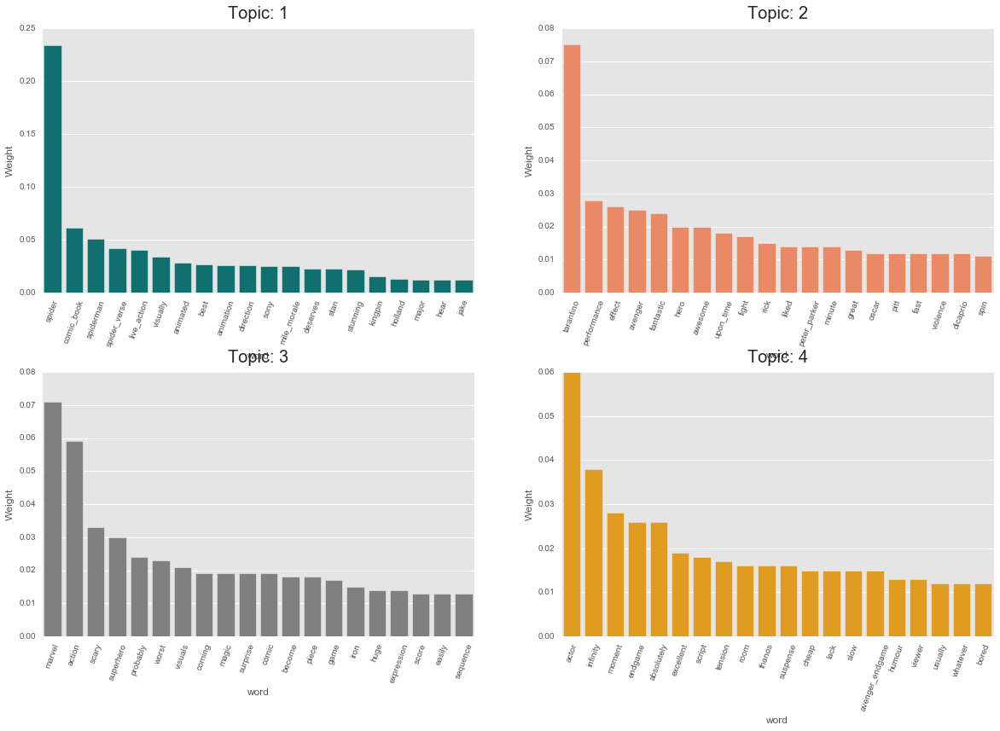

In [17]:
df_weights = build_dataframe_weights(lda_model,n_topics,20)
plot_weights(df_weights)

### Topic Modeling Visualization (pyLDAvis)

In [18]:
pyLDAvis.gensim.prepare(lda_model, bow, vocab_dict)

2019-08-10 18:33:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 800 documents
2019-08-10 18:33:50 [gensim.models.ldamodel] DEBUG: 800/800 documents converged within 500 iterations


PreparedData(topic_coordinates=            Freq  cluster  topics         x         y
topic                                                
5      53.331820        1       1 -0.254664 -0.036153
8      15.306179        1       2 -0.298180 -0.015759
9       6.840375        1       3  0.110318 -0.375578
1       5.161500        1       4  0.084678  0.146317
2       4.563495        1       5  0.034493  0.104478
3       4.526045        1       6  0.082816  0.068753
7       3.691462        1       7  0.101803  0.047629
6       2.619401        1       8  0.082046 -0.052063
0       2.202440        1       9 -0.059228  0.044331
4       1.757284        1      10  0.115918  0.068046, topic_info=     Category        Freq                Term       Total  loglift  logprob
term                                                                       
1083  Default  142.000000              spider  142.000000  30.0000  30.0000
961   Default  167.000000            original  167.000000  29.0000  29.0000
917   Default  747.000000                film  747.000000  28.0000  28.0000
354   Default  114.000000              horror  114.000000  27.0000  27.0000
642   Default  257.000000               great  257.000000  26.0000  26.0000
1111  Default  200.000000                best  200.000000  25.0000  25.0000
271   Default  106.000000           tarantino  106.000000  24.0000  24.0000
800   Default  237.000000              really  237.000000  23.0000  23.0000
653   Default   90.000000              marvel   90.000000  22.0000  22.0000
684   Default  124.000000           animation  124.000000  21.0000  21.0000
1284  Default  336.000000           character  336.000000  20.0000  20.0000
226   Default   59.000000           annabelle   59.000000  19.0000  19.0000
465   Default  395.000000               story  395.000000  18.0000  18.0000
7     Default   76.000000               actor   76.000000  17.0000  17.0000
501   Default   75.000000              action   75.000000  16.0000  16.0000
810   Default   85.000000              moment   85.000000  15.0000  15.0000
999   Default   59.000000           hollywood   59.000000  14.0000  14.0000
948   Default  109.000000             amazing  109.000000  13.0000  13.0000
503   Default   72.000000               music   72.000000  12.0000  12.0000
155   Default   67.000000              remake   67.000000  11.0000  11.0000
878   Default   61.000000            animated   61.000000  10.0000  10.0000
1078  Default   61.000000             emotion   61.000000   9.0000   9.0000
679   Default   59.000000               money   59.000000   8.0000   8.0000
624   Default   46.000000                done   46.000000   7.0000   7.0000
1264  Default  274.000000                like  274.000000   6.0000   6.0000
650   Default   58.000000              disney   58.000000   5.0000   5.0000
756   Default   47.000000            infinity   47.000000   4.0000   4.0000
548   Default   37.000000          comic_book   37.000000   3.0000   3.0000
1253  Default   35.000000           conjuring   35.000000   2.0000   2.0000
661   Default   51.000000             beatles   51.000000   1.0000   1.0000
...       ...         ...                 ...         ...      ...      ...
1253  Topic10   34.702893           conjuring   35.537093   4.0176  -2.6363
1175  Topic10   29.371813              warren   30.205986   4.0134  -2.8031
183   Topic10   26.704960          jump_scare   27.539235   4.0106  -2.8983
1136  Topic10   22.263036               scare   23.097232   4.0046  -3.0802
118   Topic10   20.485681      annabelle_come   21.319895   4.0015  -3.1634
527   Topic10   19.597327  conjuring_universe   20.431517   3.9997  -3.2078
815   Topic10   18.627729              creepy   19.461964   3.9976  -3.2585
867   Topic10   18.231559               house   19.065875   3.9967  -3.2800
20    Topic10   13.789299               ghost   14.623521   3.9827  -3.5593
1206  Topic10   13.377397            lorraine   14.211580   3.9809  -3.5896
21    Topic10   12.506456              de

### Determine Optimal Topics

In [19]:
def topic_model_coherence(corpus, texts, dictionary,max_topics=10):
    """
    Iterate of Range of Topics and Compute Coherence Scores to determine Optimal Number of Clusters
    """
    scores = []
    for n_topics in range(2, max_topics+1, 1):
        
        # LDA Model
        model = gensim.models.ldamodel.LdaModel(
                                               corpus=corpus, 
                                               id2word=dictionary,
                                               chunksize=100, 
                                               alpha='auto', 
                                               eta='auto', 
                                               random_state=42,
                                               iterations=500, 
                                               num_topics=n_topics, 
                                               passes=25, 
                                               eval_every=None
                                              )
        
        # Coherences
        coherences = gensim.models.CoherenceModel(model=model, 
                                                  corpus=bow,
                                                  texts=bigram_model,
                                                  dictionary=vocab_dict,
                                                  coherence='c_v')
        score = coherences.get_coherence()
        scores.append(score)
        print('Modeling {} topics - Score: {}'.format(n_topics,score))
    return scores

if __name__ == '__main__':
    coherences = topic_model_coherence(bow, bigram_model, vocab_dict, max_topics=30)

2019-08-10 18:33:55 [gensim.models.ldamodel] INFO: using autotuned alpha, starting with [0.5, 0.5]
2019-08-10 18:33:55 [gensim.models.ldamodel] INFO: using serial LDA version on this node
2019-08-10 18:33:55 [gensim.models.ldamodel] INFO: running online (multi-pass) LDA training, 2 topics, 25 passes over the supplied corpus of 800 documents, updating model once every 100 documents, evaluating perplexity every 0 documents, iterating 500x with a convergence threshold of 0.001000
2019-08-10 18:33:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #100/800
2019-08-10 18:33:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:33:56 [gensim.models.ldamodel] DEBUG: 89/100 documents converged within 500 iterations
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: optimized alpha [0.7109717, 0.5374443]
2019-08-10 18:33:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: merging changes f

2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: topic diff=0.443591, rho=0.377964
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #800/800
2019-08-10 18:33:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:33:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: optimized alpha [2.5534868, 1.7111455]
2019-08-10 18:33:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: topic #0 (2.553): 0.025*"film" + 0.015*"like" + 0.014*"time" + 0.014*"story" + 0.012*"good" + 0.011*"character" + 0.010*"original" + 0.009*"really" + 0.008*"make" + 0.008*"horror"
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: topic #1 (1.711): 0.026*"film" + 0.016*"great" + 0.011*"best" + 0.

2019-08-10 18:33:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: topic #0 (2.439): 0.022*"film" + 0.015*"like" + 0.014*"original" + 0.014*"time" + 0.013*"story" + 0.012*"character" + 0.010*"good" + 0.009*"really" + 0.008*"make" + 0.008*"much"
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: topic #1 (1.502): 0.028*"film" + 0.018*"spider" + 0.017*"great" + 0.013*"best" + 0.012*"marvel" + 0.010*"character" + 0.010*"scene" + 0.007*"story" + 0.007*"tarantino" + 0.007*"action"
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: topic diff=0.318988, rho=0.316228
2019-08-10 18:33:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #800/800
2019-08-10 18:33:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:33:56 [gensim.models.ldamodel] DEBUG: 100/100 documents conve

2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: topic diff=0.300979, rho=0.288675
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #600/800
2019-08-10 18:33:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:33:57 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: optimized alpha [1.6752667, 1.2505095]
2019-08-10 18:33:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: topic #0 (1.675): 0.022*"film" + 0.018*"story" + 0.016*"time" + 0.015*"like" + 0.013*"character" + 0.012*"good" + 0.011*"really" + 0.010*"much" + 0.008*"make" + 0.008*"even"
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: topic #1 (1.251): 0.037*"film" + 0.021*"spider" + 0.020*"great" + 0.016*

2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: optimized alpha [1.3079381, 1.0315169]
2019-08-10 18:33:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: topic #0 (1.308): 0.020*"film" + 0.020*"story" + 0.017*"like" + 0.013*"time" + 0.013*"character" + 0.012*"good" + 0.010*"really" + 0.010*"much" + 0.008*"make" + 0.008*"would"
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: topic #1 (1.032): 0.037*"film" + 0.027*"spider" + 0.020*"great" + 0.018*"best" + 0.015*"tarantino" + 0.013*"character" + 0.010*"animation" + 0.008*"hollywood" + 0.008*"amazing" + 0.008*"story"
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: topic diff=0.285328, rho=0.277350
2019-08-10 18:33:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #600/800
2019-08-10 18:33:57 [gensim.models.ldamodel] DEBUG: performing inference on a chu

2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: topic #1 (0.794): 0.039*"film" + 0.026*"tarantino" + 0.021*"great" + 0.015*"best" + 0.013*"hollywood" + 0.011*"character" + 0.009*"spider" + 0.009*"scene" + 0.008*"love" + 0.007*"story"
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: topic diff=0.334964, rho=0.267261
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #500/800
2019-08-10 18:33:58 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:33:58 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: optimized alpha [1.1333779, 0.88954276]
2019-08-10 18:33:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: topic #0 (1.133): 0.020*"story" + 0.018*"film" + 0.017*"lik

2019-08-10 18:33:58 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:33:58 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: optimized alpha [1.0413984, 0.7045817]
2019-08-10 18:33:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: topic #0 (1.041): 0.020*"story" + 0.018*"film" + 0.015*"like" + 0.013*"time" + 0.011*"character" + 0.011*"good" + 0.009*"much" + 0.009*"really" + 0.009*"make" + 0.008*"even"
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: topic #1 (0.705): 0.040*"film" + 0.026*"tarantino" + 0.021*"great" + 0.015*"best" + 0.014*"hollywood" + 0.011*"character" + 0.009*"spider" + 0.009*"scene" + 0.008*"love" + 0.007*"story"
2019-08-10 18:33:58 [gensim.models.ldamodel] INFO: topic diff

2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: topic #0 (0.955): 0.022*"story" + 0.017*"film" + 0.013*"like" + 0.011*"character" + 0.011*"time" + 0.010*"good" + 0.010*"beatles" + 0.009*"really" + 0.008*"make" + 0.008*"much"
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: topic #1 (0.566): 0.038*"film" + 0.027*"great" + 0.017*"spider" + 0.016*"best" + 0.013*"character" + 0.010*"story" + 0.009*"amazing" + 0.009*"action" + 0.009*"marvel" + 0.007*"also"
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: topic diff=0.256050, rho=0.250000
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #400/800
2019-08-10 18:33:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:33:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: optimized alpha [0.9504606, 0.64338136]
2019-08-10 18:33:59 [gensim.models.ldamodel] DEBUG: updating topics
20

2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: topic diff=0.147709, rho=0.242536
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #300/800
2019-08-10 18:33:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:33:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: optimized alpha [0.890565, 0.5297986]
2019-08-10 18:33:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: topic #0 (0.891): 0.022*"story" + 0.017*"film" + 0.013*"like" + 0.011*"character" + 0.011*"time" + 0.010*"good" + 0.010*"beatles" + 0.009*"really" + 0.008*"make" + 0.008*"much"
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: topic #1 (0.530): 0.039*"film" + 0.026*"great" + 0.017*"spider" + 0.01

2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: optimized alpha [0.772505, 0.53304577]
2019-08-10 18:33:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: topic #0 (0.773): 0.028*"story" + 0.016*"film" + 0.013*"like" + 0.013*"character" + 0.012*"time" + 0.010*"good" + 0.009*"original" + 0.008*"really" + 0.008*"first" + 0.008*"make"
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: topic #1 (0.533): 0.037*"film" + 0.021*"great" + 0.019*"spider" + 0.017*"best" + 0.013*"character" + 0.010*"story" + 0.010*"amazing" + 0.009*"action" + 0.009*"marvel" + 0.008*"scene"
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: topic diff=0.141741, rho=0.235702
2019-08-10 18:33:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #300/800
2019-08-10 18:33:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 

2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: topic #1 (0.490): 0.040*"film" + 0.019*"great" + 0.015*"best" + 0.014*"character" + 0.012*"story" + 0.011*"spider" + 0.009*"amazing" + 0.008*"animation" + 0.008*"really" + 0.007*"tarantino"
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: topic diff=0.246240, rho=0.229416
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #200/800
2019-08-10 18:34:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: optimized alpha [0.73334324, 0.51417446]
2019-08-10 18:34:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: topic #0 (0.733): 0.028*"story" + 0.016*"film" + 0.01

2019-08-10 18:34:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: optimized alpha [0.8574346, 0.4745185]
2019-08-10 18:34:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: topic #0 (0.857): 0.028*"story" + 0.016*"film" + 0.014*"like" + 0.013*"character" + 0.011*"time" + 0.010*"original" + 0.009*"good" + 0.009*"first" + 0.008*"woody" + 0.008*"make"
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: topic #1 (0.475): 0.040*"film" + 0.018*"great" + 0.015*"best" + 0.014*"character" + 0.012*"story" + 0.011*"spider" + 0.009*"amazing" + 0.008*"animation" + 0.008*"really" + 0.007*"tarantino"
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: to

2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: topic #0 (0.758): 0.017*"like" + 0.015*"story" + 0.015*"film" + 0.013*"original" + 0.013*"time" + 0.010*"character" + 0.010*"good" + 0.009*"make" + 0.008*"even" + 0.008*"first"
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: topic #1 (0.500): 0.040*"film" + 0.017*"great" + 0.014*"best" + 0.013*"spider" + 0.012*"character" + 0.010*"story" + 0.008*"tarantino" + 0.008*"really" + 0.008*"annabelle" + 0.008*"scene"
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: topic diff=0.226335, rho=0.223607
2019-08-10 18:34:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #100/800
2019-08-10 18:34:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:00 [gensim.models.lda

2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: topic diff=0.180795, rho=0.218218
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #800/800
2019-08-10 18:34:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: optimized alpha [0.7147172, 0.4885567]
2019-08-10 18:34:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: topic #0 (0.715): 0.017*"like" + 0.015*"story" + 0.015*"film" + 0.013*"original" + 0.013*"time" + 0.011*"character" + 0.009*"good" + 0.009*"make" + 0.008*"even" + 0.008*"first"
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: topic #1 (0.489): 0.040*"film" + 0.017*"great" + 0.013*"best" + 0.01

2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: optimized alpha [0.71052617, 0.44155228]
2019-08-10 18:34:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: topic #0 (0.711): 0.016*"like" + 0.015*"original" + 0.015*"film" + 0.014*"story" + 0.012*"time" + 0.011*"character" + 0.009*"make" + 0.008*"even" + 0.008*"good" + 0.008*"much"
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: topic #1 (0.442): 0.040*"film" + 0.018*"spider" + 0.017*"great" + 0.014*"best" + 0.013*"character" + 0.011*"tarantino" + 0.010*"marvel" + 0.009*"story" + 0.008*"really" + 0.008*"animation"
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: topic diff=0.176981, rho=0.213201
2019-08-10 18:34:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #800/800
2019-08-10 18:34:01 [gensim.models.ldamodel] DEBUG: performing inference on a chu

2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: topic #1 (0.558): 0.040*"film" + 0.018*"spider" + 0.017*"great" + 0.014*"best" + 0.013*"character" + 0.012*"tarantino" + 0.010*"marvel" + 0.010*"story" + 0.008*"really" + 0.008*"scene"
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: topic diff=0.165786, rho=0.208514
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #700/800
2019-08-10 18:34:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: optimized alpha [0.6768376, 0.43139288]
2019-08-10 18:34:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: topic #0 (0.677): 0.016*"like" + 0.015*"original" + 0.015*"

2019-08-10 18:34:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: optimized alpha [0.6298894, 0.54297656]
2019-08-10 18:34:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: topic #0 (0.630): 0.019*"story" + 0.016*"film" + 0.016*"like" + 0.012*"time" + 0.012*"character" + 0.009*"even" + 0.009*"make" + 0.008*"good" + 0.008*"much" + 0.008*"could"
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: topic #1 (0.543): 0.040*"film" + 0.018*"spider" + 0.017*"great" + 0.014*"best" + 0.013*"character" + 0.012*"tarantino" + 0.010*"story" + 0.010*"marvel" + 0.008*"really" + 0.008*"scene"
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: topic diff=

2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: topic #0 (0.569): 0.020*"story" + 0.016*"like" + 0.015*"film" + 0.012*"character" + 0.011*"time" + 0.008*"make" + 0.008*"even" + 0.008*"good" + 0.008*"much" + 0.008*"original"
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: topic #1 (0.508): 0.039*"film" + 0.021*"spider" + 0.017*"great" + 0.015*"best" + 0.014*"tarantino" + 0.013*"character" + 0.010*"story" + 0.009*"animation" + 0.008*"really" + 0.008*"hollywood"
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: topic diff=0.193100, rho=0.200000
2019-08-10 18:34:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #600/800
2019-08-10 18:34:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:02 [gensim.models.

2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: topic diff=0.226267, rho=0.196116
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #500/800
2019-08-10 18:34:03 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:03 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: optimized alpha [0.53582066, 0.48929745]
2019-08-10 18:34:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: topic #0 (0.536): 0.020*"story" + 0.016*"like" + 0.015*"film" + 0.012*"character" + 0.011*"time" + 0.008*"make" + 0.008*"even" + 0.008*"original" + 0.008*"could" + 0.008*"much"
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: topic #1 (0.489): 0.038*"film" + 0.021*"spider" + 0.016*"great" + 

2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: optimized alpha [0.5113542, 0.4312049]
2019-08-10 18:34:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: topic #0 (0.511): 0.020*"story" + 0.015*"film" + 0.014*"like" + 0.012*"character" + 0.011*"time" + 0.008*"make" + 0.008*"beatles" + 0.008*"original" + 0.008*"even" + 0.008*"good"
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: topic #1 (0.431): 0.039*"film" + 0.019*"tarantino" + 0.016*"great" + 0.013*"best" + 0.011*"character" + 0.011*"hollywood" + 0.010*"story" + 0.009*"spider" + 0.009*"really" + 0.008*"scene"
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: topic diff=0.220989, rho=0.192450
2019-08-10 18:34:03 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #500/800
2019-08-10 18:34:03 [gensim.models.ldamodel] DEBUG: performing inference on a chu

2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: topic #1 (0.372): 0.038*"film" + 0.019*"great" + 0.014*"spider" + 0.013*"best" + 0.013*"story" + 0.012*"character" + 0.010*"really" + 0.008*"good" + 0.007*"scene" + 0.007*"action"
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: topic diff=0.185470, rho=0.188982
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #400/800
2019-08-10 18:34:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: optimized alpha [0.4751485, 0.4099433]
2019-08-10 18:34:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: topic #0 (0.475): 0.020*"story" + 0.015*"film" + 0.014*"like" + 0

2019-08-10 18:34:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: optimized alpha [0.45259485, 0.35151345]
2019-08-10 18:34:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: topic #0 (0.453): 0.021*"story" + 0.016*"film" + 0.013*"like" + 0.012*"character" + 0.010*"time" + 0.009*"beatles" + 0.009*"original" + 0.008*"make" + 0.008*"music" + 0.007*"good"
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: topic #1 (0.352): 0.037*"film" + 0.018*"great" + 0.014*"spider" + 0.013*"best" + 0.013*"story" + 0.012*"character" + 0.010*"really" + 0.009*"good" + 0.007*"scene" + 0.007*"action"
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: topic di

2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: topic #0 (0.391): 0.026*"story" + 0.014*"film" + 0.013*"character" + 0.012*"like" + 0.011*"original" + 0.010*"time" + 0.008*"woody" + 0.008*"first" + 0.008*"make" + 0.007*"even"
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: topic #1 (0.357): 0.036*"film" + 0.016*"great" + 0.015*"spider" + 0.013*"best" + 0.013*"story" + 0.013*"character" + 0.010*"really" + 0.008*"good" + 0.008*"scene" + 0.008*"marvel"
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: topic diff=0.101015, rho=0.182574
2019-08-10 18:34:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #300/800
2019-08-10 18:34:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:04 [gensim.models.ldamodel] 

2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: topic diff=0.188348, rho=0.179605
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #200/800
2019-08-10 18:34:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: optimized alpha [0.3575778, 0.3333341]
2019-08-10 18:34:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: topic #0 (0.358): 0.026*"story" + 0.014*"film" + 0.013*"character" + 0.012*"like" + 0.011*"original" + 0.010*"time" + 0.008*"woody" + 0.008*"first" + 0.008*"make" + 0.007*"even"
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: topic #1 (0.333): 0.036*"film" + 0.015*"great" + 0.015*"spider" + 0

2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: optimized alpha [0.3689206, 0.2932468]
2019-08-10 18:34:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: topic #0 (0.369): 0.026*"story" + 0.015*"film" + 0.013*"character" + 0.012*"like" + 0.011*"original" + 0.010*"time" + 0.008*"woody" + 0.008*"first" + 0.008*"make" + 0.007*"even"
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: topic #1 (0.293): 0.037*"film" + 0.014*"story" + 0.014*"great" + 0.013*"character" + 0.012*"best" + 0.010*"spider" + 0.010*"really" + 0.009*"good" + 0.008*"time" + 0.008*"annabelle"
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: topic diff=0.185602, rho=0.176777
2019-08-10 18:34:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #200/800
2019-08-10 18:34:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 1

2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: topic #1 (0.288): 0.037*"film" + 0.013*"great" + 0.012*"story" + 0.012*"character" + 0.011*"spider" + 0.011*"best" + 0.009*"really" + 0.009*"good" + 0.008*"horror" + 0.008*"annabelle"
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: topic diff=0.167135, rho=0.176777
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #100/800
2019-08-10 18:34:06 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: optimized alpha [0.32762745, 0.26732653]
2019-08-10 18:34:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: topic #0 (0.328): 0.026*"story" + 0.015*"film" + 0.013*"cha

2019-08-10 18:34:06 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: optimized alpha [0.27348074, 0.26078832]
2019-08-10 18:34:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: topic #0 (0.273): 0.015*"story" + 0.014*"original" + 0.014*"film" + 0.014*"like" + 0.012*"time" + 0.011*"character" + 0.009*"make" + 0.008*"even" + 0.007*"first" + 0.007*"good"
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: topic #1 (0.261): 0.036*"film" + 0.013*"great" + 0.012*"story" + 0.012*"character" + 0.011*"spider" + 0.011*"best" + 0.009*"really" + 0.009*"good" + 0.008*"horror" + 0.008*"time"
2019-08-10 18:34:06 [gensim.models.ldamodel] INFO: topic diff=0

Modeling 2 topics - Score: 0.2696063605202721


2019-08-10 18:34:07 [gensim.models.ldamodel] DEBUG: 89/100 documents converged within 500 iterations
2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: optimized alpha [0.2575556, 0.10294974, 0.26622897]
2019-08-10 18:34:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: topic #0 (0.258): 0.054*"story" + 0.022*"film" + 0.022*"character" + 0.015*"woody" + 0.013*"ending" + 0.010*"time" + 0.009*"like" + 0.008*"much" + 0.008*"series" + 0.008*"going"
2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: topic #1 (0.103): 0.025*"story" + 0.018*"toy" + 0.016*"film" + 0.013*"great" + 0.012*"woody" + 0.012*"character" + 0.009*"made" + 0.009*"also" + 0.009*"year" + 0.008*"like"
2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: topic #2 (0.266): 0.049*"story" + 0.020*"woody" + 0.020*"film" + 0.018*"character" + 0.011*"toy" + 0.010*"pi

2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: optimized alpha [0.5674003, 0.23123617, 0.58023804]
2019-08-10 18:34:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: topic #0 (0.567): 0.025*"film" + 0.018*"like" + 0.018*"original" + 0.015*"time" + 0.013*"character" + 0.011*"good" + 0.011*"story" + 0.010*"much" + 0.010*"people" + 0.008*"disney"
2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: topic #1 (0.231): 0.027*"spider" + 0.020*"film" + 0.019*"great" + 0.010*"avenger" + 0.009*"action" + 0.009*"also" + 0.008*"minute" + 0.008*"character" + 0.008*"style" + 0.008*"tarantino"
2019-08-10 18:34:07 [gensim.models.ldamodel] INFO: topic #2 (0.580): 0.025*"film" + 0.012*"marvel" + 0.012*"character" + 0.011*"original" + 0.011*"story" + 0.011*"scene" + 0.010*"really" + 0.009*"make" + 0.009*"best" + 0.009*"music"
2019-08-10 

2019-08-10 18:34:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: topic #0 (0.770): 0.031*"film" + 0.017*"like" + 0.015*"story" + 0.015*"character" + 0.013*"time" + 0.013*"good" + 0.012*"much" + 0.008*"people" + 0.008*"many" + 0.008*"well"
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: topic #1 (0.318): 0.055*"spider" + 0.024*"great" + 0.023*"film" + 0.016*"tarantino" + 0.015*"best" + 0.012*"style" + 0.010*"spiderman" + 0.010*"also" + 0.009*"action" + 0.009*"love"
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: topic #2 (0.810): 0.028*"film" + 0.018*"story" + 0.014*"animation" + 0.013*"character" + 0.012*"best" + 0.012*"really" + 0.010*"great" + 0.009*"music" + 0.008*"scene" + 0.008*"make"
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: topic diff=0.345888, rho=0.316228
2019-08-10 18:34:08 [gensim.models.ldamo

2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: topic #0 (0.994): 0.025*"film" + 0.017*"like" + 0.016*"story" + 0.014*"good" + 0.013*"time" + 0.013*"character" + 0.010*"much" + 0.010*"beatles" + 0.008*"would" + 0.008*"original"
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: topic #1 (0.328): 0.033*"spider" + 0.028*"great" + 0.020*"film" + 0.014*"best" + 0.013*"yesterday" + 0.013*"action" + 0.010*"love" + 0.010*"also" + 0.009*"beatles" + 0.008*"superhero"
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: topic #2 (1.022): 0.025*"story" + 0.024*"film" + 0.013*"music" + 0.013*"really" + 0.012*"character" + 0.011*"great" + 0.008*"world" + 0.008*"make" + 0.007*"every" + 0.007*"best"
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: topic diff=0.363072, rho=0.301511
2019-08-10 18:34:08 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #400/800
2019-08-10 18:

2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic #0 (1.355): 0.025*"film" + 0.018*"story" + 0.018*"like" + 0.015*"time" + 0.014*"good" + 0.014*"character" + 0.011*"original" + 0.011*"much" + 0.009*"also" + 0.008*"people"
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic #1 (0.348): 0.031*"spider" + 0.023*"film" + 0.020*"great" + 0.016*"best" + 0.010*"action" + 0.010*"tarantino" + 0.010*"also" + 0.010*"universe" + 0.009*"awesome" + 0.009*"style"
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic #2 (1.476): 0.035*"story" + 0.024*"film" + 0.014*"character" + 0.011*"woody" + 0.011*"really" + 0.010*"great" + 0.009*"animation" + 0.008*"first" + 0.008*"year" + 0.008*"best"
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic diff=0.294547, rho=0.288675
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #200/800
2019-08-10 18:34:09 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:09 [gensim

2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic #1 (0.498): 0.044*"spider" + 0.026*"film" + 0.020*"great" + 0.019*"best" + 0.017*"tarantino" + 0.014*"action" + 0.012*"avenger" + 0.011*"style" + 0.011*"superhero" + 0.009*"spiderman"
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic #2 (1.579): 0.025*"film" + 0.019*"story" + 0.014*"character" + 0.012*"really" + 0.011*"animation" + 0.011*"great" + 0.010*"marvel" + 0.009*"music" + 0.008*"every" + 0.008*"make"
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic diff=0.269040, rho=0.288675
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #800/800
2019-08-10 18:34:09 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: optimized alpha [1.7773846, 0.49108997, 1.7600827]
2019-08-10 18:34:09 [gensim.models.ldamodel]

2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic #2 (1.552): 0.028*"film" + 0.026*"story" + 0.017*"animation" + 0.016*"character" + 0.013*"great" + 0.012*"really" + 0.009*"amazing" + 0.009*"best" + 0.008*"music" + 0.008*"year"
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic diff=0.276984, rho=0.277350
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #600/800
2019-08-10 18:34:09 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: optimized alpha [1.5459076, 0.59464717, 1.6597587]
2019-08-10 18:34:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic #0 (1.546): 0.028*"film" + 0.019*"like" + 0.

2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic #2 (1.531): 0.032*"story" + 0.025*"film" + 0.015*"character" + 0.013*"great" + 0.012*"really" + 0.011*"music" + 0.008*"woody" + 0.008*"world" + 0.007*"every" + 0.007*"amazing"
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic diff=0.277727, rho=0.267261
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #400/800
2019-08-10 18:34:09 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: optimized alpha [1.5129094, 0.51764244, 1.4963512]
2019-08-10 18:34:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:09 [gensim.models.ldamodel] INFO: topic #0 (1.513): 0.025*"film" + 0.019*"like" + 0.01

2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: topic diff=0.238899, rho=0.258199
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #200/800
2019-08-10 18:34:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: optimized alpha [1.306361, 0.46448585, 1.5395483]
2019-08-10 18:34:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: topic #0 (1.306): 0.021*"film" + 0.020*"like" + 0.018*"good" + 0.016*"time" + 0.013*"original" + 0.011*"character" + 0.011*"much" + 0.009*"people" + 0.009*"would" + 0.009*"also"
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: topic #1 (0.464): 0.053*"spider" + 0.028*"film" + 0.025*"

2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #800/800
2019-08-10 18:34:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: optimized alpha [1.7452478, 0.5005696, 1.8075548]
2019-08-10 18:34:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: topic #0 (1.745): 0.021*"like" + 0.020*"film" + 0.017*"good" + 0.017*"time" + 0.017*"original" + 0.010*"much" + 0.010*"scene" + 0.009*"make" + 0.009*"people" + 0.009*"character"
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: topic #1 (0.501): 0.039*"spider" + 0.033*"film" + 0.024*"best" + 0.023*"tarantino" + 0.018*"great" + 0.014*"action" + 0.013*"marvel" + 0.012*"

2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #600/800
2019-08-10 18:34:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: optimized alpha [1.4859936, 0.5859892, 1.6616546]
2019-08-10 18:34:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: topic #0 (1.486): 0.022*"film" + 0.021*"like" + 0.018*"time" + 0.017*"good" + 0.012*"much" + 0.011*"people" + 0.010*"would" + 0.010*"character" + 0.010*"make" + 0.009*"even"
2019-08-10 18:34:10 [gensim.models.ldamodel] INFO: topic #1 (0.586): 0.045*"spider" + 0.035*"film" + 0.028*"tarantino" + 0.023*"best" + 0.018*"great" + 0.017*"marvel" + 0.015*"action" + 0.014*"holl

2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #400/800
2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: optimized alpha [1.4155886, 0.4840209, 1.4545736]
2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #0 (1.416): 0.020*"film" + 0.019*"like" + 0.016*"time" + 0.015*"good" + 0.011*"beatles" + 0.011*"much" + 0.010*"love" + 0.010*"would" + 0.010*"make" + 0.010*"scene"
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #1 (0.484): 0.056*"tarantino" + 0.037*"film" + 0.029*"hollywood" + 0.022*"best" + 0.021*"spider" + 0.020*"great" + 0.013*"upon_time" + 0.011*"r

2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: optimized alpha [1.2161167, 0.4340363, 1.4884657]
2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #0 (1.216): 0.020*"like" + 0.018*"good" + 0.017*"film" + 0.016*"time" + 0.015*"original" + 0.010*"people" + 0.010*"much" + 0.010*"would" + 0.010*"make" + 0.010*"scene"
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #1 (0.434): 0.051*"spider" + 0.032*"film" + 0.025*"best" + 0.022*"great" + 0.021*"action" + 0.020*"marvel" + 0.015*"tarantino" + 0.012*"spiderman" + 0.011*"superhero" + 0.010*"endgame"
2019-08-10 18:34:11 [gensim.models.ldamodel] 

2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: optimized alpha [1.5309128, 0.44869152, 1.6491618]
2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #0 (1.531): 0.021*"like" + 0.018*"original" + 0.017*"good" + 0.017*"film" + 0.016*"time" + 0.010*"scene" + 0.010*"make" + 0.010*"people" + 0.009*"much" + 0.009*"would"
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #1 (0.449): 0.039*"spider" + 0.036*"film" + 0.025*"tarantino" + 0.023*"best" + 0.019*"marvel" + 0.016*"great" + 0.014*"action" + 0.013*"hollywood" + 0.012*"universe" + 0.010*"comic_book"
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #2 (1.649): 0.031*"film" + 0.026*"story" + 0.016*"character" + 0.013*"great" + 0.011*"

2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: optimized alpha [1.3519218, 0.53055996, 1.565782]
2019-08-10 18:34:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #0 (1.352): 0.021*"like" + 0.019*"film" + 0.018*"time" + 0.017*"good" + 0.012*"people" + 0.011*"much" + 0.010*"would" + 0.010*"make" + 0.010*"even" + 0.009*"love"
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #1 (0.531): 0.044*"spider" + 0.038*"film" + 0.028*"tarantino" + 0.023*"best" + 0.021*"marvel" + 0.017*"great" + 0.015*"hollywood" + 0.015*"action" + 0.012*"comic_book" + 0.011*"avenger"
2019-08-10 18:34:11 [gensim.models.ldamodel] INFO: topic #2 (1.566): 0.032*"film" + 0.030*"story" + 0.020*"character" + 0.014*"great" + 0.013*"animati

2019-08-10 18:34:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: optimized alpha [1.2916278, 0.4423241, 1.3846946]
2019-08-10 18:34:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #0 (1.292): 0.019*"like" + 0.017*"film" + 0.015*"time" + 0.015*"good" + 0.011*"beatles" + 0.011*"love" + 0.010*"would" + 0.010*"much" + 0.010*"make" + 0.009*"original"
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #1 (0.442): 0.054*"tarantino" + 0.039*"film" + 0.029*"hollywood" + 0.022*"spider" + 0.021*"best" + 0.018*"great" + 0.013*"upon_time" + 0.011*"action" + 0.010*"rick" + 0.010*"marvel"
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #2 (1.385): 0.034*"story" + 0.031*"film" + 0.018*"character" + 0.013*"great" + 0.011*"really

2019-08-10 18:34:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: optimized alpha [1.1274482, 0.4040893, 1.4353437]
2019-08-10 18:34:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #0 (1.127): 0.021*"like" + 0.017*"good" + 0.016*"original" + 0.015*"time" + 0.015*"film" + 0.011*"people" + 0.010*"make" + 0.010*"would" + 0.010*"love" + 0.009*"scene"
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #1 (0.404): 0.050*"spider" + 0.034*"film" + 0.025*"best" + 0.023*"marvel" + 0.020*"action" + 0.020*"great" + 0.017*"tarantino" + 0.012*"spiderman" + 0.011*"superhero" + 0.010*"endgame"
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #2 (1.435): 0.038*"story" + 0.028*"film" + 0.019*"character" + 0.011*"great" + 0.011*"rea

2019-08-10 18:34:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: optimized alpha [1.3586861, 0.40970382, 1.5346491]
2019-08-10 18:34:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #0 (1.359): 0.021*"like" + 0.018*"original" + 0.016*"time" + 0.016*"good" + 0.015*"film" + 0.010*"make" + 0.010*"people" + 0.010*"scene" + 0.009*"would" + 0.009*"love"
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #1 (0.410): 0.039*"spider" + 0.038*"film" + 0.025*"tarantino" + 0.023*"best" + 0.021*"marvel" + 0.015*"great" + 0.014*"hollywood" + 0.013*"action" + 0.011*"universe" + 0.011*"comic_book"
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #2 (1.535): 0.032*"film" + 0.027*"story" + 0.017*"character" + 0.013*"great" + 0.011*"

2019-08-10 18:34:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: optimized alpha [1.2316546, 0.4840567, 1.485635]
2019-08-10 18:34:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #0 (1.232): 0.021*"like" + 0.017*"time" + 0.016*"film" + 0.016*"good" + 0.012*"people" + 0.010*"make" + 0.010*"would" + 0.010*"much" + 0.010*"even" + 0.010*"original"
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #1 (0.484): 0.044*"spider" + 0.039*"film" + 0.028*"tarantino" + 0.023*"best" + 0.023*"marvel" + 0.016*"great" + 0.016*"hollywood" + 0.014*"action" + 0.012*"comic_book" + 0.010*"avenger"
2019-08-10 18:34:12 [gensim.models.ldamodel] INFO: topic #2 (1.486): 0.033*"film" + 0.031*"story" + 0.020*"character" + 0.014*"great" + 0.012*"anim

2019-08-10 18:34:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: optimized alpha [1.180978, 0.41010827, 1.3228426]
2019-08-10 18:34:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #0 (1.181): 0.019*"like" + 0.015*"film" + 0.015*"time" + 0.014*"good" + 0.011*"beatles" + 0.011*"love" + 0.010*"original" + 0.010*"make" + 0.010*"would" + 0.010*"music"
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #1 (0.410): 0.051*"tarantino" + 0.040*"film" + 0.029*"hollywood" + 0.023*"spider" + 0.021*"best" + 0.018*"great" + 0.012*"upon_time" + 0.011*"action" + 0.011*"marvel" + 0.010*"scene"
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #2 (1.323): 0.034*"story" + 0.031*"film" + 0.019*"character" + 0.013*"great" + 0.011*"real

2019-08-10 18:34:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: optimized alpha [1.0467442, 0.37937692, 1.3779008]
2019-08-10 18:34:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #0 (1.047): 0.020*"like" + 0.016*"original" + 0.016*"good" + 0.015*"time" + 0.013*"film" + 0.011*"people" + 0.010*"make" + 0.009*"would" + 0.009*"love" + 0.009*"scene"
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #1 (0.379): 0.049*"spider" + 0.035*"film" + 0.024*"best" + 0.023*"marvel" + 0.019*"great" + 0.019*"action" + 0.018*"tarantino" + 0.011*"spiderman" + 0.010*"superhero" + 0.010*"scene"
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #2 (1.378): 0.038*"story" + 0.029*"film" + 0.019*"character" + 0.011*"great" + 0.011*"real

2019-08-10 18:34:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: optimized alpha [1.2148921, 0.38009596, 1.4244255]
2019-08-10 18:34:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #0 (1.215): 0.021*"like" + 0.018*"original" + 0.015*"time" + 0.014*"good" + 0.013*"film" + 0.010*"people" + 0.010*"make" + 0.010*"scene" + 0.009*"would" + 0.009*"even"
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #1 (0.380): 0.039*"spider" + 0.039*"film" + 0.026*"tarantino" + 0.022*"best" + 0.021*"marvel" + 0.015*"great" + 0.015*"hollywood" + 0.013*"action" + 0.011*"universe" + 0.010*"comic_book"
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #2 (1.424): 0.032*"film" + 0.028*"story" + 0.017*"character" + 0.013*"great" + 0.011*"

2019-08-10 18:34:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: optimized alpha [1.1217483, 0.44634628, 1.3939291]
2019-08-10 18:34:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #0 (1.122): 0.020*"like" + 0.016*"time" + 0.015*"film" + 0.014*"good" + 0.012*"people" + 0.010*"make" + 0.010*"original" + 0.010*"would" + 0.010*"even" + 0.009*"love"
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #1 (0.446): 0.043*"spider" + 0.040*"film" + 0.028*"tarantino" + 0.023*"marvel" + 0.022*"best" + 0.016*"hollywood" + 0.016*"great" + 0.013*"action" + 0.011*"comic_book" + 0.010*"avenger"
2019-08-10 18:34:13 [gensim.models.ldamodel] INFO: topic #2 (1.394): 0.033*"film" + 0.032*"story" + 0.020*"character" + 0.014*"great" + 0.012*"re

2019-08-10 18:34:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: optimized alpha [1.0771015, 0.3800844, 1.2415814]
2019-08-10 18:34:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #0 (1.077): 0.019*"like" + 0.014*"time" + 0.014*"film" + 0.013*"good" + 0.011*"beatles" + 0.011*"original" + 0.010*"love" + 0.010*"make" + 0.010*"music" + 0.010*"would"
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #1 (0.380): 0.050*"tarantino" + 0.041*"film" + 0.028*"hollywood" + 0.023*"spider" + 0.021*"best" + 0.017*"great" + 0.012*"upon_time" + 0.011*"marvel" + 0.011*"scene" + 0.011*"action"
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #2 (1.242): 0.035*"story" + 0.032*"film" + 0.019*"character" + 0.014*"great" + 0.011*"real

2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: optimized alpha [0.9655069, 0.35352844, 1.2944665]
2019-08-10 18:34:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #0 (0.966): 0.020*"like" + 0.017*"original" + 0.014*"time" + 0.014*"good" + 0.012*"film" + 0.011*"people" + 0.010*"make" + 0.009*"would" + 0.009*"love" + 0.009*"scene"
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #1 (0.354): 0.049*"spider" + 0.036*"film" + 0.024*"best" + 0.024*"marvel" + 0.018*"great" + 0.018*"tarantino" + 0.018*"action" + 0.011*"spiderman" + 0.011*"hollywood" + 0.011*"scene"
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #2 (1.294): 0.038*"story" + 0.029*"film" + 0.019*"character" + 0.012*"great" + 0.011*"really" + 0.009*"animation" + 0.008*"amazing" + 0.008*"woody" + 0.008*"time" + 0.008*"ending"
2019-08-10 1

2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: optimized alpha [1.0906565, 0.3496324, 1.3081017]
2019-08-10 18:34:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #0 (1.091): 0.020*"like" + 0.019*"original" + 0.015*"time" + 0.013*"film" + 0.012*"good" + 0.011*"people" + 0.010*"make" + 0.009*"scene" + 0.009*"even" + 0.009*"would"
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #1 (0.350): 0.039*"film" + 0.039*"spider" + 0.026*"tarantino" + 0.022*"best" + 0.021*"marvel" + 0.015*"hollywood" + 0.015*"great" + 0.012*"action" + 0.010*"comic_book" + 0.010*"scene"
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #2 (1.308): 0.033*"film" + 0.028*"story" + 0.017*"character" + 0.013*"great" + 0.012*"really" + 0.010*"horror" + 0.009*"annabelle" + 0.009*"animation" + 0.009*"time" + 0.007*"best"
2019-08-10 

2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: optimized alpha [1.0253065, 0.40926751, 1.3000456]
2019-08-10 18:34:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #0 (1.025): 0.020*"like" + 0.016*"time" + 0.014*"film" + 0.013*"good" + 0.012*"people" + 0.011*"original" + 0.010*"make" + 0.010*"even" + 0.010*"would" + 0.009*"love"
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #1 (0.409): 0.042*"spider" + 0.041*"film" + 0.028*"tarantino" + 0.022*"marvel" + 0.022*"best" + 0.016*"hollywood" + 0.015*"great" + 0.012*"action" + 0.011*"comic_book" + 0.010*"scene"
2019-08-10 18:34:14 [gensim.models.ldamodel] INFO: topic #2 (1.300): 0.033*"film" + 0.032*"story" + 0.020*"character" + 0.014*"great" + 0.012*"really" + 0.012*"animation" + 0.009*"time" + 0.009*"year" + 0.009*"amazing" + 0.007*"much"
2019-08-10 18:3

2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: optimized alpha [0.99015003, 0.35153607, 1.1683669]
2019-08-10 18:34:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: topic #0 (0.990): 0.019*"like" + 0.014*"time" + 0.013*"film" + 0.012*"good" + 0.011*"original" + 0.011*"beatles" + 0.010*"music" + 0.010*"make" + 0.010*"love" + 0.010*"people"
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: topic #1 (0.352): 0.048*"tarantino" + 0.041*"film" + 0.028*"hollywood" + 0.024*"spider" + 0.020*"best" + 0.016*"great" + 0.012*"marvel" + 0.011*"upon_time" + 0.011*"scene" + 0.010*"action"
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: topic #2 (1.168): 0.035*"story" + 0.032*"film" + 0.019*"character" + 0.014*"great" + 0.012*"really" + 0.008*"ending" + 0.008*"time" + 0.008*"plot" + 0.008*"amazing" + 0.007*"year"
2019-08-10 18:3

2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: optimized alpha [0.89763856, 0.32771105, 1.220627]
2019-08-10 18:34:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: topic #0 (0.898): 0.019*"like" + 0.017*"original" + 0.014*"time" + 0.012*"good" + 0.012*"film" + 0.011*"people" + 0.010*"make" + 0.009*"would" + 0.009*"love" + 0.009*"scene"
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: topic #1 (0.328): 0.048*"spider" + 0.036*"film" + 0.024*"marvel" + 0.023*"best" + 0.019*"tarantino" + 0.018*"great" + 0.016*"action" + 0.011*"hollywood" + 0.011*"spiderman" + 0.011*"scene"
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: topic #2 (1.221): 0.038*"story" + 0.030*"film" + 0.019*"character" + 0.012*"great" + 0.011*"really" + 0.009*"animation" + 0.008*"amazing" + 0.008*"woody" + 0.008*"time" + 0.007*"ending"
2019-08-10 1

2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: optimized alpha [1.0006642, 0.32277268, 1.2227477]
2019-08-10 18:34:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: topic #0 (1.001): 0.020*"like" + 0.019*"original" + 0.014*"time" + 0.012*"film" + 0.011*"good" + 0.011*"people" + 0.010*"make" + 0.009*"scene" + 0.009*"even" + 0.008*"would"
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: topic #1 (0.323): 0.040*"film" + 0.039*"spider" + 0.026*"tarantino" + 0.021*"marvel" + 0.021*"best" + 0.015*"hollywood" + 0.014*"great" + 0.011*"action" + 0.010*"comic_book" + 0.010*"scene"
2019-08-10 18:34:15 [gensim.models.ldamodel] INFO: topic #2 (1.223): 0.033*"film" + 0.028*"story" + 0.017*"character" + 0.013*"great" + 0.012*"really" + 0.010*"horror" + 0.009*"annabelle" + 0.009*"time" + 0.009*"animation" + 0.008*"good"
2019-08-10

2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: optimized alpha [0.95132095, 0.3779483, 1.2294291]
2019-08-10 18:34:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #0 (0.951): 0.019*"like" + 0.015*"time" + 0.013*"film" + 0.012*"people" + 0.011*"good" + 0.011*"original" + 0.011*"make" + 0.010*"even" + 0.009*"would" + 0.009*"music"
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #1 (0.378): 0.042*"spider" + 0.041*"film" + 0.028*"tarantino" + 0.022*"marvel" + 0.022*"best" + 0.016*"hollywood" + 0.014*"great" + 0.012*"action" + 0.011*"comic_book" + 0.010*"scene"
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #2 (1.229): 0.033*"film" + 0.032*"story" + 0.020*"character" + 0.014*"great" + 0.013*"really" + 0.012*"animation" + 0.009*"time" + 0.009*"amazing" + 0.009*"year" + 0.008*"good"
2019-08-10 18:

2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: optimized alpha [0.92524225, 0.3286317, 1.116269]
2019-08-10 18:34:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #0 (0.925): 0.018*"like" + 0.014*"time" + 0.013*"film" + 0.011*"original" + 0.011*"beatles" + 0.010*"music" + 0.010*"good" + 0.010*"make" + 0.010*"people" + 0.010*"love"
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #1 (0.329): 0.047*"tarantino" + 0.041*"film" + 0.027*"hollywood" + 0.024*"spider" + 0.020*"best" + 0.016*"great" + 0.012*"marvel" + 0.011*"upon_time" + 0.011*"scene" + 0.010*"action"
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #2 (1.116): 0.035*"story" + 0.032*"film" + 0.019*"character" + 0.014*"great" + 0.012*"really" + 0.009*"time" + 0.008*"ending" + 0.008*"good" + 0.008*"plot" + 0.008*"amazing"
2019-08-10 18:34:

2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: optimized alpha [0.84762657, 0.3087015, 1.1702479]
2019-08-10 18:34:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #0 (0.848): 0.019*"like" + 0.017*"original" + 0.014*"time" + 0.011*"people" + 0.011*"film" + 0.011*"good" + 0.010*"make" + 0.009*"would" + 0.009*"even" + 0.009*"love"
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #1 (0.309): 0.047*"spider" + 0.036*"film" + 0.024*"marvel" + 0.023*"best" + 0.019*"tarantino" + 0.017*"great" + 0.016*"action" + 0.011*"hollywood" + 0.011*"spiderman" + 0.011*"scene"
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #2 (1.170): 0.037*"story" + 0.030*"film" + 0.019*"character" + 0.012*"great" + 0.012*"really" + 0.009*"animation" + 0.008*"time" + 0.008*"amazing" + 0.008*"good" + 0.008*"woody"
2019-08-10 18:3

2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: optimized alpha [0.9359533, 0.30471227, 1.1664107]
2019-08-10 18:34:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #0 (0.936): 0.019*"like" + 0.019*"original" + 0.014*"time" + 0.012*"film" + 0.011*"people" + 0.011*"make" + 0.010*"good" + 0.009*"scene" + 0.009*"even" + 0.008*"would"
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #1 (0.305): 0.040*"film" + 0.039*"spider" + 0.026*"tarantino" + 0.021*"marvel" + 0.021*"best" + 0.015*"hollywood" + 0.014*"great" + 0.011*"action" + 0.010*"comic_book" + 0.010*"scene"
2019-08-10 18:34:16 [gensim.models.ldamodel] INFO: topic #2 (1.166): 0.033*"film" + 0.028*"story" + 0.017*"character" + 0.013*"great" + 0.012*"really" + 0.010*"horror" + 0.009*"time" + 0.009*"good" + 0.009*"animation" + 0.009*"annabelle"
2019-08-10

Modeling 3 topics - Score: 0.3001689812403605


2019-08-10 18:34:17 [gensim.models.ldamodel] DEBUG: 92/100 documents converged within 500 iterations
2019-08-10 18:34:17 [gensim.models.ldamodel] INFO: optimized alpha [0.18216875, 0.08406885, 0.17489989, 0.13897255]
2019-08-10 18:34:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:17 [gensim.models.ldamodel] INFO: topic #0 (0.182): 0.064*"story" + 0.021*"character" + 0.019*"film" + 0.014*"woody" + 0.013*"ending" + 0.010*"like" + 0.009*"series" + 0.008*"much" + 0.008*"time" + 0.008*"going"
2019-08-10 18:34:17 [gensim.models.ldamodel] INFO: topic #1 (0.084): 0.024*"story" + 0.019*"toy" + 0.019*"film" + 0.014*"great" + 0.013*"year" + 0.012*"woody" + 0.011*"made" + 0.009*"series" + 0.009*"never" + 0.008*"franchise"
2019-08-10 18:34:17 [gensim.models.ldamodel] INFO: topic #2 (0.175): 0.049*"story" + 0.020*"woody" + 0.019*"film" + 0.013*"character" + 0.012*"

2019-08-10 18:34:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #0 (0.304): 0.025*"film" + 0.018*"story" + 0.018*"like" + 0.016*"character" + 0.011*"time" + 0.010*"people" + 0.010*"really" + 0.009*"good" + 0.008*"much" + 0.008*"going"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #1 (0.183): 0.036*"spider" + 0.026*"film" + 0.026*"great" + 0.017*"avenger" + 0.014*"action" + 0.012*"watch" + 0.011*"hero" + 0.011*"superhero" + 0.011*"awesome" + 0.009*"tarantino"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #2 (0.380): 0.026*"film" + 0.022*"marvel" + 0.019*"best" + 0.014*"story" + 0.014*"really" + 0.011*"scene" + 0.011*"great" + 0.011*"time" + 0.011*"even" + 0.010*"character"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #3 (0.249): 0.047*"film" + 0.019*"character" + 0.014*"many" + 0

2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #0 (0.407): 0.025*"story" + 0.018*"like" + 0.018*"film" + 0.013*"character" + 0.010*"good" + 0.010*"home" + 0.009*"really" + 0.009*"time" + 0.009*"beatles" + 0.008*"would"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #1 (0.198): 0.031*"great" + 0.028*"spider" + 0.021*"film" + 0.013*"action" + 0.013*"yesterday" + 0.012*"beatles" + 0.010*"also" + 0.009*"watch" + 0.008*"classic" + 0.008*"would"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #2 (0.501): 0.021*"story" + 0.020*"film" + 0.018*"music" + 0.013*"really" + 0.012*"best" + 0.010*"great" + 0.010*"scene" + 0.009*"world" + 0.009*"make" + 0.009*"even"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #3 (0.292): 0.040*"film" + 0.019*"character" + 0.012*"story" + 0.012*"good" + 0.011*"idea" + 0.010*"well" + 0.010*"actor" + 0.010*"time" + 0.010*"many" + 0.009*"much"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic diff=0.401429, rho=0.316228
201

2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #1 (0.265): 0.032*"spider" + 0.024*"great" + 0.024*"film" + 0.012*"action" + 0.010*"avenger" + 0.010*"minute" + 0.009*"also" + 0.009*"watch" + 0.008*"awesome" + 0.008*"universe"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #2 (0.847): 0.021*"film" + 0.015*"story" + 0.015*"best" + 0.013*"scene" + 0.012*"really" + 0.011*"original" + 0.010*"time" + 0.010*"make" + 0.010*"great" + 0.010*"even"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic #3 (0.463): 0.045*"film" + 0.022*"annabelle" + 0.016*"character" + 0.011*"actor" + 0.011*"time" + 0.011*"good" + 0.011*"well" + 0.011*"many" + 0.009*"much" + 0.009*"story"
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: topic diff=0.330694, rho=0.316228
2019-08-10 18:34:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #100/800
2019-08-10 18:34:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:18 [gensim.models

2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic #2 (1.017): 0.023*"film" + 0.022*"best" + 0.018*"story" + 0.014*"animation" + 0.012*"really" + 0.012*"great" + 0.010*"music" + 0.010*"scene" + 0.010*"character" + 0.010*"even"
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic #3 (0.539): 0.052*"film" + 0.021*"character" + 0.016*"actor" + 0.013*"tarantino" + 0.012*"many" + 0.011*"well" + 0.011*"animation" + 0.010*"good" + 0.010*"much" + 0.009*"story"
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic diff=0.289820, rho=0.301511
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #600/800
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: optimized alpha [0.9079943, 0.37180158, 1.112908, 0.57383865]
2019-08-10 18:34:19 [gensim.models.ldamode

2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic #3 (0.605): 0.045*"film" + 0.021*"character" + 0.015*"story" + 0.015*"annabelle" + 0.010*"many" + 0.010*"well" + 0.009*"time" + 0.009*"actor" + 0.009*"good" + 0.008*"amazing"
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic diff=0.195085, rho=0.288675
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #300/800
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: optimized alpha [1.0826716, 0.36637437, 1.2402732, 0.6392673]
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic #0 (1.083): 0.022*"story" + 0.020*"l

2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic diff=0.251228, rho=0.288675
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #800/800
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: optimized alpha [1.5197742, 0.46854833, 1.716561, 0.91248155]
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic #0 (1.520): 0.024*"like" + 0.015*"original" + 0.014*"story" + 0.013*"good" + 0.013*"film" + 0.012*"character" + 0.012*"time" + 0.011*"people" + 0.011*"home" + 0.009*"really"
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic #1 (0.469): 0.046*"spider" + 0.024*"g

2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: optimized alpha [1.4947636, 0.5800151, 1.8163643, 0.9410633]
2019-08-10 18:34:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic #0 (1.495): 0.025*"like" + 0.018*"story" + 0.014*"character" + 0.013*"film" + 0.013*"good" + 0.013*"people" + 0.010*"would" + 0.010*"time" + 0.010*"really" + 0.009*"much"
2019-08-10 18:34:19 [gensim.models.ldamodel] INFO: topic #1 (0.580): 0.081*"spider" + 0.027*"great" + 0.023*"tarantino" + 0.020*"film" + 0.017*"action" + 0.016*"spiderman" + 0.015*"hollywood" + 0.014*"spider_verse" + 0.013*"superhero" + 0.011*"awesome"
2019-08-10 18:34:19 

2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: optimized alpha [1.5336556, 0.5235108, 1.8308629, 0.9290382]
2019-08-10 18:34:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #0 (1.534): 0.025*"story" + 0.022*"like" + 0.014*"good" + 0.014*"character" + 0.012*"home" + 0.012*"original" + 0.011*"people" + 0.010*"film" + 0.010*"really" + 0.010*"time"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #1 (0.524): 0.069*"spider" + 0.031*"action" + 0.030*"great" + 0.017*"film" + 0.015*"spiderman" + 0.014*"holland" + 0.014*"superhero" + 0.012*"peter" + 0.011*"homecoming" + 0.011*"awesome"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #2 (1.831): 0.030*"story" + 0.021*"film" + 0.017*"best" + 0.011*"great" + 0.011*"really" + 0.011*"character" + 0.010*"marvel" + 0.010*"time" + 0.009*"scene" + 0.009*"every

2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #0 (2.068): 0.026*"like" + 0.021*"original" + 0.013*"people" + 0.013*"good" + 0.013*"character" + 0.012*"story" + 0.011*"time" + 0.010*"disney" + 0.010*"would" + 0.010*"film"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #1 (0.658): 0.059*"spider" + 0.024*"great" + 0.022*"action" + 0.018*"tarantino" + 0.018*"film" + 0.015*"avenger" + 0.014*"superhero" + 0.014*"minute" + 0.012*"spiderman" + 0.012*"universe"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #2 (2.381): 0.022*"film" + 0.016*"story" + 0.016*"best" + 0.012*"marvel" + 0.012*"remake" + 0.011*"time" + 0.011*"great" + 0.011*"animation" + 0.010*"character" + 0.010*"scene"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #3 (1.069): 0.064*"film" + 0.019*"actor" + 0.019*"character" + 0.014*"many" + 0.011*"well" + 0.010*"tarantino" + 0.

2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #1 (0.635): 0.047*"tarantino" + 0.030*"hollywood" + 0.030*"spider" + 0.028*"great" + 0.017*"action" + 0.016*"film" + 0.012*"love" + 0.010*"minute" + 0.009*"classic" + 0.009*"fantastic"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #2 (2.142): 0.022*"story" + 0.022*"film" + 0.017*"best" + 0.013*"great" + 0.012*"music" + 0.012*"every" + 0.011*"really" + 0.011*"time" + 0.010*"scene" + 0.010*"character"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #3 (1.144): 0.065*"film" + 0.019*"actor" + 0.019*"tarantino" + 0.018*"character" + 0.012*"well" + 0.011*"many" + 0.009*"story" + 0.008*"director" + 0.008*"time" + 0.008*"much"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic diff=0.269135, rho=0.258199
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #500/800
2019-08-10 18:34:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:20 

2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #2 (2.364): 0.034*"story" + 0.021*"film" + 0.013*"best" + 0.012*"character" + 0.011*"woody" + 0.011*"animation" + 0.011*"great" + 0.010*"time" + 0.010*"year" + 0.010*"really"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic #3 (1.162): 0.057*"film" + 0.020*"character" + 0.018*"annabelle" + 0.014*"story" + 0.012*"horror" + 0.011*"many" + 0.011*"well" + 0.010*"conjuring" + 0.009*"actor" + 0.009*"still"
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: topic diff=0.231171, rho=0.250000
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #200/800
2019-08-10 18:34:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:20 [gensim.models.ldamodel] INFO: optimized alpha [1.8130324, 0.60793614, 2.2228239, 1.0859854]
2019-08-10 18:34:20 [gensim.models.ldamo

2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #3 (1.234): 0.075*"film" + 0.019*"character" + 0.015*"actor" + 0.015*"many" + 0.012*"well" + 0.012*"tarantino" + 0.009*"time" + 0.009*"story" + 0.008*"director" + 0.008*"much"
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic diff=0.145612, rho=0.250000
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #700/800
2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: optimized alpha [2.3217795, 0.7293926, 2.7175887, 1.176739]
2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #0 (2.322): 0.026*"like" + 0.022*"ori

2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic diff=0.192451, rho=0.242536
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #400/800
2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: optimized alpha [2.058719, 0.68207246, 2.4050586, 1.2229462]
2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #0 (2.059): 0.025*"like" + 0.016*"good" + 0.014*"beatles" + 0.013*"story" + 0.012*"would" + 0.012*"love" + 0.012*"people" + 0.011*"time" + 0.011*"character" + 0.011*"scene"
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #1 (0.682): 0.054*"tarantino" + 0.034*"

2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: optimized alpha [2.0947835, 0.57409453, 2.584047, 1.2046816]
2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #0 (2.095): 0.026*"like" + 0.017*"story" + 0.016*"original" + 0.016*"good" + 0.012*"people" + 0.012*"character" + 0.011*"time" + 0.011*"would" + 0.010*"really" + 0.009*"love"
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #1 (0.574): 0.050*"spider" + 0.024*"great" + 0.023*"action" + 0.020*"tarantino" + 0.017*"universe" + 0.015*"minute" + 0.013*"hollywood" + 0.013*"superhero" + 0.013*"awesome" + 0.013*"film"
2019-08-10 18:34:21 [ge

2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: optimized alpha [2.1923637, 0.7987448, 2.8090756, 1.250665]
2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #0 (2.192): 0.027*"like" + 0.017*"good" + 0.015*"people" + 0.012*"would" + 0.012*"time" + 0.012*"character" + 0.012*"really" + 0.011*"story" + 0.010*"love" + 0.010*"scene"
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #1 (0.799): 0.067*"spider" + 0.028*"tarantino" + 0.026*"action" + 0.025*"great" + 0.018*"hollywood" + 0.016*"avenger" + 0.015*"superhero" + 0.015*"universe" + 0.015*"spiderman" + 0.013*"hero"
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #2 (2.809): 0.025*"film" + 0.025*"story" + 0.019*"best" + 0.014*"character" + 0.014*"marvel" + 0.013*"animation" + 0.013*"great" + 0.011*"time" + 0.011*"every" + 0.011*"r

2019-08-10 18:34:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #0 (2.118): 0.024*"like" + 0.018*"beatles" + 0.017*"good" + 0.013*"original" + 0.012*"would" + 0.012*"love" + 0.011*"story" + 0.011*"really" + 0.011*"people" + 0.010*"time"
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #1 (0.632): 0.059*"spider" + 0.032*"great" + 0.029*"action" + 0.014*"superhero" + 0.014*"spiderman" + 0.012*"tarantino" + 0.011*"universe" + 0.011*"holland" + 0.011*"film" + 0.010*"love"
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #2 (2.538): 0.033*"story" + 0.021*"film" + 0.014*"best" + 0.014*"character" + 0.014*"great" + 0.013*"music" + 0.010*"really" + 0.010*"every" + 0.009*"time" + 0.009*"woody"
2019-08-10 18:34:21 [gensim.models.ldamodel] INFO: topic #3 (1.136): 0.072*"film" + 0.016*"character" + 0.014*"an

2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #0 (2.118): 0.029*"like" + 0.018*"good" + 0.013*"people" + 0.013*"would" + 0.012*"love" + 0.011*"beatles" + 0.011*"scene" + 0.011*"really" + 0.011*"time" + 0.011*"character"
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #1 (0.768): 0.081*"spider" + 0.038*"tarantino" + 0.025*"great" + 0.024*"hollywood" + 0.020*"action" + 0.017*"spiderman" + 0.015*"spider_verse" + 0.015*"style" + 0.013*"superhero" + 0.011*"awesome"
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #2 (2.763): 0.029*"story" + 0.024*"film" + 0.021*"best" + 0.017*"animation" + 0.016*"character" + 0.014*"great" + 0.010*"every" + 0.010*"amazing" + 0.010*"really" + 0.009*"time"
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #3 (1.207): 0.083*"film" + 0.018*"actor" + 0.016*"character" + 0.013*"well" + 0.013*"many" + 0.011*"tarantino" + 0.009*"director" + 0.009*"also" + 0.008*"truly" + 0.008*"idea"
2019-08-10 18:34:22 [gensim.models.ldamodel] IN

2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #1 (0.645): 0.071*"spider" + 0.034*"action" + 0.027*"great" + 0.017*"tarantino" + 0.016*"spiderman" + 0.015*"superhero" + 0.014*"endgame" + 0.013*"holland" + 0.013*"universe" + 0.011*"awesome"
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #2 (2.609): 0.039*"story" + 0.021*"film" + 0.017*"character" + 0.016*"best" + 0.012*"great" + 0.011*"woody" + 0.011*"animation" + 0.010*"amazing" + 0.010*"really" + 0.009*"time"
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #3 (1.115): 0.072*"film" + 0.018*"horror" + 0.017*"annabelle" + 0.015*"character" + 0.013*"well" + 0.012*"many" + 0.012*"actor" + 0.010*"also" + 0.010*"conjuring" + 0.008*"warren"
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic diff=0.123905, rho=0.218218
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #300/800
2019-08-10 18:34:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2

2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #2 (2.988): 0.025*"story" + 0.023*"film" + 0.017*"character" + 0.016*"best" + 0.013*"animation" + 0.012*"great" + 0.011*"marvel" + 0.011*"time" + 0.010*"every" + 0.010*"remake"
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #3 (1.167): 0.086*"film" + 0.021*"actor" + 0.015*"many" + 0.014*"character" + 0.013*"well" + 0.009*"time" + 0.009*"cast" + 0.009*"director" + 0.008*"also" + 0.008*"idea"
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic diff=0.153846, rho=0.218218
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #800/800
2019-08-10 18:34:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: optimized alpha [2.3104372, 0.68195677, 2.8042405, 1.2894657]
2019-08-10 18:34:22 [gensim.models.ldamodel] DE

2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic #3 (1.199): 0.082*"film" + 0.021*"actor" + 0.014*"well" + 0.013*"character" + 0.012*"many" + 0.010*"tarantino" + 0.010*"director" + 0.010*"horror" + 0.009*"annabelle" + 0.009*"also"
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: topic diff=0.203108, rho=0.213201
2019-08-10 18:34:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #500/800
2019-08-10 18:34:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: optimized alpha [2.1380641, 0.7642674, 2.8396919, 1.1895193]
2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #0 (2.138): 0.029*"like" + 0.

2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic diff=0.158041, rho=0.208514
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #200/800
2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: optimized alpha [2.0108533, 0.64730734, 2.6923788, 1.1076542]
2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #0 (2.011): 0.027*"like" + 0.020*"good" + 0.017*"original" + 0.012*"people" + 0.012*"would" + 0.012*"scene" + 0.012*"home" + 0.012*"love" + 0.011*"really" + 0.011*"time"
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #1 (0.647): 0.071*"spider" + 0.033*"acti

2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: optimized alpha [2.430068, 0.74466753, 3.0473483, 1.1561168]
2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #0 (2.430): 0.028*"like" + 0.024*"original" + 0.017*"good" + 0.014*"people" + 0.013*"would" + 0.012*"scene" + 0.012*"time" + 0.011*"make" + 0.011*"love" + 0.010*"really"
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #1 (0.745): 0.061*"spider" + 0.033*"tarantino" + 0.025*"action" + 0.021*"hollywood" + 0.021*"great" + 0.014*"superhero" + 0.014*"avenger" + 0.014*"universe" + 0.013*"spiderman" + 0.013*"minute"
2019-08-10 18:34:23 [ge

2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: optimized alpha [2.173687, 0.6963365, 2.7483954, 1.1870192]
2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #0 (2.174): 0.027*"like" + 0.018*"good" + 0.014*"beatles" + 0.014*"love" + 0.013*"would" + 0.013*"scene" + 0.012*"original" + 0.012*"people" + 0.011*"time" + 0.011*"really"
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #1 (0.696): 0.069*"tarantino" + 0.043*"hollywood" + 0.036*"spider" + 0.023*"great" + 0.020*"action" + 0.016*"upon_time" + 0.011*"rick" + 0.011*"minute" + 0.010*"fantastic" + 0.010*"love"
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #2 (2.748): 0.034*"story" + 0.022*"film" + 0.018*"character" + 0.016*"be

2019-08-10 18:34:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #0 (2.170): 0.028*"like" + 0.019*"original" + 0.019*"good" + 0.013*"people" + 0.012*"would" + 0.011*"love" + 0.011*"scene" + 0.011*"time" + 0.011*"really" + 0.010*"make"
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #1 (0.596): 0.054*"spider" + 0.030*"tarantino" + 0.024*"action" + 0.021*"great" + 0.019*"hollywood" + 0.017*"universe" + 0.015*"minute" + 0.013*"superhero" + 0.013*"awesome" + 0.012*"avenger"
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #2 (2.892): 0.044*"story" + 0.021*"film" + 0.020*"character" + 0.014*"best" + 0.012*"great" + 0.012*"animation" + 0.011*"woody" + 0.010*"year" + 0.009*"time" + 0.009*"amazing"
2019-08-10 18:34:23 [gensim.models.ldamodel] INFO: topic #3 (1.167): 0.076*"film" + 0.020*"horror" + 0.019*

2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #0 (2.257): 0.029*"like" + 0.020*"good" + 0.014*"people" + 0.014*"would" + 0.012*"scene" + 0.012*"time" + 0.012*"love" + 0.012*"really" + 0.012*"original" + 0.011*"make"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #1 (0.794): 0.066*"spider" + 0.039*"tarantino" + 0.025*"action" + 0.024*"hollywood" + 0.021*"great" + 0.015*"avenger" + 0.015*"superhero" + 0.015*"universe" + 0.014*"spiderman" + 0.014*"comic_book"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #2 (3.082): 0.031*"story" + 0.025*"film" + 0.020*"character" + 0.018*"best" + 0.015*"great" + 0.013*"animation" + 0.012*"marvel" + 0.011*"every" + 0.010*"time" + 0.010*"year"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #3 (1.199): 0.094*"film" + 0.017*"actor" + 0.016*"many" + 0.014*"well" + 0.011*"character" + 0.010*"time" + 0.010*"director" + 0.009*"also" + 0.009*"cast" + 0.008*"idea"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic di

2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #1 (0.638): 0.062*"spider" + 0.029*"action" + 0.026*"great" + 0.020*"tarantino" + 0.014*"superhero" + 0.014*"spiderman" + 0.014*"hollywood" + 0.013*"endgame" + 0.013*"universe" + 0.010*"holland"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #2 (2.812): 0.039*"story" + 0.021*"film" + 0.020*"character" + 0.015*"great" + 0.014*"best" + 0.011*"music" + 0.010*"really" + 0.009*"every" + 0.009*"amazing" + 0.009*"year"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #3 (1.110): 0.083*"film" + 0.016*"horror" + 0.015*"annabelle" + 0.014*"actor" + 0.014*"well" + 0.012*"many" + 0.011*"idea" + 0.010*"also" + 0.010*"character" + 0.009*"time"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic diff=0.137194, rho=0.196116
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #400/800
2019-08-10 18:34:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10

2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #2 (2.959): 0.031*"story" + 0.022*"film" + 0.020*"character" + 0.017*"best" + 0.014*"great" + 0.011*"animation" + 0.010*"time" + 0.010*"really" + 0.009*"year" + 0.009*"every"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #3 (1.258): 0.079*"film" + 0.024*"horror" + 0.022*"annabelle" + 0.014*"actor" + 0.013*"well" + 0.013*"conjuring" + 0.012*"many" + 0.011*"warren" + 0.010*"jump_scare" + 0.010*"time"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic diff=0.145866, rho=0.196116
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #100/800
2019-08-10 18:34:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: optimized alpha [2.1870985, 0.6023377, 2.9559655, 1.1637543]
2019-08-10 18:34:24 [gensim.models.ldam

2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #3 (1.169): 0.092*"film" + 0.019*"actor" + 0.014*"well" + 0.014*"many" + 0.010*"director" + 0.010*"horror" + 0.009*"character" + 0.009*"also" + 0.009*"time" + 0.009*"annabelle"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic diff=0.132031, rho=0.192450
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:34:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: optimized alpha [2.2714167, 0.7943042, 3.1408548, 1.1937596]
2019-08-10 18:34:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #0 (2.271): 0.029*"like" + 0.020*"

2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic diff=0.101770, rho=0.188982
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #300/800
2019-08-10 18:34:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: optimized alpha [2.208859, 0.6412927, 2.8745372, 1.1095307]
2019-08-10 18:34:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #0 (2.209): 0.026*"like" + 0.019*"good" + 0.017*"beatles" + 0.015*"original" + 0.013*"love" + 0.013*"would" + 0.011*"scene" + 0.011*"people" + 0.011*"really" + 0.011*"time"
2019-08-10 18:34:24 [gensim.models.ldamodel] INFO: topic #1 (0.641): 0.063*"spider" + 0.029*"act

2019-08-10 18:34:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: optimized alpha [2.3504527, 0.68854886, 3.0146875, 1.2513853]
2019-08-10 18:34:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #0 (2.350): 0.029*"like" + 0.022*"original" + 0.020*"good" + 0.014*"scene" + 0.013*"people" + 0.013*"would" + 0.012*"love" + 0.012*"time" + 0.012*"make" + 0.011*"really"
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #1 (0.689): 0.058*"spider" + 0.036*"tarantino" + 0.025*"action" + 0.022*"hollywood" + 0.019*"great" + 0.017*"universe" + 0.014*"superhero" + 0.014*"comic_book" + 0.013*"minute" + 0.013*"avenger"
2019-08-10 18:34:25 [

2019-08-10 18:34:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: optimized alpha [2.2007606, 0.7639771, 3.0596995, 1.1654544]
2019-08-10 18:34:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #0 (2.201): 0.030*"like" + 0.020*"good" + 0.014*"would" + 0.014*"love" + 0.013*"people" + 0.013*"original" + 0.013*"scene" + 0.011*"beatles" + 0.011*"really" + 0.011*"time"
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #1 (0.764): 0.078*"spider" + 0.050*"tarantino" + 0.030*"hollywood" + 0.021*"action" + 0.020*"great" + 0.018*"comic_book" + 0.017*"spiderman" + 0.016*"style" + 0.014*"spider_verse" + 0.013*"superhero"
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #2 (3.060): 0.035*"story" + 0.024*"film" + 0.023*"characte

2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: optimized alpha [2.087343, 0.6588066, 2.9265342, 1.1049749]
2019-08-10 18:34:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #0 (2.087): 0.028*"like" + 0.021*"good" + 0.019*"original" + 0.013*"would" + 0.013*"scene" + 0.013*"love" + 0.013*"people" + 0.011*"really" + 0.011*"home" + 0.011*"time"
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #1 (0.659): 0.071*"spider" + 0.032*"action" + 0.027*"tarantino" + 0.022*"great" + 0.016*"hollywood" + 0.016*"spiderman" + 0.015*"superhero" + 0.015*"endgame" + 0.014*"universe" + 0.012*"awesome"
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #2 (2.927): 0.043*"story" + 0.022*"character" + 0.021*"film" + 0.016*"best" + 0.014*"great" + 0.010*"animation" + 0.010*"amazing" + 0.010*"really" + 0.010*"woody" + 0.01

2019-08-10 18:34:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #0 (2.458): 0.028*"like" + 0.025*"original" + 0.018*"good" + 0.014*"people" + 0.013*"would" + 0.013*"scene" + 0.012*"time" + 0.012*"love" + 0.012*"make" + 0.010*"really"
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #1 (0.742): 0.062*"spider" + 0.040*"tarantino" + 0.025*"action" + 0.024*"hollywood" + 0.018*"great" + 0.016*"comic_book" + 0.014*"superhero" + 0.014*"avenger" + 0.014*"universe" + 0.014*"spiderman"
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #2 (3.223): 0.030*"story" + 0.023*"film" + 0.022*"character" + 0.016*"best" + 0.014*"great" + 0.012*"animation" + 0.010*"marvel" + 0.010*"time" + 0.010*"year" + 0.010*"every"
2019-08-10 18:34:25 [gensim.models.ldamodel] INFO: topic #3 (1.144): 0.095*"film" + 0.021*"actor" + 0.

2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #0 (2.233): 0.028*"like" + 0.019*"good" + 0.015*"love" + 0.014*"would" + 0.013*"original" + 0.013*"beatles" + 0.013*"scene" + 0.012*"people" + 0.012*"time" + 0.011*"make"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #1 (0.698): 0.075*"tarantino" + 0.044*"hollywood" + 0.039*"spider" + 0.021*"action" + 0.020*"great" + 0.018*"upon_time" + 0.014*"rick" + 0.011*"minute" + 0.011*"fantastic" + 0.011*"sharon_tate"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #2 (2.960): 0.037*"story" + 0.022*"film" + 0.022*"character" + 0.016*"best" + 0.016*"great" + 0.010*"every" + 0.010*"music" + 0.010*"really" + 0.009*"time" + 0.009*"amazing"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #3 (1.171): 0.090*"film" + 0.021*"actor" + 0.014*"well" + 0.013*"many" + 0.012*"horror" + 0.011*"annabelle" + 0.011*"director" + 0.010*"time" + 0.010*"also" + 0.009*"cast"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic diff

2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #1 (0.609): 0.056*"spider" + 0.037*"tarantino" + 0.024*"action" + 0.022*"hollywood" + 0.018*"great" + 0.017*"universe" + 0.014*"minute" + 0.014*"comic_book" + 0.013*"superhero" + 0.012*"avenger"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #2 (3.089): 0.045*"story" + 0.023*"character" + 0.021*"film" + 0.014*"best" + 0.013*"great" + 0.011*"animation" + 0.010*"woody" + 0.010*"year" + 0.009*"really" + 0.009*"amazing"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #3 (1.161): 0.081*"film" + 0.020*"horror" + 0.019*"annabelle" + 0.014*"well" + 0.014*"many" + 0.013*"actor" + 0.011*"series" + 0.011*"conjuring" + 0.010*"also" + 0.010*"time"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic diff=0.125347, rho=0.176777
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #200/800
2019-08-10 18:34:26 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019

2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #2 (3.260): 0.034*"story" + 0.025*"film" + 0.023*"character" + 0.018*"best" + 0.016*"great" + 0.013*"animation" + 0.011*"marvel" + 0.010*"year" + 0.010*"every" + 0.010*"really"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #3 (1.186): 0.098*"film" + 0.018*"actor" + 0.016*"many" + 0.015*"well" + 0.010*"time" + 0.010*"director" + 0.009*"cast" + 0.009*"also" + 0.009*"horror" + 0.009*"idea"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic diff=0.084080, rho=0.176777
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #700/800
2019-08-10 18:34:26 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:26 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: optimized alpha [2.4626691, 0.73779255, 3.2631543, 1.1427532]
2019-08-10 18:34:26 [gensim.models.ldamodel] DEBUG

2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic #3 (1.239): 0.083*"film" + 0.023*"horror" + 0.021*"annabelle" + 0.015*"actor" + 0.014*"well" + 0.013*"many" + 0.012*"conjuring" + 0.011*"warren" + 0.010*"time" + 0.010*"also"
2019-08-10 18:34:26 [gensim.models.ldamodel] INFO: topic diff=0.126555, rho=0.174078
2019-08-10 18:34:26 [gensim.models.coherencemodel] DEBUG: Setting topics to those of the model: LdaModel(num_terms=1286, num_topics=4, decay=0.5, chunksize=100)
2019-08-10 18:34:26 [gensim.topic_coherence.probability_estimation] INFO: using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2019-08-10 18:34:27 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (828 virtual)
2019-08-10 18:34:27 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (571 virtual)
2019-08-10 18:34:27 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 d

Modeling 4 topics - Score: 0.3560649087341218


2019-08-10 18:34:27 [gensim.models.ldamodel] DEBUG: 89/100 documents converged within 500 iterations
2019-08-10 18:34:27 [gensim.models.ldamodel] INFO: optimized alpha [0.15719114, 0.083403796, 0.14290667, 0.11936009, 0.11627657]
2019-08-10 18:34:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:27 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:27 [gensim.models.ldamodel] INFO: topic #0 (0.157): 0.071*"story" + 0.022*"film" + 0.022*"character" + 0.016*"woody" + 0.016*"ending" + 0.010*"like" + 0.010*"much" + 0.009*"going" + 0.008*"time" + 0.008*"series"
2019-08-10 18:34:27 [gensim.models.ldamodel] INFO: topic #1 (0.083): 0.023*"story" + 0.017*"toy" + 0.016*"film" + 0.015*"great" + 0.012*"think" + 0.012*"woody" + 0.012*"year" + 0.010*"made" + 0.010*"franchise" + 0.009*"awesome"
2019-08-10 18:34:27 [gensim.models.ldamodel] INFO: topic #2 (0.143): 0.051*"story" + 0.022*"woody" + 0.019*"film" + 0.014*"charac

2019-08-10 18:34:28 [gensim.models.ldamodel] INFO: topic #2 (0.266): 0.025*"film" + 0.025*"best" + 0.014*"story" + 0.012*"animation" + 0.012*"character" + 0.011*"scene" + 0.011*"even" + 0.010*"marvel" + 0.010*"make" + 0.009*"definitely"
2019-08-10 18:34:28 [gensim.models.ldamodel] INFO: topic #3 (0.205): 0.051*"film" + 0.023*"character" + 0.020*"animation" + 0.018*"actor" + 0.013*"amazing" + 0.013*"like" + 0.011*"good" + 0.010*"tarantino" + 0.009*"much" + 0.009*"unique"
2019-08-10 18:34:28 [gensim.models.ldamodel] INFO: topic #4 (0.169): 0.021*"really" + 0.019*"film" + 0.014*"good" + 0.012*"time" + 0.012*"well" + 0.012*"spider" + 0.012*"music" + 0.011*"story" + 0.010*"hollywood" + 0.010*"review"
2019-08-10 18:34:28 [gensim.models.ldamodel] INFO: topic diff=0.552172, rho=0.447214
2019-08-10 18:34:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #600/800
2019-08-10 18:34:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:28

2019-08-10 18:34:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:28 [gensim.models.ldamodel] INFO: optimized alpha [0.28534186, 0.1811783, 0.33888727, 0.24610728, 0.19726464]
2019-08-10 18:34:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:28 [gensim.models.ldamodel] INFO: topic #0 (0.285): 0.038*"story" + 0.020*"film" + 0.017*"home" + 0.017*"character" + 0.015*"like" + 0.009*"time" + 0.009*"original" + 0.009*"good" + 0.009*"also" + 0.007*"ending"
2019-08-10 18:34:28 [gensim.models.ldamodel] INFO: topic #1 (0.181): 0.048*"spider" + 0.035*"great" + 0.025*"action" + 0.020*"film" + 0.014*"holland" + 0.011*"spiderman" + 0.010*"superhero" + 0.010*"mysterio" + 0.010*"awesome" + 0.009*"effect"
2019-08-10 18

2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #2 (0.469): 0.026*"film" + 0.023*"marvel" + 0.019*"best" + 0.016*"story" + 0.013*"even" + 0.012*"scene" + 0.012*"character" + 0.012*"make" + 0.011*"every" + 0.011*"time"
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #3 (0.340): 0.052*"film" + 0.023*"character" + 0.014*"animation" + 0.013*"actor" + 0.013*"amazing" + 0.013*"infinity" + 0.011*"many" + 0.011*"endgame" + 0.010*"story" + 0.010*"great"
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #4 (0.247): 0.023*"really" + 0.017*"film" + 0.016*"good" + 0.015*"well" + 0.014*"time" + 0.011*"people" + 0.010*"review" + 0.010*"music" + 0.009*"villain" + 0.009*"story"
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic diff=0.243315, rho=0.316228
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #700/800
2019-08-10 18:34:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:29 [gensim.m

2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #300/800
2019-08-10 18:34:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: optimized alpha [0.5099556, 0.24997072, 0.58068687, 0.39103395, 0.2938837]
2019-08-10 18:34:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #0 (0.510): 0.027*"story" + 0.019*"film" + 0.017*"like" + 0.013*"character" + 0.012*"beatles" + 0.011*"home" + 0.010*"love" + 0.009*"time" + 0.009*"yesterday" + 0.008*"original"
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #1 (0.250): 0.045*"spider" + 0.042*"great" + 0.021*"action" + 0.019*"film" + 0.011*"classic" + 0.011*"hol

2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #1 (0.331): 0.054*"spider" + 0.030*"great" + 0.020*"action" + 0.019*"film" + 0.015*"avenger" + 0.013*"universe" + 0.012*"minute" + 0.012*"superhero" + 0.012*"spiderman" + 0.012*"live_action"
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #2 (0.807): 0.023*"film" + 0.016*"marvel" + 0.016*"best" + 0.014*"story" + 0.013*"make" + 0.013*"scene" + 0.013*"even" + 0.012*"character" + 0.011*"time" + 0.011*"every"
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #3 (0.548): 0.050*"film" + 0.022*"character" + 0.018*"actor" + 0.016*"animation" + 0.012*"amazing" + 0.011*"many" + 0.010*"story" + 0.010*"infinity" + 0.010*"great" + 0.009*"much"
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #4 (0.382): 0.026*"original" + 0.017*"really" + 0.016*"good" + 0.015*"lion_king" + 0.013*"well" + 0.013*"money" + 0.012*"time" + 0.012*"music" + 0.012*"disney" + 0.011*"remake"
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: top

2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic diff=0.262292, rho=0.288675
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #400/800
2019-08-10 18:34:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: optimized alpha [0.8799841, 0.35478184, 0.92552096, 0.6663659, 0.43023863]
2019-08-10 18:34:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #0 (0.880): 0.021*"story" + 0.019*"like" + 0.018*"film" + 0.012*"hollywood" + 0.012*"character" + 0.011*"love" + 0.011*"acting" + 0.011*"time" + 0.010*"beatles" + 0.008*"much"
2019-08-10 18:34:29 [gensim.models.ldamodel] INFO: topic #1 (0.355): 0.038*"gre

2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #1 (0.433): 0.048*"spider" + 0.033*"great" + 0.019*"action" + 0.018*"film" + 0.018*"universe" + 0.015*"effect" + 0.013*"avenger" + 0.012*"minute" + 0.012*"superhero" + 0.011*"classic"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #2 (1.216): 0.025*"film" + 0.017*"best" + 0.017*"story" + 0.014*"make" + 0.013*"scene" + 0.012*"time" + 0.012*"marvel" + 0.012*"even" + 0.012*"character" + 0.010*"every"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #3 (0.841): 0.058*"film" + 0.022*"character" + 0.014*"actor" + 0.013*"amazing" + 0.013*"great" + 0.013*"animation" + 0.012*"story" + 0.010*"many" + 0.009*"moment" + 0.009*"much"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #4 (0.603): 0.033*"annabelle" + 0.021*"good" + 0.020*"original" + 0.016*"horror" + 0.016*"really" + 0.014*"well" + 0.011*"first" + 0.011*"time" + 0.010*"warren" + 0.010*"money"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic diff=0.255366, rho=0.277350
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #500/800
2019-08-10 18:34:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: optimized alpha [1.220164, 0.5192641, 1.3490498, 1.0013019, 0.5797861]
2019-08-10 18:34:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #0 (1.220): 0.024*"like" + 0.021*"story" + 0.017*"film" + 0.012*"character" + 0.011*"love" + 0.010*"people" + 0.010*"time" + 0.009*"hollywood" + 0.009*"acting" + 0.009*"beatles"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #1 (0.519): 0.092*"spide

2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #1 (0.445): 0.048*"spider" + 0.034*"great" + 0.020*"action" + 0.019*"universe" + 0.015*"film" + 0.014*"effect" + 0.014*"minute" + 0.013*"awesome" + 0.012*"avenger" + 0.012*"superhero"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #2 (1.491): 0.032*"story" + 0.024*"film" + 0.014*"best" + 0.012*"character" + 0.012*"make" + 0.012*"year" + 0.011*"time" + 0.011*"even" + 0.010*"every" + 0.010*"woody"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #3 (1.049): 0.049*"film" + 0.026*"character" + 0.023*"story" + 0.016*"amazing" + 0.016*"animation" + 0.013*"great" + 0.010*"many" + 0.009*"woody" + 0.009*"much" + 0.009*"actor"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #4 (0.690): 0.027*"annabelle" + 0.020*"original" + 0.019*"good" + 0.016*"really" + 0.014*"well" + 0.013*"horror" + 0.012*"first" + 0.010*"warren" + 0.010*"disney" + 0.010*"creepy"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic diff=0.191009, rho=0.267261
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #600/800
2019-08-10 18:34:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: optimized alpha [1.5950716, 0.652244, 1.7552471, 1.3094702, 0.7243038]
2019-08-10 18:34:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #0 (1.595): 0.024*"like" + 0.019*"story" + 0.017*"film" + 0.013*"people" + 0.012*"time" + 0.011*"love" + 0.011*"character" + 0.010*"good" + 0.009*"really" + 0.009*"could"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #1 (0.652): 0.073*"spider" + 0.

2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #1 (0.582): 0.076*"spider" + 0.040*"great" + 0.035*"action" + 0.018*"spiderman" + 0.015*"superhero" + 0.015*"holland" + 0.013*"universe" + 0.013*"film" + 0.013*"effect" + 0.012*"peter"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #2 (1.695): 0.031*"story" + 0.024*"film" + 0.018*"best" + 0.013*"marvel" + 0.013*"make" + 0.012*"character" + 0.012*"year" + 0.012*"time" + 0.012*"every" + 0.011*"even"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #3 (1.229): 0.052*"film" + 0.027*"character" + 0.022*"story" + 0.019*"amazing" + 0.015*"great" + 0.014*"animation" + 0.009*"moment" + 0.009*"really" + 0.009*"actor" + 0.009*"also"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic #4 (0.764): 0.025*"annabelle" + 0.021*"original" + 0.021*"good" + 0.016*"really" + 0.015*"well" + 0.013*"horror" + 0.011*"disney" + 0.011*"warren" + 0.010*"first" + 0.010*"though"
2019-08-10 18:34:30 [gensim.models.ldamodel] INFO: topic d

2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic diff=0.124158, rho=0.258199
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #700/800
2019-08-10 18:34:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: optimized alpha [1.908344, 0.7021238, 2.0636637, 1.4619752, 0.92061806]
2019-08-10 18:34:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #0 (1.908): 0.029*"like" + 0.015*"story" + 0.014*"people" + 0.014*"film" + 0.012*"love" + 0.011*"time" + 0.011*"nothing" + 0.011*"original" + 0.010*"character" + 0.010*"make"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #1 (0.702): 0.065*"spider"

2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #1 (0.623): 0.063*"spider" + 0.048*"great" + 0.030*"action" + 0.015*"superhero" + 0.015*"spiderman" + 0.014*"classic" + 0.013*"effect" + 0.013*"universe" + 0.012*"holland" + 0.011*"love"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #2 (1.942): 0.026*"story" + 0.025*"film" + 0.015*"best" + 0.013*"every" + 0.013*"make" + 0.012*"world" + 0.012*"character" + 0.012*"time" + 0.011*"year" + 0.010*"even"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #3 (1.367): 0.058*"film" + 0.026*"character" + 0.020*"story" + 0.019*"great" + 0.017*"amazing" + 0.011*"animation" + 0.011*"actor" + 0.010*"moment" + 0.010*"funny" + 0.010*"really"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #4 (0.875): 0.023*"good" + 0.022*"original" + 0.020*"music" + 0.019*"annabelle" + 0.017*"well" + 0.015*"really" + 0.015*"idea" + 0.010*"horror" + 0.009*"disney" + 0.009*"enjoyed"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic 

2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic diff=0.183383, rho=0.250000
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #800/800
2019-08-10 18:34:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: optimized alpha [2.2103684, 0.7332426, 2.291498, 1.6192175, 1.0913706]
2019-08-10 18:34:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #0 (2.210): 0.029*"like" + 0.016*"story" + 0.014*"film" + 0.013*"love" + 0.013*"people" + 0.012*"home" + 0.012*"good" + 0.012*"time" + 0.011*"nothing" + 0.010*"also"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #1 (0.733): 0.056*"spider" + 0.036*"

2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #1 (0.692): 0.043*"spider" + 0.041*"great" + 0.025*"action" + 0.016*"classic" + 0.014*"minute" + 0.013*"fantastic" + 0.011*"love" + 0.011*"manson" + 0.011*"late" + 0.010*"superhero"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #2 (2.162): 0.025*"film" + 0.022*"story" + 0.017*"best" + 0.014*"every" + 0.013*"time" + 0.013*"make" + 0.011*"scene" + 0.011*"character" + 0.011*"even" + 0.011*"life"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #3 (1.651): 0.062*"film" + 0.037*"tarantino" + 0.023*"character" + 0.018*"great" + 0.017*"actor" + 0.015*"story" + 0.014*"amazing" + 0.012*"hollywood" + 0.010*"upon_time" + 0.010*"much"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #4 (0.908): 0.022*"good" + 0.021*"original" + 0.018*"music" + 0.016*"well" + 0.016*"annabelle" + 0.014*"really" + 0.012*"idea" + 0.012*"enjoyed" + 0.010*"though" + 0.010*"believe"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic diff=0.151726, rho=0.242536
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #100/800
2019-08-10 18:34:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: optimized alpha [2.0907557, 0.63135064, 2.2954915, 1.6262792, 0.998478]
2019-08-10 18:34:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #0 (2.091): 0.028*"like" + 0.026*"story" + 0.013*"people" + 0.013*"love" + 0.012*"good" + 0.012*"film" + 0.011*"time" + 0.010*"home" + 0.010*"also" + 0.010*"character"
2019-08-10 18:34:31 [gensim.models.ldamodel] INFO: topic #1 (0.631): 0.055*"spider" + 0.03

2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #1 (0.799): 0.098*"spider" + 0.038*"great" + 0.024*"action" + 0.023*"comic_book" + 0.021*"spiderman" + 0.019*"style" + 0.019*"spider_verse" + 0.016*"superhero" + 0.014*"awesome" + 0.012*"peter_parker"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #2 (2.387): 0.027*"film" + 0.022*"story" + 0.022*"best" + 0.013*"character" + 0.013*"every" + 0.013*"time" + 0.012*"make" + 0.012*"year" + 0.011*"even" + 0.010*"life"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #3 (1.804): 0.065*"film" + 0.029*"tarantino" + 0.026*"character" + 0.020*"animation" + 0.018*"great" + 0.018*"amazing" + 0.016*"story" + 0.014*"actor" + 0.011*"hollywood" + 0.010*"really"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #4 (0.916): 0.024*"original" + 0.024*"good" + 0.016*"well" + 0.016*"music" + 0.013*"idea" + 0.013*"annabelle" + 0.013*"really" + 0.012*"enjoyed" + 0.010*"though" + 0.010*"villain"
2019-08-10 18:34:32 [gensim.models.l

2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic diff=0.177618, rho=0.229416
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #200/800
2019-08-10 18:34:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: optimized alpha [2.0487916, 0.7204401, 2.30183, 1.6530474, 0.95934856]
2019-08-10 18:34:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #0 (2.049): 0.028*"like" + 0.023*"story" + 0.015*"love" + 0.014*"home" + 0.014*"good" + 0.013*"people" + 0.011*"also" + 0.011*"film" + 0.011*"really" + 0.010*"scene"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #1 (0.720): 0.079*"spider" + 0.040*

2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #1 (0.849): 0.078*"spider" + 0.036*"great" + 0.031*"action" + 0.020*"comic_book" + 0.019*"avenger" + 0.018*"superhero" + 0.018*"universe" + 0.017*"spiderman" + 0.016*"style" + 0.015*"hero"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #2 (2.602): 0.028*"film" + 0.022*"story" + 0.019*"best" + 0.018*"marvel" + 0.015*"time" + 0.014*"every" + 0.014*"year" + 0.013*"character" + 0.013*"make" + 0.011*"even"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #3 (1.928): 0.068*"film" + 0.026*"character" + 0.024*"tarantino" + 0.019*"great" + 0.018*"amazing" + 0.016*"animation" + 0.015*"story" + 0.012*"actor" + 0.012*"moment" + 0.011*"many"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #4 (0.952): 0.025*"original" + 0.022*"good" + 0.016*"well" + 0.014*"idea" + 0.014*"music" + 0.012*"money" + 0.012*"really" + 0.012*"villain" + 0.011*"annabelle" + 0.011*"enjoyed"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: t

2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic diff=0.129553, rho=0.223607
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #300/800
2019-08-10 18:34:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: optimized alpha [2.282817, 0.71308774, 2.4169767, 1.6761819, 0.9932648]
2019-08-10 18:34:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #0 (2.283): 0.027*"like" + 0.021*"beatles" + 0.017*"story" + 0.016*"love" + 0.014*"good" + 0.012*"people" + 0.011*"really" + 0.011*"film" + 0.011*"would" + 0.010*"song"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #1 (0.713): 0.067*"spider" + 0.

2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #1 (0.819): 0.070*"spider" + 0.033*"great" + 0.028*"action" + 0.018*"comic_book" + 0.017*"avenger" + 0.017*"superhero" + 0.016*"style" + 0.016*"universe" + 0.016*"minute" + 0.015*"spiderman"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #2 (2.675): 0.026*"film" + 0.020*"story" + 0.016*"best" + 0.016*"time" + 0.014*"marvel" + 0.014*"character" + 0.014*"make" + 0.013*"every" + 0.013*"year" + 0.011*"even"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #3 (1.868): 0.067*"film" + 0.026*"character" + 0.021*"tarantino" + 0.019*"great" + 0.017*"amazing" + 0.016*"animation" + 0.016*"actor" + 0.014*"story" + 0.012*"moment" + 0.011*"many"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: topic #4 (1.071): 0.058*"original" + 0.029*"remake" + 0.025*"disney" + 0.019*"voice" + 0.018*"money" + 0.017*"good" + 0.016*"lion_king" + 0.013*"music" + 0.012*"well" + 0.010*"wanted"
2019-08-10 18:34:32 [gensim.models.ldamodel] INFO: 

2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic diff=0.130064, rho=0.218218
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #400/800
2019-08-10 18:34:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: optimized alpha [2.4056702, 0.7458249, 2.5547342, 1.8955914, 0.9760131]
2019-08-10 18:34:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #0 (2.406): 0.028*"like" + 0.018*"love" + 0.016*"beatles" + 0.014*"good" + 0.014*"story" + 0.013*"people" + 0.012*"acting" + 0.011*"scene" + 0.011*"would" + 0.011*"really"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #1 (0.746): 0.048*"spider" +

2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #1 (0.805): 0.062*"spider" + 0.034*"great" + 0.027*"action" + 0.020*"universe" + 0.017*"comic_book" + 0.016*"effect" + 0.015*"superhero" + 0.015*"style" + 0.015*"minute" + 0.015*"avenger"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #2 (2.779): 0.027*"film" + 0.023*"story" + 0.016*"time" + 0.016*"best" + 0.014*"make" + 0.014*"character" + 0.012*"every" + 0.012*"year" + 0.012*"marvel" + 0.011*"scene"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #3 (1.905): 0.072*"film" + 0.025*"character" + 0.021*"great" + 0.018*"tarantino" + 0.017*"amazing" + 0.015*"story" + 0.014*"actor" + 0.013*"animation" + 0.012*"moment" + 0.011*"really"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #4 (1.180): 0.042*"original" + 0.032*"annabelle" + 0.023*"horror" + 0.020*"remake" + 0.019*"good" + 0.017*"disney" + 0.016*"conjuring" + 0.016*"warren" + 0.015*"money" + 0.013*"voice"
2019-08-10 18:34:33 [gensim.models.ldamodel] 

2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic diff=0.145604, rho=0.213201
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #500/800
2019-08-10 18:34:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: optimized alpha [2.3903873, 0.83261716, 2.7189436, 1.9840662, 0.9519953]
2019-08-10 18:34:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #0 (2.390): 0.031*"like" + 0.017*"love" + 0.016*"good" + 0.015*"people" + 0.013*"story" + 0.013*"beatles" + 0.012*"would" + 0.012*"really" + 0.011*"scene" + 0.010*"never"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #1 (0.833): 0.099*"spider" +

2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #1 (0.689): 0.060*"spider" + 0.033*"great" + 0.027*"action" + 0.020*"universe" + 0.017*"minute" + 0.016*"comic_book" + 0.015*"effect" + 0.015*"style" + 0.015*"superhero" + 0.014*"awesome"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #2 (2.720): 0.036*"story" + 0.025*"film" + 0.015*"time" + 0.015*"character" + 0.014*"year" + 0.013*"best" + 0.012*"make" + 0.011*"every" + 0.010*"even" + 0.009*"woody"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #3 (1.849): 0.060*"film" + 0.027*"character" + 0.024*"story" + 0.019*"great" + 0.017*"amazing" + 0.015*"animation" + 0.012*"tarantino" + 0.011*"really" + 0.010*"many" + 0.010*"much"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #4 (1.060): 0.040*"original" + 0.028*"annabelle" + 0.020*"horror" + 0.018*"remake" + 0.017*"disney" + 0.016*"good" + 0.015*"money" + 0.015*"conjuring" + 0.014*"voice" + 0.014*"warren"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO:

2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic diff=0.132165, rho=0.208514
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #600/800
2019-08-10 18:34:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: optimized alpha [2.4852636, 0.87006104, 2.8937457, 2.0605383, 0.9693575]
2019-08-10 18:34:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #0 (2.485): 0.031*"like" + 0.017*"good" + 0.017*"love" + 0.017*"people" + 0.013*"really" + 0.012*"would" + 0.012*"story" + 0.012*"scene" + 0.011*"beatles" + 0.011*"time"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #1 (0.870): 0.081*"spider" + 

2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #1 (0.761): 0.081*"spider" + 0.039*"action" + 0.036*"great" + 0.018*"spiderman" + 0.017*"superhero" + 0.015*"universe" + 0.014*"holland" + 0.014*"effect" + 0.013*"awesome" + 0.012*"fantastic"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #2 (2.668): 0.035*"story" + 0.025*"film" + 0.016*"best" + 0.015*"character" + 0.015*"time" + 0.013*"year" + 0.012*"make" + 0.012*"marvel" + 0.012*"every" + 0.010*"even"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #3 (1.830): 0.062*"film" + 0.027*"character" + 0.022*"story" + 0.021*"great" + 0.020*"amazing" + 0.014*"animation" + 0.011*"really" + 0.011*"tarantino" + 0.011*"moment" + 0.010*"actor"
2019-08-10 18:34:33 [gensim.models.ldamodel] INFO: topic #4 (0.998): 0.039*"original" + 0.027*"annabelle" + 0.020*"horror" + 0.017*"disney" + 0.017*"remake" + 0.016*"good" + 0.015*"money" + 0.014*"conjuring" + 0.013*"voice" + 0.013*"warren"
2019-08-10 18:34:33 [gensim.models.ldamode

2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic diff=0.081816, rho=0.204124
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #700/800
2019-08-10 18:34:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: optimized alpha [2.5177372, 0.8347968, 2.921043, 1.9666412, 1.0710452]
2019-08-10 18:34:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #0 (2.518): 0.035*"like" + 0.018*"people" + 0.016*"love" + 0.016*"good" + 0.013*"would" + 0.013*"scene" + 0.013*"really" + 0.011*"nothing" + 0.011*"make" + 0.011*"time"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #1 (0.835): 0.072*"spider" + 0.0

2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #1 (0.745): 0.070*"spider" + 0.040*"great" + 0.034*"action" + 0.016*"superhero" + 0.016*"spiderman" + 0.015*"universe" + 0.015*"classic" + 0.014*"effect" + 0.013*"fantastic" + 0.012*"storyline"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #2 (2.739): 0.032*"story" + 0.025*"film" + 0.014*"character" + 0.014*"time" + 0.013*"best" + 0.012*"every" + 0.012*"make" + 0.012*"year" + 0.011*"world" + 0.009*"marvel"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #3 (1.818): 0.065*"film" + 0.026*"character" + 0.025*"great" + 0.020*"story" + 0.018*"amazing" + 0.012*"animation" + 0.011*"really" + 0.011*"moment" + 0.011*"actor" + 0.010*"tarantino"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #4 (1.012): 0.039*"original" + 0.022*"annabelle" + 0.018*"horror" + 0.017*"music" + 0.015*"good" + 0.015*"idea" + 0.015*"money" + 0.014*"remake" + 0.014*"disney" + 0.013*"voice"
2019-08-10 18:34:34 [gensim.models.ldamodel] 

2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic diff=0.137301, rho=0.200000
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #800/800
2019-08-10 18:34:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: optimized alpha [2.6361527, 0.81848884, 2.9984062, 1.981945, 1.1714898]
2019-08-10 18:34:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #0 (2.636): 0.034*"like" + 0.019*"good" + 0.017*"love" + 0.015*"people" + 0.014*"really" + 0.013*"scene" + 0.012*"would" + 0.012*"also" + 0.011*"home" + 0.011*"nothing"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #1 (0.818): 0.064*"spider" + 0.

2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #1 (0.769): 0.052*"spider" + 0.035*"great" + 0.030*"action" + 0.017*"classic" + 0.016*"fantastic" + 0.015*"minute" + 0.014*"style" + 0.013*"oscar" + 0.012*"superhero" + 0.012*"spiderman"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #2 (2.849): 0.028*"story" + 0.026*"film" + 0.016*"time" + 0.014*"best" + 0.014*"character" + 0.013*"every" + 0.012*"make" + 0.011*"year" + 0.010*"life" + 0.010*"even"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #3 (2.005): 0.067*"film" + 0.037*"tarantino" + 0.023*"character" + 0.023*"great" + 0.021*"hollywood" + 0.016*"actor" + 0.016*"story" + 0.015*"amazing" + 0.010*"really" + 0.010*"much"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #4 (0.985): 0.036*"original" + 0.019*"annabelle" + 0.017*"horror" + 0.015*"music" + 0.014*"remake" + 0.014*"good" + 0.014*"money" + 0.013*"enjoyed" + 0.013*"idea" + 0.013*"disney"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topi

2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic diff=0.110654, rho=0.196116
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #100/800
2019-08-10 18:34:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: optimized alpha [2.4521756, 0.71135026, 2.9362106, 1.9200835, 1.0613625]
2019-08-10 18:34:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #0 (2.452): 0.033*"like" + 0.019*"good" + 0.016*"love" + 0.015*"people" + 0.014*"story" + 0.014*"really" + 0.012*"would" + 0.012*"scene" + 0.012*"also" + 0.011*"much"
2019-08-10 18:34:34 [gensim.models.ldamodel] INFO: topic #1 (0.711): 0.062*"spider" + 0.0

2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #1 (0.847): 0.099*"spider" + 0.033*"great" + 0.028*"action" + 0.025*"comic_book" + 0.022*"style" + 0.021*"spiderman" + 0.018*"spider_verse" + 0.017*"superhero" + 0.014*"awesome" + 0.013*"universe"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #2 (2.987): 0.027*"story" + 0.027*"film" + 0.018*"best" + 0.016*"character" + 0.015*"time" + 0.013*"every" + 0.012*"year" + 0.012*"make" + 0.010*"even" + 0.009*"life"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #3 (2.070): 0.070*"film" + 0.030*"tarantino" + 0.025*"character" + 0.024*"great" + 0.018*"animation" + 0.018*"amazing" + 0.017*"hollywood" + 0.016*"story" + 0.014*"actor" + 0.011*"best"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #4 (0.956): 0.037*"original" + 0.017*"annabelle" + 0.015*"horror" + 0.014*"idea" + 0.014*"good" + 0.014*"enjoyed" + 0.014*"music" + 0.013*"remake" + 0.012*"disney" + 0.012*"money"
2019-08-10 18:34:35 [gensim.models.ldamode

2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic diff=0.134347, rho=0.188982
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #200/800
2019-08-10 18:34:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: optimized alpha [2.3688903, 0.7766127, 2.8661337, 1.8918122, 1.0009679]
2019-08-10 18:34:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #0 (2.369): 0.032*"like" + 0.021*"good" + 0.018*"love" + 0.015*"really" + 0.015*"people" + 0.013*"home" + 0.013*"scene" + 0.013*"story" + 0.013*"would" + 0.012*"also"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #1 (0.777): 0.081*"spider" + 0.04

2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #1 (0.879): 0.082*"spider" + 0.034*"action" + 0.031*"great" + 0.022*"comic_book" + 0.019*"style" + 0.019*"avenger" + 0.018*"superhero" + 0.018*"universe" + 0.018*"spiderman" + 0.015*"hero"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #2 (3.138): 0.028*"film" + 0.027*"story" + 0.017*"time" + 0.016*"best" + 0.016*"character" + 0.015*"marvel" + 0.013*"year" + 0.013*"every" + 0.012*"make" + 0.010*"even"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #3 (2.125): 0.072*"film" + 0.025*"tarantino" + 0.025*"character" + 0.024*"great" + 0.018*"amazing" + 0.015*"story" + 0.015*"animation" + 0.014*"hollywood" + 0.013*"actor" + 0.012*"moment"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #4 (0.968): 0.037*"original" + 0.018*"money" + 0.015*"idea" + 0.015*"annabelle" + 0.014*"horror" + 0.013*"disney" + 0.013*"good" + 0.012*"enjoyed" + 0.012*"villain" + 0.012*"music"
2019-08-10 18:34:35 [gensim.models.ldamodel] 

2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic diff=0.103299, rho=0.185695
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #300/800
2019-08-10 18:34:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: optimized alpha [2.5465734, 0.7595377, 2.9207404, 1.8736793, 1.0112526]
2019-08-10 18:34:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #0 (2.547): 0.030*"like" + 0.020*"good" + 0.019*"beatles" + 0.018*"love" + 0.015*"really" + 0.013*"would" + 0.013*"people" + 0.012*"scene" + 0.011*"also" + 0.010*"home"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #1 (0.760): 0.071*"spider" + 0.

2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #1 (0.845): 0.074*"spider" + 0.031*"action" + 0.028*"great" + 0.020*"comic_book" + 0.019*"style" + 0.017*"superhero" + 0.017*"avenger" + 0.017*"universe" + 0.016*"spiderman" + 0.016*"minute"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #2 (3.139): 0.026*"film" + 0.025*"story" + 0.017*"time" + 0.016*"character" + 0.015*"best" + 0.013*"marvel" + 0.013*"make" + 0.013*"year" + 0.012*"every" + 0.010*"going"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #3 (2.026): 0.071*"film" + 0.024*"character" + 0.023*"great" + 0.022*"tarantino" + 0.018*"amazing" + 0.015*"animation" + 0.015*"actor" + 0.014*"story" + 0.013*"hollywood" + 0.013*"moment"
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic #4 (1.059): 0.066*"original" + 0.030*"remake" + 0.026*"disney" + 0.022*"voice" + 0.022*"money" + 0.016*"lion_king" + 0.012*"music" + 0.012*"shot" + 0.011*"line" + 0.011*"good"
2019-08-10 18:34:35 [gensim.models.ldamodel] IN

2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: topic diff=0.101464, rho=0.182574
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #400/800
2019-08-10 18:34:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: optimized alpha [2.6240711, 0.78038967, 3.0167964, 2.045226, 0.9835583]
2019-08-10 18:34:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #0 (2.624): 0.030*"like" + 0.020*"good" + 0.020*"love" + 0.015*"beatles" + 0.015*"really" + 0.014*"scene" + 0.014*"people" + 0.014*"would" + 0.012*"acting" + 0.010*"much"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #1 (0.780): 0.055*"spider" + 

2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #1 (0.828): 0.067*"spider" + 0.030*"action" + 0.028*"great" + 0.020*"universe" + 0.018*"style" + 0.018*"comic_book" + 0.016*"effect" + 0.016*"superhero" + 0.015*"minute" + 0.015*"avenger"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #2 (3.194): 0.027*"film" + 0.027*"story" + 0.018*"time" + 0.016*"character" + 0.015*"best" + 0.013*"make" + 0.012*"year" + 0.011*"every" + 0.011*"marvel" + 0.010*"going"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #3 (2.028): 0.075*"film" + 0.026*"great" + 0.024*"character" + 0.019*"tarantino" + 0.017*"amazing" + 0.015*"story" + 0.014*"actor" + 0.013*"animation" + 0.012*"moment" + 0.011*"hollywood"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #4 (1.153): 0.049*"original" + 0.032*"horror" + 0.032*"annabelle" + 0.021*"remake" + 0.019*"conjuring" + 0.018*"money" + 0.018*"disney" + 0.016*"warren" + 0.015*"voice" + 0.012*"scare"
2019-08-10 18:34:36 [gensim.models.ldamod

2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic diff=0.115762, rho=0.179605
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #500/800
2019-08-10 18:34:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:36 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: optimized alpha [2.5947714, 0.8530008, 3.139418, 2.1006014, 0.9540325]
2019-08-10 18:34:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #0 (2.595): 0.033*"like" + 0.021*"good" + 0.019*"love" + 0.016*"really" + 0.015*"people" + 0.014*"would" + 0.013*"scene" + 0.013*"beatles" + 0.011*"also" + 0.011*"never"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #1 (0.853): 0.099*"spider" + 0.

2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #1 (0.730): 0.064*"spider" + 0.031*"action" + 0.028*"great" + 0.020*"universe" + 0.017*"style" + 0.017*"comic_book" + 0.017*"minute" + 0.015*"superhero" + 0.015*"effect" + 0.014*"awesome"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #2 (3.129): 0.040*"story" + 0.025*"film" + 0.017*"character" + 0.016*"time" + 0.013*"year" + 0.012*"best" + 0.012*"make" + 0.011*"every" + 0.010*"first" + 0.010*"going"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #3 (1.965): 0.065*"film" + 0.026*"character" + 0.023*"great" + 0.022*"story" + 0.018*"amazing" + 0.015*"animation" + 0.014*"tarantino" + 0.010*"really" + 0.010*"actor" + 0.010*"many"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #4 (1.055): 0.047*"original" + 0.029*"horror" + 0.029*"annabelle" + 0.019*"remake" + 0.019*"money" + 0.018*"disney" + 0.017*"conjuring" + 0.015*"voice" + 0.014*"warren" + 0.013*"series"
2019-08-10 18:34:36 [gensim.models.ldamodel] I

2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic diff=0.108240, rho=0.176777
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #600/800
2019-08-10 18:34:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:36 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: optimized alpha [2.6608503, 0.88274395, 3.2770605, 2.1476915, 0.9650361]
2019-08-10 18:34:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #0 (2.661): 0.033*"like" + 0.022*"good" + 0.018*"love" + 0.017*"really" + 0.016*"people" + 0.014*"would" + 0.014*"scene" + 0.011*"beatles" + 0.011*"much" + 0.011*"also"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #1 (0.883): 0.083*"spider" + 0

2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #1 (0.789): 0.082*"spider" + 0.041*"action" + 0.031*"great" + 0.019*"spiderman" + 0.017*"superhero" + 0.016*"universe" + 0.014*"style" + 0.014*"effect" + 0.014*"fantastic" + 0.013*"awesome"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #2 (3.046): 0.039*"story" + 0.025*"film" + 0.017*"character" + 0.016*"time" + 0.014*"best" + 0.013*"year" + 0.012*"make" + 0.011*"every" + 0.011*"marvel" + 0.010*"first"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #3 (1.933): 0.066*"film" + 0.026*"character" + 0.025*"great" + 0.020*"story" + 0.020*"amazing" + 0.014*"animation" + 0.013*"tarantino" + 0.011*"moment" + 0.011*"really" + 0.010*"actor"
2019-08-10 18:34:36 [gensim.models.ldamodel] INFO: topic #4 (0.998): 0.045*"original" + 0.028*"horror" + 0.028*"annabelle" + 0.018*"disney" + 0.018*"money" + 0.018*"remake" + 0.016*"conjuring" + 0.015*"voice" + 0.013*"warren" + 0.012*"series"
2019-08-10 18:34:36 [gensim.models.ldamod

2019-08-10 18:34:37 [gensim.models.ldamodel] INFO: topic diff=0.066206, rho=0.174078
2019-08-10 18:34:37 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #700/800
2019-08-10 18:34:37 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:37 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:37 [gensim.models.ldamodel] INFO: optimized alpha [2.6710114, 0.84989625, 3.266074, 2.049011, 1.0499525]
2019-08-10 18:34:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:37 [gensim.models.ldamodel] INFO: topic #0 (2.671): 0.036*"like" + 0.021*"good" + 0.018*"love" + 0.017*"people" + 0.016*"really" + 0.015*"scene" + 0.015*"would" + 0.011*"make" + 0.011*"also" + 0.011*"much"
2019-08-10 18:34:37 [gensim.models.ldamodel] INFO: topic #1 (0.850): 0.075*"spider" + 0.032*

2019-08-10 18:34:37 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:34:37 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (1205 virtual)
2019-08-10 18:34:37 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:34:37 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:34:37 [gensim.topic_coherence.text_analysis] INFO: 7 accumulators retrieved from output queue
2019-08-10 18:34:37 [gensim.topic_coherence.text_analysis] INFO: accumulated word occurrence stats for 9441 virtual documents
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: using autotuned alpha, starting with [0.16666667, 0.16666667, 0.16666667, 0.16666667, 0.16666667, 0.16666667]
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: using serial LDA version on this node
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: running online (multi-pass) LDA tra

Modeling 5 topics - Score: 0.28087443006465485


2019-08-10 18:34:38 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: optimized alpha [0.0959954, 0.09863214, 0.10874747, 0.107405856, 0.10407525, 0.17507544]
2019-08-10 18:34:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic #0 (0.096): 0.049*"best" + 0.026*"story" + 0.026*"spider" + 0.022*"amazing" + 0.015*"also" + 0.014*"home" + 0.012*"really" + 0.012*"spiderman" + 0.011*"film" + 0.010*"time"
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic #1 (0.099): 0.065*"great" + 0.063*"spider" + 0.055*"action" + 0.022*"homecoming" + 0.022*"holland" + 0.018*"wait" + 0.018*"mysterio" + 0.017*"expected" + 0.014*"credit_scene" + 0.013*"made"
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic #3 (0.107): 0.034*"film" + 0.023*"charac

2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic #2 (0.136): 0.037*"marvel" + 0.023*"scene" + 0.023*"best" + 0.018*"film" + 0.015*"really" + 0.012*"story" + 0.010*"become" + 0.010*"show" + 0.010*"captain" + 0.009*"expecting"
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic #4 (0.160): 0.027*"really" + 0.020*"film" + 0.015*"good" + 0.015*"well" + 0.014*"time" + 0.012*"people" + 0.011*"villain" + 0.010*"review" + 0.010*"action" + 0.009*"story"
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic #3 (0.165): 0.052*"film" + 0.020*"character" + 0.020*"infinity" + 0.014*"actor" + 0.014*"endgame" + 0.012*"amazing" + 0.012*"unique" + 0.012*"animation" + 0.010*"many" + 0.009*"avenger_endgame"
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic #5 (0.417): 0.041*"film" + 0.018*"story" + 0.017*"character" + 0.015*"like" + 0.013*"time" + 0.011*"even" + 0.011*"make" + 0.010*"every" + 0.009*"would" + 0.008*"many"
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic diff=

2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic #5 (0.608): 0.032*"story" + 0.032*"film" + 0.018*"character" + 0.014*"like" + 0.011*"time" + 0.010*"make" + 0.009*"even" + 0.008*"good" + 0.008*"first" + 0.008*"know"
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic diff=0.261755, rho=0.316228
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #300/800
2019-08-10 18:34:38 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:38 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: optimized alpha [0.124920644, 0.1624639, 0.14207442, 0.18471971, 0.19960174, 0.68944365]
2019-08-10 18:34:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:38 [gensim.models.ldamodel] INFO: topic #0 (0.125): 0.033

2019-08-10 18:34:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #0 (0.149): 0.035*"best" + 0.028*"hollywood" + 0.027*"remake" + 0.023*"tarantino" + 0.022*"performance" + 0.017*"visually" + 0.017*"also" + 0.015*"amazing" + 0.013*"comic_book" + 0.012*"song"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #2 (0.172): 0.029*"marvel" + 0.022*"best" + 0.021*"magic" + 0.020*"scene" + 0.014*"version" + 0.013*"film" + 0.012*"really" + 0.012*"show" + 0.011*"become" + 0.011*"story"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #3 (0.241): 0.042*"film" + 0.018*"character" + 0.016*"infinity" + 0.015*"actor" + 0.012*"absolutely" + 0.012*"unique" + 0.012*"voice" + 0.011*"endgame" + 0.011*"moment" + 0.011*"amazing"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #4 (0.258): 0.024*"disney" + 0.021*"r

2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #3 (0.246): 0.037*"film" + 0.020*"character" + 0.013*"story" + 0.011*"unique" + 0.011*"actor" + 0.011*"amazing" + 0.011*"absolutely" + 0.010*"great" + 0.010*"moment" + 0.010*"funny"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #4 (0.276): 0.026*"really" + 0.019*"good" + 0.018*"annabelle" + 0.016*"well" + 0.011*"start" + 0.011*"concept" + 0.010*"music" + 0.010*"review" + 0.009*"enjoyed" + 0.009*"film"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #5 (1.249): 0.032*"film" + 0.025*"story" + 0.016*"character" + 0.015*"like" + 0.011*"time" + 0.011*"make" + 0.009*"even" + 0.009*"good" + 0.009*"love" + 0.009*"would"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic diff=0.302719, rho=0.301511
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #400/800
2019-08-10 18:34:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:39 [gensim

2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic diff=0.254212, rho=0.301511
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #800/800
2019-08-10 18:34:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: optimized alpha [0.18840335, 0.26826948, 0.22596845, 0.32219067, 0.38909426, 1.8678573]
2019-08-10 18:34:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #0 (0.188): 0.051*"horror" + 0.036*"best" + 0.027*"tarantino" + 0.026*"hollywood" + 0.023*"performance" + 0.015*"visually" + 0.013*"also" + 0.012*"amazing" + 0.011*"direction" + 0.011*"song"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: 

2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #2 (0.214): 0.020*"best" + 0.018*"although" + 0.015*"show" + 0.014*"scene" + 0.014*"become" + 0.012*"expecting" + 0.011*"film" + 0.011*"story" + 0.011*"marvel" + 0.010*"plenty"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #0 (0.218): 0.071*"tarantino" + 0.055*"hollywood" + 0.030*"performance" + 0.029*"best" + 0.026*"beatles" + 0.021*"upon_time" + 0.018*"yesterday" + 0.015*"pitt" + 0.015*"dicaprio" + 0.015*"rick"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #3 (0.339): 0.039*"film" + 0.021*"actor" + 0.019*"character" + 0.017*"tarantino" + 0.014*"unique" + 0.013*"amazing" + 0.013*"incredible" + 0.012*"excellent" + 0.012*"great" + 0.010*"moment"
2019-08-10 18:34:39 [gensim.models.ldamodel] INFO: topic #4 (0.377): 0.024*"really" + 0.017*"good" + 0.015*"annabelle" + 0.015*"well" + 0.014*"shot" + 0.013*"enjoyed" + 0.012*"start" + 0.011*"review" + 0.011*"though" + 0.010*"least"
2019-08-10 18:34:39 [gensim.models.

2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #4 (0.502): 0.042*"annabelle" + 0.020*"really" + 0.019*"disney" + 0.016*"good" + 0.016*"original" + 0.014*"shot" + 0.013*"well" + 0.013*"lion_king" + 0.011*"review" + 0.011*"animal"
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #5 (2.580): 0.037*"film" + 0.018*"story" + 0.017*"like" + 0.016*"character" + 0.015*"time" + 0.012*"make" + 0.010*"good" + 0.010*"original" + 0.010*"even" + 0.009*"scene"
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic diff=0.240272, rho=0.288675
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #100/800
2019-08-10 18:34:40 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: optimized alpha [0.20690921, 0.2904612, 0.25629097, 0.40584287, 0.45439917, 2.5638804]
2019-08-10 18:34:

2019-08-10 18:34:40 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: optimized alpha [0.2644846, 0.39151132, 0.266962, 0.45211396, 0.48709628, 2.7981513]
2019-08-10 18:34:40 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #0 (0.264): 0.073*"tarantino" + 0.049*"hollywood" + 0.030*"performance" + 0.029*"best" + 0.029*"beatles" + 0.020*"upon_time" + 0.017*"yesterday" + 0.015*"rick" + 0.014*"pitt" + 0.014*"dicaprio"
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #2 (0.267): 0.030*"best" + 0.017*"marvel" + 0.017*"although" + 0.017*"show" + 0.015*"expecting" + 0.014*"easily" + 0.013*"become" + 0.013*"plenty" + 0.011*"comic" + 0.01

2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #2 (0.309): 0.037*"horror" + 0.029*"conjuring" + 0.021*"scary" + 0.020*"best" + 0.019*"warren" + 0.018*"jump_scare" + 0.017*"annabelle_come" + 0.016*"conjuring_universe" + 0.016*"scare" + 0.015*"although"
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #3 (0.499): 0.022*"amazing" + 0.021*"film" + 0.020*"story" + 0.019*"character" + 0.016*"forky" + 0.016*"woody" + 0.016*"animation" + 0.013*"emotional" + 0.012*"great" + 0.012*"gabby"
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #4 (0.554): 0.036*"annabelle" + 0.020*"disney" + 0.020*"really" + 0.017*"original" + 0.013*"good" + 0.013*"shot" + 0.012*"review" + 0.012*"well" + 0.011*"creepy" + 0.011*"lion_king"
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #5 (3.281): 0.034*"film" + 0.034*"story" + 0.018*"character" + 0.015*"like" + 0.014*"time" + 0.010*"make" + 0.010*"good" + 0.009*"much" + 0.009*"even" + 0.009*"first"
2019-08-10 18:34:40 [gensim.models.

2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #5 (3.525): 0.042*"film" + 0.021*"story" + 0.018*"character" + 0.016*"like" + 0.013*"time" + 0.010*"good" + 0.010*"make" + 0.010*"love" + 0.010*"much" + 0.009*"even"
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic diff=0.187884, rho=0.267261
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #600/800
2019-08-10 18:34:40 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: optimized alpha [0.29297456, 0.48422694, 0.32762793, 0.5816462, 0.5860153, 3.7850442]
2019-08-10 18:34:40 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #0 (0.293): 0.074*"ta

2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: optimized alpha [0.25233522, 0.45385477, 0.3548253, 0.5817159, 0.6203093, 3.7798514]
2019-08-10 18:34:40 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #0 (0.252): 0.044*"tarantino" + 0.030*"performance" + 0.029*"hollywood" + 0.019*"beatles" + 0.017*"best" + 0.017*"visually" + 0.014*"direction" + 0.013*"yesterday" + 0.013*"feature" + 0.012*"song"
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #2 (0.355): 0.046*"horror" + 0.028*"conjuring" + 0.021*"warren" + 0.020*"jump_scare" + 0.020*"best" + 0.019*"scary" + 0.017*"scare" + 0.017*"annabelle_come" + 0.016*"marvel" + 0.016*"conjuring_universe"
2019-08-10 18:34:40 [gensim.models.ldamodel] INFO: topic #3 (0.582): 0.030*"amazing" + 0.019*"story" + 0.018*"character" + 0.017*"film" + 0.016*"woody" + 0.016*"forky

2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #4 (0.651): 0.019*"really" + 0.016*"review" + 0.015*"villain" + 0.013*"wanted" + 0.013*"original" + 0.013*"enjoyed" + 0.013*"start" + 0.013*"show" + 0.013*"though" + 0.013*"shot"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #3 (0.665): 0.030*"amazing" + 0.030*"infinity" + 0.020*"animation" + 0.020*"moment" + 0.019*"film" + 0.019*"endgame" + 0.017*"character" + 0.016*"unique" + 0.013*"thanos" + 0.013*"absolutely"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #5 (4.455): 0.044*"film" + 0.020*"story" + 0.018*"character" + 0.015*"time" + 0.015*"like" + 0.010*"good" + 0.010*"make" + 0.010*"much" + 0.010*"even" + 0.009*"really"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic diff=0.122680, rho=0.258199
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #700/800
2019-08-10 18:34:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:

2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic diff=0.171184, rho=0.250000
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #300/800
2019-08-10 18:34:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: optimized alpha [0.30608913, 0.49138904, 0.38591164, 0.6496398, 0.68920195, 4.5086346]
2019-08-10 18:34:41 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #0 (0.306): 0.092*"beatles" + 0.043*"yesterday" + 0.033*"song" + 0.031*"jack" + 0.022*"performance" + 0.020*"lily_james" + 0.020*"tarantino" + 0.017*"curtis" + 0.016*"beatles_song" + 0.015*"patel"
2019-08-10 18:34:41 [gensim.models.ldamodel] I

2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #0 (0.344): 0.073*"tarantino" + 0.044*"hollywood" + 0.033*"beatles" + 0.032*"performance" + 0.019*"song" + 0.018*"visually" + 0.018*"upon_time" + 0.017*"yesterday" + 0.014*"rick" + 0.012*"pitt"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #2 (0.409): 0.028*"magic" + 0.019*"marvel" + 0.018*"become" + 0.017*"although" + 0.017*"horror" + 0.016*"lack" + 0.015*"captain" + 0.015*"easily" + 0.014*"best" + 0.014*"expecting"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #3 (0.733): 0.029*"amazing" + 0.025*"infinity" + 0.021*"animation" + 0.020*"moment" + 0.017*"endgame" + 0.016*"absolutely" + 0.016*"unique" + 0.015*"character" + 0.014*"emotional" + 0.014*"film"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #4 (0.797): 0.046*"original" + 0.032*"disney" + 0.024*"voice" + 0.021*"animal" + 0.020

2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #3 (0.707): 0.029*"amazing" + 0.019*"story" + 0.017*"woody" + 0.016*"character" + 0.015*"animation" + 0.015*"moment" + 0.014*"forky" + 0.014*"emotional" + 0.013*"great" + 0.013*"funny"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #4 (0.730): 0.027*"annabelle" + 0.026*"original" + 0.017*"disney" + 0.015*"start" + 0.014*"voice" + 0.014*"enjoyed" + 0.013*"review" + 0.013*"concept" + 0.013*"really" + 0.012*"least"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #5 (4.969): 0.037*"film" + 0.025*"story" + 0.017*"character" + 0.014*"like" + 0.013*"time" + 0.012*"good" + 0.010*"make" + 0.010*"love" + 0.010*"really" + 0.009*"much"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic diff=0.192834, rho=0.242536
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #400/800
2019-08-10 18:34:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34

2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic diff=0.177531, rho=0.242536
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #800/800
2019-08-10 18:34:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: optimized alpha [0.35434178, 0.5787267, 0.5061062, 0.76251835, 0.858165, 5.60413]
2019-08-10 18:34:41 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #0 (0.354): 0.067*"tarantino" + 0.040*"hollywood" + 0.033*"performance" + 0.030*"beatles" + 0.018*"song" + 0.017*"visually" + 0.016*"upon_time" + 0.016*"yesterday" + 0.013*"direction" + 0.013*"ride"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO

2019-08-10 18:34:41 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #0 (0.407): 0.098*"tarantino" + 0.057*"hollywood" + 0.045*"beatles" + 0.033*"performance" + 0.023*"upon_time" + 0.021*"yesterday" + 0.019*"rick" + 0.017*"song" + 0.016*"pitt" + 0.016*"dicaprio"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #2 (0.444): 0.038*"horror" + 0.022*"although" + 0.019*"conjuring" + 0.016*"become" + 0.016*"warren" + 0.016*"tension" + 0.015*"expecting" + 0.014*"jump_scare" + 0.014*"late" + 0.013*"others"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #4 (0.750): 0.026*"original" + 0.022*"annabelle" + 0.018*"shot" + 0.017*"enjoyed" + 0.015*"start" + 0.014*"though" + 0.014*"least" + 0.014*"review" + 0.014*"disney" + 0.013*"show"
2019-08-10 18:34:41 [gensim.models.ldamodel] INFO: topic #3 (0.755): 0.031*"amaz

2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #3 (0.801): 0.033*"amazing" + 0.022*"infinity" + 0.021*"animation" + 0.019*"moment" + 0.016*"unique" + 0.015*"emotional" + 0.015*"absolutely" + 0.015*"endgame" + 0.015*"story" + 0.014*"used"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #4 (0.883): 0.046*"annabelle" + 0.044*"original" + 0.024*"disney" + 0.020*"voice" + 0.017*"shot" + 0.016*"animal" + 0.015*"lion_king" + 0.013*"version" + 0.012*"review" + 0.012*"enjoyed"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #5 (5.932): 0.041*"film" + 0.019*"story" + 0.016*"character" + 0.016*"like" + 0.016*"time" + 0.013*"good" + 0.011*"make" + 0.011*"scene" + 0.011*"really" + 0.009*"much"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic diff=0.187621, rho=0.235702
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #100/800
2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-

2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #5 (5.661): 0.041*"film" + 0.021*"story" + 0.016*"character" + 0.014*"time" + 0.014*"like" + 0.011*"good" + 0.011*"love" + 0.011*"really" + 0.010*"scene" + 0.010*"make"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic diff=0.146878, rho=0.229416
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #500/800
2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: optimized alpha [0.41643354, 0.6416205, 0.4633078, 0.8232659, 0.77325475, 5.8169246]
2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #0 (0.416): 0.091*

2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: optimized alpha [0.35599256, 0.5405685, 0.49654287, 0.8537182, 0.81950784, 5.9731803]
2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #0 (0.356): 0.062*"tarantino" + 0.037*"hollywood" + 0.032*"performance" + 0.029*"beatles" + 0.017*"visually" + 0.017*"song" + 0.015*"upon_time" + 0.015*"yesterday" + 0.014*"feature" + 0.013*"direction"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #2 (0.497): 0.064*"horror" + 0.034*"conjuring" + 0.029*"warren" + 0.026*"jump_scare" + 0.023*"scary" + 0.022*"scare" + 0.020*"annabelle_come" + 0.019*"conjuring_universe" + 0.018*"house" + 0.017*"although"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #4 (0.820): 0.043*"original" + 0.040*"annabelle" + 0.024*"disney" + 0.020*"voice" + 0.015*"shot" + 0

2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #2 (0.475): 0.032*"horror" + 0.020*"although" + 0.017*"expecting" + 0.016*"conjuring" + 0.016*"become" + 0.015*"easily" + 0.015*"plenty" + 0.014*"warren" + 0.013*"show" + 0.013*"genre"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #4 (0.789): 0.031*"original" + 0.018*"annabelle" + 0.017*"review" + 0.016*"enjoyed" + 0.016*"shot" + 0.015*"start" + 0.014*"show" + 0.014*"though" + 0.014*"voice" + 0.013*"villain"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #3 (0.852): 0.040*"amazing" + 0.040*"animation" + 0.021*"unique" + 0.020*"story" + 0.015*"character" + 0.015*"incredible" + 0.014*"moment" + 0.014*"woody" + 0.014*"absolutely" + 0.013*"emotional"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #5 (6.040): 0.043*"film" + 0.020*"story" + 0.018*"character" + 0.015*"like" + 0.013*"time" + 0.011*"good" + 0.011*"best" + 0.011*"really" + 0.010*"great" + 0.010*"make"
2019-08-10 18:34:42 [gensim.models.ldamod

2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #5 (6.164): 0.038*"film" + 0.030*"story" + 0.018*"character" + 0.014*"time" + 0.014*"like" + 0.011*"good" + 0.011*"really" + 0.010*"make" + 0.010*"much" + 0.009*"scene"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic diff=0.185750, rho=0.218218
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #200/800
2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: optimized alpha [0.3516667, 0.61910206, 0.48875624, 0.8664013, 0.8056012, 5.9406943]
2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #0 (0.352): 0.059*

2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: optimized alpha [0.43012518, 0.70105666, 0.4907641, 0.9178895, 0.80599856, 6.508086]
2019-08-10 18:34:42 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #0 (0.430): 0.086*"tarantino" + 0.049*"hollywood" + 0.040*"beatles" + 0.031*"performance" + 0.020*"upon_time" + 0.020*"yesterday" + 0.017*"rick" + 0.016*"song" + 0.014*"pitt" + 0.014*"dicaprio"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #2 (0.491): 0.027*"horror" + 0.020*"although" + 0.019*"become" + 0.019*"captain" + 0.018*"expecting" + 0.014*"easily" + 0.013*"conjuring" + 0.013*"show" + 0.013*"tension" + 0.013*"others"
2019-08-10 18:34:42 [gensim.models.ldamodel] INFO: topic #4 (0.806): 0.031*"origin

2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #2 (0.496): 0.060*"horror" + 0.032*"conjuring" + 0.027*"warren" + 0.025*"jump_scare" + 0.022*"scary" + 0.021*"scare" + 0.019*"annabelle_come" + 0.018*"conjuring_universe" + 0.017*"house" + 0.017*"although"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #4 (0.817): 0.046*"original" + 0.037*"annabelle" + 0.024*"disney" + 0.019*"voice" + 0.015*"though" + 0.015*"enjoyed" + 0.014*"shot" + 0.013*"animal" + 0.013*"review" + 0.012*"lion_king"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #3 (0.888): 0.036*"amazing" + 0.031*"woody" + 0.028*"story" + 0.024*"animation" + 0.018*"emotional" + 0.016*"forky" + 0.015*"pixar" + 0.015*"character" + 0.015*"endgame" + 0.014*"infinity"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #5 (6.094): 0.038*"film" + 0.028*"story" + 0.018*"character" + 0.014*"time" + 0.013*"like" + 0.012*"good" + 0.011*"really" + 0.010*"make" + 0.010*"scene" + 0.009*"best"
2019-08-10 18:34:43 [g

2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #5 (6.646): 0.044*"film" + 0.019*"story" + 0.017*"character" + 0.015*"time" + 0.014*"like" + 0.012*"really" + 0.011*"good" + 0.010*"best" + 0.010*"great" + 0.010*"scene"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic diff=0.089835, rho=0.213201
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #700/800
2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: optimized alpha [0.42646775, 0.68603706, 0.49053437, 0.9242434, 0.91749597, 6.778234]
2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #0 (0.426): 0.07

2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: optimized alpha [0.40176365, 0.6214664, 0.4888436, 0.8836024, 0.83631444, 6.3228817]
2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #0 (0.402): 0.089*"beatles" + 0.041*"yesterday" + 0.034*"song" + 0.030*"jack" + 0.029*"tarantino" + 0.024*"performance" + 0.019*"lily_james" + 0.018*"hollywood" + 0.017*"beatles_song" + 0.016*"curtis"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #2 (0.489): 0.053*"horror" + 0.027*"conjuring" + 0.023*"warren" + 0.021*"jump_scare" + 0.019*"scary" + 0.019*"although" + 0.017*"scare" + 0.016*"annabelle_come" + 0.015*"conjuring_universe" + 0.014*"expecting"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: to

2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #2 (0.496): 0.028*"magic" + 0.024*"horror" + 0.019*"become" + 0.019*"although" + 0.017*"lack" + 0.016*"easily" + 0.016*"captain" + 0.016*"expecting" + 0.013*"others" + 0.012*"conjuring"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #4 (0.924): 0.071*"original" + 0.032*"disney" + 0.027*"voice" + 0.021*"shot" + 0.020*"animal" + 0.019*"lion_king" + 0.017*"version" + 0.013*"wanted" + 0.012*"show" + 0.012*"animated"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #3 (0.939): 0.036*"amazing" + 0.034*"animation" + 0.025*"infinity" + 0.020*"story" + 0.019*"emotional" + 0.017*"endgame" + 0.017*"moment" + 0.016*"absolutely" + 0.016*"unique" + 0.013*"character"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #5 (6.881): 0.040*"film" + 0.017*"character" + 0.017*"story" + 0.016*"like" + 0.015*"time" + 0.011*"good" + 0.011*"really" + 0.011*"make" + 0.011*"scene" + 0.009*"much"
2019-08-10 18:34:43 [gensim.models.lda

2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #3 (0.898): 0.032*"amazing" + 0.030*"woody" + 0.029*"story" + 0.024*"animation" + 0.018*"emotional" + 0.015*"pixar" + 0.014*"character" + 0.014*"forky" + 0.013*"toy" + 0.013*"moment"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #5 (6.423): 0.038*"film" + 0.023*"story" + 0.017*"character" + 0.014*"like" + 0.014*"time" + 0.012*"good" + 0.012*"really" + 0.010*"great" + 0.010*"make" + 0.010*"love"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic diff=0.154101, rho=0.204124
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #400/800
2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: optimized alpha [0.4651531, 0.6219124, 0.4997351, 0.88804734, 0.8289306, 6.4356594]
2019-08-10 18:34:43 

2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: optimized alpha [0.42282367, 0.6678266, 0.56935436, 0.91811574, 0.94536614, 6.8601575]
2019-08-10 18:34:43 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #0 (0.423): 0.072*"tarantino" + 0.042*"hollywood" + 0.034*"beatles" + 0.033*"performance" + 0.018*"song" + 0.017*"yesterday" + 0.017*"upon_time" + 0.017*"visually" + 0.014*"rick" + 0.013*"ride"
2019-08-10 18:34:43 [gensim.models.ldamodel] INFO: topic #2 (0.569): 0.071*"horror" + 0.038*"conjuring" + 0.032*"warren" + 0.029*"jump_scare" + 0.024*"scare" + 0.024*"scary" + 0.022*"annabelle_come" + 0.021*"conjuring_univer

2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #0 (0.469): 0.098*"tarantino" + 0.056*"hollywood" + 0.047*"beatles" + 0.033*"performance" + 0.023*"upon_time" + 0.022*"yesterday" + 0.019*"rick" + 0.018*"song" + 0.016*"pitt" + 0.016*"jack"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #2 (0.504): 0.042*"horror" + 0.022*"although" + 0.021*"conjuring" + 0.018*"warren" + 0.017*"late" + 0.017*"become" + 0.016*"jump_scare" + 0.016*"tension" + 0.015*"expecting" + 0.015*"others"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #4 (0.835): 0.043*"original" + 0.025*"annabelle" + 0.019*"shot" + 0.017*"enjoyed" + 0.016*"disney" + 0.015*"start" + 0.015*"voice" + 0.015*"though" + 0.015*"least" + 0.014*"show"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #3 (0.899): 0.034*"amazing" + 0.028*"story" + 0.025*"woody" + 0.020*"animation" + 0.015*"unique" + 0.015*"emotional" + 0.014*"character" + 0.014*"incredible" + 0.012*"pixar" + 0.012*"moment"
2019-08-10 18:34:44 [

2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #4 (0.950): 0.061*"original" + 0.045*"annabelle" + 0.025*"disney" + 0.021*"voice" + 0.018*"shot" + 0.017*"animal" + 0.015*"lion_king" + 0.014*"version" + 0.013*"enjoyed" + 0.011*"though"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #5 (6.931): 0.041*"film" + 0.018*"story" + 0.016*"character" + 0.016*"time" + 0.016*"like" + 0.013*"good" + 0.012*"really" + 0.011*"scene" + 0.011*"make" + 0.010*"great"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic diff=0.157229, rho=0.200000
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #100/800
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: optimized alpha [0.39624077, 0.5968316, 0.5312396, 0.9623027, 0.87446, 6.6855383]
2019-08-10 18:34:

2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #500/800
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: optimized alpha [0.4634353, 0.7035835, 0.5085666, 0.9434471, 0.83882135, 6.7116804]
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #0 (0.463): 0.091*"tarantino" + 0.052*"hollywood" + 0.043*"beatles" + 0.033*"performance" + 0.022*"upon_time" + 0.020*"yesterday" + 0.018*"rick" + 0.017*"song" + 0.015*"pitt" + 0.015*"jack"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #2 (0.509): 0.036*"horror" + 0.021*"although" + 0.018*"conjuring" + 0.017*"expectin

2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #0 (0.400): 0.067*"tarantino" + 0.039*"hollywood" + 0.032*"performance" + 0.032*"beatles" + 0.016*"visually" + 0.016*"yesterday" + 0.016*"song" + 0.016*"upon_time" + 0.013*"feature" + 0.013*"rick"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #2 (0.533): 0.064*"horror" + 0.034*"conjuring" + 0.029*"warren" + 0.026*"jump_scare" + 0.024*"scary" + 0.022*"scare" + 0.020*"annabelle_come" + 0.019*"conjuring_universe" + 0.018*"although" + 0.018*"house"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #4 (0.879): 0.058*"original" + 0.040*"annabelle" + 0.025*"disney" + 0.021*"voice" + 0.016*"shot" + 0.014*"animal" + 0.013*"lion_king" + 0.012*"enjoyed" + 0.012*"version" + 0.012*"though"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #3 (0.972): 0.039*"woody" + 0.038*"story" + 0.032*"animation" + 0.031*"amazing" + 0.019*"emotional" + 0.019*"pixar" + 0.019*"toy" + 0.017*"forky" + 0.015*"character" + 0.014*"infinit

2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #3 (0.952): 0.051*"animation" + 0.041*"amazing" + 0.030*"story" + 0.021*"woody" + 0.019*"unique" + 0.015*"emotional" + 0.015*"character" + 0.014*"incredible" + 0.013*"absolutely" + 0.012*"pixar"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #5 (6.770): 0.043*"film" + 0.019*"story" + 0.018*"character" + 0.015*"like" + 0.013*"time" + 0.012*"best" + 0.012*"really" + 0.012*"good" + 0.011*"great" + 0.010*"scene"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic diff=0.120567, rho=0.192450
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: optimized alpha [0.45852885, 0.73863965, 0.5171853, 0.99055386, 0.84748435, 7.0451794]
2019

2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #200/800
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: optimized alpha [0.3884745, 0.6685076, 0.51796937, 0.9622141, 0.8564325, 6.604867]
2019-08-10 18:34:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #0 (0.388): 0.063*"tarantino" + 0.037*"hollywood" + 0.033*"performance" + 0.031*"beatles" + 0.017*"yesterday" + 0.017*"visually" + 0.015*"upon_time" + 0.015*"song" + 0.013*"direction" + 0.012*"rick"
2019-08-10 18:34:44 [gensim.models.ldamodel] INFO: topic #2 (0.518): 0.060*"horror" + 0.032*"conjuring" + 0.027*"warren" + 0.025*"ju

2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #0 (0.461): 0.085*"tarantino" + 0.049*"hollywood" + 0.041*"beatles" + 0.031*"performance" + 0.021*"yesterday" + 0.020*"upon_time" + 0.017*"rick" + 0.016*"song" + 0.014*"pitt" + 0.014*"jack"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #2 (0.519): 0.031*"horror" + 0.021*"although" + 0.019*"become" + 0.018*"expecting" + 0.017*"captain" + 0.015*"conjuring" + 0.015*"others" + 0.014*"late" + 0.014*"easily" + 0.013*"tension"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #4 (0.852): 0.043*"original" + 0.018*"annabelle" + 0.016*"show" + 0.016*"disney" + 0.015*"shot" + 0.015*"enjoyed" + 0.015*"villain" + 0.015*"start" + 0.014*"though" + 0.014*"wanted"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #3 (0.997): 0.041*"animation" + 0.039*"amazing" + 0.029*"story" + 0.027*"infinity" + 0.019*"endgame" + 0.017*"emotional" + 0.017*"woody" + 0.016*"unique" + 0.014*"character" + 0.013*"moment"
2019-08-10 18:34:45 [

2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #4 (0.861): 0.056*"original" + 0.037*"annabelle" + 0.024*"disney" + 0.020*"voice" + 0.015*"shot" + 0.015*"enjoyed" + 0.015*"though" + 0.013*"animal" + 0.012*"lion_king" + 0.012*"start"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #3 (0.969): 0.039*"story" + 0.036*"amazing" + 0.036*"woody" + 0.031*"animation" + 0.020*"emotional" + 0.018*"pixar" + 0.018*"toy" + 0.015*"forky" + 0.015*"character" + 0.014*"infinity"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #5 (6.651): 0.039*"film" + 0.024*"story" + 0.018*"character" + 0.014*"time" + 0.014*"like" + 0.012*"really" + 0.012*"good" + 0.010*"best" + 0.010*"make" + 0.010*"great"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic diff=0.121752, rho=0.185695
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #300/800
2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18

2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic diff=0.074721, rho=0.185695
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #700/800
2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: optimized alpha [0.4515964, 0.72196585, 0.51095295, 0.98818755, 0.94868606, 7.2220097]
2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #0 (0.452): 0.079*"tarantino" + 0.046*"hollywood" + 0.038*"beatles" + 0.033*"performance" + 0.019*"yesterday" + 0.019*"upon_time" + 0.018*"song" + 0.016*"visually" + 0.015*"rick" + 0.013*"pitt"
2019-08-10 18:34:45 [gensim.models.ldamodel] INF

2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #0 (0.427): 0.084*"beatles" + 0.039*"yesterday" + 0.034*"tarantino" + 0.031*"song" + 0.028*"jack" + 0.025*"performance" + 0.021*"hollywood" + 0.018*"lily_james" + 0.016*"beatles_song" + 0.015*"world"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #2 (0.507): 0.054*"horror" + 0.028*"conjuring" + 0.024*"warren" + 0.021*"jump_scare" + 0.019*"scary" + 0.019*"although" + 0.018*"scare" + 0.016*"annabelle_come" + 0.016*"conjuring_universe" + 0.015*"franchise"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #4 (0.874): 0.055*"original" + 0.030*"annabelle" + 0.020*"disney" + 0.019*"voice" + 0.015*"start" + 0.015*"enjoyed" + 0.014*"shot" + 0.013*"least" + 0.013*"though" + 0.013*"concept"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: to

2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #4 (0.951): 0.078*"original" + 0.031*"disney" + 0.027*"voice" + 0.020*"shot" + 0.020*"animal" + 0.019*"lion_king" + 0.016*"version" + 0.013*"money" + 0.013*"show" + 0.013*"wanted"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #3 (0.992): 0.042*"animation" + 0.038*"amazing" + 0.030*"story" + 0.023*"infinity" + 0.020*"emotional" + 0.016*"endgame" + 0.016*"unique" + 0.016*"woody" + 0.015*"absolutely" + 0.013*"character"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #5 (7.248): 0.040*"film" + 0.017*"character" + 0.016*"story" + 0.015*"like" + 0.015*"time" + 0.012*"really" + 0.011*"good" + 0.011*"make" + 0.011*"scene" + 0.010*"great"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic diff=0.130870, rho=0.182574
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #800/800
2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08

2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #5 (6.804): 0.039*"film" + 0.021*"story" + 0.017*"character" + 0.014*"like" + 0.014*"time" + 0.013*"really" + 0.012*"good" + 0.011*"great" + 0.010*"make" + 0.010*"love"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic diff=0.131649, rho=0.179605
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #400/800
2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: optimized alpha [0.48070234, 0.6559771, 0.51393914, 0.9372073, 0.85987747, 6.8026304]
2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #0 (0.481): 0.096

2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: optimized alpha [0.43980238, 0.6974055, 0.57508135, 0.9634894, 0.96406865, 7.16105]
2019-08-10 18:34:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #0 (0.440): 0.073*"tarantino" + 0.043*"hollywood" + 0.036*"beatles" + 0.033*"performance" + 0.018*"yesterday" + 0.017*"upon_time" + 0.017*"song" + 0.016*"visually" + 0.014*"rick" + 0.013*"role"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #2 (0.575): 0.069*"horror" + 0.037*"conjuring" + 0.031*"warren" + 0.028*"jump_scare" + 0.024*"scary" + 0.024*"scare" + 0.022*"annabelle_come" + 0.021*"conjuring_universe" + 0.019*"house" + 0.017*"although"
2019-08-10 18:34:45 [gensim.models.ldamodel] INFO: topic #3 (0.963): 0.039*"animation" + 0.038*"amazing" + 0.031*"story" + 0.021*"infinity" + 0.020*"emotional" + 0.016

2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic #2 (0.515): 0.044*"horror" + 0.022*"conjuring" + 0.022*"although" + 0.019*"warren" + 0.017*"jump_scare" + 0.017*"become" + 0.016*"late" + 0.016*"others" + 0.015*"tension" + 0.015*"expecting"
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic #4 (0.862): 0.050*"original" + 0.026*"annabelle" + 0.019*"shot" + 0.017*"disney" + 0.017*"enjoyed" + 0.016*"voice" + 0.015*"start" + 0.015*"though" + 0.015*"least" + 0.014*"show"
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic #3 (0.941): 0.038*"story" + 0.036*"amazing" + 0.027*"woody" + 0.025*"animation" + 0.016*"emotional" + 0.015*"unique" + 0.014*"character" + 0.014*"pixar" + 0.014*"toy" + 0.014*"incredible"
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic #5 (6.826): 0.042*"film" + 0.019*"story" + 0.016*"character" + 0.014*"time" + 0.014*"like" + 0.012*"really" + 0.012*"good" + 0.011*"great" + 0.011*"scene" + 0.010*"make"
2019-08-10 18:34:46 [gensim.models.ldamodel]

2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic #5 (7.180): 0.041*"film" + 0.017*"story" + 0.016*"character" + 0.015*"time" + 0.015*"like" + 0.013*"good" + 0.012*"really" + 0.011*"scene" + 0.011*"make" + 0.010*"great"
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic diff=0.138201, rho=0.176777
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #100/800
2019-08-10 18:34:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: optimized alpha [0.4127151, 0.6276478, 0.5374671, 1.0023593, 0.8970298, 6.941579]
2019-08-10 18:34:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic #0 (0.413): 0.068*"t

2019-08-10 18:34:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: optimized alpha [0.47495142, 0.7239971, 0.5172362, 0.9787616, 0.8614403, 6.9581985]
2019-08-10 18:34:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic #0 (0.475): 0.089*"tarantino" + 0.051*"hollywood" + 0.044*"beatles" + 0.033*"performance" + 0.021*"upon_time" + 0.020*"yesterday" + 0.017*"rick" + 0.017*"song" + 0.015*"jack" + 0.015*"pitt"
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic #2 (0.517): 0.038*"horror" + 0.021*"although" + 0.019*"conjuring" + 0.017*"expecting" + 0.016*"become" + 0.016*"warren" + 0.015*"jump_scare" + 0.015*"easily" + 0.014*"plenty" + 0.014*"others"
2019-08-10 18:34:46 [gensim.models.ldamodel] INFO: topic #4 (0.861): 0.049*"origina

2019-08-10 18:34:46 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (1197 virtual)
2019-08-10 18:34:46 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 68 documents processed (1201 virtual)
2019-08-10 18:34:46 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:34:46 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 68 documents processed (1201 virtual)
2019-08-10 18:34:46 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:34:46 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:34:46 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (574 virtual)
2019-08-10 18:34:46 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:34:46 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documen

Modeling 6 topics - Score: 0.35890715187630456


2019-08-10 18:34:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #200/800
2019-08-10 18:34:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:47 [gensim.models.ldamodel] INFO: optimized alpha [0.09409705, 0.087492265, 0.10396131, 0.1029159, 0.096452326, 0.15978381, 0.08514569]
2019-08-10 18:34:47 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:47 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:47 [gensim.models.ldamodel] INFO: topic #6 (0.085): 0.026*"film" + 0.024*"story" + 0.012*"action" + 0.012*"enjoyed" + 0.012*"woody" + 0.012*"spider" + 0.011*"another" + 0.010*"year" + 0.010*"next" + 0.009*"character"
2019-08-10 18:34:47 [gensim.models.ldamodel] INFO: topic #1 (0.087): 0.078*"action" + 0.071*"great" + 0.041*"spider" + 0.026*"wait" + 0.

2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #0 (0.110): 0.061*"best" + 0.043*"spider" + 0.028*"amazing" + 0.019*"performance" + 0.018*"ride" + 0.017*"comic_book" + 0.016*"deserves" + 0.016*"expected" + 0.015*"direction" + 0.014*"better"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #4 (0.155): 0.029*"really" + 0.017*"good" + 0.016*"film" + 0.015*"people" + 0.015*"time" + 0.014*"well" + 0.013*"watch" + 0.011*"review" + 0.010*"great" + 0.010*"villain"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #3 (0.164): 0.036*"film" + 0.028*"infinity" + 0.021*"character" + 0.021*"actor" + 0.017*"endgame" + 0.012*"ever" + 0.012*"amazing" + 0.011*"idea" + 0.011*"avenger_endgame" + 0.011*"minute"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #5 (0.383): 0.047*"film" + 0.019*"character" + 0.018*"story" + 0.016*"like" + 0.013*"time" + 0.011*"even" + 0.011*"many" + 0.010*"make" + 0.010*"going" + 0.009*"every"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: 

2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #5 (0.581): 0.036*"film" + 0.034*"story" + 0.019*"character" + 0.015*"like" + 0.010*"time" + 0.010*"make" + 0.009*"even" + 0.008*"first" + 0.008*"home" + 0.008*"good"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic diff=0.268366, rho=0.316228
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #300/800
2019-08-10 18:34:48 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:48 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: optimized alpha [0.111855656, 0.13123468, 0.15820484, 0.17985272, 0.20063955, 0.646677, 0.113498285]
2019-08-10 18:34:48 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #0 (0

2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: optimized alpha [0.13314725, 0.1659789, 0.19969681, 0.23730162, 0.25866792, 1.0467055, 0.13855359]
2019-08-10 18:34:48 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #0 (0.133): 0.055*"best" + 0.035*"animal" + 0.028*"amazing" + 0.026*"live_action" + 0.026*"spider" + 0.025*"visually" + 0.021*"performance" + 0.017*"stunning" + 0.016*"worse" + 0.016*"soundtrack"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #6 (0.139): 0.024*"film" + 0.022*"remake" + 0.020*"hollywood" + 0.013*"tarantino" + 0.010*"world" + 0.010*"done" + 0.010*"role" + 0.009*"used" + 0.009*"alone" + 0.008*"sound"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #3 (0.237): 0.030*"actor" + 0.021*"film" + 0.021*"infinity" + 0.020*"character" + 0.016*"voice" + 0.013*"endgame" + 0.013*"a

2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #3 (0.229): 0.023*"character" + 0.022*"actor" + 0.019*"idea" + 0.016*"film" + 0.013*"amazing" + 0.011*"story" + 0.011*"absolutely" + 0.011*"endgame" + 0.010*"worst" + 0.009*"infinity"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #4 (0.283): 0.028*"really" + 0.026*"yesterday" + 0.023*"good" + 0.018*"beatles" + 0.017*"annabelle" + 0.015*"well" + 0.014*"music" + 0.012*"great" + 0.011*"time" + 0.010*"start"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic #5 (1.183): 0.036*"film" + 0.028*"story" + 0.017*"character" + 0.017*"like" + 0.011*"time" + 0.010*"love" + 0.010*"make" + 0.010*"even" + 0.009*"would" + 0.009*"much"
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: topic diff=0.298717, rho=0.301511
2019-08-10 18:34:48 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #400/800
2019-08-10 18:34:48 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:48 [gen

2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic diff=0.229698, rho=0.301511
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #800/800
2019-08-10 18:34:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: optimized alpha [0.15402134, 0.22064687, 0.2612612, 0.30136397, 0.39207456, 1.8179499, 0.1888391]
2019-08-10 18:34:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #0 (0.154): 0.069*"best" + 0.034*"animal" + 0.033*"amazing" + 0.026*"live_action" + 0.025*"visually" + 0.019*"performance" + 0.019*"direction" + 0.019*"ride" + 0.016*"worse" + 0.016*"spider"
2019-08-10 18:34:49 [gensim.models.ldamod

2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #0 (0.158): 0.076*"best" + 0.040*"performance" + 0.037*"amazing" + 0.025*"expected" + 0.022*"ride" + 0.021*"hollywood" + 0.018*"tarantino" + 0.017*"direction" + 0.016*"heard" + 0.016*"funny"
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #6 (0.199): 0.045*"hollywood" + 0.042*"tarantino" + 0.026*"film" + 0.019*"upon_time" + 0.015*"role" + 0.014*"world" + 0.013*"beatles" + 0.012*"brad_pitt" + 0.010*"career" + 0.009*"play"
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #3 (0.309): 0.050*"actor" + 0.022*"character" + 0.017*"amazing" + 0.015*"tarantino" + 0.014*"film" + 0.011*"slow" + 0.011*"incredible" + 0.010*"unique" + 0.010*"absolutely" + 0.009*"idea"
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #4 (0.378): 0.028*"really" + 0.021*"good" + 0.021*"yesterday" + 0.017*"beatles" + 0.015*"we

2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #3 (0.364): 0.034*"actor" + 0.023*"infinity" + 0.019*"character" + 0.018*"amazing" + 0.015*"voice" + 0.015*"worst" + 0.014*"endgame" + 0.013*"absolutely" + 0.012*"suspense" + 0.011*"moment"
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #4 (0.491): 0.047*"annabelle" + 0.024*"really" + 0.023*"good" + 0.016*"original" + 0.015*"shot" + 0.014*"lion_king" + 0.014*"well" + 0.012*"version" + 0.012*"disney" + 0.012*"creepy"
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #5 (2.497): 0.040*"film" + 0.020*"story" + 0.018*"like" + 0.017*"character" + 0.015*"time" + 0.011*"make" + 0.011*"original" + 0.010*"good" + 0.010*"even" + 0.010*"much"
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic diff=0.204656, rho=0.288675
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #100/800
2019-08-10 18:34:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10

2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic diff=0.224492, rho=0.277350
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #500/800
2019-08-10 18:34:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: optimized alpha [0.18782036, 0.33820206, 0.3225105, 0.37551716, 0.46760294, 2.6493657, 0.25586405]
2019-08-10 18:34:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #0 (0.188): 0.102*"best" + 0.044*"amazing" + 0.030*"performance" + 0.023*"deserves" + 0.022*"visually" + 0.022*"animated" + 0.021*"expected" + 0.021*"soundtrack" + 0.019*"ride" + 0.018*"stunning"
2019-08-10 18:34:49 [gensim.models.

2019-08-10 18:34:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #0 (0.188): 0.060*"best" + 0.030*"amazing" + 0.020*"performance" + 0.018*"animal" + 0.018*"live_action" + 0.018*"animated" + 0.018*"visually" + 0.016*"hale" + 0.015*"funny" + 0.014*"direction"
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #6 (0.274): 0.024*"conjuring" + 0.022*"film" + 0.021*"warren" + 0.017*"scare" + 0.017*"tarantino" + 0.016*"annabelle_come" + 0.016*"house" + 0.015*"hollywood" + 0.014*"conjuring_universe" + 0.010*"lorraine"
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #3 (0.424): 0.029*"amazing" + 0.022*"actor" + 0.022*"character" + 0.018*"infinity" + 0.015*"worst" + 0.014*"woody" + 0.013*"forky" + 0.012*"voice" + 0.011*"emotional" + 0.010*"story"
2019-08-10 18:34:49 [gensim.models.ldamodel] INFO: topic #4 (0

2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #3 (0.440): 0.047*"actor" + 0.039*"amazing" + 0.021*"character" + 0.015*"absolutely" + 0.014*"animation" + 0.012*"incredible" + 0.011*"slow" + 0.011*"best" + 0.010*"hilarious" + 0.010*"unique"
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #4 (0.550): 0.027*"really" + 0.021*"good" + 0.018*"beatles" + 0.018*"yesterday" + 0.013*"music" + 0.013*"song" + 0.013*"well" + 0.013*"shot" + 0.013*"annabelle" + 0.013*"start"
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #5 (3.350): 0.044*"film" + 0.023*"story" + 0.019*"character" + 0.017*"like" + 0.013*"time" + 0.011*"great" + 0.010*"love" + 0.010*"much" + 0.010*"make" + 0.010*"even"
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic diff=0.188760, rho=0.267261
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #600/800
2019-08-10 18:34:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34

2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic diff=0.224396, rho=0.258199
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #200/800
2019-08-10 18:34:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: optimized alpha [0.20557097, 0.4156087, 0.40949392, 0.4812194, 0.5935824, 3.6850612, 0.3243148]
2019-08-10 18:34:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #0 (0.206): 0.073*"best" + 0.031*"amazing" + 0.022*"expected" + 0.020*"live_action" + 0.019*"performance" + 0.019*"visually" + 0.016*"animated" + 0.016*"hale" + 0.015*"direction" + 0.014*"funny"
2019-08-10 18:34:50 [gensim.models.ldam

2019-08-10 18:34:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #0 (0.217): 0.086*"best" + 0.030*"amazing" + 0.029*"expected" + 0.029*"ride" + 0.028*"deserves" + 0.026*"direction" + 0.026*"performance" + 0.025*"visually" + 0.020*"animated" + 0.019*"bring"
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #6 (0.390): 0.059*"tarantino" + 0.041*"hollywood" + 0.020*"film" + 0.017*"upon_time" + 0.013*"rick" + 0.013*"role" + 0.012*"world" + 0.011*"pitt" + 0.011*"dicaprio" + 0.010*"expecting"
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #3 (0.543): 0.040*"amazing" + 0.039*"infinity" + 0.035*"actor" + 0.026*"endgame" + 0.018*"character" + 0.016*"avenger_endgame" + 0.015*"thanos" + 0.014*"absolutely" + 0.014*"moment" + 0.012*"conclusion"
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #4 (0.63

2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #3 (0.541): 0.046*"amazing" + 0.026*"actor" + 0.022*"endgame" + 0.020*"character" + 0.020*"infinity" + 0.014*"emotional" + 0.014*"worst" + 0.012*"woody" + 0.012*"forky" + 0.011*"absolutely"
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #4 (0.666): 0.037*"annabelle" + 0.023*"really" + 0.020*"original" + 0.018*"good" + 0.017*"disney" + 0.015*"voice" + 0.013*"shot" + 0.011*"well" + 0.011*"start" + 0.011*"lion_king"
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #5 (4.385): 0.038*"film" + 0.034*"story" + 0.019*"character" + 0.014*"like" + 0.013*"time" + 0.010*"good" + 0.010*"make" + 0.010*"great" + 0.009*"much" + 0.009*"also"
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic diff=0.160019, rho=0.250000
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #300/800
2019-08-10 18:34:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34

2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic diff=0.125556, rho=0.250000
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #700/800
2019-08-10 18:34:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: optimized alpha [0.22778763, 0.5481991, 0.51682544, 0.6230435, 0.7962036, 5.2441983, 0.45296067]
2019-08-10 18:34:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:50 [gensim.models.ldamodel] INFO: topic #0 (0.228): 0.053*"best" + 0.042*"visually" + 0.041*"live_action" + 0.029*"stunning" + 0.028*"worse" + 0.024*"expected" + 0.024*"direction" + 0.024*"animated" + 0.024*"ride" + 0.023*"deserves"
2019-08-10 18:34:50 [gensim.models.ldamo

2019-08-10 18:34:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #0 (0.220): 0.037*"best" + 0.035*"expected" + 0.026*"heard" + 0.021*"direction" + 0.018*"amazing" + 0.017*"visually" + 0.017*"hale" + 0.017*"funny" + 0.016*"gabby" + 0.016*"worse"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #6 (0.458): 0.017*"tarantino" + 0.017*"conjuring" + 0.016*"beatles_song" + 0.016*"film" + 0.015*"beatles" + 0.015*"world" + 0.014*"warren" + 0.013*"play" + 0.013*"patel" + 0.012*"hollywood"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #3 (0.587): 0.044*"amazing" + 0.033*"actor" + 0.019*"endgame" + 0.019*"character" + 0.017*"infinity" + 0.016*"absolutely" + 0.015*"worst" + 0.013*"emotional" + 0.011*"incredible" + 0.011*"conclusion"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #4 (0.801): 0.044*

2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #3 (0.671): 0.047*"actor" + 0.044*"amazing" + 0.032*"infinity" + 0.022*"endgame" + 0.018*"absolutely" + 0.017*"worst" + 0.016*"character" + 0.014*"emotional" + 0.014*"thanos" + 0.013*"avenger_endgame"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #4 (0.858): 0.041*"original" + 0.029*"disney" + 0.026*"voice" + 0.020*"shot" + 0.020*"animal" + 0.020*"music" + 0.020*"lion_king" + 0.018*"song" + 0.016*"version" + 0.014*"beatles"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #5 (5.864): 0.040*"film" + 0.019*"story" + 0.018*"character" + 0.017*"like" + 0.015*"time" + 0.011*"make" + 0.010*"much" + 0.010*"even" + 0.010*"scene" + 0.010*"great"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic diff=0.149205, rho=0.242536
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #800/800
2019-08-10 18:34:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
201

2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic diff=0.157628, rho=0.235702
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #400/800
2019-08-10 18:34:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:51 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: optimized alpha [0.2236634, 0.5500722, 0.5338305, 0.6376155, 0.8134843, 5.7907305, 0.5829537]
2019-08-10 18:34:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #0 (0.224): 0.035*"expected" + 0.030*"ride" + 0.029*"best" + 0.024*"direction" + 0.023*"heard" + 0.022*"deserves" + 0.018*"funny" + 0.017*"visually" + 0.016*"gabby" + 0.015*"stunning"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: t

2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #0 (0.229): 0.042*"visually" + 0.032*"direction" + 0.032*"ride" + 0.029*"expected" + 0.029*"worse" + 0.028*"deserves" + 0.026*"stunning" + 0.026*"best" + 0.021*"bring" + 0.020*"impressed"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #2 (0.614): 0.062*"marvel" + 0.036*"best" + 0.035*"scary" + 0.024*"show" + 0.019*"visuals" + 0.019*"magic" + 0.016*"become" + 0.016*"cheap" + 0.016*"horror" + 0.016*"comic"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #3 (0.704): 0.048*"amazing" + 0.044*"actor" + 0.028*"infinity" + 0.019*"endgame" + 0.018*"worst" + 0.016*"absolutely" + 0.014*"emotional" + 0.014*"character" + 0.014*"suspense" + 0.013*"moment"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #4 (0.936): 0.048*"annabelle" + 0.038*"original" + 0.024*"disney" + 0.021*"voice" + 0.019*"music" + 0

2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #3 (0.672): 0.065*"actor" + 0.050*"amazing" + 0.016*"character" + 0.016*"incredible" + 0.015*"slow" + 0.014*"endgame" + 0.014*"absolutely" + 0.014*"infinity" + 0.012*"worst" + 0.011*"emotional"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #4 (0.854): 0.044*"beatles" + 0.032*"music" + 0.025*"song" + 0.023*"yesterday" + 0.021*"original" + 0.019*"annabelle" + 0.016*"shot" + 0.013*"start" + 0.013*"really" + 0.012*"jack"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic #5 (6.261): 0.041*"film" + 0.024*"story" + 0.017*"character" + 0.015*"like" + 0.014*"time" + 0.012*"great" + 0.011*"love" + 0.011*"good" + 0.010*"make" + 0.010*"much"
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: topic diff=0.150183, rho=0.229416
2019-08-10 18:34:51 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #500/800
2019-08-10 18:34:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10

2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic diff=0.128958, rho=0.229416
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #100/800
2019-08-10 18:34:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:52 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: optimized alpha [0.2305347, 0.57168275, 0.602326, 0.7129777, 0.87881863, 6.789125, 0.5891841]
2019-08-10 18:34:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #0 (0.231): 0.041*"forky" + 0.034*"gabby" + 0.024*"hale" + 0.024*"bunny" + 0.022*"ducky" + 0.022*"hank" + 0.021*"visually" + 0.020*"peele" + 0.019*"worse" + 0.018*"funny"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #1 (0.5

2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #0 (0.234): 0.033*"visually" + 0.033*"expected" + 0.032*"deserves" + 0.028*"ride" + 0.026*"stunning" + 0.024*"direction" + 0.021*"forky" + 0.020*"heard" + 0.019*"funny" + 0.018*"best"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #2 (0.618): 0.052*"marvel" + 0.048*"best" + 0.028*"show" + 0.025*"comic" + 0.024*"sony" + 0.024*"visuals" + 0.017*"oscar" + 0.017*"review" + 0.015*"become" + 0.014*"easily"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #3 (0.714): 0.065*"amazing" + 0.055*"actor" + 0.017*"absolutely" + 0.017*"incredible" + 0.017*"animation" + 0.016*"character" + 0.013*"emotional" + 0.013*"infinity" + 0.012*"slow" + 0.011*"endgame"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #4 (0.864): 0.039*"beatles" + 0.033*"music" + 0.024*"original" + 0.021*"song" + 0.019*"yesterday" + 0

2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #3 (0.739): 0.053*"amazing" + 0.031*"actor" + 0.023*"infinity" + 0.021*"emotional" + 0.018*"worst" + 0.016*"character" + 0.015*"conclusion" + 0.014*"incredible" + 0.014*"endgame" + 0.013*"absolutely"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #4 (0.905): 0.043*"annabelle" + 0.041*"original" + 0.025*"disney" + 0.023*"voice" + 0.021*"music" + 0.017*"shot" + 0.015*"animal" + 0.014*"song" + 0.014*"lion_king" + 0.014*"beatles"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #5 (7.138): 0.037*"film" + 0.034*"story" + 0.019*"character" + 0.014*"like" + 0.014*"time" + 0.011*"good" + 0.010*"great" + 0.010*"really" + 0.010*"make" + 0.009*"much"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic diff=0.200897, rho=0.218218
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #200/800
2019-08-10 18:34:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents


2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic diff=0.140100, rho=0.218218
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #600/800
2019-08-10 18:34:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:52 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: optimized alpha [0.23647924, 0.73956925, 0.6651719, 0.78285825, 0.88521713, 7.3496084, 0.64930815]
2019-08-10 18:34:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #0 (0.236): 0.036*"expected" + 0.035*"ride" + 0.033*"deserves" + 0.032*"direction" + 0.031*"visually" + 0.023*"stunning" + 0.022*"forky" + 0.021*"heard" + 0.019*"bring" + 0.017*"gabby"
2019-08-10 18:34:52 [gensim.models.ldamodel] 

2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #0 (0.235): 0.051*"forky" + 0.035*"gabby" + 0.024*"expected" + 0.022*"hale" + 0.022*"bunny" + 0.022*"visually" + 0.020*"ducky" + 0.020*"hank" + 0.018*"funny" + 0.018*"peele"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #6 (0.606): 0.035*"tarantino" + 0.027*"conjuring" + 0.023*"warren" + 0.021*"hollywood" + 0.017*"scare" + 0.016*"jump_scare" + 0.016*"annabelle_come" + 0.015*"conjuring_universe" + 0.014*"house" + 0.013*"play"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #3 (0.753): 0.062*"amazing" + 0.032*"actor" + 0.024*"endgame" + 0.023*"infinity" + 0.021*"emotional" + 0.016*"worst" + 0.015*"character" + 0.014*"incredible" + 0.014*"conclusion" + 0.013*"absolutely"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #4 (0.890): 0.041*"original" + 0.039*"annabelle" + 0.025*"disney" + 0.021

2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #3 (0.803): 0.057*"amazing" + 0.041*"actor" + 0.040*"infinity" + 0.027*"endgame" + 0.017*"thanos" + 0.016*"absolutely" + 0.016*"emotional" + 0.016*"avenger_endgame" + 0.016*"conclusion" + 0.015*"incredible"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #4 (0.902): 0.036*"beatles" + 0.035*"music" + 0.027*"original" + 0.019*"yesterday" + 0.019*"song" + 0.015*"annabelle" + 0.015*"villain" + 0.014*"shot" + 0.014*"disney" + 0.014*"start"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic #5 (7.616): 0.044*"film" + 0.023*"story" + 0.019*"character" + 0.015*"time" + 0.014*"like" + 0.013*"great" + 0.012*"really" + 0.011*"good" + 0.010*"make" + 0.010*"much"
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: topic diff=0.099379, rho=0.213201
2019-08-10 18:34:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #700/800
2019-08-10 18:34:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 do

2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic diff=0.127961, rho=0.208514
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #300/800
2019-08-10 18:34:53 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:53 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: optimized alpha [0.23731478, 0.66554874, 0.63638943, 0.7622978, 0.98984987, 7.501349, 0.6331741]
2019-08-10 18:34:53 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #0 (0.237): 0.048*"forky" + 0.034*"expected" + 0.031*"gabby" + 0.025*"heard" + 0.022*"direction" + 0.019*"visually" + 0.019*"hale" + 0.019*"bunny" + 0.019*"funny" + 0.018*"ducky"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: to

2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #0 (0.242): 0.048*"visually" + 0.033*"stunning" + 0.032*"worse" + 0.031*"expected" + 0.030*"direction" + 0.030*"ride" + 0.028*"deserves" + 0.024*"forky" + 0.020*"heard" + 0.018*"bring"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #6 (0.664): 0.069*"tarantino" + 0.041*"hollywood" + 0.017*"upon_time" + 0.014*"rick" + 0.013*"play" + 0.012*"role" + 0.012*"pitt" + 0.011*"film" + 0.011*"dicaprio" + 0.010*"sharon_tate"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #3 (0.833): 0.053*"amazing" + 0.049*"actor" + 0.033*"infinity" + 0.023*"endgame" + 0.019*"absolutely" + 0.018*"emotional" + 0.017*"worst" + 0.014*"thanos" + 0.014*"incredible" + 0.014*"moment"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #4 (1.024): 0.062*"original" + 0.032*"music" + 0.032*"disney" + 0.028*"voice" + 0.022*"beatl

2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #3 (0.778): 0.056*"amazing" + 0.037*"actor" + 0.021*"endgame" + 0.020*"infinity" + 0.020*"emotional" + 0.018*"absolutely" + 0.016*"worst" + 0.015*"incredible" + 0.014*"conclusion" + 0.012*"character"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #4 (1.002): 0.057*"beatles" + 0.043*"music" + 0.035*"original" + 0.028*"song" + 0.027*"yesterday" + 0.024*"annabelle" + 0.018*"jack" + 0.016*"disney" + 0.016*"voice" + 0.012*"lily_james"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #5 (7.702): 0.037*"film" + 0.028*"story" + 0.018*"character" + 0.014*"like" + 0.013*"time" + 0.013*"great" + 0.012*"good" + 0.012*"really" + 0.010*"make" + 0.010*"love"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic diff=0.124968, rho=0.204124
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #400/800
2019-08-10 18:34:53 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 docume

2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic diff=0.122026, rho=0.204124
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #800/800
2019-08-10 18:34:53 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:53 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: optimized alpha [0.24346673, 0.7326269, 0.71371764, 0.8357441, 1.0517626, 8.289973, 0.7456625]
2019-08-10 18:34:53 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #0 (0.243): 0.044*"visually" + 0.034*"direction" + 0.034*"ride" + 0.032*"expected" + 0.030*"worse" + 0.030*"deserves" + 0.028*"stunning" + 0.022*"forky" + 0.020*"impressed" + 0.017*"heard"
2019-08-10 18:34:53 [gensim.models.ldamodel] 

2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #0 (0.242): 0.043*"forky" + 0.036*"expected" + 0.030*"ride" + 0.027*"gabby" + 0.025*"direction" + 0.023*"deserves" + 0.023*"heard" + 0.019*"visually" + 0.018*"funny" + 0.017*"peep"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #2 (0.658): 0.046*"marvel" + 0.035*"best" + 0.030*"show" + 0.022*"oscar" + 0.018*"become" + 0.016*"history" + 0.016*"scary" + 0.015*"visuals" + 0.014*"review" + 0.014*"taking"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #3 (0.793): 0.065*"actor" + 0.056*"amazing" + 0.021*"incredible" + 0.016*"endgame" + 0.016*"emotional" + 0.016*"infinity" + 0.015*"absolutely" + 0.015*"slow" + 0.013*"worst" + 0.013*"tension"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #4 (0.967): 0.050*"beatles" + 0.044*"music" + 0.033*"original" + 0.025*"song" + 0.023*"yesterday" + 0.022*"

2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #3 (0.847): 0.054*"amazing" + 0.045*"actor" + 0.029*"infinity" + 0.020*"endgame" + 0.019*"emotional" + 0.018*"absolutely" + 0.018*"worst" + 0.014*"incredible" + 0.014*"tension" + 0.014*"moment"
2019-08-10 18:34:53 [gensim.models.ldamodel] INFO: topic #4 (1.059): 0.057*"original" + 0.047*"annabelle" + 0.030*"music" + 0.026*"disney" + 0.023*"voice" + 0.019*"beatles" + 0.019*"shot" + 0.018*"animal" + 0.017*"song" + 0.016*"lion_king"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #5 (8.439): 0.040*"film" + 0.021*"story" + 0.017*"character" + 0.016*"like" + 0.015*"time" + 0.013*"good" + 0.012*"really" + 0.012*"great" + 0.011*"make" + 0.011*"scene"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic diff=0.109443, rho=0.200000
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #100/800
2019-08-10 18:34:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-

2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic diff=0.127935, rho=0.196116
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #500/800
2019-08-10 18:34:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:54 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: optimized alpha [0.24911025, 0.76703507, 0.6898354, 0.8115942, 0.9498813, 8.143486, 0.72572434]
2019-08-10 18:34:54 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #0 (0.249): 0.036*"forky" + 0.034*"expected" + 0.034*"visually" + 0.033*"deserves" + 0.029*"ride" + 0.027*"stunning" + 0.025*"direction" + 0.022*"gabby" + 0.021*"heard" + 0.018*"funny"
2019-08-10 18:34:54 [gensim.models.ldamodel] INF

2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #0 (0.250): 0.062*"forky" + 0.039*"gabby" + 0.027*"peep" + 0.023*"hale" + 0.023*"bunny" + 0.023*"visually" + 0.021*"ducky" + 0.021*"hank" + 0.020*"peele" + 0.020*"duke"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #1 (0.670): 0.089*"spider" + 0.045*"action" + 0.024*"style" + 0.024*"comic_book" + 0.022*"superhero" + 0.021*"awesome" + 0.020*"avenger" + 0.020*"spiderman" + 0.017*"hero" + 0.016*"spider_verse"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #3 (0.829): 0.059*"amazing" + 0.034*"actor" + 0.025*"emotional" + 0.024*"infinity" + 0.018*"worst" + 0.017*"conclusion" + 0.017*"incredible" + 0.015*"endgame" + 0.015*"absolutely" + 0.012*"animation"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #4 (0.980): 0.055*"original" + 0.043*"annabelle" + 0.028*"music" + 0.027*"disney" + 0.024*"v

2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #3 (0.820): 0.070*"amazing" + 0.055*"actor" + 0.022*"incredible" + 0.019*"absolutely" + 0.017*"emotional" + 0.015*"animation" + 0.015*"infinity" + 0.014*"script" + 0.013*"endgame" + 0.013*"slow"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #4 (0.957): 0.044*"music" + 0.043*"beatles" + 0.036*"original" + 0.022*"song" + 0.020*"yesterday" + 0.019*"annabelle" + 0.016*"shot" + 0.015*"voice" + 0.015*"jack" + 0.014*"start"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #5 (8.268): 0.042*"film" + 0.024*"story" + 0.019*"character" + 0.015*"like" + 0.014*"great" + 0.013*"time" + 0.012*"really" + 0.011*"good" + 0.010*"best" + 0.010*"scene"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic diff=0.122029, rho=0.192450
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:34:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08

2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic diff=0.170051, rho=0.188982
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #200/800
2019-08-10 18:34:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:54 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: optimized alpha [0.24992673, 0.7365172, 0.688565, 0.8289397, 0.95004207, 8.162521, 0.6753439]
2019-08-10 18:34:54 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #0 (0.250): 0.057*"forky" + 0.036*"gabby" + 0.025*"expected" + 0.025*"peep" + 0.023*"visually" + 0.022*"hale" + 0.022*"bunny" + 0.020*"ducky" + 0.020*"hank" + 0.019*"direction"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #

2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #0 (0.252): 0.037*"expected" + 0.035*"ride" + 0.033*"deserves" + 0.032*"forky" + 0.032*"visually" + 0.032*"direction" + 0.023*"stunning" + 0.021*"heard" + 0.020*"gabby" + 0.016*"worse"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #2 (0.723): 0.092*"marvel" + 0.031*"best" + 0.031*"show" + 0.023*"comic" + 0.019*"visuals" + 0.018*"sony" + 0.017*"oscar" + 0.017*"become" + 0.017*"spoiler" + 0.016*"captain"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #3 (0.869): 0.060*"amazing" + 0.042*"actor" + 0.039*"infinity" + 0.027*"endgame" + 0.019*"emotional" + 0.018*"absolutely" + 0.018*"incredible" + 0.017*"thanos" + 0.017*"conclusion" + 0.015*"avenger_endgame"
2019-08-10 18:34:54 [gensim.models.ldamodel] INFO: topic #4 (0.958): 0.042*"music" + 0.038*"beatles" + 0.036*"original" + 0.020*"song" + 0.019*"ye

2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #3 (0.836): 0.066*"amazing" + 0.034*"actor" + 0.025*"emotional" + 0.024*"infinity" + 0.024*"endgame" + 0.017*"incredible" + 0.016*"worst" + 0.016*"conclusion" + 0.015*"absolutely" + 0.013*"moment"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #4 (0.956): 0.054*"original" + 0.040*"annabelle" + 0.027*"music" + 0.026*"disney" + 0.023*"voice" + 0.017*"beatles" + 0.017*"shot" + 0.016*"though" + 0.015*"song" + 0.015*"animal"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #5 (8.264): 0.038*"film" + 0.031*"story" + 0.019*"character" + 0.014*"time" + 0.013*"like" + 0.012*"great" + 0.012*"really" + 0.012*"good" + 0.010*"make" + 0.010*"scene"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic diff=0.111671, rho=0.185695
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #300/800
2019-08-10 18:34:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-

2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic diff=0.083867, rho=0.185695
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #700/800
2019-08-10 18:34:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: optimized alpha [0.25361523, 0.7935957, 0.73100024, 0.8861651, 1.0637573, 8.757506, 0.7162252]
2019-08-10 18:34:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #0 (0.254): 0.047*"visually" + 0.032*"stunning" + 0.032*"expected" + 0.031*"worse" + 0.030*"ride" + 0.030*"direction" + 0.029*"deserves" + 0.028*"forky" + 0.021*"heard" + 0.018*"gabby"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO

2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #0 (0.252): 0.051*"forky" + 0.034*"expected" + 0.032*"gabby" + 0.024*"heard" + 0.023*"direction" + 0.023*"peep" + 0.021*"visually" + 0.019*"hale" + 0.019*"bunny" + 0.019*"funny"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #2 (0.680): 0.064*"marvel" + 0.025*"best" + 0.025*"show" + 0.022*"scary" + 0.017*"comic" + 0.016*"visuals" + 0.015*"become" + 0.015*"taking" + 0.015*"magic" + 0.014*"review"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #3 (0.833): 0.059*"amazing" + 0.038*"actor" + 0.023*"emotional" + 0.021*"infinity" + 0.021*"endgame" + 0.019*"absolutely" + 0.017*"incredible" + 0.016*"worst" + 0.016*"conclusion" + 0.014*"script"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #4 (1.040): 0.056*"beatles" + 0.046*"music" + 0.042*"original" + 0.028*"song" + 0.026*"yesterday" + 0.026*"

2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #3 (0.891): 0.056*"amazing" + 0.049*"actor" + 0.033*"infinity" + 0.023*"endgame" + 0.022*"emotional" + 0.021*"absolutely" + 0.017*"worst" + 0.016*"incredible" + 0.015*"moment" + 0.015*"conclusion"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #4 (1.067): 0.071*"original" + 0.037*"music" + 0.031*"disney" + 0.027*"voice" + 0.025*"beatles" + 0.021*"shot" + 0.021*"song" + 0.020*"animal" + 0.019*"lion_king" + 0.017*"version"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #5 (8.836): 0.039*"film" + 0.020*"story" + 0.018*"character" + 0.015*"like" + 0.015*"time" + 0.012*"great" + 0.012*"really" + 0.011*"good" + 0.011*"make" + 0.011*"scene"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic diff=0.107808, rho=0.182574
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #800/800
2019-08-10 18:34:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019

2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic diff=0.104523, rho=0.179605
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #400/800
2019-08-10 18:34:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: optimized alpha [0.25220376, 0.7226663, 0.6838712, 0.8394942, 1.0027493, 8.520493, 0.78175545]
2019-08-10 18:34:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #0 (0.252): 0.044*"forky" + 0.036*"expected" + 0.029*"ride" + 0.028*"gabby" + 0.026*"direction" + 0.023*"deserves" + 0.023*"heard" + 0.020*"visually" + 0.020*"peep" + 0.018*"funny"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: to

2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #0 (0.255): 0.043*"visually" + 0.033*"ride" + 0.033*"direction" + 0.033*"expected" + 0.030*"deserves" + 0.029*"worse" + 0.028*"stunning" + 0.025*"forky" + 0.020*"impressed" + 0.018*"heard"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #2 (0.739): 0.068*"marvel" + 0.032*"scary" + 0.028*"show" + 0.022*"best" + 0.020*"visuals" + 0.019*"magic" + 0.018*"comic" + 0.017*"become" + 0.015*"cheap" + 0.015*"genre"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #3 (0.886): 0.056*"amazing" + 0.046*"actor" + 0.029*"infinity" + 0.021*"emotional" + 0.020*"endgame" + 0.019*"absolutely" + 0.017*"worst" + 0.015*"incredible" + 0.014*"moment" + 0.014*"conclusion"
2019-08-10 18:34:55 [gensim.models.ldamodel] INFO: topic #4 (1.083): 0.063*"original" + 0.046*"annabelle" + 0.033*"music" + 0.027*"disney" + 0.023*"voice" 

2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic #4 (1.007): 0.050*"beatles" + 0.047*"music" + 0.041*"original" + 0.026*"song" + 0.023*"annabelle" + 0.023*"yesterday" + 0.017*"shot" + 0.017*"jack" + 0.015*"disney" + 0.015*"voice"
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic #5 (8.593): 0.040*"film" + 0.024*"story" + 0.018*"character" + 0.014*"time" + 0.014*"like" + 0.013*"great" + 0.012*"really" + 0.012*"good" + 0.010*"scene" + 0.010*"make"
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic diff=0.113680, rho=0.176777
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #500/800
2019-08-10 18:34:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: optimized alpha [0.2575339, 0.79587156, 0.7081646, 0.8494412, 0.9812747, 8.707761, 0.764045]
2019-08-10 1

2019-08-10 18:34:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: optimized alpha [0.25825822, 0.70340466, 0.70563394, 0.8637262, 1.0075679, 8.840771, 0.7353273]
2019-08-10 18:34:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic #0 (0.258): 0.061*"forky" + 0.038*"gabby" + 0.027*"peep" + 0.024*"visually" + 0.023*"hale" + 0.023*"bunny" + 0.021*"ducky" + 0.021*"hank" + 0.020*"worse" + 0.019*"peele"
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic #1 (0.703): 0.092*"spider" + 0.046*"action" + 0.025*"style" + 0.024*"comic_book" + 0.022*"superhero" + 0.020*"awesome" + 0.020*"avenger" + 0.020*"spiderman" + 0.017*"hero" + 0.017*"s

2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic #2 (0.710): 0.057*"marvel" + 0.031*"show" + 0.025*"best" + 0.025*"comic" + 0.023*"visuals" + 0.023*"sony" + 0.021*"oscar" + 0.016*"become" + 0.015*"review" + 0.014*"easily"
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic #3 (0.853): 0.071*"amazing" + 0.055*"actor" + 0.022*"incredible" + 0.020*"absolutely" + 0.020*"emotional" + 0.016*"infinity" + 0.015*"script" + 0.014*"endgame" + 0.013*"slow" + 0.012*"moment"
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic #4 (0.985): 0.046*"music" + 0.044*"beatles" + 0.042*"original" + 0.022*"song" + 0.021*"annabelle" + 0.020*"yesterday" + 0.016*"shot" + 0.016*"voice" + 0.015*"disney" + 0.015*"jack"
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic #5 (8.773): 0.041*"film" + 0.024*"story" + 0.019*"character" + 0.015*"like" + 0.014*"great" + 0.013*"time" + 0.012*"really" + 0.012*"good" + 0.011*"best" + 0.010*"scene"
2019-08-10 18:34:56 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:34:56 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:34:56 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (538 virtual)
2019-08-10 18:34:56 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:34:56 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:34:56 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (1528 virtual)
2019-08-10 18:34:56 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:34:56 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (1678 virtual)
2019-08-10 18:34:56 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:34:56 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (1528 virtual)
2019-0

Modeling 7 topics - Score: 0.35179021921171344


2019-08-10 18:34:57 [gensim.models.ldamodel] DEBUG: 91/100 documents converged within 500 iterations
2019-08-10 18:34:57 [gensim.models.ldamodel] INFO: optimized alpha [0.08647745, 0.07953174, 0.094058976, 0.09268439, 0.08951515, 0.119264394, 0.086614184, 0.0853952]
2019-08-10 18:34:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:57 [gensim.models.ldamodel] INFO: topic #1 (0.080): 0.031*"great" + 0.016*"story" + 0.016*"think" + 0.016*"made" + 0.016*"childhood" + 0.016*"franchise" + 0.016*"incredible" + 0.016*"worst" + 0.016*"break" + 0.016*"like"
2019-08-10 18:34:57 [gensim.models.ldamodel] INFO: topic #7 (0.085): 0.053*"film" + 0.051*"story" + 0.047*"character" + 0.022*"woody" + 0.019*"like" + 0.016*"series" + 0.016*"good" + 0.015*"much" + 0.012*"animation" + 0.012*"ending"
2019-08-10 18:34:57 [gensim.models.ldamodel] INFO: topic #3 (0.093): 0.033*"st

2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: topic #1 (0.105): 0.075*"spider" + 0.074*"great" + 0.030*"action" + 0.023*"peter_parker" + 0.023*"awesome" + 0.021*"fantastic" + 0.017*"ever_seen" + 0.016*"superhero" + 0.015*"absolutely" + 0.015*"spiderman"
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: topic #3 (0.139): 0.031*"actor" + 0.031*"film" + 0.023*"character" + 0.017*"animation" + 0.017*"unique" + 0.014*"idea" + 0.013*"ever" + 0.012*"amazing" + 0.012*"story" + 0.009*"high"
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: topic #7 (0.145): 0.079*"film" + 0.028*"character" + 0.026*"style" + 0.024*"like" + 0.023*"good" + 0.020*"music" + 0.016*"spider" + 0.015*"watch" + 0.014*"would" + 0.014*"loved"
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: topic #5 (0.257): 0.033*"film" + 0.016*"story" + 0.016*"character" + 0.014*"like" + 0.013*"even" + 0.012*"make" + 0.011*"time" + 0.009*"never" + 0.009*"feel" + 0.009*"would"
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: to

2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: topic #5 (0.422): 0.033*"story" + 0.027*"film" + 0.016*"character" + 0.012*"like" + 0.012*"time" + 0.012*"make" + 0.011*"even" + 0.010*"first" + 0.009*"woody" + 0.009*"going"
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: topic diff=0.451889, rho=0.316228
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #200/800
2019-08-10 18:34:58 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:58 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: optimized alpha [0.11307368, 0.1162351, 0.148243, 0.16785538, 0.15699284, 0.41649687, 0.111508206, 0.16757894]
2019-08-10 18:34:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO:

2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: optimized alpha [0.123465136, 0.1433874, 0.17792328, 0.21784914, 0.18819056, 0.6330152, 0.12954007, 0.22509316]
2019-08-10 18:34:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: topic #0 (0.123): 0.078*"best" + 0.062*"spider" + 0.033*"amazing" + 0.030*"comic_book" + 0.019*"performance" + 0.018*"spiderman" + 0.018*"animation" + 0.017*"expected" + 0.017*"also" + 0.016*"deserves"
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: topic #6 (0.130): 0.029*"film" + 0.028*"hollywood" + 0.019*"tarantino" + 0.012*"expecting" + 0.012*"thing" + 0.011*"world" + 0.010*"role" + 0.010*"next" + 0.009*"audience" + 0.009*"knowing"
2019-08-10 18:34:58 [gensim.models.ldamodel] INFO: topic #3 (0.218): 0.028*"infinity" + 0.026*"film" + 0.023*"character" + 0.021*"actor" + 0.017*"endgame" + 0.

2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #6 (0.134): 0.025*"film" + 0.017*"next" + 0.012*"thing" + 0.011*"house" + 0.011*"enjoyed" + 0.011*"expecting" + 0.009*"conjuring" + 0.009*"room" + 0.009*"since" + 0.009*"hollywood"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #7 (0.231): 0.070*"film" + 0.024*"character" + 0.021*"like" + 0.020*"good" + 0.017*"horror" + 0.016*"story" + 0.015*"remake" + 0.012*"much" + 0.010*"loved" + 0.010*"would"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #3 (0.232): 0.026*"character" + 0.018*"film" + 0.018*"story" + 0.016*"amazing" + 0.015*"actor" + 0.014*"endgame" + 0.012*"infinity" + 0.010*"plot" + 0.010*"moment" + 0.010*"great"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #5 (0.798): 0.032*"story" + 0.028*"film" + 0.016*"character" + 0.012*"make" + 0.012*"time" + 0.012*"like" + 0.011*"even" + 0.009*"first" + 0.009*"home" + 0.009*"feel"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic diff=0.227577, 

2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #5 (1.080): 0.035*"film" + 0.020*"story" + 0.016*"character" + 0.016*"time" + 0.014*"like" + 0.014*"even" + 0.013*"make" + 0.010*"many" + 0.010*"going" + 0.009*"much"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic diff=0.198741, rho=0.301511
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #700/800
2019-08-10 18:34:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:34:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: optimized alpha [0.15010129, 0.17955057, 0.22382995, 0.3112536, 0.2765858, 1.1980083, 0.16627428, 0.32186934]
2019-08-10 18:34:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: to

2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: optimized alpha [0.15009078, 0.1840313, 0.22530153, 0.3185872, 0.28654677, 1.3094128, 0.16778168, 0.34288803]
2019-08-10 18:34:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #0 (0.150): 0.064*"best" + 0.033*"amazing" + 0.027*"spider" + 0.027*"expected" + 0.021*"heard" + 0.020*"performance" + 0.017*"john" + 0.016*"animal" + 0.016*"except" + 0.016*"direction"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #6 (0.168): 0.023*"beatles" + 0.021*"film" + 0.018*"world" + 0.016*"song" + 0.015*"next" + 0.014*"beatles_song" + 0.014*"musician" + 0.013*"patel" + 0.010*"lyric" + 0.010*"role"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #3 (0.319): 0.026*"character" + 0.020*"idea" + 0.019*"actor" + 0.015*"film" + 0.015*"great" + 0.015*"amazing" + 0.014*"s

2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #6 (0.201): 0.036*"tarantino" + 0.033*"hollywood" + 0.023*"film" + 0.014*"upon_time" + 0.012*"thing" + 0.011*"role" + 0.010*"used" + 0.009*"world" + 0.009*"audience" + 0.009*"added"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #3 (0.399): 0.028*"actor" + 0.025*"infinity" + 0.024*"character" + 0.019*"voice" + 0.017*"amazing" + 0.016*"film" + 0.015*"endgame" + 0.014*"moment" + 0.013*"worst" + 0.013*"great"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #7 (0.418): 0.069*"film" + 0.039*"remake" + 0.021*"music" + 0.020*"like" + 0.018*"style" + 0.015*"good" + 0.015*"character" + 0.013*"boring" + 0.011*"real" + 0.010*"worth"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic #5 (1.714): 0.030*"film" + 0.017*"like" + 0.017*"story" + 0.016*"character" + 0.016*"time" + 0.014*"original" + 0.014*"make" + 0.013*"even" + 0.010*"feel" + 0.010*"would"
2019-08-10 18:34:59 [gensim.models.ldamodel] INFO: topic diff=0.20

2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #5 (1.820): 0.029*"story" + 0.028*"film" + 0.015*"character" + 0.014*"like" + 0.014*"time" + 0.013*"make" + 0.011*"even" + 0.009*"love" + 0.009*"would" + 0.009*"much"
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic diff=0.207938, rho=0.277350
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #400/800
2019-08-10 18:35:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: optimized alpha [0.17447825, 0.23707654, 0.28360218, 0.42757326, 0.35784253, 1.9195696, 0.23759592, 0.47220343]
2019-08-10 18:35:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: 

2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: optimized alpha [0.1998865, 0.27579916, 0.34034625, 0.5104907, 0.46705306, 2.4460533, 0.26727808, 0.574278]
2019-08-10 18:35:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #0 (0.200): 0.085*"best" + 0.044*"animal" + 0.031*"live_action" + 0.030*"animation" + 0.029*"effect" + 0.028*"amazing" + 0.026*"animated" + 0.025*"visually" + 0.025*"comic_book" + 0.022*"performance"
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #6 (0.267): 0.031*"warren" + 0.029*"conjuring" + 0.029*"tarantino" + 0.022*"film" + 0.022*"hollywood" + 0.022*"scare" + 0.021*"house" + 0.015*"lorraine" + 0.012*"room" + 0.011*"gary_dauberman"
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #3 (0.510): 0.025*"actor" + 0.023*"character" + 0.021*"amazing" + 0.021*"infinity" + 0.015*"v

2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #1 (0.290): 0.075*"great" + 0.068*"spider" + 0.039*"action" + 0.021*"fantastic" + 0.017*"performance" + 0.016*"superhero" + 0.015*"playing" + 0.015*"hero" + 0.015*"brad" + 0.014*"sequence"
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #3 (0.523): 0.038*"actor" + 0.025*"character" + 0.024*"amazing" + 0.019*"great" + 0.014*"unique" + 0.013*"really" + 0.012*"film" + 0.012*"incredible" + 0.012*"plot" + 0.011*"idea"
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #7 (0.587): 0.064*"film" + 0.030*"music" + 0.025*"beatles" + 0.019*"yesterday" + 0.017*"good" + 0.016*"like" + 0.013*"horror" + 0.012*"character" + 0.011*"jack" + 0.011*"style"
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #5 (2.506): 0.033*"film" + 0.024*"story" + 0.016*"time" + 0.016*"character" + 0.015*"like" + 0.013*"make" + 0.012*"even" + 0.011*"love" + 0.011*"much" + 0.010*"scene"
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic di

2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #5 (3.104): 0.032*"film" + 0.021*"story" + 0.017*"time" + 0.017*"like" + 0.016*"character" + 0.014*"make" + 0.011*"even" + 0.010*"scene" + 0.010*"much" + 0.009*"first"
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic diff=0.147925, rho=0.267261
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #100/800
2019-08-10 18:35:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: optimized alpha [0.2156377, 0.3038148, 0.38584217, 0.61157507, 0.5130493, 3.1122308, 0.297974, 0.61444]
2019-08-10 18:35:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:00 [gensim.models.ldamodel] INFO: topic #

2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: optimized alpha [0.24128771, 0.38474151, 0.42092842, 0.6362621, 0.50088817, 3.231733, 0.34595522, 0.7065947]
2019-08-10 18:35:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #0 (0.241): 0.107*"best" + 0.054*"animation" + 0.049*"comic_book" + 0.039*"spiderman" + 0.037*"animated" + 0.031*"amazing" + 0.030*"performance" + 0.026*"soundtrack" + 0.021*"visually" + 0.021*"deserves"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #6 (0.346): 0.084*"tarantino" + 0.050*"hollywood" + 0.021*"upon_time" + 0.020*"film" + 0.017*"rick" + 0.015*"pitt" + 0.014*"dicaprio" + 0.013*"role" + 0.013*"sharon_tate" + 0.012*"quentin_tarantino"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #3 (0.636): 0.035*"amazing" + 0.029*"actor" + 0.025*"character" + 0.019*"great" + 

2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #6 (0.348): 0.036*"tarantino" + 0.032*"conjuring" + 0.029*"warren" + 0.022*"hollywood" + 0.022*"scare" + 0.018*"house" + 0.017*"film" + 0.013*"lorraine" + 0.011*"play" + 0.011*"role"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #7 (0.707): 0.070*"film" + 0.043*"horror" + 0.022*"remake" + 0.020*"good" + 0.018*"boring" + 0.018*"music" + 0.015*"like" + 0.014*"style" + 0.013*"thought" + 0.012*"worth"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #3 (0.707): 0.029*"amazing" + 0.024*"character" + 0.018*"forky" + 0.018*"woody" + 0.016*"great" + 0.016*"story" + 0.015*"emotional" + 0.014*"infinity" + 0.013*"actor" + 0.013*"gabby"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #5 (3.759): 0.037*"story" + 0.031*"film" + 0.018*"character" + 0.015*"time" + 0.014*"like" + 0.012*"make" + 0.010*"even" + 0.010*"first" + 0.010*"much" + 0.008*"also"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic diff=0.185

2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #5 (3.863): 0.036*"film" + 0.025*"story" + 0.019*"character" + 0.016*"like" + 0.015*"time" + 0.012*"make" + 0.011*"even" + 0.011*"love" + 0.010*"much" + 0.010*"would"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic diff=0.175046, rho=0.250000
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #600/800
2019-08-10 18:35:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: optimized alpha [0.25805667, 0.4724066, 0.5083733, 0.7670905, 0.5739258, 4.059985, 0.39311612, 0.81170183]
2019-08-10 18:35:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:35:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: optimized alpha [0.2611597, 0.45458925, 0.50646734, 0.7728651, 0.6217635, 4.1478987, 0.38085622, 0.7651986]
2019-08-10 18:35:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #0 (0.261): 0.100*"best" + 0.029*"live_action" + 0.028*"animation" + 0.026*"expected" + 0.025*"animated" + 0.023*"amazing" + 0.022*"spiderman" + 0.022*"visually" + 0.022*"performance" + 0.021*"effect"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #6 (0.381): 0.036*"tarantino" + 0.031*"conjuring" + 0.027*"warren" + 0.021*"hollywood" + 0.021*"scare" + 0.017*"house" + 0.015*"film" + 0.012*"expecting" + 0.012*"lorraine" + 0.011*"conjuring_universe"
2019-08-10 18:35:01 [gensim.models.lda

2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #6 (0.438): 0.084*"tarantino" + 0.048*"hollywood" + 0.020*"upon_time" + 0.017*"film" + 0.016*"rick" + 0.014*"pitt" + 0.014*"role" + 0.013*"dicaprio" + 0.012*"expecting" + 0.012*"sharon_tate"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #3 (0.843): 0.037*"amazing" + 0.032*"infinity" + 0.022*"character" + 0.022*"endgame" + 0.018*"great" + 0.017*"actor" + 0.016*"moment" + 0.015*"unique" + 0.013*"conclusion" + 0.013*"emotional"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #7 (0.884): 0.070*"film" + 0.027*"music" + 0.027*"beatles" + 0.025*"style" + 0.018*"good" + 0.018*"boring" + 0.015*"worth" + 0.015*"yesterday" + 0.014*"humor" + 0.012*"like"
2019-08-10 18:35:01 [gensim.models.ldamodel] INFO: topic #5 (4.658): 0.039*"film" + 0.024*"story" + 0.019*"character" + 0.017*"time" + 0.015*"like" + 0.012*"make" + 0.011*"even" + 0.011*"much" + 0.010*"really" + 0.010*"love"
2019-08-10 18:35:01 [gensim.models.ldamodel] IN

2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic diff=0.112768, rho=0.235702
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #700/800
2019-08-10 18:35:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: optimized alpha [0.3030894, 0.54252243, 0.61268973, 0.90706986, 0.77038145, 5.325322, 0.4716276, 0.9500876]
2019-08-10 18:35:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic #0 (0.303): 0.086*"best" + 0.048*"live_action" + 0.041*"animation" + 0.039*"animated" + 0.037*"comic_book" + 0.036*"visually" + 0.033*"soundtrack" + 0.025*"stunning" + 0.025*"effect" + 0.024*"performance"
2019-08-10 18:35:

2019-08-10 18:35:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic #0 (0.293): 0.082*"best" + 0.038*"expected" + 0.028*"heard" + 0.027*"john" + 0.026*"live_action" + 0.023*"direction" + 0.023*"except" + 0.022*"performance" + 0.022*"effect" + 0.022*"animation"
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic #6 (0.455): 0.028*"tarantino" + 0.023*"conjuring" + 0.020*"warren" + 0.018*"hollywood" + 0.017*"patel" + 0.015*"musician" + 0.015*"scare" + 0.014*"play" + 0.013*"role" + 0.013*"expecting"
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic #3 (0.893): 0.035*"amazing" + 0.022*"character" + 0.019*"woody" + 0.018*"great" + 0.016*"story" + 0.015*"emotional" + 0.015*"forky" + 0.014*"funny" + 0.014*"endgame" + 0.013*"infinity"
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic #7 (0.974): 0.057*"bea

2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic #3 (0.958): 0.038*"amazing" + 0.027*"infinity" + 0.019*"character" + 0.018*"endgame" + 0.016*"emotional" + 0.016*"great" + 0.015*"unique" + 0.015*"animation" + 0.015*"moment" + 0.014*"worst"
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic #7 (0.985): 0.059*"film" + 0.031*"music" + 0.024*"beatles" + 0.023*"style" + 0.023*"boring" + 0.020*"remake" + 0.016*"good" + 0.014*"song" + 0.014*"worth" + 0.013*"cast"
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic #5 (5.782): 0.035*"film" + 0.020*"story" + 0.018*"character" + 0.017*"time" + 0.017*"like" + 0.013*"make" + 0.011*"even" + 0.011*"scene" + 0.011*"much" + 0.010*"really"
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic diff=0.151672, rho=0.229416
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #800/800
2019-08-10 18:35:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:02 [g

2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic #5 (5.671): 0.033*"film" + 0.029*"story" + 0.018*"character" + 0.015*"time" + 0.015*"like" + 0.012*"make" + 0.012*"really" + 0.011*"love" + 0.010*"much" + 0.010*"even"
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: topic diff=0.130160, rho=0.223607
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #400/800
2019-08-10 18:35:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: optimized alpha [0.30275217, 0.5454139, 0.63202596, 0.93441623, 0.73944277, 5.7831163, 0.55851954, 1.004322]
2019-08-10 18:35:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:02 [gensim.models.ldamodel] INFO: t

2019-08-10 18:35:03 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: optimized alpha [0.32683313, 0.5940196, 0.7023751, 1.0046315, 0.8739368, 6.3817244, 0.5792707, 1.0575017]
2019-08-10 18:35:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #0 (0.327): 0.089*"best" + 0.042*"live_action" + 0.034*"visually" + 0.034*"comic_book" + 0.033*"soundtrack" + 0.033*"animated" + 0.033*"effect" + 0.030*"animation" + 0.026*"direction" + 0.025*"expected"
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #6 (0.579): 0.049*"tarantino" + 0.038*"conjuring" + 0.032*"warren" + 0.029*"hollywood" + 0.024*"scare" + 0.020*"house" + 0.020*"conjuring_universe" + 0.018*"annabelle_come" + 0.015*"lorraine" + 0.012*"film"
2019-08-10 18:35:03 [gensim.model

2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #0 (0.311): 0.086*"best" + 0.038*"expected" + 0.027*"direction" + 0.025*"heard" + 0.025*"performance" + 0.025*"deserves" + 0.024*"except" + 0.022*"john" + 0.021*"live_action" + 0.021*"soundtrack"
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #1 (0.569): 0.089*"spider" + 0.060*"great" + 0.050*"action" + 0.022*"fantastic" + 0.021*"superhero" + 0.017*"hero" + 0.016*"spiderman" + 0.016*"awesome" + 0.016*"holland" + 0.015*"surprise"
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #3 (0.974): 0.039*"amazing" + 0.019*"character" + 0.018*"woody" + 0.017*"great" + 0.016*"unique" + 0.016*"story" + 0.015*"incredible" + 0.013*"emotional" + 0.013*"funny" + 0.012*"forky"
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #7 (1.024): 0.050*"film" + 0.047*"beatles" + 0.037*"music" + 0.022*"yesterday" + 0.021*"horror" + 0.020*"song" + 0.016*"good" + 0.016*"jack" + 0.014*"boring" + 0.013*"style"
2019-08-10 18:35:03 [gensi

2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #3 (1.043): 0.041*"amazing" + 0.022*"infinity" + 0.017*"character" + 0.017*"animation" + 0.016*"emotional" + 0.016*"unique" + 0.015*"endgame" + 0.015*"great" + 0.014*"worst" + 0.014*"perfect"
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #7 (1.071): 0.060*"horror" + 0.052*"film" + 0.027*"music" + 0.021*"boring" + 0.020*"beatles" + 0.020*"style" + 0.018*"good" + 0.014*"cast" + 0.014*"song" + 0.013*"worth"
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #5 (6.722): 0.037*"film" + 0.022*"story" + 0.018*"character" + 0.018*"time" + 0.017*"like" + 0.013*"make" + 0.012*"really" + 0.011*"scene" + 0.011*"good" + 0.011*"much"
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic diff=0.105146, rho=0.218218
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #100/800
2019-08-10 18:35:03 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:03 [

2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #5 (6.461): 0.038*"film" + 0.025*"story" + 0.018*"character" + 0.016*"time" + 0.015*"like" + 0.012*"love" + 0.012*"really" + 0.012*"make" + 0.011*"scene" + 0.011*"much"
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic diff=0.132236, rho=0.213201
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #500/800
2019-08-10 18:35:03 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:03 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: optimized alpha [0.3368484, 0.64883333, 0.7147791, 1.0405073, 0.7699147, 6.538342, 0.5928798, 1.0264438]
2019-08-10 18:35:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topi

2019-08-10 18:35:03 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: optimized alpha [0.32654417, 0.576004, 0.7100138, 1.09572, 0.8588019, 6.834428, 0.5702358, 0.9669768]
2019-08-10 18:35:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #0 (0.327): 0.073*"best" + 0.033*"animated" + 0.032*"live_action" + 0.029*"visually" + 0.028*"soundtrack" + 0.028*"comic_book" + 0.025*"effect" + 0.023*"direction" + 0.021*"animation" + 0.021*"expected"
2019-08-10 18:35:03 [gensim.models.ldamodel] INFO: topic #6 (0.570): 0.046*"tarantino" + 0.034*"conjuring" + 0.029*"warren" + 0.027*"hollywood" + 0.022*"scare" + 0.019*"conjuring_universe" + 0.018*"annabelle_come" + 0.018*"house" + 0.013*"lorraine" + 0.013*"play"
2019-08-10 18:35:03 [gensim.models.ld

2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #6 (0.611): 0.094*"tarantino" + 0.054*"hollywood" + 0.022*"upon_time" + 0.018*"rick" + 0.016*"pitt" + 0.015*"dicaprio" + 0.014*"role" + 0.014*"sharon_tate" + 0.013*"quentin_tarantino" + 0.013*"brad_pitt"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #7 (1.032): 0.047*"film" + 0.039*"beatles" + 0.037*"music" + 0.031*"style" + 0.019*"horror" + 0.018*"yesterday" + 0.017*"song" + 0.015*"good" + 0.015*"humor" + 0.014*"boring"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #3 (1.073): 0.048*"amazing" + 0.034*"animation" + 0.021*"unique" + 0.018*"character" + 0.018*"story" + 0.017*"woody" + 0.016*"perfect" + 0.016*"great" + 0.016*"incredible" + 0.014*"emotional"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #5 (6.808): 0.040*"film" + 0.024*"story" + 0.020*"character" + 0.016*"like" + 0.015*"time" + 0.012*"really" + 0.011*"make" + 0.011*"love" + 0.011*"much" + 0.010*"scene"
2019-08-10 18:35:04 [gensim.mode

2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #3 (1.128): 0.036*"amazing" + 0.035*"woody" + 0.026*"story" + 0.023*"animation" + 0.019*"emotional" + 0.019*"forky" + 0.018*"character" + 0.018*"pixar" + 0.015*"infinity" + 0.014*"perfect"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #5 (7.076): 0.036*"film" + 0.033*"story" + 0.019*"character" + 0.016*"time" + 0.015*"like" + 0.012*"really" + 0.011*"make" + 0.011*"good" + 0.010*"much" + 0.010*"first"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic diff=0.143800, rho=0.204124
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #200/800
2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: optimized alpha [0.32830602, 0.65490586, 0.7347231, 1.1032045, 0.83288044, 6.8078094, 0.5635142, 0

2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic diff=0.137424, rho=0.204124
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #600/800
2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: optimized alpha [0.33896765, 0.715465, 0.78403366, 1.1451457, 0.80626523, 7.227394, 0.61457896, 1.037165]
2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #0 (0.339): 0.077*"best" + 0.060*"comic_book" + 0.040*"soundtrack" + 0.040*"animated" + 0.033*"expected" + 0.030*"deserves" + 0.029*"direction" + 0.028*"visually" + 0.021*"animation" + 0.021*"stunning"
2019-08-10 18:35:04 [

2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #0 (0.330): 0.066*"best" + 0.036*"live_action" + 0.032*"expected" + 0.030*"animated" + 0.029*"visually" + 0.027*"soundtrack" + 0.027*"comic_book" + 0.024*"effect" + 0.023*"direction" + 0.021*"john"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #6 (0.578): 0.045*"tarantino" + 0.032*"conjuring" + 0.027*"warren" + 0.027*"hollywood" + 0.020*"scare" + 0.018*"annabelle_come" + 0.018*"conjuring_universe" + 0.017*"house" + 0.013*"expecting" + 0.012*"lorraine"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #7 (0.947): 0.051*"horror" + 0.041*"film" + 0.026*"music" + 0.023*"boring" + 0.019*"beatles" + 0.018*"style" + 0.017*"worth" + 0.016*"humor" + 0.015*"good" + 0.014*"song"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #3 (1.1

2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #7 (1.036): 0.040*"film" + 0.036*"beatles" + 0.036*"music" + 0.029*"style" + 0.021*"boring" + 0.018*"yesterday" + 0.018*"horror" + 0.017*"worth" + 0.017*"song" + 0.016*"humor"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #3 (1.171): 0.045*"amazing" + 0.031*"animation" + 0.029*"infinity" + 0.020*"endgame" + 0.020*"story" + 0.017*"character" + 0.017*"unique" + 0.016*"emotional" + 0.016*"perfect" + 0.015*"woody"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #5 (7.423): 0.044*"film" + 0.022*"story" + 0.019*"character" + 0.017*"time" + 0.015*"like" + 0.013*"really" + 0.011*"make" + 0.011*"good" + 0.011*"much" + 0.011*"scene"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic diff=0.089450, rho=0.200000
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #700/800
2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:3

2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic #5 (7.198): 0.038*"film" + 0.030*"story" + 0.019*"character" + 0.015*"time" + 0.015*"like" + 0.013*"really" + 0.012*"good" + 0.011*"make" + 0.011*"scene" + 0.010*"much"
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: topic diff=0.122505, rho=0.196116
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #300/800
2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: optimized alpha [0.33084205, 0.65303546, 0.74858785, 1.1358277, 0.87129587, 7.250225, 0.5866896, 1.0458937]
2019-08-10 18:35:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:04 [gensim.models.ldamodel] INFO: t

2019-08-10 18:35:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: optimized alpha [0.34776267, 0.7038457, 0.805597, 1.1841791, 0.93249214, 7.6492724, 0.62633073, 1.0304602]
2019-08-10 18:35:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #0 (0.348): 0.052*"live_action" + 0.049*"best" + 0.048*"comic_book" + 0.046*"soundtrack" + 0.041*"visually" + 0.040*"animated" + 0.028*"stunning" + 0.027*"effect" + 0.027*"expected" + 0.026*"direction"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #6 (0.626): 0.080*"tarantino" + 0.047*"hollywood" + 0.019*"upon_time" + 0.016*"rick" + 0.013*"role" + 0.013*"pitt" + 0.013*"dicaprio" + 0.012*"play" + 0.012*"sharon_tate" + 0.012*"expecting"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO

2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #0 (0.331): 0.043*"best" + 0.041*"expected" + 0.033*"soundtrack" + 0.030*"live_action" + 0.029*"john" + 0.029*"heard" + 0.027*"direction" + 0.025*"except" + 0.025*"animated" + 0.024*"effect"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #6 (0.597): 0.037*"tarantino" + 0.025*"conjuring" + 0.023*"hollywood" + 0.021*"warren" + 0.016*"scare" + 0.015*"patel" + 0.015*"play" + 0.015*"despite" + 0.015*"annabelle_come" + 0.014*"musician"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #7 (1.042): 0.062*"beatles" + 0.045*"music" + 0.030*"horror" + 0.029*"yesterday" + 0.029*"film" + 0.028*"song" + 0.021*"jack" + 0.016*"boring" + 0.013*"lily_james" + 0.013*"worth"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #3 (1.158): 0.038*"amazing" + 0.032*"woody" + 0.028*"story" + 0.024*"animation" + 0.018*"emotional" + 0.017*"character" + 0.016*"pixar" + 0.015*"perfect" + 0.015*"forky" + 0.014*"funny"
2019-08-10 18:35:05

2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #7 (1.026): 0.041*"music" + 0.032*"beatles" + 0.030*"film" + 0.027*"style" + 0.026*"boring" + 0.023*"song" + 0.016*"worth" + 0.016*"horror" + 0.016*"yesterday" + 0.015*"cast"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #3 (1.205): 0.042*"amazing" + 0.035*"animation" + 0.025*"infinity" + 0.021*"story" + 0.019*"emotional" + 0.018*"perfect" + 0.017*"endgame" + 0.016*"unique" + 0.016*"character" + 0.014*"woody"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #5 (7.788): 0.041*"film" + 0.019*"story" + 0.019*"character" + 0.017*"like" + 0.017*"time" + 0.013*"really" + 0.012*"make" + 0.012*"scene" + 0.011*"good" + 0.011*"much"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic diff=0.126640, rho=0.192450
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #800/800
2019-08-10 18:35:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35

2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #5 (7.536): 0.039*"film" + 0.026*"story" + 0.018*"character" + 0.015*"like" + 0.015*"time" + 0.014*"really" + 0.012*"good" + 0.012*"make" + 0.011*"love" + 0.011*"great"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic diff=0.106371, rho=0.188982
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #400/800
2019-08-10 18:35:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: optimized alpha [0.32717657, 0.66027635, 0.7814215, 1.1567692, 0.8603764, 7.626304, 0.6848639, 1.0332959]
2019-08-10 18:35:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: top

2019-08-10 18:35:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: optimized alpha [0.34400824, 0.7049815, 0.84272254, 1.2211215, 0.9792023, 8.087127, 0.69602144, 1.0599074]
2019-08-10 18:35:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #0 (0.344): 0.046*"live_action" + 0.044*"soundtrack" + 0.040*"comic_book" + 0.038*"visually" + 0.036*"best" + 0.033*"animated" + 0.033*"effect" + 0.030*"direction" + 0.029*"expected" + 0.026*"deserves"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #6 (0.696): 0.055*"tarantino" + 0.036*"conjuring" + 0.032*"hollywood" + 0.030*"warren" + 0.023*"scare" + 0.021*"annabelle_come" + 0.020*"conjuring_universe" + 0.019*"house" + 0.014*"lorraine" + 0.013*"upon_time"
2019-08-10 18:35:05 [gensim.

2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #0 (0.326): 0.042*"expected" + 0.033*"best" + 0.030*"soundtrack" + 0.030*"direction" + 0.027*"deserves" + 0.027*"heard" + 0.026*"except" + 0.026*"live_action" + 0.024*"john" + 0.023*"visually"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #1 (0.667): 0.096*"spider" + 0.055*"action" + 0.040*"great" + 0.024*"fantastic" + 0.022*"superhero" + 0.022*"spiderman" + 0.018*"awesome" + 0.017*"hero" + 0.017*"surprise" + 0.016*"holland"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #7 (1.028): 0.052*"beatles" + 0.045*"music" + 0.027*"horror" + 0.025*"song" + 0.024*"yesterday" + 0.023*"film" + 0.017*"jack" + 0.017*"boring" + 0.016*"style" + 0.014*"cast"
2019-08-10 18:35:05 [gensim.models.ldamodel] INFO: topic #3 (1.175): 0.041*"amazing" + 0.029*"story" + 0.028*"woody" + 0.022*"animation" + 0.018*"perfect" + 0.017*"character" + 0.016*"unique" + 0.015*"emotional" + 0.015*"incredible" + 0.014*"pixar"
2019-08-10 18:35:05 [ge

2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #7 (1.054): 0.065*"horror" + 0.035*"music" + 0.026*"beatles" + 0.024*"boring" + 0.024*"style" + 0.023*"film" + 0.021*"song" + 0.015*"worth" + 0.015*"cast" + 0.013*"yesterday"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #3 (1.238): 0.042*"amazing" + 0.034*"animation" + 0.025*"story" + 0.021*"infinity" + 0.020*"perfect" + 0.018*"emotional" + 0.016*"unique" + 0.015*"character" + 0.015*"endgame" + 0.013*"woody"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #5 (8.189): 0.042*"film" + 0.020*"story" + 0.018*"character" + 0.017*"time" + 0.017*"like" + 0.013*"really" + 0.013*"good" + 0.012*"make" + 0.012*"scene" + 0.010*"much"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic diff=0.084538, rho=0.185695
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #100/800
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35

2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #5 (7.839): 0.043*"film" + 0.022*"story" + 0.018*"character" + 0.016*"time" + 0.015*"like" + 0.013*"really" + 0.012*"good" + 0.011*"love" + 0.011*"scene" + 0.011*"make"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic diff=0.114202, rho=0.182574
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #500/800
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: optimized alpha [0.33636117, 0.7310279, 0.8301796, 1.2309784, 0.861089, 7.8984613, 0.6863731, 1.0116696]
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topi

2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: optimized alpha [0.3289757, 0.65685743, 0.81687677, 1.2791412, 0.9447655, 8.044321, 0.656705, 0.956859]
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #0 (0.329): 0.036*"live_action" + 0.035*"soundtrack" + 0.033*"visually" + 0.030*"animated" + 0.029*"comic_book" + 0.027*"best" + 0.026*"direction" + 0.025*"expected" + 0.024*"effect" + 0.023*"john"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #6 (0.657): 0.051*"tarantino" + 0.032*"conjuring" + 0.030*"hollywood" + 0.027*"warren" + 0.021*"scare" + 0.019*"annabelle_come" + 0.018*"conjuring_universe" + 0.017*"house" + 0.013*"play" + 0.013*"enjoyed"
2019-08-10 18:35:06 [gensim.models.ldamod

2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #6 (0.693): 0.092*"tarantino" + 0.053*"hollywood" + 0.022*"upon_time" + 0.018*"rick" + 0.015*"pitt" + 0.015*"dicaprio" + 0.014*"role" + 0.013*"sharon_tate" + 0.013*"play" + 0.013*"quentin_tarantino"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #7 (1.007): 0.045*"beatles" + 0.044*"music" + 0.034*"style" + 0.023*"horror" + 0.022*"song" + 0.021*"yesterday" + 0.019*"film" + 0.016*"boring" + 0.016*"humor" + 0.015*"jack"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #3 (1.246): 0.053*"animation" + 0.047*"amazing" + 0.031*"story" + 0.022*"woody" + 0.021*"perfect" + 0.019*"unique" + 0.017*"character" + 0.015*"emotional" + 0.015*"incredible" + 0.013*"pixar"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #5 (7.986): 0.045*"film" + 0.022*"story" + 0.019*"character" + 0.016*"like" + 0.015*"time" + 0.013*"really" + 0.012*"good" + 0.012*"great" + 0.011*"make" + 0.011*"scene"
2019-08-10 18:35:06 [gensim.models.l

2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #3 (1.294): 0.040*"woody" + 0.040*"story" + 0.036*"amazing" + 0.035*"animation" + 0.020*"pixar" + 0.019*"emotional" + 0.018*"perfect" + 0.017*"character" + 0.017*"forky" + 0.015*"infinity"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #5 (8.121): 0.041*"film" + 0.028*"story" + 0.019*"character" + 0.016*"time" + 0.015*"like" + 0.013*"really" + 0.012*"good" + 0.011*"make" + 0.010*"much" + 0.010*"scene"
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic diff=0.123610, rho=0.176777
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #200/800
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: optimized alpha [0.3229904, 0.7226821, 0.82935303, 1.2673055, 0.9135903, 7.877518, 0.64016205, 0.9

2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic diff=0.112500, rho=0.176777
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #600/800
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: optimized alpha [0.32692993, 0.77400166, 0.87383974, 1.2982383, 0.8836051, 8.228443, 0.6867535, 1.0042679]
2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #0 (0.327): 0.048*"comic_book" + 0.047*"soundtrack" + 0.039*"expected" + 0.034*"deserves" + 0.033*"visually" + 0.033*"direction" + 0.031*"animated" + 0.026*"live_action" + 0.024*"stunning" + 0.023*"john"
2019-08-10 18:35:0

2019-08-10 18:35:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:06 [gensim.models.ldamodel] INFO: topic #0 (0.319): 0.041*"live_action" + 0.036*"expected" + 0.033*"visually" + 0.032*"soundtrack" + 0.026*"direction" + 0.024*"animated" + 0.024*"deserves" + 0.023*"comic_book" + 0.023*"john" + 0.023*"stunning"
2019-08-10 18:35:07 [gensim.models.ldamodel] INFO: topic #6 (0.646): 0.050*"tarantino" + 0.030*"conjuring" + 0.029*"hollywood" + 0.026*"warren" + 0.020*"scare" + 0.018*"annabelle_come" + 0.017*"conjuring_universe" + 0.016*"house" + 0.016*"enjoyed" + 0.013*"expecting"
2019-08-10 18:35:07 [gensim.models.ldamodel] INFO: topic #7 (0.926): 0.055*"horror" + 0.033*"music" + 0.026*"boring" + 0.024*"beatles" + 0.022*"style" + 0.019*"song" + 0.019*"worth" + 0.016*"humor" + 0.015*"film" + 0.014*"cast"
2019-08-10 18:35:07 [gensim.models.ldamodel] INFO: topic #3

2019-08-10 18:35:07 [gensim.models.ldamodel] INFO: topic #6 (0.692): 0.087*"tarantino" + 0.050*"hollywood" + 0.021*"upon_time" + 0.017*"rick" + 0.014*"pitt" + 0.014*"role" + 0.014*"dicaprio" + 0.013*"expecting" + 0.013*"sharon_tate" + 0.012*"enjoyed"
2019-08-10 18:35:07 [gensim.models.ldamodel] INFO: topic #7 (1.000): 0.042*"music" + 0.041*"beatles" + 0.031*"style" + 0.023*"boring" + 0.022*"horror" + 0.021*"song" + 0.020*"yesterday" + 0.018*"worth" + 0.016*"humor" + 0.014*"film"
2019-08-10 18:35:07 [gensim.models.ldamodel] INFO: topic #3 (1.311): 0.045*"animation" + 0.043*"amazing" + 0.031*"story" + 0.027*"infinity" + 0.020*"perfect" + 0.019*"endgame" + 0.018*"woody" + 0.017*"emotional" + 0.016*"character" + 0.016*"unique"
2019-08-10 18:35:07 [gensim.models.ldamodel] INFO: topic #5 (8.295): 0.047*"film" + 0.020*"story" + 0.019*"character" + 0.017*"time" + 0.015*"like" + 0.014*"really" + 0.012*"good" + 0.012*"great" + 0.011*"make" + 0.011*"scene"
2019-08-10 18:35:07 [gensim.models.ldamo

2019-08-10 18:35:07 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 64 documents processed (1377 virtual)
2019-08-10 18:35:07 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:35:07 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:35:07 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:35:07 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (1396 virtual)
2019-08-10 18:35:07 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:35:07 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (1396 virtual)
2019-08-10 18:35:07 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:35:07 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (1174 virtu

Modeling 8 topics - Score: 0.34054849307860346


2019-08-10 18:35:08 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: optimized alpha [0.08328296, 0.07832732, 0.085970715, 0.083938204, 0.08050984, 0.12139474, 0.08066249, 0.085172474, 0.088297695]
2019-08-10 18:35:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: topic #1 (0.078): 0.119*"action" + 0.093*"great" + 0.024*"fast" + 0.024*"awesome" + 0.022*"probably" + 0.021*"wait" + 0.018*"franchise" + 0.017*"sequence" + 0.017*"typical" + 0.013*"made"
2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: topic #4 (0.081): 0.050*"really" + 0.033*"story" + 0.032*"amazing" + 0.019*"excited" + 0.018*"next" + 0.015*"great" + 0.013*"romance" + 0.013*"special" + 0.013*"refreshing" + 0.013*"film"
2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: topic #0 (0.093): 0.031*"expected" + 0.030*"direction" + 0.028*"believe" + 0.028*"visually" + 0.025*"much" + 0.024*"till" + 0.023*"boring" + 0.022*"better" + 0.021*"could" + 0.020*"stunning"
2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: topic #8 (0.147): 0.035*"best" + 0.020*"really" + 0.019*"character" + 0.017*"film" + 0.015*"spider" + 0.014*"time" + 0.013*"great" + 0.013*"action" + 0.012*"scene" + 0.011*"show"
2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: topic #7 (0.171): 0.052*"film" + 0.032*"good" + 0.027*"character" + 0.019*"style" + 0.019*"scene" + 0.016*"loved" + 0.016*"love" + 0.016*"would" + 0.016*"like" + 0.015*"seen"
2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: topic #5 (0.272): 0.039*"film" + 0.017*"story" + 0.016*"time" + 0.014*"even" + 0.014*"make" + 0.013*"like" + 0.012*"marvel" + 0.011*"character" + 0.010*"many" + 0.009*"going"
2019-08-10 18:35:08 [gensim.models.ldamodel] INFO: topic diff=0.439511, rho=

2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic #5 (0.419): 0.032*"story" + 0.031*"film" + 0.013*"make" + 0.013*"character" + 0.013*"time" + 0.012*"like" + 0.011*"even" + 0.009*"home" + 0.009*"feel" + 0.008*"first"
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic diff=0.300964, rho=0.316228
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #300/800
2019-08-10 18:35:09 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: optimized alpha [0.1018669, 0.10360871, 0.114158034, 0.14857931, 0.10080765, 0.47181484, 0.109306805, 0.23062147, 0.17684431]
2019-08-10 18:35:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:09 [gensim.models.ld

2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: optimized alpha [0.11546463, 0.12801673, 0.14751235, 0.1932297, 0.105797105, 0.7530795, 0.12888215, 0.34923384, 0.24074805]
2019-08-10 18:35:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic #4 (0.106): 0.038*"lion_king" + 0.034*"special" + 0.033*"waste" + 0.031*"really" + 0.031*"music" + 0.027*"excited" + 0.024*"casting" + 0.022*"waiting" + 0.021*"realism" + 0.018*"documentary"
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic #0 (0.115): 0.067*"animal" + 0.050*"voice" + 0.031*"visually" + 0.024*"could" + 0.020*"stunning" + 0.020*"boring" + 0.019*"much" + 0.019*"original" + 0.018*"believe" + 0.017*"scar"
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic #8 (0.241): 0.030*"best" + 0.020*"original" + 0.019*"shot" + 0.016*"really" + 0.015*"character" + 

2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic #4 (0.119): 0.064*"annabelle" + 0.030*"really" + 0.027*"conjuring" + 0.026*"music" + 0.026*"decent" + 0.025*"warren" + 0.023*"romance" + 0.021*"creepy" + 0.018*"scare" + 0.016*"excited"
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic #8 (0.260): 0.029*"best" + 0.017*"really" + 0.014*"story" + 0.014*"character" + 0.013*"made" + 0.013*"also" + 0.012*"great" + 0.012*"idea" + 0.011*"trailer" + 0.011*"film"
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic #7 (0.400): 0.034*"film" + 0.034*"good" + 0.030*"music" + 0.023*"beatles" + 0.022*"yesterday" + 0.021*"character" + 0.020*"love" + 0.019*"really" + 0.018*"great" + 0.017*"scene"
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic #5 (0.938): 0.031*"film" + 0.026*"story" + 0.014*"make" + 0.014*"time" + 0.014*"like" + 0.012*"even" + 0.011*"character" + 0.008*"know" + 0.008*"first" + 0.007*"feel"
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic diff=0.28559

2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic #5 (1.338): 0.032*"film" + 0.017*"time" + 0.017*"like" + 0.017*"story" + 0.016*"original" + 0.015*"make" + 0.013*"even" + 0.012*"character" + 0.010*"feel" + 0.009*"emotion"
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: topic diff=0.261569, rho=0.301511
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #800/800
2019-08-10 18:35:09 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: optimized alpha [0.13820423, 0.16404347, 0.17931075, 0.26444694, 0.14889781, 1.483965, 0.16827437, 0.61270714, 0.3601043]
2019-08-10 18:35:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:09 [gensim.models.

2019-08-10 18:35:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: optimized alpha [0.14006652, 0.1755991, 0.17939392, 0.2862236, 0.13718604, 1.6259062, 0.18896286, 0.6609966, 0.39361733]
2019-08-10 18:35:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #4 (0.137): 0.057*"annabelle" + 0.031*"conjuring" + 0.028*"decent" + 0.027*"warren" + 0.024*"refreshing" + 0.021*"jump_scare" + 0.021*"scare" + 0.020*"waiting" + 0.020*"romance" + 0.020*"special"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #0 (0.140): 0.037*"believe" + 0.035*"expected" + 0.032*"concept" + 0.031*"song" + 0.025*"voice" + 0.024*"could" + 0.024*"direction" + 0.024*"heard" + 0.023*"setting" + 0.019*"pull"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: 

2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #4 (0.173): 0.100*"annabelle" + 0.059*"conjuring" + 0.050*"warren" + 0.043*"jump_scare" + 0.038*"scare" + 0.035*"annabelle_come" + 0.033*"conjuring_universe" + 0.028*"creepy" + 0.025*"house" + 0.023*"lorraine"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #8 (0.505): 0.043*"best" + 0.019*"shot" + 0.018*"animation" + 0.016*"really" + 0.015*"made" + 0.015*"also" + 0.014*"character" + 0.014*"animated" + 0.012*"emotional" + 0.011*"though"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #7 (0.862): 0.043*"good" + 0.036*"film" + 0.025*"great" + 0.024*"scene" + 0.022*"really" + 0.022*"remake" + 0.020*"watch" + 0.019*"love" + 0.019*"character" + 0.018*"music"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #5 (2.170): 0.036*"film" + 0.020*"story" + 0.018*"time" + 0.016*"like" + 0.015*"make" + 0.012*"character" + 0.011*"even" + 0.011*"original" + 0.011*"horror" + 0.009*"first"
2019-08-10 18:35:10 [gensim.model

2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #7 (0.886): 0.036*"good" + 0.033*"film" + 0.030*"great" + 0.028*"music" + 0.024*"really" + 0.024*"love" + 0.023*"scene" + 0.022*"beatles" + 0.019*"character" + 0.017*"watch"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #5 (2.265): 0.037*"film" + 0.024*"story" + 0.017*"time" + 0.014*"like" + 0.014*"make" + 0.013*"character" + 0.012*"even" + 0.009*"much" + 0.008*"acting" + 0.008*"know"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic diff=0.205410, rho=0.277350
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #500/800
2019-08-10 18:35:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: optimized alpha [0.16264124, 0.23986797, 0.22658148, 0.3730973, 0.1584563, 2.331919, 0.23477392, 0.95507634, 0.6117

2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #100/800
2019-08-10 18:35:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: optimized alpha [0.1794029, 0.22863582, 0.2581752, 0.3882068, 0.18611935, 2.8575883, 0.23158844, 0.9482491, 0.64432335]
2019-08-10 18:35:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #0 (0.179): 0.057*"voice" + 0.047*"original" + 0.043*"animal" + 0.024*"song" + 0.023*"visually" + 0.022*"lion" + 0.020*"kid" + 0.020*"simba" + 0.019*"setting" + 0.018*"direction"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #4 (0.186): 0.096*"annabelle" + 0.055*"conjuring" + 0.046*"

2019-08-10 18:35:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #4 (0.179): 0.051*"annabelle" + 0.039*"special" + 0.029*"conjuring" + 0.027*"decent" + 0.026*"refreshing" + 0.025*"warren" + 0.022*"jump_scare" + 0.022*"excited" + 0.020*"waiting" + 0.019*"well_done"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #0 (0.184): 0.043*"song" + 0.037*"visually" + 0.035*"concept" + 0.035*"expected" + 0.033*"voice" + 0.030*"stunning" + 0.029*"original" + 0.026*"direction" + 0.022*"heard" + 0.019*"animal"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #8 (0.770): 0.059*"best" + 0.043*"animation" + 0.019*"animated" + 0.018*"amazing" + 0.016*"character" + 0.016*"really" + 0.015*"story" + 0.014*"also" + 0.013*"great" + 0.012*"funny"
2019-08-10 18:35:10 [gensim.models.ldamodel] INFO: topic #7 (1.163): 0.038*

2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #8 (0.787): 0.034*"best" + 0.027*"animation" + 0.023*"story" + 0.017*"amazing" + 0.016*"emotional" + 0.016*"character" + 0.016*"really" + 0.015*"woody" + 0.014*"forky" + 0.013*"animated"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #7 (1.121): 0.048*"good" + 0.031*"great" + 0.030*"film" + 0.027*"really" + 0.024*"scene" + 0.020*"character" + 0.020*"love" + 0.019*"watch" + 0.019*"remake" + 0.018*"loved"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #5 (3.485): 0.038*"story" + 0.036*"film" + 0.016*"time" + 0.016*"character" + 0.013*"like" + 0.012*"make" + 0.010*"even" + 0.010*"first" + 0.009*"much" + 0.009*"ending"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic diff=0.189843, rho=0.258199
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #200/800
2019-08-10 18:35:11 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:11 [gen

2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic diff=0.168250, rho=0.258199
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #600/800
2019-08-10 18:35:11 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: optimized alpha [0.20362797, 0.35446435, 0.32206565, 0.53028256, 0.19688289, 3.76966, 0.31929818, 1.3820688, 0.93548995]
2019-08-10 18:35:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #4 (0.197): 0.047*"annabelle" + 0.041*"special" + 0.035*"decent" + 0.027*"conjuring" + 0.026*"excited" + 0.025*"waiting" + 0.023*"refreshing" + 0.022*"warren" + 0.021*"well_done" + 0.020*"jump_scare"
2019-08-1

2019-08-10 18:35:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #0 (0.216): 0.065*"original" + 0.051*"voice" + 0.040*"animal" + 0.029*"song" + 0.029*"expected" + 0.025*"visually" + 0.021*"lion" + 0.020*"direction" + 0.019*"disney" + 0.018*"simba"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #4 (0.224): 0.092*"annabelle" + 0.052*"conjuring" + 0.044*"warren" + 0.040*"jump_scare" + 0.034*"scare" + 0.031*"annabelle_come" + 0.030*"creepy" + 0.030*"conjuring_universe" + 0.027*"house" + 0.021*"ghost"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #8 (0.922): 0.045*"best" + 0.026*"animation" + 0.023*"story" + 0.022*"amazing" + 0.017*"really" + 0.017*"emotional" + 0.016*"character" + 0.015*"woody" + 0.014*"great" + 0.013*"forky"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #7 (1.258): 0.

2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #8 (1.054): 0.058*"best" + 0.040*"animation" + 0.022*"amazing" + 0.017*"animated" + 0.016*"character" + 0.016*"story" + 0.016*"really" + 0.014*"great" + 0.013*"emotional" + 0.012*"also"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #7 (1.529): 0.041*"great" + 0.041*"good" + 0.030*"really" + 0.029*"film" + 0.025*"scene" + 0.022*"watch" + 0.022*"love" + 0.021*"music" + 0.019*"loved" + 0.017*"style"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #5 (4.310): 0.046*"film" + 0.024*"story" + 0.019*"time" + 0.016*"character" + 0.014*"like" + 0.013*"make" + 0.012*"even" + 0.011*"much" + 0.009*"many" + 0.009*"going"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic diff=0.123928, rho=0.250000
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #700/800
2019-08-10 18:35:11 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:11 [gensim.mode

2019-08-10 18:35:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: optimized alpha [0.2684061, 0.41863233, 0.4140194, 0.6140754, 0.23417504, 4.943492, 0.39134127, 1.6821344, 1.1601375]
2019-08-10 18:35:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #4 (0.234): 0.045*"special" + 0.039*"annabelle" + 0.034*"excited" + 0.030*"waiting" + 0.030*"casting" + 0.027*"decent" + 0.026*"realism" + 0.026*"documentary" + 0.022*"conjuring" + 0.021*"refreshing"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic #0 (0.268): 0.103*"original" + 0.067*"voice" + 0.056*"animal" + 0.046*"song" + 0.030*"lion" + 0.029*"disney" + 0.027*"visually" + 0.026*"simba" + 0.024*"scar" + 0.021*"hyena"
2019-08-10 18:35:11 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #0 (0.264): 0.095*"song" + 0.066*"original" + 0.041*"voice" + 0.039*"concept" + 0.033*"expected" + 0.028*"animal" + 0.026*"richard" + 0.025*"heard" + 0.020*"direction" + 0.017*"visually"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #8 (1.092): 0.044*"best" + 0.025*"animation" + 0.023*"story" + 0.023*"amazing" + 0.016*"emotional" + 0.016*"really" + 0.016*"character" + 0.015*"woody" + 0.014*"great" + 0.014*"funny"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #7 (1.634): 0.044*"good" + 0.042*"great" + 0.038*"beatles" + 0.033*"music" + 0.029*"really" + 0.025*"love" + 0.023*"scene" + 0.020*"film" + 0.020*"yesterday" + 0.017*"watch"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #5 (4.826): 0.040*"film" + 0.030*"story" + 0.016*"time" + 0.015*"character" + 0.013*"make" + 0.013*"like" + 0.011*"even" + 0.010*"much" + 0.009*"first" + 0.008*"feel"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic dif

2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #5 (5.321): 0.042*"film" + 0.021*"story" + 0.019*"time" + 0.015*"character" + 0.015*"like" + 0.014*"make" + 0.012*"even" + 0.011*"much" + 0.010*"feel" + 0.010*"original"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic diff=0.167156, rho=0.235702
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #800/800
2019-08-10 18:35:12 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: optimized alpha [0.2835785, 0.4302218, 0.4341194, 0.638228, 0.28838497, 5.4394507, 0.4228744, 1.7826041, 1.2191353]
2019-08-10 18:35:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:12 [gensim.models.ldamodel]

2019-08-10 18:35:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: optimized alpha [0.27346218, 0.4146699, 0.41129735, 0.63161355, 0.25838327, 5.231663, 0.45271552, 1.7125163, 1.1620733]
2019-08-10 18:35:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #4 (0.258): 0.072*"annabelle" + 0.041*"conjuring" + 0.035*"warren" + 0.032*"jump_scare" + 0.031*"decent" + 0.027*"scare" + 0.025*"refreshing" + 0.024*"annabelle_come" + 0.024*"house" + 0.023*"conjuring_universe"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #0 (0.273): 0.085*"song" + 0.060*"original" + 0.036*"expected" + 0.036*"voice" + 0.033*"concept" + 0.025*"direction" + 0.024*"animal" + 0.023*"heard" + 0.023*"setting" + 0.022*"richard"
2019-08-10 18:35:12 [gensim.mod

2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #4 (0.300): 0.107*"annabelle" + 0.063*"conjuring" + 0.053*"warren" + 0.048*"jump_scare" + 0.040*"scare" + 0.037*"annabelle_come" + 0.035*"conjuring_universe" + 0.033*"house" + 0.028*"creepy" + 0.025*"ghost"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #8 (1.282): 0.059*"best" + 0.036*"animation" + 0.026*"amazing" + 0.020*"animated" + 0.018*"story" + 0.018*"shot" + 0.016*"emotional" + 0.016*"character" + 0.015*"really" + 0.015*"lion_king"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #7 (1.849): 0.052*"good" + 0.044*"great" + 0.032*"really" + 0.030*"scene" + 0.024*"love" + 0.024*"watch" + 0.023*"remake" + 0.022*"music" + 0.019*"film" + 0.019*"loved"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #5 (5.743): 0.044*"film" + 0.022*"story" + 0.019*"time" + 0.015*"character" + 0.015*"like" + 0.014*"make" + 0.011*"even" + 0.010*"much" + 0.010*"horror" + 0.009*"first"
2019-08-10 18:35:12 [gensim.models.ld

2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #7 (1.774): 0.047*"great" + 0.045*"good" + 0.031*"really" + 0.030*"beatles" + 0.029*"music" + 0.029*"love" + 0.029*"scene" + 0.020*"watch" + 0.018*"film" + 0.017*"loved"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic #5 (5.508): 0.046*"film" + 0.025*"story" + 0.017*"time" + 0.015*"character" + 0.014*"like" + 0.013*"make" + 0.011*"even" + 0.011*"much" + 0.009*"well" + 0.008*"feel"
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: topic diff=0.160125, rho=0.223607
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #500/800
2019-08-10 18:35:12 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: optimized alpha [0.2822647, 0.47735068, 0.43731004, 0.65819216, 0.2656038, 5.5142555, 0.46218008, 1.8389509, 1.3377823]


2019-08-10 18:35:12 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #100/800
2019-08-10 18:35:12 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: optimized alpha [0.2966162, 0.43088114, 0.46426708, 0.6417285, 0.2919464, 5.852736, 0.42743075, 1.6877041, 1.3151045]
2019-08-10 18:35:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #4 (0.292): 0.102*"annabelle" + 0.058*"conjuring" + 0.049*"warren" + 0.045*"jump_scare" + 0.037*"scare" + 0.034*"annabelle_come" + 0.033*"conjuring_universe" + 0.032*"creepy" + 0.030*"house" + 0.023*"ghost"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #0 (0.297): 0.093*"original" + 0

2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #4 (0.274): 0.063*"annabelle" + 0.038*"special" + 0.036*"conjuring" + 0.030*"warren" + 0.029*"decent" + 0.027*"jump_scare" + 0.026*"refreshing" + 0.023*"scare" + 0.023*"excited" + 0.021*"annabelle_come"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #0 (0.293): 0.074*"song" + 0.061*"original" + 0.036*"voice" + 0.035*"visually" + 0.035*"expected" + 0.035*"concept" + 0.028*"stunning" + 0.026*"direction" + 0.024*"animal" + 0.022*"heard"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #8 (1.386): 0.067*"best" + 0.053*"animation" + 0.032*"amazing" + 0.023*"story" + 0.022*"animated" + 0.019*"character" + 0.015*"great" + 0.015*"really" + 0.014*"funny" + 0.012*"emotional"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #7 (1.885): 0.050*"great" + 0.045*"good" + 0.030*"really" + 0.027*"scene" + 0.

2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #8 (1.362): 0.041*"best" + 0.035*"animation" + 0.032*"story" + 0.027*"amazing" + 0.024*"woody" + 0.019*"character" + 0.017*"emotional" + 0.016*"animated" + 0.016*"pixar" + 0.015*"really"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #7 (1.728): 0.057*"good" + 0.045*"great" + 0.033*"really" + 0.029*"scene" + 0.025*"love" + 0.023*"watch" + 0.020*"loved" + 0.020*"music" + 0.020*"remake" + 0.020*"people"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #5 (6.053): 0.042*"film" + 0.034*"story" + 0.017*"time" + 0.017*"character" + 0.013*"like" + 0.012*"make" + 0.010*"much" + 0.010*"even" + 0.010*"first" + 0.009*"feel"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic diff=0.145528, rho=0.213201
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #200/800
2019-08-10 18:35:13 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:13 [gensim

2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #5 (5.928): 0.049*"film" + 0.024*"story" + 0.017*"character" + 0.017*"time" + 0.015*"like" + 0.013*"make" + 0.011*"even" + 0.011*"much" + 0.009*"well" + 0.009*"feel"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic diff=0.132666, rho=0.213201
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #600/800
2019-08-10 18:35:13 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: optimized alpha [0.29796603, 0.5372008, 0.4956396, 0.7172322, 0.2784353, 6.1357975, 0.48421454, 1.9478581, 1.4433143]
2019-08-10 18:35:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:13 [gensim.models.ldamodel] 

2019-08-10 18:35:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: optimized alpha [0.30752653, 0.50209063, 0.49379575, 0.6619791, 0.30238807, 5.9653306, 0.43672436, 1.751965, 1.3916415]
2019-08-10 18:35:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #4 (0.302): 0.095*"annabelle" + 0.054*"conjuring" + 0.046*"warren" + 0.042*"jump_scare" + 0.035*"scare" + 0.032*"annabelle_come" + 0.031*"conjuring_universe" + 0.029*"creepy" + 0.028*"house" + 0.021*"decent"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #0 (0.308): 0.092*"original" + 0.052*"voice" + 0.041*"animal" + 0.040*"song" + 0.029*"disney" + 0.029*"expected" + 0.025*"visually" + 0.021*"lion" + 0.021*"direction" + 0.019*"simba"
2019-08-10 18:35:13 [gensim.models.lda

2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #4 (0.285): 0.057*"annabelle" + 0.039*"special" + 0.034*"decent" + 0.033*"conjuring" + 0.028*"warren" + 0.026*"excited" + 0.025*"jump_scare" + 0.024*"waiting" + 0.023*"refreshing" + 0.021*"scare"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #0 (0.306): 0.067*"song" + 0.061*"original" + 0.039*"expected" + 0.034*"direction" + 0.034*"voice" + 0.034*"visually" + 0.031*"concept" + 0.025*"stunning" + 0.024*"till" + 0.022*"heard"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #8 (1.476): 0.063*"best" + 0.045*"animation" + 0.034*"amazing" + 0.024*"story" + 0.019*"character" + 0.019*"animated" + 0.015*"great" + 0.015*"really" + 0.014*"emotional" + 0.013*"funny"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #7 (1.974): 0.054*"great" + 0.047*"good" + 0.034*"really" + 0.028*"scene" + 0.026*"love" + 0.025*"watch" + 0.023*"music" + 0.020*"beatles" + 0.020*"loved" + 0.020*"people"
2019-08-10 18:35:13 [gensim.mod

2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #8 (1.424): 0.050*"best" + 0.033*"animation" + 0.032*"story" + 0.032*"amazing" + 0.024*"woody" + 0.019*"character" + 0.017*"emotional" + 0.015*"really" + 0.015*"great" + 0.015*"animated"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #7 (1.778): 0.057*"good" + 0.054*"great" + 0.036*"really" + 0.032*"scene" + 0.028*"love" + 0.024*"watch" + 0.021*"loved" + 0.019*"people" + 0.018*"music" + 0.017*"remake"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic #5 (6.102): 0.044*"film" + 0.031*"story" + 0.017*"character" + 0.017*"time" + 0.013*"like" + 0.013*"make" + 0.011*"even" + 0.010*"much" + 0.009*"feel" + 0.009*"first"
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: topic diff=0.128023, rho=0.204124
2019-08-10 18:35:13 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #300/800
2019-08-10 18:35:13 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:14 [gensim

2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #5 (6.410): 0.052*"film" + 0.023*"story" + 0.019*"time" + 0.018*"character" + 0.014*"like" + 0.013*"make" + 0.012*"even" + 0.012*"much" + 0.009*"well" + 0.009*"many"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic diff=0.101167, rho=0.204124
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #700/800
2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: optimized alpha [0.34819573, 0.53794575, 0.5535406, 0.7344911, 0.29331043, 6.548679, 0.50403124, 2.0185385, 1.5052475]
2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:14 [gensim.models.ldamodel]

2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: optimized alpha [0.33658496, 0.49935254, 0.5115734, 0.6861433, 0.31004956, 6.2943425, 0.46506295, 1.9463304, 1.4103167]
2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #4 (0.310): 0.085*"annabelle" + 0.048*"conjuring" + 0.041*"warren" + 0.037*"jump_scare" + 0.031*"scare" + 0.029*"decent" + 0.029*"annabelle_come" + 0.027*"conjuring_universe" + 0.026*"creepy" + 0.025*"house"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #0 (0.337): 0.095*"song" + 0.085*"original" + 0.044*"voice" + 0.036*"concept" + 0.032*"expected" + 0.030*"animal" + 0.024*"richard" + 0.023*"disney" + 0.023*"heard" + 0.021*"direction"
2019-08-10 18:35:14 [gensim.models.l

2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #0 (0.356): 0.126*"original" + 0.064*"voice" + 0.052*"animal" + 0.052*"song" + 0.041*"disney" + 0.028*"lion" + 0.027*"visually" + 0.024*"simba" + 0.023*"scar" + 0.019*"hyena"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #8 (1.527): 0.057*"best" + 0.044*"animation" + 0.032*"amazing" + 0.024*"animated" + 0.023*"story" + 0.019*"character" + 0.018*"shot" + 0.017*"lion_king" + 0.016*"emotional" + 0.014*"really"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #7 (2.035): 0.049*"great" + 0.048*"good" + 0.032*"really" + 0.031*"scene" + 0.028*"remake" + 0.027*"music" + 0.027*"love" + 0.027*"watch" + 0.023*"people" + 0.019*"loved"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #5 (6.648): 0.047*"film" + 0.020*"story" + 0.019*"time" + 0.017*"character" + 0.015*"like" + 0.014*"make" + 0.012*"even" + 0.011*"much" + 0.010*"feel" + 0.009*"well"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic diff=0.138676

2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #7 (1.964): 0.051*"great" + 0.050*"good" + 0.040*"beatles" + 0.033*"really" + 0.033*"music" + 0.029*"love" + 0.026*"scene" + 0.020*"watch" + 0.019*"yesterday" + 0.017*"loved"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #5 (6.390): 0.045*"film" + 0.027*"story" + 0.017*"time" + 0.017*"character" + 0.014*"like" + 0.013*"make" + 0.011*"much" + 0.011*"even" + 0.009*"well" + 0.009*"feel"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic diff=0.122853, rho=0.196116
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #400/800
2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: optimized alpha [0.33571866, 0.49875805, 0.52246654, 0.7225116, 0.30527812, 6.431411, 0.538393, 1.9504356, 1.42028]

2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #800/800
2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: optimized alpha [0.35869077, 0.53061885, 0.56527585, 0.73976123, 0.34325674, 6.79883, 0.519913, 2.0378618, 1.5121592]
2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #4 (0.343): 0.105*"annabelle" + 0.061*"conjuring" + 0.052*"warren" + 0.047*"jump_scare" + 0.039*"scare" + 0.036*"annabelle_come" + 0.035*"conjuring_universe" + 0.032*"house" + 0.028*"creepy" + 0.024*"ghost"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #0 (0.359): 0.118*"original" + 0

2019-08-10 18:35:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #4 (0.309): 0.076*"annabelle" + 0.043*"conjuring" + 0.037*"warren" + 0.033*"jump_scare" + 0.030*"decent" + 0.028*"scare" + 0.026*"annabelle_come" + 0.025*"house" + 0.025*"conjuring_universe" + 0.023*"creepy"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #0 (0.342): 0.084*"song" + 0.083*"original" + 0.039*"voice" + 0.034*"expected" + 0.031*"concept" + 0.026*"animal" + 0.024*"direction" + 0.023*"disney" + 0.022*"heard" + 0.021*"setting"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #8 (1.439): 0.059*"best" + 0.032*"amazing" + 0.031*"story" + 0.024*"animation" + 0.020*"woody" + 0.020*"character" + 0.015*"great" + 0.015*"really" + 0.014*"funny" + 0.013*"emotional"
2019-08-10 18:35:14 [gensim.models.ldamodel] INFO: topic #7 (1.965):

2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #8 (1.528): 0.062*"best" + 0.038*"animation" + 0.032*"amazing" + 0.026*"story" + 0.020*"animated" + 0.020*"character" + 0.017*"shot" + 0.016*"emotional" + 0.014*"really" + 0.014*"lion_king"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #7 (2.049): 0.058*"good" + 0.053*"great" + 0.036*"really" + 0.032*"scene" + 0.028*"love" + 0.027*"watch" + 0.023*"music" + 0.023*"remake" + 0.021*"people" + 0.020*"loved"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #5 (6.867): 0.049*"film" + 0.021*"story" + 0.019*"time" + 0.016*"character" + 0.015*"like" + 0.014*"make" + 0.011*"much" + 0.011*"even" + 0.010*"well" + 0.010*"horror"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic diff=0.155905, rho=0.192450
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #100/800
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:15 [ge

2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #5 (6.582): 0.050*"film" + 0.023*"story" + 0.018*"time" + 0.017*"character" + 0.014*"like" + 0.013*"make" + 0.012*"much" + 0.011*"even" + 0.010*"well" + 0.009*"feel"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic diff=0.135232, rho=0.188982
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #500/800
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: optimized alpha [0.34220862, 0.5513373, 0.5478956, 0.7392895, 0.30795074, 6.5652437, 0.536501, 2.0297122, 1.5644605]
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:15 [gensim.models.ldamodel] I

2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: optimized alpha [0.35634112, 0.50005233, 0.56849164, 0.72012115, 0.33102897, 6.772573, 0.49526078, 1.8706319, 1.5378544]
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #4 (0.331): 0.100*"annabelle" + 0.057*"conjuring" + 0.049*"warren" + 0.044*"jump_scare" + 0.037*"scare" + 0.034*"annabelle_come" + 0.032*"conjuring_universe" + 0.031*"creepy" + 0.030*"house" + 0.023*"ghost"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #0 (0.356): 0.115*"original" + 0.055*"voice" + 0.043*"song" + 0.042*"animal" + 0.040*"disney" + 0.024*"visually" + 0.022*"lion" + 0.019*"simba" + 0.019*"direction" + 0.019*"expected"
2019-08-10 18:35:15 [gensim.models.lda

2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #0 (0.348): 0.083*"original" + 0.072*"song" + 0.040*"voice" + 0.033*"expected" + 0.033*"concept" + 0.033*"visually" + 0.026*"stunning" + 0.025*"animal" + 0.025*"direction" + 0.023*"disney"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #8 (1.577): 0.067*"best" + 0.051*"animation" + 0.035*"amazing" + 0.031*"story" + 0.022*"character" + 0.021*"animated" + 0.015*"woody" + 0.015*"great" + 0.014*"really" + 0.014*"funny"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #7 (2.040): 0.058*"great" + 0.050*"good" + 0.034*"really" + 0.030*"love" + 0.029*"scene" + 0.027*"music" + 0.026*"watch" + 0.025*"beatles" + 0.022*"loved" + 0.020*"people"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #5 (6.627): 0.052*"film" + 0.023*"story" + 0.018*"character" + 0.017*"time" + 0.015*"like" + 0.013*"make" + 0.012*"much" + 0.011*"even" + 0.010*"well" + 0.009*"feel"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic diff=

2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #7 (1.881): 0.061*"good" + 0.053*"great" + 0.037*"really" + 0.031*"scene" + 0.028*"love" + 0.026*"watch" + 0.023*"people" + 0.022*"music" + 0.021*"loved" + 0.020*"remake"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #5 (6.826): 0.046*"film" + 0.030*"story" + 0.018*"time" + 0.018*"character" + 0.014*"like" + 0.012*"make" + 0.011*"much" + 0.011*"even" + 0.009*"first" + 0.009*"well"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic diff=0.122134, rho=0.182574
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #200/800
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: optimized alpha [0.35335624, 0.5460361, 0.57152826, 0.71794343, 0.32877555, 6.58897, 0.48299006, 1.8741276, 1.535774]


2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #600/800
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: optimized alpha [0.34902206, 0.5857568, 0.58547264, 0.77584344, 0.30952328, 6.8543944, 0.5367451, 2.0683115, 1.5974436]
2019-08-10 18:35:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #4 (0.310): 0.062*"annabelle" + 0.037*"special" + 0.035*"conjuring" + 0.033*"decent" + 0.030*"warren" + 0.027*"jump_scare" + 0.025*"excited" + 0.023*"waiting" + 0.023*"scare" + 0.022*"refreshing"
2019-08-10 18:35:15 [gensim.models.ldamodel] INFO: topic #0 (0.349): 0.080*"original" + 0.065*"son

2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #4 (0.331): 0.094*"annabelle" + 0.054*"conjuring" + 0.045*"warren" + 0.041*"jump_scare" + 0.034*"scare" + 0.032*"annabelle_come" + 0.030*"conjuring_universe" + 0.029*"creepy" + 0.028*"house" + 0.022*"decent"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #0 (0.359): 0.114*"original" + 0.051*"voice" + 0.044*"disney" + 0.041*"song" + 0.040*"animal" + 0.027*"expected" + 0.025*"visually" + 0.021*"lion" + 0.020*"direction" + 0.018*"simba"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #8 (1.546): 0.051*"best" + 0.039*"story" + 0.033*"animation" + 0.033*"amazing" + 0.029*"woody" + 0.022*"character" + 0.017*"emotional" + 0.015*"pixar" + 0.015*"animated" + 0.015*"really"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #7 (1.884): 0.061*"good" + 0.060*"great" + 0.039*"really" + 0.033*"scene" + 0.

2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #7 (1.893): 0.061*"good" + 0.060*"great" + 0.039*"really" + 0.033*"scene" + 0.030*"love" + 0.026*"watch" + 0.022*"people" + 0.022*"loved" + 0.020*"music" + 0.018*"remake"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #5 (6.687): 0.047*"film" + 0.028*"story" + 0.018*"character" + 0.017*"time" + 0.014*"like" + 0.013*"make" + 0.011*"much" + 0.011*"even" + 0.009*"well" + 0.009*"feel"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic diff=0.107827, rho=0.176777
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #300/800
2019-08-10 18:35:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: optimized alpha [0.377874, 0.5316438, 0.5674482, 0.73122144, 0.32933787, 6.7621427, 0.49925992, 2.0264819, 1.5164561]
2

2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #700/800
2019-08-10 18:35:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: optimized alpha [0.39724746, 0.57239413, 0.6151201, 0.78002137, 0.31597534, 7.050806, 0.54119843, 2.094866, 1.6104074]
2019-08-10 18:35:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #4 (0.316): 0.053*"annabelle" + 0.041*"special" + 0.031*"conjuring" + 0.030*"excited" + 0.028*"decent" + 0.027*"waiting" + 0.026*"warren" + 0.025*"casting" + 0.024*"jump_scare" + 0.022*"realism"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #0 (0.397): 0.141*"original" + 0.060*"voice

2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #4 (0.331): 0.085*"annabelle" + 0.049*"conjuring" + 0.041*"warren" + 0.038*"jump_scare" + 0.031*"scare" + 0.029*"annabelle_come" + 0.029*"decent" + 0.028*"conjuring_universe" + 0.026*"creepy" + 0.026*"house"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #0 (0.383): 0.106*"original" + 0.086*"song" + 0.044*"voice" + 0.038*"disney" + 0.033*"concept" + 0.030*"expected" + 0.030*"animal" + 0.022*"richard" + 0.021*"heard" + 0.020*"direction"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #8 (1.525): 0.050*"best" + 0.040*"story" + 0.031*"amazing" + 0.030*"animation" + 0.027*"woody" + 0.022*"character" + 0.016*"emotional" + 0.014*"funny" + 0.014*"really" + 0.014*"animated"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #7 (2.033): 0.056*"great" + 0.053*"good" + 0.039*"beatles" + 0.036*"really" 

2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #8 (1.617): 0.058*"best" + 0.043*"animation" + 0.033*"amazing" + 0.030*"story" + 0.023*"animated" + 0.022*"character" + 0.017*"shot" + 0.016*"emotional" + 0.015*"lion_king" + 0.013*"really"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #7 (2.099): 0.055*"great" + 0.052*"good" + 0.036*"really" + 0.031*"scene" + 0.028*"watch" + 0.028*"love" + 0.027*"music" + 0.026*"remake" + 0.025*"people" + 0.020*"loved"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic #5 (7.087): 0.049*"film" + 0.019*"story" + 0.019*"time" + 0.017*"character" + 0.016*"like" + 0.014*"make" + 0.012*"much" + 0.012*"even" + 0.010*"feel" + 0.009*"well"
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: topic diff=0.119262, rho=0.174078
2019-08-10 18:35:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #800/800
2019-08-10 18:35:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:16 [gens

2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #100/800
2019-08-10 18:35:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:18 [gensim.models.ldamodel] DEBUG: 94/100 documents converged within 500 iterations
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: optimized alpha [0.073401794, 0.07016008, 0.08065388, 0.07733505, 0.06825228, 0.10176981, 0.08053265, 0.07146878, 0.07883926, 0.07959965]
2019-08-10 18:35:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents


Modeling 9 topics - Score: 0.40459931647756153


2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: topic #4 (0.068): 0.036*"story" + 0.022*"toy" + 0.022*"really" + 0.022*"went" + 0.022*"time" + 0.022*"creepy" + 0.014*"doll" + 0.014*"series" + 0.014*"taking" + 0.014*"awful"
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: topic #1 (0.070): 0.035*"great" + 0.024*"think" + 0.024*"incredible" + 0.024*"story" + 0.024*"break" + 0.024*"made" + 0.012*"life" + 0.012*"give" + 0.012*"overall" + 0.012*"tony"
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: topic #6 (0.081): 0.034*"story" + 0.031*"film" + 0.022*"woody" + 0.016*"character" + 0.016*"year" + 0.015*"pixar" + 0.013*"ending" + 0.010*"toy" + 0.009*"last" + 0.008*"theater"
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: topic #2 (0.081): 0.047*"story" + 0.023*"film" + 0.022*"woody" + 0.017*"character" + 0.015*"pixar" + 0.014*"toy" + 0.013*"andy" + 0.012*"really" + 0.010*"could" + 0.009*"bonnie"
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: topic #5 (0.102): 0.067*"story" + 0

2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: topic #8 (0.144): 0.029*"character" + 0.022*"really" + 0.017*"best" + 0.016*"like" + 0.015*"animation" + 0.012*"style" + 0.012*"well" + 0.011*"funny" + 0.011*"great" + 0.011*"film"
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: topic #5 (0.225): 0.040*"film" + 0.019*"story" + 0.015*"character" + 0.013*"make" + 0.012*"time" + 0.012*"even" + 0.012*"like" + 0.010*"feel" + 0.009*"different" + 0.009*"never"
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: topic diff=0.737420, rho=0.447214
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #600/800
2019-08-10 18:35:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:18 [gensim.models.ldamodel] INFO: optimized alpha [0.0769749, 0.09756494, 0.13093875, 0.12127073, 0.058436137, 0.25631338, 0.09251196, 0.1119959

2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #200/800
2019-08-10 18:35:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: optimized alpha [0.078330636, 0.10580771, 0.14719716, 0.13302596, 0.066280276, 0.37956437, 0.093511045, 0.124588594, 0.18777883, 0.14628331]
2019-08-10 18:35:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #4 (0.066): 0.157*"annabelle" + 0.068*"creepy" + 0.039*"installment" + 0.038*"disappointing" + 0.034*"doll" + 0.033*"decent" + 0.029*"waste" + 0.028*"next" + 0.023*"series" + 0.021*"start"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #0 (0.078): 0.133*"spider" +

2019-08-10 18:35:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #4 (0.063): 0.059*"decent" + 0.058*"annabelle" + 0.040*"disappointing" + 0.033*"waste" + 0.032*"series" + 0.026*"outcome" + 0.025*"creepy" + 0.023*"tried" + 0.022*"installment" + 0.022*"early"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #0 (0.086): 0.208*"spider" + 0.097*"best" + 0.048*"spider_verse" + 0.043*"amazing" + 0.043*"comic_book" + 0.024*"animated" + 0.023*"deserves" + 0.022*"mile_morale" + 0.022*"direction" + 0.021*"visually"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #9 (0.184): 0.026*"music" + 0.023*"love" + 0.020*"great" + 0.020*"part" + 0.018*"really" + 0.016*"wanted" + 0.015*"good" + 0.015*"money" + 0.013*"enjoyed" + 0.012*"believe"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #8 (0.257): 0.026*"

2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #0 (0.092): 0.196*"spider" + 0.097*"best" + 0.051*"amazing" + 0.050*"holland" + 0.030*"live_action" + 0.021*"visually" + 0.017*"direction" + 0.015*"deserves" + 0.015*"stunning" + 0.014*"performance"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #9 (0.208): 0.026*"original" + 0.024*"part" + 0.021*"disney" + 0.020*"love" + 0.019*"money" + 0.018*"good" + 0.016*"enjoyed" + 0.016*"kid" + 0.016*"great" + 0.015*"music"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #8 (0.294): 0.025*"really" + 0.024*"character" + 0.018*"story" + 0.013*"made" + 0.013*"funny" + 0.012*"amazing" + 0.011*"also" + 0.011*"best" + 0.011*"like" + 0.011*"great"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #5 (0.802): 0.036*"story" + 0.035*"film" + 0.016*"character" + 0.014*"time" + 0.014*"make" + 0.011*"even" + 0.010*"like" + 0.010*"first" + 0.010*"feel" + 0.009*"home"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic diff=

2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #8 (0.392): 0.027*"really" + 0.026*"character" + 0.016*"animation" + 0.012*"funny" + 0.012*"amazing" + 0.012*"story" + 0.012*"thing" + 0.012*"like" + 0.012*"also" + 0.012*"well"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #5 (1.145): 0.043*"film" + 0.022*"story" + 0.018*"time" + 0.015*"character" + 0.015*"make" + 0.013*"even" + 0.012*"like" + 0.010*"many" + 0.010*"feel" + 0.009*"every"
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic diff=0.191504, rho=0.301511
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #700/800
2019-08-10 18:35:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: optimized alpha [0.10294684, 0.19561364, 0.23551357, 0.24243803, 0.07141154, 1.227547, 0.12693743, 0.22717486, 0

2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic diff=0.192925, rho=0.288675
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #300/800
2019-08-10 18:35:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: optimized alpha [0.10562188, 0.1908975, 0.2437234, 0.24588966, 0.08469152, 1.4409652, 0.12988523, 0.23104246, 0.477025, 0.32949668]
2019-08-10 18:35:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:19 [gensim.models.ldamodel] INFO: topic #4 (0.085): 0.091*"annabelle" + 0.051*"conjuring" + 0.043*"warren" + 0.039*"creepy" + 0.039*"jump_scare" + 0.037*"disappointing" + 0.035*"decent" + 0.033*"scare" + 0.030*"annabelle_come" + 0.029*"co

2019-08-10 18:35:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #4 (0.081): 0.059*"waste" + 0.050*"disappointing" + 0.045*"annabelle" + 0.039*"decent" + 0.034*"tried" + 0.026*"creepy" + 0.025*"series" + 0.025*"conjuring" + 0.025*"crap" + 0.022*"shame"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #0 (0.121): 0.209*"spider" + 0.072*"best" + 0.049*"live_action" + 0.044*"comic_book" + 0.041*"spider_verse" + 0.035*"visually" + 0.033*"animated" + 0.024*"mile_morale" + 0.024*"stunning" + 0.024*"amazing"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #9 (0.414): 0.064*"original" + 0.031*"disney" + 0.028*"emotion" + 0.026*"remake" + 0.026*"music" + 0.023*"money" + 0.020*"lion_king" + 0.017*"song" + 0.016*"like" + 0.015*"part"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #8 (0.623): 0.025

2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #0 (0.124): 0.224*"spider" + 0.080*"best" + 0.047*"holland" + 0.029*"amazing" + 0.028*"live_action" + 0.027*"direction" + 0.026*"spiderman" + 0.020*"visually" + 0.019*"jake" + 0.018*"comic_book"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #9 (0.440): 0.053*"beatles" + 0.048*"music" + 0.033*"song" + 0.033*"original" + 0.019*"premise" + 0.018*"love" + 0.016*"great" + 0.016*"good" + 0.014*"like" + 0.014*"money"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #8 (0.683): 0.030*"really" + 0.024*"character" + 0.018*"funny" + 0.017*"story" + 0.016*"great" + 0.014*"amazing" + 0.014*"idea" + 0.013*"also" + 0.012*"made" + 0.012*"thing"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #5 (2.072): 0.039*"film" + 0.031*"story" + 0.016*"time" + 0.015*"character" + 0.014*"make" + 0.012*"like" + 0.011*"even" + 0.009*"first" + 0.009*"love" + 0.009*"much"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #8 (0.851): 0.027*"really" + 0.026*"character" + 0.020*"animation" + 0.017*"amazing" + 0.017*"thing" + 0.016*"shot" + 0.014*"great" + 0.014*"made" + 0.013*"also" + 0.012*"scene"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #5 (2.519): 0.042*"film" + 0.021*"story" + 0.020*"time" + 0.016*"make" + 0.016*"character" + 0.014*"like" + 0.013*"even" + 0.011*"feel" + 0.009*"much" + 0.009*"scene"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic diff=0.177550, rho=0.277350
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #800/800
2019-08-10 18:35:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: optimized alpha [0.13847315, 0.32906595, 0.37553903, 0.37712035, 0.1105922, 2.7040706, 0.16942698, 0.3611243, 0.

2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic diff=0.209177, rho=0.267261
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #400/800
2019-08-10 18:35:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: optimized alpha [0.14191468, 0.35064742, 0.37605345, 0.37581965, 0.10510539, 2.8691444, 0.18267861, 0.35710895, 0.9090444, 0.5489438]
2019-08-10 18:35:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #4 (0.105): 0.083*"annabelle" + 0.047*"conjuring" + 0.040*"warren" + 0.039*"decent" + 0.037*"jump_scare" + 0.036*"creepy" + 0.033*"disappointing" + 0.030*"scare" + 0.029*"doll" + 0.028*"annabelle_

2019-08-10 18:35:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #4 (0.123): 0.122*"annabelle" + 0.072*"conjuring" + 0.061*"warren" + 0.055*"jump_scare" + 0.046*"scare" + 0.042*"annabelle_come" + 0.040*"conjuring_universe" + 0.037*"house" + 0.036*"creepy" + 0.028*"ghost"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #0 (0.158): 0.201*"spider" + 0.061*"best" + 0.047*"comic_book" + 0.043*"live_action" + 0.041*"spiderman" + 0.038*"spider_verse" + 0.035*"visually" + 0.031*"animated" + 0.027*"direction" + 0.023*"sony"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #9 (0.646): 0.070*"original" + 0.031*"remake" + 0.027*"disney" + 0.027*"music" + 0.027*"money" + 0.026*"emotion" + 0.018*"lion_king" + 0.017*"like" + 0.017*"song" + 0.016*"voice"
2019-08-10 18:35:20 [gensim.models.ldamodel] INFO: topic #

2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #0 (0.160): 0.197*"spider" + 0.068*"best" + 0.044*"spiderman" + 0.039*"holland" + 0.035*"direction" + 0.032*"deserves" + 0.024*"live_action" + 0.023*"comic_book" + 0.022*"visually" + 0.020*"stunning"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #9 (0.638): 0.050*"music" + 0.050*"beatles" + 0.038*"original" + 0.028*"song" + 0.016*"like" + 0.015*"premise" + 0.014*"enjoyed" + 0.014*"money" + 0.014*"love" + 0.014*"remake"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #8 (1.107): 0.035*"really" + 0.025*"character" + 0.022*"great" + 0.021*"amazing" + 0.020*"best" + 0.018*"funny" + 0.016*"story" + 0.014*"also" + 0.012*"thing" + 0.012*"scene"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #5 (3.519): 0.047*"film" + 0.026*"story" + 0.018*"time" + 0.015*"character" + 0.014*"make" + 0.013*"like" + 0.012*"love" + 0.011*"even" + 0.010*"much" + 0.009*"scene"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: to

2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #8 (1.278): 0.036*"really" + 0.026*"character" + 0.023*"great" + 0.021*"amazing" + 0.020*"best" + 0.020*"animation" + 0.016*"thing" + 0.016*"also" + 0.014*"shot" + 0.014*"story"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #5 (4.025): 0.047*"film" + 0.023*"story" + 0.020*"time" + 0.015*"character" + 0.015*"make" + 0.014*"like" + 0.011*"even" + 0.010*"good" + 0.010*"first" + 0.010*"much"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic diff=0.231647, rho=0.258199
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #100/800
2019-08-10 18:35:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: optimized alpha [0.16997248, 0.40507537, 0.47584793, 0.45942, 0.13154249, 4.0302715, 0.20458652, 0.40800652, 1.2

2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic diff=0.205974, rho=0.250000
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #500/800
2019-08-10 18:35:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: optimized alpha [0.20249669, 0.49270207, 0.5150459, 0.4746334, 0.12208466, 4.193054, 0.22948657, 0.44851813, 1.3941414, 0.68472433]
2019-08-10 18:35:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #4 (0.122): 0.079*"annabelle" + 0.045*"conjuring" + 0.040*"decent" + 0.038*"warren" + 0.035*"jump_scare" + 0.034*"creepy" + 0.029*"scare" + 0.027*"doll" + 0.027*"house" + 0.027*"annabelle_come"
2019

2019-08-10 18:35:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #4 (0.140): 0.117*"annabelle" + 0.067*"conjuring" + 0.056*"warren" + 0.051*"jump_scare" + 0.050*"creepy" + 0.043*"scare" + 0.039*"annabelle_come" + 0.038*"conjuring_universe" + 0.035*"house" + 0.035*"doll"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #0 (0.188): 0.188*"spider" + 0.049*"best" + 0.045*"comic_book" + 0.041*"spiderman" + 0.039*"live_action" + 0.036*"spider_verse" + 0.035*"visually" + 0.030*"animated" + 0.027*"direction" + 0.024*"deserves"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #9 (0.747): 0.072*"original" + 0.029*"remake" + 0.029*"money" + 0.029*"disney" + 0.027*"music" + 0.026*"emotion" + 0.019*"voice" + 0.016*"like" + 0.015*"lion_king" + 0.015*"song"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topi

2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #0 (0.222): 0.285*"spider" + 0.069*"comic_book" + 0.061*"spiderman" + 0.059*"best" + 0.054*"spider_verse" + 0.033*"animated" + 0.032*"sony" + 0.032*"mile_morale" + 0.023*"animation" + 0.020*"visually"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #9 (0.740): 0.053*"music" + 0.048*"original" + 0.046*"beatles" + 0.025*"song" + 0.017*"like" + 0.017*"emotion" + 0.015*"enjoyed" + 0.015*"remake" + 0.014*"money" + 0.014*"people"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #8 (1.548): 0.035*"really" + 0.034*"animation" + 0.033*"great" + 0.029*"character" + 0.026*"amazing" + 0.026*"best" + 0.018*"funny" + 0.017*"story" + 0.015*"also" + 0.011*"thing"
2019-08-10 18:35:21 [gensim.models.ldamodel] INFO: topic #5 (4.732): 0.051*"film" + 0.024*"story" + 0.016*"character" + 0.016*"time" + 0.014*"like" + 0.013*"make" + 0.011*"love" + 0.011*"even" + 0.010*"much" + 0.010*"good"
2019-08-10 18:35:21 [gensim.models.ldamodel] IN

2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #8 (1.546): 0.033*"really" + 0.029*"character" + 0.025*"animation" + 0.025*"story" + 0.025*"great" + 0.023*"amazing" + 0.020*"best" + 0.016*"funny" + 0.014*"emotional" + 0.014*"also"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #5 (5.103): 0.044*"film" + 0.036*"story" + 0.017*"time" + 0.016*"character" + 0.013*"like" + 0.013*"make" + 0.010*"first" + 0.010*"even" + 0.010*"much" + 0.010*"good"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic diff=0.156621, rho=0.235702
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #200/800
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: optimized alpha [0.22652183, 0.48944604, 0.59699434, 0.5237053, 0.14465652, 4.9185705, 0.23849322, 0.457673

2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic diff=0.182543, rho=0.235702
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #600/800
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: optimized alpha [0.23955713, 0.5974477, 0.63945895, 0.57765734, 0.1360191, 5.429869, 0.26488045, 0.5090072, 1.7200087, 0.7905144]
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #4 (0.136): 0.073*"annabelle" + 0.049*"decent" + 0.042*"conjuring" + 0.036*"warren" + 0.032*"jump_scare" + 0.031*"creepy" + 0.027*"scare" + 0.025*"annabelle_come" + 0.025*"house" + 0.025*"doll"
2019-0

2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: optimized alpha [0.24304518, 0.5188378, 0.63500047, 0.54920036, 0.15174487, 5.3385787, 0.25445843, 0.47620782, 1.6678643, 0.7985272]
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #4 (0.152): 0.113*"annabelle" + 0.065*"conjuring" + 0.055*"warren" + 0.050*"jump_scare" + 0.048*"creepy" + 0.041*"scare" + 0.038*"annabelle_come" + 0.036*"conjuring_universe" + 0.034*"house" + 0.033*"doll"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #0 (0.243): 0.264*"spider" + 0.061*"spiderman" + 0.055*"best" + 0.049*"holland" + 0.033*"comic_book" + 0.033*"live_action" + 0.025*"visually" + 0.024*"spider_verse" + 0.021*"jake" + 0.020*"direction"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #9 (0.799): 0.073*"original" + 0.030*"disney" + 0.029*"

2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #0 (0.255): 0.267*"spider" + 0.071*"comic_book" + 0.058*"spiderman" + 0.052*"best" + 0.050*"spider_verse" + 0.030*"sony" + 0.029*"animated" + 0.029*"mile_morale" + 0.028*"stan" + 0.022*"deserves"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #9 (0.828): 0.051*"original" + 0.049*"music" + 0.041*"beatles" + 0.025*"money" + 0.022*"song" + 0.020*"emotion" + 0.016*"disney" + 0.016*"wanted" + 0.016*"like" + 0.014*"people"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #8 (1.822): 0.039*"really" + 0.038*"great" + 0.030*"character" + 0.029*"animation" + 0.028*"amazing" + 0.027*"best" + 0.018*"story" + 0.017*"funny" + 0.014*"also" + 0.013*"thing"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #5 (5.827): 0.055*"film" + 0.023*"story" + 0.019*"time" + 0.016*"character" + 0.014*"like" + 0.013*"make" + 0.011*"even" + 0.011*"much" + 0.011*"good" + 0.010*"love"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: to

2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #8 (1.759): 0.036*"really" + 0.033*"great" + 0.028*"character" + 0.028*"amazing" + 0.025*"story" + 0.024*"best" + 0.023*"animation" + 0.017*"funny" + 0.014*"also" + 0.014*"emotional"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #5 (5.692): 0.046*"film" + 0.033*"story" + 0.017*"time" + 0.016*"character" + 0.013*"make" + 0.013*"like" + 0.011*"good" + 0.010*"even" + 0.010*"love" + 0.010*"much"
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic diff=0.133889, rho=0.223607
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #300/800
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: optimized alpha [0.24643818, 0.52611685, 0.64922714, 0.5739725, 0.15691493, 5.7891088, 0.28342354, 0.501440

2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic diff=0.118860, rho=0.223607
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #700/800
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: optimized alpha [0.26788217, 0.6249656, 0.7079525, 0.6267925, 0.14708126, 6.1562037, 0.29741567, 0.54197514, 1.8933489, 0.99217737]
2019-08-10 18:35:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:22 [gensim.models.ldamodel] INFO: topic #4 (0.147): 0.067*"annabelle" + 0.043*"decent" + 0.038*"conjuring" + 0.033*"creepy" + 0.032*"warren" + 0.032*"tried" + 0.029*"jump_scare" + 0.024*"scare" + 0.023*"crap" + 0.023*"annabelle_come"
201

2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: optimized alpha [0.25817576, 0.54509366, 0.67367905, 0.5915576, 0.16297379, 6.082607, 0.29631296, 0.5120172, 1.8441833, 0.952985]
2019-08-10 18:35:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #4 (0.163): 0.104*"annabelle" + 0.059*"conjuring" + 0.050*"warren" + 0.045*"jump_scare" + 0.044*"creepy" + 0.038*"scare" + 0.037*"decent" + 0.035*"annabelle_come" + 0.033*"conjuring_universe" + 0.031*"house"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #0 (0.258): 0.249*"spider" + 0.057*"spiderman" + 0.047*"best" + 0.045*"holland" + 0.034*"comic_book" + 0.031*"live_action" + 0.028*"direction" + 0.024*"visually" + 0.024*"spider_verse" + 0.020*"jake"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #9 (0.953): 0.065*"beatles" + 0.058*"original" + 0.056*"

2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #0 (0.279): 0.238*"spider" + 0.064*"comic_book" + 0.052*"spiderman" + 0.045*"live_action" + 0.044*"spider_verse" + 0.042*"best" + 0.035*"visually" + 0.031*"animated" + 0.026*"sony" + 0.026*"mile_morale"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #9 (1.019): 0.092*"original" + 0.039*"remake" + 0.036*"music" + 0.034*"emotion" + 0.033*"disney" + 0.028*"money" + 0.026*"voice" + 0.021*"beatles" + 0.021*"song" + 0.020*"lion_king"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #8 (1.959): 0.037*"great" + 0.037*"really" + 0.029*"character" + 0.029*"animation" + 0.027*"best" + 0.026*"amazing" + 0.017*"story" + 0.016*"funny" + 0.015*"shot" + 0.014*"also"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #5 (6.430): 0.050*"film" + 0.020*"story" + 0.019*"time" + 0.015*"character" + 0.015*"like" + 0.014*"make" + 0.012*"even" + 0.011*"good" + 0.011*"much" + 0.011*"feel"
2019-08-10 18:35:23 [gensim.models.ldamodel

2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #8 (1.905): 0.042*"great" + 0.039*"really" + 0.028*"character" + 0.024*"best" + 0.024*"amazing" + 0.024*"story" + 0.021*"funny" + 0.020*"animation" + 0.014*"also" + 0.013*"idea"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #5 (6.330): 0.046*"film" + 0.028*"story" + 0.016*"time" + 0.015*"character" + 0.014*"like" + 0.013*"make" + 0.012*"good" + 0.011*"love" + 0.010*"even" + 0.010*"much"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic diff=0.161160, rho=0.213201
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #400/800
2019-08-10 18:35:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: optimized alpha [0.26229137, 0.64295214, 0.6851015, 0.6204039, 0.16590986, 6.4336295, 0.31779435, 0.5480413, 1.8

2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic diff=0.125944, rho=0.213201
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #800/800
2019-08-10 18:35:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: optimized alpha [0.27813584, 0.6574727, 0.73866117, 0.66079473, 0.18307419, 6.7321935, 0.31800437, 0.57865405, 1.9767663, 1.0065148]
2019-08-10 18:35:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #4 (0.183): 0.124*"annabelle" + 0.073*"conjuring" + 0.062*"warren" + 0.056*"jump_scare" + 0.047*"scare" + 0.043*"annabelle_come" + 0.041*"conjuring_universe" + 0.038*"house" + 0.038*"creepy" + 0.0

2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: optimized alpha [0.2700358, 0.6563026, 0.701823, 0.633114, 0.17079173, 6.640609, 0.32728812, 0.5548246, 1.9239968, 0.962629]
2019-08-10 18:35:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #4 (0.171): 0.095*"annabelle" + 0.054*"conjuring" + 0.046*"warren" + 0.042*"jump_scare" + 0.040*"creepy" + 0.039*"decent" + 0.035*"scare" + 0.032*"annabelle_come" + 0.031*"house" + 0.031*"doll"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #0 (0.270): 0.220*"spider" + 0.050*"spiderman" + 0.041*"best" + 0.041*"comic_book" + 0.038*"holland" + 0.034*"direction" + 0.031*"deserves" + 0.028*"live_action" + 0.025*"visually" + 0.022*"spider_verse"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #9 (0.963): 0.056*"music" + 0.056*"original" + 0.054*"beatles" + 0.030*

2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #0 (0.285): 0.224*"spider" + 0.060*"comic_book" + 0.049*"spiderman" + 0.042*"live_action" + 0.041*"spider_verse" + 0.037*"best" + 0.034*"visually" + 0.029*"animated" + 0.027*"direction" + 0.025*"sony"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #9 (1.023): 0.086*"original" + 0.035*"remake" + 0.035*"music" + 0.031*"emotion" + 0.031*"money" + 0.030*"disney" + 0.024*"voice" + 0.020*"song" + 0.019*"beatles" + 0.018*"lion_king"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #8 (2.020): 0.042*"great" + 0.041*"really" + 0.033*"best" + 0.029*"character" + 0.025*"amazing" + 0.025*"animation" + 0.019*"story" + 0.016*"funny" + 0.015*"also" + 0.014*"perfect"
2019-08-10 18:35:23 [gensim.models.ldamodel] INFO: topic #5 (6.919): 0.051*"film" + 0.021*"story" + 0.019*"time" + 0.016*"like" + 0.015*"character" + 0.014*"make" + 0.014*"good" + 0.011*"even" + 0.011*"much" + 0.010*"scene"
2019-08-10 18:35:23 [gensim.models.ldamod

2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #8 (1.966): 0.044*"great" + 0.040*"really" + 0.033*"best" + 0.028*"character" + 0.025*"amazing" + 0.022*"story" + 0.020*"funny" + 0.017*"animation" + 0.013*"also" + 0.013*"perfect"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #5 (6.819): 0.051*"film" + 0.024*"story" + 0.017*"time" + 0.015*"character" + 0.014*"like" + 0.013*"make" + 0.012*"love" + 0.012*"good" + 0.011*"much" + 0.011*"even"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic diff=0.160447, rho=0.204124
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #500/800
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: optimized alpha [0.30693227, 0.6853451, 0.73908573, 0.6405504, 0.169923, 6.8284574, 0.33656007, 0.5594989, 2.

2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic diff=0.179884, rho=0.204124
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #100/800
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: optimized alpha [0.27876168, 0.6158164, 0.72521716, 0.64654666, 0.18762809, 6.981069, 0.32089698, 0.5395767, 2.030842, 0.9836202]
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #4 (0.188): 0.118*"annabelle" + 0.067*"conjuring" + 0.057*"warren" + 0.052*"jump_scare" + 0.049*"creepy" + 0.043*"scare" + 0.040*"annabelle_come" + 0.038*"conjuring_universe" + 0.035*"house" + 0.035*

2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: optimized alpha [0.3125081, 0.6943869, 0.7503016, 0.64975953, 0.17376986, 6.9789543, 0.34352472, 0.56489885, 2.1173651, 0.95141083]
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #4 (0.174): 0.089*"annabelle" + 0.051*"conjuring" + 0.043*"warren" + 0.039*"decent" + 0.039*"jump_scare" + 0.037*"creepy" + 0.033*"scare" + 0.030*"annabelle_come" + 0.029*"house" + 0.029*"conjuring_universe"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #0 (0.313): 0.288*"spider" + 0.074*"comic_book" + 0.062*"spiderman" + 0.053*"spider_verse" + 0.039*"best" + 0.032*"sony" + 0.031*"mile_morale" + 0.031*"animated" + 0.027*"animation" + 0.021*"visually"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #9 (0.951): 0.060*"original" + 0.056*"music" + 0.046*

2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #4 (0.191): 0.118*"annabelle" + 0.067*"conjuring" + 0.057*"warren" + 0.052*"jump_scare" + 0.049*"creepy" + 0.043*"scare" + 0.040*"annabelle_come" + 0.038*"conjuring_universe" + 0.035*"house" + 0.034*"doll"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #0 (0.284): 0.209*"spider" + 0.056*"comic_book" + 0.046*"spiderman" + 0.038*"spider_verse" + 0.038*"live_action" + 0.034*"visually" + 0.032*"best" + 0.027*"animated" + 0.027*"direction" + 0.024*"deserves"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #9 (0.995): 0.084*"original" + 0.033*"music" + 0.031*"emotion" + 0.031*"remake" + 0.031*"money" + 0.030*"disney" + 0.023*"voice" + 0.017*"song" + 0.017*"beatles" + 0.016*"lion_king"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #8 (2.065): 0.035*"great" + 0.034*"really" + 0.030*"story" + 0.030*"character" + 0.028*"best" + 0.028*"animation" + 0.024*"amazing" + 0.017*"funny" + 0.016*"woody" + 0.014*"emotio

2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #9 (0.962): 0.061*"original" + 0.056*"music" + 0.045*"beatles" + 0.027*"song" + 0.022*"emotion" + 0.018*"remake" + 0.018*"money" + 0.017*"disney" + 0.016*"joke" + 0.015*"voice"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #8 (2.147): 0.048*"great" + 0.038*"best" + 0.037*"really" + 0.035*"animation" + 0.031*"character" + 0.028*"amazing" + 0.023*"story" + 0.020*"funny" + 0.015*"perfect" + 0.014*"also"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #5 (7.110): 0.053*"film" + 0.022*"story" + 0.016*"time" + 0.015*"like" + 0.015*"character" + 0.013*"good" + 0.012*"make" + 0.012*"love" + 0.011*"much" + 0.011*"even"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic diff=0.146681, rho=0.196116
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #600/800
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:24 [gensim.

2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic #5 (7.238): 0.047*"film" + 0.031*"story" + 0.017*"time" + 0.015*"character" + 0.014*"like" + 0.013*"good" + 0.012*"make" + 0.011*"much" + 0.010*"even" + 0.010*"first"
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: topic diff=0.122988, rho=0.192450
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #200/800
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: optimized alpha [0.31108892, 0.6312906, 0.7761473, 0.653408, 0.19092764, 7.0600944, 0.32833996, 0.53940713, 2.0974147, 0.96275365]
2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:24 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:24 [gensim.mod

2019-08-10 18:35:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: optimized alpha [0.3187663, 0.7288488, 0.8042265, 0.6994887, 0.17879993, 7.4359145, 0.35216522, 0.57815176, 2.2095585, 0.97164047]
2019-08-10 18:35:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #4 (0.179): 0.082*"annabelle" + 0.047*"conjuring" + 0.046*"decent" + 0.040*"warren" + 0.036*"jump_scare" + 0.034*"creepy" + 0.030*"scare" + 0.028*"annabelle_come" + 0.027*"house" + 0.026*"conjuring_universe"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #0 (0.319): 0.271*"spider" + 0.072*"comic_book" + 0.059*"spiderman" + 0.050*"spider_verse" + 0.035*"best" + 0

2019-08-10 18:35:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #4 (0.194): 0.113*"annabelle" + 0.065*"conjuring" + 0.055*"warren" + 0.050*"jump_scare" + 0.047*"creepy" + 0.041*"scare" + 0.038*"annabelle_come" + 0.037*"conjuring_universe" + 0.034*"house" + 0.033*"doll"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #0 (0.315): 0.267*"spider" + 0.061*"spiderman" + 0.044*"holland" + 0.041*"comic_book" + 0.035*"best" + 0.034*"live_action" + 0.028*"spider_verse" + 0.027*"visually" + 0.022*"direction" + 0.020*"jake"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #9 (0.972): 0.081*"original" + 0.032*"music" + 0.030*"disney" + 0.030*"money" + 0.030*"emotion" + 0.030*"remake" + 0.022*"voice" + 0.017*"song" + 0.016*"joke" + 0.016*"beatles"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #8 (2

2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #0 (0.322): 0.271*"spider" + 0.072*"comic_book" + 0.059*"spiderman" + 0.049*"spider_verse" + 0.034*"best" + 0.030*"sony" + 0.029*"mile_morale" + 0.028*"animated" + 0.027*"stan" + 0.027*"animation"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #9 (0.979): 0.061*"original" + 0.052*"music" + 0.037*"beatles" + 0.026*"money" + 0.024*"emotion" + 0.024*"song" + 0.019*"disney" + 0.016*"wanted" + 0.016*"remake" + 0.016*"joke"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #8 (2.232): 0.049*"great" + 0.039*"really" + 0.038*"best" + 0.031*"character" + 0.030*"animation" + 0.028*"amazing" + 0.023*"story" + 0.018*"funny" + 0.015*"perfect" + 0.013*"also"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #5 (7.533): 0.055*"film" + 0.022*"story" + 0.019*"time" + 0.015*"character" + 0.015*"like" + 0.013*"good" + 0.012*"make" + 0.011*"even" + 0.011*"much" + 0.011*"love"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO:

2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #8 (2.145): 0.042*"great" + 0.036*"really" + 0.032*"best" + 0.031*"story" + 0.030*"character" + 0.027*"amazing" + 0.025*"animation" + 0.018*"funny" + 0.016*"woody" + 0.014*"perfect"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #5 (7.260): 0.048*"film" + 0.029*"story" + 0.017*"time" + 0.015*"character" + 0.014*"like" + 0.013*"good" + 0.012*"make" + 0.010*"even" + 0.010*"love" + 0.010*"much"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic diff=0.108619, rho=0.185695
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #300/800
2019-08-10 18:35:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: optimized alpha [0.30524608, 0.62326133, 0.76984227, 0.6683655, 0.19417945, 7.329986, 0.35578465, 0.5580824,

2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic diff=0.096322, rho=0.185695
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #700/800
2019-08-10 18:35:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: optimized alpha [0.32263264, 0.7128021, 0.8151138, 0.7124978, 0.18157035, 7.5921726, 0.36356318, 0.5898662, 2.2220767, 1.1085663]
2019-08-10 18:35:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #4 (0.182): 0.075*"annabelle" + 0.043*"conjuring" + 0.041*"decent" + 0.036*"warren" + 0.035*"creepy" + 0.033*"jump_scare" + 0.028*"tried" + 0.028*"scare" + 0.025*"annabelle_come" + 0.025*"house"
2019

2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: optimized alpha [0.30798453, 0.6277066, 0.775294, 0.67334217, 0.19640678, 7.4092374, 0.3600713, 0.5615967, 2.1590464, 1.0618579]
2019-08-10 18:35:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #4 (0.196): 0.105*"annabelle" + 0.060*"conjuring" + 0.051*"warren" + 0.046*"jump_scare" + 0.044*"creepy" + 0.038*"scare" + 0.036*"decent" + 0.035*"annabelle_come" + 0.034*"conjuring_universe" + 0.031*"house"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #0 (0.308): 0.254*"spider" + 0.058*"spiderman" + 0.041*"holland" + 0.040*"comic_book" + 0.032*"live_action" + 0.031*"best" + 0.028*"direction" + 0.027*"spider_verse" + 0.026*"visually" + 0.019*"animated"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #9 (1.062): 0.066*"original" + 0.057*"music" + 0.049*

2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #4 (0.184): 0.076*"annabelle" + 0.043*"conjuring" + 0.041*"decent" + 0.037*"warren" + 0.035*"creepy" + 0.033*"jump_scare" + 0.028*"scare" + 0.028*"tried" + 0.026*"annabelle_come" + 0.025*"house"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #0 (0.325): 0.246*"spider" + 0.065*"comic_book" + 0.054*"spiderman" + 0.045*"spider_verse" + 0.043*"live_action" + 0.034*"visually" + 0.030*"animated" + 0.029*"best" + 0.027*"sony" + 0.026*"animation"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #9 (1.113): 0.094*"original" + 0.040*"music" + 0.039*"remake" + 0.035*"emotion" + 0.033*"disney" + 0.029*"money" + 0.027*"voice" + 0.022*"song" + 0.020*"lion_king" + 0.019*"beatles"
2019-08-10 18:35:25 [gensim.models.ldamodel] INFO: topic #8 (2.238): 0.046*"great" + 0.037*"really" + 0.035*"best" + 0.030*"character" + 0.029*"animation" + 0.026*"amazing" + 0.023*"story" + 0.017*"funny" + 0.015*"perfect" + 0.014*"shot"
2019-08-10 18

2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #9 (1.066): 0.067*"original" + 0.057*"music" + 0.045*"beatles" + 0.035*"song" + 0.024*"money" + 0.023*"emotion" + 0.021*"remake" + 0.021*"disney" + 0.018*"premise" + 0.018*"voice"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #8 (2.176): 0.049*"great" + 0.037*"really" + 0.031*"best" + 0.030*"story" + 0.029*"character" + 0.024*"amazing" + 0.021*"animation" + 0.021*"funny" + 0.014*"woody" + 0.014*"perfect"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #5 (7.479): 0.047*"film" + 0.025*"story" + 0.017*"time" + 0.015*"like" + 0.014*"character" + 0.014*"good" + 0.013*"make" + 0.012*"love" + 0.011*"even" + 0.011*"much"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic diff=0.135890, rho=0.179605
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #400/800
2019-08-10 18:35:26 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:26 [gen

2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #5 (7.728): 0.050*"film" + 0.019*"story" + 0.019*"time" + 0.017*"like" + 0.015*"character" + 0.014*"make" + 0.013*"good" + 0.012*"even" + 0.011*"scene" + 0.011*"much"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic diff=0.104478, rho=0.179605
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #800/800
2019-08-10 18:35:26 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:26 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: optimized alpha [0.31597403, 0.71490043, 0.8111493, 0.7206885, 0.21068913, 7.750707, 0.36775407, 0.6132796, 2.2056494, 1.0828282]
2019-08-10 18:35:26 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:26 [gensim.mode

2019-08-10 18:35:26 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:26 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: optimized alpha [0.30507448, 0.71018827, 0.77310133, 0.69277924, 0.19689241, 7.617376, 0.3754296, 0.592883, 2.155972, 1.0377781]
2019-08-10 18:35:26 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #4 (0.197): 0.097*"annabelle" + 0.056*"conjuring" + 0.047*"warren" + 0.043*"jump_scare" + 0.040*"creepy" + 0.038*"decent" + 0.036*"scare" + 0.033*"annabelle_come" + 0.032*"house" + 0.031*"conjuring_universe"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #0 (0.305): 0.230*"spider" + 0.052*"spiderman" + 0.044*"comic_book" + 0.036*"holland" + 0.032*"direction" + 0.0

2019-08-10 18:35:26 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #4 (0.212): 0.122*"annabelle" + 0.072*"conjuring" + 0.061*"warren" + 0.055*"jump_scare" + 0.046*"scare" + 0.042*"annabelle_come" + 0.041*"conjuring_universe" + 0.038*"creepy" + 0.038*"house" + 0.028*"ghost"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #0 (0.318): 0.233*"spider" + 0.061*"comic_book" + 0.051*"spiderman" + 0.042*"spider_verse" + 0.040*"live_action" + 0.034*"visually" + 0.028*"animated" + 0.027*"best" + 0.026*"direction" + 0.026*"animation"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #9 (1.086): 0.088*"original" + 0.038*"music" + 0.036*"remake" + 0.032*"emotion" + 0.031*"money" + 0.030*"disney" + 0.025*"voice" + 0.021*"song" + 0.018*"lion_king" + 0.015*"beatles"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO:

2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #0 (0.307): 0.231*"spider" + 0.052*"spiderman" + 0.044*"comic_book" + 0.036*"holland" + 0.032*"direction" + 0.029*"deserves" + 0.029*"live_action" + 0.028*"best" + 0.026*"visually" + 0.026*"spider_verse"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #9 (1.041): 0.063*"original" + 0.057*"music" + 0.032*"beatles" + 0.031*"song" + 0.022*"emotion" + 0.022*"money" + 0.021*"remake" + 0.019*"disney" + 0.017*"joke" + 0.016*"voice"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #8 (2.170): 0.051*"great" + 0.039*"best" + 0.037*"really" + 0.029*"character" + 0.029*"story" + 0.025*"amazing" + 0.020*"funny" + 0.018*"animation" + 0.015*"perfect" + 0.013*"woody"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #5 (7.673): 0.051*"film" + 0.022*"story" + 0.017*"time" + 0.015*"like" + 0.014*"character" + 0.013*"good" + 0.013*"make" + 0.012*"love" + 0.011*"much" + 0.011*"scene"
2019-08-10 18:35:26 [gensim.models.ldamode

2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #8 (2.230): 0.050*"great" + 0.040*"best" + 0.039*"really" + 0.030*"character" + 0.026*"amazing" + 0.026*"story" + 0.025*"animation" + 0.016*"funny" + 0.016*"perfect" + 0.013*"also"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic #5 (7.856): 0.051*"film" + 0.019*"story" + 0.019*"time" + 0.017*"like" + 0.015*"good" + 0.014*"character" + 0.013*"make" + 0.012*"scene" + 0.011*"much" + 0.011*"even"
2019-08-10 18:35:26 [gensim.models.ldamodel] INFO: topic diff=0.151298, rho=0.174078
2019-08-10 18:35:26 [gensim.models.coherencemodel] DEBUG: Setting topics to those of the model: LdaModel(num_terms=1286, num_topics=10, decay=0.5, chunksize=100)
2019-08-10 18:35:26 [gensim.topic_coherence.probability_estimation] INFO: using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2019-08-10 18:35:27 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents proc

2019-08-10 18:35:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents


Modeling 10 topics - Score: 0.41496356867696205


2019-08-10 18:35:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:28 [gensim.models.ldamodel] INFO: optimized alpha [0.068737, 0.065413386, 0.080069736, 0.06771555, 0.066392474, 0.09897884, 0.06590958, 0.071908094, 0.084538065, 0.06807649, 0.093956545]
2019-08-10 18:35:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:28 [gensim.models.ldamodel] INFO: topic #1 (0.065): 0.146*"action" + 0.041*"awesome" + 0.030*"sequence" + 0.030*"typical" + 0.024*"probably" + 0.021*"people" + 0.020*"much" + 0.019*"seeing" + 0.018*"ever_seen" + 0.016*"series"
2019-08-10 18:35:28 [gensim.models.ldamodel] INFO: topic #6 (0.066): 0.031*"fantastic" + 0.030*"film" + 0.019*"absolutely" + 0.018*"next" + 0.017*"year" + 0.017*"enjoyed" + 0.017*"story" + 0.015*"theater" + 0.014*"woody" + 0.012*"long_time"
2019-08-10 18:35:28 [gens

2019-08-10 18:35:28 [gensim.models.ldamodel] INFO: topic #0 (0.064): 0.200*"spider" + 0.060*"amazing" + 0.051*"direction" + 0.047*"visually" + 0.044*"performance" + 0.034*"stunning" + 0.030*"finale" + 0.019*"best" + 0.016*"leave" + 0.015*"avoid"
2019-08-10 18:35:28 [gensim.models.ldamodel] INFO: topic #4 (0.069): 0.035*"action" + 0.035*"version" + 0.033*"seen" + 0.031*"decent" + 0.030*"long" + 0.027*"finally" + 0.024*"spiderman" + 0.024*"well" + 0.024*"waste" + 0.022*"building"
2019-08-10 18:35:28 [gensim.models.ldamodel] INFO: topic #8 (0.155): 0.032*"best" + 0.023*"really" + 0.022*"character" + 0.018*"great" + 0.016*"spider" + 0.015*"film" + 0.015*"scene" + 0.014*"time" + 0.014*"actor" + 0.013*"action"
2019-08-10 18:35:28 [gensim.models.ldamodel] INFO: topic #10 (0.164): 0.025*"music" + 0.025*"story" + 0.023*"good" + 0.023*"film" + 0.018*"character" + 0.017*"humor" + 0.016*"unique" + 0.015*"people" + 0.014*"going" + 0.012*"really"
2019-08-10 18:35:28 [gensim.models.ldamodel] INFO: to

2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #8 (0.189): 0.025*"best" + 0.022*"really" + 0.019*"character" + 0.015*"great" + 0.014*"story" + 0.014*"scene" + 0.014*"original" + 0.013*"made" + 0.013*"action" + 0.012*"amazing"
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #10 (0.204): 0.048*"story" + 0.025*"good" + 0.022*"character" + 0.021*"home" + 0.015*"disney" + 0.012*"film" + 0.012*"humor" + 0.012*"music" + 0.011*"people" + 0.011*"original"
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #5 (0.359): 0.046*"film" + 0.024*"story" + 0.016*"time" + 0.015*"make" + 0.014*"character" + 0.011*"even" + 0.011*"like" + 0.009*"also" + 0.009*"feel" + 0.008*"first"
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic diff=0.279941, rho=0.316228
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #300/800
2019-08-10 18:35:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:29 [gensim.mo

2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #5 (0.589): 0.056*"film" + 0.019*"time" + 0.015*"make" + 0.014*"story" + 0.014*"character" + 0.013*"even" + 0.012*"like" + 0.011*"many" + 0.009*"would" + 0.009*"every"
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic diff=0.253996, rho=0.316228
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #700/800
2019-08-10 18:35:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: optimized alpha [0.06539386, 0.10120542, 0.15966217, 0.10532558, 0.0833994, 0.68220586, 0.0875358, 0.13606398, 0.29852906, 0.16599114, 0.28548333]
2019-08-10 18:35:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:3

2019-08-10 18:35:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: optimized alpha [0.06858389, 0.09731167, 0.17080353, 0.10533108, 0.09121268, 0.8551269, 0.08938136, 0.1348285, 0.3265069, 0.17813386, 0.3362843]
2019-08-10 18:35:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #0 (0.069): 0.199*"spider" + 0.061*"amazing" + 0.049*"holland" + 0.042*"best" + 0.038*"direction" + 0.028*"performance" + 0.027*"visually" + 0.024*"avoid" + 0.022*"jake" + 0.019*"mistake"
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #6 (0.089): 0.049*"storyline" + 0.039*"absolutely" + 0.036*"beatles_song" + 0.034*"exactly" + 0.031*"used" + 0.030*

2019-08-10 18:35:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #0 (0.075): 0.274*"spider" + 0.058*"spider_verse" + 0.056*"visually" + 0.045*"amazing" + 0.037*"stunning" + 0.035*"mile_morale" + 0.034*"peter_parker" + 0.033*"best" + 0.029*"direction" + 0.021*"kingpin"
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #4 (0.095): 0.099*"version" + 0.082*"waste" + 0.043*"yesterday" + 0.037*"casting" + 0.029*"annabelle" + 0.028*"decent" + 0.025*"tried" + 0.020*"waited" + 0.018*"seen" + 0.018*"building"
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #10 (0.430): 0.036*"disney" + 0.033*"music" + 0.027*"original" + 0.024*"story" + 0.020*"people" + 0.018*"character" + 0.016*"good" + 0.014*"real" + 0.013*"going" + 0.013*"unique"
2019-08-10 18:35:29 [gensim.models.ldamodel] INFO: topic #8 (0.479): 0.031*"

2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #6 (0.103): 0.052*"storyline" + 0.041*"absolutely" + 0.036*"exactly" + 0.035*"beatles_song" + 0.033*"used" + 0.032*"animal" + 0.030*"enjoyed" + 0.026*"episode" + 0.026*"lose" + 0.021*"ridiculous"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #10 (0.499): 0.046*"music" + 0.042*"story" + 0.020*"character" + 0.018*"good" + 0.017*"home" + 0.013*"humor" + 0.013*"people" + 0.013*"original" + 0.012*"disney" + 0.012*"ending"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #8 (0.519): 0.026*"really" + 0.021*"best" + 0.020*"great" + 0.019*"character" + 0.017*"funny" + 0.015*"story" + 0.015*"idea" + 0.014*"scene" + 0.013*"amazing" + 0.013*"original"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #5 (1.437): 0.050*"film" + 0.019*"story" + 0.017*"time" + 0.015*"make" + 0.013*"character" + 0.012*"like" + 0.011*"good" + 0.011*"even" + 0.011*"love" + 0.010*"would"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: t

2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #8 (0.737): 0.029*"original" + 0.026*"best" + 0.022*"really" + 0.019*"character" + 0.018*"great" + 0.018*"actor" + 0.016*"scene" + 0.015*"animation" + 0.015*"shot" + 0.015*"amazing"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #5 (1.995): 0.050*"film" + 0.020*"time" + 0.016*"make" + 0.014*"like" + 0.014*"character" + 0.012*"story" + 0.012*"even" + 0.010*"feel" + 0.010*"good" + 0.010*"would"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic diff=0.194810, rho=0.288675
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #800/800
2019-08-10 18:35:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: optimized alpha [0.08858483, 0.15113892, 0.27781165, 0.14853312, 0.13482234, 2.178841, 0.12080778, 0.1989177

2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic diff=0.201640, rho=0.277350
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #400/800
2019-08-10 18:35:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: optimized alpha [0.091540754, 0.16538016, 0.28186804, 0.14818875, 0.12615873, 2.2738688, 0.12072166, 0.19536243, 0.80859005, 0.347015, 0.71058]
2019-08-10 18:35:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #0 (0.092): 0.237*"spider" + 0.051*"holland" + 0.045*"direction" + 0.038*"best" + 0.030*"amazing" + 0.027*"visually" + 0.026*"stunning" + 0.023*"peter_parker" + 0.021*"jake" + 0.019*"avo

2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: optimized alpha [0.10228877, 0.18411408, 0.33406937, 0.17181487, 0.15432733, 2.9370787, 0.13702652, 0.23050974, 1.0123142, 0.3774264, 0.8709316]
2019-08-10 18:35:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #0 (0.102): 0.265*"spider" + 0.051*"spider_verse" + 0.048*"visually" + 0.036*"direction" + 0.034*"peter_parker" + 0.032*"best" + 0.030*"mile_morale" + 0.029*"stunning" + 0.027*"mistake" + 0.025*"sony"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #6 (0.137): 0.095*"animal" + 0.056*"used" + 0.048*"storyline" + 0.035*"ride" + 0.033*"absolutely" + 0.030*"hyena" + 0.025*"exactly" + 0.024*"enjoyed" + 0.023*"impressed" + 0.021*"talking"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #10 (0.871): 0.029*"story" + 0.026*"original" + 0.026*"music

2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #0 (0.105): 0.253*"spider" + 0.052*"holland" + 0.046*"direction" + 0.035*"best" + 0.028*"visually" + 0.027*"stunning" + 0.024*"peter_parker" + 0.022*"jake" + 0.021*"amazing" + 0.020*"spider_verse"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #6 (0.136): 0.046*"ride" + 0.041*"absolutely" + 0.041*"storyline" + 0.031*"cameo" + 0.030*"animal" + 0.029*"used" + 0.028*"enjoyed" + 0.028*"exactly" + 0.025*"doubt" + 0.025*"episode"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #10 (0.897): 0.040*"music" + 0.038*"story" + 0.020*"character" + 0.019*"people" + 0.016*"ending" + 0.016*"performance" + 0.015*"home" + 0.014*"unique" + 0.014*"real" + 0.013*"good"
2019-08-10 18:35:30 [gensim.models.ldamodel] INFO: topic #8 (1.056): 0.033*"best" + 0.027*"really" + 0.025*"great" + 0.025*"actor" + 0.019*"character" + 0.019*"amazing" + 0.016*"funny" + 0.015*"story" + 0.015*"scene" + 0.012*"also"
2019-08-10 18:35:30 [gensim.models.

2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #10 (1.064): 0.029*"story" + 0.028*"original" + 0.025*"music" + 0.025*"disney" + 0.023*"people" + 0.023*"home" + 0.018*"character" + 0.016*"boring" + 0.016*"money" + 0.013*"real"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #8 (1.259): 0.035*"best" + 0.028*"really" + 0.025*"great" + 0.020*"amazing" + 0.019*"character" + 0.019*"original" + 0.017*"animation" + 0.017*"actor" + 0.015*"scene" + 0.014*"also"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #5 (3.637): 0.053*"film" + 0.020*"time" + 0.015*"make" + 0.015*"like" + 0.014*"story" + 0.014*"good" + 0.013*"character" + 0.011*"horror" + 0.011*"even" + 0.010*"love"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic diff=0.207767, rho=0.267261
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #100/800
2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:31 [gen

2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #5 (3.592): 0.056*"film" + 0.018*"time" + 0.016*"story" + 0.014*"make" + 0.013*"character" + 0.013*"like" + 0.012*"love" + 0.012*"good" + 0.011*"even" + 0.010*"would"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic diff=0.189165, rho=0.258199
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #500/800
2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: optimized alpha [0.13257849, 0.2507918, 0.39566293, 0.19274925, 0.15670118, 3.6677465, 0.15421468, 0.2692093, 1.4264048, 0.4483856, 1.0703416]
2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:31 

2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: optimized alpha [0.12717506, 0.23667116, 0.41610602, 0.20967536, 0.18581277, 4.1086907, 0.16299926, 0.27344248, 1.4307497, 0.44645375, 1.2467607]
2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #0 (0.127): 0.252*"spider" + 0.048*"spider_verse" + 0.047*"visually" + 0.037*"direction" + 0.032*"peter_parker" + 0.031*"stunning" + 0.028*"mistake" + 0.028*"mile_morale" + 0.028*"sony" + 0.023*"best"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #6 (0.163): 0.081*"animal" + 0.042*"storyline" + 0.037*"used" + 0.035*"ride" + 0.033*"absolutely" + 0

2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #0 (0.147): 0.390*"spider" + 0.075*"spider_verse" + 0.050*"peter_parker" + 0.044*"sony" + 0.043*"mile_morale" + 0.027*"visually" + 0.027*"kingpin" + 0.026*"best" + 0.022*"stunning" + 0.020*"direction"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #6 (0.168): 0.068*"storyline" + 0.054*"absolutely" + 0.045*"ride" + 0.040*"gorgeous" + 0.034*"cameo" + 0.032*"used" + 0.031*"exactly" + 0.031*"animal" + 0.028*"doubt" + 0.026*"missed"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #10 (1.218): 0.038*"story" + 0.034*"music" + 0.024*"people" + 0.020*"character" + 0.019*"unique" + 0.016*"humor" + 0.015*"never" + 0.015*"original" + 0.015*"real" + 0.013*"home"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #8 (1.641): 0.042*"best" 

2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #6 (0.176): 0.084*"animal" + 0.044*"storyline" + 0.037*"used" + 0.036*"ride" + 0.034*"absolutely" + 0.030*"hyena" + 0.027*"talking" + 0.024*"impressed" + 0.023*"exactly" + 0.022*"copy"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #10 (1.394): 0.054*"story" + 0.026*"original" + 0.021*"people" + 0.020*"character" + 0.019*"ending" + 0.018*"disney" + 0.018*"home" + 0.018*"music" + 0.015*"kid" + 0.015*"money"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #8 (1.626): 0.028*"best" + 0.025*"story" + 0.024*"really" + 0.024*"great" + 0.023*"animation" + 0.023*"character" + 0.021*"amazing" + 0.016*"woody" + 0.015*"funny" + 0.013*"emotional"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #5 (4.645): 0.051*"film" + 0.023*"story" + 0.018*"time" + 0.014*"character" + 0.014*"like" + 0.014*"make" + 0.013*"good" + 0.010*"even" + 0.009*"would" + 0.009*"first"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic 

2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #8 (1.830): 0.043*"best" + 0.035*"great" + 0.033*"animation" + 0.026*"really" + 0.024*"amazing" + 0.023*"character" + 0.018*"actor" + 0.017*"story" + 0.017*"funny" + 0.014*"action"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic #5 (4.735): 0.059*"film" + 0.017*"time" + 0.015*"story" + 0.015*"like" + 0.014*"character" + 0.013*"make" + 0.013*"good" + 0.012*"love" + 0.011*"would" + 0.011*"even"
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: topic diff=0.187091, rho=0.242536
2019-08-10 18:35:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #600/800
2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: optimized alpha [0.16029294, 0.32553542, 0.4826056, 0.24857573, 0.18859103, 4.956755, 0.18352841, 0.33536825,

2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic diff=0.160035, rho=0.235702
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #200/800
2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: optimized alpha [0.16683985, 0.28859857, 0.49598455, 0.24454243, 0.21389617, 4.9197245, 0.18644321, 0.34026998, 1.8308537, 0.49199003, 1.4689846]
2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #0 (0.167): 0.340*"spider" + 0.064*"holland" + 0.034*"peter_parker" + 0.032*"visually" + 0.030*"spider_verse" + 0.028*"jake" + 0.026*"direction" + 0.023*"stunning" + 0.021*"sony" + 0.0

2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #0 (0.173): 0.372*"spider" + 0.070*"spider_verse" + 0.047*"peter_parker" + 0.042*"sony" + 0.041*"mile_morale" + 0.029*"direction" + 0.029*"visually" + 0.025*"kingpin" + 0.021*"stunning" + 0.018*"gwen"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #6 (0.195): 0.081*"storyline" + 0.057*"ride" + 0.045*"absolutely" + 0.042*"cameo" + 0.033*"gorgeous" + 0.031*"exactly" + 0.028*"animal" + 0.027*"used" + 0.027*"missed" + 0.026*"episode"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #10 (1.517): 0.036*"story" + 0.029*"music" + 0.029*"people" + 0.018*"character" + 0.017*"original" + 0.016*"boring" + 0.016*"never" + 0.016*"humor" + 0.015*"unique" + 0.014*"real"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #8 (2.026): 0.041*"be

2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #6 (0.197): 0.075*"animal" + 0.068*"storyline" + 0.037*"absolutely" + 0.033*"used" + 0.032*"ride" + 0.030*"exactly" + 0.027*"hyena" + 0.024*"ridiculous" + 0.024*"talking" + 0.022*"walk"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #10 (1.579): 0.050*"story" + 0.028*"original" + 0.026*"home" + 0.022*"people" + 0.019*"character" + 0.018*"ending" + 0.017*"disney" + 0.016*"music" + 0.016*"money" + 0.015*"never"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #8 (1.980): 0.034*"best" + 0.031*"great" + 0.026*"really" + 0.026*"story" + 0.025*"amazing" + 0.023*"character" + 0.022*"animation" + 0.018*"action" + 0.016*"woody" + 0.016*"funny"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #5 (5.321): 0.052*"film" + 0.020*"story" + 0.018*"time" + 0.014*"good" + 0.014*"like" + 0.014*"make" + 0.013*"character" + 0.010*"love" + 0.010*"even" + 0.010*"would"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic d

2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #8 (2.164): 0.042*"best" + 0.038*"great" + 0.029*"animation" + 0.027*"really" + 0.025*"amazing" + 0.024*"character" + 0.020*"action" + 0.019*"story" + 0.017*"actor" + 0.015*"funny"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #5 (5.773): 0.060*"film" + 0.020*"time" + 0.014*"like" + 0.014*"story" + 0.014*"character" + 0.013*"make" + 0.013*"good" + 0.011*"even" + 0.011*"would" + 0.011*"love"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic diff=0.120577, rho=0.229416
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #700/800
2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: optimized alpha [0.18218583, 0.36339405, 0.5298555, 0.28633, 0.2214594, 5.984606, 0.2156607, 0.40641394, 2.1

2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic diff=0.129579, rho=0.223607
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #300/800
2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: optimized alpha [0.1844037, 0.31440762, 0.51396316, 0.2745912, 0.24219884, 5.682997, 0.20765154, 0.3704304, 2.0724444, 0.61446905, 1.6949109]
2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #0 (0.184): 0.317*"spider" + 0.058*"holland" + 0.036*"direction" + 0.032*"peter_parker" + 0.031*"visually" + 0.030*"spider_verse" + 0.025*"jake" + 0.021*"stunning" + 0.021*"avoid" + 0.021

2019-08-10 18:35:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #0 (0.192): 0.342*"spider" + 0.064*"spider_verse" + 0.050*"visually" + 0.043*"peter_parker" + 0.038*"sony" + 0.037*"mile_morale" + 0.034*"stunning" + 0.030*"direction" + 0.023*"kingpin" + 0.017*"gwen"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #6 (0.225): 0.118*"animal" + 0.050*"storyline" + 0.044*"hyena" + 0.038*"absolutely" + 0.036*"used" + 0.035*"ride" + 0.034*"talking" + 0.030*"exactly" + 0.028*"beyoncé" + 0.027*"realism"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #10 (1.839): 0.052*"original" + 0.030*"people" + 0.029*"music" + 0.028*"story" + 0.027*"disney" + 0.022*"money" + 0.018*"voice" + 0.017*"never" + 0.016*"boring" + 0.016*"character"
2019-08-10 18:35:32 [gensim.models.ldamodel] INFO: topic #8 (2.306): 0.038*"b

2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #6 (0.216): 0.067*"storyline" + 0.057*"animal" + 0.043*"exactly" + 0.043*"absolutely" + 0.033*"used" + 0.031*"episode" + 0.031*"lose" + 0.027*"ridiculous" + 0.025*"ride" + 0.025*"walk"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #10 (1.774): 0.043*"story" + 0.040*"music" + 0.029*"original" + 0.023*"people" + 0.022*"home" + 0.017*"character" + 0.016*"ending" + 0.016*"never" + 0.014*"money" + 0.013*"disney"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #8 (2.178): 0.038*"great" + 0.032*"best" + 0.028*"really" + 0.026*"story" + 0.023*"character" + 0.021*"amazing" + 0.019*"funny" + 0.019*"animation" + 0.016*"action" + 0.014*"woody"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #5 (5.972): 0.052*"film" + 0.017*"time" + 0.017*"story" + 0.015*"like" + 0.015*"good" + 0.014*"make" + 0.012*"character" + 0.012*"love" + 0.011*"would" + 0.010*"even"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic di

2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #8 (2.402): 0.038*"best" + 0.036*"great" + 0.029*"animation" + 0.025*"really" + 0.024*"character" + 0.023*"amazing" + 0.020*"actor" + 0.019*"story" + 0.018*"action" + 0.016*"animated"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #5 (6.570): 0.053*"film" + 0.020*"time" + 0.017*"like" + 0.015*"make" + 0.013*"good" + 0.013*"character" + 0.012*"story" + 0.011*"scene" + 0.011*"would" + 0.011*"even"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic diff=0.117711, rho=0.218218
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #800/800
2019-08-10 18:35:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: optimized alpha [0.1992825, 0.38174495, 0.57224447, 0.30962077, 0.2822919, 6.666888, 0.23359272, 0.42006

2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic diff=0.135103, rho=0.213201
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #400/800
2019-08-10 18:35:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: optimized alpha [0.19494744, 0.38898918, 0.5454742, 0.29506883, 0.2568933, 6.352523, 0.22360863, 0.3887934, 2.275957, 0.69557667, 1.798432]
2019-08-10 18:35:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #0 (0.195): 0.290*"spider" + 0.051*"holland" + 0.045*"direction" + 0.033*"visually" + 0.029*"peter_parker" + 0.028*"spider_verse" + 0.028*"stunning" + 0.023*"jake" + 0.019*"sony" + 0.019*"a

2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: optimized alpha [0.20646308, 0.39147666, 0.58283865, 0.31906536, 0.29191568, 6.886503, 0.24077208, 0.4308496, 2.3985023, 0.6921316, 1.9467963]
2019-08-10 18:35:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #0 (0.206): 0.306*"spider" + 0.057*"spider_verse" + 0.047*"visually" + 0.038*"peter_parker" + 0.037*"direction" + 0.034*"sony" + 0.033*"mile_morale" + 0.030*"stunning" + 0.025*"mistake" + 0.020*"kingpin"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #6 (0.241): 0.101*"animal" + 0.057*"storyline" + 0.041*"used" + 0.040*"ride" + 0.036*"hyena" + 0.036*"absolutely" + 0.030*"talking" + 0.029*"exactly" + 0.024*"impressed" + 0.023*"realism"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #10 (1.947): 0.047*"original" + 0.031*"story" + 0.028*"peop

2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #0 (0.202): 0.292*"spider" + 0.051*"holland" + 0.045*"direction" + 0.033*"visually" + 0.030*"peter_parker" + 0.029*"spider_verse" + 0.028*"stunning" + 0.023*"jake" + 0.020*"sony" + 0.019*"avoid"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #6 (0.230): 0.052*"storyline" + 0.051*"ride" + 0.045*"animal" + 0.041*"absolutely" + 0.035*"cameo" + 0.033*"exactly" + 0.029*"used" + 0.027*"episode" + 0.027*"doubt" + 0.027*"walk"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #10 (1.854): 0.039*"story" + 0.036*"music" + 0.027*"original" + 0.027*"people" + 0.019*"home" + 0.018*"ending" + 0.017*"never" + 0.016*"character" + 0.013*"real" + 0.013*"unique"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #8 (2.350): 0.041*"great" + 0.039*"best" + 0.027*"really" + 0.025*"story" + 0.024*"actor" + 0.023*"character" + 0.022*"amazing" + 0.017*"funny" + 0.015*"animation" + 0.014*"loved"
2019-08-10 18:35:33 [gensim.models.ld

2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #10 (1.998): 0.048*"original" + 0.031*"story" + 0.028*"people" + 0.025*"music" + 0.025*"home" + 0.022*"money" + 0.022*"disney" + 0.018*"never" + 0.016*"voice" + 0.015*"boring"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #8 (2.464): 0.042*"best" + 0.041*"great" + 0.028*"really" + 0.025*"animation" + 0.024*"character" + 0.023*"story" + 0.023*"amazing" + 0.018*"actor" + 0.017*"action" + 0.016*"loved"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic #5 (7.072): 0.054*"film" + 0.020*"time" + 0.017*"like" + 0.016*"good" + 0.014*"make" + 0.012*"story" + 0.012*"character" + 0.012*"scene" + 0.011*"even" + 0.011*"horror"
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: topic diff=0.154906, rho=0.208514
2019-08-10 18:35:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #100/800
2019-08-10 18:35:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:33 [gensi

2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic diff=0.150982, rho=0.204124
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #100/800
2019-08-10 18:35:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: optimized alpha [0.21057512, 0.3777124, 0.57557356, 0.32162586, 0.2952425, 6.9613686, 0.24380927, 0.4202534, 2.4779599, 0.663249, 2.0359752]
2019-08-10 18:35:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #0 (0.211): 0.287*"spider" + 0.053*"spider_verse" + 0.047*"visually" + 0.037*"direction" + 0.036*"peter_parker" + 0.032*"sony" + 0.032*"stunning" + 0.031*"mile_morale" + 0.026*"mistake" + 

2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: optimized alpha [0.23114806, 0.42032027, 0.58076197, 0.3154914, 0.2706503, 6.8995275, 0.24392603, 0.43829477, 2.6218066, 0.7036411, 1.9299587]
2019-08-10 18:35:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #0 (0.231): 0.397*"spider" + 0.074*"spider_verse" + 0.050*"peter_parker" + 0.044*"sony" + 0.043*"mile_morale" + 0.030*"visually" + 0.026*"kingpin" + 0.023*"stunning" + 0.022*"direction" + 0.021*"holland"
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #6 (0.244): 0.072*"storyline" + 0.049*"absolutely" + 0.048*"ride" + 0.040*"animal" + 0.039*"gorgeous" + 0.035*"cameo" + 0.035*"used" + 0.034*"exactly" + 0.029*"doubt" + 0.028*"talking"
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #10 (1.930): 0.038*"story" + 0.032*"music" + 0.029*"people" + 

2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #0 (0.215): 0.288*"spider" + 0.053*"spider_verse" + 0.047*"visually" + 0.037*"direction" + 0.036*"peter_parker" + 0.032*"sony" + 0.031*"stunning" + 0.031*"mile_morale" + 0.026*"mistake" + 0.019*"kingpin"
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #6 (0.249): 0.087*"animal" + 0.050*"storyline" + 0.039*"used" + 0.039*"ride" + 0.035*"talking" + 0.034*"absolutely" + 0.031*"hyena" + 0.025*"exactly" + 0.025*"impressed" + 0.023*"anyway"
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #10 (2.072): 0.050*"story" + 0.040*"original" + 0.025*"people" + 0.020*"home" + 0.019*"music" + 0.019*"ending" + 0.019*"never" + 0.018*"money" + 0.018*"disney" + 0.017*"character"
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #8 (2.527): 0.036*"story" + 0.033*"great" + 0.032*"best" + 0.026*"animation" + 0.026*"character" + 0.024*"really" + 0.022*"amazing" + 0.021*"woody" + 0.015*"funny" + 0.014*"loved"
2019-08-10 18:35:34 [

2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #10 (1.964): 0.038*"story" + 0.032*"music" + 0.029*"people" + 0.029*"original" + 0.022*"never" + 0.016*"character" + 0.016*"unique" + 0.016*"home" + 0.015*"humor" + 0.014*"ending"
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #8 (2.665): 0.046*"best" + 0.044*"great" + 0.035*"animation" + 0.026*"story" + 0.026*"character" + 0.025*"really" + 0.024*"amazing" + 0.019*"actor" + 0.017*"loved" + 0.017*"funny"
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #5 (7.024): 0.058*"film" + 0.017*"time" + 0.017*"like" + 0.015*"good" + 0.013*"make" + 0.013*"character" + 0.013*"story" + 0.012*"love" + 0.012*"would" + 0.011*"scene"
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic diff=0.146633, rho=0.196116
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #600/800
2019-08-10 18:35:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:34 [gen

2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic #5 (7.209): 0.052*"film" + 0.019*"time" + 0.017*"story" + 0.016*"like" + 0.015*"good" + 0.013*"make" + 0.013*"character" + 0.011*"much" + 0.011*"even" + 0.010*"would"
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: topic diff=0.123543, rho=0.192450
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #200/800
2019-08-10 18:35:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: optimized alpha [0.23437244, 0.38570088, 0.6019222, 0.3292966, 0.3003147, 7.0220103, 0.25119957, 0.44431272, 2.6018124, 0.6497892, 2.0446627]
2019-08-10 18:35:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:34 

2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: optimized alpha [0.23693395, 0.4422027, 0.6072411, 0.34503803, 0.28087348, 7.335713, 0.2555503, 0.45492166, 2.7276592, 0.71941364, 2.04048]
2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #0 (0.237): 0.376*"spider" + 0.069*"spider_verse" + 0.047*"peter_parker" + 0.041*"sony" + 0.040*"mile_morale" + 0.030*"direction" + 0.030*"visually" + 0.024*"kingpin" + 0.022*"stunning" + 0.020*"holland"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #6 (0.256): 0.079*"storyline" + 0.055*"ride" + 0.043*"absolutely" + 0.040*"cameo" + 0.035*"animal" + 0.0

2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #0 (0.238): 0.350*"spider" + 0.057*"holland" + 0.037*"spider_verse" + 0.036*"peter_parker" + 0.035*"visually" + 0.028*"direction" + 0.026*"jake" + 0.025*"sony" + 0.024*"stunning" + 0.021*"mile_morale"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #6 (0.255): 0.076*"animal" + 0.067*"storyline" + 0.037*"talking" + 0.037*"absolutely" + 0.035*"used" + 0.035*"ride" + 0.030*"exactly" + 0.027*"hyena" + 0.024*"ridiculous" + 0.022*"walk"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #10 (2.073): 0.048*"story" + 0.039*"original" + 0.027*"home" + 0.025*"people" + 0.019*"never" + 0.018*"ending" + 0.018*"music" + 0.017*"disney" + 0.017*"money" + 0.016*"character"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #8 (2.637): 0.039*"gr

2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #6 (0.259): 0.078*"storyline" + 0.055*"ride" + 0.043*"absolutely" + 0.040*"cameo" + 0.036*"animal" + 0.033*"gorgeous" + 0.032*"exactly" + 0.030*"talking" + 0.030*"used" + 0.026*"missed"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #10 (2.067): 0.037*"story" + 0.032*"people" + 0.029*"music" + 0.028*"original" + 0.021*"never" + 0.016*"character" + 0.015*"boring" + 0.015*"home" + 0.015*"humor" + 0.015*"money"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #8 (2.759): 0.046*"great" + 0.044*"best" + 0.030*"animation" + 0.027*"story" + 0.026*"character" + 0.025*"really" + 0.024*"amazing" + 0.021*"action" + 0.017*"actor" + 0.017*"loved"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #5 (7.427): 0.059*"film" + 0.020*"time" + 0.016*"like" + 0.015*"good" + 0.013*"make" + 0.013*"character" + 0.012*"story" + 0.011*"even" + 0.011*"scene" + 0.011*"would"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic d

2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #8 (2.668): 0.039*"great" + 0.037*"best" + 0.036*"story" + 0.026*"character" + 0.024*"really" + 0.024*"amazing" + 0.024*"animation" + 0.019*"woody" + 0.018*"action" + 0.016*"funny"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #5 (7.213): 0.053*"film" + 0.018*"time" + 0.016*"like" + 0.016*"story" + 0.016*"good" + 0.014*"make" + 0.013*"character" + 0.011*"scene" + 0.011*"even" + 0.010*"much"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic diff=0.102919, rho=0.185695
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #300/800
2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: optimized alpha [0.23465303, 0.3811007, 0.58847374, 0.33707276, 0.3104934, 7.1981597, 0.25863102, 0.4386494,

2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic diff=0.093282, rho=0.185695
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #700/800
2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: optimized alpha [0.23961966, 0.44081426, 0.61438787, 0.35749283, 0.29468974, 7.6718035, 0.2725585, 0.48388582, 2.7838533, 0.7640172, 2.2215297]
2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #0 (0.240): 0.347*"spider" + 0.063*"spider_verse" + 0.048*"visually" + 0.043*"peter_parker" + 0.038*"sony" + 0.037*"mile_morale" + 0.033*"stunning" + 0.031*"direction" + 0.023*"kingpin"

2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: optimized alpha [0.23733605, 0.38480836, 0.5928224, 0.340248, 0.31465325, 7.2755632, 0.26152954, 0.44150382, 2.6468663, 0.7361499, 2.1319933]
2019-08-10 18:35:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #0 (0.237): 0.325*"spider" + 0.053*"holland" + 0.036*"direction" + 0.035*"spider_verse" + 0.034*"peter_parker" + 0.033*"visually" + 0.024*"jake" + 0.023*"sony" + 0.023*"stunning" + 0.020*"mile_morale"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #6 (0.262): 0.067*"storyline" + 0.061*"animal" + 0.042*"absolutely" + 0.041*"exactly" + 0.035*"used" + 0.033*"talking" + 0.029*"episode" + 0.029*"lose" + 0.028*"ride" + 0.026*"ridiculous"
2019-08-10 18:35:35 [gensim.models.ldamodel] INFO: topic #10 (2.132): 0.042*"story" + 0.037*"original" + 0.037*"music" +

2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #0 (0.242): 0.348*"spider" + 0.063*"spider_verse" + 0.048*"visually" + 0.043*"peter_parker" + 0.038*"sony" + 0.037*"mile_morale" + 0.033*"stunning" + 0.031*"direction" + 0.023*"kingpin" + 0.019*"holland"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #6 (0.275): 0.110*"animal" + 0.053*"storyline" + 0.041*"talking" + 0.040*"hyena" + 0.038*"absolutely" + 0.037*"ride" + 0.036*"used" + 0.031*"exactly" + 0.027*"cameo" + 0.027*"realism"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #10 (2.241): 0.060*"original" + 0.032*"people" + 0.030*"story" + 0.029*"music" + 0.024*"disney" + 0.021*"money" + 0.020*"never" + 0.019*"voice" + 0.015*"boring" + 0.014*"character"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #8 (2.806): 0.043*"great" + 0.040*"best" + 0.030*"animation" + 0.027*"story" + 0.026*"character" + 0.024*"really" + 0.023*"amazing" + 0.020*"actor" + 0.019*"action" + 0.017*"loved"
2019-08-10 18:35:36 [g

2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #10 (2.152): 0.042*"story" + 0.038*"original" + 0.036*"music" + 0.026*"people" + 0.023*"home" + 0.019*"never" + 0.016*"ending" + 0.015*"character" + 0.015*"money" + 0.013*"disney"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #8 (2.670): 0.045*"great" + 0.035*"story" + 0.035*"best" + 0.025*"character" + 0.025*"really" + 0.021*"amazing" + 0.021*"animation" + 0.019*"funny" + 0.017*"woody" + 0.016*"action"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #5 (7.344): 0.052*"film" + 0.018*"time" + 0.017*"like" + 0.016*"good" + 0.014*"make" + 0.013*"story" + 0.012*"character" + 0.012*"love" + 0.011*"would" + 0.011*"even"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic diff=0.110600, rho=0.179605
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #400/800
2019-08-10 18:35:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:36 [gen

2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #5 (7.798): 0.053*"film" + 0.020*"time" + 0.019*"like" + 0.015*"good" + 0.014*"make" + 0.013*"scene" + 0.012*"character" + 0.012*"even" + 0.012*"would" + 0.011*"much"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic diff=0.093757, rho=0.179605
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #800/800
2019-08-10 18:35:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:36 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: optimized alpha [0.24144791, 0.43448228, 0.6312421, 0.3609799, 0.34159964, 7.8519197, 0.2775631, 0.4714163, 2.7384405, 0.76565474, 2.2221882]
2019-08-10 18:35:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:36 

2019-08-10 18:35:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:36 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: optimized alpha [0.23410782, 0.43790895, 0.6046934, 0.3432205, 0.31280527, 7.495118, 0.26522425, 0.4374296, 2.683684, 0.78022295, 2.119201]
2019-08-10 18:35:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #0 (0.234): 0.302*"spider" + 0.048*"holland" + 0.043*"direction" + 0.034*"visually" + 0.033*"spider_verse" + 0.032*"peter_parker" + 0.028*"stunning" + 0.022*"jake" + 0.022*"sony" + 0.019*"mile_morale"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #6 (0.265): 0.054*"storyline" + 0.050*"animal" + 0.049*"ride" + 0.040*"absolutely" + 0.033*"cameo" + 0.033*

2019-08-10 18:35:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #0 (0.243): 0.317*"spider" + 0.057*"spider_verse" + 0.046*"visually" + 0.039*"peter_parker" + 0.036*"direction" + 0.034*"sony" + 0.033*"mile_morale" + 0.030*"stunning" + 0.023*"mistake" + 0.020*"kingpin"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #6 (0.279): 0.097*"animal" + 0.058*"storyline" + 0.044*"used" + 0.041*"ride" + 0.036*"absolutely" + 0.035*"talking" + 0.035*"hyena" + 0.030*"exactly" + 0.024*"impressed" + 0.024*"cameo"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #10 (2.237): 0.053*"original" + 0.032*"story" + 0.030*"people" + 0.025*"music" + 0.024*"home" + 0.021*"money" + 0.021*"never" + 0.020*"disney" + 0.016*"voice" + 0.015*"boring"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #8 (2.756): 0.046*"gre

2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #6 (0.267): 0.054*"storyline" + 0.050*"animal" + 0.049*"ride" + 0.040*"absolutely" + 0.033*"exactly" + 0.033*"cameo" + 0.033*"used" + 0.030*"talking" + 0.027*"episode" + 0.026*"doubt"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #10 (2.135): 0.040*"story" + 0.034*"music" + 0.034*"original" + 0.029*"people" + 0.020*"never" + 0.020*"home" + 0.018*"ending" + 0.015*"character" + 0.013*"money" + 0.013*"real"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #8 (2.701): 0.047*"great" + 0.040*"best" + 0.033*"story" + 0.025*"character" + 0.024*"really" + 0.023*"actor" + 0.022*"amazing" + 0.017*"animation" + 0.017*"funny" + 0.017*"loved"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic #5 (7.548): 0.055*"film" + 0.019*"time" + 0.017*"like" + 0.015*"good" + 0.014*"make" + 0.012*"scene" + 0.012*"love" + 0.012*"character" + 0.012*"much" + 0.011*"story"
2019-08-10 18:35:36 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:35:37 [gensim.models.ldamodel] INFO: topic #8 (2.771): 0.046*"great" + 0.043*"best" + 0.030*"story" + 0.027*"animation" + 0.026*"character" + 0.025*"really" + 0.023*"amazing" + 0.019*"loved" + 0.018*"actor" + 0.018*"action"
2019-08-10 18:35:37 [gensim.models.ldamodel] INFO: topic #5 (7.947): 0.054*"film" + 0.020*"time" + 0.019*"like" + 0.016*"good" + 0.014*"make" + 0.013*"scene" + 0.012*"character" + 0.011*"even" + 0.011*"much" + 0.011*"would"
2019-08-10 18:35:37 [gensim.models.ldamodel] INFO: topic diff=0.126609, rho=0.174078
2019-08-10 18:35:37 [gensim.models.coherencemodel] DEBUG: Setting topics to those of the model: LdaModel(num_terms=1286, num_topics=11, decay=0.5, chunksize=100)
2019-08-10 18:35:37 [gensim.topic_coherence.probability_estimation] INFO: using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2019-08-10 18:35:37 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents proc

Modeling 11 topics - Score: 0.40286293373407545


2019-08-10 18:35:38 [gensim.models.ldamodel] INFO: topic #11 (0.073): 0.030*"story" + 0.027*"character" + 0.017*"film" + 0.015*"amazing" + 0.013*"woody" + 0.012*"animation" + 0.011*"pixar" + 0.011*"really" + 0.011*"funny" + 0.011*"time"
2019-08-10 18:35:38 [gensim.models.ldamodel] INFO: topic #5 (0.080): 0.057*"story" + 0.028*"film" + 0.019*"woody" + 0.015*"ending" + 0.014*"character" + 0.012*"year" + 0.012*"toy" + 0.009*"time" + 0.009*"even" + 0.009*"make"
2019-08-10 18:35:38 [gensim.models.ldamodel] INFO: topic diff=10.041682, rho=1.000000
2019-08-10 18:35:38 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #200/800
2019-08-10 18:35:38 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:38 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:38 [gensim.models.ldamodel] INFO: optimized alpha [0.065353446, 0.06488763, 0.073809326, 0.063613445, 0.060027122, 0.09050916, 0.060160805, 0.

2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic diff=0.637798, rho=0.447214
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #600/800
2019-08-10 18:35:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: optimized alpha [0.059979033, 0.085986055, 0.09437067, 0.06941622, 0.05435313, 0.22133401, 0.062050812, 0.10813053, 0.086944826, 0.10858642, 0.13103364, 0.12167593]
2019-08-10 18:35:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #4 (0.054): 0.090*"love" + 0.089*"visually" + 0.076*"decent" + 0.064*"stunning" + 0.027*"essence" + 0.027*"disappointing" + 0.019*"rated" + 0.015*"ruined" + 0.015*"i

2019-08-10 18:35:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: optimized alpha [0.060060848, 0.089828745, 0.098889284, 0.07203674, 0.05371245, 0.32704538, 0.060525283, 0.12777199, 0.08607791, 0.12696119, 0.16263196, 0.15605968]
2019-08-10 18:35:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #4 (0.054): 0.076*"decent" + 0.070*"visually" + 0.064*"disappointing" + 0.060*"ruined" + 0.055*"love" + 0.049*"stunning" + 0.032*"awful" + 0.023*"essence" + 0.023*"shame" + 0.022*"impressive"
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #0 (0.060): 0.061*"expected" + 0.046*"better" + 0.044*"amazing" + 0.039*"worse" + 0.038*"direction" + 0.034*"mistake" + 0.030*"exactly" + 0.028*"leave" + 0.027*"inside" + 0.027*"unnecessary"
2

2019-08-10 18:35:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #4 (0.053): 0.090*"visually" + 0.089*"love" + 0.084*"decent" + 0.065*"stunning" + 0.047*"disappointing" + 0.042*"impressive" + 0.028*"ruined" + 0.027*"essence" + 0.021*"rated" + 0.019*"shame"
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #0 (0.060): 0.079*"expected" + 0.073*"direction" + 0.053*"amazing" + 0.046*"better" + 0.043*"heard" + 0.040*"exactly" + 0.037*"performance" + 0.029*"worse" + 0.029*"leave" + 0.023*"mistake"
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #11 (0.200): 0.026*"character" + 0.023*"film" + 0.020*"actor" + 0.018*"endgame" + 0.018*"well" + 0.016*"really" + 0.014*"time" + 0.013*"great" + 0.011*"avenger_endgame" + 0.011*"idea"
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #10 (0.205): 0.039*"st

2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #0 (0.061): 0.069*"expected" + 0.045*"worse" + 0.044*"direction" + 0.038*"mistake" + 0.036*"exactly" + 0.033*"amazing" + 0.033*"unnecessary" + 0.032*"inside" + 0.029*"improvement" + 0.028*"leave"
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #11 (0.241): 0.027*"character" + 0.024*"annabelle" + 0.017*"well" + 0.016*"film" + 0.013*"really" + 0.013*"endgame" + 0.013*"story" + 0.013*"actor" + 0.013*"original" + 0.012*"time"
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #10 (0.246): 0.069*"story" + 0.024*"home" + 0.020*"character" + 0.017*"woody" + 0.016*"ending" + 0.016*"amazing" + 0.015*"franchise" + 0.013*"really" + 0.011*"emotional" + 0.010*"series"
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #5 (0.716): 0.042*"film" + 0.021*"story" + 0.016*"make" + 0.015*"time" + 0.012*"even" + 0.011*"scene" + 0.010*"love" + 0.010*"character" + 0.010*"like" + 0.010*"horror"
2019-08-10 18:35:39 [gensim.models.lda

2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #11 (0.300): 0.029*"character" + 0.021*"actor" + 0.020*"film" + 0.018*"endgame" + 0.016*"well" + 0.015*"really" + 0.013*"great" + 0.013*"time" + 0.012*"style" + 0.011*"idea"
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic #5 (1.087): 0.050*"film" + 0.017*"time" + 0.015*"make" + 0.013*"even" + 0.013*"story" + 0.011*"scene" + 0.011*"many" + 0.010*"character" + 0.010*"like" + 0.010*"love"
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: topic diff=0.156857, rho=0.301511
2019-08-10 18:35:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #700/800
2019-08-10 18:35:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: optimized alpha [0.063026406, 0.14528406, 0.14866938, 0.08915446, 0.05578448, 1.2039255, 0.06973002, 0.2794847, 0.13

2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic diff=0.179803, rho=0.288675
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #300/800
2019-08-10 18:35:40 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: optimized alpha [0.06592256, 0.14985618, 0.1473137, 0.08843506, 0.0565358, 1.3266151, 0.07077028, 0.29292488, 0.12979437, 0.27228227, 0.36220208, 0.3724304]
2019-08-10 18:35:40 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #4 (0.057): 0.108*"decent" + 0.084*"disappointing" + 0.058*"shame" + 0.057*"ruined" + 0.054*"visually" + 0.038*"stunning" + 0.033*"love" + 0.027*"essence" + 0.023*"impressiv

2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: optimized alpha [0.065740414, 0.17762405, 0.17757623, 0.099213995, 0.058570497, 1.8547597, 0.076718874, 0.38087252, 0.16061638, 0.35411298, 0.42297247, 0.49854088]
2019-08-10 18:35:40 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #4 (0.059): 0.128*"visually" + 0.086*"stunning" + 0.067*"impressive" + 0.054*"ruined" + 0.054*"decent" + 0.049*"disappointing" + 0.038*"animator" + 0.031*"shame" + 0.019*"awful" + 0.018*"love"
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #0 (0.066): 0.082*"worse" + 0.065*"direction" + 0.063*"expected" + 0.058*"exactly" + 0.043*"unnecessary" + 0.043*"heard" + 0.031*"empty" + 0.029*"performance" + 0.029*"jones" + 0.026*"fine"
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #10 (0.423): 0.058*"story" + 0.020*"character" 

2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #4 (0.060): 0.111*"decent" + 0.086*"disappointing" + 0.059*"shame" + 0.059*"ruined" + 0.057*"visually" + 0.040*"stunning" + 0.028*"essence" + 0.025*"impressive" + 0.018*"rated" + 0.012*"animator"
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #0 (0.069): 0.099*"expected" + 0.076*"heard" + 0.067*"exactly" + 0.058*"direction" + 0.044*"worse" + 0.034*"unnecessary" + 0.030*"empty" + 0.029*"mistake" + 0.028*"allow" + 0.025*"inside"
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #10 (0.520): 0.084*"story" + 0.023*"woody" + 0.021*"ending" + 0.020*"home" + 0.020*"character" + 0.017*"franchise" + 0.016*"amazing" + 0.014*"series" + 0.012*"great" + 0.012*"pixar"
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #11 (0.531): 0.027*"character" + 0.019*"annabelle" + 0.018*"idea" + 0.017*"actor" + 0.017*

2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #0 (0.070): 0.079*"worse" + 0.065*"direction" + 0.063*"expected" + 0.057*"exactly" + 0.055*"earl" + 0.043*"heard" + 0.043*"unnecessary" + 0.040*"jones" + 0.030*"empty" + 0.026*"fine"
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #10 (0.579): 0.071*"story" + 0.022*"amazing" + 0.021*"character" + 0.018*"unique" + 0.017*"infinity" + 0.017*"emotional" + 0.015*"animation" + 0.014*"ending" + 0.014*"home" + 0.012*"franchise"
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #11 (0.694): 0.033*"original" + 0.028*"character" + 0.027*"disney" + 0.025*"actor" + 0.024*"voice" + 0.017*"shot" + 0.013*"well" + 0.012*"endgame" + 0.011*"style" + 0.011*"film"
2019-08-10 18:35:40 [gensim.models.ldamodel] INFO: topic #5 (2.549): 0.044*"film" + 0.017*"time" + 0.015*"make" + 0.014*"scene" + 0.013*"like" + 0.013*"even" + 0.011*"love" + 0.010*"character" + 0.010*"feel" + 0.010*"original"
2019-08-10 18:35:40 [gensim.models.ldamodel] INF

2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #11 (0.710): 0.028*"character" + 0.019*"annabelle" + 0.018*"actor" + 0.018*"idea" + 0.017*"well" + 0.017*"original" + 0.013*"voice" + 0.012*"great" + 0.012*"disney" + 0.011*"quite"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #5 (2.567): 0.042*"film" + 0.015*"time" + 0.015*"beatles" + 0.014*"make" + 0.014*"love" + 0.012*"like" + 0.012*"story" + 0.011*"even" + 0.011*"scene" + 0.010*"really"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic diff=0.174534, rho=0.267261
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #400/800
2019-08-10 18:35:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: optimized alpha [0.07368025, 0.22497779, 0.205699, 0.11813274, 0.0638259, 2.8699126, 0.095358126, 0.5116223, 

2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic diff=0.167667, rho=0.267261
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #800/800
2019-08-10 18:35:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: optimized alpha [0.0769418, 0.2557574, 0.23147668, 0.12874888, 0.06906277, 3.4823098, 0.102233425, 0.6310606, 0.2230581, 0.57876897, 0.8539639, 0.96087384]
2019-08-10 18:35:41 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #4 (0.069): 0.104*"decent" + 0.097*"visually" + 0.089*"simba" + 0.060*"stunning" + 0.055*"impressive" + 0.054*"disappointing" + 0.038*"ruined" + 0.030*"shame" + 0.027*"animat

2019-08-10 18:35:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: optimized alpha [0.079173595, 0.26140028, 0.23257685, 0.13334663, 0.06835535, 3.558532, 0.10665434, 0.61991185, 0.22600198, 0.586044, 0.8903769, 0.9317132]
2019-08-10 18:35:41 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #4 (0.068): 0.106*"decent" + 0.057*"visually" + 0.053*"stunning" + 0.047*"disappointing" + 0.047*"ruined" + 0.045*"shame" + 0.041*"impressive" + 0.035*"simba" + 0.024*"rated" + 0.022*"essence"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #0 (0.079): 0.104*"expected" + 0.072*"direction" + 0.068*"heard" + 0.054*"exactly" + 0.052*"unnecessary" + 0.037*"worse" + 0.029*"inside" + 0.027*"fine" + 0.025*"mistake" + 0.025*"empty"
2019-08-10 18

2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #4 (0.074): 0.098*"decent" + 0.092*"visually" + 0.084*"simba" + 0.057*"stunning" + 0.052*"impressive" + 0.046*"rafiki" + 0.036*"ruined" + 0.031*"disappointing" + 0.030*"mufasa" + 0.029*"shame"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #0 (0.083): 0.068*"direction" + 0.062*"worse" + 0.061*"expected" + 0.049*"mistake" + 0.048*"exactly" + 0.041*"earl" + 0.037*"unnecessary" + 0.037*"jones" + 0.036*"empty" + 0.033*"monster"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #10 (1.021): 0.080*"story" + 0.029*"conjuring" + 0.027*"home" + 0.024*"warren" + 0.024*"franchise" + 0.022*"jump_scare" + 0.018*"scary" + 0.018*"character" + 0.017*"annabelle_come" + 0.017*"scare"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #11 (1.158): 0.039*"annabelle" + 0.027*"original" + 0.027*"character" + 0.020*

2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #0 (0.086): 0.103*"expected" + 0.072*"direction" + 0.068*"heard" + 0.054*"exactly" + 0.052*"unnecessary" + 0.037*"worse" + 0.029*"inside" + 0.027*"fine" + 0.025*"mistake" + 0.025*"empty"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #10 (1.041): 0.098*"story" + 0.029*"ending" + 0.022*"woody" + 0.021*"character" + 0.018*"amazing" + 0.017*"home" + 0.016*"great" + 0.015*"franchise" + 0.014*"unique" + 0.014*"series"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #11 (1.103): 0.036*"actor" + 0.029*"character" + 0.016*"well" + 0.014*"great" + 0.014*"original" + 0.014*"annabelle" + 0.013*"show" + 0.013*"idea" + 0.012*"shot" + 0.012*"best"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #5 (4.208): 0.047*"film" + 0.016*"time" + 0.013*"love" + 0.013*"tarantino" + 0.013*"make" + 0.013*"scene" + 0.013*"like" + 0.012*"hollywood" + 0.011*"even" + 0.011*"really"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: t

2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #11 (1.338): 0.038*"annabelle" + 0.027*"original" + 0.027*"character" + 0.020*"actor" + 0.020*"disney" + 0.018*"voice" + 0.015*"well" + 0.014*"shot" + 0.012*"great" + 0.011*"still"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic #5 (4.824): 0.048*"film" + 0.018*"time" + 0.015*"like" + 0.015*"make" + 0.014*"scene" + 0.012*"horror" + 0.012*"even" + 0.011*"really" + 0.011*"love" + 0.011*"good"
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: topic diff=0.124846, rho=0.250000
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #100/800
2019-08-10 18:35:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:41 [gensim.models.ldamodel] INFO: optimized alpha [0.08984093, 0.3009194, 0.2734536, 0.15667653, 0.07819252, 4.466085, 0.12207759, 0.7426306, 0.2

2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic diff=0.141692, rho=0.242536
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #500/800
2019-08-10 18:35:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: optimized alpha [0.091088384, 0.3405644, 0.2886518, 0.16223529, 0.0787975, 4.7459397, 0.12805803, 0.82278633, 0.32536137, 0.72475845, 1.1864568, 1.2692317]
2019-08-10 18:35:42 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #4 (0.079): 0.106*"visually" + 0.085*"stunning" + 0.080*"decent" + 0.053*"impressive" + 0.041*"animator" + 0.032*"ruined" + 0.030*"shame" + 0.025*"simba" + 0.023*"essence" + 

2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: optimized alpha [0.09629392, 0.3289839, 0.2919144, 0.1721825, 0.08303634, 4.9816008, 0.1330441, 0.81486607, 0.29402182, 0.7394763, 1.3676624, 1.385809]
2019-08-10 18:35:42 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #4 (0.083): 0.079*"decent" + 0.075*"visually" + 0.067*"ruined" + 0.062*"simba" + 0.050*"stunning" + 0.047*"hyena" + 0.040*"rafiki" + 0.038*"impressive" + 0.031*"mufasa" + 0.030*"beyoncé"
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #0 (0.096): 0.067*"worse" + 0.059*"direction" + 0.054*"expected" + 0.049*"unnecessary" + 0.044*"inside" + 0.044*"mistake" + 0.043*"jones" + 0.040*"empty" + 0.037*"exactly" + 0.031*"heard"
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #10 (1.368): 0.116*"story" + 0.033*"woody" + 0.026*"ending" + 0.021

2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #4 (0.084): 0.104*"visually" + 0.084*"stunning" + 0.079*"decent" + 0.052*"impressive" + 0.040*"animator" + 0.032*"ruined" + 0.030*"shame" + 0.026*"simba" + 0.023*"essence" + 0.020*"hyena"
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #0 (0.097): 0.100*"expected" + 0.074*"direction" + 0.063*"heard" + 0.060*"exactly" + 0.042*"unnecessary" + 0.032*"inside" + 0.032*"worse" + 0.029*"mistake" + 0.022*"fine" + 0.021*"empty"
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #10 (1.299): 0.108*"story" + 0.027*"animation" + 0.024*"ending" + 0.022*"character" + 0.020*"amazing" + 0.019*"great" + 0.018*"unique" + 0.017*"woody" + 0.015*"home" + 0.013*"series"
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #11 (1.407): 0.034*"character" + 0.028*"actor" + 0.022*"style" + 0.016*"great" + 0.016*"well" + 0.014*"original" + 0.014*"show" + 0.013*"best" + 0.012*"idea" + 0.011*"come"
2019-08-10 18:35:42 [gensim.models.ldamod

2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #11 (1.528): 0.035*"character" + 0.027*"actor" + 0.022*"style" + 0.017*"great" + 0.016*"well" + 0.015*"original" + 0.014*"show" + 0.013*"best" + 0.012*"idea" + 0.012*"amazing"
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #5 (5.676): 0.051*"film" + 0.015*"time" + 0.014*"like" + 0.012*"make" + 0.012*"love" + 0.012*"scene" + 0.011*"really" + 0.011*"even" + 0.011*"would" + 0.010*"character"
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic diff=0.143745, rho=0.229416
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #600/800
2019-08-10 18:35:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: optimized alpha [0.104391925, 0.40976354, 0.33872244, 0.19372591, 0.08860727, 5.8922563, 0.15265287, 0.9779434,

2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic diff=0.115664, rho=0.223607
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #200/800
2019-08-10 18:35:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: optimized alpha [0.108956486, 0.3877546, 0.3322734, 0.19163536, 0.09243904, 5.542712, 0.14946534, 0.92989165, 0.37323543, 0.79009736, 1.5113928, 1.5831635]
2019-08-10 18:35:42 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:42 [gensim.models.ldamodel] INFO: topic #4 (0.092): 0.073*"decent" + 0.070*"visually" + 0.055*"ruined" + 0.052*"simba" + 0.049*"stunning" + 0.041*"hyena" + 0.033*"rafiki" + 0.033*"impressive" + 0.026*"mufasa" + 0.

2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: optimized alpha [0.11037716, 0.4296125, 0.353034, 0.20280373, 0.09349712, 6.2552013, 0.16171636, 1.0257084, 0.40711114, 0.87379533, 1.4830983, 1.6932008]
2019-08-10 18:35:43 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #4 (0.093): 0.091*"visually" + 0.088*"decent" + 0.067*"stunning" + 0.049*"impressive" + 0.035*"ruined" + 0.031*"animator" + 0.026*"essence" + 0.025*"shame" + 0.022*"simba" + 0.021*"rated"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #0 (0.110): 0.102*"expected" + 0.089*"direction" + 0.057*"heard" + 0.055*"exactly" + 0.041*"worse" + 0.034*"unnecessary" + 0.031*"mistake" + 0.025*"inside" + 0.025*"empty" + 0.021*"jones"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #10 (1.483): 0.114*"story" + 0.025*"ending" + 0.024*"animation" 

2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #4 (0.098): 0.071*"decent" + 0.069*"visually" + 0.053*"ruined" + 0.051*"simba" + 0.048*"stunning" + 0.040*"hyena" + 0.033*"rafiki" + 0.032*"impressive" + 0.028*"timon" + 0.025*"mufasa"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #0 (0.115): 0.080*"expected" + 0.057*"direction" + 0.056*"worse" + 0.045*"exactly" + 0.045*"jones" + 0.043*"mistake" + 0.040*"unnecessary" + 0.036*"inside" + 0.033*"empty" + 0.030*"improvement"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #10 (1.587): 0.119*"story" + 0.030*"woody" + 0.026*"ending" + 0.022*"home" + 0.022*"franchise" + 0.020*"character" + 0.019*"animation" + 0.018*"series" + 0.016*"amazing" + 0.016*"great"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #11 (1.684): 0.033*"character" + 0.024*"annabelle" + 0.022*"original" + 0.016*"actor" + 0.016*"great" + 0.015*"disney" + 0.015*"voice" + 0.015*"well" + 0.014*"still" + 0.013*"made"
2019-08-10 18:35:43 [gensi

2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #10 (1.551): 0.116*"story" + 0.025*"ending" + 0.024*"animation" + 0.021*"character" + 0.020*"amazing" + 0.020*"great" + 0.018*"series" + 0.017*"franchise" + 0.016*"unique" + 0.015*"woody"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #11 (1.790): 0.035*"character" + 0.022*"actor" + 0.020*"great" + 0.018*"infinity" + 0.017*"style" + 0.015*"endgame" + 0.014*"well" + 0.014*"show" + 0.014*"moment" + 0.014*"original"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #5 (6.572): 0.054*"film" + 0.017*"time" + 0.014*"like" + 0.013*"make" + 0.013*"really" + 0.013*"scene" + 0.012*"even" + 0.011*"love" + 0.011*"would" + 0.011*"much"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic diff=0.081585, rho=0.218218
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #700/800
2019-08-10 18:35:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:4

2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #5 (6.160): 0.050*"film" + 0.017*"time" + 0.015*"like" + 0.014*"make" + 0.013*"scene" + 0.013*"really" + 0.012*"love" + 0.012*"even" + 0.010*"much" + 0.010*"would"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic diff=0.114290, rho=0.213201
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #300/800
2019-08-10 18:35:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: optimized alpha [0.12271258, 0.42392948, 0.34547094, 0.21090381, 0.10282415, 6.3103843, 0.16581039, 1.0581388, 0.3944186, 0.89552605, 1.5976459, 1.7736197]
2019-08-10 18:35:43 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-1

2019-08-10 18:35:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: optimized alpha [0.123946205, 0.45718986, 0.3796661, 0.22343187, 0.10876635, 6.9305196, 0.1757147, 1.1632719, 0.43562505, 0.98996013, 1.5336275, 1.9692596]
2019-08-10 18:35:43 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #4 (0.109): 0.080*"visually" + 0.075*"simba" + 0.059*"hyena" + 0.055*"stunning" + 0.048*"rafiki" + 0.048*"timon" + 0.042*"decent" + 0.042*"impressive" + 0.038*"mufasa" + 0.038*"beyoncé"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #0 (0.124): 0.070*"worse" + 0.068*"expected" + 0.065*"direction" + 0.058*"jones" + 0.055*"exactly" + 0.050

2019-08-10 18:35:43 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #4 (0.107): 0.092*"decent" + 0.058*"visually" + 0.051*"ruined" + 0.045*"shame" + 0.043*"simba" + 0.040*"stunning" + 0.033*"hyena" + 0.027*"rafiki" + 0.027*"timon" + 0.027*"impressive"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #0 (0.128): 0.096*"expected" + 0.069*"heard" + 0.064*"exactly" + 0.061*"direction" + 0.048*"worse" + 0.040*"jones" + 0.036*"unnecessary" + 0.032*"mistake" + 0.031*"empty" + 0.027*"inside"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #10 (1.654): 0.120*"story" + 0.028*"ending" + 0.026*"woody" + 0.022*"home" + 0.020*"character" + 0.019*"franchise" + 0.018*"great" + 0.017*"animation" + 0.017*"series" + 0.015*"amazing"
2019-08-10 18:35:43 [gensim.models.ldamodel] INFO: topic #11 (1.854): 0.033*"character"

2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #0 (0.129): 0.070*"worse" + 0.068*"expected" + 0.065*"direction" + 0.057*"jones" + 0.055*"exactly" + 0.050*"earl" + 0.044*"heard" + 0.041*"unnecessary" + 0.035*"remaking" + 0.029*"empty"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #10 (1.585): 0.117*"story" + 0.027*"animation" + 0.023*"ending" + 0.021*"character" + 0.019*"great" + 0.018*"amazing" + 0.018*"home" + 0.018*"emotional" + 0.016*"series" + 0.016*"unique"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #11 (2.048): 0.036*"original" + 0.033*"character" + 0.023*"actor" + 0.022*"disney" + 0.021*"voice" + 0.018*"great" + 0.014*"shot" + 0.014*"infinity" + 0.014*"style" + 0.014*"moment"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #5 (7.168): 0.049*"film" + 0.017*"time" + 0.016*"like" + 0.014*"make" + 0.014*"scene" + 0.012*"even" + 0.012*"really" + 0.011*"love" + 0.011*"would" + 0.011*"much"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: t

2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #11 (1.928): 0.033*"character" + 0.022*"original" + 0.021*"great" + 0.019*"annabelle" + 0.018*"actor" + 0.015*"well" + 0.015*"idea" + 0.014*"voice" + 0.013*"still" + 0.013*"moment"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #5 (6.783): 0.048*"film" + 0.016*"time" + 0.015*"like" + 0.014*"make" + 0.013*"really" + 0.013*"love" + 0.012*"beatles" + 0.012*"scene" + 0.011*"even" + 0.011*"would"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic diff=0.107695, rho=0.204124
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #400/800
2019-08-10 18:35:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: optimized alpha [0.13176093, 0.4536682, 0.37007684, 0.2279917, 0.11075435, 7.1971307, 0.18595417, 1.1105404,

2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic diff=0.125999, rho=0.204124
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #800/800
2019-08-10 18:35:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: optimized alpha [0.13526429, 0.47757867, 0.39166388, 0.23619777, 0.11811124, 7.6466007, 0.19086874, 1.2087747, 0.45382464, 1.0364944, 1.7891653, 2.2014446]
2019-08-10 18:35:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #4 (0.118): 0.077*"decent" + 0.074*"visually" + 0.064*"simba" + 0.051*"hyena" + 0.048*"stunning" + 0.042*"rafiki" + 0.042*"timon" + 0.041*"impressive" + 0.032*"mufasa" + 0.0

2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: optimized alpha [0.1359522, 0.46306568, 0.37752405, 0.2331682, 0.11469898, 7.3930044, 0.19117251, 1.1339846, 0.43193707, 0.9971416, 1.7447734, 2.0366251]
2019-08-10 18:35:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #4 (0.115): 0.091*"decent" + 0.057*"visually" + 0.048*"stunning" + 0.043*"ruined" + 0.038*"shame" + 0.037*"simba" + 0.037*"impressive" + 0.029*"hyena" + 0.024*"rafiki" + 0.024*"timon"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #0 (0.136): 0.098*"expected" + 0.070*"direction" + 0.063*"heard" + 0.053*"exactly" + 0.049*"unnecessary" + 0.041*"worse" + 0.034*"jones" + 0.029*"inside" + 0.027*"mistake" + 0.026*"empty"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #10 (1.745): 0.120*"story" + 0.033*"ending" + 0.022*"woody" + 0.020*

2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #4 (0.122): 0.076*"decent" + 0.075*"visually" + 0.064*"simba" + 0.050*"hyena" + 0.048*"stunning" + 0.041*"rafiki" + 0.041*"timon" + 0.041*"impressive" + 0.032*"mufasa" + 0.032*"beyoncé"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #0 (0.139): 0.068*"direction" + 0.065*"expected" + 0.060*"worse" + 0.049*"exactly" + 0.045*"mistake" + 0.044*"jones" + 0.038*"earl" + 0.038*"unnecessary" + 0.035*"heard" + 0.034*"empty"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #10 (1.828): 0.106*"story" + 0.027*"home" + 0.024*"conjuring" + 0.022*"franchise" + 0.020*"ending" + 0.020*"warren" + 0.019*"animation" + 0.018*"jump_scare" + 0.018*"character" + 0.018*"series"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #11 (2.268): 0.032*"character" + 0.031*"annabelle" + 0.031*"original" + 0.020*"great" + 0.020*"actor" + 0.017*"disney" + 0.017*"voice" + 0.014*"well" + 0.014*"moment" + 0.013*"money"
2019-08-10 18:35:44 [ge

2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #10 (1.781): 0.121*"story" + 0.033*"ending" + 0.022*"woody" + 0.020*"home" + 0.020*"character" + 0.018*"great" + 0.017*"franchise" + 0.016*"series" + 0.016*"animation" + 0.015*"amazing"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #11 (2.101): 0.033*"character" + 0.030*"actor" + 0.024*"great" + 0.019*"original" + 0.015*"well" + 0.014*"annabelle" + 0.013*"best" + 0.013*"show" + 0.013*"still" + 0.013*"cast"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic #5 (7.568): 0.050*"film" + 0.016*"time" + 0.015*"like" + 0.014*"tarantino" + 0.013*"scene" + 0.013*"love" + 0.013*"make" + 0.012*"really" + 0.011*"even" + 0.011*"much"
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: topic diff=0.106803, rho=0.196116
2019-08-10 18:35:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #500/800
2019-08-10 18:35:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:44 

2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #5 (7.994): 0.051*"film" + 0.018*"time" + 0.017*"like" + 0.014*"scene" + 0.014*"make" + 0.013*"really" + 0.011*"even" + 0.011*"love" + 0.011*"much" + 0.010*"would"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic diff=0.085512, rho=0.196116
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #100/800
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: optimized alpha [0.14220569, 0.45726225, 0.38771325, 0.23876299, 0.124087445, 7.4738173, 0.19464031, 1.1340705, 0.44324985, 0.98294103, 1.9322656, 2.178703]
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-

2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: optimized alpha [0.14132945, 0.4901911, 0.39773667, 0.23755363, 0.12291138, 7.6384945, 0.19792604, 1.1888971, 0.5032579, 1.0045602, 1.8144013, 2.1641214]
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #4 (0.123): 0.094*"visually" + 0.077*"decent" + 0.074*"stunning" + 0.047*"impressive" + 0.034*"animator" + 0.034*"ruined" + 0.029*"shame" + 0.029*"simba" + 0.023*"hyena" + 0.021*"essence"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #0 (0.141): 0.096*"expected" + 0.072*"direction" + 0.060*"heard" + 0.058*"exactly" + 0.042*"unnecessary" +

2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #4 (0.127): 0.072*"decent" + 0.070*"visually" + 0.057*"ruined" + 0.056*"simba" + 0.047*"stunning" + 0.044*"hyena" + 0.036*"impressive" + 0.036*"rafiki" + 0.036*"timon" + 0.028*"mufasa"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #0 (0.145): 0.064*"worse" + 0.060*"direction" + 0.059*"expected" + 0.052*"jones" + 0.047*"unnecessary" + 0.041*"mistake" + 0.041*"inside" + 0.040*"exactly" + 0.038*"empty" + 0.034*"heard"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #10 (1.963): 0.128*"story" + 0.031*"woody" + 0.028*"ending" + 0.022*"animation" + 0.021*"franchise" + 0.020*"character" + 0.018*"series" + 0.017*"home" + 0.015*"toy" + 0.015*"pixar"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #11 (2.235): 0.035*"character" + 

2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #0 (0.144): 0.096*"expected" + 0.072*"direction" + 0.060*"heard" + 0.058*"exactly" + 0.042*"unnecessary" + 0.036*"worse" + 0.031*"inside" + 0.030*"mistake" + 0.030*"jones" + 0.023*"empty"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #10 (1.843): 0.125*"story" + 0.028*"animation" + 0.027*"ending" + 0.021*"character" + 0.019*"woody" + 0.018*"great" + 0.017*"home" + 0.016*"unique" + 0.016*"amazing" + 0.014*"series"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #11 (2.220): 0.038*"character" + 0.029*"great" + 0.025*"actor" + 0.019*"style" + 0.018*"original" + 0.016*"amazing" + 0.014*"well" + 0.014*"moment" + 0.014*"best" + 0.013*"show"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #5 (7.780): 0.053*"film" + 0.016*"like" + 0.015*"time" + 0.013*"scene" + 0.012*"really" + 0.012*"make" + 0.012*"love" + 0.012*"tarantino" + 0.011*"even" + 0.011*"would"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: top

2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #11 (2.289): 0.035*"character" + 0.027*"original" + 0.024*"annabelle" + 0.023*"great" + 0.016*"actor" + 0.016*"voice" + 0.015*"disney" + 0.014*"still" + 0.014*"amazing" + 0.014*"made"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #5 (7.757): 0.051*"film" + 0.017*"time" + 0.017*"like" + 0.013*"make" + 0.012*"scene" + 0.012*"really" + 0.012*"even" + 0.011*"much" + 0.011*"love" + 0.010*"would"
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic diff=0.095307, rho=0.185695
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #200/800
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: optimized alpha [0.14801198, 0.48477212, 0.40602142, 0.23722543, 0.12912752, 7.4773874, 0.19830857, 1.169753

2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic diff=0.110091, rho=0.185695
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #600/800
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: optimized alpha [0.14765061, 0.51965046, 0.42309257, 0.24459405, 0.12858777, 8.086268, 0.20908281, 1.245318, 0.5205484, 1.0288198, 1.8723546, 2.3284473]
2019-08-10 18:35:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:45 [gensim.models.ldamodel] INFO: topic #4 (0.129): 0.087*"visually" + 0.085*"decent" + 0.064*"stunning" + 0.047*"impressive" + 0.036*"ruined" + 0.029*"animator" + 0.026*"simba" + 0.026*"shame" + 0.025*"essence" + 0.

2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: optimized alpha [0.15070626, 0.49016416, 0.41047502, 0.23779136, 0.13180378, 7.602935, 0.20147723, 1.1850109, 0.49926758, 0.9720469, 1.9635376, 2.2895777]
2019-08-10 18:35:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #4 (0.132): 0.071*"decent" + 0.069*"visually" + 0.051*"ruined" + 0.051*"simba" + 0.048*"stunning" + 0.040*"hyena" + 0.033*"impressive" + 0.033*"rafiki" + 0.033*"timon" + 0.026*"mufasa"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #0 (0.151): 0.079*"expected" + 0.058*"direction" + 0.056*"worse" + 0.046*"exactly" + 0.045*"jones" + 0.041*"mistake" + 0.041*"unnecessary" + 0.035*"inside" + 0.033*"empty" + 0.030*"heard"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #10 (1.964): 0.127*"story" + 0.029*"woody" + 0.027*"ending" + 0.02

2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #4 (0.131): 0.086*"visually" + 0.085*"decent" + 0.063*"stunning" + 0.047*"impressive" + 0.036*"ruined" + 0.029*"animator" + 0.027*"simba" + 0.026*"shame" + 0.024*"essence" + 0.021*"hyena"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #0 (0.150): 0.098*"expected" + 0.084*"direction" + 0.056*"heard" + 0.055*"exactly" + 0.043*"worse" + 0.035*"unnecessary" + 0.031*"mistake" + 0.026*"inside" + 0.026*"empty" + 0.025*"jones"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #10 (1.896): 0.128*"story" + 0.026*"ending" + 0.024*"animation" + 0.020*"character" + 0.018*"series" + 0.017*"franchise" + 0.017*"woody" + 0.017*"great" + 0.016*"home" + 0.016*"amazing"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #11 (2.378): 0.037*"character" + 0.033*"great" + 0.021*"actor" + 0.018*"infinity" + 0.017*"original" + 0.017*"moment" + 0.016*"amazing" + 0.016*"style" + 0.014*"come" + 0.013*"well"
2019-08-10 18:35:46 [gensim.

2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #10 (1.986): 0.128*"story" + 0.029*"woody" + 0.027*"ending" + 0.022*"home" + 0.021*"franchise" + 0.020*"animation" + 0.020*"character" + 0.018*"series" + 0.014*"pixar" + 0.014*"toy"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #11 (2.338): 0.036*"character" + 0.028*"great" + 0.025*"original" + 0.021*"annabelle" + 0.016*"amazing" + 0.016*"actor" + 0.015*"moment" + 0.014*"still" + 0.014*"voice" + 0.014*"disney"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #5 (7.717): 0.052*"film" + 0.017*"time" + 0.016*"like" + 0.014*"make" + 0.013*"scene" + 0.013*"really" + 0.012*"love" + 0.012*"even" + 0.011*"much" + 0.010*"would"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic diff=0.091982, rho=0.179605
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #300/800
2019-08-10 18:35:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:46 

2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #5 (8.304): 0.056*"film" + 0.017*"time" + 0.016*"like" + 0.013*"really" + 0.013*"scene" + 0.013*"make" + 0.012*"even" + 0.011*"love" + 0.011*"much" + 0.011*"would"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic diff=0.063669, rho=0.179605
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #700/800
2019-08-10 18:35:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: optimized alpha [0.1550551, 0.5234295, 0.43329412, 0.24943922, 0.13910794, 8.355988, 0.21356118, 1.3289348, 0.5230757, 1.0901245, 1.8442287, 2.507352]
2019-08-10 18:35:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:

2019-08-10 18:35:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: optimized alpha [0.15751395, 0.5003237, 0.4065923, 0.24237609, 0.13620043, 7.932206, 0.20779726, 1.2523006, 0.4901197, 1.0225751, 1.9479023, 2.3762758]
2019-08-10 18:35:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #4 (0.136): 0.088*"decent" + 0.061*"visually" + 0.050*"ruined" + 0.044*"simba" + 0.042*"stunning" + 0.042*"shame" + 0.035*"hyena" + 0.029*"impressive" + 0.029*"rafiki" + 0.029*"timon"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #0 (0.158): 0.093*"expected" + 0.065*"heard" + 0.062*"exactly" + 0.062*"direction" + 0.049*"worse" + 0.041*"jone

2019-08-10 18:35:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #4 (0.141): 0.079*"visually" + 0.071*"simba" + 0.056*"hyena" + 0.055*"stunning" + 0.047*"decent" + 0.045*"rafiki" + 0.045*"timon" + 0.042*"impressive" + 0.036*"ruined" + 0.035*"mufasa"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #0 (0.157): 0.071*"expected" + 0.067*"worse" + 0.066*"direction" + 0.055*"exactly" + 0.054*"jones" + 0.046*"heard" + 0.045*"earl" + 0.041*"unnecessary" + 0.033*"remaking" + 0.029*"empty"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #10 (1.863): 0.127*"story" + 0.026*"animation" + 0.024*"ending" + 0.020*"character" + 0.018*"home" + 0.017*"emotional" + 0.016*"series" + 0.016*"franchise" + 0.016*"woody" + 0.015*"unique"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #11 (2.551): 0.038*"origina

2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #0 (0.160): 0.093*"expected" + 0.065*"heard" + 0.062*"exactly" + 0.062*"direction" + 0.049*"worse" + 0.041*"jones" + 0.037*"unnecessary" + 0.033*"mistake" + 0.031*"empty" + 0.028*"inside"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #10 (1.965): 0.129*"story" + 0.028*"ending" + 0.026*"woody" + 0.022*"home" + 0.020*"character" + 0.019*"franchise" + 0.018*"animation" + 0.017*"series" + 0.014*"great" + 0.014*"emotional"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #11 (2.420): 0.035*"character" + 0.035*"great" + 0.025*"original" + 0.018*"annabelle" + 0.017*"actor" + 0.015*"moment" + 0.015*"amazing" + 0.014*"well" + 0.013*"voice" + 0.013*"still"
2019-08-10 18:35:46 [gensim.models.ldamodel] INFO: topic #5 (8.024): 0.050*"film" + 0.017*"like" + 0.016*"time" + 0.013*"make" + 0.013*"really" + 0.013*"love" + 0.012*"scene" + 0.011*"even" + 0.011*"would" + 0.011*"beatles"
2019-08-10 18:35:46 [gensim.models.ldamodel] 

2019-08-10 18:35:47 [gensim.models.ldamodel] INFO: topic #11 (2.593): 0.038*"original" + 0.035*"character" + 0.032*"great" + 0.022*"actor" + 0.019*"disney" + 0.019*"voice" + 0.016*"moment" + 0.015*"amazing" + 0.015*"money" + 0.014*"infinity"
2019-08-10 18:35:47 [gensim.models.ldamodel] INFO: topic #5 (8.529): 0.051*"film" + 0.018*"like" + 0.017*"time" + 0.014*"make" + 0.014*"scene" + 0.012*"really" + 0.012*"even" + 0.011*"love" + 0.011*"would" + 0.011*"much"
2019-08-10 18:35:47 [gensim.models.ldamodel] INFO: topic diff=0.103836, rho=0.174078
2019-08-10 18:35:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #800/800
2019-08-10 18:35:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:47 [gensim.models.ldamodel] INFO: optimized alpha [0.16088049, 0.52639174, 0.43466762, 0.25178352, 0.14345197, 8.773908, 0.22122957, 1.340975

2019-08-10 18:35:48 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #100/800
2019-08-10 18:35:48 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:49 [gensim.models.ldamodel] DEBUG: 93/100 documents converged within 500 iterations
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: optimized alpha [0.06407468, 0.057781592, 0.06177887, 0.061070405, 0.05973401, 0.07857966, 0.06080552, 0.060693547, 0.06073461, 0.06171903, 0.074988596, 0.06752106, 0.061491806]
2019-08-10 18:35:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #1 (0.058): 0.040*"barely" + 0.040*"except" + 0.040*"terribly" + 0.040*"original" + 0.040*"boring" + 0.040*"woody" + 0.040*"ending" + 0.040*"conclusion" + 0.040*"needed" + 0.040*"terrible"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO

Modeling 12 topics - Score: 0.4046683678638459


2019-08-10 18:35:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: optimized alpha [0.061926633, 0.053481128, 0.06396657, 0.056693755, 0.05555356, 0.08913471, 0.060635462, 0.06571457, 0.06523011, 0.05814014, 0.08512057, 0.07622339, 0.059014168]
2019-08-10 18:35:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #1 (0.053): 0.149*"awesome" + 0.051*"boring" + 0.030*"character" + 0.015*"barely" + 0.015*"except" + 0.015*"terribly" + 0.015*"original" + 0.015*"woody" + 0.015*"ending" + 0.015*"conclusion"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #4 (0.056): 0.098*"really" + 0.047*"special" + 0.032*"story" + 0.028*"decent" + 0.028*"expect" + 0.025*"long" + 0.023*"thing" + 0.023*"highly" + 0.020*"though" + 0.017*"character"


2019-08-10 18:35:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #1 (0.049): 0.244*"awesome" + 0.167*"fight" + 0.077*"boring" + 0.047*"except" + 0.018*"terribly" + 0.006*"character" + 0.005*"production" + 0.004*"conclusion" + 0.004*"barely" + 0.002*"epic"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #4 (0.050): 0.117*"special" + 0.086*"decent" + 0.051*"really" + 0.035*"long" + 0.029*"wanted" + 0.026*"poor" + 0.022*"rated" + 0.016*"terrible" + 0.016*"develop" + 0.015*"feeling"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #11 (0.141): 0.023*"character" + 0.022*"really" + 0.021*"great" + 0.021*"film" + 0.020*"well" + 0.017*"actor" + 0.016*"infinity" + 0.016*"time" + 0.016*"endgame" + 0.014*"action"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #10 (0.141): 0.027*"story" + 0.018*"gr

2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #4 (0.048): 0.082*"decent" + 0.080*"special" + 0.065*"really" + 0.046*"wanted" + 0.043*"poor" + 0.033*"develop" + 0.030*"expect" + 0.025*"shame" + 0.024*"rated" + 0.023*"long"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #10 (0.188): 0.055*"story" + 0.024*"home" + 0.019*"character" + 0.016*"great" + 0.014*"ending" + 0.013*"scene" + 0.013*"really" + 0.012*"good" + 0.011*"amazing" + 0.011*"franchise"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #11 (0.196): 0.023*"character" + 0.018*"really" + 0.018*"well" + 0.018*"annabelle" + 0.015*"film" + 0.014*"great" + 0.013*"amazing" + 0.013*"story" + 0.012*"made" + 0.012*"time"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #5 (0.342): 0.041*"film" + 0.026*"story" + 0.016*"time" + 0.015*"make" + 0.014*"like" + 0.013*"character" + 0.012*"even" + 0.010*"scene" + 0.009*"first" + 0.009*"feel"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic diff=0.23087

2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #11 (0.274): 0.023*"character" + 0.022*"really" + 0.019*"great" + 0.018*"well" + 0.016*"actor" + 0.016*"film" + 0.015*"infinity" + 0.013*"time" + 0.013*"endgame" + 0.012*"amazing"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic #5 (0.594): 0.048*"film" + 0.018*"time" + 0.015*"story" + 0.015*"like" + 0.014*"make" + 0.013*"character" + 0.012*"even" + 0.010*"many" + 0.010*"scene" + 0.009*"every"
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: topic diff=0.215020, rho=0.316228
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #700/800
2019-08-10 18:35:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:49 [gensim.models.ldamodel] INFO: optimized alpha [0.067362815, 0.047875885, 0.08905309, 0.06139467, 0.046315722, 0.69852006, 0.07803323, 0.144

2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic diff=0.175257, rho=0.301511
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #300/800
2019-08-10 18:35:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: optimized alpha [0.06746735, 0.046396106, 0.089908615, 0.061371844, 0.045800757, 0.8749593, 0.07922286, 0.15741102, 0.0804985, 0.08683913, 0.30248168, 0.37524194, 0.08312376]
2019-08-10 18:35:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #4 (0.046): 0.123*"decent" + 0.074*"special" + 0.067*"shame" + 0.047*"poor" + 0.039*"feeling" + 0.038*"silly" + 0.025*"develop" + 0.020*"really" + 0.018*"r

2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: optimized alpha [0.07247339, 0.049327374, 0.10801118, 0.06568295, 0.045182977, 1.3979281, 0.08431594, 0.18563195, 0.09464736, 0.104413524, 0.3763261, 0.55670214, 0.09224625]
2019-08-10 18:35:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #4 (0.045): 0.142*"special" + 0.074*"decent" + 0.066*"poor" + 0.043*"shame" + 0.029*"silly" + 0.029*"develop" + 0.025*"terrible" + 0.025*"feeling" + 0.018*"rated" + 0.008*"really"
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #1 (0.049): 0.151*"awesome" + 0.149*"fight" + 0.088*"epic" + 0.066*"except" + 0.058*"production" + 0.034*"jake" + 0.033*"terribly" + 0.008*"boring" + 0.003*"steve" + 0.002*"mysterio"
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #10 (0.376): 0.036*"story" + 0.029*"animal" + 0.018*"char

2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #4 (0.045): 0.130*"decent" + 0.079*"special" + 0.070*"shame" + 0.050*"poor" + 0.048*"silly" + 0.033*"feeling" + 0.027*"develop" + 0.020*"rated" + 0.012*"terrible" + 0.006*"gang"
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #1 (0.048): 0.112*"awesome" + 0.091*"except" + 0.066*"fight" + 0.064*"jake" + 0.046*"epic" + 0.041*"production" + 0.029*"terribly" + 0.020*"mysterio" + 0.004*"boring" + 0.003*"gyllenhaal"
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #10 (0.462): 0.061*"story" + 0.021*"home" + 0.020*"character" + 0.019*"ending" + 0.019*"great" + 0.017*"music" + 0.015*"woody" + 0.011*"performance" + 0.011*"concept" + 0.011*"really"
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #11 (0.630): 0.024*"really" + 0.022*"character" + 0.020*"well" + 0.017*"great" + 0.014*"annabelle" + 0.013*"idea" + 0.013*"actor" + 0.011*"much" + 0.011*"original" + 0.011*"made"
2019-08-10 18:35:50 [gensim.models.ldamodel

2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #10 (0.556): 0.042*"story" + 0.029*"animal" + 0.020*"character" + 0.019*"music" + 0.018*"real" + 0.016*"performance" + 0.016*"unique" + 0.016*"great" + 0.014*"home" + 0.013*"terrible"
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #11 (0.890): 0.024*"original" + 0.022*"character" + 0.021*"disney" + 0.020*"really" + 0.018*"actor" + 0.017*"great" + 0.015*"well" + 0.013*"voice" + 0.013*"shot" + 0.012*"made"
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #5 (2.211): 0.042*"film" + 0.017*"like" + 0.017*"time" + 0.014*"make" + 0.012*"scene" + 0.012*"story" + 0.012*"even" + 0.011*"character" + 0.010*"remake" + 0.009*"would"
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic diff=0.164353, rho=0.288675
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #800/800
2019-08-10 18:35:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:50 [g

2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic #5 (2.212): 0.043*"film" + 0.017*"story" + 0.016*"like" + 0.015*"time" + 0.014*"make" + 0.011*"even" + 0.011*"love" + 0.010*"character" + 0.010*"scene" + 0.010*"good"
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: topic diff=0.222463, rho=0.277350
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #400/800
2019-08-10 18:35:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: optimized alpha [0.08007538, 0.0519886, 0.13815673, 0.07433613, 0.045815893, 2.5133495, 0.09129033, 0.24559341, 0.12092597, 0.14181681, 0.70195484, 0.9840514, 0.12338713]
2019-08-10 18:35:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 do

2019-08-10 18:35:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:51 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: optimized alpha [0.08686447, 0.055720583, 0.15712984, 0.08077843, 0.047475077, 3.2631266, 0.09766236, 0.27059528, 0.13629097, 0.15721749, 0.835796, 1.3330666, 0.1342924]
2019-08-10 18:35:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #4 (0.047): 0.141*"decent" + 0.117*"special" + 0.066*"poor" + 0.053*"develop" + 0.040*"shame" + 0.035*"rated" + 0.033*"silly" + 0.016*"feeling" + 0.003*"terrible" + 0.001*"gang"
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #1 (0.056): 0.138*"awesome" + 0.113*"fight" + 0.081*"except" + 0.067*"epic" + 0.065*"production" + 0

2019-08-10 18:35:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #4 (0.047): 0.130*"decent" + 0.092*"special" + 0.055*"shame" + 0.041*"poor" + 0.039*"silly" + 0.029*"rated" + 0.023*"develop" + 0.016*"feeling" + 0.002*"terrible" + 0.001*"gang"
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #1 (0.056): 0.107*"awesome" + 0.089*"production" + 0.080*"except" + 0.062*"epic" + 0.056*"fight" + 0.042*"jake" + 0.030*"steve" + 0.029*"gyllenhaal" + 0.019*"terribly" + 0.014*"mysterio"
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #10 (0.889): 0.067*"story" + 0.027*"performance" + 0.025*"ending" + 0.022*"character" + 0.020*"great" + 0.018*"home" + 0.017*"woody" + 0.015*"music" + 0.014*"real" + 0.014*"unique"
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #11 (1.267): 0.026*"actor" + 0.026*"really

2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #1 (0.060): 0.138*"awesome" + 0.113*"fight" + 0.080*"except" + 0.067*"epic" + 0.064*"production" + 0.031*"steve" + 0.030*"jake" + 0.024*"terribly" + 0.008*"gyllenhaal" + 0.004*"mysterio"
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #10 (1.017): 0.058*"story" + 0.029*"home" + 0.029*"conjuring" + 0.025*"warren" + 0.020*"character" + 0.018*"franchise" + 0.018*"scary" + 0.018*"great" + 0.017*"animal" + 0.016*"annabelle_come"
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #11 (1.635): 0.029*"annabelle" + 0.024*"really" + 0.022*"character" + 0.021*"great" + 0.019*"original" + 0.018*"well" + 0.016*"best" + 0.014*"actor" + 0.014*"disney" + 0.014*"good"
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #5 (3.971): 0.047*"film" + 0.018*"like" + 0.017*"time" + 0.014*"make" + 0.013*"scene" + 0.012*"horror" + 0.011*"even" + 0.011*"good" + 0.011*"story" + 0.010*"love"
2019-08-10 18:35:51 [gensim.models.ldamodel] IN

2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #11 (1.521): 0.028*"great" + 0.027*"really" + 0.026*"actor" + 0.023*"character" + 0.020*"well" + 0.019*"best" + 0.012*"amazing" + 0.012*"much" + 0.012*"good" + 0.011*"still"
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #5 (3.826): 0.047*"film" + 0.021*"tarantino" + 0.015*"like" + 0.015*"time" + 0.013*"make" + 0.012*"hollywood" + 0.012*"love" + 0.012*"scene" + 0.011*"story" + 0.011*"even"
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic diff=0.114188, rho=0.258199
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #500/800
2019-08-10 18:35:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:51 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: optimized alpha [0.09548417, 0.061560255, 0.19202645, 0.08875866, 0.048740182, 3.80007, 0.10341514, 0.33583975,

2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic diff=0.133726, rho=0.258199
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #100/800
2019-08-10 18:35:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:51 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: optimized alpha [0.101396, 0.06298206, 0.19488144, 0.09646417, 0.050104633, 4.188774, 0.109473765, 0.31925943, 0.18541625, 0.20987438, 1.2320381, 1.7262936, 0.16959332]
2019-08-10 18:35:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:51 [gensim.models.ldamodel] INFO: topic #4 (0.050): 0.121*"decent" + 0.104*"special" + 0.073*"poor" + 0.051*"develop" + 0.043*"shame" + 0.038*"rated" + 0.026*"silly" + 0.018*"feeling" + 0.001*"scare" +

2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: optimized alpha [0.10286443, 0.06567859, 0.21157396, 0.097860575, 0.05050643, 4.2997036, 0.110024564, 0.3668565, 0.22846302, 0.23525625, 1.1655029, 1.7787284, 0.19033414]
2019-08-10 18:35:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #4 (0.051): 0.150*"special" + 0.108*"decent" + 0.043*"poor" + 0.041*"shame" + 0.040*"silly" + 0.022*"rated" + 0.018*"develop" + 0.010*"feeling" + 0.001*"scare" + 0.000*"danny_boyle"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #1 (0.066): 0.200*"awesome" + 0.086*"fight" + 0.072*"production" + 0.068*"jake" + 0.059*"except" + 0.040*"epic" + 0.035*"steve" + 0.019*"gyllenhaal" + 0.013*"terribly" + 0.009*"mysterio"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #10 (1.166): 0.081*"story" + 0.024*"character" + 0.022

2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #4 (0.052): 0.121*"decent" + 0.105*"special" + 0.073*"poor" + 0.051*"develop" + 0.043*"shame" + 0.038*"rated" + 0.026*"silly" + 0.016*"feeling" + 0.000*"scare" + 0.000*"gary_dauberman"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #1 (0.067): 0.145*"awesome" + 0.095*"fight" + 0.075*"except" + 0.056*"epic" + 0.054*"production" + 0.030*"terribly" + 0.026*"jake" + 0.026*"steve" + 0.008*"gyllenhaal" + 0.004*"mysterio"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #10 (1.367): 0.104*"story" + 0.034*"woody" + 0.027*"ending" + 0.023*"character" + 0.020*"franchise" + 0.018*"series" + 0.017*"home" + 0.014*"conjuring" + 0.014*"toy" + 0.013*"pixar"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #11 (1.943): 0.026*"really" + 0.026*"character" + 0.023*"great" + 0.020*"annabelle" + 0.017*"well" + 0.016*"best" + 0.016*"original" + 0.013*"amazing" + 0.013*"still" + 0.013*"good"
2019-08-10 18:35:52 [gensim.models.l

2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #10 (1.267): 0.088*"story" + 0.024*"character" + 0.023*"ending" + 0.018*"unique" + 0.016*"woody" + 0.016*"great" + 0.015*"home" + 0.014*"real" + 0.014*"performance" + 0.014*"favorite"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #11 (1.978): 0.035*"great" + 0.029*"really" + 0.027*"character" + 0.021*"best" + 0.019*"actor" + 0.019*"well" + 0.016*"amazing" + 0.013*"good" + 0.012*"action" + 0.012*"funny"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #5 (4.763): 0.051*"film" + 0.017*"like" + 0.015*"tarantino" + 0.014*"time" + 0.012*"make" + 0.012*"scene" + 0.012*"love" + 0.011*"even" + 0.010*"character" + 0.010*"would"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic diff=0.157886, rho=0.242536
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #600/800
2019-08-10 18:35:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:52 [

2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #5 (5.145): 0.048*"film" + 0.017*"like" + 0.016*"time" + 0.013*"make" + 0.011*"even" + 0.011*"scene" + 0.011*"story" + 0.010*"good" + 0.010*"character" + 0.010*"love"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic diff=0.123198, rho=0.235702
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #200/800
2019-08-10 18:35:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:52 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: optimized alpha [0.115114935, 0.07192333, 0.23808862, 0.11208434, 0.053592112, 4.8069263, 0.12076017, 0.38244072, 0.26058498, 0.26217234, 1.4167022, 2.1022413, 0.21277231]
2019-08-10 18:35:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 d

2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #600/800
2019-08-10 18:35:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:52 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: optimized alpha [0.11814315, 0.07601974, 0.26331693, 0.117496975, 0.054613873, 5.3579035, 0.12515579, 0.42148256, 0.28208593, 0.29970285, 1.3447542, 2.2444746, 0.23707394]
2019-08-10 18:35:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #4 (0.055): 0.137*"special" + 0.118*"decent" + 0.045*"poor" + 0.032*"shame" + 0.031*"silly" + 0.029*"rated" + 0.026*"develop" + 0.006*"feeling" + 0.000*"artifact" + 0.000*"explosion"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #1 

2019-08-10 18:35:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #4 (0.056): 0.112*"decent" + 0.110*"special" + 0.061*"poor" + 0.042*"develop" + 0.036*"shame" + 0.031*"rated" + 0.023*"silly" + 0.010*"feeling" + 0.000*"artifact" + 0.000*"gary_dauberman"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #1 (0.076): 0.135*"awesome" + 0.083*"fight" + 0.068*"jake" + 0.056*"epic" + 0.053*"except" + 0.046*"gyllenhaal" + 0.038*"production" + 0.022*"mysterio" + 0.021*"terribly" + 0.019*"steve"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #10 (1.504): 0.109*"story" + 0.031*"woody" + 0.026*"ending" + 0.023*"home" + 0.022*"character" + 0.021*"franchise" + 0.018*"series" + 0.014*"toy" + 0.014*"pixar" + 0.013*"favorite"
2019-08-10 18:35:52 [gensim.models.ldamodel] INFO: topic #11 (2.286): 0.032*"great" + 0.0

2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #1 (0.081): 0.160*"awesome" + 0.128*"fight" + 0.069*"epic" + 0.064*"russo" + 0.045*"production" + 0.044*"brother" + 0.044*"except" + 0.042*"jake" + 0.040*"steve" + 0.015*"terribly"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #10 (1.417): 0.101*"story" + 0.024*"ending" + 0.023*"character" + 0.018*"series" + 0.016*"franchise" + 0.016*"unique" + 0.015*"woody" + 0.014*"home" + 0.014*"real" + 0.013*"excellent"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #11 (2.412): 0.039*"great" + 0.031*"really" + 0.028*"character" + 0.021*"best" + 0.017*"well" + 0.017*"amazing" + 0.016*"action" + 0.015*"infinity" + 0.015*"actor" + 0.013*"good"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #5 (5.735): 0.055*"film" + 0.017*"time" + 0.016*"like" + 0.013*"make" + 0.012*"tarantino" + 0.012*"scene" + 0.011*"even" + 0.011*"love" + 0.010*"would" + 0.010*"character"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #11 (2.450): 0.034*"great" + 0.030*"really" + 0.027*"character" + 0.020*"best" + 0.018*"amazing" + 0.017*"well" + 0.016*"annabelle" + 0.015*"action" + 0.015*"original" + 0.014*"good"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #5 (5.583): 0.050*"film" + 0.016*"like" + 0.016*"time" + 0.014*"make" + 0.013*"scene" + 0.011*"love" + 0.011*"even" + 0.010*"good" + 0.009*"would" + 0.009*"character"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic diff=0.103573, rho=0.223607
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #300/800
2019-08-10 18:35:53 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:53 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: optimized alpha [0.12708218, 0.08021544, 0.25911143, 0.13049772, 0.05818976, 5.5330534, 0.13436517, 0.4302

2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic diff=0.109331, rho=0.223607
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #700/800
2019-08-10 18:35:53 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:53 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: optimized alpha [0.1333683, 0.08578103, 0.28978583, 0.14119619, 0.059024356, 6.4404635, 0.14027384, 0.4543877, 0.33272377, 0.36193305, 1.4683801, 2.721903, 0.28036115]
2019-08-10 18:35:53 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #4 (0.059): 0.144*"special" + 0.090*"decent" + 0.066*"poor" + 0.046*"shame" + 0.034*"silly" + 0.030*"develop" + 0.022*"rated" + 0.005*"feeling" + 0.000*"zazu" + 

2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: optimized alpha [0.13280493, 0.08452818, 0.27148837, 0.13924101, 0.06010008, 5.850446, 0.13989222, 0.44555596, 0.32636806, 0.36333877, 1.5560373, 2.5387511, 0.28390706]
2019-08-10 18:35:53 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #4 (0.060): 0.133*"decent" + 0.093*"special" + 0.066*"shame" + 0.055*"poor" + 0.046*"silly" + 0.031*"develop" + 0.024*"rated" + 0.005*"feeling" + 0.000*"compare" + 0.000*"patrick"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #1 (0.085): 0.112*"awesome" + 0.076*"except" + 0.070*"fight" + 0.055*"jake" + 0.047*"epic" + 0.040*"production" + 0.037*"gyllenhaal" + 0.028*"russo" + 0.025*"terribly" + 0.019*"mysterio"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #10 (1.556): 0.112*"story" + 0.027*"ending" + 0.027*"woody

2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #10 (1.614): 0.114*"story" + 0.028*"ending" + 0.027*"woody" + 0.023*"home" + 0.021*"character" + 0.019*"franchise" + 0.017*"series" + 0.013*"toy" + 0.013*"pixar" + 0.011*"favorite"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #11 (2.672): 0.042*"great" + 0.033*"really" + 0.027*"character" + 0.019*"well" + 0.019*"best" + 0.016*"good" + 0.016*"amazing" + 0.015*"original" + 0.014*"funny" + 0.013*"annabelle"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic #5 (6.137): 0.049*"film" + 0.017*"like" + 0.016*"time" + 0.014*"make" + 0.013*"love" + 0.012*"scene" + 0.011*"even" + 0.011*"would" + 0.010*"good" + 0.009*"character"
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: topic diff=0.166870, rho=0.213201
2019-08-10 18:35:53 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #400/800
2019-08-10 18:35:53 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:53 [g

2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #5 (7.015): 0.049*"film" + 0.018*"like" + 0.017*"time" + 0.014*"make" + 0.013*"scene" + 0.011*"even" + 0.011*"love" + 0.010*"would" + 0.009*"tarantino" + 0.009*"feel"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic diff=0.090711, rho=0.213201
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #800/800
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: optimized alpha [0.1461798, 0.09450589, 0.30607635, 0.16057795, 0.06387506, 7.2481456, 0.1524605, 0.48436862, 0.36753896, 0.39644697, 1.7366241, 3.0876498, 0.3099097]
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 docum

2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: optimized alpha [0.1441128, 0.09363391, 0.29680315, 0.1614964, 0.06365929, 6.876967, 0.15050691, 0.4811383, 0.35947895, 0.41051266, 1.6885415, 2.850259, 0.31272352]
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #4 (0.064): 0.130*"decent" + 0.098*"special" + 0.054*"shame" + 0.046*"poor" + 0.038*"silly" + 0.030*"rated" + 0.026*"develop" + 0.001*"feeling" + 0.000*"actress" + 0.000*"compare"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #1 (0.094): 0.107*"awesome" + 0.075*"production" + 0.072*"except" + 0.061*"fight" + 0.058*"epic" + 0.04

2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #4 (0.066): 0.137*"decent" + 0.122*"special" + 0.065*"poor" + 0.048*"develop" + 0.042*"shame" + 0.034*"silly" + 0.034*"rated" + 0.000*"feeling" + 0.000*"compare" + 0.000*"terror"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #1 (0.099): 0.125*"awesome" + 0.099*"fight" + 0.067*"except" + 0.058*"epic" + 0.055*"production" + 0.048*"russo" + 0.031*"brother" + 0.030*"jake" + 0.028*"steve" + 0.026*"downey"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #10 (1.782): 0.095*"story" + 0.027*"home" + 0.023*"conjuring" + 0.022*"franchise" + 0.020*"warren" + 0.019*"ending" + 0.018*"character" + 0.018*"jump_scare" + 0.017*"series" + 0.015*"scare"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #11 (3.201): 0.037*"great" + 0.031*"real

2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #1 (0.098): 0.107*"awesome" + 0.073*"production" + 0.071*"except" + 0.061*"fight" + 0.057*"epic" + 0.041*"jake" + 0.027*"steve" + 0.027*"gyllenhaal" + 0.023*"built" + 0.022*"russo"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #10 (1.731): 0.113*"story" + 0.032*"ending" + 0.022*"woody" + 0.020*"character" + 0.020*"home" + 0.016*"franchise" + 0.015*"series" + 0.013*"real" + 0.013*"unique" + 0.012*"favorite"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #11 (2.958): 0.045*"great" + 0.034*"really" + 0.028*"character" + 0.024*"best" + 0.022*"actor" + 0.019*"well" + 0.017*"amazing" + 0.015*"good" + 0.013*"funny" + 0.012*"original"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #5 (7.110): 0.051*"film" + 0.018*"tarantino" + 0.016*"like" + 0.016*"time" + 0.013*"scene" + 0.013*"love" + 0.013*"make" + 0.011*"even" + 0.010*"hollywood" + 0.010*"would"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic d

2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #11 (3.304): 0.038*"great" + 0.032*"really" + 0.027*"character" + 0.023*"annabelle" + 0.022*"best" + 0.020*"original" + 0.018*"well" + 0.017*"good" + 0.016*"amazing" + 0.014*"actor"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #5 (7.703): 0.051*"film" + 0.018*"like" + 0.017*"time" + 0.014*"make" + 0.014*"scene" + 0.011*"even" + 0.011*"love" + 0.010*"horror" + 0.010*"good" + 0.010*"would"
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic diff=0.098005, rho=0.204124
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #100/800
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: optimized alpha [0.15418822, 0.10158733, 0.31289893, 0.17311242, 0.066820905, 7.2506094, 0.15991701, 0.4726818

2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic diff=0.084326, rho=0.200000
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #500/800
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: optimized alpha [0.15353188, 0.104080215, 0.3248543, 0.17245439, 0.06714105, 7.211586, 0.15858829, 0.50838554, 0.4427595, 0.42040497, 1.7367864, 3.0934021, 0.33792585]
2019-08-10 18:35:54 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:54 [gensim.models.ldamodel] INFO: topic #4 (0.067): 0.143*"special" + 0.112*"decent" + 0.046*"poor" + 0.043*"shame" + 0.040*"silly" + 0.024*"rated" + 0.021*"develop" + 0.000*"actress" + 0.000*"failed" 

2019-08-10 18:35:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #4 (0.068): 0.122*"decent" + 0.110*"special" + 0.071*"poor" + 0.048*"develop" + 0.044*"shame" + 0.037*"rated" + 0.028*"silly" + 0.000*"compare" + 0.000*"terror" + 0.000*"zazu"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #1 (0.105): 0.130*"awesome" + 0.087*"fight" + 0.065*"except" + 0.051*"epic" + 0.048*"production" + 0.042*"russo" + 0.029*"downey" + 0.027*"jake" + 0.027*"brother" + 0.025*"terribly"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #10 (1.937): 0.128*"story" + 0.032*"woody" + 0.029*"ending" + 0.022*"franchise" + 0.020*"character" + 0.019*"series" + 0.017*"home" + 0.016*"toy" + 0.016*"pixar" + 0.014*"conjuring"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #11 (3.196): 0.036*"great" + 0.032*"really" + 0.

2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #1 (0.108): 0.174*"awesome" + 0.081*"fight" + 0.064*"production" + 0.060*"jake" + 0.056*"except" + 0.041*"epic" + 0.032*"steve" + 0.023*"built" + 0.021*"brother" + 0.019*"gyllenhaal"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #10 (1.771): 0.120*"story" + 0.027*"ending" + 0.021*"character" + 0.019*"woody" + 0.017*"home" + 0.017*"unique" + 0.014*"series" + 0.014*"favorite" + 0.014*"real" + 0.014*"franchise"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #11 (3.182): 0.048*"great" + 0.034*"really" + 0.031*"character" + 0.026*"best" + 0.020*"amazing" + 0.018*"well" + 0.017*"actor" + 0.016*"good" + 0.014*"action" + 0.014*"funny"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #5 (7.392): 0.054*"film" + 0.017*"like" + 0.015*"time" + 0.014*"tarantino" + 0.012*"make" + 0.012*"scene" + 0.012*"love" + 0.011*"even" + 0.010*"would" + 0.009*"good"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #11 (3.279): 0.036*"great" + 0.033*"really" + 0.031*"character" + 0.021*"best" + 0.019*"amazing" + 0.017*"annabelle" + 0.017*"well" + 0.016*"original" + 0.016*"good" + 0.013*"funny"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #5 (7.611): 0.051*"film" + 0.017*"like" + 0.017*"time" + 0.013*"make" + 0.012*"scene" + 0.011*"even" + 0.011*"love" + 0.010*"would" + 0.009*"good" + 0.009*"going"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic diff=0.096292, rho=0.192450
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #200/800
2019-08-10 18:35:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: optimized alpha [0.16037755, 0.10964121, 0.33841187, 0.18082494, 0.06984198, 7.294341, 0.16721636, 0.49294028, 

2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic diff=0.119957, rho=0.192450
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:35:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: optimized alpha [0.16143148, 0.11402013, 0.35976475, 0.18748538, 0.07063487, 7.662645, 0.16968293, 0.5205596, 0.45669866, 0.43864062, 1.7850647, 3.3214731, 0.35357666]
2019-08-10 18:35:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #4 (0.071): 0.134*"special" + 0.119*"decent" + 0.047*"poor" + 0.035*"shame" + 0.032*"silly" + 0.029*"rated" + 0.027*"develop" + 0.000*"explosion" + 0.000*"actres

2019-08-10 18:35:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #4 (0.071): 0.114*"decent" + 0.113*"special" + 0.061*"poor" + 0.041*"develop" + 0.038*"shame" + 0.031*"rated" + 0.025*"silly" + 0.000*"compare" + 0.000*"terror" + 0.000*"earl"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #1 (0.113): 0.128*"awesome" + 0.081*"fight" + 0.059*"jake" + 0.053*"epic" + 0.051*"except" + 0.039*"production" + 0.038*"gyllenhaal" + 0.033*"russo" + 0.023*"downey" + 0.022*"brother"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #10 (1.943): 0.128*"story" + 0.030*"woody" + 0.028*"ending" + 0.023*"home" + 0.022*"franchise" + 0.019*"character" + 0.018*"series" + 0.015*"toy" + 0.015*"pixar" + 0.013*"favorite"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #11 (3.335): 0.041*"great" + 0.034*"really" + 0

2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #1 (0.117): 0.146*"awesome" + 0.113*"fight" + 0.062*"epic" + 0.060*"russo" + 0.043*"except" + 0.043*"production" + 0.042*"downey" + 0.040*"jake" + 0.039*"brother" + 0.036*"steve"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #10 (1.813): 0.125*"story" + 0.027*"ending" + 0.020*"character" + 0.018*"series" + 0.017*"franchise" + 0.017*"woody" + 0.016*"home" + 0.015*"unique" + 0.014*"real" + 0.013*"favorite"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #11 (3.395): 0.047*"great" + 0.035*"really" + 0.032*"character" + 0.025*"best" + 0.020*"amazing" + 0.017*"well" + 0.017*"action" + 0.016*"good" + 0.015*"actor" + 0.013*"infinity"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #5 (7.805): 0.056*"film" + 0.017*"time" + 0.016*"like" + 0.013*"make" + 0.013*"scene" + 0.012*"tarantino" + 0.012*"even" + 0.012*"love" + 0.010*"would" + 0.009*"many"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic diff=0.

2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #11 (3.404): 0.041*"great" + 0.034*"really" + 0.031*"character" + 0.023*"best" + 0.021*"amazing" + 0.017*"well" + 0.017*"good" + 0.016*"action" + 0.015*"annabelle" + 0.014*"original"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic #5 (7.587): 0.052*"film" + 0.017*"like" + 0.017*"time" + 0.014*"make" + 0.013*"scene" + 0.012*"love" + 0.011*"even" + 0.010*"would" + 0.009*"good" + 0.009*"feel"
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: topic diff=0.081271, rho=0.185695
2019-08-10 18:35:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #300/800
2019-08-10 18:35:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: optimized alpha [0.16521707, 0.1146367, 0.34055904, 0.1930404, 0.07349203, 7.4889812, 0.17624585, 0.5079903, 0.

2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic diff=0.091764, rho=0.185695
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #700/800
2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: optimized alpha [0.17004642, 0.12040147, 0.3698539, 0.2063575, 0.07404104, 8.244094, 0.18226613, 0.5231438, 0.47292325, 0.47600412, 1.8134944, 3.5885067, 0.3697221]
2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #4 (0.074): 0.141*"special" + 0.095*"decent" + 0.064*"poor" + 0.046*"shame" + 0.035*"silly" + 0.030*"develop" + 0.023*"rated" + 0.000*"earl" + 0.000*"zazu" + 0.000*

2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #4 (0.075): 0.131*"decent" + 0.097*"special" + 0.063*"shame" + 0.056*"poor" + 0.044*"silly" + 0.032*"develop" + 0.025*"rated" + 0.000*"compare" + 0.000*"terror" + 0.000*"earl"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #1 (0.117): 0.113*"awesome" + 0.072*"fight" + 0.071*"except" + 0.052*"jake" + 0.047*"epic" + 0.041*"production" + 0.033*"gyllenhaal" + 0.030*"russo" + 0.024*"terribly" + 0.021*"downey"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #10 (1.901): 0.128*"story" + 0.028*"ending" + 0.027*"woody" + 0.023*"home" + 0.020*"franchise" + 0.019*"character" + 0.017*"series" + 0.013*"pixar" + 0.013*"toy" + 0.011*"favorite"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #11 (3.390): 0.046*"great" + 0.036*"really" + 

2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #1 (0.123): 0.128*"awesome" + 0.109*"fight" + 0.065*"epic" + 0.054*"except" + 0.052*"russo" + 0.048*"production" + 0.037*"downey" + 0.035*"jake" + 0.034*"brother" + 0.031*"steve"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #10 (1.836): 0.122*"story" + 0.024*"ending" + 0.020*"animal" + 0.019*"character" + 0.018*"home" + 0.016*"real" + 0.016*"series" + 0.015*"franchise" + 0.015*"woody" + 0.015*"unique"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #11 (3.646): 0.041*"great" + 0.032*"really" + 0.031*"character" + 0.022*"best" + 0.021*"original" + 0.018*"amazing" + 0.016*"actor" + 0.016*"well" + 0.016*"good" + 0.015*"disney"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #5 (8.353): 0.051*"film" + 0.018*"like" + 0.017*"time" + 0.014*"make" + 0.013*"scene" + 0.012*"even" + 0.011*"love" + 0.010*"would" + 0.010*"tarantino" + 0.009*"feel"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic diff=0.08

2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #11 (3.449): 0.046*"great" + 0.036*"really" + 0.030*"character" + 0.022*"best" + 0.018*"amazing" + 0.018*"well" + 0.018*"good" + 0.015*"funny" + 0.014*"action" + 0.014*"original"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #5 (7.727): 0.051*"film" + 0.018*"like" + 0.016*"time" + 0.014*"make" + 0.013*"love" + 0.013*"scene" + 0.012*"even" + 0.011*"would" + 0.009*"good" + 0.009*"much"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic diff=0.129407, rho=0.179605
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #400/800
2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: optimized alpha [0.17172839, 0.12032642, 0.3553298, 0.21202493, 0.0759379, 8.17609, 0.18324797, 0.5229105, 0.447826

2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic diff=0.083319, rho=0.179605
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #800/800
2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: optimized alpha [0.17730428, 0.1250377, 0.3727977, 0.21664916, 0.07771854, 8.656052, 0.19124873, 0.5305613, 0.47175863, 0.4871504, 2.0067892, 3.787623, 0.37789983]
2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #4 (0.078): 0.134*"decent" + 0.122*"special" + 0.064*"poor" + 0.046*"develop" + 0.043*"shame" + 0.034*"silly" + 0.033*"rated" + 0.000*"compare" + 0.000*"earl" + 0.00

2019-08-10 18:35:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #4 (0.077): 0.128*"decent" + 0.101*"special" + 0.053*"shame" + 0.048*"poor" + 0.038*"silly" + 0.030*"rated" + 0.028*"develop" + 0.000*"compare" + 0.000*"actress" + 0.000*"suspenseful"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #1 (0.123): 0.110*"awesome" + 0.069*"production" + 0.069*"except" + 0.065*"fight" + 0.056*"epic" + 0.041*"jake" + 0.027*"steve" + 0.026*"gyllenhaal" + 0.024*"russo" + 0.022*"built"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #10 (1.958): 0.125*"story" + 0.032*"ending" + 0.023*"woody" + 0.020*"home" + 0.018*"character" + 0.017*"franchise" + 0.016*"series" + 0.013*"real" + 0.012*"unique" + 0.012*"favorite"
2019-08-10 18:35:56 [gensim.models.ldamodel] INFO: topic #11 (3.544): 0.047*"great" + 0.036*"real

2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: topic #1 (0.127): 0.126*"awesome" + 0.097*"fight" + 0.064*"except" + 0.058*"epic" + 0.054*"production" + 0.047*"russo" + 0.033*"downey" + 0.032*"jake" + 0.030*"brother" + 0.028*"steve"
2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: topic #10 (2.023): 0.109*"story" + 0.026*"home" + 0.022*"conjuring" + 0.021*"franchise" + 0.021*"ending" + 0.018*"warren" + 0.017*"series" + 0.017*"jump_scare" + 0.017*"character" + 0.014*"animal"
2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: topic #11 (3.830): 0.041*"great" + 0.034*"really" + 0.030*"character" + 0.024*"best" + 0.020*"annabelle" + 0.018*"good" + 0.018*"well" + 0.017*"original" + 0.017*"amazing" + 0.014*"actor"
2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: topic #5 (8.730): 0.052*"film" + 0.018*"like" + 0.018*"time" + 0.014*"make" + 0.014*"scene" + 0.011*"even" + 0.011*"love" + 0.010*"would" + 0.009*"horror" + 0.009*"good"
2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: topic #11 (3.588): 0.047*"great" + 0.036*"really" + 0.031*"character" + 0.026*"best" + 0.020*"actor" + 0.019*"well" + 0.019*"amazing" + 0.017*"good" + 0.014*"funny" + 0.013*"action"
2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: topic #5 (8.340): 0.052*"film" + 0.017*"tarantino" + 0.017*"like" + 0.016*"time" + 0.013*"scene" + 0.013*"make" + 0.013*"love" + 0.011*"even" + 0.010*"would" + 0.010*"hollywood"
2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: topic diff=0.079251, rho=0.174078
2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #500/800
2019-08-10 18:35:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:35:57 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: optimized alpha [0.17726007, 0.12675223, 0.3737248, 0.22117145, 0.07823019, 8.223424, 0.18855402, 0.53423303

2019-08-10 18:35:57 [gensim.models.ldamodel] INFO: topic diff=0.083145, rho=0.174078
2019-08-10 18:35:57 [gensim.models.coherencemodel] DEBUG: Setting topics to those of the model: LdaModel(num_terms=1286, num_topics=13, decay=0.5, chunksize=100)
2019-08-10 18:35:57 [gensim.topic_coherence.probability_estimation] INFO: using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2019-08-10 18:35:57 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (828 virtual)
2019-08-10 18:35:57 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (388 virtual)
2019-08-10 18:35:57 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (1197 virtual)
2019-08-10 18:35:57 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (969 virtual)
2019-08-10 18:35:57 [gensim.topic_coherence.text_analysis] DEBUG: completed

Modeling 13 topics - Score: 0.4174166789834102


2019-08-10 18:35:59 [gensim.models.ldamodel] DEBUG: 94/100 documents converged within 500 iterations
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: optimized alpha [0.057765216, 0.0559842, 0.061374526, 0.059795275, 0.056884084, 0.06702418, 0.060245782, 0.05776087, 0.057902582, 0.057771135, 0.06554089, 0.06470117, 0.058362633, 0.06154813]
2019-08-10 18:35:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #1 (0.056): 0.023*"toy" + 0.023*"think" + 0.023*"okay" + 0.023*"wish" + 0.023*"honestly" + 0.023*"took" + 0.023*"said" + 0.023*"wait" + 0.023*"childhood" + 0.023*"original"
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #4 (0.057): 0.043*"really" + 0.029*"series" + 0.029*"awful" + 0.029*"went" + 0.029*"came" + 0.029*"story" + 0.014*"decent" + 0.014*"confused" + 0.014*"shame" + 0.014*"seeing"
2019-08-10

2019-08-10 18:35:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #4 (0.049): 0.138*"visually" + 0.117*"stunning" + 0.067*"decent" + 0.032*"beginning" + 0.024*"shame" + 0.023*"highly" + 0.022*"poor" + 0.021*"work" + 0.013*"really" + 0.012*"awful"
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #0 (0.053): 0.093*"performance" + 0.065*"direction" + 0.053*"till" + 0.038*"leaf" + 0.033*"screenplay" + 0.031*"best" + 0.030*"brand" + 0.030*"overall" + 0.027*"amazing" + 0.021*"story"
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #10 (0.107): 0.043*"great" + 0.038*"unique" + 0.031*"performance" + 0.030*"music" + 0.029*"really" + 0.028*"story" + 0.023*"good" + 0.022*"seen" + 0.020*"real" + 0.020*"film"
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #11 (0.125): 0.026*"great" + 0.024*"character"

2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #0 (0.049): 0.060*"direction" + 0.048*"finale" + 0.046*"empty" + 0.040*"till" + 0.037*"performance" + 0.029*"story" + 0.029*"overall" + 0.025*"leaf" + 0.021*"said" + 0.019*"brand"
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #13 (0.128): 0.052*"story" + 0.038*"home" + 0.032*"character" + 0.026*"original" + 0.023*"ending" + 0.019*"scene" + 0.018*"boring" + 0.018*"never" + 0.018*"scary" + 0.016*"favorite"
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #11 (0.177): 0.026*"character" + 0.022*"annabelle" + 0.019*"story" + 0.019*"really" + 0.016*"great" + 0.015*"amazing" + 0.014*"well" + 0.014*"film" + 0.014*"much" + 0.012*"animation"
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic #5 (0.290): 0.048*"film" + 0.027*"story" + 0.018*"time" + 0.015*"make" + 0.012*"even" + 0.012*"like" + 0.011*"character" + 0.011*"first" + 0.009*"feel" + 0.009*"many"
2019-08-10 18:35:59 [gensim.models.ldamodel] INFO: topic dif

2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: topic #11 (0.254): 0.025*"great" + 0.024*"character" + 0.023*"animation" + 0.020*"really" + 0.020*"actor" + 0.019*"best" + 0.018*"style" + 0.018*"amazing" + 0.016*"well" + 0.016*"much"
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: topic #5 (0.476): 0.059*"film" + 0.016*"time" + 0.015*"make" + 0.015*"story" + 0.014*"like" + 0.012*"even" + 0.012*"character" + 0.011*"love" + 0.010*"would" + 0.009*"many"
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: topic diff=0.219935, rho=0.316228
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #600/800
2019-08-10 18:36:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: optimized alpha [0.048069827, 0.064442866, 0.11598803, 0.069209516, 0.048607267, 0.5381283, 0.068158016, 0.1000

2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: topic #5 (0.728): 0.049*"film" + 0.026*"story" + 0.018*"time" + 0.015*"make" + 0.013*"like" + 0.012*"character" + 0.011*"even" + 0.010*"first" + 0.009*"horror" + 0.009*"many"
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: topic diff=0.265263, rho=0.301511
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #200/800
2019-08-10 18:36:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: optimized alpha [0.046268024, 0.06370107, 0.13081808, 0.07231234, 0.050046936, 0.7249799, 0.07415145, 0.108382605, 0.09943853, 0.068467006, 0.17035459, 0.34860468, 0.05993387, 0.1947387]
2019-08-10 18:36:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into

2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #600/800
2019-08-10 18:36:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: optimized alpha [0.047100928, 0.07265142, 0.15584001, 0.07813638, 0.051549856, 1.1657934, 0.08034983, 0.12532528, 0.11623028, 0.073765494, 0.21059556, 0.5124904, 0.06372202, 0.22737002]
2019-08-10 18:36:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: topic #0 (0.047): 0.113*"direction" + 0.099*"finale" + 0.083*"till" + 0.051*"performance" + 0.036*"leaf" + 0.028*"brand" + 0.027*"empty" + 0.025*"speaking" + 0.017*"screenplay" + 0.012*"overall"
2019-08-10 18:36:00 [gensim.models.ldamo

2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: optimized alpha [0.046395745, 0.072924644, 0.17435703, 0.08270248, 0.053059135, 1.3560029, 0.08817089, 0.13225779, 0.11923545, 0.07557458, 0.22827601, 0.62472594, 0.06679208, 0.26730832]
2019-08-10 18:36:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: topic #0 (0.046): 0.083*"direction" + 0.061*"finale" + 0.060*"till" + 0.052*"empty" + 0.044*"leaf" + 0.041*"monster" + 0.024*"performance" + 0.023*"brand" + 0.022*"speaking" + 0.013*"inside"
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: topic #4 (0.053): 0.090*"decent" + 0.083*"visually" + 0.068*"disappointing" + 0.058*"lack" + 0.058*"stunning" + 0.049*"poor" + 0.046*"awful" + 0.036*"impressive" + 0.028*"shame" + 0.026*"rated"
2019-08-10 18:36:00 [gensim.models.ldamodel] INFO: topic #13 (0.267): 0.061*"home" + 0.053*

2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #0 (0.047): 0.122*"direction" + 0.113*"finale" + 0.089*"till" + 0.040*"leaf" + 0.030*"brand" + 0.030*"empty" + 0.027*"speaking" + 0.013*"performance" + 0.010*"monster" + 0.009*"screenplay"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #4 (0.055): 0.102*"visually" + 0.096*"decent" + 0.074*"stunning" + 0.065*"lack" + 0.056*"impressive" + 0.046*"disappointing" + 0.036*"poor" + 0.024*"rated" + 0.024*"awful" + 0.024*"shame"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #13 (0.306): 0.037*"said" + 0.037*"boring" + 0.036*"story" + 0.033*"spiderman" + 0.031*"humor" + 0.028*"star" + 0.026*"home" + 0.021*"character" + 0.019*"music" + 0.017*"sequence"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #11 (0.878): 0.033*"great" + 0.027*"really" + 0.027*"character" + 0.024*"best" + 0.022*"animation" 

2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #4 (0.057): 0.090*"decent" + 0.084*"visually" + 0.068*"disappointing" + 0.060*"lack" + 0.059*"stunning" + 0.051*"awful" + 0.049*"poor" + 0.037*"impressive" + 0.028*"shame" + 0.026*"rated"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #13 (0.351): 0.063*"home" + 0.055*"story" + 0.026*"boring" + 0.024*"character" + 0.023*"said" + 0.022*"favorite" + 0.022*"spiderman" + 0.020*"humor" + 0.018*"ending" + 0.018*"worst"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #11 (0.979): 0.029*"great" + 0.028*"character" + 0.027*"really" + 0.024*"best" + 0.020*"story" + 0.020*"amazing" + 0.018*"action" + 0.018*"annabelle" + 0.017*"animation" + 0.014*"well"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #5 (2.089): 0.052*"film" + 0.025*"story" + 0.018*"time" + 0.015*"make" + 0.014*"like" + 0.012*"character" + 0.011*"scene" + 0.011*"even" + 0.011*"love" + 0.009*"first"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO

2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #13 (0.392): 0.039*"said" + 0.039*"boring" + 0.037*"story" + 0.036*"spiderman" + 0.032*"humor" + 0.032*"star" + 0.028*"home" + 0.019*"character" + 0.018*"sequence" + 0.018*"music"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #11 (1.279): 0.038*"great" + 0.030*"really" + 0.028*"character" + 0.028*"best" + 0.023*"animation" + 0.020*"action" + 0.019*"amazing" + 0.015*"actor" + 0.014*"much" + 0.014*"story"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #5 (2.805): 0.060*"film" + 0.020*"time" + 0.016*"like" + 0.015*"story" + 0.014*"make" + 0.013*"tarantino" + 0.012*"even" + 0.011*"scene" + 0.011*"character" + 0.011*"love"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic diff=0.106066, rho=0.277350
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #700/800
2019-08-10 18:36:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:01 

2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #11 (1.343): 0.033*"great" + 0.030*"character" + 0.029*"really" + 0.027*"best" + 0.023*"story" + 0.020*"amazing" + 0.019*"action" + 0.018*"animation" + 0.018*"annabelle" + 0.014*"well"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #5 (2.851): 0.052*"film" + 0.025*"story" + 0.018*"time" + 0.015*"like" + 0.014*"make" + 0.012*"scene" + 0.011*"character" + 0.011*"love" + 0.011*"even" + 0.009*"would"
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic diff=0.144474, rho=0.267261
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #300/800
2019-08-10 18:36:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: optimized alpha [0.048965745, 0.102396585, 0.26373273, 0.11108052, 0.06396129, 3.0770116, 0.12601535, 0.

2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic diff=0.096987, rho=0.267261
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #700/800
2019-08-10 18:36:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: optimized alpha [0.05018447, 0.11595775, 0.33373627, 0.12280521, 0.06765952, 3.9096289, 0.13572726, 0.19462821, 0.20964529, 0.105423294, 0.44242838, 1.6840452, 0.09871204, 0.48787603]
2019-08-10 18:36:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:01 [gensim.models.ldamodel] INFO: topic #0 (0.050): 0.109*"direction" + 0.092*"finale" + 0.082*"till" + 0.051*"empty" + 0.038*"brand" + 0.035*"speaking" + 0.033*"leaf" + 0.009*"monster" 

2019-08-10 18:36:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: optimized alpha [0.050916113, 0.11734421, 0.31536728, 0.12643522, 0.069975615, 3.8415205, 0.14699098, 0.18980405, 0.20479637, 0.1129507, 0.47364277, 1.7522928, 0.101168, 0.5331406]
2019-08-10 18:36:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #0 (0.051): 0.103*"direction" + 0.071*"leaf" + 0.054*"finale" + 0.052*"empty" + 0.047*"till" + 0.044*"brand" + 0.043*"speaking" + 0.031*"monster" + 0.000*"house" + 0.000*"performance"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #4 (0.070): 0.107*"decent" + 0.082*"disappointing" + 0.068*"awful" + 0.060*"lack" + 0.059*"visually" + 0.056*"shame" + 0.043*"poor" + 0.041*"stunning" + 0.039*"silly" + 0.026*"impressi

2019-08-10 18:36:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #0 (0.052): 0.110*"direction" + 0.091*"finale" + 0.082*"till" + 0.050*"empty" + 0.038*"brand" + 0.035*"speaking" + 0.034*"leaf" + 0.010*"monster" + 0.000*"russo" + 0.000*"potential"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #4 (0.074): 0.125*"visually" + 0.087*"lack" + 0.084*"stunning" + 0.065*"awful" + 0.065*"impressive" + 0.058*"decent" + 0.046*"poor" + 0.046*"disappointing" + 0.031*"shame" + 0.023*"silly"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #13 (0.565): 0.049*"boring" + 0.039*"said" + 0.039*"star" + 0.037*"home" + 0.032*"spiderman" + 0.032*"story" + 0.030*"worst" + 0.028*"humor" + 0.021*"favorite" + 0.019*"stupid"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #11 (2.037): 0.039*"great" + 0.032*"reall

2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #4 (0.076): 0.107*"decent" + 0.079*"disappointing" + 0.068*"awful" + 0.060*"lack" + 0.060*"visually" + 0.055*"shame" + 0.043*"poor" + 0.042*"stunning" + 0.039*"silly" + 0.027*"impressive"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #13 (0.607): 0.059*"home" + 0.048*"story" + 0.029*"boring" + 0.026*"said" + 0.025*"humor" + 0.025*"star" + 0.022*"favorite" + 0.021*"spiderman" + 0.020*"worst" + 0.018*"character"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #11 (2.086): 0.044*"great" + 0.035*"really" + 0.031*"character" + 0.026*"best" + 0.024*"story" + 0.017*"funny" + 0.016*"amazing" + 0.015*"good" + 0.015*"action" + 0.015*"animation"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #5 (4.554): 0.050*"film" + 0.020*"story" + 0.017*"time" + 0.017*"like" + 0.015*"beatles" + 0.014*"make" + 0.013*"love" + 0.011*"would" + 0.011*"scene" + 0.011*"even"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic 

2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #11 (2.363): 0.041*"great" + 0.033*"really" + 0.032*"character" + 0.031*"best" + 0.025*"animation" + 0.019*"actor" + 0.018*"story" + 0.017*"action" + 0.017*"amazing" + 0.014*"good"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #5 (5.397): 0.051*"film" + 0.019*"time" + 0.019*"original" + 0.019*"like" + 0.015*"make" + 0.013*"story" + 0.013*"scene" + 0.012*"even" + 0.011*"love" + 0.011*"would"
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic diff=0.093677, rho=0.250000
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #800/800
2019-08-10 18:36:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: optimized alpha [0.055296086, 0.14724298, 0.42899027, 0.15732774, 0.08237627, 5.636415, 0.18650916, 0.2378859

2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic diff=0.099856, rho=0.242536
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #400/800
2019-08-10 18:36:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: optimized alpha [0.05570756, 0.15245177, 0.407331, 0.16481405, 0.08275114, 5.693568, 0.19322005, 0.23197919, 0.27079874, 0.14578348, 0.6197265, 2.4946504, 0.12799726, 0.67602897]
2019-08-10 18:36:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:02 [gensim.models.ldamodel] INFO: topic #0 (0.056): 0.116*"direction" + 0.068*"finale" + 0.066*"leaf" + 0.046*"brand" + 0.041*"empty" + 0.037*"till" + 0.033*"speaking" + 0.025*"monster" + 0.0

2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: optimized alpha [0.057762958, 0.16266477, 0.4765867, 0.17444837, 0.08900581, 6.3061085, 0.20662174, 0.25665984, 0.2986868, 0.14974912, 0.63393307, 2.7845695, 0.13951029, 0.74196476]
2019-08-10 18:36:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #0 (0.058): 0.116*"direction" + 0.079*"finale" + 0.072*"till" + 0.060*"empty" + 0.054*"monster" + 0.028*"brand" + 0.026*"leaf" + 0.026*"speaking" + 0.000*"house" + 0.000*"jump_scare"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #4 (0.089): 0.105*"decent" + 0.099*"visually" + 0.087*"lack" + 0.062*"stunning" + 0.056*"awful" + 0.056*"impressive" + 0.050*"disappointing" + 0.049*"poor" + 0.031*"shame" + 0.026*"rated"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #13 (0.742): 0.074*"home" + 0.041*"boring

2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #0 (0.058): 0.116*"direction" + 0.068*"finale" + 0.065*"leaf" + 0.045*"brand" + 0.041*"empty" + 0.038*"till" + 0.033*"speaking" + 0.025*"monster" + 0.000*"house" + 0.000*"musician"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #4 (0.089): 0.105*"decent" + 0.068*"lack" + 0.060*"visually" + 0.055*"awful" + 0.053*"stunning" + 0.051*"disappointing" + 0.044*"shame" + 0.041*"impressive" + 0.036*"poor" + 0.031*"silly"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #13 (0.736): 0.051*"home" + 0.045*"story" + 0.039*"star" + 0.036*"said" + 0.031*"boring" + 0.027*"favorite" + 0.022*"humor" + 0.021*"person" + 0.019*"ending" + 0.019*"spiderman"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #11 (2.782): 0.048*"great" + 0.037*"really" + 0.034*"best" + 0.033*"character" + 0.024*"story" + 0.023*"actor

2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #4 (0.094): 0.107*"decent" + 0.102*"visually" + 0.089*"lack" + 0.065*"stunning" + 0.057*"awful" + 0.057*"impressive" + 0.051*"poor" + 0.032*"shame" + 0.027*"rated" + 0.026*"silly"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #13 (0.802): 0.073*"home" + 0.041*"boring" + 0.039*"star" + 0.036*"said" + 0.035*"story" + 0.031*"scary" + 0.028*"favorite" + 0.027*"stupid" + 0.027*"spiderman" + 0.026*"worst"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #11 (3.059): 0.042*"great" + 0.037*"really" + 0.033*"best" + 0.033*"character" + 0.026*"annabelle" + 0.023*"story" + 0.020*"animation" + 0.018*"good" + 0.015*"amazing" + 0.015*"actor"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #5 (6.910): 0.054*"film" + 0.020*"time" + 0.019*"like" + 0.015*"original" + 0.015*"make" + 0.013*"story" + 0.013*"scene" + 0.012*"horror" + 0.011*"love" + 0.011*"even"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #11 (3.040): 0.048*"great" + 0.037*"really" + 0.034*"best" + 0.034*"character" + 0.026*"story" + 0.023*"actor" + 0.016*"amazing" + 0.016*"good" + 0.015*"funny" + 0.015*"well"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #5 (6.882): 0.054*"film" + 0.020*"tarantino" + 0.018*"time" + 0.017*"like" + 0.015*"story" + 0.014*"love" + 0.014*"make" + 0.012*"scene" + 0.012*"hollywood" + 0.011*"even"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic diff=0.087963, rho=0.229416
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #500/800
2019-08-10 18:36:03 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:03 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: optimized alpha [0.060883798, 0.18813087, 0.535688, 0.19777866, 0.09493407, 6.805819, 0.22858506, 0.26784405,

2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic diff=0.099987, rho=0.229416
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #100/800
2019-08-10 18:36:03 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:03 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: optimized alpha [0.062653065, 0.18520674, 0.51699626, 0.21495439, 0.09773689, 6.8381066, 0.24440761, 0.27742666, 0.3516155, 0.17006734, 0.6949802, 3.06917, 0.1591132, 0.84105927]
2019-08-10 18:36:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #0 (0.063): 0.098*"direction" + 0.091*"finale" + 0.065*"empty" + 0.065*"till" + 0.050*"monster" + 0.041*"leaf" + 0.032*"brand" + 0.030*"speaking" + 0.

2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: optimized alpha [0.063431926, 0.20137668, 0.57283705, 0.2142859, 0.0998535, 7.27945, 0.24442531, 0.28432178, 0.36588874, 0.18021554, 0.73477495, 3.4336095, 0.16800259, 0.84743947]
2019-08-10 18:36:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #0 (0.063): 0.113*"direction" + 0.076*"till" + 0.062*"leaf" + 0.053*"finale" + 0.046*"brand" + 0.033*"empty" + 0.026*"speaking" + 0.020*"monster" + 0.000*"house" + 0.000*"potential"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #4 (0.100): 0.113*"visually" + 0.090*"stunning" + 0.088*"decent" + 0.060*"lack" + 0.056*"impressive" + 0.046*"awful" + 0.036*"poor" + 0.034*"shame" + 0.032*"silly" + 0.018*"rated"
2019-08-10 18:36:03 [gensim.models.ldamodel] INFO: topic #13 (0.847): 0.055*"spiderman" + 0.043*"story" + 0.0

2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #0 (0.065): 0.098*"direction" + 0.091*"finale" + 0.065*"empty" + 0.065*"till" + 0.049*"monster" + 0.041*"leaf" + 0.032*"brand" + 0.030*"speaking" + 0.000*"house" + 0.000*"jump_scare"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #4 (0.103): 0.098*"decent" + 0.094*"visually" + 0.076*"awful" + 0.075*"lack" + 0.063*"stunning" + 0.058*"poor" + 0.048*"impressive" + 0.035*"shame" + 0.030*"rated" + 0.022*"silly"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #13 (0.894): 0.063*"story" + 0.050*"home" + 0.040*"conjuring" + 0.031*"boring" + 0.029*"star" + 0.027*"said" + 0.025*"ending" + 0.025*"favorite" + 0.024*"worst" + 0.023*"disappointing"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #11 (3.285): 0.040*"story" + 0.039*"character" + 0.037*"great" + 0.035*"really" + 0.029*"best" + 0.025*"animation" + 0.018*"annabelle" + 0.017*"amazing" + 0.016*"good" + 0.014*"funny"
2019-08-10 18:36:04 [gensim.models.ldamo

2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #13 (0.895): 0.055*"spiderman" + 0.043*"story" + 0.041*"home" + 0.038*"said" + 0.038*"star" + 0.030*"favorite" + 0.029*"humor" + 0.027*"boring" + 0.019*"ever_seen" + 0.018*"conjuring"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #11 (3.640): 0.048*"great" + 0.040*"best" + 0.038*"character" + 0.035*"really" + 0.032*"animation" + 0.028*"story" + 0.019*"amazing" + 0.016*"actor" + 0.016*"loved" + 0.016*"good"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #5 (7.707): 0.058*"film" + 0.018*"like" + 0.017*"time" + 0.016*"tarantino" + 0.014*"story" + 0.013*"make" + 0.013*"love" + 0.012*"scene" + 0.011*"even" + 0.011*"would"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic diff=0.105957, rho=0.218218
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #600/800
2019-08-10 18:36:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:04 

2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #5 (7.703): 0.052*"film" + 0.020*"story" + 0.019*"time" + 0.017*"like" + 0.014*"make" + 0.013*"original" + 0.011*"even" + 0.011*"scene" + 0.011*"love" + 0.010*"would"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic diff=0.153604, rho=0.213201
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #200/800
2019-08-10 18:36:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: optimized alpha [0.06756113, 0.21201883, 0.632805, 0.24324387, 0.106912665, 7.4012547, 0.2699593, 0.30257604, 0.39105722, 0.18898067, 0.74265, 3.5098538, 0.18147464, 0.93753636]
2019-08-10 18:36:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model o

2019-08-10 18:36:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: optimized alpha [0.06963934, 0.22808945, 0.6839446, 0.24818015, 0.110015094, 8.217257, 0.2756601, 0.31803712, 0.41726893, 0.20013556, 0.7866185, 3.8654087, 0.18911363, 0.9489997]
2019-08-10 18:36:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #0 (0.070): 0.122*"direction" + 0.109*"finale" + 0.084*"till" + 0.045*"leaf" + 0.034*"empty" + 0.034*"brand" + 0.029*"speaking" + 0.015*"monster" + 0.000*"russo" + 0.000*"thanos"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #4 (0.110): 0.101*"visually" + 0.098*"decent" + 0.074*"stunning" + 0.067*"lack" + 0.055*"i

2019-08-10 18:36:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #0 (0.070): 0.095*"direction" + 0.077*"finale" + 0.066*"till" + 0.055*"empty" + 0.046*"leaf" + 0.041*"monster" + 0.028*"brand" + 0.026*"speaking" + 0.000*"house" + 0.000*"cheap"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #4 (0.112): 0.094*"decent" + 0.092*"visually" + 0.071*"awful" + 0.066*"lack" + 0.064*"stunning" + 0.051*"poor" + 0.043*"impressive" + 0.031*"shame" + 0.026*"rated" + 0.020*"silly"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #13 (0.975): 0.066*"home" + 0.057*"story" + 0.036*"conjuring" + 0.032*"spiderman" + 0.032*"favorite" + 0.030*"boring" + 0.028*"said" + 0.026*"star" + 0.026*"ending" + 0.021*"franchise"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #11 (3.684): 0.042*"great" + 0.040*"story" + 

2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #4 (0.115): 0.101*"visually" + 0.098*"decent" + 0.074*"stunning" + 0.067*"lack" + 0.054*"impressive" + 0.046*"awful" + 0.039*"poor" + 0.028*"shame" + 0.026*"silly" + 0.024*"rated"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #13 (0.984): 0.047*"spiderman" + 0.044*"star" + 0.042*"story" + 0.041*"said" + 0.040*"boring" + 0.037*"home" + 0.028*"humor" + 0.027*"favorite" + 0.019*"worst" + 0.019*"ending"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #11 (4.036): 0.048*"great" + 0.040*"character" + 0.038*"really" + 0.037*"best" + 0.030*"story" + 0.026*"animation" + 0.019*"amazing" + 0.019*"action" + 0.016*"good" + 0.015*"loved"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic #5 (8.560): 0.060*"film" + 0.020*"time" + 0.017*"like" + 0.014*"make" + 0.013*"tarantino" + 0.013*"story" + 0.012*"love" + 0.012*"scene" + 0.012*"even" + 0.011*"would"
2019-08-10 18:36:04 [gensim.models.ldamodel] INFO: topic diff=0.06

2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #11 (3.843): 0.042*"great" + 0.042*"story" + 0.040*"character" + 0.036*"really" + 0.033*"best" + 0.021*"animation" + 0.020*"amazing" + 0.018*"action" + 0.016*"good" + 0.015*"annabelle"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #5 (8.061): 0.054*"film" + 0.019*"time" + 0.018*"story" + 0.017*"like" + 0.014*"make" + 0.012*"original" + 0.012*"scene" + 0.012*"love" + 0.011*"even" + 0.010*"would"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic diff=0.102537, rho=0.204124
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #300/800
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: optimized alpha [0.073058106, 0.23161604, 0.66310203, 0.27352807, 0.11776969, 8.342198, 0.2933615, 0.322

2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic diff=0.065130, rho=0.204124
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #700/800
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: optimized alpha [0.07459172, 0.2461321, 0.75281817, 0.28310588, 0.12157389, 9.118093, 0.2976371, 0.3488956, 0.46839583, 0.22407025, 0.84648484, 4.110595, 0.2099007, 1.0080591]
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #0 (0.075): 0.110*"direction" + 0.089*"finale" + 0.079*"till" + 0.049*"empty" + 0.038*"brand" + 0.038*"leaf" + 0.034*"speaking" + 0.013*"monster" + 0.000

2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: optimized alpha [0.075418144, 0.23948455, 0.6863021, 0.28648186, 0.122035086, 8.635261, 0.30271682, 0.33202264, 0.44555357, 0.23360622, 0.8357018, 4.046028, 0.20660262, 1.0573381]
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #0 (0.075): 0.104*"direction" + 0.065*"leaf" + 0.060*"finale" + 0.052*"empty" + 0.052*"till" + 0.041*"brand" + 0.040*"speaking" + 0.032*"monster" + 0.000*"house" + 0.000*"jack"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #4 (0.122): 0.111*"decent" + 0.078*"awful" + 0.072*"visually" + 0.067*"lack" + 0.054*"shame" + 0.050*"stunning" + 0.047*"poor" + 0.038*"silly" + 0.034*"impressive" + 0.020*"rated"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #13 (1.057): 0.058*"home" + 0.050*"story" + 0.031*"star" 

2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #0 (0.077): 0.110*"direction" + 0.089*"finale" + 0.079*"till" + 0.049*"empty" + 0.038*"brand" + 0.038*"leaf" + 0.034*"speaking" + 0.013*"monster" + 0.000*"russo" + 0.000*"house"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #4 (0.126): 0.122*"visually" + 0.086*"lack" + 0.084*"stunning" + 0.079*"awful" + 0.067*"decent" + 0.064*"impressive" + 0.046*"poor" + 0.033*"shame" + 0.025*"silly" + 0.016*"rated"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #13 (1.038): 0.047*"boring" + 0.045*"star" + 0.041*"home" + 0.040*"said" + 0.039*"spiderman" + 0.037*"story" + 0.029*"worst" + 0.029*"favorite" + 0.024*"humor" + 0.020*"disappointing"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #11 (4.257): 0.044*"great" + 0.041*"character" + 0.037*"really" + 0.034*"best" + 0.031*"story" + 0.026*"animation" + 0.018*"amazing" + 0.017*"actor" + 0.016*"action" + 0.016*"good"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO

2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #13 (1.088): 0.058*"home" + 0.049*"story" + 0.031*"star" + 0.030*"boring" + 0.028*"conjuring" + 0.027*"said" + 0.026*"favorite" + 0.026*"spiderman" + 0.025*"ending" + 0.025*"franchise"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #11 (4.179): 0.046*"great" + 0.041*"story" + 0.040*"character" + 0.039*"really" + 0.029*"best" + 0.018*"good" + 0.018*"animation" + 0.017*"amazing" + 0.016*"funny" + 0.015*"action"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #5 (8.892): 0.052*"film" + 0.018*"time" + 0.018*"like" + 0.014*"story" + 0.014*"make" + 0.013*"love" + 0.012*"beatles" + 0.011*"would" + 0.011*"scene" + 0.011*"even"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic diff=0.071833, rho=0.196116
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #400/800
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:05 

2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic #5 (9.631): 0.053*"film" + 0.020*"time" + 0.019*"like" + 0.018*"original" + 0.015*"make" + 0.013*"scene" + 0.012*"even" + 0.012*"love" + 0.011*"would" + 0.011*"feel"
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: topic diff=0.071922, rho=0.196116
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #800/800
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: optimized alpha [0.07985463, 0.25732884, 0.75814563, 0.30380625, 0.13126199, 9.728256, 0.32243657, 0.3672498, 0.49446523, 0.25641868, 0.87394863, 4.438985, 0.22388074, 1.1429715]
2019-08-10 18:36:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model o

2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #400/800
2019-08-10 18:36:06 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: optimized alpha [0.08003212, 0.2569939, 0.7090457, 0.31206542, 0.12940054, 9.601897, 0.32144693, 0.35253412, 0.48427916, 0.263376, 0.88659304, 4.3894277, 0.21989639, 1.1064442]
2019-08-10 18:36:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #0 (0.080): 0.114*"direction" + 0.070*"finale" + 0.062*"leaf" + 0.043*"brand" + 0.043*"empty" + 0.043*"till" + 0.032*"speaking" + 0.027*"monster" + 0.000*"house" + 0.000*"musician"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:36:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #0 (0.082): 0.115*"direction" + 0.079*"finale" + 0.071*"till" + 0.057*"empty" + 0.048*"monster" + 0.031*"leaf" + 0.030*"brand" + 0.027*"speaking" + 0.000*"suspense" + 0.000*"million"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #4 (0.135): 0.105*"decent" + 0.103*"visually" + 0.087*"lack" + 0.069*"awful" + 0.067*"stunning" + 0.057*"impressive" + 0.050*"poor" + 0.033*"shame" + 0.026*"silly" + 0.026*"rated"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #13 (1.167): 0.060*"home" + 0.052*"conjuring" + 0.040*"jump_scare" + 0.036*"star" + 0.035*"boring" + 0.034*"story" + 0.032*"scary" + 0.031*"said" + 0.030*"franchise" + 0.030*"annabelle_come"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #11 (4.542): 0.043*"great" + 0.040

2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #4 (0.133): 0.107*"decent" + 0.071*"lack" + 0.069*"visually" + 0.065*"awful" + 0.058*"stunning" + 0.045*"shame" + 0.044*"impressive" + 0.040*"poor" + 0.032*"silly" + 0.025*"rated"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #13 (1.129): 0.050*"home" + 0.044*"story" + 0.041*"star" + 0.034*"said" + 0.031*"boring" + 0.029*"ending" + 0.029*"favorite" + 0.025*"franchise" + 0.024*"conjuring" + 0.022*"spiderman"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #11 (4.497): 0.047*"great" + 0.041*"character" + 0.040*"story" + 0.039*"really" + 0.034*"best" + 0.020*"actor" + 0.017*"amazing" + 0.017*"good" + 0.015*"funny" + 0.014*"loved"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #5 (9.781): 0.055*"film" + 0.019*"time" + 0.018*"tarantino" + 0.017*"like" + 0.014*"love" + 0.014*"make" + 0.013*"scene" + 0.011*"even" + 0.011*"would" + 0.011*"story"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #11 (4.626): 0.043*"great" + 0.041*"character" + 0.039*"really" + 0.036*"story" + 0.034*"best" + 0.022*"annabelle" + 0.021*"animation" + 0.019*"good" + 0.017*"amazing" + 0.015*"also"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #5 (10.033): 0.055*"film" + 0.021*"time" + 0.019*"like" + 0.015*"original" + 0.015*"make" + 0.013*"scene" + 0.012*"love" + 0.012*"even" + 0.011*"would" + 0.010*"horror"
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic diff=0.104467, rho=0.188982
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #100/800
2019-08-10 18:36:06 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: optimized alpha [0.083606295, 0.25931162, 0.7326066, 0.3322294, 0.13586599, 9.463282, 0.33827487, 0.3626

2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic diff=0.068633, rho=0.185695
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #500/800
2019-08-10 18:36:06 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: optimized alpha [0.08408183, 0.27321702, 0.78803027, 0.32290784, 0.13703744, 9.812461, 0.33244556, 0.364304, 0.5154882, 0.28004244, 0.9064133, 4.7443566, 0.23365358, 1.1328148]
2019-08-10 18:36:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:06 [gensim.models.ldamodel] INFO: topic #0 (0.084): 0.112*"direction" + 0.073*"till" + 0.060*"leaf" + 0.057*"finale" + 0.045*"brand" + 0.036*"empty" + 0.027*"speaking" + 0.022*"monster" + 0.00

2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: optimized alpha [0.08547689, 0.26339453, 0.7424385, 0.33898267, 0.1387708, 9.569847, 0.34421137, 0.3671599, 0.51584405, 0.2864951, 0.8850188, 4.517563, 0.23091696, 1.1689504]
2019-08-10 18:36:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #0 (0.085): 0.101*"direction" + 0.089*"finale" + 0.066*"till" + 0.062*"empty" + 0.046*"monster" + 0.042*"leaf" + 0.033*"brand" + 0.030*"speaking" + 0.000*"suspense" + 0.000*"russo"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #4 (0.139): 0.097*"decent" + 0.095*"visually" + 0.079*"awful" + 0.075*"lack" + 0.064*"stunning" + 0.056*"poor" + 0.049*"impressive" + 0.035*"shame" + 0.029*"rated" + 0.023*"silly"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #13 (1.169): 0.053*"story" + 0.049*"home" + 0.040*"franchi

2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #4 (0.141): 0.097*"decent" + 0.095*"visually" + 0.079*"awful" + 0.075*"lack" + 0.064*"stunning" + 0.056*"poor" + 0.049*"impressive" + 0.035*"shame" + 0.029*"rated" + 0.023*"silly"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #13 (1.179): 0.051*"story" + 0.049*"home" + 0.042*"franchise" + 0.038*"conjuring" + 0.033*"ending" + 0.031*"boring" + 0.030*"star" + 0.029*"jump_scare" + 0.027*"said" + 0.026*"favorite"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #11 (4.584): 0.056*"story" + 0.045*"character" + 0.037*"great" + 0.035*"really" + 0.029*"best" + 0.023*"animation" + 0.018*"amazing" + 0.017*"good" + 0.016*"annabelle" + 0.015*"also"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #5 (9.652): 0.054*"film" + 0.020*"time" + 0.018*"like" + 0.014*"make" + 0.013*"original" + 0.013*"story" + 0.012*"even" + 0.012*"scene" + 0.011*"love" + 0.011*"would"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #11 (4.874): 0.046*"great" + 0.044*"character" + 0.042*"story" + 0.038*"best" + 0.036*"really" + 0.029*"animation" + 0.019*"amazing" + 0.017*"good" + 0.016*"loved" + 0.015*"actor"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #5 (9.984): 0.058*"film" + 0.019*"like" + 0.018*"time" + 0.015*"tarantino" + 0.013*"make" + 0.013*"love" + 0.012*"scene" + 0.012*"even" + 0.012*"would" + 0.010*"story"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic diff=0.086387, rho=0.179605
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #600/800
2019-08-10 18:36:07 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:07 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: optimized alpha [0.08875637, 0.28330728, 0.8386201, 0.3369948, 0.14238138, 10.078222, 0.34573695, 0.3803966,

2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic diff=0.124781, rho=0.176777
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #200/800
2019-08-10 18:36:07 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:07 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: optimized alpha [0.088610046, 0.27294573, 0.8029401, 0.34283322, 0.14263202, 9.454021, 0.34854612, 0.37160352, 0.51630396, 0.31234866, 0.8906184, 4.665576, 0.23893873, 1.1831111]
2019-08-10 18:36:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #0 (0.089): 0.097*"direction" + 0.078*"finale" + 0.066*"till" + 0.054*"empty" + 0.046*"leaf" + 0.040*"monster" + 0.029*"brand" + 0.026*"speaking" + 0.

2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: optimized alpha [0.09035357, 0.28614515, 0.8475174, 0.341737, 0.14465326, 10.157923, 0.34939855, 0.38347584, 0.53654116, 0.32404372, 0.92786026, 4.957522, 0.24397035, 1.1673688]
2019-08-10 18:36:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #0 (0.090): 0.119*"direction" + 0.103*"finale" + 0.081*"till" + 0.046*"leaf" + 0.037*"empty" + 0.034*"brand" + 0.029*"speaking" + 0.017*"monster" + 0.000*"russo" + 0.000*"potential"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #4 (0.145): 0.099*"visually" + 0.098*"decent" + 0.073*"stunning" + 0.067*"lack" + 0.054*"impressive" + 0.050*"awful" + 0.039*"poor" + 0.030*"shame" + 0.027*"silly" + 0.023*"rated"
2019-08-10 18:36:07 [gensim.models.ldamodel] INFO: topic #13 (1.167): 0.045*"spiderman" + 0.042*"star" + 0.039*

2019-08-10 18:36:08 [gensim.models.ldamodel] INFO: topic #0 (0.090): 0.097*"direction" + 0.078*"finale" + 0.066*"till" + 0.054*"empty" + 0.046*"leaf" + 0.040*"monster" + 0.029*"brand" + 0.026*"speaking" + 0.000*"suspense" + 0.000*"russo"
2019-08-10 18:36:08 [gensim.models.ldamodel] INFO: topic #4 (0.145): 0.094*"decent" + 0.093*"visually" + 0.071*"awful" + 0.068*"lack" + 0.065*"stunning" + 0.050*"poor" + 0.045*"impressive" + 0.032*"shame" + 0.026*"rated" + 0.021*"silly"
2019-08-10 18:36:08 [gensim.models.ldamodel] INFO: topic #13 (1.190): 0.061*"home" + 0.046*"story" + 0.044*"franchise" + 0.034*"conjuring" + 0.033*"ending" + 0.032*"favorite" + 0.031*"spiderman" + 0.030*"boring" + 0.028*"said" + 0.027*"star"
2019-08-10 18:36:08 [gensim.models.ldamodel] INFO: topic #11 (4.731): 0.055*"story" + 0.045*"character" + 0.041*"great" + 0.036*"really" + 0.032*"best" + 0.021*"animation" + 0.020*"amazing" + 0.017*"good" + 0.016*"action" + 0.016*"also"
2019-08-10 18:36:08 [gensim.models.ldamodel] I

2019-08-10 18:36:08 [gensim.models.ldamodel] INFO: topic #13 (1.174): 0.045*"spiderman" + 0.042*"star" + 0.039*"home" + 0.039*"said" + 0.039*"boring" + 0.036*"story" + 0.031*"franchise" + 0.029*"favorite" + 0.027*"ending" + 0.019*"worst"
2019-08-10 18:36:08 [gensim.models.ldamodel] INFO: topic #11 (5.019): 0.046*"great" + 0.045*"character" + 0.043*"story" + 0.038*"really" + 0.036*"best" + 0.025*"animation" + 0.019*"amazing" + 0.017*"action" + 0.017*"good" + 0.015*"loved"
2019-08-10 18:36:08 [gensim.models.ldamodel] INFO: topic #5 (10.237): 0.061*"film" + 0.021*"time" + 0.018*"like" + 0.014*"make" + 0.013*"tarantino" + 0.013*"scene" + 0.012*"even" + 0.012*"love" + 0.012*"would" + 0.010*"much"
2019-08-10 18:36:08 [gensim.models.ldamodel] INFO: topic diff=0.057184, rho=0.174078
2019-08-10 18:36:08 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #700/800
2019-08-10 18:36:08 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:08 [g

2019-08-10 18:36:09 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 107 documents processed (1761 virtual)
2019-08-10 18:36:09 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (1482 virtual)
2019-08-10 18:36:09 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:36:09 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (1482 virtual)
2019-08-10 18:36:09 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:36:09 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:36:09 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (1145 virtual)
2019-08-10 18:36:09 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:36:09 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 

Modeling 14 topics - Score: 0.4162043855749685


2019-08-10 18:36:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #200/800
2019-08-10 18:36:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:10 [gensim.models.ldamodel] INFO: optimized alpha [0.050349712, 0.04900712, 0.062378738, 0.05892472, 0.05146217, 0.07857839, 0.051717993, 0.048684668, 0.06132008, 0.06037233, 0.06549414, 0.06317661, 0.050997254, 0.0649899, 0.06191753]
2019-08-10 18:36:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:10 [gensim.models.ldamodel] INFO: topic #7 (0.049): 0.029*"character" + 0.029*"money" + 0.029*"story" + 0.015*"grab" + 0.015*"incredibly" + 0.015*"moral" + 0.015*"trash" + 0.015*"series" + 0.015*"cast" + 0.015*"majority"
2019-08-10 18:36:10 [gensim.model

2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: optimized alpha [0.043867983, 0.04026052, 0.07971847, 0.067195676, 0.050759442, 0.20370261, 0.047146358, 0.040420536, 0.07778291, 0.078927964, 0.096014924, 0.1044971, 0.05081526, 0.09762891, 0.083926424]
2019-08-10 18:36:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #1 (0.040): 0.062*"value" + 0.057*"piece" + 0.050*"great" + 0.040*"like" + 0.039*"said" + 0.023*"wait" + 0.011*"others" + 0.006*"nothing" + 0.005*"made" + 0.004*"honestly"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #7 (0.040): 0.099*"money" + 0.063*"limited" + 0.037*"incredibly" + 0.037*"trash" + 0.019*"line" + 0.016*"majority" + 0.014*"name" + 0.008*"moral" + 0.007*"character" + 0.006*"aside"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #13 (0.098): 0.041*"character" + 0.0

2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #1 (0.036): 0.059*"said" + 0.053*"value" + 0.043*"wait" + 0.026*"piece" + 0.022*"great" + 0.012*"like" + 0.005*"others" + 0.002*"nothing" + 0.002*"honestly" + 0.002*"made"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #7 (0.037): 0.136*"money" + 0.045*"incredibly" + 0.034*"limited" + 0.027*"trash" + 0.026*"moral" + 0.025*"aside" + 0.020*"name" + 0.019*"line" + 0.018*"grab" + 0.016*"majority"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #13 (0.123): 0.047*"home" + 0.044*"story" + 0.038*"character" + 0.023*"scene" + 0.020*"favorite" + 0.018*"original" + 0.017*"never" + 0.016*"love" + 0.014*"know" + 0.014*"scary"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #11 (0.134): 0.029*"character" + 0.025*"annabelle" + 0.023*"amazing" + 0.019*"well" + 0.018*"great" + 0.017*"really" + 0.014*"act

2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #7 (0.035): 0.149*"money" + 0.061*"limited" + 0.044*"incredibly" + 0.037*"trash" + 0.017*"moral" + 0.014*"line" + 0.006*"aside" + 0.005*"name" + 0.005*"grab" + 0.004*"majority"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #13 (0.147): 0.035*"music" + 0.034*"character" + 0.028*"story" + 0.023*"anything" + 0.022*"said" + 0.021*"scene" + 0.020*"love" + 0.020*"excellent" + 0.019*"never" + 0.019*"going"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #11 (0.182): 0.031*"character" + 0.025*"great" + 0.024*"amazing" + 0.024*"actor" + 0.020*"style" + 0.020*"really" + 0.019*"well" + 0.018*"action" + 0.015*"time" + 0.013*"animation"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #5 (0.571): 0.054*"film" + 0.019*"time" + 0.017*"story" + 0.016*"like" + 0.016*"make" + 0.014*"character" + 0.013*"even" + 0.012*"many" + 0.011*"good" + 0.011*"scene"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic diff=0.167

2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #11 (0.219): 0.031*"character" + 0.026*"annabelle" + 0.025*"amazing" + 0.020*"great" + 0.018*"well" + 0.018*"really" + 0.015*"actor" + 0.014*"still" + 0.013*"story" + 0.012*"action"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic #5 (0.778): 0.045*"film" + 0.026*"story" + 0.016*"time" + 0.016*"make" + 0.015*"like" + 0.014*"character" + 0.012*"good" + 0.011*"even" + 0.010*"scene" + 0.010*"first"
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic diff=0.165305, rho=0.301511
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #300/800
2019-08-10 18:36:11 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: optimized alpha [0.044084243, 0.03073331, 0.101472884, 0.08207578, 0.055169415, 0.882895, 0.042057317, 0.03

2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: topic diff=0.141063, rho=0.301511
2019-08-10 18:36:11 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #700/800
2019-08-10 18:36:11 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: optimized alpha [0.0446639, 0.02938505, 0.12374498, 0.0946556, 0.05767646, 1.3575268, 0.041729473, 0.034133263, 0.12404722, 0.11596721, 0.1691441, 0.31227848, 0.05292841, 0.21828155, 0.12540185]
2019-08-10 18:36:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.082*"value" + 0.039*"wait" + 0.021*"said" + 0.005*"piece" + 0.001*"great" + 0.001*"like" + 0.001*"others" + 0.001*"predic

2019-08-10 18:36:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: optimized alpha [0.044834584, 0.028457232, 0.12455164, 0.09435507, 0.05932023, 1.5358553, 0.0416826, 0.033803243, 0.12709102, 0.1218259, 0.18190426, 0.3574259, 0.05444445, 0.24664435, 0.13096035]
2019-08-10 18:36:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #1 (0.028): 0.093*"wait" + 0.064*"value" + 0.032*"said" + 0.002*"piece" + 0.001*"great" + 0.001*"like" + 0.001*"wanted" + 0.001*"others" + 0.001*"ringo" + 0.001*"forgot"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #7 (0.034): 0.198*"money" + 0.058*"moral" + 0.050*"incredibly" + 0.042*"limited" + 0.018*"trash" + 0.008*"grab" + 0.003*"line" + 0.002*"name" + 0.001*"aside" + 0.001*"majority"
2019-0

2019-08-10 18:36:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #1 (0.028): 0.082*"value" + 0.050*"wait" + 0.011*"said" + 0.001*"piece" + 0.001*"great" + 0.001*"predictable" + 0.001*"version" + 0.001*"tarantino" + 0.001*"tone" + 0.001*"like"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #7 (0.034): 0.354*"money" + 0.036*"limited" + 0.027*"incredibly" + 0.020*"trash" + 0.013*"moral" + 0.002*"grab" + 0.001*"line" + 0.001*"name" + 0.000*"aside" + 0.000*"remake"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #13 (0.279): 0.050*"music" + 0.035*"disney" + 0.029*"magic" + 0.027*"original" + 0.027*"home" + 0.026*"character" + 0.023*"anything" + 0.023*"said" + 0.021*"story" + 0.020*"never"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #11 (0.466): 0.033*"actor" + 0.032*"character" + 0.026*

2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #7 (0.034): 0.205*"money" + 0.062*"moral" + 0.050*"incredibly" + 0.042*"limited" + 0.018*"trash" + 0.001*"grab" + 0.001*"line" + 0.001*"name" + 0.001*"horror" + 0.001*"aside"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #13 (0.315): 0.069*"music" + 0.048*"home" + 0.038*"story" + 0.027*"character" + 0.021*"favorite" + 0.019*"never" + 0.016*"excellent" + 0.016*"kid" + 0.016*"enjoyed" + 0.015*"anything"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #11 (0.523): 0.032*"character" + 0.029*"great" + 0.024*"amazing" + 0.020*"annabelle" + 0.020*"really" + 0.019*"idea" + 0.019*"actor" + 0.018*"well" + 0.017*"funny" + 0.014*"still"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #5 (2.250): 0.041*"film" + 0.023*"story" + 0.017*"like" + 0.017*"time" + 0.014*"good" + 0.014*"make" + 0.013*"character" + 0.013*"love" + 0.011*"would" + 0.011*"even"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic diff=0.11

2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #11 (0.658): 0.033*"character" + 0.032*"actor" + 0.030*"great" + 0.028*"amazing" + 0.022*"shot" + 0.019*"style" + 0.017*"really" + 0.017*"voice" + 0.015*"action" + 0.015*"animation"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic #5 (2.922): 0.041*"film" + 0.020*"like" + 0.019*"time" + 0.018*"original" + 0.016*"story" + 0.015*"make" + 0.014*"character" + 0.013*"good" + 0.012*"scene" + 0.012*"even"
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: topic diff=0.136749, rho=0.277350
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #800/800
2019-08-10 18:36:12 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:12 [gensim.models.ldamodel] INFO: optimized alpha [0.047688838, 0.026163286, 0.17526318, 0.11992303, 0.06875247, 3.169948, 0.04331035, 0.0

2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #5 (3.044): 0.040*"film" + 0.024*"story" + 0.017*"like" + 0.016*"time" + 0.015*"good" + 0.014*"make" + 0.013*"character" + 0.013*"love" + 0.011*"would" + 0.010*"even"
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic diff=0.105758, rho=0.267261
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #400/800
2019-08-10 18:36:13 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: optimized alpha [0.047703702, 0.02601536, 0.17941976, 0.12165784, 0.070066266, 3.3087316, 0.043647807, 0.03427227, 0.18496545, 0.15765941, 0.25795186, 0.7728103, 0.061173275, 0.40971643, 0.20114763]
2019-08-10 18:36:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: merging changes from 100 docu

2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #800/800
2019-08-10 18:36:13 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: optimized alpha [0.049953382, 0.025447235, 0.20568115, 0.13568588, 0.07441427, 4.045726, 0.044521093, 0.035184346, 0.20798865, 0.16586867, 0.28137347, 0.96548, 0.062152963, 0.48441997, 0.21547474]
2019-08-10 18:36:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #1 (0.025): 0.065*"wait" + 0.062*"value" + 0.001*"said" + 0.001*"predictable" + 0.001*"version" + 0.001*"suspenseful" + 0.001*"believable" + 0.001*"conjuring_universe" + 0.001*"tarantino" + 0.001*"tone"
2019-08-10 18:3

2019-08-10 18:36:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: optimized alpha [0.050073095, 0.025400883, 0.20800565, 0.13666952, 0.07597301, 4.0474033, 0.044871394, 0.03512861, 0.21158554, 0.17420231, 0.29399115, 0.9808203, 0.0627747, 0.49258226, 0.24818164]
2019-08-10 18:36:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #1 (0.025): 0.105*"value" + 0.099*"wait" + 0.001*"said" + 0.001*"oscar" + 0.001*"wanted" + 0.001*"spidey" + 0.001*"fading" + 0.001*"hollywood" + 0.001*"open" + 0.001*"thus"
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #7 (0.035): 0.169*"money" + 0.080*"limited" + 0.047*"moral" + 0.039*"incredibly" + 0.014*"trash" + 0.001*"missing" + 0.001*"award" + 0.001*"beyonce" + 0.001*"lion_king" + 0.001*"v

2019-08-10 18:36:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #1 (0.025): 0.066*"wait" + 0.062*"value" + 0.001*"predictable" + 0.001*"version" + 0.001*"believable" + 0.001*"suspenseful" + 0.001*"conjuring_universe" + 0.001*"said" + 0.001*"tone" + 0.001*"beyoncé"
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #7 (0.036): 0.358*"money" + 0.041*"limited" + 0.022*"trash" + 0.021*"incredibly" + 0.012*"moral" + 0.000*"missing" + 0.000*"beyonce" + 0.000*"lion_king" + 0.000*"viewing" + 0.000*"version"
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #13 (0.571): 0.063*"home" + 0.061*"remake" + 0.050*"music" + 0.029*"disney" + 0.026*"favorite" + 0.024*"said" + 0.023*"stupid" + 0.023*"used" + 0.022*"star" + 0.022*"anything"
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #11 (1.196): 0.044*"an

2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #7 (0.036): 0.178*"money" + 0.079*"limited" + 0.047*"moral" + 0.039*"incredibly" + 0.013*"trash" + 0.001*"missing" + 0.001*"award" + 0.001*"beyonce" + 0.001*"lion_king" + 0.001*"viewing"
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #13 (0.577): 0.078*"music" + 0.043*"home" + 0.030*"story" + 0.026*"favorite" + 0.025*"excellent" + 0.024*"remake" + 0.023*"said" + 0.023*"star" + 0.021*"character" + 0.020*"enjoyed"
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #11 (1.198): 0.049*"great" + 0.035*"actor" + 0.033*"character" + 0.028*"amazing" + 0.020*"really" + 0.019*"best" + 0.016*"funny" + 0.015*"still" + 0.014*"well" + 0.014*"annabelle"
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topic #5 (4.835): 0.040*"film" + 0.021*"story" + 0.018*"time" + 0.017*"like" + 0.014*"good" + 0.013*"love" + 0.013*"make" + 0.013*"character" + 0.012*"scene" + 0.011*"would"
2019-08-10 18:36:13 [gensim.models.ldamodel] INFO: topi

2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #13 (0.657): 0.063*"home" + 0.061*"remake" + 0.052*"music" + 0.031*"disney" + 0.026*"favorite" + 0.024*"said" + 0.024*"star" + 0.023*"stupid" + 0.023*"used" + 0.021*"anything"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #11 (1.426): 0.045*"great" + 0.042*"annabelle" + 0.032*"character" + 0.026*"amazing" + 0.022*"actor" + 0.019*"best" + 0.019*"really" + 0.016*"still" + 0.015*"shot" + 0.015*"scary"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #5 (5.641): 0.043*"film" + 0.019*"time" + 0.019*"like" + 0.019*"story" + 0.017*"good" + 0.014*"make" + 0.014*"original" + 0.013*"scene" + 0.013*"character" + 0.012*"horror"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic diff=0.092757, rho=0.250000
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #100/800
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:14 [gen

2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #11 (1.416): 0.053*"great" + 0.034*"actor" + 0.033*"character" + 0.028*"amazing" + 0.021*"best" + 0.020*"really" + 0.016*"funny" + 0.014*"still" + 0.014*"annabelle" + 0.013*"well"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #5 (5.587): 0.041*"film" + 0.021*"story" + 0.018*"time" + 0.017*"like" + 0.015*"good" + 0.013*"love" + 0.013*"make" + 0.013*"character" + 0.012*"scene" + 0.012*"hollywood"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic diff=0.103583, rho=0.242536
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #500/800
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: optimized alpha [0.05631635, 0.024645554, 0.27655286, 0.1609151, 0.08784371, 5.5826473, 0.047989976, 0.03

2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #5 (6.385): 0.043*"film" + 0.019*"time" + 0.019*"like" + 0.019*"story" + 0.017*"good" + 0.014*"make" + 0.014*"original" + 0.013*"scene" + 0.012*"character" + 0.011*"horror"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic diff=0.088807, rho=0.242536
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #100/800
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: optimized alpha [0.059068546, 0.02454989, 0.28734225, 0.17162344, 0.09416034, 5.9425745, 0.049542, 0.03983798, 0.26351047, 0.208075, 0.4050957, 1.5242432, 0.06694587, 0.71095705, 0.3219625]
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: merging changes from 100 documen

2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic diff=0.099807, rho=0.235702
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #500/800
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: optimized alpha [0.059307054, 0.024582984, 0.30431437, 0.17255265, 0.09435753, 6.255117, 0.04981924, 0.039712623, 0.31661797, 0.22403051, 0.4061565, 1.68663, 0.07058228, 0.7253882, 0.38978055]
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #1 (0.025): 0.100*"wait" + 0.080*"value" + 0.001*"oscar" + 0.001*"spidey" + 0.001*"fading" + 0.001*"wanted" + 0.001*"violence" + 0.001*"o

2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: optimized alpha [0.06212531, 0.024518827, 0.3149173, 0.18258615, 0.100794554, 6.587648, 0.051416907, 0.042293206, 0.28402397, 0.2220929, 0.44308013, 1.7166998, 0.06930507, 0.7825251, 0.35870773]
2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #1 (0.025): 0.099*"wait" + 0.082*"value" + 0.001*"predictable" + 0.001*"version" + 0.001*"believable" + 0.001*"suspenseful" + 0.001*"conjuring_universe" + 0.001*"tone" + 0.001*"beyoncé" + 0.001*"seth"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #7 (0.042): 0.354*"money" + 0.048*"incredibly" + 0.042*"moral" + 0.040*"limited" + 0.022*"trash" + 0.000*"missing" + 0.000*"lion_king" + 0.000*"jump_scar

2019-08-10 18:36:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #1 (0.025): 0.114*"wait" + 0.079*"value" + 0.001*"spidey" + 0.001*"oscar" + 0.001*"mysterio" + 0.001*"fading" + 0.001*"violence" + 0.001*"open" + 0.001*"capturing" + 0.001*"period"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #7 (0.042): 0.204*"money" + 0.058*"limited" + 0.057*"incredibly" + 0.035*"moral" + 0.010*"trash" + 0.001*"soundtrack" + 0.001*"missing" + 0.001*"lion_king" + 0.001*"pace" + 0.001*"jump_scare"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #13 (0.791): 0.075*"music" + 0.036*"home" + 0.031*"favorite" + 0.030*"said" + 0.029*"story" + 0.027*"kid" + 0.027*"excellent" + 0.026*"never" + 0.024*"star" + 0.021*"remake"
2019-08-10 18:36:14 [gensim.models.ldamodel] INFO: topic #11 (1.876): 0.062*"great" + 0.038*"chara

2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #7 (0.045): 0.372*"money" + 0.046*"incredibly" + 0.040*"moral" + 0.039*"limited" + 0.021*"trash" + 0.000*"lion_king" + 0.000*"missing" + 0.000*"jump_scare" + 0.000*"beyonce" + 0.000*"viewing"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #13 (0.846): 0.046*"home" + 0.040*"remake" + 0.039*"story" + 0.039*"music" + 0.032*"kid" + 0.030*"disney" + 0.025*"favorite" + 0.023*"never" + 0.021*"said" + 0.020*"star"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #11 (1.891): 0.044*"great" + 0.037*"character" + 0.028*"amazing" + 0.025*"annabelle" + 0.023*"best" + 0.022*"animation" + 0.020*"really" + 0.017*"story" + 0.016*"funny" + 0.015*"still"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #5 (7.159): 0.042*"film" + 0.029*"story" + 0.018*"time" + 0.017*"like" + 0.015*"good" + 0.013*"character" + 0.013*"make" + 0.011*"first" + 0.011*"even" + 0.011*"original"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: to

2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #13 (0.852): 0.075*"music" + 0.036*"home" + 0.032*"favorite" + 0.031*"said" + 0.028*"kid" + 0.028*"story" + 0.027*"excellent" + 0.026*"never" + 0.025*"star" + 0.022*"remake"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #11 (2.055): 0.064*"great" + 0.039*"character" + 0.032*"amazing" + 0.030*"best" + 0.026*"animation" + 0.025*"actor" + 0.021*"really" + 0.021*"style" + 0.018*"funny" + 0.016*"action"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #5 (7.438): 0.045*"film" + 0.021*"story" + 0.019*"like" + 0.017*"time" + 0.015*"good" + 0.013*"character" + 0.013*"make" + 0.012*"love" + 0.012*"scene" + 0.011*"would"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic diff=0.117255, rho=0.223607
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #600/800
2019-08-10 18:36:15 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:15 [gensim.

2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #11 (2.058): 0.046*"great" + 0.038*"character" + 0.028*"amazing" + 0.025*"annabelle" + 0.024*"best" + 0.022*"animation" + 0.021*"really" + 0.017*"story" + 0.016*"funny" + 0.015*"actor"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #5 (7.698): 0.042*"film" + 0.029*"story" + 0.018*"time" + 0.017*"like" + 0.015*"good" + 0.013*"character" + 0.013*"make" + 0.011*"first" + 0.011*"even" + 0.010*"original"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic diff=0.111631, rho=0.218218
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #200/800
2019-08-10 18:36:15 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: optimized alpha [0.067981645, 0.02492532, 0.37477735, 0.2014003, 0.11253167, 7.4605527, 0.05525513, 

2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic diff=0.107401, rho=0.213201
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #200/800
2019-08-10 18:36:15 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: optimized alpha [0.071104944, 0.025106678, 0.39743155, 0.20877598, 0.11857927, 7.9652147, 0.05725963, 0.050568044, 0.38714913, 0.25970754, 0.53001726, 2.2164578, 0.078077644, 0.94520074, 0.4539412]
2019-08-10 18:36:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #1 (0.025): 0.140*"wait" + 0.063*"value" + 0.001*"spidey" + 0.001*"mysterio" + 0.001*"thus" + 0.001*"holland" + 0.001*"forgot" + 0.

2019-08-10 18:36:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: optimized alpha [0.07171299, 0.025254887, 0.42858556, 0.21609733, 0.12094651, 8.601541, 0.058181938, 0.05148205, 0.41659307, 0.27671233, 0.535375, 2.3858, 0.08142518, 0.9591455, 0.52354306]
2019-08-10 18:36:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #1 (0.025): 0.123*"wait" + 0.078*"value" + 0.001*"predictable" + 0.001*"spidey" + 0.001*"oscar" + 0.001*"mysterio" + 0.001*"fading" + 0.001*"violence" + 0.001*"open" + 0.001*"capturing"
2019-08-10 18:36:15 [gensim.models.ldamodel] INFO: topic #7 (0.051): 0.301*"money" + 0.051*"limited" + 0.039*"incredibly" + 0.025*"moral" + 0.021*"trash" + 0.000*"viewing" + 0.000*"television" + 0.000*"became" + 0.000*"pace" + 0.0

2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #1 (0.025): 0.139*"wait" + 0.063*"value" + 0.001*"spidey" + 0.001*"mysterio" + 0.001*"thus" + 0.001*"holland" + 0.001*"forgot" + 0.001*"open" + 0.001*"jake" + 0.001*"future"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #7 (0.053): 0.342*"money" + 0.039*"incredibly" + 0.034*"moral" + 0.034*"limited" + 0.017*"trash" + 0.000*"lion_king" + 0.000*"missing" + 0.000*"jump_scare" + 0.000*"beyonce" + 0.000*"animal"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #13 (0.995): 0.060*"home" + 0.037*"music" + 0.036*"remake" + 0.036*"disney" + 0.034*"favorite" + 0.033*"story" + 0.030*"kid" + 0.025*"never" + 0.024*"said" + 0.020*"enjoyed"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #11 (2.363): 0.055*"great" + 0.039*"character" + 

2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #7 (0.054): 0.302*"money" + 0.051*"limited" + 0.039*"incredibly" + 0.025*"moral" + 0.020*"trash" + 0.000*"viewing" + 0.000*"television" + 0.000*"became" + 0.000*"pace" + 0.000*"medium"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #13 (1.004): 0.068*"music" + 0.035*"said" + 0.033*"home" + 0.030*"star" + 0.029*"favorite" + 0.027*"never" + 0.027*"excellent" + 0.025*"kid" + 0.025*"story" + 0.022*"disney"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #11 (2.521): 0.066*"great" + 0.041*"character" + 0.034*"best" + 0.031*"amazing" + 0.023*"action" + 0.023*"really" + 0.022*"animation" + 0.021*"actor" + 0.017*"style" + 0.016*"funny"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #5 (9.016): 0.048*"film" + 0.020*"story" + 0.019*"time" + 0.018*"like" + 0.015*"good" + 0.013*"make" + 0.012*"character" + 0.012*"scene" + 0.012*"even" + 0.011*"love"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic diff=0.

2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #13 (1.037): 0.060*"home" + 0.037*"music" + 0.037*"disney" + 0.036*"remake" + 0.033*"favorite" + 0.032*"story" + 0.030*"kid" + 0.025*"never" + 0.025*"said" + 0.020*"enjoyed"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #11 (2.488): 0.056*"great" + 0.040*"character" + 0.032*"best" + 0.031*"amazing" + 0.023*"really" + 0.022*"annabelle" + 0.021*"animation" + 0.021*"action" + 0.017*"story" + 0.017*"funny"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #5 (8.805): 0.044*"film" + 0.027*"story" + 0.017*"time" + 0.017*"like" + 0.016*"good" + 0.013*"make" + 0.012*"character" + 0.012*"scene" + 0.011*"love" + 0.011*"even"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic diff=0.090356, rho=0.204124
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #300/800
2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:16 [gens

2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #5 (9.383): 0.049*"film" + 0.020*"story" + 0.019*"time" + 0.018*"like" + 0.015*"good" + 0.013*"make" + 0.012*"character" + 0.012*"scene" + 0.012*"even" + 0.011*"love"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic diff=0.089547, rho=0.204124
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #700/800
2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: optimized alpha [0.07910096, 0.025623875, 0.46474776, 0.2341141, 0.13476445, 9.653726, 0.06182637, 0.05864607, 0.45408377, 0.29647225, 0.5932133, 2.653761, 0.08599891, 1.1064289, 0.557119]
2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents int

2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic diff=0.087763, rho=0.200000
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #300/800
2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: optimized alpha [0.08040374, 0.025791865, 0.44039878, 0.228724, 0.13696972, 9.482351, 0.06290792, 0.05953305, 0.4340254, 0.3006808, 0.6132346, 2.652354, 0.0864768, 1.1104126, 0.52784246]
2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #1 (0.026): 0.139*"wait" + 0.066*"value" + 0.001*"mysterio" + 0.001*"ringo" + 0.001*"thus" + 0.001*"holland" + 0.001*"forgot" + 0.001*"open" +

2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: optimized alpha [0.081990756, 0.025843322, 0.479693, 0.23970397, 0.13952449, 9.98432, 0.063748635, 0.06143925, 0.47068894, 0.30571076, 0.6144096, 2.7668276, 0.08846609, 1.1434934, 0.57442737]
2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #1 (0.026): 0.100*"wait" + 0.079*"value" + 0.001*"predictable" + 0.001*"tone" + 0.001*"oscar" + 0.001*"beyoncé" + 0.001*"seth" + 0.001*"lion_king" + 0.001*"live_action" + 0.001*"mysterio"
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: topic #7 (0.061): 0.424*"money" + 0.035*"limited" + 0.027*"incredibly" + 0.018*"moral" + 0.014*"trash" + 0.000*"lion_king" + 0.000*"beyonce" + 0.000*"animal" + 0.000*"viewing"

2019-08-10 18:36:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #1 (0.026): 0.138*"wait" + 0.066*"value" + 0.001*"mysterio" + 0.001*"ringo" + 0.001*"thus" + 0.001*"holland" + 0.001*"forgot" + 0.001*"open" + 0.001*"jake" + 0.001*"band"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #7 (0.062): 0.320*"money" + 0.048*"moral" + 0.042*"incredibly" + 0.038*"limited" + 0.012*"trash" + 0.000*"lion_king" + 0.000*"yesterday" + 0.000*"missing" + 0.000*"jump_scare" + 0.000*"beyonce"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #13 (1.145): 0.084*"music" + 0.052*"home" + 0.030*"remake" + 0.029*"disney" + 0.028*"kid" + 0.027*"never" + 0.026*"favorite" + 0.026*"story" + 0.024*"said" + 0.021*"star"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #11 (2.761): 0.063*"great" + 0.040*"character" + 0.0

2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #7 (0.064): 0.423*"money" + 0.035*"limited" + 0.027*"incredibly" + 0.018*"moral" + 0.013*"trash" + 0.000*"lion_king" + 0.000*"beyonce" + 0.000*"animal" + 0.000*"soundtrack" + 0.000*"viewing"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #13 (1.177): 0.067*"remake" + 0.065*"music" + 0.057*"disney" + 0.031*"home" + 0.029*"said" + 0.028*"original" + 0.028*"never" + 0.026*"star" + 0.026*"kid" + 0.024*"favorite"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #11 (2.872): 0.060*"great" + 0.041*"character" + 0.035*"best" + 0.028*"amazing" + 0.025*"actor" + 0.023*"animation" + 0.022*"really" + 0.022*"voice" + 0.020*"action" + 0.016*"also"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #5 (10.286): 0.044*"film" + 0.020*"like" + 0.019*"time" + 0.017*"story" + 0.014*"original" + 0.014*"good" + 0.014*"make" + 0.013*"scene" + 0.012*"even" + 0.011*"character"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: top

2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #13 (1.178): 0.083*"music" + 0.052*"home" + 0.030*"remake" + 0.030*"disney" + 0.028*"never" + 0.028*"kid" + 0.026*"favorite" + 0.025*"story" + 0.025*"said" + 0.022*"star"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #11 (2.862): 0.063*"great" + 0.040*"character" + 0.031*"best" + 0.026*"amazing" + 0.024*"really" + 0.020*"funny" + 0.018*"animation" + 0.018*"action" + 0.017*"annabelle" + 0.017*"also"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #5 (10.088): 0.044*"film" + 0.023*"story" + 0.018*"like" + 0.017*"time" + 0.016*"good" + 0.013*"make" + 0.012*"love" + 0.011*"beatles" + 0.011*"scene" + 0.011*"even"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic diff=0.064493, rho=0.192450
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #400/800
2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:17 [gensim.mo

2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #5 (10.561): 0.045*"film" + 0.020*"like" + 0.019*"time" + 0.017*"story" + 0.014*"good" + 0.014*"original" + 0.014*"make" + 0.013*"scene" + 0.012*"even" + 0.011*"character"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic diff=0.086757, rho=0.192450
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #800/800
2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: optimized alpha [0.0881465, 0.026268458, 0.4993571, 0.24999027, 0.14870302, 10.927978, 0.06869314, 0.06728482, 0.48799723, 0.3262619, 0.65740126, 3.1024127, 0.09276381, 1.2424663, 0.59736127]
2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: merging changes from 100 docum

2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic diff=0.063052, rho=0.188982
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #400/800
2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: optimized alpha [0.087970726, 0.02655897, 0.48026946, 0.2457451, 0.14783138, 10.588864, 0.06924251, 0.06744152, 0.46742377, 0.33175072, 0.6664931, 2.997793, 0.093438365, 1.2007014, 0.6279591]
2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #1 (0.027): 0.123*"wait" + 0.094*"value" + 0.001*"oscar" + 0.001*"mysterio" + 0.001*"fading" + 0.001*"open" + 0.001*"capturing" + 0.001*"

2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: optimized alpha [0.09074728, 0.02649927, 0.5103742, 0.2547127, 0.1521358, 11.175706, 0.07049627, 0.06990103, 0.49974912, 0.33435842, 0.67478055, 3.1912184, 0.094998606, 1.2706796, 0.6079227]
2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #1 (0.026): 0.098*"wait" + 0.066*"value" + 0.001*"predictable" + 0.001*"believable" + 0.001*"suspenseful" + 0.001*"conjuring_universe" + 0.001*"tone" + 0.001*"oscar" + 0.001*"beyoncé" + 0.001*"seth"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #7 (0.070): 0.416*"money" + 0.038*"limited" + 0.023*"incredibly" + 0.015*"moral" + 0.013*"trash" + 0.000*"lion_king" + 0.000*"missing" + 0.000*"jump_scare" + 0

2019-08-10 18:36:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #1 (0.027): 0.123*"wait" + 0.094*"value" + 0.001*"oscar" + 0.001*"mysterio" + 0.001*"fading" + 0.001*"open" + 0.001*"capturing" + 0.001*"period" + 0.001*"violence" + 0.001*"tension"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #7 (0.070): 0.286*"money" + 0.063*"limited" + 0.040*"moral" + 0.036*"incredibly" + 0.009*"trash" + 0.000*"lion_king" + 0.000*"yesterday" + 0.000*"missing" + 0.000*"jump_scare" + 0.000*"beyonce"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #13 (1.228): 0.077*"music" + 0.044*"home" + 0.030*"said" + 0.029*"star" + 0.029*"never" + 0.028*"remake" + 0.027*"favorite" + 0.025*"excellent" + 0.024*"enjoyed" + 0.024*"disney"
2019-08-10 18:36:17 [gensim.models.ldamodel] INFO: topic #11 (3.084): 0.064*"great" + 0.04

2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #6 (0.072): 0.116*"ride" + 0.110*"installment" + 0.094*"long_time" + 0.068*"impressed" + 0.058*"seat" + 0.045*"hold" + 0.000*"warren" + 0.000*"scare" + 0.000*"ghost" + 0.000*"conjuring"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #13 (1.296): 0.056*"music" + 0.055*"home" + 0.054*"remake" + 0.046*"disney" + 0.029*"said" + 0.029*"never" + 0.028*"star" + 0.027*"original" + 0.027*"favorite" + 0.023*"enjoyed"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #11 (3.273): 0.059*"great" + 0.040*"character" + 0.038*"best" + 0.031*"annabelle" + 0.025*"amazing" + 0.023*"really" + 0.020*"actor" + 0.019*"animation" + 0.018*"also" + 0.018*"action"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #5 (11.399): 0.047*"film" + 0.020*"time" + 0.020*"like" + 0.018*"story" + 0.017*"good" + 0.014*"make" + 0.013*"scene" + 0.011*"original" + 0.011*"even" + 0.011*"love"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #13 (1.253): 0.077*"music" + 0.044*"home" + 0.030*"said" + 0.029*"never" + 0.029*"star" + 0.028*"remake" + 0.027*"favorite" + 0.025*"enjoyed" + 0.025*"disney" + 0.025*"excellent"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #11 (3.163): 0.064*"great" + 0.041*"character" + 0.039*"best" + 0.027*"actor" + 0.026*"amazing" + 0.023*"really" + 0.018*"funny" + 0.017*"also" + 0.016*"action" + 0.015*"story"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #5 (11.048): 0.046*"film" + 0.020*"story" + 0.018*"time" + 0.018*"like" + 0.015*"good" + 0.013*"love" + 0.013*"make" + 0.013*"scene" + 0.011*"much" + 0.011*"even"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic diff=0.078285, rho=0.182574
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #500/800
2019-08-10 18:36:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:18 [gensim.model

2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #5 (11.589): 0.047*"film" + 0.020*"time" + 0.020*"like" + 0.018*"story" + 0.016*"good" + 0.014*"make" + 0.013*"scene" + 0.011*"even" + 0.011*"original" + 0.011*"love"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic diff=0.061004, rho=0.182574
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #100/800
2019-08-10 18:36:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: optimized alpha [0.096283175, 0.026966741, 0.509001, 0.25524178, 0.15761024, 10.945441, 0.07408855, 0.07503419, 0.48745042, 0.33838084, 0.7245016, 3.1522915, 0.097870156, 1.2670894, 0.5868408]
2019-08-10 18:36:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents

2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #500/800
2019-08-10 18:36:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: optimized alpha [0.09590407, 0.027181437, 0.51490533, 0.25297028, 0.15476213, 11.081516, 0.074210726, 0.07425426, 0.5483443, 0.35310155, 0.7042857, 3.2843902, 0.10163839, 1.2529986, 0.65412086]
2019-08-10 18:36:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #1 (0.027): 0.116*"wait" + 0.079*"value" + 0.001*"oscar" + 0.001*"mysterio" + 0.001*"fading" + 0.001*"violence" + 0.001*"open" + 0.001*"capturing" + 0.001*"period" + 0.001*"tension"
2019-08-10 18:36:18 [gensim.models.lda

2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: optimized alpha [0.09852303, 0.027196452, 0.5165938, 0.25873724, 0.1603507, 11.126219, 0.07570762, 0.07737431, 0.49676597, 0.3437409, 0.73817337, 3.2199109, 0.09979886, 1.2884283, 0.59326494]
2019-08-10 18:36:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #1 (0.027): 0.105*"wait" + 0.080*"value" + 0.001*"predictable" + 0.001*"believable" + 0.001*"suspenseful" + 0.001*"conjuring_universe" + 0.001*"tone" + 0.001*"oscar" + 0.001*"beyoncé" + 0.001*"seth"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #6 (0.076): 0.109*"installment" + 0.102*"ride" + 0.102*"long_time" + 0.071*"seat" + 0.063*"impressed" + 0.053*"hold" + 0.000*"warren" + 0.000*"scare" + 0.000*"ghost" + 0.000*"conjuring"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #13 (1.288): 0.04

2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #1 (0.027): 0.116*"wait" + 0.079*"value" + 0.001*"oscar" + 0.001*"mysterio" + 0.001*"fading" + 0.001*"violence" + 0.001*"open" + 0.001*"capturing" + 0.001*"period" + 0.001*"tension"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #6 (0.076): 0.135*"long_time" + 0.126*"ride" + 0.063*"installment" + 0.054*"impressed" + 0.049*"seat" + 0.038*"hold" + 0.000*"warren" + 0.000*"tension" + 0.000*"edge" + 0.000*"scare"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #13 (1.274): 0.072*"music" + 0.038*"home" + 0.035*"never" + 0.033*"said" + 0.031*"favorite" + 0.029*"kid" + 0.028*"star" + 0.027*"excellent" + 0.025*"remake" + 0.025*"enjoyed"
2019-08-10 18:36:18 [gensim.models.ldamodel] INFO: topic #11 (3.351): 0.066*"great" + 0.045*"best" + 0.045*"character" + 0.029*"amazing" + 0.028*"animation" + 0.023*"really

2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: topic #6 (0.077): 0.108*"installment" + 0.102*"ride" + 0.102*"long_time" + 0.071*"seat" + 0.063*"impressed" + 0.052*"hold" + 0.000*"warren" + 0.000*"scare" + 0.000*"ghost" + 0.000*"conjuring"
2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: topic #13 (1.309): 0.046*"home" + 0.044*"music" + 0.040*"remake" + 0.039*"disney" + 0.032*"kid" + 0.031*"never" + 0.027*"original" + 0.026*"favorite" + 0.026*"said" + 0.024*"story"
2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: topic #11 (3.284): 0.051*"great" + 0.045*"character" + 0.035*"best" + 0.026*"amazing" + 0.025*"animation" + 0.023*"really" + 0.022*"annabelle" + 0.019*"story" + 0.018*"also" + 0.017*"funny"
2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: topic #5 (11.295): 0.046*"film" + 0.025*"story" + 0.018*"time" + 0.018*"like" + 0.015*"good" + 0.013*"make" + 0.011*"much" + 0.011*"scene" + 0.011*"even" + 0.011*"first"
2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: topic #11 (3.413): 0.066*"great" + 0.046*"best" + 0.045*"character" + 0.029*"amazing" + 0.028*"animation" + 0.023*"really" + 0.022*"actor" + 0.019*"funny" + 0.019*"also" + 0.018*"action"
2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: topic #5 (11.424): 0.049*"film" + 0.020*"story" + 0.019*"like" + 0.017*"time" + 0.015*"good" + 0.013*"make" + 0.012*"love" + 0.012*"scene" + 0.011*"much" + 0.011*"even"
2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: topic diff=0.089336, rho=0.174078
2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #600/800
2019-08-10 18:36:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:19 [gensim.models.ldamodel] INFO: optimized alpha [0.10006104, 0.027802354, 0.5575734, 0.26758963, 0.16190483, 11.516385, 0.07782883, 0.07963108, 

2019-08-10 18:36:19 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 64 documents processed (1594 virtual)
2019-08-10 18:36:19 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:36:19 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:36:19 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (1197 virtual)
2019-08-10 18:36:19 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:36:19 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 102 documents processed (679 virtual)
2019-08-10 18:36:19 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:36:19 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (1345 virtual)
2019-08-10 18:36:19 [gensim.topic_coherence.text_analysis] DEBUG: finis

Modeling 15 topics - Score: 0.4168685677805088


2019-08-10 18:36:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: optimized alpha [0.050670363, 0.05227023, 0.055887945, 0.057893764, 0.048287682, 0.07377031, 0.0481999, 0.053975374, 0.054665886, 0.052496873, 0.06749034, 0.06794546, 0.052261166, 0.053970486, 0.05184797, 0.04444051]
2019-08-10 18:36:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #15 (0.044): 0.001*"story" + 0.001*"major" + 0.001*"like" + 0.001*"gang" + 0.001*"unnecessary" + 0.001*"disappointed" + 0.001*"ending" + 0.001*"disappointing" + 0.001*"character" + 0.001*"film"
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #6 (0.048): 0.029*"film" + 0.022*"story" + 0.022*"year" + 0.022*"woody" + 0.021*"next" + 0.017*"brings" + 0.017*"walk" + 0.017*"know" + 0.

2019-08-10 18:36:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #15 (0.035): 0.001*"story" + 0.001*"major" + 0.001*"disappointing" + 0.001*"unnecessary" + 0.001*"like" + 0.001*"ruined" + 0.001*"gang" + 0.001*"film" + 0.001*"ending" + 0.001*"disappointed"
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #6 (0.041): 0.039*"theater" + 0.027*"memory" + 0.026*"carried" + 0.021*"episode" + 0.021*"spirit" + 0.020*"book" + 0.020*"genius" + 0.012*"film" + 0.011*"brings" + 0.010*"background"
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #11 (0.120): 0.026*"character" + 0.022*"film" + 0.020*"really" + 0.020*"great" + 0.018*"action" + 0.018*"best" + 0.016*"well" + 0.015*"endgame" + 0.015*"animation" + 0.014*"amazing"
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #10 (0.131): 0.032*"story" + 0.0

2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #15 (0.031): 0.001*"story" + 0.001*"major" + 0.001*"dont" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall"
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.050*"brings" + 0.046*"aside" + 0.036*"middle" + 0.036*"spirit" + 0.030*"memory" + 0.030*"released" + 0.028*"theater" + 0.022*"carried" + 0.019*"grand" + 0.018*"woody"
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #11 (0.165): 0.026*"character" + 0.019*"really" + 0.018*"annabelle" + 0.017*"great" + 0.016*"well" + 0.016*"story" + 0.016*"amazing" + 0.015*"best" + 0.014*"film" + 0.014*"action"
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: topic #10 (0.169): 0.058*"story" + 0.026*"good" + 0.025*"really" + 0.022*"home" + 0.020*"character" + 0.017*"great" + 0.014*"people" + 0.012*"humor" + 0.012*"like" + 0.012*"music"
2019-08-10 18:36:21 [gensim.models.ldamodel] INFO: to

2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #6 (0.036): 0.067*"episode" + 0.046*"theater" + 0.037*"genius" + 0.036*"carried" + 0.034*"memory" + 0.033*"aside" + 0.031*"spirit" + 0.029*"brings" + 0.016*"middle" + 0.014*"grand"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #11 (0.228): 0.027*"character" + 0.021*"great" + 0.020*"really" + 0.018*"action" + 0.017*"film" + 0.017*"well" + 0.016*"animation" + 0.016*"best" + 0.015*"much" + 0.014*"amazing"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #10 (0.240): 0.040*"story" + 0.029*"really" + 0.028*"music" + 0.025*"people" + 0.023*"good" + 0.021*"great" + 0.020*"character" + 0.017*"humor" + 0.016*"unique" + 0.015*"going"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #5 (0.457): 0.066*"film" + 0.020*"time" + 0.016*"story" + 0.016*"make" + 0.015*"marvel" + 0.014*"character" + 0.014*"even" + 0.012*"like" + 0.011*"many" + 0.011*"every"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic diff=0.14

2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #10 (0.292): 0.063*"story" + 0.025*"really" + 0.023*"home" + 0.022*"good" + 0.019*"character" + 0.017*"people" + 0.016*"great" + 0.013*"like" + 0.013*"ending" + 0.013*"music"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #11 (0.303): 0.027*"spider" + 0.026*"character" + 0.019*"annabelle" + 0.018*"really" + 0.018*"best" + 0.018*"great" + 0.016*"amazing" + 0.016*"story" + 0.016*"well" + 0.014*"action"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #5 (0.623): 0.055*"film" + 0.026*"story" + 0.017*"time" + 0.016*"make" + 0.013*"character" + 0.012*"even" + 0.011*"like" + 0.010*"marvel" + 0.010*"scene" + 0.009*"feel"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic diff=0.168514, rho=0.301511
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #300/800
2019-08-10 18:36:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:22 [gensim

2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #11 (0.425): 0.053*"spider" + 0.027*"character" + 0.022*"great" + 0.020*"best" + 0.019*"really" + 0.019*"animation" + 0.017*"action" + 0.015*"well" + 0.015*"amazing" + 0.013*"film"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #5 (0.984): 0.068*"film" + 0.020*"time" + 0.016*"story" + 0.016*"make" + 0.015*"marvel" + 0.014*"character" + 0.014*"even" + 0.013*"like" + 0.012*"many" + 0.011*"scene"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic diff=0.110909, rho=0.301511
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #700/800
2019-08-10 18:36:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: optimized alpha [0.057932463, 0.05750626, 0.08360368, 0.12829277, 0.038151972, 1.1086034, 0.03464407, 0.081

2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic #5 (1.197): 0.057*"film" + 0.025*"story" + 0.018*"time" + 0.016*"make" + 0.014*"character" + 0.013*"like" + 0.012*"even" + 0.011*"scene" + 0.010*"marvel" + 0.009*"would"
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: topic diff=0.150365, rho=0.288675
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #300/800
2019-08-10 18:36:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: optimized alpha [0.059155755, 0.06013369, 0.09117533, 0.1314117, 0.039264917, 1.3147472, 0.035108965, 0.082359314, 0.114869915, 0.11291786, 0.530459, 0.57744634, 0.044942543, 0.06812206, 0.043623667, 0.023324413]
2019-08-10 18:36:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:22 [gensim.models.ldamodel] INFO: merging chan

2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic diff=0.096880, rho=0.288675
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #700/800
2019-08-10 18:36:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: optimized alpha [0.06338169, 0.06263382, 0.09853741, 0.15503584, 0.038802568, 1.9387045, 0.034450505, 0.08988063, 0.13706583, 0.12934814, 0.70071596, 0.7933563, 0.045167986, 0.07134807, 0.043547537, 0.022419132]
2019-08-10 18:36:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #15 (0.022): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid"

2019-08-10 18:36:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: optimized alpha [0.06512626, 0.06345098, 0.10862213, 0.15778044, 0.04032081, 2.11086, 0.03517992, 0.091011085, 0.13694137, 0.13484475, 0.8212655, 0.94572705, 0.045576897, 0.07238137, 0.04437066, 0.021673234]
2019-08-10 18:36:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #15 (0.022): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.086*"aside" + 0.085*"episode" + 0.082*

2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: optimized alpha [0.070138775, 0.06531302, 0.11594304, 0.18340403, 0.040224902, 2.897515, 0.034865983, 0.09986772, 0.16137159, 0.15214486, 1.0197866, 1.2109028, 0.046293937, 0.07509034, 0.04428526, 0.021042675]
2019-08-10 18:36:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #15 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.061*"episode" + 0.051*"brings" + 0.047*"aside" + 0.047*"genius" + 0.044*"carried" + 0.040*"memory" + 0.026*"released" + 0.026*"grand" + 0.025*"spirit" + 0.014*"complete"
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #10 (1.020):

2019-08-10 18:36:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #15 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #6 (0.036): 0.089*"aside" + 0.087*"episode" + 0.084*"genius" + 0.080*"brings" + 0.044*"carried" + 0.036*"released" + 0.035*"spirit" + 0.022*"memory" + 0.013*"grand" + 0.010*"complete"
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #10 (1.127): 0.061*"story" + 0.043*"music" + 0.026*"really" + 0.023*"people" + 0.022*"home" + 0.022*"good" + 0.019*"ending" + 0.017*"great" + 0.016*"character" + 0.015*"loved"
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #11 (1.337): 0.032*"great" + 0.032*"spid

2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #15 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.062*"episode" + 0.051*"brings" + 0.049*"aside" + 0.048*"genius" + 0.045*"carried" + 0.040*"memory" + 0.027*"released" + 0.025*"grand" + 0.025*"spirit" + 0.009*"complete"
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #10 (1.332): 0.041*"story" + 0.034*"people" + 0.032*"music" + 0.028*"original" + 0.027*"disney" + 0.023*"really" + 0.022*"voice" + 0.018*"loved" + 0.018*"good" + 0.016*"money"
2019-08-10 18:36:23 [gensim.models.ldamodel] INFO: topic #11 (1.617): 0.044*"spider" + 0.031*"great" + 0.030*"best" + 0.029*"character" + 0.023*"animation" + 0.020*"amazing" + 0.019*"really" + 0.019*"action" + 0.014*"actor" + 0.013*"well"
2019-08-10 18:36:23 [gensim.models.ldamode

2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #6 (0.036): 0.090*"aside" + 0.089*"episode" + 0.085*"genius" + 0.080*"brings" + 0.045*"carried" + 0.037*"released" + 0.026*"spirit" + 0.022*"memory" + 0.013*"grand" + 0.004*"complete"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #10 (1.407): 0.064*"story" + 0.042*"music" + 0.025*"really" + 0.023*"people" + 0.023*"home" + 0.021*"good" + 0.020*"ending" + 0.017*"loved" + 0.015*"character" + 0.015*"great"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #11 (1.698): 0.039*"great" + 0.032*"spider" + 0.028*"character" + 0.028*"best" + 0.021*"really" + 0.019*"amazing" + 0.017*"action" + 0.015*"well" + 0.014*"annabelle" + 0.014*"funny"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #5 (3.778): 0.057*"film" + 0.019*"time" + 0.017*"story" + 0.017*"like" + 0.016*"make" + 0.013*"character" + 0.012*"even" + 0.012*"would" + 0.012*"scene" + 0.011*"love"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic diff=

2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #10 (1.612): 0.044*"story" + 0.034*"people" + 0.032*"music" + 0.027*"original" + 0.026*"disney" + 0.022*"voice" + 0.022*"really" + 0.020*"loved" + 0.019*"money" + 0.018*"good"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #11 (1.977): 0.044*"spider" + 0.036*"great" + 0.033*"best" + 0.030*"character" + 0.024*"animation" + 0.020*"amazing" + 0.019*"really" + 0.019*"action" + 0.014*"actor" + 0.013*"infinity"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #5 (4.687): 0.057*"film" + 0.021*"time" + 0.019*"like" + 0.017*"make" + 0.016*"original" + 0.015*"scene" + 0.013*"even" + 0.013*"character" + 0.012*"would" + 0.012*"story"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic diff=0.078382, rho=0.258199
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #800/800
2019-08-10 18:36:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:24

2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #11 (2.284): 0.044*"spider" + 0.040*"great" + 0.035*"best" + 0.031*"character" + 0.025*"animation" + 0.021*"amazing" + 0.020*"really" + 0.020*"action" + 0.014*"actor" + 0.013*"infinity"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #5 (5.422): 0.058*"film" + 0.022*"time" + 0.019*"like" + 0.017*"make" + 0.016*"original" + 0.015*"scene" + 0.013*"even" + 0.012*"character" + 0.012*"would" + 0.011*"story"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic diff=0.074859, rho=0.250000
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #800/800
2019-08-10 18:36:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: optimized alpha [0.09541706, 0.0689369, 0.19161247, 0.27288547, 0.04634911, 5.65152, 0.036566358, 0

2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #5 (5.132): 0.058*"film" + 0.020*"time" + 0.017*"like" + 0.016*"make" + 0.016*"story" + 0.013*"scene" + 0.013*"would" + 0.013*"even" + 0.012*"character" + 0.011*"love"
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic diff=0.099041, rho=0.242536
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #400/800
2019-08-10 18:36:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: optimized alpha [0.095969096, 0.06956747, 0.20573044, 0.27274573, 0.04723437, 5.4839625, 0.037083935, 0.1278638, 0.24928388, 0.23579466, 1.896563, 2.3363762, 0.052457817, 0.08469353, 0.04912232, 0.018121444]
2019-08-10 18:36:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: merging changes fro

2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic diff=0.071429, rho=0.242536
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #800/800
2019-08-10 18:36:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: optimized alpha [0.10383288, 0.07031149, 0.21637477, 0.29934043, 0.0482396, 6.2740498, 0.037269283, 0.13375026, 0.2722908, 0.25242516, 2.1180396, 2.6483932, 0.053231765, 0.08718909, 0.050120387, 0.017866246]
2019-08-10 18:36:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:24 [gensim.models.ldamodel] INFO: topic #15 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0

2019-08-10 18:36:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: optimized alpha [0.10406553, 0.07103185, 0.23060182, 0.29708478, 0.049142834, 6.0336294, 0.03781132, 0.13541088, 0.27538988, 0.25694737, 2.0677829, 2.5607517, 0.054676585, 0.08704517, 0.050635047, 0.01758756]
2019-08-10 18:36:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #15 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.086*"episode" + 0.075*"aside" + 0.069

2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: optimized alpha [0.111843556, 0.07185977, 0.24045625, 0.3241361, 0.050169434, 6.809085, 0.038020536, 0.14131184, 0.29834113, 0.27289772, 2.2836509, 2.8643606, 0.055590753, 0.089638144, 0.051664233, 0.017364068]
2019-08-10 18:36:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #15 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.071*"aside" + 0.064*"brings" + 0.051*"episode" + 0.041*"genius" + 0.035*"carried" + 0.033*"released" + 0.030*"memory" + 0.019*"spirit" + 0.018*"grand" + 0.001*"horror"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #10 (2.284): 

2019-08-10 18:36:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #15 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.087*"episode" + 0.075*"aside" + 0.070*"genius" + 0.051*"brings" + 0.038*"carried" + 0.031*"memory" + 0.030*"released" + 0.022*"spirit" + 0.021*"grand" + 0.000*"hollywood"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #10 (2.217): 0.069*"story" + 0.036*"music" + 0.028*"people" + 0.027*"ending" + 0.023*"loved" + 0.021*"really" + 0.019*"home" + 0.018*"good" + 0.016*"never" + 0.016*"love"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #11 (2.757): 0.052*"great" + 0.040*"best" + 

2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #6 (0.039): 0.072*"aside" + 0.053*"episode" + 0.050*"brings" + 0.042*"genius" + 0.036*"carried" + 0.032*"released" + 0.031*"memory" + 0.018*"spirit" + 0.017*"grand" + 0.001*"horror"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #10 (2.429): 0.059*"story" + 0.030*"people" + 0.028*"home" + 0.025*"music" + 0.024*"loved" + 0.023*"money" + 0.021*"really" + 0.021*"disney" + 0.020*"original" + 0.020*"good"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #11 (3.056): 0.046*"great" + 0.038*"best" + 0.034*"spider" + 0.032*"character" + 0.030*"annabelle" + 0.023*"really" + 0.021*"animation" + 0.020*"amazing" + 0.017*"action" + 0.014*"also"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #5 (7.283): 0.061*"film" + 0.023*"time" + 0.020*"like" + 0.017*"make" + 0.016*"scene" + 0.013*"even" + 0.012*"original" + 0.012*"much" + 0.012*"would" + 0.012*"good"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #10 (2.352): 0.071*"story" + 0.036*"music" + 0.028*"people" + 0.028*"ending" + 0.024*"loved" + 0.020*"really" + 0.019*"home" + 0.018*"good" + 0.017*"never" + 0.016*"love"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #11 (2.934): 0.053*"great" + 0.040*"best" + 0.033*"character" + 0.025*"spider" + 0.024*"really" + 0.022*"amazing" + 0.019*"actor" + 0.016*"action" + 0.015*"funny" + 0.014*"also"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #5 (6.954): 0.063*"film" + 0.021*"time" + 0.018*"like" + 0.016*"make" + 0.015*"scene" + 0.013*"even" + 0.013*"would" + 0.013*"much" + 0.012*"love" + 0.011*"story"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic diff=0.071551, rho=0.223607
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #500/800
2019-08-10 18:36:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:25 [gensim.models.ldamo

2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #11 (3.229): 0.047*"great" + 0.039*"best" + 0.035*"spider" + 0.033*"character" + 0.029*"annabelle" + 0.024*"really" + 0.022*"animation" + 0.020*"amazing" + 0.017*"action" + 0.015*"also"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #5 (7.711): 0.062*"film" + 0.023*"time" + 0.020*"like" + 0.017*"make" + 0.016*"scene" + 0.013*"even" + 0.012*"original" + 0.012*"much" + 0.012*"good" + 0.012*"would"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic diff=0.051966, rho=0.223607
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #100/800
2019-08-10 18:36:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: optimized alpha [0.12666933, 0.073938064, 0.30417356, 0.35720924, 0.054394368, 6.782695, 0.03901049, 0.1

2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic #5 (7.353): 0.063*"film" + 0.021*"time" + 0.018*"like" + 0.016*"make" + 0.015*"scene" + 0.013*"even" + 0.013*"much" + 0.013*"would" + 0.012*"love" + 0.011*"character"
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: topic diff=0.069556, rho=0.218218
2019-08-10 18:36:25 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #500/800
2019-08-10 18:36:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: optimized alpha [0.1310638, 0.07741154, 0.29774058, 0.3636494, 0.054803755, 7.4897714, 0.039430644, 0.15366, 0.34862894, 0.31124246, 2.4991226, 3.321757, 0.06259529, 0.09466279, 0.05557955, 0.01627113]
2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: merging changes from 100 

2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic diff=0.050389, rho=0.218218
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #100/800
2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: optimized alpha [0.13360779, 0.075715214, 0.32377705, 0.37726396, 0.056334533, 7.154911, 0.03943583, 0.15574668, 0.35491198, 0.306816, 2.522449, 2.9977984, 0.062272307, 0.09635611, 0.056402285, 0.016082462]
2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #15 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0

2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: optimized alpha [0.13788699, 0.07920443, 0.3156522, 0.38287848, 0.056735773, 7.8529806, 0.039784063, 0.15943122, 0.36739534, 0.3244771, 2.6105344, 3.4709175, 0.06480663, 0.097137086, 0.05718323, 0.015931139]
2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #15 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #6 (0.040): 0.089*"genius" + 0.076*"episode" + 0.067*"aside" + 0.034*"carried" + 0.027*"memory" + 0.024*"released" + 0.017*"spirit" + 0.013*"brings" + 0.

2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #15 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #6 (0.040): 0.085*"aside" + 0.058*"episode" + 0.049*"genius" + 0.043*"carried" + 0.043*"memory" + 0.029*"released" + 0.016*"brings" + 0.014*"spirit" + 0.003*"grand" + 0.001*"hero"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #10 (2.630): 0.098*"story" + 0.031*"ending" + 0.026*"people" + 0.022*"loved" + 0.020*"home" + 0.018*"series" + 0.018*"music" + 0.017*"never" + 0.017*"money" + 0.017*"good"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #11 (3.138): 0.043*"great" + 0.038*"character" +

2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #6 (0.040): 0.091*"genius" + 0.078*"episode" + 0.069*"aside" + 0.035*"carried" + 0.026*"memory" + 0.015*"released" + 0.012*"spirit" + 0.007*"brings" + 0.001*"grand" + 0.001*"hero"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #10 (2.713): 0.077*"story" + 0.032*"music" + 0.030*"loved" + 0.030*"people" + 0.023*"ending" + 0.022*"never" + 0.018*"really" + 0.017*"good" + 0.016*"unique" + 0.016*"home"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #11 (3.607): 0.061*"spider" + 0.054*"great" + 0.047*"best" + 0.036*"character" + 0.035*"animation" + 0.024*"amazing" + 0.024*"really" + 0.017*"action" + 0.015*"also" + 0.015*"actor"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #5 (8.185): 0.065*"film" + 0.020*"time" + 0.020*"like" + 0.015*"make" + 0.014*"scene" + 0.013*"even" + 0.013*"would" + 0.013*"much" + 0.011*"good" + 0.011*"character"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic diff=0.059614

2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #10 (2.729): 0.099*"story" + 0.031*"ending" + 0.026*"people" + 0.022*"loved" + 0.020*"home" + 0.018*"series" + 0.018*"never" + 0.018*"music" + 0.017*"money" + 0.016*"good"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #11 (3.266): 0.044*"great" + 0.039*"character" + 0.035*"best" + 0.028*"animation" + 0.025*"spider" + 0.024*"really" + 0.024*"amazing" + 0.021*"annabelle" + 0.015*"also" + 0.014*"funny"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #5 (7.817): 0.059*"film" + 0.022*"time" + 0.019*"like" + 0.015*"make" + 0.013*"scene" + 0.013*"even" + 0.013*"much" + 0.012*"story" + 0.012*"would" + 0.011*"good"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic diff=0.119012, rho=0.204124
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #200/800
2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:26 [gensim.mode

2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #11 (3.732): 0.060*"spider" + 0.054*"great" + 0.047*"best" + 0.037*"character" + 0.035*"animation" + 0.024*"really" + 0.024*"amazing" + 0.017*"action" + 0.015*"actor" + 0.015*"also"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic #5 (8.490): 0.065*"film" + 0.020*"time" + 0.020*"like" + 0.015*"make" + 0.015*"scene" + 0.013*"even" + 0.013*"would" + 0.013*"much" + 0.011*"good" + 0.011*"character"
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: topic diff=0.057694, rho=0.204124
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #600/800
2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:26 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:26 [gensim.models.ldamodel] INFO: optimized alpha [0.15079543, 0.0828864, 0.34234503, 0.42379177, 0.060755186, 8.698172, 0.040366992, 0.17364

2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #5 (8.106): 0.059*"film" + 0.022*"time" + 0.019*"like" + 0.015*"make" + 0.014*"scene" + 0.013*"even" + 0.013*"much" + 0.012*"would" + 0.012*"story" + 0.011*"good"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic diff=0.116106, rho=0.200000
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #200/800
2019-08-10 18:36:27 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:27 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: optimized alpha [0.1526655, 0.08118947, 0.37110367, 0.42084357, 0.06196079, 8.132196, 0.039882243, 0.17185332, 0.39644083, 0.33693874, 2.816651, 3.5594847, 0.068868555, 0.1031941, 0.06120787, 0.015165447]
2019-08-10 18:36:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: merging changes from 100 d

2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic diff=0.055705, rho=0.200000
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #600/800
2019-08-10 18:36:27 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:27 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: optimized alpha [0.1564036, 0.08465222, 0.35510245, 0.43726015, 0.06260302, 8.974354, 0.040453665, 0.17848977, 0.41659802, 0.36054498, 2.9373956, 3.8967085, 0.07098646, 0.104504034, 0.061896, 0.015041761]
2019-08-10 18:36:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #15 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.0

2019-08-10 18:36:27 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: optimized alpha [0.15803039, 0.082930915, 0.38355103, 0.4334383, 0.06378756, 8.393195, 0.039989494, 0.17647699, 0.40969995, 0.34606695, 2.8997633, 3.66452, 0.07091941, 0.10552598, 0.062744156, 0.014910257]
2019-08-10 18:36:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #15 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #6 (0.040): 0.079*"aside" + 0.055*"episode" + 0.047*"genius" + 0.040*"carried" + 0.003*"memory" + 0.001*"spirit" + 0.001*"released" + 0.001*"brings" + 0.00

2019-08-10 18:36:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #15 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #6 (0.041): 0.096*"episode" + 0.078*"genius" + 0.060*"aside" + 0.045*"carried" + 0.001*"memory" + 0.001*"spirit" + 0.001*"released" + 0.001*"brings" + 0.001*"beatles" + 0.001*"beatles_song"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #10 (3.016): 0.081*"story" + 0.033*"people" + 0.028*"music" + 0.028*"loved" + 0.024*"ending" + 0.021*"never" + 0.017*"really" + 0.016*"good" + 0.016*"going" + 0.015*"said"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #11 (3.997): 0.054*"great" + 0.050*"sp

2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #15 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #6 (0.040): 0.080*"aside" + 0.056*"episode" + 0.048*"genius" + 0.041*"carried" + 0.001*"memory" + 0.001*"spirit" + 0.001*"released" + 0.001*"brings" + 0.001*"beatles" + 0.001*"beatles_song"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #10 (2.976): 0.099*"story" + 0.030*"ending" + 0.026*"home" + 0.025*"people" + 0.023*"loved" + 0.019*"never" + 0.018*"series" + 0.017*"music" + 0.017*"good" + 0.016*"disney"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #11 (3.759): 0.049*"great" + 0.040*"spider" + 0.039*"best" + 0.038*"character" + 0.026*"really" + 0.025*"amazing" + 0.025*"animation" + 0.020*"action" + 0.018*"annabelle" + 0.015*"also"
2019-08-10 18:36:27 [gensim.models.

2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #6 (0.041): 0.096*"episode" + 0.078*"genius" + 0.061*"aside" + 0.045*"carried" + 0.001*"memory" + 0.001*"spirit" + 0.001*"released" + 0.001*"beatles" + 0.001*"brings" + 0.001*"beatles_song"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #10 (3.089): 0.082*"story" + 0.033*"people" + 0.028*"music" + 0.028*"loved" + 0.024*"ending" + 0.022*"never" + 0.017*"really" + 0.016*"good" + 0.016*"going" + 0.015*"star"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #11 (4.088): 0.055*"great" + 0.050*"spider" + 0.043*"best" + 0.038*"character" + 0.030*"animation" + 0.027*"really" + 0.024*"amazing" + 0.021*"action" + 0.015*"infinity" + 0.014*"actor"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic #5 (9.451): 0.067*"film" + 0.023*"time" + 0.019*"like" + 0.015*"make" + 0.015*"scene" + 0.014*"even" + 0.013*"much" + 0.013*"would" + 0.012*"good" + 0.012*"marvel"
2019-08-10 18:36:27 [gensim.models.ldamodel] INFO: topic dif

2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #10 (3.045): 0.100*"story" + 0.030*"ending" + 0.025*"home" + 0.025*"people" + 0.023*"loved" + 0.019*"never" + 0.018*"series" + 0.017*"music" + 0.016*"good" + 0.016*"first"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #11 (3.846): 0.049*"great" + 0.040*"spider" + 0.039*"best" + 0.038*"character" + 0.026*"really" + 0.025*"amazing" + 0.025*"animation" + 0.020*"action" + 0.018*"annabelle" + 0.015*"also"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #5 (8.850): 0.060*"film" + 0.021*"time" + 0.019*"like" + 0.016*"make" + 0.015*"scene" + 0.013*"even" + 0.013*"much" + 0.012*"good" + 0.012*"would" + 0.010*"character"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic diff=0.084977, rho=0.188982
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #300/800
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:28 [gensim

2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #11 (4.170): 0.055*"great" + 0.050*"spider" + 0.043*"best" + 0.038*"character" + 0.030*"animation" + 0.027*"really" + 0.024*"amazing" + 0.021*"action" + 0.015*"infinity" + 0.014*"actor"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #5 (9.660): 0.067*"film" + 0.023*"time" + 0.019*"like" + 0.015*"make" + 0.015*"scene" + 0.014*"even" + 0.014*"much" + 0.013*"would" + 0.012*"good" + 0.012*"marvel"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic diff=0.046914, rho=0.188982
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #700/800
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: optimized alpha [0.1723433, 0.089401506, 0.38521078, 0.48418564, 0.06807636, 9.8245125, 0.040777452, 0.192

2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #5 (9.052): 0.060*"film" + 0.021*"time" + 0.019*"like" + 0.016*"make" + 0.015*"scene" + 0.013*"even" + 0.013*"much" + 0.012*"good" + 0.012*"would" + 0.010*"character"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic diff=0.083206, rho=0.185695
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #300/800
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: optimized alpha [0.17125474, 0.089118645, 0.4039599, 0.46867272, 0.069707006, 9.201294, 0.04112526, 0.18861152, 0.44056147, 0.3760512, 3.1332989, 3.9292884, 0.07803981, 0.11374047, 0.06736237, 0.014212855]
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: merging changes from 

2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic diff=0.046024, rho=0.185695
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #700/800
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: optimized alpha [0.17642325, 0.090981714, 0.39386114, 0.49321458, 0.06973327, 10.014334, 0.04093304, 0.1958872, 0.47216678, 0.39000353, 3.2718825, 4.1533165, 0.079202995, 0.11577528, 0.06760552, 0.014117101]
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 

2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: optimized alpha [0.17513043, 0.0906668, 0.41234434, 0.4775391, 0.07133935, 9.38415, 0.041281343, 0.19205253, 0.44926545, 0.380388, 3.191854, 4.0017056, 0.07985113, 0.11573897, 0.06874941, 0.014015126]
2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #6 (0.041): 0.103*"aside" + 0.099*"episode" + 0.093*"genius

2019-08-10 18:36:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #6 (0.041): 0.080*"episode" + 0.066*"aside" + 0.065*"genius" + 0.051*"carried" + 0.001*"beatles" + 0.001*"beatles_song" + 0.001*"cameo" + 0.001*"sort" + 0.001*"singing" + 0.001*"earth"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #10 (3.328): 0.075*"story" + 0.034*"people" + 0.030*"music" + 0.026*"disney" + 0.025*"loved" + 0.024*"voice" + 0.022*"original" + 0.022*"never" + 0.022*"money" + 0.019*"ending"
2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #11 (4.224): 0.051*"great" + 0.044*"sp

2019-08-10 18:36:28 [gensim.models.ldamodel] INFO: topic #6 (0.041): 0.102*"aside" + 0.099*"episode" + 0.093*"genius" + 0.052*"carried" + 0.001*"beatles" + 0.001*"beatles_song" + 0.001*"cameo" + 0.001*"sort" + 0.001*"singing" + 0.001*"eight"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #10 (3.246): 0.095*"story" + 0.036*"music" + 0.028*"ending" + 0.026*"people" + 0.023*"loved" + 0.023*"home" + 0.020*"never" + 0.017*"series" + 0.016*"first" + 0.016*"good"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #11 (4.069): 0.055*"great" + 0.039*"character" + 0.036*"best" + 0.034*"spider" + 0.029*"really" + 0.022*"amazing" + 0.022*"animation" + 0.018*"action" + 0.017*"funny" + 0.015*"also"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #5 (9.553): 0.060*"film" + 0.021*"time" + 0.020*"like" + 0.016*"make" + 0.014*"scene" + 0.013*"even" + 0.013*"much" + 0.013*"good" + 0.013*"would" + 0.011*"love"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic diff=0.067111,

2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #10 (3.379): 0.076*"story" + 0.034*"people" + 0.030*"music" + 0.025*"disney" + 0.025*"loved" + 0.024*"voice" + 0.022*"never" + 0.022*"original" + 0.022*"money" + 0.019*"ending"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #11 (4.289): 0.051*"great" + 0.044*"spider" + 0.040*"best" + 0.040*"character" + 0.030*"animation" + 0.028*"really" + 0.023*"amazing" + 0.019*"action" + 0.018*"actor" + 0.015*"also"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #5 (10.346): 0.060*"film" + 0.023*"time" + 0.021*"like" + 0.016*"make" + 0.016*"scene" + 0.014*"even" + 0.014*"original" + 0.013*"much" + 0.013*"would" + 0.012*"good"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic diff=0.048651, rho=0.179605
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #800/800
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:29 [gensi

2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #11 (4.133): 0.055*"great" + 0.039*"character" + 0.036*"best" + 0.034*"spider" + 0.029*"really" + 0.022*"amazing" + 0.022*"animation" + 0.018*"action" + 0.017*"funny" + 0.016*"also"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #5 (9.708): 0.060*"film" + 0.021*"time" + 0.020*"like" + 0.016*"make" + 0.014*"scene" + 0.013*"even" + 0.013*"much" + 0.013*"good" + 0.013*"would" + 0.011*"love"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic diff=0.065831, rho=0.176777
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #400/800
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: optimized alpha [0.18037537, 0.0943959, 0.4258599, 0.4953948, 0.074297935, 10.05063, 0.041478753, 0.20178552, 0.

2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #5 (10.493): 0.060*"film" + 0.023*"time" + 0.021*"like" + 0.016*"make" + 0.016*"scene" + 0.014*"even" + 0.014*"original" + 0.014*"much" + 0.013*"would" + 0.012*"good"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic diff=0.047819, rho=0.176777
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #800/800
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: optimized alpha [0.18739343, 0.09519711, 0.42530602, 0.51986676, 0.07516891, 10.698161, 0.041424025, 0.20581365, 0.49583507, 0.40384907, 3.4981668, 4.430093, 0.08412747, 0.12134591, 0.072621405, 0.0135504175]
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: merging changes fr

2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic diff=0.064717, rho=0.174078
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #400/800
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: optimized alpha [0.18338694, 0.09576905, 0.43244132, 0.5020277, 0.07576151, 10.193626, 0.041655872, 0.20453855, 0.4840685, 0.39903164, 3.3727374, 4.2414846, 0.08507358, 0.12080883, 0.07291874, 0.013458988]
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #15 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.

2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: optimized alpha [0.19030507, 0.09654428, 0.43163952, 0.52609015, 0.07660982, 10.832138, 0.041604366, 0.20847921, 0.50226814, 0.40674236, 3.5411122, 4.48652, 0.085705094, 0.123035416, 0.07386136, 0.013385767]
2019-08-10 18:36:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #15 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:29 [gensim.models.ldamodel] INFO: topic #6 (0.042): 0.082*"aside" + 0.067*"episode" + 0.056*"genius" + 0.043*"carried" + 0.001*"beatles" + 0.001*"beatles_song" + 0.001*"sort" + 0.001*"cameo" + 

2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #15 (0.047): 0.001*"story" + 0.001*"major" + 0.001*"unnecessary" + 0.001*"like" + 0.001*"gang" + 0.001*"disappointed" + 0.001*"disappointing" + 0.001*"ending" + 0.001*"character" + 0.001*"ruined"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #4 (0.048): 0.069*"really" + 0.046*"came" + 0.046*"story" + 0.023*"decent" + 0.023*"confused" + 0.023*"shame" + 0.023*"seeing" + 0.023*"review" + 0.023*"terrible" + 0.023*"would"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #9 (0.055): 0.058*"story" + 0.027*"kid" + 0.022*"part" + 0.018*"made" + 0.018*"franchise" + 0.018*"like" + 0.013*"many" + 0.013*"never" + 0.009*"great" + 0.009*"finish"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #5 (0.055): 0.051*"story" + 0.032*"film" + 0.015*"woody" + 0.014*"character" + 0.013*"toy" + 0.012*"time" + 0.01

Modeling 16 topics - Score: 0.4159128711782778


2019-08-10 18:36:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: optimized alpha [0.05165166, 0.049876954, 0.046862856, 0.04772268, 0.04502489, 0.06403393, 0.04501568, 0.04588692, 0.05205605, 0.055930253, 0.054699924, 0.059294153, 0.04827418, 0.05542599, 0.05502196, 0.042733368, 0.07162106]
2019-08-10 18:36:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #15 (0.043): 0.001*"story" + 0.001*"major" + 0.001*"unnecessary" + 0.001*"like" + 0.001*"gang" + 0.001*"ending" + 0.001*"disappointing" + 0.001*"disappointed" + 0.001*"character" + 0.001*"film"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #4 (0.045): 0.068*"really" + 0.041*"decent" + 0.041*"highly" + 0.039*"long" + 0.038*"would" + 0.037*"love" + 0.034*"perfect" + 0

2019-08-10 18:36:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #15 (0.034): 0.001*"story" + 0.001*"disappointed" + 0.001*"unnecessary" + 0.001*"major" + 0.001*"like" + 0.001*"gang" + 0.001*"made" + 0.001*"better" + 0.001*"franchise" + 0.001*"good"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #4 (0.040): 0.135*"decent" + 0.067*"terrible" + 0.044*"poor" + 0.037*"thing" + 0.034*"rated" + 0.031*"long" + 0.024*"highly" + 0.023*"shame" + 0.019*"really" + 0.009*"perfect"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #11 (0.093): 0.036*"really" + 0.029*"amazing" + 0.025*"actor" + 0.024*"well" + 0.024*"great" + 0.024*"best" + 0.020*"animation" + 0.019*"character" + 0.017*"anything" + 0.014*"idea"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #5 (0.144): 0.052*"film" + 0.025*"time" + 0.0

2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #15 (0.030): 0.001*"story" + 0.001*"wrap" + 0.001*"unique" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.106*"long_time" + 0.096*"boring" + 0.091*"except" + 0.038*"terribly" + 0.010*"original" + 0.006*"character" + 0.003*"barely" + 0.003*"forgettable" + 0.002*"peep" + 0.001*"ending"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #11 (0.119): 0.039*"really" + 0.039*"annabelle" + 0.034*"amazing" + 0.024*"great" + 0.022*"well" + 0.021*"best" + 0.017*"character" + 0.017*"story" + 0.017*"funny" + 0.017*"good"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #5 (0.204): 0.040*"film" + 0.026*"story" + 0.020*"time" + 0.016*"make" + 0.015*"would" + 0.014*"character" + 0.014*"like" + 0.014*"love" + 0.013*"even" + 0.012*"scene"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: top

2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #6 (0.037): 0.147*"long_time" + 0.112*"boring" + 0.098*"except" + 0.035*"terribly" + 0.002*"original" + 0.002*"character" + 0.001*"barely" + 0.001*"forgettable" + 0.001*"peep" + 0.001*"ending"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #11 (0.153): 0.043*"really" + 0.035*"amazing" + 0.027*"actor" + 0.025*"well" + 0.025*"great" + 0.023*"best" + 0.020*"good" + 0.019*"animation" + 0.018*"funny" + 0.016*"character"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #5 (0.330): 0.049*"film" + 0.024*"time" + 0.018*"story" + 0.018*"like" + 0.017*"would" + 0.016*"make" + 0.016*"many" + 0.015*"character" + 0.015*"even" + 0.014*"scene"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #16 (0.371): 0.054*"film" + 0.022*"character" + 0.021*"marvel" + 0.018*"story" + 0.011*"infinity" + 0.011*"much" + 0.010*"best" + 0.010*"animation" + 0.010*"action" + 0.009*"year"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: t

2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #11 (0.180): 0.046*"really" + 0.042*"annabelle" + 0.038*"amazing" + 0.027*"great" + 0.024*"well" + 0.022*"best" + 0.021*"good" + 0.021*"funny" + 0.018*"actor" + 0.015*"story"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #5 (0.425): 0.039*"film" + 0.025*"story" + 0.021*"time" + 0.017*"make" + 0.016*"like" + 0.015*"would" + 0.015*"love" + 0.015*"scene" + 0.015*"character" + 0.014*"even"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic #16 (0.522): 0.041*"film" + 0.032*"story" + 0.021*"character" + 0.014*"woody" + 0.011*"marvel" + 0.009*"much" + 0.008*"animation" + 0.008*"still" + 0.008*"best" + 0.007*"year"
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: topic diff=0.152466, rho=0.301511
2019-08-10 18:36:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #300/800
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:33 [gensim.models

2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: topic #5 (0.692): 0.048*"film" + 0.025*"time" + 0.020*"like" + 0.017*"make" + 0.017*"story" + 0.017*"would" + 0.016*"many" + 0.016*"scene" + 0.015*"even" + 0.015*"character"
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: topic #16 (0.743): 0.053*"film" + 0.022*"character" + 0.021*"story" + 0.020*"marvel" + 0.012*"animation" + 0.011*"infinity" + 0.011*"much" + 0.010*"best" + 0.010*"action" + 0.010*"year"
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: topic diff=0.115060, rho=0.301511
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #700/800
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: optimized alpha [0.054296713, 0.07117404, 0.041906185, 0.04539906, 0.03675665, 0.7559536, 0.035467204, 0.0417

2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: topic #16 (0.941): 0.040*"film" + 0.035*"story" + 0.022*"character" + 0.014*"woody" + 0.011*"marvel" + 0.009*"much" + 0.009*"animation" + 0.008*"year" + 0.008*"still" + 0.008*"best"
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: topic diff=0.142356, rho=0.288675
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #300/800
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: optimized alpha [0.05671441, 0.07490854, 0.041455057, 0.0442501, 0.037229378, 0.9136717, 0.035087973, 0.042332724, 0.09777555, 0.17532066, 0.155515, 0.27748317, 0.05059909, 0.11086476, 0.085773304, 0.022836937, 0.9500008]
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:33 [gensim.models.ldamodel] INF

2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: topic diff=0.104767, rho=0.288675
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #700/800
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: optimized alpha [0.05839833, 0.082878634, 0.04300224, 0.047239088, 0.03731873, 1.2876465, 0.03508317, 0.042656627, 0.11231337, 0.1944458, 0.18749742, 0.344156, 0.053896233, 0.11833605, 0.09058918, 0.021920927, 1.2798717]
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: topic #15 (0.022): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.00

2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: optimized alpha [0.061056443, 0.08713989, 0.042961717, 0.046006877, 0.03811891, 1.422196, 0.03488904, 0.04380324, 0.11455857, 0.20465362, 0.1901513, 0.39625672, 0.0534431, 0.13334711, 0.09331102, 0.021169554, 1.4336216]
2019-08-10 18:36:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: topic #15 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:33 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.144*"except" + 0.128*"long

2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: optimized alpha [0.06293629, 0.0959221, 0.044743005, 0.049019203, 0.038717926, 1.8770946, 0.034915943, 0.04461409, 0.12976319, 0.22689809, 0.22650233, 0.48744562, 0.056962006, 0.14058411, 0.09720524, 0.020519126, 1.8204628]
2019-08-10 18:36:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #15 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.138*"except" + 0.122*"long_time" + 0.066*"terribly" + 0.013*"boring" + 0.001*"remake" + 0.001*"nala" + 0.001*"tarantino" + 0.001*"greatest" + 0.001*"yesterday" + 0.001*"exactly"
2019-08-10 18:36:34 [gensim.models.ldamodel] IN

2019-08-10 18:36:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #15 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.149*"except" + 0.133*"long_time" + 0.048*"terribly" + 0.005*"boring" + 0.001*"yesterday" + 0.001*"beatles" + 0.001*"greatest" + 0.001*"song" + 0.001*"beatles_music" + 0.001*"band"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #11 (0.547): 0.059*"really" + 0.036*"great" + 0.036*"amazing" + 0.034*"funny" + 0.032*"well" + 0.031*"annabelle" + 0.028*"actor" + 0.027*"idea" + 0.026*"good" + 0.020*"best"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #16 (1.954): 0.042*"film" + 0.03

2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #15 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.139*"except" + 0.125*"long_time" + 0.066*"terribly" + 0.002*"boring" + 0.001*"remake" + 0.001*"nala" + 0.001*"tarantino" + 0.001*"greatest" + 0.001*"yesterday" + 0.001*"beatles"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #11 (0.653): 0.054*"really" + 0.049*"actor" + 0.043*"amazing" + 0.034*"great" + 0.028*"well" + 0.025*"best" + 0.023*"funny" + 0.022*"good" + 0.020*"waste" + 0.020*"shot"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #16 (2.367): 0.048*"film" + 0.025*"story" + 0.024*"character" + 0.015*"marvel" + 0.014*"animation" + 0.011*"much" + 0.011*"year" + 0.011*"best" + 0.010*"action" + 0.009*"part"
2019-08-10 18:36:34 [gensim.models.ldamodel] I

2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.148*"except" + 0.134*"long_time" + 0.049*"terribly" + 0.001*"boring" + 0.001*"yesterday" + 0.001*"beatles" + 0.001*"greatest" + 0.001*"song" + 0.001*"beatles_music" + 0.001*"danny_boyle"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #11 (0.713): 0.063*"really" + 0.043*"great" + 0.038*"amazing" + 0.035*"funny" + 0.032*"well" + 0.031*"annabelle" + 0.029*"actor" + 0.028*"idea" + 0.024*"good" + 0.024*"best"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #16 (2.483): 0.043*"film" + 0.039*"story" + 0.024*"character" + 0.011*"woody" + 0.010*"much" + 0.010*"best" + 0.010*"year" + 0.009*"marvel" + 0.009*"animation" + 0.009*"action"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #5 (2.527): 0.038*"film" + 0.025*"like" + 0.023*"time" + 0.021*"love" + 0.019*"make" + 0.018*"would" + 0.018*"good" + 0.017*"scene" + 0.016*"story" + 0.014*"even"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic 

2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #11 (0.828): 0.059*"really" + 0.049*"actor" + 0.044*"amazing" + 0.041*"great" + 0.029*"best" + 0.029*"well" + 0.025*"funny" + 0.021*"good" + 0.020*"shot" + 0.019*"waste"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #16 (2.912): 0.048*"film" + 0.027*"story" + 0.025*"character" + 0.015*"marvel" + 0.015*"animation" + 0.012*"best" + 0.011*"year" + 0.011*"much" + 0.010*"action" + 0.009*"part"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #5 (3.073): 0.038*"film" + 0.028*"like" + 0.026*"time" + 0.020*"scene" + 0.020*"make" + 0.018*"would" + 0.017*"love" + 0.016*"good" + 0.016*"even" + 0.015*"watch"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic diff=0.105986, rho=0.258199
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #800/800
2019-08-10 18:36:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:34 [gensim.models.ldamodel]

2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #16 (3.012): 0.043*"film" + 0.041*"story" + 0.025*"character" + 0.011*"woody" + 0.010*"much" + 0.010*"best" + 0.010*"year" + 0.009*"animation" + 0.009*"action" + 0.009*"marvel"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic #5 (3.086): 0.037*"film" + 0.026*"like" + 0.023*"time" + 0.021*"love" + 0.019*"make" + 0.018*"good" + 0.018*"would" + 0.017*"scene" + 0.015*"story" + 0.014*"even"
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: topic diff=0.088573, rho=0.250000
2019-08-10 18:36:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #400/800
2019-08-10 18:36:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: optimized alpha [0.076123066, 0.11789631, 0.05075368, 0.05383028, 0.043930214, 3.347849, 0.036173843, 0.052004237, 0.

2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #5 (3.662): 0.037*"film" + 0.029*"like" + 0.026*"time" + 0.021*"scene" + 0.020*"make" + 0.018*"would" + 0.017*"love" + 0.016*"good" + 0.016*"even" + 0.015*"watch"
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic diff=0.100443, rho=0.250000
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #800/800
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: optimized alpha [0.0794359, 0.11968847, 0.052289583, 0.056012154, 0.04623967, 3.8193567, 0.036408894, 0.05249534, 0.17178653, 0.33507755, 0.37507868, 1.0930276, 0.063976444, 0.21508864, 0.11479926, 0.01789417, 3.5552604]
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: merging cha

2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic diff=0.088163, rho=0.242536
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #400/800
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: optimized alpha [0.08129238, 0.12002181, 0.05366257, 0.056590654, 0.046356384, 3.8953397, 0.036922555, 0.05551558, 0.17450365, 0.34343058, 0.36960578, 1.1179065, 0.064241156, 0.22012997, 0.118213214, 0.017594056, 3.6667771]
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #15 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0

2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: optimized alpha [0.08434273, 0.121464685, 0.055275984, 0.05887711, 0.048753303, 4.36816, 0.037214324, 0.056174845, 0.18400615, 0.36510316, 0.42740455, 1.2739826, 0.06561084, 0.23380822, 0.12080235, 0.017338084, 4.046325]
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #15 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #6 (0.037): 0.155*"except" + 0.132*"lon

2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: optimized alpha [0.086220644, 0.12185269, 0.05668946, 0.059487477, 0.04888111, 4.3965387, 0.03776681, 0.059428018, 0.18668227, 0.37151083, 0.41779366, 1.2846217, 0.06583226, 0.23867302, 0.12433307, 0.017078903, 4.1194286]
2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #15 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.205*"long_time" + 0.136*"except" + 0.035*"terribly" + 0.000*"tarantino" + 0.000*"beatles" + 0.000*"yesterday" + 0.000*"hollywood" + 0.000*"production" + 0.000*"brad_pitt" + 0.000*"award"
2019-08-10 18:36:35 [gensim.models.ldamo

2019-08-10 18:36:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #15 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.155*"except" + 0.133*"long_time" + 0.048*"terribly" + 0.001*"house" + 0.001*"remake" + 0.001*"tarantino" + 0.001*"nala" + 0.001*"beatles" + 0.001*"tension" + 0.001*"yesterday"
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #11 (1.442): 0.067*"really" + 0.061*"great" + 0.060*"annabelle" + 0.041*"best" + 0.036*"amazing" + 0.033*"actor" + 0.032*"well" + 0.023*"good" + 0.022*"funny" + 0.020*"thing"
2019-08-10 18:36:35 [gensim.models.ldamodel] INFO: topic #16 (4.486): 0.051*"film" + 0.035*"

2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #15 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #6 (0.039): 0.204*"long_time" + 0.136*"except" + 0.035*"terribly" + 0.000*"tarantino" + 0.000*"beatles" + 0.000*"yesterday" + 0.000*"hollywood" + 0.000*"production" + 0.000*"brad_pitt" + 0.000*"award"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #11 (1.439): 0.074*"great" + 0.070*"really" + 0.051*"actor" + 0.043*"best" + 0.039*"amazing" + 0.033*"well" + 0.031*"funny" + 0.021*"annabelle" + 0.020*"good" + 0.019*"thing"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #16 (4.526): 0.050*"film" + 0.040*"story" + 0.025*"character" + 0.013*"part" + 0.012*"performance" + 0.011*"much" + 0.010*"best" + 0.010*"year" + 0.009*"still" + 0.008*"ending"
2019-08-10 18:36:36 [gensim.mod

2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #6 (0.039): 0.154*"except" + 0.134*"long_time" + 0.048*"terribly" + 0.001*"house" + 0.001*"remake" + 0.001*"tarantino" + 0.001*"nala" + 0.001*"beatles" + 0.001*"tension" + 0.001*"yesterday"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #11 (1.599): 0.069*"really" + 0.065*"great" + 0.057*"annabelle" + 0.043*"best" + 0.036*"amazing" + 0.033*"actor" + 0.032*"well" + 0.023*"good" + 0.022*"funny" + 0.022*"thing"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #16 (4.877): 0.052*"film" + 0.036*"story" + 0.026*"character" + 0.013*"animation" + 0.012*"part" + 0.012*"marvel" + 0.011*"year" + 0.011*"home" + 0.010*"much" + 0.010*"still"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #5 (5.318): 0.037*"film" + 0.031*"like" + 0.028*"time" + 0.021*"scene" + 0.021*"make" + 0.020*"good" + 0.018*"love" + 0.016*"would" + 0.015*"even" + 0.014*"watch"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic diff=0.07494

2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #11 (1.584): 0.079*"great" + 0.072*"really" + 0.049*"actor" + 0.046*"best" + 0.039*"amazing" + 0.033*"well" + 0.032*"funny" + 0.021*"annabelle" + 0.020*"thing" + 0.020*"good"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #16 (4.885): 0.050*"film" + 0.041*"story" + 0.026*"character" + 0.013*"part" + 0.012*"performance" + 0.010*"much" + 0.010*"year" + 0.009*"best" + 0.009*"still" + 0.009*"ending"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #5 (5.262): 0.038*"film" + 0.028*"like" + 0.026*"time" + 0.022*"love" + 0.020*"scene" + 0.019*"make" + 0.018*"would" + 0.017*"good" + 0.015*"even" + 0.013*"plot"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic diff=0.069113, rho=0.223607
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #500/800
2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:36 [gensim.models.lda

2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #16 (5.216): 0.052*"film" + 0.037*"story" + 0.026*"character" + 0.013*"animation" + 0.013*"part" + 0.012*"marvel" + 0.011*"year" + 0.011*"home" + 0.010*"still" + 0.010*"much"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #5 (5.712): 0.037*"film" + 0.031*"like" + 0.029*"time" + 0.022*"scene" + 0.021*"make" + 0.020*"good" + 0.018*"love" + 0.017*"would" + 0.015*"even" + 0.014*"watch"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic diff=0.071616, rho=0.223607
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #100/800
2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: optimized alpha [0.09914492, 0.12662049, 0.06483214, 0.06720516, 0.05657418, 5.2089543, 0.039930835, 0.06789932, 0.210

2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #5 (5.624): 0.038*"film" + 0.028*"like" + 0.026*"time" + 0.022*"love" + 0.020*"scene" + 0.020*"make" + 0.018*"would" + 0.018*"good" + 0.015*"even" + 0.013*"plot"
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic diff=0.066917, rho=0.218218
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #500/800
2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: optimized alpha [0.10006314, 0.1342425, 0.06649163, 0.06865507, 0.05645553, 5.817381, 0.0405961, 0.0725356, 0.22140619, 0.42696545, 0.55420893, 1.7929453, 0.07328374, 0.2798941, 0.14514028, 0.015833301, 5.466619]
2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: merging changes fro

2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic diff=0.068830, rho=0.218218
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #100/800
2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: optimized alpha [0.10380707, 0.12953171, 0.067931786, 0.07019983, 0.059212785, 5.5388207, 0.040912356, 0.072119206, 0.21787748, 0.442224, 0.5931688, 1.6878486, 0.07224543, 0.28315896, 0.14224075, 0.015655465, 5.3912296]
2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:36 [gensim.models.ldamodel] INFO: topic #15 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.00

2019-08-10 18:36:36 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:37 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: optimized alpha [0.10465881, 0.13717207, 0.06958585, 0.07164232, 0.05906231, 6.13655, 0.041584563, 0.07684597, 0.22922106, 0.44209522, 0.5913341, 1.9084705, 0.07526946, 0.28931218, 0.15044083, 0.015512513, 5.7447915]
2019-08-10 18:36:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #15 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #6 (0.042): 0.193*"long_time" + 0.126*"exce

2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: optimized alpha [0.10833627, 0.13248473, 0.07085373, 0.073154874, 0.061829217, 5.831981, 0.04190102, 0.07628861, 0.22536594, 0.45609504, 0.6297986, 1.7915969, 0.07421822, 0.291704, 0.14734933, 0.015349538, 5.64967]
2019-08-10 18:36:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #15 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #6 (0.042): 0.151*"long_time" + 0.135*"except" + 0.052*"terribly" + 0.001*"house" + 0.001*"remake" + 0.001*"tarantino" + 0.001*"nala" + 0.001*"beatles" + 0.001*"tension" + 0.001*"yesterday"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #

2019-08-10 18:36:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #15 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #6 (0.043): 0.192*"long_time" + 0.126*"except" + 0.030*"terribly" + 0.001*"tarantino" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"hollywood" + 0.001*"spider" + 0.001*"style" + 0.001*"worked"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #11 (2.013): 0.092*"great" + 0.074*"really" + 0.065*"best" + 0.047*"amazing" + 0.038*"actor" + 0.034*"funny" + 0.032*"well" + 0.022*"thing" + 0.019*"good" + 0.018*"truly"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #16 (5.993): 0.053*"film" + 0.043*"

2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #15 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #6 (0.043): 0.151*"long_time" + 0.135*"except" + 0.052*"terribly" + 0.001*"house" + 0.001*"tarantino" + 0.001*"remake" + 0.001*"beatles" + 0.001*"nala" + 0.001*"tension" + 0.001*"yesterday"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #11 (1.885): 0.075*"really" + 0.072*"great" + 0.048*"best" + 0.045*"amazing" + 0.041*"annabelle" + 0.033*"funny" + 0.031*"well" + 0.026*"actor" + 0.023*"thing" + 0.020*"good"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #16 (5.881): 0.056*"story" + 0.044*"film" + 0.028*"character" + 0.014*"animation" + 0.014*"woody" + 0.012*"year" + 0.011*"part" + 0.011*"ending" + 0.010*"still" + 0.010*"franchise"
2019-08-10 18:36:37 [gensim.models.lda

2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #6 (0.044): 0.192*"long_time" + 0.126*"except" + 0.030*"terribly" + 0.001*"tarantino" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"hollywood" + 0.001*"spider" + 0.001*"style" + 0.001*"worked"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #11 (2.107): 0.094*"great" + 0.075*"really" + 0.066*"best" + 0.047*"amazing" + 0.038*"actor" + 0.034*"funny" + 0.032*"well" + 0.023*"thing" + 0.019*"good" + 0.018*"truly"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #16 (6.217): 0.053*"film" + 0.043*"story" + 0.029*"character" + 0.021*"animation" + 0.012*"year" + 0.012*"part" + 0.010*"action" + 0.009*"performance" + 0.009*"much" + 0.009*"still"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #5 (6.676): 0.037*"film" + 0.030*"like" + 0.025*"time" + 0.020*"love" + 0.020*"scene" + 0.019*"make" + 0.018*"would" + 0.018*"good" + 0.015*"even" + 0.014*"watch"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic diff=

2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #11 (1.970): 0.076*"really" + 0.074*"great" + 0.049*"best" + 0.045*"amazing" + 0.041*"annabelle" + 0.033*"funny" + 0.031*"well" + 0.026*"actor" + 0.024*"thing" + 0.020*"good"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #16 (6.090): 0.057*"story" + 0.044*"film" + 0.028*"character" + 0.015*"animation" + 0.014*"woody" + 0.012*"year" + 0.011*"ending" + 0.011*"part" + 0.010*"still" + 0.010*"franchise"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #5 (6.332): 0.033*"film" + 0.030*"like" + 0.028*"time" + 0.020*"make" + 0.019*"good" + 0.019*"scene" + 0.017*"love" + 0.017*"would" + 0.015*"even" + 0.015*"first"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic diff=0.056632, rho=0.200000
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #200/800
2019-08-10 18:36:37 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:37 [gensim.model

2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #16 (6.418): 0.053*"film" + 0.044*"story" + 0.029*"character" + 0.021*"animation" + 0.012*"year" + 0.012*"part" + 0.010*"action" + 0.009*"still" + 0.009*"performance" + 0.009*"marvel"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic #5 (6.906): 0.037*"film" + 0.030*"like" + 0.025*"time" + 0.020*"love" + 0.020*"scene" + 0.019*"make" + 0.018*"good" + 0.018*"would" + 0.016*"even" + 0.014*"watch"
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: topic diff=0.055219, rho=0.200000
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #600/800
2019-08-10 18:36:37 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:37 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:37 [gensim.models.ldamodel] INFO: optimized alpha [0.11889434, 0.14245519, 0.078312084, 0.081368886, 0.06741883, 7.031424, 0.0446133, 0.08882, 

2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #5 (6.547): 0.032*"film" + 0.030*"like" + 0.028*"time" + 0.020*"make" + 0.019*"good" + 0.019*"scene" + 0.017*"love" + 0.017*"would" + 0.016*"even" + 0.015*"first"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic diff=0.055190, rho=0.196116
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #200/800
2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: optimized alpha [0.12118314, 0.13880536, 0.078825586, 0.08127448, 0.069185436, 6.5273685, 0.04478451, 0.08764862, 0.24412102, 0.48787725, 0.71437186, 2.0984573, 0.08046621, 0.30927843, 0.16253105, 0.014549123, 6.3475795]
2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: merging ch

2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic diff=0.054065, rho=0.196116
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #600/800
2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: optimized alpha [0.122807086, 0.14393339, 0.0808795, 0.08409878, 0.06986173, 7.236539, 0.045590363, 0.09270322, 0.25747356, 0.4967442, 0.72485834, 2.2730286, 0.0826971, 0.31298038, 0.16996087, 0.014440641, 6.7375264]
2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"

2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: optimized alpha [0.12498547, 0.14034876, 0.08133771, 0.08393411, 0.07159973, 6.7215066, 0.045753717, 0.09137792, 0.24997248, 0.4992921, 0.74137336, 2.1696384, 0.08233119, 0.3144169, 0.16667996, 0.014324188, 6.5167975]
2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #6 (0.046): 0.143*"long_time" + 0.115*"exc

2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: optimized alpha [0.12652178, 0.14546162, 0.08336416, 0.08673881, 0.07224152, 7.4229207, 0.046555854, 0.09644779, 0.26331177, 0.5076198, 0.750554, 2.3425932, 0.08454664, 0.31799284, 0.17401335, 0.014222593, 6.8989773]
2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #6 (0.047): 0.171*"long_time" + 0.119*"except" + 0.039*"terribly" + 0.001*"tarantino" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"hollywood" + 0.001*"tension" + 0.001*"spider" + 0.001*"fight"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: 

2019-08-10 18:36:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #6 (0.047): 0.143*"long_time" + 0.115*"except" + 0.044*"terribly" + 0.001*"house" + 0.001*"tarantino" + 0.001*"remake" + 0.001*"spider" + 0.001*"beatles" + 0.001*"holland" + 0.001*"superheroes"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #11 (2.235): 0.088*"great" + 0.080*"really" + 0.061*"best" + 0.050*"amazing" + 0.035*"annabelle" + 0.033*"funny" + 0.031*"well" + 0.026*"thing" + 0.025*"actor" + 0.020*"good"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #16 (6.671): 0.055*"story" + 0.

2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #6 (0.048): 0.171*"long_time" + 0.119*"except" + 0.039*"terribly" + 0.001*"tarantino" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"hollywood" + 0.001*"tension" + 0.001*"spider" + 0.001*"fight"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #11 (2.407): 0.100*"great" + 0.084*"really" + 0.068*"best" + 0.048*"amazing" + 0.033*"actor" + 0.033*"well" + 0.031*"funny" + 0.030*"thing" + 0.019*"anything" + 0.018*"good"
2019-08-10 18:36:38 [gensim.models.ldamodel] INFO: topic #16 (7.047): 0.056*"film" + 0.044*"story" + 0.029*"character" + 0.017*"animation" + 0.016*"marvel" + 0.013*"year" + 0.012*"action" + 0.010*"part" + 0.009*"moment" + 0.009*"still"
2019-08-10 18:36:38 [gensim.models.l

2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #6 (0.048): 0.144*"long_time" + 0.116*"except" + 0.044*"terribly" + 0.001*"house" + 0.001*"tarantino" + 0.001*"remake" + 0.001*"spider" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"superheroes"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #11 (2.296): 0.089*"great" + 0.081*"really" + 0.062*"best" + 0.050*"amazing" + 0.035*"annabelle" + 0.032*"funny" + 0.031*"well" + 0.027*"thing" + 0.025*"actor" + 0.020*"good"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #16 (6.814): 0.055*"story" + 0.046*"film" + 0.028*"character" + 0.014*"animation" + 0.013*"woody" + 0.012*"year" + 0.011*"action" + 0.011*"marvel" + 0.011*"ending" + 0.011*"part"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #5 (7.064): 0.032*"film" + 0.029*"like" + 0.028*"time" + 0.021*"make" + 0.021*"scene" + 0.020*"good" + 0.019*"love" + 0.017*"would" + 0.016*"even" + 0.014*"first"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic di

2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #11 (2.466): 0.101*"great" + 0.085*"really" + 0.069*"best" + 0.047*"amazing" + 0.033*"well" + 0.033*"actor" + 0.031*"thing" + 0.030*"funny" + 0.019*"anything" + 0.018*"good"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #16 (7.183): 0.056*"film" + 0.044*"story" + 0.029*"character" + 0.017*"animation" + 0.016*"marvel" + 0.013*"year" + 0.012*"action" + 0.011*"part" + 0.009*"moment" + 0.009*"still"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #5 (7.750): 0.036*"film" + 0.030*"time" + 0.029*"like" + 0.020*"scene" + 0.020*"make" + 0.019*"love" + 0.018*"good" + 0.018*"would" + 0.017*"even" + 0.014*"many"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic diff=0.047233, rho=0.185695
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #700/800
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:39 [gensim.models.ld

2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #16 (6.946): 0.056*"story" + 0.046*"film" + 0.028*"character" + 0.014*"animation" + 0.013*"woody" + 0.012*"year" + 0.011*"action" + 0.011*"ending" + 0.011*"marvel" + 0.011*"part"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #5 (7.216): 0.032*"film" + 0.029*"like" + 0.029*"time" + 0.021*"make" + 0.021*"scene" + 0.020*"good" + 0.019*"love" + 0.017*"would" + 0.016*"even" + 0.014*"first"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic diff=0.076561, rho=0.182574
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #300/800
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: optimized alpha [0.13646097, 0.14428827, 0.088513575, 0.091150336, 0.07896439, 7.304261, 0.048903693, 0.10695241, 

2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #5 (7.894): 0.036*"film" + 0.030*"time" + 0.029*"like" + 0.020*"scene" + 0.020*"make" + 0.019*"love" + 0.018*"good" + 0.018*"would" + 0.017*"even" + 0.014*"many"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic diff=0.046179, rho=0.182574
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #700/800
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: optimized alpha [0.13820042, 0.14812161, 0.09077306, 0.09526957, 0.079812914, 7.7833085, 0.049471557, 0.10815213, 0.2786148, 0.54254895, 0.88197076, 2.4420261, 0.090314515, 0.3334399, 0.18246064, 0.013615176, 7.058855]
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: merging chang

2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic diff=0.075131, rho=0.179605
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #300/800
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: optimized alpha [0.1394821, 0.14585385, 0.090667486, 0.0934224, 0.081090525, 7.4449306, 0.049813494, 0.110162616, 0.27011266, 0.5396883, 0.83178437, 2.4221902, 0.08975537, 0.3368496, 0.18292677, 0.013526534, 6.917132]
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*

2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: optimized alpha [0.14113623, 0.14966631, 0.09289008, 0.09751751, 0.08190039, 7.9170074, 0.05037335, 0.111278184, 0.2828304, 0.54924315, 0.89907795, 2.4926844, 0.091932595, 0.3376315, 0.18552904, 0.013443171, 7.1767488]
2019-08-10 18:36:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #15 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:39 [gensim.models.ldamodel] INFO: topic #6 (0.050): 0.140*"long_time" + 0.136*"ex

2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: optimized alpha [0.1423287, 0.14740711, 0.092733465, 0.095601015, 0.08314153, 7.577382, 0.0507063, 0.11321855, 0.2742144, 0.5461036, 0.8480176, 2.47129, 0.09134273, 0.34094307, 0.1858965, 0.01335894, 7.033467]
2019-08-10 18:36:40 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #15 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #6 (0.051): 0.143*"except" + 0.140*"long_time" + 0.048*"terribly" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"song" + 0.001*"greatest" + 0.001*"house" + 0.001*"tarantino" + 0.001*"danny_boyle"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic 

2019-08-10 18:36:40 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #15 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #6 (0.051): 0.140*"long_time" + 0.136*"except" + 0.057*"terribly" + 0.001*"tarantino" + 0.001*"remake" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"nala" + 0.001*"hollywood" + 0.001*"style"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #11 (2.540): 0.093*"great" + 0.082*"really" + 0.065*"best" + 0.044*"amazing" + 0.038*"actor" + 0.036*"thing" + 0.033*"well" + 0.028*"funny" + 0.023*"shot" + 0.020*"anything"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #16 (7.287): 0.054*"film" + 0.043*

2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #15 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #6 (0.052): 0.143*"except" + 0.140*"long_time" + 0.048*"terribly" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"song" + 0.001*"tarantino" + 0.001*"house" + 0.001*"greatest" + 0.001*"danny_boyle"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #11 (2.518): 0.096*"great" + 0.082*"really" + 0.056*"best" + 0.041*"amazing" + 0.035*"funny" + 0.034*"well" + 0.031*"thing" + 0.027*"annabelle" + 0.026*"actor" + 0.020*"idea"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #16 (7.144): 0.055*"story" + 0.049*"film" + 0.029*"character" + 0.012*"animation" + 0.012*"year" + 0.011*"ending" + 0.011*"woody" + 0.011*"part" + 0.010*"still" + 0.010*"action"
2019-08-10 18:36:40 [gensim.models.

2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #6 (0.052): 0.141*"long_time" + 0.136*"except" + 0.057*"terribly" + 0.001*"tarantino" + 0.001*"remake" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"nala" + 0.001*"hollywood" + 0.001*"style"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #11 (2.586): 0.093*"great" + 0.082*"really" + 0.066*"best" + 0.044*"amazing" + 0.038*"actor" + 0.037*"thing" + 0.033*"well" + 0.028*"funny" + 0.022*"shot" + 0.020*"anything"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #16 (7.395): 0.054*"film" + 0.043*"story" + 0.030*"character" + 0.017*"animation" + 0.014*"marvel" + 0.013*"year" + 0.012*"part" + 0.011*"action" + 0.010*"moment" + 0.009*"still"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic #5 (8.167): 0.033*"film" + 0.032*"like" + 0.030*"time" + 0.022*"make" + 0.022*"scene" + 0.018*"good" + 0.018*"love" + 0.018*"would" + 0.017*"even" + 0.015*"people"
2019-08-10 18:36:40 [gensim.models.ldamodel] INFO: topic diff=0

2019-08-10 18:36:42 [gensim.models.ldamodel] INFO: using serial LDA version on this node
2019-08-10 18:36:42 [gensim.models.ldamodel] INFO: running online (multi-pass) LDA training, 18 topics, 25 passes over the supplied corpus of 800 documents, updating model once every 100 documents, evaluating perplexity every 0 documents, iterating 500x with a convergence threshold of 0.001000
2019-08-10 18:36:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #100/800
2019-08-10 18:36:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:42 [gensim.models.ldamodel] DEBUG: 95/100 documents converged within 500 iterations
2019-08-10 18:36:42 [gensim.models.ldamodel] INFO: optimized alpha [0.04733985, 0.045516938, 0.04925192, 0.05012065, 0.046187438, 0.052048545, 0.04732438, 0.046863366, 0.046861038, 0.04858774, 0.05468246, 0.04946748, 0.047319613, 0.0499381, 0.04740469, 0.046127133, 0.055798598, 0.04815667]
2019-08-10 18:36:42 [gensim.model

Modeling 17 topics - Score: 0.40336974425867317


2019-08-10 18:36:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:42 [gensim.models.ldamodel] INFO: optimized alpha [0.04556574, 0.048813444, 0.04697919, 0.048439585, 0.044248603, 0.060772505, 0.04522757, 0.048529346, 0.051181816, 0.048522454, 0.05931269, 0.053649023, 0.04791234, 0.04942636, 0.046079874, 0.043219633, 0.06682064, 0.049371943]
2019-08-10 18:36:42 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:42 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:42 [gensim.models.ldamodel] INFO: topic #15 (0.043): 0.085*"said" + 0.052*"wait" + 0.049*"great" + 0.032*"made" + 0.031*"happened" + 0.031*"never" + 0.031*"childhood" + 0.016*"none" + 0.016*"toy" + 0.016*"honestly"
2019-08-10 18:36:42 [gensim.models.ldamodel] INFO: topic #4 (0.044): 0.084*"really" + 0.039*"came" + 0.035*"decent" + 0.035*"totally" + 0.031*"long" + 0.026*"series" + 0.023*"thing" + 0.0

2019-08-10 18:36:43 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #15 (0.037): 0.068*"happened" + 0.067*"value" + 0.066*"great" + 0.062*"said" + 0.034*"ruined" + 0.017*"never" + 0.014*"piece" + 0.010*"nothing" + 0.009*"childhood" + 0.008*"made"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #4 (0.038): 0.150*"decent" + 0.048*"terrible" + 0.038*"rated" + 0.026*"shame" + 0.024*"series" + 0.021*"really" + 0.020*"thing" + 0.012*"director" + 0.009*"trying" + 0.009*"awful"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #10 (0.097): 0.038*"great" + 0.034*"really" + 0.027*"people" + 0.022*"story" + 0.020*"music" + 0.019*"good" + 0.019*"going" + 0.018*"seen" + 0.018*"like" + 0.018*"real"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #5 (0.135): 0.064*"film" + 0.025*"time" + 0.018*"make" + 0.0

2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #15 (0.036): 0.109*"childhood" + 0.103*"ruined" + 0.102*"great" + 0.065*"said" + 0.045*"happened" + 0.041*"value" + 0.018*"never" + 0.008*"nothing" + 0.008*"piece" + 0.004*"help"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #4 (0.036): 0.142*"decent" + 0.067*"terrible" + 0.051*"awful" + 0.049*"series" + 0.043*"shame" + 0.041*"rated" + 0.009*"really" + 0.009*"thing" + 0.007*"came" + 0.007*"totally"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #10 (0.114): 0.035*"story" + 0.033*"really" + 0.032*"great" + 0.021*"good" + 0.020*"people" + 0.018*"like" + 0.015*"real" + 0.014*"music" + 0.013*"character" + 0.013*"original"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #5 (0.186): 0.053*"film" + 0.024*"story" + 0.021*"time" + 0.019*"make" + 0.018*"like" + 0.015*"would" + 0.015*"even" + 0.014*"also" + 0.013*"love" + 0.012*"many"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #16 (0.237): 0.033*"

2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #4 (0.034): 0.165*"decent" + 0.079*"terrible" + 0.049*"series" + 0.041*"rated" + 0.037*"shame" + 0.018*"awful" + 0.003*"thing" + 0.003*"really" + 0.003*"trying" + 0.002*"director"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #10 (0.147): 0.040*"great" + 0.034*"really" + 0.029*"music" + 0.027*"people" + 0.021*"like" + 0.021*"story" + 0.020*"seen" + 0.020*"real" + 0.017*"good" + 0.017*"going"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #5 (0.290): 0.067*"film" + 0.026*"time" + 0.020*"like" + 0.018*"make" + 0.017*"would" + 0.017*"even" + 0.016*"many" + 0.016*"story" + 0.014*"character" + 0.013*"love"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #16 (0.353): 0.042*"film" + 0.024*"marvel" + 0.020*"story" + 0.017*"character" + 0.011*"time" + 0.011*"best" + 0.010*"year" + 0.010*"action" + 0.009*"world" + 0.009*"scene"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic diff=0.146683, rho=0.31622

2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #10 (0.160): 0.035*"great" + 0.035*"really" + 0.033*"story" + 0.021*"people" + 0.019*"like" + 0.019*"good" + 0.018*"music" + 0.017*"real" + 0.015*"original" + 0.013*"character"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #5 (0.361): 0.056*"film" + 0.022*"story" + 0.021*"time" + 0.020*"like" + 0.019*"make" + 0.016*"would" + 0.015*"even" + 0.014*"also" + 0.014*"love" + 0.012*"many"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic #16 (0.503): 0.033*"story" + 0.032*"film" + 0.017*"character" + 0.015*"woody" + 0.012*"marvel" + 0.012*"home" + 0.010*"original" + 0.009*"time" + 0.008*"made" + 0.008*"best"
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: topic diff=0.168112, rho=0.301511
2019-08-10 18:36:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #300/800
2019-08-10 18:36:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:43 [gensim.models.ldamo

2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic #5 (0.562): 0.071*"film" + 0.026*"time" + 0.022*"like" + 0.018*"make" + 0.017*"would" + 0.017*"even" + 0.016*"many" + 0.015*"story" + 0.014*"character" + 0.014*"scene"
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic #16 (0.691): 0.040*"film" + 0.022*"marvel" + 0.022*"story" + 0.017*"character" + 0.012*"time" + 0.011*"year" + 0.010*"best" + 0.010*"action" + 0.009*"world" + 0.009*"animation"
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic diff=0.111570, rho=0.301511
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #700/800
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: optimized alpha [0.036177266, 0.049577553, 0.05893268, 0.077619, 0.033630304, 0.6172842, 0.042536285, 0.10975548

2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic #16 (0.891): 0.036*"story" + 0.031*"film" + 0.017*"character" + 0.015*"woody" + 0.012*"marvel" + 0.012*"home" + 0.010*"original" + 0.009*"time" + 0.009*"year" + 0.009*"made"
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic diff=0.148919, rho=0.288675
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #300/800
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: optimized alpha [0.035868894, 0.05068792, 0.059779942, 0.077849105, 0.03399772, 0.7425844, 0.042260364, 0.11247824, 0.114777796, 0.09026131, 0.23295622, 0.2359662, 0.05192555, 0.07775891, 0.04499245, 0.033148084, 0.8884558, 0.046107374]
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:44 [gensim.models.

2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic diff=0.096815, rho=0.288675
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #700/800
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: optimized alpha [0.03604392, 0.051725682, 0.067814216, 0.08955664, 0.033911165, 1.0553794, 0.043594144, 0.12565058, 0.1392508, 0.0973475, 0.2792793, 0.29174653, 0.05303405, 0.080620185, 0.04729027, 0.033691358, 1.219482, 0.04553936]
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic #15 (0.034): 0.208*"great" + 0.098*"ruined" + 0.079*"happened" + 0.057*"value" + 0.056*"childhood

2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: optimized alpha [0.036109135, 0.0525145, 0.06888405, 0.08878849, 0.034556042, 1.171468, 0.043383513, 0.12587264, 0.13844012, 0.10018534, 0.30818552, 0.33501327, 0.054527428, 0.08856604, 0.04856337, 0.03416227, 1.3209509, 0.04758392]
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic #15 (0.034): 0.228*"great" + 0.094*"childhood" + 0.090*"ruined" + 0.048*"happened" + 0.047*"value" + 0.004*"said" + 0.001*"never" + 0.000*"yesterday" + 0.000*"nothing" + 0.000*"winner"
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic #4 (0.035): 0.187*"decent" + 0

2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: optimized alpha [0.036607005, 0.05368205, 0.07775797, 0.101747505, 0.03484331, 1.5687332, 0.044992212, 0.1380862, 0.16125557, 0.107298836, 0.3705985, 0.4194551, 0.055876456, 0.09178854, 0.05101068, 0.03494875, 1.7370331, 0.047466483]
2019-08-10 18:36:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic #4 (0.035): 0.249*"terrible" + 0.110*"decent" + 0.061*"shame" + 0.027*"rated" + 0.008*"awful" + 0.002*"series" + 0.000*"animal" + 0.000*"version" + 0.000*"lion" + 0.000*"spot"
2019-08-10 18:36:44 [gensim.models.ldamodel] INFO: topic #15 (0.035): 0.216*"great" + 0.097*"ruined" + 0.085*"happened" + 0.056*"value" + 0.056*"childhood" + 0.002*"said" + 0.000*"never" + 0.000*"

2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: optimized alpha [0.036916137, 0.053910512, 0.07917877, 0.10040292, 0.03559523, 1.6681459, 0.044854783, 0.13650395, 0.15910067, 0.11009486, 0.40443677, 0.47805113, 0.057331964, 0.099622674, 0.052298438, 0.03560169, 1.8256332, 0.049589153]
2019-08-10 18:36:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #15 (0.036): 0.220*"great" + 0.094*"childhood" + 0.090*"ruined" + 0.057*"happened" + 0.047*"value" + 0.001*"said" + 0.000*"never" + 0.000*"yesterday" + 0.000*"winner" + 0.000*"liked"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #4 (0.036): 0.186*"decent" + 0.143*"terrible" + 0.098*"shame" + 0.030*"rated" + 0.003*"awful" + 0.001*"series" + 0.000*"beatles" + 0.000*"jump" + 0.000*"horror" + 0.000*"danny_boyle"
2019-08-10 18:36:45 [gensim.models.ldamodel] IN

2019-08-10 18:36:45 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #15 (0.036): 0.146*"great" + 0.104*"ruined" + 0.097*"happened" + 0.062*"childhood" + 0.061*"value" + 0.001*"said" + 0.000*"never" + 0.000*"tarantino" + 0.000*"yesterday" + 0.000*"beyonce"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #4 (0.036): 0.253*"terrible" + 0.112*"decent" + 0.061*"shame" + 0.027*"rated" + 0.001*"awful" + 0.001*"series" + 0.000*"animal" + 0.000*"version" + 0.000*"lion" + 0.000*"spot"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #11 (0.598): 0.043*"great" + 0.041*"actor" + 0.036*"amazing" + 0.029*"really" + 0.027*"character" + 0.020*"endgame" + 0.016*"idea" + 0.016*"anything" + 0.015*"funny" + 0.015*"animation"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #5 (2.154): 0.064*"film" + 0.032*"like

2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #15 (0.036): 0.108*"childhood" + 0.103*"ruined" + 0.103*"great" + 0.070*"happened" + 0.054*"value" + 0.000*"said" + 0.000*"never" + 0.000*"liked" + 0.000*"jack" + 0.000*"tarantino"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #4 (0.037): 0.185*"decent" + 0.147*"terrible" + 0.096*"shame" + 0.030*"rated" + 0.001*"awful" + 0.000*"series" + 0.000*"beatles" + 0.000*"jump" + 0.000*"horror" + 0.000*"curtis"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #11 (0.666): 0.051*"great" + 0.035*"amazing" + 0.034*"really" + 0.029*"annabelle" + 0.026*"character" + 0.026*"idea" + 0.026*"actor" + 0.024*"funny" + 0.017*"trailer" + 0.015*"nice"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #5 (2.228): 0.062*"film" + 0.029*"like" + 0.022*"time" + 0.020*"love" + 0.020*"would" + 0.019*"good" + 0.018*"make" + 0.017*"scene" + 0.015*"story" + 0.014*"also"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #16 (2.396)

2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #4 (0.038): 0.251*"terrible" + 0.114*"decent" + 0.061*"shame" + 0.028*"rated" + 0.000*"awful" + 0.000*"series" + 0.000*"animal" + 0.000*"version" + 0.000*"lion" + 0.000*"spot"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #11 (0.806): 0.054*"great" + 0.042*"actor" + 0.041*"amazing" + 0.031*"really" + 0.026*"character" + 0.020*"endgame" + 0.017*"funny" + 0.016*"idea" + 0.016*"anything" + 0.016*"best"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #5 (2.791): 0.064*"film" + 0.032*"like" + 0.025*"time" + 0.021*"scene" + 0.020*"would" + 0.019*"make" + 0.018*"good" + 0.017*"love" + 0.015*"even" + 0.015*"watch"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #16 (2.949): 0.028*"story" + 0.027*"film" + 0.019*"original" + 0.019*"character" + 0.015*"marvel" + 0.012*"year" + 0.012*"best" + 0.011*"animation" + 0.011*"made" + 0.011*"action"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic diff=0.105856, 

2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #11 (0.868): 0.062*"great" + 0.039*"amazing" + 0.036*"really" + 0.029*"annabelle" + 0.026*"funny" + 0.026*"actor" + 0.025*"character" + 0.025*"idea" + 0.017*"trailer" + 0.016*"best"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #5 (2.816): 0.062*"film" + 0.029*"like" + 0.023*"time" + 0.021*"good" + 0.021*"love" + 0.020*"would" + 0.018*"make" + 0.018*"scene" + 0.015*"also" + 0.014*"even"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic #16 (2.973): 0.043*"story" + 0.025*"film" + 0.019*"character" + 0.012*"world" + 0.011*"woody" + 0.011*"year" + 0.011*"best" + 0.010*"home" + 0.009*"made" + 0.009*"action"
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: topic diff=0.093568, rho=0.250000
2019-08-10 18:36:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #400/800
2019-08-10 18:36:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:45 [gensim.models.lda

2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #5 (3.438): 0.064*"film" + 0.033*"like" + 0.025*"time" + 0.021*"scene" + 0.020*"would" + 0.019*"make" + 0.019*"good" + 0.017*"love" + 0.015*"watch" + 0.015*"even"
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #16 (3.557): 0.029*"story" + 0.025*"film" + 0.019*"character" + 0.018*"original" + 0.015*"marvel" + 0.013*"best" + 0.013*"year" + 0.012*"animation" + 0.011*"made" + 0.011*"thing"
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic diff=0.107100, rho=0.250000
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #800/800
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: optimized alpha [0.041130926, 0.057978567, 0.11508549, 0.1388687, 0.040173747, 3.5864692, 0.051048405, 0.1723538, 0

2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #16 (3.522): 0.045*"story" + 0.024*"film" + 0.019*"character" + 0.012*"world" + 0.011*"best" + 0.011*"year" + 0.011*"woody" + 0.010*"home" + 0.010*"made" + 0.009*"action"
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic diff=0.090771, rho=0.242536
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #400/800
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: optimized alpha [0.04134288, 0.05923424, 0.11836436, 0.13992639, 0.04031312, 3.6823437, 0.05107488, 0.1699392, 0.21575207, 0.140948, 0.7469613, 1.1079218, 0.07014939, 0.1386769, 0.0635375, 0.037274823, 3.681992, 0.060193516]
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO:

2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic diff=0.104513, rho=0.242536
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #800/800
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: optimized alpha [0.04286844, 0.06012522, 0.12872002, 0.1496141, 0.04205276, 4.2011733, 0.053590037, 0.18655215, 0.22809988, 0.14466347, 0.80663466, 1.2726111, 0.0725099, 0.14284112, 0.0653267, 0.037236087, 4.2295275, 0.06362302]
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #15 (0.037): 0.099*"ruined" + 0.094*"happened" + 0.061*"childhood" + 0.060*"value" + 0.002*"great" + 

2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: optimized alpha [0.043119453, 0.06147346, 0.1316845, 0.15024203, 0.042222846, 4.252327, 0.053655118, 0.18352294, 0.2283442, 0.15058428, 0.8289248, 1.2856698, 0.07485642, 0.14982364, 0.06623887, 0.03797112, 4.1989, 0.06410816]
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #15 (0.038): 0.124*"happened" + 0.094*"value" + 0.089*"childhood" + 0.086*"ruined" + 0.001*"great" + 0.000*"tarantino" + 0.000*"tension" + 0.000*"fading" + 0.000*"driving" + 0.000*"brad_pitt"
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #4 (0.042): 0.180*"decent" + 0

2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: optimized alpha [0.044494126, 0.0624491, 0.14234892, 0.15993057, 0.044018105, 4.7679605, 0.05625846, 0.19951391, 0.23984143, 0.15432627, 0.8848197, 1.4498501, 0.07730669, 0.15343417, 0.06781652, 0.03798142, 4.732667, 0.06766433]
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #15 (0.038): 0.099*"ruined" + 0.093*"happened" + 0.062*"childhood" + 0.061*"value" + 0.001*"great" + 0.001*"tarantino" + 0.001*"beyonce" + 0.001*"read" + 0.001*"scar" + 0.001*"million"
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #4 (0.044): 0.199*"terrible" + 0.191*"decent" + 0.057*"shame" + 0.047*"rated" + 0.000*"horror" + 0.000*"scare" + 0.000*"annabelle_come"

2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: optimized alpha [0.044663586, 0.06384935, 0.14483291, 0.1600136, 0.044199243, 4.768255, 0.05633003, 0.19585508, 0.239681, 0.16056934, 0.8986326, 1.4467958, 0.079679295, 0.15912071, 0.068630055, 0.038746677, 4.656993, 0.068128586]
2019-08-10 18:36:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #15 (0.039): 0.121*"happened" + 0.093*"value" + 0.089*"childhood" + 0.087*"ruined" + 0.001*"great" + 0.000*"tarantino" + 0.000*"tension" + 0.000*"fading" + 0.000*"brad_pitt" + 0.000*"driving"
2019-08-10 18:36:46 [gensim.models.ldamodel] INFO: topic #4 (0.044): 0.180*"decent" + 0.126*"terrible" + 0.076*"shame" + 0.041*"rated" + 0.000*"beatles" + 0.000*"jump" + 0.000*"horror" + 0.000*"curtis" + 0.000*"danny_boyle" + 0.000*"scare"
2019-08-10 18:36:46 [gensim.models.ldamodel] I

2019-08-10 18:36:47 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #15 (0.039): 0.100*"ruined" + 0.090*"happened" + 0.063*"childhood" + 0.061*"value" + 0.001*"great" + 0.001*"tarantino" + 0.001*"beyonce" + 0.001*"read" + 0.001*"scar" + 0.001*"million"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #0 (0.046): 0.109*"mistake" + 0.098*"till" + 0.081*"empty" + 0.055*"inside" + 0.038*"anymore" + 0.037*"leaf" + 0.007*"talk" + 0.000*"horror" + 0.000*"cheap" + 0.000*"suspense"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #11 (1.608): 0.080*"great" + 0.058*"annabelle" + 0.043*"really" + 0.040*"amazing" + 0.033*"actor" + 0.030*"best" + 0.022*"character" + 0.020*"funny" + 0.016*"anything" + 0.014*"endgame"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #16 (5.170): 0.037*"story" + 0.024*"film"

2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #15 (0.039): 0.112*"happened" + 0.093*"value" + 0.091*"childhood" + 0.088*"ruined" + 0.000*"great" + 0.000*"tarantino" + 0.000*"tension" + 0.000*"fading" + 0.000*"driving" + 0.000*"brad_pitt"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #0 (0.046): 0.090*"leaf" + 0.066*"inside" + 0.059*"mistake" + 0.058*"empty" + 0.055*"till" + 0.054*"anymore" + 0.008*"talk" + 0.000*"beatles" + 0.000*"horror" + 0.000*"oscar"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #11 (1.593): 0.091*"great" + 0.049*"actor" + 0.044*"really" + 0.042*"amazing" + 0.032*"best" + 0.027*"funny" + 0.023*"character" + 0.021*"annabelle" + 0.018*"idea" + 0.016*"quite"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #16 (5.061): 0.043*"story" + 0.023*"film" + 0.019*"character" + 0.013*"best" + 0.012*"part" + 0.012*"year" + 0.010*"world" + 0.009*"thing" + 0.009*"made" + 0.009*"action"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: top

2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #0 (0.047): 0.109*"mistake" + 0.099*"till" + 0.081*"empty" + 0.056*"inside" + 0.038*"leaf" + 0.034*"anymore" + 0.003*"talk" + 0.000*"horror" + 0.000*"cheap" + 0.000*"suspense"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #11 (1.750): 0.083*"great" + 0.056*"annabelle" + 0.044*"really" + 0.040*"amazing" + 0.034*"best" + 0.033*"actor" + 0.022*"character" + 0.020*"funny" + 0.017*"anything" + 0.014*"animation"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #16 (5.556): 0.038*"story" + 0.023*"film" + 0.019*"character" + 0.013*"best" + 0.012*"year" + 0.012*"marvel" + 0.011*"original" + 0.011*"part" + 0.011*"thing" + 0.011*"home"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #5 (5.725): 0.067*"film" + 0.033*"like" + 0.026*"time" + 0.026*"good" + 0.022*"scene" + 0.020*"make" + 0.018*"love" + 0.017*"would" + 0.016*"also" + 0.014*"even"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic diff=0.075211, 

2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #11 (1.724): 0.094*"great" + 0.048*"actor" + 0.046*"really" + 0.041*"amazing" + 0.036*"best" + 0.028*"funny" + 0.022*"character" + 0.021*"annabelle" + 0.018*"idea" + 0.016*"quite"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #16 (5.413): 0.044*"story" + 0.023*"film" + 0.019*"character" + 0.012*"best" + 0.012*"part" + 0.012*"year" + 0.010*"world" + 0.009*"thing" + 0.009*"made" + 0.009*"action"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #5 (5.648): 0.068*"film" + 0.029*"like" + 0.024*"time" + 0.023*"good" + 0.022*"love" + 0.021*"scene" + 0.019*"would" + 0.018*"make" + 0.015*"plot" + 0.014*"also"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic diff=0.053719, rho=0.218218
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #500/800
2019-08-10 18:36:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:47 [gensim.models.ldam

2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #16 (5.898): 0.039*"story" + 0.022*"film" + 0.019*"character" + 0.012*"year" + 0.012*"marvel" + 0.012*"best" + 0.011*"part" + 0.011*"thing" + 0.011*"home" + 0.011*"original"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #5 (6.136): 0.067*"film" + 0.033*"like" + 0.027*"time" + 0.026*"good" + 0.022*"scene" + 0.020*"make" + 0.018*"love" + 0.017*"would" + 0.016*"also" + 0.014*"even"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic diff=0.071695, rho=0.218218
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #100/800
2019-08-10 18:36:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: optimized alpha [0.04837277, 0.0691232, 0.1779345, 0.18476662, 0.050066844, 5.54256, 0.06409256, 0.23391241, 0.2623838, 

2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic #5 (6.029): 0.068*"film" + 0.030*"like" + 0.024*"time" + 0.023*"good" + 0.022*"love" + 0.021*"scene" + 0.019*"would" + 0.018*"make" + 0.015*"plot" + 0.014*"also"
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic diff=0.053535, rho=0.213201
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #500/800
2019-08-10 18:36:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: optimized alpha [0.04861134, 0.07287647, 0.18490307, 0.18689065, 0.050160713, 6.2510858, 0.06578154, 0.23242044, 0.28004363, 0.19053128, 1.0823718, 1.9626614, 0.0955298, 0.18496248, 0.072370306, 0.040184993, 5.9663963, 0.08116173]
2019-08-10 18:36:47 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: m

2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: topic diff=0.069532, rho=0.213201
2019-08-10 18:36:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #100/800
2019-08-10 18:36:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:48 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: optimized alpha [0.049329888, 0.071620524, 0.18884821, 0.19201744, 0.052129384, 5.891863, 0.06685298, 0.24537012, 0.2729673, 0.18958397, 1.0346082, 1.8153062, 0.09527155, 0.19088365, 0.073022, 0.04090859, 5.9819293, 0.083200805]
2019-08-10 18:36:48 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #15 (0.041): 0.153*"childhood" + 0.149*"ruined" + 0.069*"value" + 0.047*"happened" + 0.000*"tarantin

2019-08-10 18:36:48 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:48 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: optimized alpha [0.0495815, 0.07540957, 0.19556548, 0.1940112, 0.05221095, 6.5956798, 0.06854834, 0.24333015, 0.29074475, 0.19910645, 1.1285968, 2.0773804, 0.10024292, 0.19317213, 0.073443435, 0.04062207, 6.23893, 0.08518337]
2019-08-10 18:36:48 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #15 (0.041): 0.083*"childhood" + 0.083*"value" + 0.082*"ruined" + 0.048*"happened" + 0.001*"tarantino" + 0.001*"fading" + 0.001*"tension" + 0.001*"jack" + 0.001*"hollywood" + 0.001*"wanted"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #0 (0.050): 0.105*"till" + 0.086

2019-08-10 18:36:48 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: optimized alpha [0.050303336, 0.07410127, 0.19896016, 0.19885927, 0.054185335, 6.2086816, 0.069588736, 0.255919, 0.28333735, 0.19770071, 1.0784724, 1.9189484, 0.09983018, 0.19882847, 0.074116275, 0.04135052, 6.2345977, 0.087165296]
2019-08-10 18:36:48 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #15 (0.041): 0.153*"childhood" + 0.149*"ruined" + 0.070*"value" + 0.041*"happened" + 0.000*"tarantino" + 0.000*"beyonce" + 0.000*"scar" + 0.000*"read" + 0.000*"live_action" + 0.000*"beyoncé"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #0 (0.050): 0.096*"inside" + 0.096*"mistake" + 0.090*"till" + 0.088*"empty" + 0.057*"leaf" + 0.002*"anymore" + 0.000*"talk" + 

2019-08-10 18:36:48 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #15 (0.041): 0.085*"childhood" + 0.084*"value" + 0.084*"ruined" + 0.030*"happened" + 0.001*"tarantino" + 0.001*"fading" + 0.001*"tension" + 0.001*"jack" + 0.001*"hollywood" + 0.001*"sharon_tate"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #0 (0.051): 0.105*"till" + 0.086*"leaf" + 0.069*"inside" + 0.064*"mistake" + 0.048*"empty" + 0.001*"anymore" + 0.000*"talk" + 0.000*"spiderman" + 0.000*"beatles" + 0.000*"spider"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #11 (2.183): 0.103*"great" + 0.054*"best" + 0.049*"really" + 0.047*"amazing" + 0.036*"actor" + 0.030*"funny" + 0.026*"animation" + 0.023*"character" + 0.016*"idea" + 0.016*"annabelle"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #16 (6.480): 0.046*"story" + 0

2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #15 (0.042): 0.154*"childhood" + 0.151*"ruined" + 0.071*"value" + 0.029*"happened" + 0.000*"tarantino" + 0.000*"beyonce" + 0.000*"scar" + 0.000*"live_action" + 0.000*"beyoncé" + 0.000*"read"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #0 (0.051): 0.096*"mistake" + 0.096*"inside" + 0.090*"till" + 0.088*"empty" + 0.058*"leaf" + 0.001*"anymore" + 0.000*"talk" + 0.000*"horror" + 0.000*"cheap" + 0.000*"suspense"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #11 (2.015): 0.081*"great" + 0.050*"really" + 0.044*"amazing" + 0.040*"best" + 0.038*"annabelle" + 0.029*"funny" + 0.024*"actor" + 0.024*"character" + 0.020*"animation" + 0.019*"emotional"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #16 (6.461): 0.059*"story" + 0.020*"character" + 0.019*"film" + 0.015*"woody" + 0.013*"year" + 0.010*"ending" + 0.010*"part" + 0.010*"franchise" + 0.010*"made" + 0.010*"animation"
2019-08-10 18:36:48 [gensim.models.l

2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #0 (0.052): 0.105*"till" + 0.086*"leaf" + 0.069*"inside" + 0.065*"mistake" + 0.049*"empty" + 0.001*"anymore" + 0.000*"beatles" + 0.000*"spiderman" + 0.000*"spider" + 0.000*"talk"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #11 (2.280): 0.103*"great" + 0.057*"best" + 0.050*"really" + 0.046*"amazing" + 0.036*"actor" + 0.030*"funny" + 0.027*"animation" + 0.023*"character" + 0.016*"idea" + 0.016*"truly"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #16 (6.692): 0.047*"story" + 0.021*"character" + 0.021*"film" + 0.014*"animation" + 0.014*"year" + 0.011*"part" + 0.011*"action" + 0.011*"best" + 0.010*"world" + 0.010*"thing"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #5 (7.193): 0.071*"film" + 0.031*"like" + 0.024*"good" + 0.023*"time" + 0.020*"love" + 0.020*"scene" + 0.018*"would" + 0.018*"make" + 0.015*"also" + 0.015*"character"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic diff=0.053362

2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #11 (2.105): 0.082*"great" + 0.051*"really" + 0.043*"amazing" + 0.042*"best" + 0.038*"annabelle" + 0.029*"funny" + 0.024*"actor" + 0.024*"character" + 0.021*"animation" + 0.019*"emotional"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #16 (6.661): 0.059*"story" + 0.021*"character" + 0.018*"film" + 0.015*"woody" + 0.014*"year" + 0.010*"ending" + 0.010*"part" + 0.010*"franchise" + 0.010*"made" + 0.009*"animation"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic #5 (6.766): 0.065*"film" + 0.031*"like" + 0.026*"time" + 0.025*"good" + 0.019*"scene" + 0.019*"make" + 0.018*"love" + 0.017*"would" + 0.016*"also" + 0.014*"character"
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: topic diff=0.077727, rho=0.196116
2019-08-10 18:36:48 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #200/800
2019-08-10 18:36:48 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36

2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #16 (6.882): 0.048*"story" + 0.021*"character" + 0.021*"film" + 0.014*"year" + 0.013*"animation" + 0.011*"part" + 0.011*"action" + 0.010*"world" + 0.010*"thing" + 0.010*"marvel"
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #5 (7.454): 0.071*"film" + 0.031*"like" + 0.024*"good" + 0.023*"time" + 0.020*"love" + 0.020*"scene" + 0.018*"would" + 0.018*"make" + 0.015*"also" + 0.015*"character"
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic diff=0.051873, rho=0.196116
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #600/800
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: optimized alpha [0.052775614, 0.08277768, 0.22485708, 0.21660699, 0.058853917, 7.5421457, 0.0766312, 0.27838176

2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #5 (7.014): 0.066*"film" + 0.031*"like" + 0.026*"time" + 0.025*"good" + 0.019*"scene" + 0.019*"make" + 0.018*"love" + 0.017*"would" + 0.015*"also" + 0.014*"character"
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic diff=0.075599, rho=0.192450
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #200/800
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: optimized alpha [0.053361773, 0.081498265, 0.22378021, 0.21538672, 0.060103744, 7.043755, 0.0777109, 0.28384864, 0.31055006, 0.21762486, 1.1947122, 2.2572198, 0.11367671, 0.21673198, 0.07745932, 0.042397145, 6.869219, 0.0989355]
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO

2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic diff=0.050650, rho=0.192450
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: optimized alpha [0.05376089, 0.08514775, 0.2324438, 0.22254683, 0.060831252, 7.78262, 0.07921013, 0.28634852, 0.32642117, 0.2297146, 1.284382, 2.485314, 0.11814679, 0.21938188, 0.07845219, 0.042198975, 7.1446505, 0.1001741]
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #15 (0.042): 0.089*"ruined" + 0.087*"value" + 0.074*"childhood" + 0.006*"happened" + 0.001*"tarantino" + 

2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #200/800
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: optimized alpha [0.054342646, 0.083812065, 0.23095798, 0.22114214, 0.062065594, 7.273569, 0.080250725, 0.29151055, 0.3183048, 0.22384533, 1.2315272, 2.3369467, 0.11763076, 0.22262841, 0.07819965, 0.042812627, 7.0334864, 0.10247421]
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #15 (0.043): 0.135*"childhood" + 0.133*"ruined" + 0.064*"value" + 0.005*"happened" + 0.001*"beyonce" + 0.001*"tarantino" + 0.001*"live_action" + 0.001*"beyoncé" + 0.001*"scar" + 0.00

2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: optimized alpha [0.05474026, 0.08746267, 0.2394133, 0.2282093, 0.06277764, 8.008198, 0.08172811, 0.29375926, 0.3340168, 0.23584841, 1.3207875, 2.5652342, 0.12206744, 0.22512588, 0.07919745, 0.042621806, 7.3014345, 0.10365519]
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #15 (0.043): 0.089*"ruined" + 0.087*"value" + 0.074*"childhood" + 0.003*"happened" + 0.001*"tarantino" + 0.001*"predictable" + 0.001*"fading" + 0.001*"jack" + 0.001*"cinematic" + 0.001*"hollywood"
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #0 (0.055): 0.124*"till" + 0.069*"leaf" + 0.067*"mistake" + 0.056*"inside" + 0.054*"empty" + 0.000*"beatles" + 0.000*"spiderma

2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: optimized alpha [0.055315696, 0.08606869, 0.23754945, 0.22658697, 0.06399362, 7.487916, 0.082726076, 0.2986224, 0.32551935, 0.22965726, 1.2666756, 2.412051, 0.12141268, 0.22814, 0.07895477, 0.04323377, 7.183024, 0.105887]
2019-08-10 18:36:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #15 (0.043): 0.135*"childhood" + 0.133*"ruined" + 0.064*"value" + 0.001*"happened" + 0.001*"beyonce" + 0.001*"tarantino" + 0.001*"beyoncé" + 0.001*"live_action" + 0.001*"scar" + 0.001*"version"
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #0 (0.055): 0.093*"mistake" + 0.090*"till" + 0.080*"inside" + 0.074*"empty" + 0.062*"leaf" + 0.000*"horror" + 0.000*"cheap" + 0.000*"spider" + 0.000*"spidey" + 0.000*"suspense"
2019-08-10 18:36:49 [gensim.models.ldamodel] INFO: topic #

2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #15 (0.043): 0.090*"ruined" + 0.087*"value" + 0.075*"childhood" + 0.001*"happened" + 0.001*"tarantino" + 0.001*"predictable" + 0.001*"fading" + 0.001*"jack" + 0.001*"cinematic" + 0.001*"hollywood"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #0 (0.056): 0.124*"till" + 0.070*"leaf" + 0.067*"mistake" + 0.056*"inside" + 0.055*"empty" + 0.000*"beatles" + 0.000*"spiderman" + 0.000*"spider" + 0.000*"horror" + 0.000*"oscar"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #11 (2.641): 0.100*"great" + 0.061*"best" + 0.055*"really" + 0.043*"amazing" + 0.030*"actor" + 0.026*"funny" + 0.025*"animation" + 0.022*"character" + 0.019*"endgame" + 0.017*"anything"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #16 (7.448): 0.048*"story"

2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #15 (0.044): 0.135*"childhood" + 0.133*"ruined" + 0.065*"value" + 0.001*"happened" + 0.001*"beyonce" + 0.001*"tarantino" + 0.001*"beyoncé" + 0.001*"live_action" + 0.001*"scar" + 0.001*"version"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #0 (0.056): 0.093*"mistake" + 0.090*"till" + 0.080*"inside" + 0.074*"empty" + 0.062*"leaf" + 0.000*"horror" + 0.000*"cheap" + 0.000*"spider" + 0.000*"spidey" + 0.000*"suspense"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #11 (2.484): 0.091*"great" + 0.056*"best" + 0.056*"really" + 0.046*"amazing" + 0.032*"annabelle" + 0.029*"funny" + 0.024*"actor" + 0.022*"character" + 0.021*"animation" + 0.020*"emotional"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #16 (7.324): 0.059*"story" + 0.021*"character" + 0.017*"film" + 0.013*"woody" + 0.013*"year" + 0.011*"action" + 0.011*"marvel" + 0.011*"ending" + 0.010*"part" + 0.010*"home"
2019-08-10 18:36:50 [gensim.models.lda

2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #0 (0.057): 0.123*"till" + 0.070*"leaf" + 0.067*"mistake" + 0.057*"inside" + 0.055*"empty" + 0.000*"beatles" + 0.000*"spiderman" + 0.000*"spider" + 0.000*"horror" + 0.000*"oscar"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #11 (2.712): 0.099*"great" + 0.062*"best" + 0.055*"really" + 0.043*"amazing" + 0.030*"actor" + 0.026*"funny" + 0.026*"animation" + 0.022*"character" + 0.019*"endgame" + 0.017*"anything"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #16 (7.581): 0.049*"story" + 0.021*"character" + 0.020*"film" + 0.017*"marvel" + 0.015*"year" + 0.013*"action" + 0.012*"thing" + 0.010*"part" + 0.010*"animation" + 0.010*"made"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #5 (8.419): 0.075*"film" + 0.029*"like" + 0.027*"time" + 0.024*"good" + 0.021*"scene" + 0.019*"make" + 0.019*"love" + 0.018*"would" + 0.015*"even" + 0.015*"many"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic diff=0.0490

2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #11 (2.550): 0.091*"great" + 0.058*"best" + 0.056*"really" + 0.046*"amazing" + 0.032*"annabelle" + 0.029*"funny" + 0.024*"actor" + 0.022*"character" + 0.022*"animation" + 0.020*"emotional"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #16 (7.452): 0.059*"story" + 0.021*"character" + 0.017*"film" + 0.013*"year" + 0.013*"woody" + 0.012*"action" + 0.012*"marvel" + 0.011*"ending" + 0.010*"part" + 0.010*"home"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #5 (7.881): 0.067*"film" + 0.030*"like" + 0.026*"good" + 0.025*"time" + 0.021*"scene" + 0.020*"make" + 0.019*"love" + 0.017*"would" + 0.016*"also" + 0.014*"character"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic diff=0.081286, rho=0.179605
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #300/800
2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:50 [g

2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #16 (7.702): 0.049*"story" + 0.021*"character" + 0.019*"film" + 0.017*"marvel" + 0.016*"year" + 0.013*"action" + 0.012*"thing" + 0.010*"part" + 0.010*"world" + 0.010*"made"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #5 (8.602): 0.075*"film" + 0.029*"like" + 0.027*"time" + 0.024*"good" + 0.021*"scene" + 0.019*"make" + 0.019*"love" + 0.018*"would" + 0.015*"even" + 0.015*"many"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic diff=0.047941, rho=0.179605
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #700/800
2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: optimized alpha [0.057556003, 0.09356923, 0.26287073, 0.24853939, 0.068972684, 8.591082, 0.09025108, 0.3232296, 0.3588617

2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #5 (8.058): 0.068*"film" + 0.030*"like" + 0.026*"good" + 0.026*"time" + 0.021*"scene" + 0.020*"make" + 0.019*"love" + 0.017*"would" + 0.016*"also" + 0.014*"character"
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic diff=0.079722, rho=0.176777
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #300/800
2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: optimized alpha [0.058107734, 0.093678825, 0.2556557, 0.24157774, 0.070007004, 8.147543, 0.09010658, 0.31577232, 0.3417546, 0.2515536, 1.4059527, 2.6211503, 0.13359551, 0.24695429, 0.08058094, 0.04453248, 7.411828, 0.11515542]
2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: 

2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic diff=0.046908, rho=0.176777
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #700/800
2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: optimized alpha [0.058487326, 0.09561531, 0.26782387, 0.25297725, 0.07076136, 8.759625, 0.09248827, 0.32878718, 0.36447516, 0.2549568, 1.5007302, 2.7683406, 0.13563879, 0.24623288, 0.08157341, 0.044674072, 7.812789, 0.11522537]
2019-08-10 18:36:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:50 [gensim.models.ldamodel] INFO: topic #15 (0.045): 0.127*"ruined" + 0.088*"childhood" + 0.081*"value" + 0.001*"happened" + 0.001*"beyonce" 

2019-08-10 18:36:51 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #300/800
2019-08-10 18:36:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:51 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:51 [gensim.models.ldamodel] INFO: optimized alpha [0.05903105, 0.09568356, 0.26039594, 0.24586833, 0.071772985, 8.312911, 0.09229143, 0.32111913, 0.3472063, 0.25598142, 1.4358957, 2.679904, 0.13669899, 0.2510879, 0.08124662, 0.044962224, 7.5244284, 0.11803033]
2019-08-10 18:36:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:51 [gensim.models.ldamodel] INFO: topic #15 (0.045): 0.126*"childhood" + 0.125*"ruined" + 0.068*"value" + 0.001*"happened" + 0.001*"jack" + 0.001*"fading" + 0.001*"beyonce" + 0.001*"tarantino" + 0.001*"ellie" + 0.001*"strugglin

2019-08-10 18:36:51 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:51 [gensim.models.ldamodel] INFO: optimized alpha [0.059403494, 0.09759405, 0.2723983, 0.25716403, 0.07250572, 8.917768, 0.094649866, 0.3339823, 0.3697081, 0.25925267, 1.5308343, 2.8264449, 0.13866976, 0.25023863, 0.082237415, 0.045103583, 7.914891, 0.11802993]
2019-08-10 18:36:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:51 [gensim.models.ldamodel] INFO: topic #15 (0.045): 0.127*"ruined" + 0.088*"childhood" + 0.081*"value" + 0.001*"happened" + 0.001*"beyonce" + 0.001*"tarantino" + 0.001*"live_action" + 0.001*"beyoncé" + 0.001*"scar" + 0.001*"version"
2019-08-10 18:36:51 [gensim.models.ldamodel] INFO: topic #0 (0.059): 0.115*"till" + 0.071*"empty" + 0.061*"inside" + 0.059*"leaf" + 0.057*"mistake" + 0.000*"beatles" + 0.000*"spiderman

2019-08-10 18:36:52 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:36:51 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:36:51 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:36:51 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:36:52 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:36:52 [gensim.topic_coherence.text_analysis] INFO: 7 accumulators retrieved from output queue
2019-08-10 18:36:52 [gensim.topic_coherence.text_analysis] INFO: accumulated word occurrence stats for 9485 virtual documents
2019-08-10 18:36:53 [gensim.models.ldamodel] INFO: using autotuned alpha, starting with [0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.05263158, 0.0526315

Modeling 18 topics - Score: 0.3706346160891385


2019-08-10 18:36:53 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:53 [gensim.models.ldamodel] INFO: optimized alpha [0.04234299, 0.04176263, 0.04656488, 0.045011602, 0.04237045, 0.053364985, 0.04562458, 0.040923096, 0.04795281, 0.045742948, 0.04743983, 0.051732413, 0.044098385, 0.047454048, 0.04697346, 0.04290067, 0.06387987, 0.044062212, 0.06520142]
2019-08-10 18:36:53 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:53 [gensim.models.ldamodel] INFO: topic #7 (0.041): 0.082*"hold" + 0.050*"story" + 0.025*"series" + 0.025*"perfect" + 0.025*"ending" + 0.025*"death" + 0.025*"still" + 0.025*"brand" + 0.001*"spider" + 0.001*"classic"
2019-08-10 18:36:53 [gensim.models.ldamodel] INFO: topic #1 (0.042): 0.054*"much" + 0.054*"long" + 0.047*"seeing" + 0.046*"point" + 0.041*"people" + 0.038*"improvement" + 0.032*

2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: optimized alpha [0.038516577, 0.041640386, 0.04813864, 0.05304594, 0.03724067, 0.08920303, 0.049658418, 0.0338761, 0.04881004, 0.05111555, 0.063130364, 0.07213385, 0.04688175, 0.057540923, 0.047420315, 0.04264775, 0.13108015, 0.04010382, 0.16220482]
2019-08-10 18:36:54 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #7 (0.034): 0.069*"death" + 0.063*"brand" + 0.023*"hold" + 0.006*"story" + 0.005*"series" + 0.004*"ending" + 0.004*"perfect" + 0.003*"still" + 0.001*"spider" + 0.001*"style"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #4 (0.037): 0.149*"decent" + 0.064*"really" + 0.062*"terrible" + 0.041*"thing" + 0.038*"rated" + 0.026*"shame" + 0.021*"came" + 0.013*"perfect" + 0.013*"would" + 0.008*"love"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: t

2019-08-10 18:36:54 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #7 (0.031): 0.113*"hold" + 0.077*"death" + 0.041*"brand" + 0.002*"story" + 0.001*"series" + 0.001*"ending" + 0.001*"perfect" + 0.001*"still" + 0.001*"spider" + 0.001*"horror"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #4 (0.035): 0.155*"decent" + 0.081*"terrible" + 0.047*"shame" + 0.045*"rated" + 0.035*"really" + 0.031*"came" + 0.018*"thing" + 0.006*"perfect" + 0.004*"would" + 0.003*"love"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #5 (0.104): 0.041*"story" + 0.030*"acting" + 0.025*"film" + 0.018*"enjoy" + 0.017*"time" + 0.017*"ever" + 0.016*"done" + 0.016*"would" + 0.015*"like" + 0.014*"feel"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #16 (0.187): 0.058*"film" + 0.029*"story" + 0.019*"marvel" + 0.017*"chara

2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #7 (0.029): 0.075*"death" + 0.065*"brand" + 0.041*"hold" + 0.001*"story" + 0.001*"series" + 0.001*"ending" + 0.001*"perfect" + 0.001*"still" + 0.001*"spider" + 0.001*"style"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #4 (0.033): 0.176*"decent" + 0.105*"terrible" + 0.044*"rated" + 0.040*"shame" + 0.013*"thing" + 0.010*"really" + 0.008*"came" + 0.002*"perfect" + 0.001*"would" + 0.001*"love"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #5 (0.137): 0.035*"acting" + 0.030*"film" + 0.025*"story" + 0.023*"done" + 0.023*"ever" + 0.021*"time" + 0.021*"enjoy" + 0.018*"would" + 0.016*"brilliant" + 0.016*"like"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #16 (0.268): 0.082*"film" + 0.033*"marvel" + 0.018*"character" + 0.016*"story" + 0.016*"best" + 0.014*"action" + 0.014*"moment" + 0.010*"time" + 0.010*"definitely" + 0.010*"great"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #18 (0.482): 0.0

2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #4 (0.033): 0.165*"decent" + 0.122*"terrible" + 0.050*"shame" + 0.047*"rated" + 0.006*"came" + 0.005*"thing" + 0.004*"really" + 0.001*"perfect" + 0.001*"would" + 0.001*"love"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #5 (0.151): 0.040*"story" + 0.033*"acting" + 0.021*"ever" + 0.020*"film" + 0.019*"enjoy" + 0.019*"done" + 0.016*"time" + 0.015*"would" + 0.015*"part" + 0.014*"feel"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #16 (0.350): 0.060*"film" + 0.030*"story" + 0.018*"character" + 0.018*"marvel" + 0.015*"woody" + 0.013*"best" + 0.011*"action" + 0.010*"moment" + 0.009*"great" + 0.008*"pixar"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #18 (0.727): 0.031*"story" + 0.025*"film" + 0.018*"character" + 0.018*"like" + 0.015*"really" + 0.012*"also" + 0.012*"time" + 0.011*"make" + 0.011*"original" + 0.011*"first"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic diff=0.153625, rho=0.3015

2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #5 (0.194): 0.039*"acting" + 0.026*"ever" + 0.026*"done" + 0.024*"story" + 0.023*"film" + 0.023*"enjoy" + 0.021*"part" + 0.019*"time" + 0.018*"brilliant" + 0.017*"would"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #16 (0.487): 0.084*"film" + 0.033*"marvel" + 0.019*"character" + 0.017*"story" + 0.016*"best" + 0.015*"moment" + 0.014*"action" + 0.011*"great" + 0.010*"infinity" + 0.010*"definitely"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic #18 (1.167): 0.031*"film" + 0.020*"story" + 0.020*"like" + 0.019*"character" + 0.016*"really" + 0.016*"time" + 0.013*"make" + 0.011*"many" + 0.011*"scene" + 0.011*"also"
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: topic diff=0.105126, rho=0.301511
2019-08-10 18:36:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #700/800
2019-08-10 18:36:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:54 [gensim.m

2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic #16 (0.614): 0.061*"film" + 0.030*"story" + 0.020*"character" + 0.018*"marvel" + 0.015*"woody" + 0.014*"best" + 0.012*"action" + 0.011*"moment" + 0.010*"great" + 0.009*"pixar"
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic #18 (1.503): 0.031*"story" + 0.025*"film" + 0.019*"character" + 0.018*"like" + 0.016*"really" + 0.013*"time" + 0.013*"also" + 0.012*"make" + 0.011*"first" + 0.011*"original"
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic diff=0.136499, rho=0.288675
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #300/800
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: optimized alpha [0.037688088, 0.04190506, 0.058557183, 0.088469714, 0.032833617, 0.23074646, 0.06229026, 0.

2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic #18 (2.143): 0.030*"film" + 0.021*"story" + 0.020*"like" + 0.019*"character" + 0.017*"really" + 0.016*"time" + 0.013*"make" + 0.012*"great" + 0.012*"scene" + 0.011*"love"
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic diff=0.092803, rho=0.288675
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #700/800
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: optimized alpha [0.03899746, 0.044610802, 0.06265033, 0.10006687, 0.032737818, 0.27896202, 0.068039656, 0.025564682, 0.059439216, 0.060083006, 0.13602737, 0.19411473, 0.060934328, 0.08216257, 0.05537137, 0.04559472, 0.84050775, 0.038290314, 2.3674963]
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:55 [ge

2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic diff=0.134485, rho=0.277350
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #300/800
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: optimized alpha [0.038946718, 0.04433877, 0.064570114, 0.106097475, 0.03327789, 0.3080794, 0.06977146, 0.025255663, 0.06010031, 0.06274346, 0.14130788, 0.2186718, 0.06181926, 0.08376332, 0.05701985, 0.04513209, 0.99038994, 0.038314264, 2.669389]
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.084*"brand" + 0.081*"hold" + 0.058*"death" + 0.001*"beatles" + 0.001*"

2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #700/800
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: optimized alpha [0.040567853, 0.047185794, 0.06969998, 0.11845394, 0.033442754, 0.37048182, 0.07544851, 0.02495802, 0.064180955, 0.065039046, 0.15922795, 0.23581564, 0.06722612, 0.091539204, 0.05897676, 0.047654584, 1.2392488, 0.038779136, 3.5509753]
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.079*"death" + 0.073*"brand" + 0.059*"hold" + 0.001*"spider" + 0.001*"style" + 0.001*"tarantino" + 0.001*"animal" + 0.001*"song" + 0.001*"remake" + 0.0

2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: optimized alpha [0.04074955, 0.04655556, 0.071996935, 0.12448287, 0.03416431, 0.40014863, 0.07703291, 0.024809932, 0.065270685, 0.06816031, 0.16292147, 0.26196808, 0.067416675, 0.09249041, 0.05991672, 0.047367387, 1.3999827, 0.039068315, 3.8227606]
2019-08-10 18:36:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.083*"brand" + 0.081*"hold" + 0.059*"death" + 0.001*"beatles" + 0.001*"spider" + 0.001*"horror" + 0.001*"musician" + 0.001*"iron" + 0.001*"classic" + 0.001*"style"
2019-08-10 18:36:55 [gensim.models.ldamodel] INFO: topic #4 (0.034): 0.202*"dec

2019-08-10 18:36:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: optimized alpha [0.042586006, 0.049068905, 0.07791431, 0.13808914, 0.03449047, 0.47253078, 0.08295458, 0.024648355, 0.07038579, 0.070697494, 0.1828056, 0.27559704, 0.072694115, 0.10067302, 0.060108505, 0.04992866, 1.6738305, 0.039647914, 4.8091035]
2019-08-10 18:36:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.079*"death" + 0.073*"brand" + 0.059*"hold" + 0.001*"spider" + 0.001*"style" + 0.001*"tarantino" + 0.001*"animal" + 0.001*"song" + 0.001*"remake" + 0.001*"hollywood"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #4 (0.034): 0.188*"terrible" + 0.127*"decent" + 0.070*"shame" + 0.031*"rated" + 0.000*"came" + 0.000*"thing" + 0.000*"ani

2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: optimized alpha [0.042911015, 0.048517738, 0.08064686, 0.14461665, 0.03532684, 0.5002077, 0.08481424, 0.024596201, 0.07133512, 0.07397181, 0.1846023, 0.30197155, 0.07223197, 0.10140579, 0.06046871, 0.049705043, 1.823129, 0.04019994, 5.0119615]
2019-08-10 18:36:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.082*"brand" + 0.082*"hold" + 0.060*"death" + 0.001*"beatles" + 0.001*"spider" + 0.001*"horror" + 0.001*"musician" + 0.001*"style" + 0.001*"iron" + 0.001*"classic"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #4 (0.035): 0.202*"decent" + 0.105*"shame" + 0.101*"terrible" + 0.033*"rated" + 0.000*"beatles" + 0.000*"jump" + 0.000*"horror" + 0.000*"curtis" + 0.000*"danny_boyle" + 0.000*"scare"
2019-08-10 18:36:56 [gensim.models.ldamodel] IN

2019-08-10 18:36:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.079*"death" + 0.073*"brand" + 0.059*"hold" + 0.001*"spider" + 0.001*"style" + 0.001*"tarantino" + 0.001*"animal" + 0.001*"song" + 0.001*"remake" + 0.001*"hollywood"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #4 (0.036): 0.182*"terrible" + 0.129*"decent" + 0.070*"shame" + 0.032*"rated" + 0.000*"spot" + 0.000*"animal" + 0.000*"lion" + 0.000*"beatles" + 0.000*"version" + 0.000*"live_action"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #5 (0.577): 0.051*"part" + 0.044*"acting" + 0.039*"done" + 0.028*"enjoy" + 0.020*"together" + 0.019*"theatre" + 0.018*"brilliant" + 0.018*"feel_like" + 0.018*"point" + 0.017*"personality"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #16 (2.104): 0.083*"film" + 0.025*"mar

2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.082*"hold" + 0.082*"brand" + 0.061*"death" + 0.001*"beatles" + 0.001*"spider" + 0.001*"horror" + 0.001*"musician" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"iron"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #4 (0.037): 0.201*"decent" + 0.104*"shame" + 0.101*"terrible" + 0.034*"rated" + 0.000*"beatles" + 0.000*"jump" + 0.000*"horror" + 0.000*"curtis" + 0.000*"danny_boyle" + 0.000*"scare"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #5 (0.597): 0.056*"acting" + 0.040*"part" + 0.034*"enjoy" + 0.028*"brilliant" + 0.026*"done" + 0.023*"live" + 0.019*"point" + 0.019*"left" + 0.017*"together" + 0.015*"despite"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #16 (2.229): 0.073*"film" + 0.030*"story" + 0.020*"character" + 0.017*"best" + 0.015*"woody" + 0.015*"action" + 0.014

2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #7 (0.024): 0.079*"death" + 0.073*"brand" + 0.060*"hold" + 0.001*"spider" + 0.001*"style" + 0.001*"tarantino" + 0.001*"animal" + 0.001*"song" + 0.001*"hollywood" + 0.001*"remake"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #4 (0.037): 0.177*"terrible" + 0.131*"decent" + 0.070*"shame" + 0.032*"rated" + 0.000*"spot" + 0.000*"animal" + 0.000*"lion" + 0.000*"beatles" + 0.000*"version" + 0.000*"compare"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #5 (0.674): 0.055*"part" + 0.045*"acting" + 0.040*"done" + 0.029*"enjoy" + 0.021*"cartoon" + 0.021*"together" + 0.020*"point" + 0.019*"theatre" + 0.019*"brilliant" + 0.018*"feel_like"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #16 (2.497): 0.085*"film" + 0.025*"marvel" + 0.020*"character" + 0.020*"best" + 0.020*"story" + 0.018*"action" + 0.018*"moment" + 0.015*"animated" + 0.013*"infinity" + 0.012*"performance"
2019-08-10 18:36:56 [gensim.models.ldamode

2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #4 (0.038): 0.201*"decent" + 0.103*"shame" + 0.100*"terrible" + 0.034*"rated" + 0.000*"beatles" + 0.000*"jump" + 0.000*"horror" + 0.000*"curtis" + 0.000*"danny_boyle" + 0.000*"scare"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #5 (0.685): 0.057*"acting" + 0.045*"part" + 0.034*"enjoy" + 0.028*"brilliant" + 0.027*"done" + 0.023*"live" + 0.020*"left" + 0.020*"point" + 0.018*"together" + 0.017*"despite"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #16 (2.593): 0.075*"film" + 0.031*"story" + 0.020*"character" + 0.017*"best" + 0.016*"woody" + 0.015*"action" + 0.014*"marvel" + 0.014*"moment" + 0.011*"great" + 0.009*"performance"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic #18 (7.164): 0.024*"story" + 0.020*"film" + 0.019*"like" + 0.017*"really" + 0.017*"character" + 0.016*"good" + 0.016*"great" + 0.015*"time" + 0.014*"love" + 0.013*"make"
2019-08-10 18:36:56 [gensim.models.ldamodel] INFO: topic diff

2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #5 (0.761): 0.058*"part" + 0.046*"acting" + 0.040*"done" + 0.030*"enjoy" + 0.026*"cartoon" + 0.023*"point" + 0.022*"together" + 0.020*"personality" + 0.020*"theatre" + 0.019*"brilliant"
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #16 (2.848): 0.086*"film" + 0.025*"marvel" + 0.021*"story" + 0.020*"character" + 0.020*"best" + 0.018*"action" + 0.018*"moment" + 0.015*"animated" + 0.013*"infinity" + 0.012*"performance"
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #18 (8.163): 0.021*"like" + 0.021*"film" + 0.019*"original" + 0.018*"time" + 0.017*"character" + 0.017*"story" + 0.015*"really" + 0.014*"good" + 0.014*"make" + 0.013*"scene"
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic diff=0.071399, rho=0.242536
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #800/800
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-

2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #16 (2.916): 0.076*"film" + 0.033*"story" + 0.020*"character" + 0.017*"best" + 0.016*"woody" + 0.015*"action" + 0.014*"marvel" + 0.014*"moment" + 0.011*"great" + 0.009*"performance"
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #18 (8.061): 0.024*"story" + 0.020*"film" + 0.019*"like" + 0.017*"really" + 0.017*"character" + 0.016*"good" + 0.016*"great" + 0.016*"time" + 0.013*"love" + 0.013*"make"
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic diff=0.083093, rho=0.235702
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #400/800
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: optimized alpha [0.050802715, 0.05506859, 0.11114, 0.2062727, 0.039569434, 0.802016, 0.11110414, 0.024663

2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #18 (9.026): 0.021*"like" + 0.020*"film" + 0.019*"original" + 0.018*"time" + 0.017*"character" + 0.016*"story" + 0.015*"really" + 0.014*"good" + 0.014*"make" + 0.014*"great"
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic diff=0.067991, rho=0.235702
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #800/800
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: optimized alpha [0.05282476, 0.05598044, 0.11589686, 0.2230645, 0.04089436, 0.85120934, 0.11691426, 0.024702603, 0.09696607, 0.09544386, 0.2820731, 0.4456484, 0.09254611, 0.1371575, 0.061409056, 0.058355324, 3.1685517, 0.045569953, 9.143312]
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:57 [gensim.mo

2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic diff=0.079355, rho=0.229416
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #400/800
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: optimized alpha [0.053493172, 0.056863703, 0.1210581, 0.22380672, 0.04111107, 0.8695729, 0.11904753, 0.024777634, 0.099515416, 0.09983821, 0.27955383, 0.4259687, 0.09329953, 0.13880251, 0.060854446, 0.058920726, 3.3237388, 0.04618929, 9.223618]
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.084*"hold" + 0.082*"brand" + 0.069*"death" + 0.001*"tarantino" + 0.001

2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #800/800
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: optimized alpha [0.05555081, 0.05780405, 0.12621431, 0.24031113, 0.042362824, 0.9136482, 0.12488117, 0.024831884, 0.103657536, 0.101244725, 0.30343023, 0.47258666, 0.09744113, 0.14554994, 0.061951436, 0.060587067, 3.4398313, 0.047122814, 9.896775]
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.089*"hold" + 0.081*"death" + 0.055*"brand" + 0.001*"horror" + 0.001*"spider" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001

2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: optimized alpha [0.05621385, 0.058707424, 0.13124639, 0.24002829, 0.04258607, 0.92848337, 0.12685463, 0.024919732, 0.10613979, 0.105669424, 0.29951, 0.4510927, 0.098126985, 0.14696667, 0.061483365, 0.0611644, 3.5818932, 0.04775637, 9.935512]
2019-08-10 18:36:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.084*"hold" + 0.082*"brand" + 0.069*"death" + 0.001*"tarantino" + 0.001*"hollywood" + 0.001*"style" + 0.001*"violence" + 0.001*"beatles" + 0.001*"spider" + 0.001*"quentin_tarantino"
2019-08-10 18:36:57 [gensim.models.ldamodel] INFO: topic #4 (0.043):

2019-08-10 18:36:58 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: optimized alpha [0.058301825, 0.059669707, 0.1363353, 0.2562139, 0.04357018, 0.9689427, 0.13268994, 0.024985813, 0.11028213, 0.10700384, 0.32447278, 0.49709684, 0.10229841, 0.15367664, 0.062631875, 0.06285367, 3.690017, 0.048704088, 10.588096]
2019-08-10 18:36:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.088*"hold" + 0.081*"death" + 0.056*"brand" + 0.001*"horror" + 0.001*"spider" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001*"cheap"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #4 (0.044): 0.222*"decent" + 0.092*"terrible" + 0.067*"shame" + 0.055*"rated" + 0.000*"horror" + 0.000*"scare" + 0.000*"warren" + 

2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: optimized alpha [0.058953404, 0.06058656, 0.14119291, 0.2550251, 0.043706566, 0.9811062, 0.13448544, 0.025083683, 0.112679414, 0.111440614, 0.31911957, 0.47413352, 0.10290829, 0.15458599, 0.062229145, 0.06343534, 3.8217545, 0.04934676, 10.596745]
2019-08-10 18:36:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.084*"hold" + 0.081*"brand" + 0.069*"death" + 0.001*"tarantino" + 0.001*"hollywood" + 0.001*"style" + 0.001*"violence" + 0.001*"spider" + 0.001*"beatles" + 0.001*"upon_time"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #4 (0.044): 0.201*"decent" + 0.085*"shame" + 0.055*"terrible" + 0.046*"rated" + 0.000*"beatles" + 0.000*"jump" + 0.000*"horror" + 0.000*"scare" + 0.000*"curtis" + 0.000*"danny_boyle"
2019-08-10 18:36:58 [gensim.models

2019-08-10 18:36:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.088*"hold" + 0.081*"death" + 0.056*"brand" + 0.001*"horror" + 0.001*"spider" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001*"cheap"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #4 (0.044): 0.235*"decent" + 0.071*"shame" + 0.058*"rated" + 0.034*"terrible" + 0.000*"horror" + 0.000*"scare" + 0.000*"warren" + 0.000*"annabelle_come" + 0.000*"lorraine" + 0.000*"house"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #5 (1.020): 0.075*"part" + 0.064*"acting" + 0.047*"done" + 0.033*"enjoy" + 0.025*"point" + 0.024*"left" + 0.022*"theatre" + 0.021*"cartoon" + 0.020*"together" + 0.019*"brilliant"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #16 (3.928): 0.097*"film" + 0.029*"story" + 0.

2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.084*"hold" + 0.081*"brand" + 0.069*"death" + 0.001*"tarantino" + 0.001*"hollywood" + 0.001*"style" + 0.001*"violence" + 0.001*"spider" + 0.001*"beatles" + 0.001*"homage"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #4 (0.044): 0.208*"decent" + 0.087*"shame" + 0.048*"rated" + 0.021*"terrible" + 0.000*"beatles" + 0.000*"jump" + 0.000*"horror" + 0.000*"scare" + 0.000*"curtis" + 0.000*"danny_boyle"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #5 (1.029): 0.079*"acting" + 0.076*"part" + 0.033*"enjoy" + 0.030*"done" + 0.030*"together" + 0.029*"point" + 0.027*"brilliant" + 0.023*"left" + 0.022*"despite" + 0.020*"theatre"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #16 (4.049): 0.092*"film" + 0.033*"story" + 0.020*"character" + 0.018*"best" + 0.018*"performance" + 0.014*"mo

2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #7 (0.025): 0.087*"hold" + 0.081*"death" + 0.057*"brand" + 0.001*"horror" + 0.001*"spider" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001*"cheap"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #4 (0.045): 0.239*"decent" + 0.073*"shame" + 0.059*"rated" + 0.013*"terrible" + 0.000*"horror" + 0.000*"scare" + 0.000*"warren" + 0.000*"annabelle_come" + 0.000*"lorraine" + 0.000*"house"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #5 (1.066): 0.078*"part" + 0.064*"acting" + 0.047*"done" + 0.033*"enjoy" + 0.026*"point" + 0.025*"left" + 0.022*"theatre" + 0.021*"cartoon" + 0.020*"together" + 0.019*"brilliant"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #16 (4.153): 0.098*"film" + 0.030*"story" + 0.021*"character" + 0.020*"best" + 0.019*"marvel" + 0.018*"moment" + 0.016*"action" + 0.012*"animated" + 0.011*"franchise" + 0.011*"overall"
2019-08-10 18:36:58 [gensim.models.ldamodel] 

2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #4 (0.045): 0.211*"decent" + 0.088*"shame" + 0.048*"rated" + 0.008*"terrible" + 0.001*"beatles" + 0.001*"jump" + 0.001*"horror" + 0.001*"scare" + 0.001*"curtis" + 0.001*"danny_boyle"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #5 (1.073): 0.078*"acting" + 0.078*"part" + 0.033*"enjoy" + 0.031*"done" + 0.030*"point" + 0.029*"together" + 0.027*"brilliant" + 0.024*"left" + 0.021*"despite" + 0.020*"theatre"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #16 (4.263): 0.093*"film" + 0.034*"story" + 0.020*"character" + 0.018*"best" + 0.018*"performance" + 0.014*"moment" + 0.013*"action" + 0.013*"woody" + 0.011*"marvel" + 0.010*"come"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #18 (11.808): 0.019*"film" + 0.019*"like" + 0.018*"story" + 0.018*"time" + 0.016*"really" + 0.016*"character" + 0.016*"great" + 0.015*"good" + 0.014*"love" + 0.014*"make"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic d

2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #5 (1.109): 0.079*"part" + 0.064*"acting" + 0.047*"done" + 0.034*"enjoy" + 0.026*"point" + 0.026*"left" + 0.022*"theatre" + 0.021*"cartoon" + 0.021*"together" + 0.020*"brilliant"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #16 (4.363): 0.099*"film" + 0.031*"story" + 0.021*"character" + 0.019*"best" + 0.019*"marvel" + 0.018*"moment" + 0.016*"action" + 0.012*"animated" + 0.012*"franchise" + 0.011*"animation"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic #18 (12.435): 0.021*"like" + 0.020*"time" + 0.018*"film" + 0.017*"good" + 0.017*"really" + 0.016*"character" + 0.016*"story" + 0.016*"original" + 0.015*"great" + 0.015*"make"
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: topic diff=0.064357, rho=0.208514
2019-08-10 18:36:58 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #100/800
2019-08-10 18:36:58 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 

2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic #16 (4.465): 0.094*"film" + 0.036*"story" + 0.020*"character" + 0.018*"best" + 0.017*"performance" + 0.014*"moment" + 0.013*"action" + 0.013*"woody" + 0.011*"marvel" + 0.010*"come"
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic #18 (12.348): 0.019*"like" + 0.019*"film" + 0.018*"time" + 0.018*"story" + 0.016*"really" + 0.016*"great" + 0.016*"character" + 0.016*"good" + 0.014*"love" + 0.014*"make"
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic diff=0.055169, rho=0.204124
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #500/800
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: optimized alpha [0.06856742, 0.0664725, 0.17256069, 0.29310784, 0.045214724, 1.133935, 0.15962203, 0.025

2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic #18 (12.957): 0.021*"like" + 0.020*"time" + 0.018*"film" + 0.017*"good" + 0.017*"really" + 0.016*"character" + 0.016*"story" + 0.015*"original" + 0.015*"great" + 0.015*"make"
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic diff=0.062742, rho=0.204124
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #100/800
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: optimized alpha [0.06919661, 0.06721222, 0.1726591, 0.30405796, 0.045509316, 1.0915269, 0.15860026, 0.025781007, 0.13486974, 0.1266406, 0.38901633, 0.54782075, 0.11955415, 0.17465636, 0.0658247, 0.07062234, 4.466245, 0.055103227, 12.052647]
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:59 [gensim.m

2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic diff=0.053999, rho=0.200000
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #500/800
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: optimized alpha [0.07129604, 0.0683748, 0.18113779, 0.30413833, 0.045791496, 1.1751679, 0.16626886, 0.025906455, 0.139774, 0.13200416, 0.3876344, 0.5438056, 0.122936994, 0.1798594, 0.06579891, 0.071461305, 4.8461165, 0.056218345, 13.26043]
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic #7 (0.026): 0.092*"death" + 0.082*"brand" + 0.067*"hold" + 0.001*"spider" + 0.001*"style"

2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #100/800
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: optimized alpha [0.07188466, 0.06909823, 0.18078625, 0.31456718, 0.046092212, 1.1302336, 0.1649545, 0.025999103, 0.14037192, 0.13146393, 0.40374923, 0.5641979, 0.123867236, 0.17971498, 0.06682154, 0.07195399, 4.6479993, 0.056709472, 12.520729]
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic #7 (0.026): 0.101*"hold" + 0.097*"death" + 0.062*"brand" + 0.001*"horror" + 0.001*"spider" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001*"ch

2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: optimized alpha [0.073987074, 0.070256256, 0.18918134, 0.3142875, 0.04638014, 1.2124561, 0.17258118, 0.026126795, 0.14523436, 0.13682419, 0.40158033, 0.55970097, 0.12721437, 0.1848793, 0.06680731, 0.07279675, 5.021493, 0.057824977, 13.709768]
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic #7 (0.026): 0.091*"death" + 0.081*"brand" + 0.067*"hold" + 0.001*"spider" + 0.001*"style" + 0.001*"tarantino" + 0.001*"hollywood" + 0.001*"violence" + 0.001*"mile" + 0.001*"beatles"
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic #4 (0.046): 0.196*"dece

2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: optimized alpha [0.07453141, 0.07096064, 0.18839745, 0.32422394, 0.04668459, 1.1651175, 0.17098533, 0.026221838, 0.14563356, 0.13611184, 0.41699362, 0.57957256, 0.1280257, 0.18458886, 0.0678323, 0.07328749, 4.817073, 0.058302335, 12.949886]
2019-08-10 18:36:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic #7 (0.026): 0.101*"hold" + 0.097*"death" + 0.062*"brand" + 0.001*"horror" + 0.001*"spider" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001*"cheap"
2019-08-10 18:36:59 [gensim.models.ldamodel] INFO: topic #4 (0.047): 0.213*"decent" + 0.076*"shame" + 0.064*"rated" + 0.001*"terrible" + 0.001*"horror" + 0.001*"scare" + 0.001*"warren" + 0.0

2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: optimized alpha [0.07663251, 0.072111465, 0.19669284, 0.32362056, 0.046976384, 1.2460026, 0.17855608, 0.02635113, 0.15044264, 0.14145765, 0.41416487, 0.57461476, 0.13132885, 0.1897038, 0.06782551, 0.07413163, 5.184368, 0.059416134, 14.120485]
2019-08-10 18:37:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #7 (0.026): 0.091*"death" + 0.081*"brand" + 0.067*"hold" + 0.001*"spider" + 0.001*"style" + 0.001*"tarantino" + 0.001*"hollywood" + 0.001*"violence" + 0.001*"mile" + 0.001*"beatles"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #4 (0.047): 0.197*"decent" + 0.076*"shame" + 0.042*"rated" + 0.001*"terrible" + 0.001*"beatles" + 0.001*"horror" + 0.001*"jump" + 0.001*"scare" + 0.001*"curtis" + 0.001*"yesterday"
2019-08-10 18:37:00 [gensim.models.ldamodel] 

2019-08-10 18:37:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #7 (0.026): 0.100*"hold" + 0.096*"death" + 0.062*"brand" + 0.001*"horror" + 0.001*"spider" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001*"cheap"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #4 (0.047): 0.213*"decent" + 0.077*"shame" + 0.063*"rated" + 0.001*"terrible" + 0.001*"horror" + 0.001*"scare" + 0.001*"warren" + 0.001*"annabelle_come" + 0.001*"lorraine" + 0.001*"house"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #5 (1.197): 0.081*"part" + 0.052*"acting" + 0.038*"done" + 0.038*"left" + 0.032*"point" + 0.028*"enjoy" + 0.022*"theatre" + 0.021*"personality" + 0.019*"dark" + 0.019*"cartoon"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #16 (4.977): 0.081*"film" + 0.050*"story" + 0.02

2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #7 (0.027): 0.091*"death" + 0.081*"brand" + 0.068*"hold" + 0.001*"spider" + 0.001*"style" + 0.001*"tarantino" + 0.001*"hollywood" + 0.001*"violence" + 0.001*"mile" + 0.001*"beatles"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #4 (0.048): 0.197*"decent" + 0.076*"shame" + 0.042*"rated" + 0.001*"terrible" + 0.001*"beatles" + 0.001*"horror" + 0.001*"jump" + 0.001*"scare" + 0.001*"curtis" + 0.001*"warren"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #5 (1.277): 0.076*"part" + 0.064*"acting" + 0.038*"enjoy" + 0.036*"done" + 0.032*"point" + 0.029*"brilliant" + 0.026*"together" + 0.025*"left" + 0.021*"dark" + 0.019*"matter"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #16 (5.338): 0.099*"film" + 0.039*"story" + 0.022*"character" + 0.021*"best" + 0.019*"animation" + 0.016*"action" + 0.015

2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #7 (0.027): 0.100*"hold" + 0.096*"death" + 0.062*"brand" + 0.001*"horror" + 0.001*"spider" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001*"cheap"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #4 (0.048): 0.213*"decent" + 0.077*"shame" + 0.063*"rated" + 0.001*"terrible" + 0.001*"horror" + 0.001*"scare" + 0.001*"warren" + 0.001*"annabelle_come" + 0.001*"lorraine" + 0.001*"house"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #5 (1.226): 0.082*"part" + 0.052*"acting" + 0.039*"left" + 0.038*"done" + 0.033*"point" + 0.028*"enjoy" + 0.022*"theatre" + 0.022*"personality" + 0.019*"dark" + 0.019*"cartoon"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #16 (5.126): 0.081*"film" + 0.051*"story" + 0.021*"character" + 0.021*"woody" + 0.014*"best" + 0.014*"animation" + 0.014*"franchise" + 0.013*"moment" + 0.012*"marvel" + 0.011*"toy"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: 

2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #4 (0.048): 0.197*"decent" + 0.076*"shame" + 0.042*"rated" + 0.001*"terrible" + 0.001*"beatles" + 0.001*"horror" + 0.001*"jump" + 0.001*"scare" + 0.001*"curtis" + 0.001*"warren"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #5 (1.305): 0.077*"part" + 0.064*"acting" + 0.038*"enjoy" + 0.036*"done" + 0.032*"point" + 0.029*"brilliant" + 0.026*"left" + 0.026*"together" + 0.021*"dark" + 0.019*"matter"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #16 (5.483): 0.099*"film" + 0.040*"story" + 0.022*"character" + 0.021*"best" + 0.020*"animation" + 0.016*"action" + 0.015*"moment" + 0.014*"marvel" + 0.014*"performance" + 0.014*"animated"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #18 (14.863): 0.020*"like" + 0.018*"great" + 0.017*"character" + 0.017*"time" + 0.017*"film" + 0.016*"really" + 0.016*"good" + 0.015*"story" + 0.013*"scene" + 0.013*"make"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic d

2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #5 (1.254): 0.083*"part" + 0.052*"acting" + 0.039*"left" + 0.038*"done" + 0.033*"point" + 0.028*"enjoy" + 0.022*"personality" + 0.022*"theatre" + 0.019*"dark" + 0.019*"together"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #16 (5.267): 0.082*"film" + 0.052*"story" + 0.021*"character" + 0.021*"woody" + 0.015*"animation" + 0.014*"best" + 0.014*"franchise" + 0.013*"moment" + 0.012*"marvel" + 0.011*"action"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #18 (14.071): 0.020*"story" + 0.019*"like" + 0.019*"time" + 0.017*"character" + 0.016*"really" + 0.016*"good" + 0.014*"film" + 0.014*"great" + 0.013*"make" + 0.013*"original"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic diff=0.044222, rho=0.182574
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #200/800
2019-08-10 18:37:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:3

2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #16 (5.619): 0.100*"film" + 0.041*"story" + 0.022*"character" + 0.020*"best" + 0.020*"animation" + 0.016*"action" + 0.014*"moment" + 0.014*"marvel" + 0.014*"performance" + 0.013*"animated"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic #18 (15.198): 0.020*"like" + 0.018*"great" + 0.017*"character" + 0.017*"time" + 0.016*"film" + 0.016*"really" + 0.016*"good" + 0.015*"story" + 0.013*"scene" + 0.013*"make"
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: topic diff=0.044732, rho=0.182574
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #600/800
2019-08-10 18:37:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:00 [gensim.models.ldamodel] INFO: optimized alpha [0.084412165, 0.07810879, 0.21637198, 0.35155436, 0.04884604, 1.3190572, 0.1927

2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic #18 (14.397): 0.019*"story" + 0.019*"like" + 0.019*"time" + 0.017*"character" + 0.016*"really" + 0.016*"good" + 0.014*"great" + 0.014*"film" + 0.013*"make" + 0.013*"original"
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic diff=0.043626, rho=0.179605
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #200/800
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: optimized alpha [0.08515926, 0.07794094, 0.21501103, 0.35200518, 0.049064174, 1.2688419, 0.19299497, 0.027152212, 0.16278872, 0.15283942, 0.45532703, 0.6372705, 0.14282691, 0.20203325, 0.071910456, 0.07825401, 5.508044, 0.06510129, 14.590525]
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:01 [gensim

2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic diff=0.044034, rho=0.179605
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #600/800
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: optimized alpha [0.086826704, 0.079823606, 0.22199056, 0.3581215, 0.049450327, 1.3443912, 0.19748367, 0.027207626, 0.16854225, 0.15855695, 0.4606047, 0.6306876, 0.14774904, 0.20748426, 0.07251852, 0.079870895, 5.7798443, 0.06579517, 15.491191]
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic #7 (0.027): 0.077*"death" + 0.069*"brand" + 0.059*"hold" + 0.001*"spider" + 0.001*"st

2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #200/800
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: optimized alpha [0.08753148, 0.07962906, 0.22037242, 0.35809854, 0.04966691, 1.2935487, 0.19753386, 0.027384916, 0.16658026, 0.15656923, 0.46382484, 0.6484816, 0.14617561, 0.20595111, 0.07291703, 0.07953426, 5.6316442, 0.06659116, 14.894969]
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic #7 (0.027): 0.100*"hold" + 0.081*"death" + 0.053*"brand" + 0.001*"spider" + 0.001*"horror" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001*"chea

2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: optimized alpha [0.089176916, 0.08149688, 0.22722247, 0.36398503, 0.050052177, 1.368532, 0.20191905, 0.027441097, 0.17225426, 0.16224307, 0.46879655, 0.6416716, 0.15104926, 0.21132864, 0.073521666, 0.08114393, 5.900693, 0.06727309, 15.785102]
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic #7 (0.027): 0.078*"death" + 0.069*"brand" + 0.059*"hold" + 0.001*"spider" + 0.001*"style" + 0.001*"tarantino" + 0.001*"hollywood" + 0.001*"violence" + 0.001*"mile" + 0.001*"beatles"
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic #4 (0.050): 0.205*"dece

2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: optimized alpha [0.089839116, 0.08127561, 0.22537205, 0.36349356, 0.050266705, 1.3170485, 0.20181507, 0.02761784, 0.17016996, 0.16012585, 0.47172418, 0.65906465, 0.14937131, 0.20968387, 0.07391328, 0.08079485, 5.748862, 0.068054184, 15.182315]
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic #7 (0.028): 0.099*"hold" + 0.081*"death" + 0.053*"brand" + 0.001*"spider" + 0.001*"horror" + 0.001*"style" + 0.001*"jump_scare" + 0.001*"game" + 0.001*"house" + 0.001*"tarantino"
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic #4 (0.050): 0.198*"decent" + 0.067*"shame" + 0.054*"rated" + 0.001*"horror" + 0.001*"scare" + 0.001*"warren" + 0.001*"annabell

2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: optimized alpha [0.09146136, 0.08312745, 0.23209874, 0.36909932, 0.05065056, 1.3913639, 0.2061011, 0.027674554, 0.17578013, 0.165754, 0.47642645, 0.6520504, 0.15419301, 0.21498796, 0.074513495, 0.0823963, 6.0154247, 0.06872356, 16.062174]
2019-08-10 18:37:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic #7 (0.028): 0.078*"death" + 0.069*"brand" + 0.059*"hold" + 0.001*"spider" + 0.001*"style" + 0.001*"tarantino" + 0.001*"hollywood" + 0.001*"violence" + 0.001*"mile" + 0.001*"beatles"
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic #4 (0.051): 0.206*"decent" + 0.063*"shame" + 0.049*"rated" + 0.001*"beatles" + 0.001*"horror" + 0.001*"jump" + 0.001*"scare" + 0.001*"spot" + 0.001*"warren" + 0.001*"curtis"
2019-08-10 18:37:01 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:37:02 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (1345 virtual)
2019-08-10 18:37:02 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (1070 virtual)
2019-08-10 18:37:02 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:02 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:02 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:37:02 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 64 documents processed (1345 virtual)
2019-08-10 18:37:02 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (1070 virtual)
2019-08-10 18:37:02 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:37:02 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to re

Modeling 19 topics - Score: 0.4267157354169601


2019-08-10 18:37:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: optimized alpha [0.04122539, 0.040330425, 0.04453498, 0.042292986, 0.041833688, 0.04474096, 0.04191539, 0.04675031, 0.04505844, 0.04658723, 0.04385921, 0.04270184, 0.042920575, 0.04411557, 0.049944475, 0.041541006, 0.06278915, 0.04343218, 0.05881013, 0.0460646]
2019-08-10 18:37:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: topic #1 (0.040): 0.244*"awesome" + 0.057*"ended" + 0.028*"story" + 0.024*"conclusion" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"jake" + 0.001*"fight" + 0.001*"epic" + 0.001*"spider"
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: topic #0 (0.041): 0.050*"leave" + 0.031*"ending" + 0.026*"fully" + 0.026*"release" + 0.026*"longer" + 0.024*"

2019-08-10 18:37:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: optimized alpha [0.038858768, 0.03537984, 0.041210286, 0.052550294, 0.040430836, 0.06557778, 0.045683775, 0.057909172, 0.04642864, 0.063738704, 0.05800045, 0.04049332, 0.04385824, 0.048753276, 0.05711982, 0.04178809, 0.13129881, 0.04499274, 0.14286493, 0.054162286]
2019-08-10 18:37:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: topic #1 (0.035): 0.473*"awesome" + 0.004*"conclusion" + 0.004*"story" + 0.004*"ended" + 0.000*"spider" + 0.000*"style" + 0.000*"russo" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"brother"
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: topic #0 (0.039): 0.086*"leave" + 0.058*"problem" + 0.050*"disney" + 0.048*"compared" + 0.039*"sk

2019-08-10 18:37:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: optimized alpha [0.0390435, 0.032268908, 0.041732945, 0.059367023, 0.039698914, 0.065732084, 0.044623993, 0.05994904, 0.04503601, 0.07092033, 0.06427806, 0.046565216, 0.042491313, 0.05328649, 0.058008276, 0.041104313, 0.20126711, 0.04317053, 0.23555093, 0.05411621]
2019-08-10 18:37:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: topic #1 (0.032): 0.310*"awesome" + 0.002*"conclusion" + 0.001*"story" + 0.001*"ended" + 0.001*"spider" + 0.001*"jake" + 0.001*"mysterio" + 0.001*"gyllenhaal" + 0.001*"epic" + 0.001*"fight"
2019-08-10 18:37:04 [gensim.models.ldamodel] INFO: topic #0 (0.039): 0.141*"disney" + 0.080*"leave" + 0.038*"weak" + 0.027*"skill" + 0.026*"ending" + 0.025*

2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: optimized alpha [0.038464174, 0.03120571, 0.040022213, 0.06839446, 0.03916641, 0.080123685, 0.04805101, 0.06895434, 0.047587506, 0.08244185, 0.074125566, 0.045598615, 0.043815486, 0.056874827, 0.063858695, 0.042261783, 0.2915324, 0.046247702, 0.40789035, 0.0603003]
2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #1 (0.031): 0.451*"awesome" + 0.001*"conclusion" + 0.001*"story" + 0.001*"ended" + 0.000*"spider" + 0.000*"style" + 0.000*"russo" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"brother"
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #0 (0.038): 0.095*"leave" + 0.079*"disney" + 0.049*"problem" + 0.046*"compared" + 0.039*"sk

2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: optimized alpha [0.039643705, 0.029641274, 0.040722948, 0.07666149, 0.039273042, 0.0794753, 0.048380632, 0.070590965, 0.04709949, 0.088724874, 0.08018031, 0.052217618, 0.043148857, 0.06216523, 0.06523633, 0.042396307, 0.4031382, 0.047462232, 0.6041615, 0.061267868]
2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #1 (0.030): 0.313*"awesome" + 0.001*"conclusion" + 0.001*"story" + 0.001*"ended" + 0.001*"spider" + 0.001*"jake" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"epic" + 0.001*"fight"
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #4 (0.039): 0.115*"decent" + 0.111*"special" + 0.049*"poor" + 0.045*"develop" + 0.041*"beginning" +

2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: optimized alpha [0.039672125, 0.029411828, 0.039904773, 0.08649567, 0.039482903, 0.09412423, 0.052264612, 0.08081724, 0.05083963, 0.10109116, 0.08835859, 0.051585577, 0.04432178, 0.06630406, 0.071392275, 0.043909125, 0.5650134, 0.05395468, 0.9721531, 0.070248745]
2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.447*"awesome" + 0.000*"conclusion" + 0.000*"story" + 0.000*"ended" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"russo" + 0.000*"comic_book" + 0.000*"brother"
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #4 (0.039): 0.167*"special" + 0.137*"decent" + 0.045*"poor" + 0.036*"feeling" + 0.034*"rated"

2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: optimized alpha [0.04152395, 0.028529577, 0.04068145, 0.09599608, 0.040084712, 0.09429517, 0.0533948, 0.08315612, 0.051050972, 0.1078783, 0.09324709, 0.059100714, 0.044059966, 0.071934484, 0.07340904, 0.044687614, 0.74423957, 0.05756518, 1.275872, 0.07216747]
2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.314*"awesome" + 0.001*"conclusion" + 0.001*"story" + 0.001*"ended" + 0.001*"spider" + 0.001*"jake" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"epic" + 0.001*"fight"
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #4 (0.040): 0.128*"decent" + 0.124*"special" + 0.055*"poor" + 0.050*"develop" + 0.041*"feeling" + 0.040*"

2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: optimized alpha [0.04207113, 0.028715357, 0.04055301, 0.10653141, 0.04087977, 0.1113617, 0.057624105, 0.09326169, 0.055170186, 0.12143505, 0.10070958, 0.05860704, 0.044798817, 0.07674883, 0.07993511, 0.046551213, 0.9716328, 0.066544525, 1.7994194, 0.082921326]
2019-08-10 18:37:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.444*"awesome" + 0.000*"spider" + 0.000*"conclusion" + 0.000*"story" + 0.000*"style" + 0.000*"ended" + 0.000*"spider_verse" + 0.000*"russo" + 0.000*"comic_book" + 0.000*"brother"
2019-08-10 18:37:05 [gensim.models.ldamodel] INFO: topic #2 (0.041): 0.118*"till" + 0.085*"anymore" + 0.080*"started" + 0.057*"awful" + 0.053*"leaf" + 0.

2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: optimized alpha [0.044438697, 0.028164549, 0.04154013, 0.11717668, 0.041421577, 0.11059859, 0.059195116, 0.09451569, 0.055379044, 0.12809004, 0.10403172, 0.06713637, 0.0448514, 0.0833246, 0.08163536, 0.047767855, 1.1766653, 0.0715973, 2.1009402, 0.08505041]
2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #1 (0.028): 0.316*"awesome" + 0.001*"spider" + 0.001*"conclusion" + 0.001*"jake" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"epic" + 0.001*"fight" + 0.001*"story" + 0.001*"style"
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #4 (0.041): 0.139*"decent" + 0.135*"special" + 0.060*"poor" + 0.053*"develop" + 0.043*"shame" + 0.040*"rate

2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: optimized alpha [0.045283735, 0.02856075, 0.041666638, 0.12817755, 0.042330798, 0.12729642, 0.06399457, 0.10330819, 0.059885558, 0.14259133, 0.11031901, 0.0668058, 0.045413136, 0.0886264, 0.08870297, 0.050012182, 1.4396718, 0.08246068, 2.7226205, 0.0962203]
2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.440*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"russo" + 0.000*"comic_book" + 0.000*"mile" + 0.000*"script" + 0.000*"format" + 0.000*"brother"
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #2 (0.042): 0.122*"till" + 0.088*"anymore" + 0.084*"started" + 0.061*"awful" + 0.056*"leaf" + 0.055*"ru

2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: optimized alpha [0.047796205, 0.028185632, 0.04289247, 0.1394219, 0.043109227, 0.12541318, 0.065959804, 0.10498036, 0.05958749, 0.14827926, 0.112622425, 0.07619008, 0.045540567, 0.095806964, 0.08985556, 0.051473003, 1.6303436, 0.08759718, 2.9557478, 0.09766051]
2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #1 (0.028): 0.317*"awesome" + 0.001*"spider" + 0.001*"jake" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"epic" + 0.001*"fight" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"effect"
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #2 (0.043): 0.109*"ruined" + 0.104*"awful" + 0.098*"started" + 0.075*"till" + 0.067*"anymore" + 0.05

2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: optimized alpha [0.048702534, 0.028699735, 0.04324013, 0.15131429, 0.044120334, 0.14130662, 0.07157407, 0.11360006, 0.064316116, 0.16424203, 0.11839539, 0.075812854, 0.04613152, 0.10125268, 0.09734929, 0.053833105, 1.9050436, 0.09888183, 3.6417692, 0.10650884]
2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.438*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"russo" + 0.000*"comic_book" + 0.000*"mile" + 0.000*"script" + 0.000*"format" + 0.000*"epic"
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #2 (0.043): 0.122*"till" + 0.089*"anymore" + 0.085*"started" + 0.064*"awful" + 0.058*"leaf" + 0.057*"ru

2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: optimized alpha [0.051414706, 0.02843206, 0.04462033, 0.16299176, 0.045163, 0.1384422, 0.07345519, 0.11569396, 0.06398276, 0.16907331, 0.11940088, 0.08614771, 0.046233192, 0.10882554, 0.098637015, 0.05545363, 2.074438, 0.10313555, 3.8055906, 0.10773242]
2019-08-10 18:37:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #1 (0.028): 0.318*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"jake" + 0.001*"mysterio" + 0.001*"gyllenhaal" + 0.001*"epic" + 0.001*"fight" + 0.001*"spider_verse" + 0.001*"russo"
2019-08-10 18:37:06 [gensim.models.ldamodel] INFO: topic #2 (0.045): 0.109*"ruined" + 0.105*"awful" + 0.099*"started" + 0.076*"till" + 0.067*"anymore" + 0.054*"leaf" 

2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: optimized alpha [0.052574527, 0.029019574, 0.045109205, 0.17541467, 0.046314035, 0.15512215, 0.07968099, 0.124359004, 0.06882084, 0.18615356, 0.12484171, 0.08557308, 0.046897795, 0.11446791, 0.10658489, 0.058002114, 2.3551207, 0.11557343, 4.528259, 0.11712275]
2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.435*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"russo" + 0.000*"comic_book" + 0.000*"mile" + 0.000*"script" + 0.000*"epic" + 0.000*"format"
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #2 (0.045): 0.121*"till" + 0.088*"anymore" + 0.085*"started" + 0.066*"awful" + 0.058*"leaf" + 0.058*"ru

2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: optimized alpha [0.05556824, 0.028822033, 0.046596117, 0.18721434, 0.047458462, 0.15185656, 0.08196583, 0.12642245, 0.068211764, 0.18943422, 0.12563668, 0.09661343, 0.047029547, 0.12225601, 0.107833445, 0.059727345, 2.5007403, 0.11935427, 4.6204166, 0.11732326]
2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.319*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"jake" + 0.001*"mysterio" + 0.001*"gyllenhaal" + 0.001*"epic" + 0.001*"fight" + 0.001*"spider_verse" + 0.001*"russo"
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #2 (0.047): 0.109*"ruined" + 0.105*"awful" + 0.099*"started" + 0.076*"till" + 0.068*"anymore" + 0.054

2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: optimized alpha [0.05667301, 0.029460996, 0.047186002, 0.19956475, 0.04860291, 0.16900924, 0.08876768, 0.1352992, 0.07261574, 0.20712003, 0.13078985, 0.09576654, 0.04783849, 0.12800932, 0.11614906, 0.062431756, 2.7930264, 0.1327309, 5.3769436, 0.124924056]
2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.432*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"russo" + 0.000*"comic_book" + 0.000*"mile" + 0.000*"script" + 0.000*"epic" + 0.000*"steve"
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #2 (0.047): 0.120*"till" + 0.087*"anymore" + 0.085*"started" + 0.067*"awful" + 0.059*"ruined" + 0.059*"leaf"

2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: optimized alpha [0.059787937, 0.029309088, 0.048743676, 0.21041672, 0.049808655, 0.1650881, 0.09093894, 0.13715683, 0.07205316, 0.20941468, 0.13193159, 0.10737656, 0.048064295, 0.13581446, 0.11721893, 0.06421157, 2.9043858, 0.13604827, 5.3812976, 0.12389211]
2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #1 (0.029): 0.320*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"jake" + 0.001*"epic" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"fight" + 0.001*"spider_verse" + 0.001*"russo"
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #12 (0.048): 0.334*"humor" + 0.069*"felt_like" + 0.029*"delight" + 0.005*"sequel" + 0.001*"need" + 0.001

2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: optimized alpha [0.06094643, 0.029984843, 0.049406014, 0.22209685, 0.051033087, 0.18285817, 0.09802556, 0.14558531, 0.07644482, 0.22826064, 0.13781884, 0.10618526, 0.04897507, 0.1418817, 0.12584183, 0.06704334, 3.2059186, 0.14941096, 6.175887, 0.13195625]
2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #1 (0.030): 0.430*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"script" + 0.000*"epic" + 0.000*"steve"
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #12 (0.049): 0.388*"humor" + 0.062*"felt_like" + 0.030*"delight" + 0.002*"sequel" + 0.000*"need" + 0.000*"eve

2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: optimized alpha [0.064165205, 0.029866848, 0.051020738, 0.23184958, 0.05228529, 0.17824432, 0.10004528, 0.14723371, 0.07590568, 0.23011222, 0.13913338, 0.11829197, 0.04915429, 0.14990145, 0.12670437, 0.068857, 3.2912073, 0.15138485, 6.1106043, 0.13113426]
2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #1 (0.030): 0.321*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"jake" + 0.001*"epic" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"fight" + 0.001*"spider_verse" + 0.001*"comic_book"
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #12 (0.049): 0.339*"humor" + 0.058*"felt_like" + 0.030*"delight" + 0.001*"sequel" + 0.000*"need" + 0.0

2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: optimized alpha [0.06535478, 0.030569805, 0.05173529, 0.24277255, 0.053570095, 0.19653499, 0.1073878, 0.15575866, 0.08043562, 0.24937844, 0.14559464, 0.11669975, 0.050029907, 0.15587586, 0.13558583, 0.07179067, 3.6015859, 0.1636981, 6.9323387, 0.13938527]
2019-08-10 18:37:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #1 (0.031): 0.428*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"script" + 0.000*"epic" + 0.000*"steve"
2019-08-10 18:37:07 [gensim.models.ldamodel] INFO: topic #12 (0.050): 0.394*"humor" + 0.048*"felt_like" + 0.030*"delight" + 0.001*"sequel" + 0.000*"need" + 0.000*"eve

2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: optimized alpha [0.06866555, 0.030478137, 0.05339848, 0.25164545, 0.054858748, 0.19124177, 0.10921871, 0.15708296, 0.07990129, 0.25111872, 0.14754629, 0.12924598, 0.049822338, 0.16378139, 0.13622804, 0.07362312, 3.6695263, 0.16473964, 6.8092217, 0.13819598]
2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #1 (0.030): 0.322*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"jake" + 0.001*"epic" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"fight" + 0.001*"spider_verse" + 0.001*"comic_book"
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #12 (0.050): 0.354*"humor" + 0.031*"delight" + 0.019*"felt_like" + 0.001*"sequel" + 0.000*"need" + 0

2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: optimized alpha [0.06986042, 0.031201372, 0.054149076, 0.2619408, 0.056187633, 0.20992883, 0.11677003, 0.16596688, 0.08455522, 0.2709513, 0.15451075, 0.1274445, 0.050644867, 0.1695822, 0.14531553, 0.076634206, 3.9823315, 0.17677672, 7.6438456, 0.14632645]
2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #1 (0.031): 0.426*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"script" + 0.000*"epic" + 0.000*"steve"
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #12 (0.051): 0.410*"humor" + 0.031*"delight" + 0.007*"felt_like" + 0.000*"sequel" + 0.000*"need" + 0.000*"spi

2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: optimized alpha [0.073547445, 0.031127483, 0.055844616, 0.2697745, 0.05749544, 0.20385659, 0.118339084, 0.16720268, 0.08398807, 0.2716793, 0.15631633, 0.14033078, 0.050500397, 0.17721479, 0.14566417, 0.07845431, 4.0239134, 0.17687944, 7.45834, 0.1450249]
2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #1 (0.031): 0.323*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"jake" + 0.001*"epic" + 0.001*"fight" + 0.001*"mysterio" + 0.001*"gyllenhaal" + 0.001*"spider_verse" + 0.001*"comic_book"
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #12 (0.051): 0.360*"humor" + 0.032*"delight" + 0.003*"felt_like" + 0.000*"sequel" + 0.000*"need" + 0.00

2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: optimized alpha [0.07454416, 0.031865522, 0.056617003, 0.27919915, 0.058854334, 0.22285876, 0.12603052, 0.17671482, 0.08874199, 0.29179704, 0.16371503, 0.13804649, 0.05137342, 0.18277314, 0.15488487, 0.08151716, 4.333842, 0.18887304, 8.2980175, 0.15330419]
2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #1 (0.032): 0.424*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"script" + 0.000*"steve"
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #12 (0.051): 0.412*"humor" + 0.032*"delight" + 0.001*"felt_like" + 0.000*"sequel" + 0.000*"spider" + 0.000*"

2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: optimized alpha [0.07814086, 0.031804632, 0.05833631, 0.2858036, 0.060174186, 0.21574806, 0.12730683, 0.17754509, 0.08812181, 0.29125217, 0.16534583, 0.1511934, 0.0512751, 0.19007862, 0.15490994, 0.08330699, 4.3538275, 0.18842354, 8.062078, 0.15186074]
2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #1 (0.032): 0.324*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"epic" + 0.001*"jake" + 0.001*"fight" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"spider_verse" + 0.001*"comic_book"
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #12 (0.051): 0.361*"humor" + 0.031*"delight" + 0.001*"felt_like" + 0.000*"sequel" + 0.000*"spider" + 0.00

2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: optimized alpha [0.07910163, 0.032554116, 0.059121124, 0.2944429, 0.06155465, 0.23499568, 0.13509381, 0.18702471, 0.0929547, 0.31126606, 0.1727792, 0.14866029, 0.05218556, 0.19536525, 0.16421273, 0.08640321, 4.6606274, 0.19993198, 8.905747, 0.1602568]
2019-08-10 18:37:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #1 (0.033): 0.423*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"script" + 0.000*"steve"
2019-08-10 18:37:08 [gensim.models.ldamodel] INFO: topic #12 (0.052): 0.411*"humor" + 0.031*"delight" + 0.001*"felt_like" + 0.000*"sequel" + 0.000*"spider" + 0.000*"spide

2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: optimized alpha [0.08257577, 0.032503184, 0.060858898, 0.3000682, 0.06288163, 0.22683424, 0.13607228, 0.18776567, 0.092269905, 0.3094424, 0.17452402, 0.16200683, 0.05212263, 0.20233963, 0.16391061, 0.088151395, 4.6640625, 0.19899952, 8.631325, 0.15866168]
2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #1 (0.033): 0.324*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"epic" + 0.001*"jake" + 0.001*"spider_verse" + 0.001*"fight" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"comic_book"
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #12 (0.052): 0.361*"humor" + 0.031*"delight" + 0.001*"felt_like" + 0.000*"spider" + 0.000*"sequel" + 0

2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: optimized alpha [0.08349436, 0.03326184, 0.061649375, 0.3078447, 0.06427659, 0.24664511, 0.1439222, 0.19716097, 0.09698335, 0.32923046, 0.1819428, 0.15896337, 0.05306167, 0.20725343, 0.17325504, 0.09126635, 4.9690194, 0.21034582, 9.477059, 0.16715375]
2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #1 (0.033): 0.421*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"script" + 0.000*"steve"
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #12 (0.053): 0.410*"humor" + 0.031*"delight" + 0.000*"felt_like" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"su

2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: optimized alpha [0.08698585, 0.0332173, 0.063396774, 0.31276762, 0.065601215, 0.23772542, 0.14457253, 0.19750914, 0.09622122, 0.32609162, 0.18344313, 0.17242806, 0.053022973, 0.21386947, 0.17259803, 0.092954315, 4.9529257, 0.20892534, 9.16296, 0.16537045]
2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #1 (0.033): 0.325*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"epic" + 0.001*"spider_verse" + 0.001*"jake" + 0.001*"fight" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"comic_book"
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #12 (0.053): 0.361*"humor" + 0.031*"delight" + 0.000*"felt_like" + 0.000*"spider" + 0.000*"spiderman" 

2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: optimized alpha [0.08785551, 0.03398319, 0.064186685, 0.31996188, 0.06700392, 0.25734597, 0.15245579, 0.20680326, 0.10098343, 0.34562042, 0.19080518, 0.16886622, 0.053983536, 0.21861829, 0.18194765, 0.096073955, 5.2562923, 0.21929187, 10.009932, 0.1739328]
2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #1 (0.034): 0.420*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"steve" + 0.000*"script"
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #12 (0.054): 0.410*"humor" + 0.031*"delight" + 0.000*"felt_like" + 0.000*"spider" + 0.000*"spiderman" + 0.00

2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: optimized alpha [0.09135345, 0.033942968, 0.065938614, 0.3244769, 0.06832084, 0.24781723, 0.15277474, 0.20675321, 0.10013712, 0.3412383, 0.19203283, 0.18240191, 0.05396242, 0.22510777, 0.18093723, 0.097691566, 5.2233353, 0.21748361, 9.662832, 0.1719472]
2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #1 (0.034): 0.325*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"jake" + 0.001*"fight" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"comic_book"
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #12 (0.054): 0.361*"humor" + 0.031*"delight" + 0.000*"felt_like" + 0.000*"spider" + 0.000*"spiderman" + 

2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: optimized alpha [0.092164196, 0.034714177, 0.06672118, 0.33135882, 0.06972374, 0.26713094, 0.1606609, 0.21591873, 0.10493064, 0.36034903, 0.199298, 0.17832841, 0.054938067, 0.23032679, 0.19025122, 0.10079996, 5.522063, 0.22755238, 10.504198, 0.18053679]
2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #1 (0.035): 0.418*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"steve" + 0.000*"chris"
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: topic #12 (0.055): 0.409*"humor" + 0.031*"delight" + 0.000*"felt_like" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"s

2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:09 [gensim.models.ldamodel] INFO: optimized alpha [0.09565958, 0.03467692, 0.06847427, 0.33556876, 0.07102956, 0.2571404, 0.16065657, 0.21550335, 0.103998765, 0.3547507, 0.2002617, 0.1919004, 0.054930117, 0.23676096, 0.18890592, 0.10234171, 5.4766183, 0.22540969, 10.132862, 0.17834856]
2019-08-10 18:37:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #1 (0.035): 0.326*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"jake" + 0.001*"fight" + 0.001*"mysterio" + 0.001*"gyllenhaal" + 0.001*"comic_book"
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #12 (0.055): 0.362*"humor" + 0.030*"delight" + 0.000*"spider" + 0.000*"felt_like" + 0.000*"spiderman" + 0

2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: optimized alpha [0.09640463, 0.03545224, 0.06924497, 0.34221143, 0.07242752, 0.27610952, 0.16851993, 0.22454585, 0.10881358, 0.3734694, 0.20741123, 0.18733147, 0.055916604, 0.24210533, 0.19816145, 0.10542799, 5.770836, 0.23518552, 10.967007, 0.18694146]
2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #1 (0.035): 0.417*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"steve" + 0.000*"chris"
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #12 (0.056): 0.409*"humor" + 0.030*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"superhero" + 0.000*"b

2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: optimized alpha [0.09988685, 0.03541659, 0.070995234, 0.34613284, 0.07371826, 0.26576293, 0.1682024, 0.22378996, 0.10779487, 0.36678684, 0.20811585, 0.20091064, 0.0559176, 0.24810918, 0.19649933, 0.106887735, 5.7151847, 0.23275466, 10.575478, 0.18454704]
2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #1 (0.035): 0.326*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"jake" + 0.001*"fight" + 0.001*"mysterio" + 0.001*"gyllenhaal" + 0.001*"comic_book"
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #12 (0.056): 0.362*"humor" + 0.030*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"credit_scene

2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: optimized alpha [0.10056162, 0.03619522, 0.07175108, 0.3525774, 0.075107746, 0.28477162, 0.17603539, 0.23271018, 0.11262489, 0.38524535, 0.21514295, 0.19588496, 0.056911957, 0.25319454, 0.20568566, 0.109944634, 6.0058117, 0.24224481, 11.402727, 0.19312537]
2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #1 (0.036): 0.415*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"chris" + 0.000*"steve"
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #12 (0.057): 0.409*"humor" + 0.030*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"superhero" + 0.000

2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: optimized alpha [0.10402094, 0.036160216, 0.07349562, 0.35623503, 0.07638066, 0.274098, 0.17566456, 0.23164104, 0.11151901, 0.37768483, 0.21557094, 0.20945114, 0.056918595, 0.25875857, 0.20373085, 0.11131929, 5.9419684, 0.23956665, 10.995218, 0.19052915]
2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #1 (0.036): 0.327*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"fight" + 0.001*"jake" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"comic_book"
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #12 (0.057): 0.362*"humor" + 0.029*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"credit_scene

2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: optimized alpha [0.104624696, 0.03694175, 0.074235, 0.36250132, 0.07775964, 0.29316732, 0.18368094, 0.24044637, 0.116359346, 0.39596418, 0.22246978, 0.20400503, 0.057918936, 0.26375496, 0.21284714, 0.11434292, 6.230236, 0.2487938, 11.817186, 0.19908765]
2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #1 (0.037): 0.414*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"chris" + 0.000*"steve"
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #12 (0.058): 0.408*"humor" + 0.029*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"superhero" + 0.000*"b

2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: optimized alpha [0.10786145, 0.036906697, 0.075971715, 0.36592132, 0.07901287, 0.28218937, 0.18302664, 0.23909399, 0.11516748, 0.387789, 0.22267924, 0.21754771, 0.05782646, 0.26889408, 0.21061935, 0.11563166, 6.1601877, 0.2459024, 11.396947, 0.19629927]
2019-08-10 18:37:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #1 (0.037): 0.327*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"fight" + 0.001*"jake" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"comic_book"
2019-08-10 18:37:10 [gensim.models.ldamodel] INFO: topic #12 (0.058): 0.364*"humor" + 0.023*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"credit_scene"

2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: optimized alpha [0.108407654, 0.037691478, 0.07669617, 0.37208468, 0.08038272, 0.3013582, 0.1912597, 0.24781837, 0.12002057, 0.40596026, 0.22948845, 0.21174459, 0.05862415, 0.27397203, 0.2196874, 0.1186258, 6.4506526, 0.25489986, 12.219154, 0.2048513]
2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #1 (0.038): 0.413*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"chris" + 0.000*"steve"
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #12 (0.059): 0.414*"humor" + 0.015*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"superhero" + 0.000*"bea

2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: optimized alpha [0.11161643, 0.037655547, 0.07842228, 0.37526622, 0.08161367, 0.2900873, 0.19063403, 0.24619912, 0.11874162, 0.39727223, 0.22948422, 0.22524914, 0.058541574, 0.27869216, 0.21721005, 0.11982639, 6.3726187, 0.25181654, 11.7856865, 0.20187423]
2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #1 (0.038): 0.328*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"fight" + 0.001*"jake" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"comic_book"
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #12 (0.059): 0.368*"humor" + 0.013*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"credit_sce

2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: optimized alpha [0.112096794, 0.038442023, 0.07912562, 0.38123664, 0.08296734, 0.30927607, 0.19888999, 0.25480184, 0.123591915, 0.4152609, 0.23616986, 0.21908697, 0.059345294, 0.28359097, 0.22619335, 0.12277719, 6.6583915, 0.26056778, 12.599096, 0.2103851]
2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #1 (0.038): 0.412*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"chris" + 0.000*"steve"
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #12 (0.059): 0.415*"humor" + 0.009*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"superhero" + 0.000

2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: optimized alpha [0.11527408, 0.038404256, 0.080837436, 0.38416818, 0.08417247, 0.29772183, 0.19799756, 0.25292468, 0.12222348, 0.4061425, 0.23596601, 0.2325265, 0.05926904, 0.2879, 0.2234714, 0.12388586, 6.5720825, 0.25730985, 12.152481, 0.20721939]
2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #1 (0.038): 0.328*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"fight" + 0.001*"jake" + 0.001*"gyllenhaal" + 0.001*"mysterio" + 0.001*"comic_book"
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #12 (0.059): 0.371*"humor" + 0.008*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"credit_scene" + 0

2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: optimized alpha [0.11568825, 0.03919194, 0.08151793, 0.3899709, 0.08550773, 0.31681076, 0.20621675, 0.26140684, 0.12706572, 0.42398453, 0.24253546, 0.22603905, 0.06007678, 0.29280332, 0.23236664, 0.12678991, 6.8538127, 0.26584613, 12.9574, 0.21568595]
2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #1 (0.039): 0.411*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"chris" + 0.000*"avenger"
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #12 (0.060): 0.417*"humor" + 0.005*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"superhero" + 0.000*"b

2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: optimized alpha [0.118829735, 0.03915167, 0.08321291, 0.39267108, 0.08668479, 0.30500653, 0.2050421, 0.2592884, 0.12560809, 0.4145311, 0.24214679, 0.2394105, 0.06000477, 0.29670304, 0.22941883, 0.12780578, 6.760068, 0.2624338, 12.49889, 0.21234326]
2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #1 (0.039): 0.329*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"fight" + 0.001*"jake" + 0.001*"mysterio" + 0.001*"gyllenhaal" + 0.001*"comic_book"
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: topic #12 (0.060): 0.372*"humor" + 0.003*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"credit_scene" + 0.

2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: optimized alpha [0.11917592, 0.039940007, 0.0838686, 0.39833653, 0.08799917, 0.32397646, 0.21319534, 0.26764765, 0.13043654, 0.43226454, 0.24859534, 0.23261993, 0.060814835, 0.30143008, 0.23822045, 0.13065937, 7.0379515, 0.27077845, 13.294555, 0.22075772]
2019-08-10 18:37:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #1 (0.040): 0.410*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"chris" + 0.000*"avenger"
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #12 (0.061): 0.418*"humor" + 0.002*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"superhero" + 0.00

2019-08-10 18:37:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: optimized alpha [0.12227898, 0.03989666, 0.085544415, 0.40081808, 0.08914616, 0.31196535, 0.21172746, 0.26530403, 0.12889053, 0.42254728, 0.24802677, 0.24591236, 0.060746152, 0.30493686, 0.23506232, 0.1315822, 6.937493, 0.2672306, 12.825266, 0.21724977]
2019-08-10 18:37:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #1 (0.040): 0.329*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"fight" + 0.001*"jake" + 0.001*"comic_book" + 0.001*"mysterio" + 0.001*"gyllenhaal"
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #12 (0.061): 0.373*"humor" + 0.001*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"credit_scene"

2019-08-10 18:37:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: optimized alpha [0.12255736, 0.040685177, 0.08617378, 0.40635076, 0.09043765, 0.33082104, 0.21980059, 0.27354056, 0.13370012, 0.44017243, 0.25435588, 0.23885217, 0.06155771, 0.30944633, 0.24376728, 0.13438275, 7.2118783, 0.27541503, 13.611346, 0.22560449]
2019-08-10 18:37:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #1 (0.041): 0.409*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"chris" + 0.000*"avenger"
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #12 (0.062): 0.418*"humor" + 0.001*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"superhero" + 0.00

2019-08-10 18:37:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: optimized alpha [0.12561916, 0.040638305, 0.08782871, 0.40863323, 0.09155323, 0.3186367, 0.21805829, 0.27099064, 0.13206795, 0.43024078, 0.2536196, 0.252058, 0.06149131, 0.31259033, 0.24043903, 0.13521402, 7.1056104, 0.27175397, 13.133032, 0.22193769]
2019-08-10 18:37:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #1 (0.041): 0.329*"awesome" + 0.001*"spider" + 0.001*"style" + 0.001*"spider_verse" + 0.001*"epic" + 0.001*"fight" + 0.001*"jake" + 0.001*"comic_book" + 0.001*"mysterio" + 0.001*"gyllenhaal"
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #12 (0.061): 0.373*"humor" + 0.001*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"credit_scene" +

2019-08-10 18:37:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: optimized alpha [0.12582996, 0.04142663, 0.088430725, 0.41405475, 0.0928204, 0.3373898, 0.22604278, 0.27910715, 0.13685495, 0.44775474, 0.25982982, 0.24475391, 0.062303334, 0.31689137, 0.24904673, 0.13796017, 7.3765945, 0.27982244, 13.909832, 0.23023622]
2019-08-10 18:37:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #1 (0.041): 0.408*"awesome" + 0.000*"spider" + 0.000*"style" + 0.000*"spider_verse" + 0.000*"comic_book" + 0.000*"russo" + 0.000*"mile" + 0.000*"epic" + 0.000*"chris" + 0.000*"avenger"
2019-08-10 18:37:12 [gensim.models.ldamodel] INFO: topic #12 (0.062): 0.417*"humor" + 0.001*"delight" + 0.000*"spider" + 0.000*"spiderman" + 0.000*"superhero" + 0.000

2019-08-10 18:37:13 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:37:13 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:37:13 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 103 documents processed (680 virtual)
2019-08-10 18:37:13 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:13 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 103 documents processed (680 virtual)
2019-08-10 18:37:13 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:37:13 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:37:13 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (1345 virtual)
2019-08-10 18:37:13 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:13 [g

Modeling 20 topics - Score: 0.42360347130502546


2019-08-10 18:37:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: optimized alpha [0.04025865, 0.037954707, 0.041968584, 0.0414412, 0.042437114, 0.049027413, 0.04022045, 0.040005475, 0.04633174, 0.040777627, 0.045453843, 0.046140328, 0.04061403, 0.041339055, 0.044049647, 0.03885126, 0.057102, 0.037380118, 0.061149176, 0.036919475, 0.048033036]
2019-08-10 18:37:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: topic #19 (0.037): 0.001*"story" + 0.001*"major" + 0.001*"gang" + 0.001*"usually" + 0.001*"solid" + 0.001*"fall" + 0.001*"direction" + 0.001*"monster" + 0.001*"wonderfully" + 0.001*"talent"
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: topic #17 (0.037): 0.027*"except" + 0.027*"character" + 0.027*"boring" + 0.027*"ending" + 0

2019-08-10 18:37:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: optimized alpha [0.041608024, 0.031792436, 0.04631403, 0.04911344, 0.043137033, 0.09178633, 0.04125456, 0.040391512, 0.05167868, 0.045636613, 0.061550643, 0.059613112, 0.043759063, 0.047473025, 0.04911463, 0.03479954, 0.119841345, 0.032029502, 0.14281, 0.030194713, 0.0693297]
2019-08-10 18:37:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: topic #19 (0.030): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: topic #1 (0.032): 0.096*"sure" + 0.061*"awful" + 0.021*"completely" + 0.008*"totally" + 0.

2019-08-10 18:37:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: optimized alpha [0.040419858, 0.03009985, 0.047853187, 0.05341555, 0.051325213, 0.11669217, 0.040801328, 0.038809665, 0.05229929, 0.04573149, 0.07151375, 0.06125309, 0.045134034, 0.046523016, 0.048163414, 0.033041783, 0.16982196, 0.029624075, 0.2332187, 0.0272269, 0.07638781]
2019-08-10 18:37:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: topic #19 (0.027): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: topic #17 (0.030): 0.138*"except" + 0.057*"terribly" + 0.003*"peep" + 0.002*"barely" + 0.0

2019-08-10 18:37:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: optimized alpha [0.0418172, 0.028808579, 0.050554678, 0.05853018, 0.050997376, 0.16428152, 0.04231407, 0.040589705, 0.056386184, 0.049725614, 0.08441971, 0.0716102, 0.050356045, 0.049072888, 0.051908888, 0.03196455, 0.24714708, 0.027965399, 0.37644526, 0.025098924, 0.09370683]
2019-08-10 18:37:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: topic #19 (0.025): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:15 [gensim.models.ldamodel] INFO: topic #17 (0.028): 0.157*"except" + 0.056*"terribly" + 0.001*"peep" + 0.001*"barely" + 0.

2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: optimized alpha [0.04174176, 0.028186474, 0.052889366, 0.06355573, 0.059848513, 0.19211645, 0.043041572, 0.03983966, 0.05817001, 0.050518148, 0.095742024, 0.07410402, 0.05308609, 0.04832532, 0.051687546, 0.03138799, 0.3104923, 0.0267562, 0.5500121, 0.023530211, 0.10012736]
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: topic #19 (0.024): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:16 [gensim.models.ldamodel

2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: optimized alpha [0.043721028, 0.027738376, 0.05616342, 0.069285676, 0.05950468, 0.25469834, 0.04498851, 0.04109776, 0.06391122, 0.05481282, 0.11032878, 0.08701032, 0.05961428, 0.051288355, 0.055709723, 0.030767128, 0.42846057, 0.025881335, 0.83561826, 0.022264013, 0.11838724]
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: topic #19 (0.022): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:16 [gensim.models.ldamo

2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #200/800
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: optimized alpha [0.04415328, 0.027572649, 0.058332056, 0.07518008, 0.06954589, 0.29071468, 0.04608159, 0.04081817, 0.066102415, 0.05597239, 0.12441953, 0.089445755, 0.0633154, 0.050822854, 0.05597609, 0.030557973, 0.5279462, 0.02522375, 1.0820702, 0.021284662, 0.12365648]
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: topic #19 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.0

2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #600/800
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: optimized alpha [0.046303436, 0.027482167, 0.061920207, 0.080904424, 0.06930487, 0.38287297, 0.048198335, 0.041459072, 0.07238453, 0.06111948, 0.14002141, 0.102504455, 0.07168053, 0.053977124, 0.060475703, 0.030384786, 0.70052093, 0.02475752, 1.4825639, 0.0204547, 0.14631513]
2019-08-10 18:37:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:16 [gensim.models.ldamodel] INFO: topic #19 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" +

2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic diff=0.121529, rho=0.277350
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #200/800
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: optimized alpha [0.046900854, 0.02756566, 0.06419147, 0.08661886, 0.08010015, 0.4272392, 0.049861405, 0.041329727, 0.07418308, 0.06241932, 0.15327518, 0.106661044, 0.07524519, 0.053807575, 0.061273698, 0.030402973, 0.82768935, 0.02438831, 1.7425308, 0.019780995, 0.14880268]
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic #19 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001

2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic diff=0.074109, rho=0.277350
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #600/800
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: optimized alpha [0.049062073, 0.027761966, 0.06790806, 0.09303881, 0.07981637, 0.55019766, 0.052407704, 0.042260334, 0.08136215, 0.06796402, 0.16850926, 0.12200634, 0.08515867, 0.05664761, 0.06535778, 0.03032727, 1.0439193, 0.024149349, 2.239605, 0.01919213, 0.16968986]
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"mo

2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic diff=0.114826, rho=0.267261
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #200/800
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: optimized alpha [0.049946964, 0.027914915, 0.07042109, 0.09870916, 0.090732604, 0.5912655, 0.054500297, 0.042219423, 0.082616985, 0.069536954, 0.18069221, 0.12691325, 0.089053944, 0.056589, 0.06467969, 0.030450763, 1.1657217, 0.02394258, 2.476413, 0.018692926, 0.17075095]
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"

2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic diff=0.069779, rho=0.267261
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #600/800
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: optimized alpha [0.05198538, 0.028241403, 0.07441815, 0.10567193, 0.09032362, 0.73351365, 0.057377025, 0.04319476, 0.09031997, 0.07588194, 0.19544873, 0.14381522, 0.10009636, 0.059222437, 0.068397336, 0.030631827, 1.4094292, 0.023839109, 3.0593338, 0.018249031, 0.19236137]
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic #19 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*

2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic diff=0.109046, rho=0.258199
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #200/800
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: optimized alpha [0.053045694, 0.028480891, 0.07697185, 0.11279652, 0.10214909, 0.75815094, 0.059806943, 0.04334993, 0.09161061, 0.077187344, 0.20414104, 0.14843711, 0.103344075, 0.05942118, 0.067863114, 0.030868437, 1.5051187, 0.023727672, 3.229619, 0.01785666, 0.19199792]
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic #19 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*

2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: topic diff=0.065092, rho=0.258199
2019-08-10 18:37:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #600/800
2019-08-10 18:37:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: optimized alpha [0.055287816, 0.028888121, 0.08093083, 0.12018672, 0.1016226, 0.90930265, 0.06307518, 0.04439008, 0.09942771, 0.08404423, 0.21624975, 0.16716972, 0.11547694, 0.061707985, 0.07193962, 0.03115367, 1.7650608, 0.023707042, 3.8677177, 0.01750477, 0.21327963]
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic #19 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"mon

2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic diff=0.100730, rho=0.250000
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #200/800
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: optimized alpha [0.056463055, 0.02918477, 0.08383331, 0.12810022, 0.11423034, 0.9165528, 0.065805174, 0.044672597, 0.100197256, 0.08512737, 0.22399458, 0.17090309, 0.11886674, 0.06194256, 0.07159452, 0.0314632, 1.8310431, 0.023657778, 3.9734955, 0.017184444, 0.21123807]
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic #19 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"mo

2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic diff=0.062956, rho=0.250000
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #600/800
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: optimized alpha [0.058861237, 0.02964614, 0.08803031, 0.13574831, 0.11342078, 1.0772744, 0.069114275, 0.04583121, 0.10821071, 0.09238996, 0.23244773, 0.1893376, 0.1328514, 0.06377465, 0.07594508, 0.03181677, 2.1003373, 0.023691487, 4.65038, 0.016895339, 0.23165543]
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic #19 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster

2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic diff=0.095956, rho=0.242536
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #200/800
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: optimized alpha [0.060119063, 0.029983455, 0.09101524, 0.14359085, 0.12668309, 1.0675586, 0.07161627, 0.046199676, 0.108907014, 0.09318064, 0.23636791, 0.19155344, 0.1364604, 0.06399751, 0.07570377, 0.032177426, 2.1450844, 0.023685459, 4.705285, 0.016626626, 0.22941558]
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic #19 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"mo

2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic diff=0.060003, rho=0.242536
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #600/800
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: optimized alpha [0.062648006, 0.030484868, 0.09519349, 0.15102085, 0.12550211, 1.2404369, 0.074916594, 0.047446854, 0.11699888, 0.10079068, 0.2406028, 0.21102795, 0.15201634, 0.065063626, 0.08028364, 0.032580856, 2.4211695, 0.023757828, 5.414885, 0.01638327, 0.25001806]
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"mo

2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic diff=0.090052, rho=0.235702
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #200/800
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: optimized alpha [0.06397032, 0.030854063, 0.09822177, 0.15888901, 0.13935152, 1.2175156, 0.076980524, 0.047879115, 0.117596164, 0.101462945, 0.2426188, 0.21148229, 0.15584809, 0.065167055, 0.080104806, 0.032981116, 2.4516432, 0.023784276, 5.429134, 0.016153647, 0.24795014]
2019-08-10 18:37:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:18 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*

2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic diff=0.056887, rho=0.235702
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #600/800
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: optimized alpha [0.06660606, 0.031385608, 0.102308154, 0.1652509, 0.1377239, 1.3944185, 0.080234244, 0.04919397, 0.12599981, 0.10958079, 0.24631855, 0.23043092, 0.17359808, 0.06636836, 0.084875785, 0.033421658, 2.7307045, 0.023884773, 6.159134, 0.015944682, 0.26858532]
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"mon

2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic diff=0.085117, rho=0.229416
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #200/800
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: optimized alpha [0.06795762, 0.03177601, 0.10534734, 0.17259414, 0.15201291, 1.3569165, 0.08249094, 0.049664494, 0.12643473, 0.110032916, 0.24814443, 0.22975199, 0.17760718, 0.066586204, 0.084698595, 0.03384845, 2.7384949, 0.023933692, 6.1181197, 0.015744338, 0.26604256]
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"

2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic diff=0.054396, rho=0.229416
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #600/800
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: optimized alpha [0.07066286, 0.03232721, 0.1099395, 0.17878811, 0.14980972, 1.5321665, 0.08580832, 0.05102357, 0.13503426, 0.118383735, 0.252058, 0.24855684, 0.19665922, 0.0678692, 0.089602046, 0.034313004, 3.0109584, 0.024053035, 6.8394146, 0.015561081, 0.28566745]
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monst

2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic diff=0.081697, rho=0.223607
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #200/800
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: optimized alpha [0.07201827, 0.032732207, 0.112912394, 0.18582764, 0.16441593, 1.4834121, 0.088060334, 0.051517505, 0.1352099, 0.11855339, 0.25464648, 0.24682298, 0.19999436, 0.06816326, 0.089384705, 0.034757957, 3.0004761, 0.024118057, 6.746584, 0.015383498, 0.2822397]
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"m

2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic diff=0.052289, rho=0.223607
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #600/800
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: optimized alpha [0.07477165, 0.033297636, 0.11753255, 0.19180118, 0.16159146, 1.6558667, 0.09140612, 0.052909203, 0.14393064, 0.12679851, 0.25876623, 0.2653454, 0.22049934, 0.069508955, 0.09438684, 0.035239622, 3.2662902, 0.024251109, 7.4582963, 0.0152205, 0.3014176]
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"mons

2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic diff=0.077436, rho=0.218218
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #200/800
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: optimized alpha [0.076114275, 0.033713073, 0.12039917, 0.1985248, 0.17642896, 1.598599, 0.093617514, 0.053416785, 0.1435649, 0.12664789, 0.26174274, 0.2634132, 0.22364806, 0.06985648, 0.094104335, 0.03569765, 3.241672, 0.02432825, 7.3234425, 0.015061256, 0.2971758]
2019-08-10 18:37:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:19 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monste

2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic diff=0.050100, rho=0.218218
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #600/800
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: optimized alpha [0.07890198, 0.03428954, 0.12500806, 0.20427433, 0.17298767, 1.7693728, 0.096969865, 0.05483382, 0.15237361, 0.1347133, 0.26612455, 0.28157106, 0.24697165, 0.07125327, 0.0991831, 0.03619239, 3.501286, 0.024471853, 8.028794, 0.01491477, 0.31602666]
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster"

2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic diff=0.073430, rho=0.213201
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #200/800
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: optimized alpha [0.080221534, 0.0347129, 0.12774795, 0.21069151, 0.18799922, 1.7059792, 0.09912541, 0.05534882, 0.15171455, 0.13301633, 0.26933944, 0.27892047, 0.2487668, 0.07163832, 0.09882217, 0.036660466, 3.4657989, 0.02455858, 7.8661222, 0.014770703, 0.3111063]
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monste

2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic diff=0.049697, rho=0.213201
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #600/800
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: optimized alpha [0.08304129, 0.035299715, 0.13207172, 0.21653916, 0.18397449, 1.8772099, 0.102481954, 0.05679004, 0.16092952, 0.13897288, 0.27415076, 0.29735357, 0.27369595, 0.07308086, 0.103971355, 0.03716723, 3.7233644, 0.024711326, 8.58106, 0.014638228, 0.32985997]
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"mon

2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic diff=0.069925, rho=0.208514
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #200/800
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: optimized alpha [0.084321395, 0.035727642, 0.13463517, 0.22260763, 0.19906333, 1.80777, 0.10455886, 0.057303943, 0.15991443, 0.13699147, 0.2774652, 0.29383698, 0.27403608, 0.073348254, 0.10351161, 0.03764146, 3.67578, 0.024805043, 8.378362, 0.0145066865, 0.32426375]
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monst

2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic diff=0.047463, rho=0.208514
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #600/800
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: optimized alpha [0.08714822, 0.036320154, 0.13863632, 0.22817571, 0.19442445, 1.9774708, 0.10788401, 0.0587576, 0.16914554, 0.1429782, 0.2822923, 0.31229833, 0.29977474, 0.074814476, 0.10869725, 0.038154796, 3.925941, 0.024963798, 9.077959, 0.014385552, 0.34274992]
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monste

2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic diff=0.066946, rho=0.204124
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #200/800
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: optimized alpha [0.08837575, 0.036750067, 0.14109123, 0.23386046, 0.20952086, 1.9020569, 0.10986632, 0.059263844, 0.16748609, 0.14095797, 0.28567648, 0.3078937, 0.2980049, 0.075093135, 0.108123004, 0.038632203, 3.8682623, 0.025062613, 8.840276, 0.014264515, 0.33653697]
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"mo

2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic diff=0.045619, rho=0.204124
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #600/800
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: optimized alpha [0.09119499, 0.037345804, 0.14500442, 0.23912144, 0.20428836, 2.0690343, 0.11314291, 0.060723554, 0.17669149, 0.1469783, 0.2904237, 0.32631108, 0.3237247, 0.07657197, 0.11332125, 0.039149202, 4.1113143, 0.025225641, 9.52416, 0.014152904, 0.35472873]
2019-08-10 18:37:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:20 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monste

2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic diff=0.064429, rho=0.200000
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #200/800
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: optimized alpha [0.09236158, 0.037775993, 0.14730756, 0.24443007, 0.2193453, 1.9891342, 0.11502295, 0.061217908, 0.17443468, 0.14490274, 0.29377463, 0.32105926, 0.3198628, 0.07685406, 0.11262473, 0.03962786, 4.0463624, 0.025328293, 9.258971, 0.014040859, 0.34799805]
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monst

2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic #18 (9.636): 0.031*"story" + 0.022*"character" + 0.022*"like" + 0.019*"really" + 0.017*"good" + 0.015*"original" + 0.013*"first" + 0.013*"scene" + 0.012*"love" + 0.012*"time"
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic diff=0.062272, rho=0.196116
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #200/800
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: optimized alpha [0.096264996, 0.03880284, 0.15325947, 0.25459108, 0.22852722, 2.0707397, 0.120014586, 0.06315973, 0.18101627, 0.14880525, 0.30166653, 0.33338273, 0.33945337, 0.07861527, 0.117000565, 0.04062554, 4.2132545, 0.025600197, 9.644078, 0.013833221, 0.35879883]
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: updating topics


2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic #18 (10.302): 0.023*"like" + 0.022*"story" + 0.022*"character" + 0.019*"really" + 0.017*"good" + 0.015*"love" + 0.014*"scene" + 0.011*"even" + 0.011*"make" + 0.011*"time"
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic diff=0.042690, rho=0.196116
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #600/800
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: optimized alpha [0.09904951, 0.039401878, 0.15697357, 0.259488, 0.2222302, 2.2344935, 0.12317532, 0.064623564, 0.19012913, 0.15487292, 0.3062463, 0.35171768, 0.36440882, 0.079819635, 0.12219364, 0.041146312, 4.4498053, 0.025769327, 10.309201, 0.0137370555, 0.37663028]
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-

2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic #18 (10.000): 0.030*"story" + 0.022*"like" + 0.022*"character" + 0.019*"really" + 0.017*"good" + 0.015*"original" + 0.013*"first" + 0.013*"scene" + 0.012*"love" + 0.012*"time"
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic diff=0.060480, rho=0.192450
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #200/800
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: optimized alpha [0.10008076, 0.039829426, 0.15895417, 0.26453805, 0.2370773, 2.1482, 0.12483858, 0.06508654, 0.18724552, 0.15266128, 0.30935133, 0.3450547, 0.3569096, 0.0799627, 0.12125092, 0.041623875, 4.3746758, 0.02587726, 10.005755, 0.013639681, 0.36906773]
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08

2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic #18 (10.658): 0.023*"like" + 0.022*"story" + 0.022*"character" + 0.019*"really" + 0.017*"good" + 0.015*"love" + 0.015*"scene" + 0.011*"even" + 0.011*"make" + 0.011*"time"
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: topic diff=0.041395, rho=0.192450
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:21 [gensim.models.ldamodel] INFO: optimized alpha [0.10283589, 0.040428087, 0.16255686, 0.26919404, 0.23029627, 2.3097534, 0.1279274, 0.0665473, 0.19628794, 0.15873538, 0.31380582, 0.3633546, 0.3813309, 0.08117217, 0.12642802, 0.042144354, 4.6063404, 0.02604823, 10.66008, 0.013549767, 0.38668546]
2019-08-10 18:37:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10

2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic #18 (10.336): 0.029*"story" + 0.022*"like" + 0.022*"character" + 0.019*"really" + 0.017*"good" + 0.015*"original" + 0.013*"first" + 0.013*"scene" + 0.013*"love" + 0.012*"time"
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic diff=0.059031, rho=0.188982
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #200/800
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: optimized alpha [0.10379285, 0.040852666, 0.16437449, 0.27396843, 0.24499664, 2.2203238, 0.12947612, 0.06699073, 0.19311282, 0.1564463, 0.31675008, 0.35605478, 0.37235215, 0.081318334, 0.12536149, 0.04261956, 4.5263705, 0.026157757, 10.340451, 0.013458412, 0.37874147]
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: updating topics


2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic #18 (10.986): 0.023*"like" + 0.022*"character" + 0.022*"story" + 0.019*"really" + 0.017*"good" + 0.015*"love" + 0.015*"scene" + 0.012*"even" + 0.012*"make" + 0.011*"also"
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic diff=0.040100, rho=0.188982
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #600/800
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: optimized alpha [0.10651286, 0.04144996, 0.16786416, 0.2785248, 0.23778164, 2.3796968, 0.13248815, 0.068445854, 0.20207158, 0.1625151, 0.3210806, 0.3742874, 0.39623478, 0.082529075, 0.1305147, 0.043138698, 4.7533617, 0.02633002, 10.984585, 0.013374011, 0.39619353]
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-1

2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic #18 (10.649): 0.029*"story" + 0.022*"like" + 0.022*"character" + 0.019*"really" + 0.018*"good" + 0.015*"original" + 0.014*"scene" + 0.013*"first" + 0.013*"love" + 0.012*"make"
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic diff=0.057576, rho=0.185695
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #200/800
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: optimized alpha [0.10739388, 0.04187084, 0.16952415, 0.28312358, 0.2523287, 2.2877858, 0.1339224, 0.068868265, 0.19863969, 0.16014537, 0.3238671, 0.3664406, 0.38601038, 0.08267347, 0.1293268, 0.04361076, 4.6694293, 0.026440695, 10.652092, 0.013288011, 0.38792425]
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-

2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic #18 (11.292): 0.023*"like" + 0.022*"character" + 0.021*"story" + 0.019*"really" + 0.017*"good" + 0.015*"love" + 0.015*"scene" + 0.012*"make" + 0.012*"even" + 0.011*"also"
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic diff=0.038979, rho=0.185695
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #600/800
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: optimized alpha [0.11007392, 0.042465813, 0.1729041, 0.28745028, 0.24472202, 2.445063, 0.13685372, 0.07031543, 0.20751229, 0.16619892, 0.32806072, 0.38454244, 0.40934798, 0.083882645, 0.13444886, 0.04412761, 4.8918443, 0.026613781, 11.286197, 0.013208507, 0.40523943]
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-0

2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic #18 (10.941): 0.028*"story" + 0.022*"like" + 0.022*"character" + 0.019*"really" + 0.018*"good" + 0.015*"original" + 0.014*"scene" + 0.013*"first" + 0.013*"love" + 0.012*"make"
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic diff=0.056275, rho=0.182574
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #200/800
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: optimized alpha [0.110877074, 0.042882167, 0.17441107, 0.29180554, 0.25910294, 2.3511055, 0.13817257, 0.0707151, 0.20385809, 0.16374287, 0.33067828, 0.37618726, 0.39807093, 0.084023245, 0.13314135, 0.044595644, 4.8041706, 0.026725156, 10.942347, 0.013127279, 0.39665422]
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: updating topic

2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic #18 (11.577): 0.023*"like" + 0.022*"character" + 0.021*"story" + 0.019*"really" + 0.018*"good" + 0.015*"love" + 0.015*"scene" + 0.012*"make" + 0.012*"even" + 0.011*"also"
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic diff=0.037978, rho=0.182574
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #600/800
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: optimized alpha [0.11351374, 0.04347407, 0.17768313, 0.2958642, 0.2511534, 2.5065055, 0.14102167, 0.07215248, 0.21263866, 0.16977431, 0.33472815, 0.394118, 0.42089966, 0.08522915, 0.13822654, 0.04510947, 5.0224967, 0.026898714, 11.56689, 0.013052153, 0.41389054]
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 

2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic #18 (11.213): 0.027*"story" + 0.022*"like" + 0.022*"character" + 0.019*"really" + 0.018*"good" + 0.015*"original" + 0.014*"scene" + 0.013*"first" + 0.013*"love" + 0.012*"make"
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: topic diff=0.054822, rho=0.179605
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #200/800
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:22 [gensim.models.ldamodel] INFO: optimized alpha [0.11423849, 0.043885257, 0.17904294, 0.29988632, 0.2653727, 2.4109337, 0.14222881, 0.07252823, 0.20877762, 0.167232, 0.3371758, 0.38528636, 0.40877295, 0.085364155, 0.13680287, 0.045572773, 4.9313865, 0.027010443, 11.213539, 0.0129752075, 0.40502614]
2019-08-10 18:37:22 [gensim.models.ldamodel] DEBUG: updating topics
2

2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic #18 (11.842): 0.023*"like" + 0.022*"character" + 0.021*"story" + 0.019*"really" + 0.018*"good" + 0.015*"love" + 0.015*"scene" + 0.012*"make" + 0.012*"even" + 0.012*"also"
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic diff=0.036996, rho=0.179605
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #600/800
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: optimized alpha [0.11682938, 0.044473514, 0.18221274, 0.30367243, 0.2571352, 2.564656, 0.14499575, 0.07395433, 0.21744487, 0.17323421, 0.34108156, 0.4030051, 0.431164, 0.086564675, 0.14184731, 0.04608299, 5.1460195, 0.02718419, 11.82908, 0.012904024, 0.42226487]
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 

2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic #18 (11.468): 0.027*"story" + 0.022*"like" + 0.022*"character" + 0.019*"really" + 0.018*"good" + 0.015*"original" + 0.014*"scene" + 0.013*"first" + 0.013*"love" + 0.012*"make"
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic diff=0.053623, rho=0.176777
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #200/800
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: optimized alpha [0.11747606, 0.044878956, 0.18343158, 0.30735785, 0.27121538, 2.467866, 0.1460919, 0.07430524, 0.21339436, 0.17060514, 0.34336033, 0.39373106, 0.4183579, 0.08669179, 0.14031178, 0.046540976, 5.0516157, 0.02729599, 11.467681, 0.0128309475, 0.4131081]
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: updating topics
201

2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic #18 (12.090): 0.023*"like" + 0.022*"character" + 0.020*"story" + 0.019*"really" + 0.018*"good" + 0.015*"scene" + 0.015*"love" + 0.012*"make" + 0.012*"even" + 0.012*"also"
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic diff=0.036254, rho=0.176777
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #600/800
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: optimized alpha [0.120019235, 0.045462914, 0.18650067, 0.31089205, 0.26273608, 2.6200519, 0.14877698, 0.07571871, 0.2219184, 0.17657211, 0.34712264, 0.41120216, 0.4403675, 0.087884866, 0.1453119, 0.047047, 5.2628174, 0.027469683, 12.074275, 0.012763326, 0.43039733]
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-

2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic #18 (11.707): 0.026*"story" + 0.022*"like" + 0.021*"character" + 0.019*"really" + 0.018*"good" + 0.015*"original" + 0.014*"scene" + 0.013*"first" + 0.013*"love" + 0.013*"make"
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic diff=0.052521, rho=0.174078
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #200/800
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: optimized alpha [0.12058885, 0.04586216, 0.18758583, 0.31427026, 0.27668706, 2.522314, 0.1497671, 0.0760442, 0.21769561, 0.1738564, 0.34924084, 0.40153626, 0.42701784, 0.08800227, 0.14366946, 0.04749918, 5.1653657, 0.027581325, 11.706138, 0.012693764, 0.42095712]
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-

2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic #18 (12.321): 0.023*"like" + 0.021*"character" + 0.020*"story" + 0.019*"really" + 0.018*"good" + 0.015*"scene" + 0.015*"love" + 0.012*"make" + 0.012*"even" + 0.012*"also"
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: topic diff=0.035574, rho=0.174078
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #600/800
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:23 [gensim.models.ldamodel] INFO: optimized alpha [0.12308339, 0.04644127, 0.19056052, 0.31758106, 0.26799873, 2.6729887, 0.15237214, 0.07744399, 0.22606997, 0.17978628, 0.35286486, 0.41876227, 0.44869438, 0.08918641, 0.14862311, 0.04800058, 5.3736696, 0.027754769, 12.304243, 0.012629382, 0.43825167]
2019-08-10 18:37:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-0

2019-08-10 18:37:24 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (1594 virtual)
2019-08-10 18:37:24 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 95 documents processed (1638 virtual)
2019-08-10 18:37:24 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (942 virtual)
2019-08-10 18:37:24 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:24 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:24 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:37:24 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:24 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 64 documents processed (1594 virtual)
2019-08-10 18:37:24 [gensim.topic_coherence.text_analysis] DEBUG: finished all ba

Modeling 21 topics - Score: 0.4123480068886464


2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: optimized alpha [0.038538378, 0.039839916, 0.039366428, 0.038971774, 0.038443606, 0.04748527, 0.03770807, 0.036966875, 0.036994636, 0.03904146, 0.042338464, 0.04196682, 0.040804043, 0.03995945, 0.04475003, 0.03781935, 0.054221917, 0.04311583, 0.055410028, 0.039462432, 0.046819396, 0.047428224]
2019-08-10 18:37:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: topic #7 (0.037): 0.126*"boring" + 0.087*"sure" + 0.035*"film" + 0.022*"ride" + 0.022*"stuff" + 0.022*"like" + 0.022*"trying" + 0.022*"seemed" + 0.022*"impressed" + 0.022*"previous"
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: topic #8 (0.037): 0.062*"thought" + 0.045*"motivation" + 0.045*"brings" + 0.040*"villain" + 0.034*"made" + 0.026*"comedic" + 0.015*"series" + 0.013*"tony" + 0.013*"story" + 0.010*"cash"


2019-08-10 18:37:27 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: optimized alpha [0.03833377, 0.045130737, 0.03607309, 0.04384911, 0.035203077, 0.09116149, 0.034511205, 0.03659167, 0.031151023, 0.044912547, 0.04619481, 0.04505932, 0.043260593, 0.041262813, 0.05158105, 0.034521118, 0.10438335, 0.046141513, 0.13309051, 0.037882734, 0.0712812, 0.08127214]
2019-08-10 18:37:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: topic #8 (0.031): 0.039*"brings" + 0.036*"development" + 0.029*"age" + 0.019*"thought" + 0.017*"motivation" + 0.015*"made" + 0.009*"written" + 0.006*"villain" + 0.004*"comedic" + 0.003*"story"
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: topic #15 (0.035): 0.134*"honestly" + 0.066*"wait" + 0.062*"value" + 0.061*"ok

2019-08-10 18:37:27 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: optimized alpha [0.039539184, 0.0449171, 0.03474183, 0.04723736, 0.034023963, 0.12221316, 0.03299543, 0.036237273, 0.028287347, 0.044639077, 0.04585615, 0.051700648, 0.042057984, 0.043749798, 0.05272287, 0.033037756, 0.14528903, 0.04800308, 0.22159608, 0.03552492, 0.08550952, 0.09944653]
2019-08-10 18:37:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: topic #8 (0.028): 0.052*"development" + 0.050*"motivation" + 0.021*"brings" + 0.020*"age" + 0.007*"thought" + 0.005*"written" + 0.004*"made" + 0.002*"villain" + 0.001*"comedic" + 0.001*"series"
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: topic #6 (0.033): 0.102*"miss" + 0.098*"except" + 0.068*"portrayal" + 0.055*"d

2019-08-10 18:37:27 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:27 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: optimized alpha [0.040388744, 0.050809633, 0.033717375, 0.05075346, 0.032702338, 0.1731354, 0.031920545, 0.037440527, 0.026417416, 0.048040453, 0.048119873, 0.053480938, 0.044593077, 0.04451598, 0.06008132, 0.031779904, 0.2032311, 0.05067271, 0.36803, 0.035662077, 0.10788284, 0.13357629]
2019-08-10 18:37:27 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:27 [gensim.models.ldamodel] INFO: topic #8 (0.026): 0.089*"age" + 0.047*"development" + 0.023*"motivation" + 0.005*"brings" + 0.002*"thought" + 0.002*"written" + 0.001*"made" + 0.001*"villain" + 0.001*"comedic" + 0.001*"series"
2019-08-10 18:37:27 [gensim.

2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #200/800
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: optimized alpha [0.041917242, 0.05232283, 0.033423316, 0.053997055, 0.03278095, 0.20889121, 0.031105248, 0.037968773, 0.02492502, 0.048179206, 0.048791345, 0.060524978, 0.04421715, 0.048099045, 0.06337469, 0.031147225, 0.25330582, 0.05379934, 0.54759055, 0.034683667, 0.12195326, 0.14840604]
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: topic #8 (0.025): 0.054*"motivation" + 0.052*"development" + 0.045*"age" + 0.002*"brings" + 0.001*"thought" + 0.001*"written" + 0

2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: topic diff=0.111831, rho=0.301511
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #600/800
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: optimized alpha [0.043502703, 0.05907119, 0.032855548, 0.057693575, 0.032493103, 0.27991372, 0.030774316, 0.039952487, 0.023937827, 0.051965315, 0.05190609, 0.062544994, 0.047099475, 0.0497761, 0.07411717, 0.030554138, 0.33226132, 0.05661862, 0.82374483, 0.035610262, 0.14943475, 0.19402012]
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: topic #8 (0.024): 0.109*"age" + 0.046*"devel

2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: topic diff=0.143547, rho=0.288675
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #200/800
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: optimized alpha [0.045457, 0.061964497, 0.033101387, 0.061756667, 0.033414148, 0.31963357, 0.030498195, 0.040941767, 0.023012837, 0.052159946, 0.052970536, 0.071335964, 0.046955954, 0.054518808, 0.07853373, 0.030363828, 0.40602824, 0.06051443, 1.0715073, 0.035300132, 0.16429172, 0.20555559]
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: topic #8 (0.023): 0.094*"motivation" + 0.051

2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: topic diff=0.096850, rho=0.288675
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #600/800
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: optimized alpha [0.046983372, 0.069376506, 0.03298133, 0.06622059, 0.033688657, 0.41920802, 0.030570667, 0.043473594, 0.022484407, 0.055742785, 0.056790143, 0.07293448, 0.049909677, 0.056824934, 0.09082668, 0.030109271, 0.5238223, 0.06349701, 1.4465115, 0.036625676, 0.19310366, 0.26135346]
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: topic #8 (0.022): 0.107*"age" + 0.056*"motiva

2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: topic diff=0.129597, rho=0.277350
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #200/800
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: optimized alpha [0.048960164, 0.07232419, 0.033261474, 0.07093901, 0.03506887, 0.46883014, 0.030594224, 0.044782344, 0.021855257, 0.055981487, 0.05832798, 0.08295421, 0.049517673, 0.06261841, 0.095376804, 0.030140286, 0.6255694, 0.06772896, 1.7132748, 0.036637764, 0.20836921, 0.27036878]
2019-08-10 18:37:28 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:28 [gensim.models.ldamodel] INFO: topic #8 (0.022): 0.100*"motivation" + 0.052*"a

2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic diff=0.087614, rho=0.277350
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #600/800
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: optimized alpha [0.05045187, 0.080246836, 0.033418234, 0.07626474, 0.03557299, 0.59363735, 0.030905126, 0.047793325, 0.021540206, 0.059524544, 0.06271735, 0.08500516, 0.052656777, 0.0653088, 0.10910534, 0.030225461, 0.7750638, 0.07107798, 2.1596916, 0.03792247, 0.23883396, 0.34032673]
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic #8 (0.022): 0.105*"age" + 0.061*"motivation"

2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic diff=0.122347, rho=0.267261
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #200/800
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: optimized alpha [0.05258818, 0.08321051, 0.033615857, 0.081553616, 0.037137613, 0.63797987, 0.031019326, 0.049316227, 0.02108128, 0.059947, 0.06439219, 0.09676801, 0.05243048, 0.07175728, 0.1128847, 0.030433059, 0.87950903, 0.075644575, 2.407994, 0.03802889, 0.2534458, 0.3479348]
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic #8 (0.021): 0.100*"motivation" + 0.053*"age" + 0.

2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic diff=0.086075, rho=0.267261
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #600/800
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: optimized alpha [0.054058347, 0.08967879, 0.03395302, 0.08788988, 0.03779177, 0.7773855, 0.03131722, 0.05250022, 0.020891683, 0.063914925, 0.06873884, 0.09847564, 0.05590166, 0.07471149, 0.12809844, 0.030669797, 1.045466, 0.07902011, 2.9051518, 0.039076153, 0.28858498, 0.43201965]
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic #8 (0.021): 0.104*"age" + 0.063*"motivation" + 0

2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic diff=0.117538, rho=0.258199
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #200/800
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: optimized alpha [0.056415774, 0.09154109, 0.03410446, 0.09336907, 0.039487395, 0.8061466, 0.031546883, 0.05417091, 0.020538608, 0.06438336, 0.07044917, 0.11203273, 0.05571855, 0.08171507, 0.13153094, 0.03114543, 1.1413859, 0.08433803, 3.1182568, 0.0388227, 0.30108324, 0.43638724]
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic #8 (0.021): 0.099*"motivation" + 0.053*"age" + 0.

2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic diff=0.083454, rho=0.258199
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #600/800
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: optimized alpha [0.05808339, 0.09781533, 0.0343038, 0.09949826, 0.040250145, 0.95614177, 0.031871602, 0.057610355, 0.020429181, 0.068365835, 0.075161286, 0.11292537, 0.059870344, 0.08484278, 0.1481103, 0.03179872, 1.3184441, 0.08713465, 3.6612382, 0.03951396, 0.34046298, 0.5358695]
2019-08-10 18:37:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:29 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.102*"age" + 0.064*"motivation" + 

2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic diff=0.112959, rho=0.250000
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #200/800
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: optimized alpha [0.060602404, 0.10009163, 0.034297246, 0.1047514, 0.04204534, 0.9679035, 0.03217792, 0.0593747, 0.020146335, 0.068780385, 0.07698174, 0.126774, 0.05990166, 0.09230259, 0.15052384, 0.032577034, 1.4000175, 0.091213495, 3.8223548, 0.038995072, 0.35099885, 0.53491986]
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.098*"motivation" + 0.054*"age" + 0.

2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic diff=0.077353, rho=0.250000
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #600/800
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: optimized alpha [0.062409963, 0.1064969, 0.03442231, 0.1109497, 0.04288348, 1.1240053, 0.032575954, 0.06302399, 0.020089401, 0.073028564, 0.08198601, 0.12692627, 0.06487976, 0.09549156, 0.16781339, 0.033371426, 1.584413, 0.09309132, 4.3872614, 0.039702244, 0.3927019, 0.6466688]
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.101*"age" + 0.065*"motivation" + 0.03

2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic diff=0.109732, rho=0.242536
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #200/800
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: optimized alpha [0.0650456, 0.109225035, 0.03441164, 0.11630418, 0.044756074, 1.120129, 0.03293368, 0.06483797, 0.019855568, 0.073310494, 0.08383799, 0.14023235, 0.06489365, 0.10330706, 0.16900057, 0.03427331, 1.6505996, 0.09641688, 4.491604, 0.039201643, 0.40095538, 0.6365934]
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.097*"motivation" + 0.054*"age" + 0.03

2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic diff=0.071948, rho=0.242536
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #600/800
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: optimized alpha [0.06696086, 0.11612498, 0.03453249, 0.122500554, 0.0456511, 1.2802769, 0.03338505, 0.068827145, 0.019882511, 0.077235304, 0.0893029, 0.13938406, 0.07077563, 0.10647994, 0.18609858, 0.03511492, 1.8434105, 0.09702602, 5.079306, 0.03999167, 0.4452487, 0.7594205]
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.112*"age" + 0.065*"motivation" + 0.034*

2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic diff=0.104507, rho=0.235702
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #200/800
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: optimized alpha [0.06967724, 0.11958678, 0.034501765, 0.12782148, 0.047583934, 1.2598548, 0.033778086, 0.07064814, 0.019729258, 0.07755055, 0.09092003, 0.15307046, 0.070995875, 0.11454793, 0.18599322, 0.036049623, 1.8927228, 0.100232534, 5.125257, 0.039575826, 0.44975308, 0.7382316]
2019-08-10 18:37:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.094*"motivation" + 0.075*"age" +

2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: topic diff=0.068377, rho=0.235702
2019-08-10 18:37:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #600/800
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: optimized alpha [0.07165368, 0.12685105, 0.034678962, 0.13381086, 0.0485126, 1.4199622, 0.03426504, 0.07478798, 0.01977921, 0.081630215, 0.09656873, 0.1517391, 0.07752352, 0.11758499, 0.20263709, 0.037006192, 2.0885339, 0.10077668, 5.713921, 0.040420473, 0.49470615, 0.86366075]
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.127*"age" + 0.065*"motivation" + 0.03

2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic diff=0.099142, rho=0.229416
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #200/800
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: optimized alpha [0.07442138, 0.1304555, 0.034532253, 0.13821912, 0.05049165, 1.3872521, 0.03468281, 0.07658152, 0.019649565, 0.081936166, 0.09809619, 0.16570444, 0.07776688, 0.12580799, 0.20136179, 0.038047254, 2.1242573, 0.10387769, 5.710291, 0.04006549, 0.4960649, 0.83139575]
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.093*"motivation" + 0.084*"age" + 0.0

2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic diff=0.065704, rho=0.229416
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #600/800
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: optimized alpha [0.07643027, 0.13776362, 0.034748837, 0.14368604, 0.051440194, 1.5476406, 0.035195444, 0.08083731, 0.019715304, 0.08613697, 0.10387493, 0.16383384, 0.08460631, 0.1286322, 0.21745126, 0.039031018, 2.321587, 0.10453415, 6.2964807, 0.040948745, 0.5401924, 0.9592158]
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.129*"age" + 0.066*"motivation" + 0.

2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic diff=0.095458, rho=0.223607
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #200/800
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: optimized alpha [0.079232015, 0.14145337, 0.03456583, 0.14707895, 0.05345844, 1.505892, 0.03563227, 0.08258207, 0.019604193, 0.08641003, 0.105286434, 0.1780118, 0.08484789, 0.13721219, 0.21234648, 0.040097587, 2.350277, 0.10794686, 6.25647, 0.040639997, 0.5384998, 0.91802853]
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.092*"motivation" + 0.086*"age" + 0.026

2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic diff=0.062891, rho=0.223607
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #600/800
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: optimized alpha [0.08125546, 0.14870869, 0.03473405, 0.15260683, 0.05441929, 1.6667511, 0.03616491, 0.08692982, 0.019639235, 0.09071165, 0.11115915, 0.17559981, 0.09213478, 0.13976319, 0.22665608, 0.041102216, 2.553949, 0.10845626, 6.8394895, 0.04155314, 0.5816771, 1.0477726]
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.130*"age" + 0.067*"motivation" + 0.017

2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic diff=0.091165, rho=0.218218
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #200/800
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: optimized alpha [0.08405452, 0.1521051, 0.03458723, 0.15486458, 0.05646233, 1.6148571, 0.036612347, 0.08858323, 0.019542532, 0.09090782, 0.112395175, 0.18983269, 0.092143394, 0.14832592, 0.22056408, 0.042181488, 2.5614567, 0.11192092, 6.752587, 0.041274533, 0.5775877, 0.9978206]
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.093*"motivation" + 0.087*"age" + 0.

2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: topic diff=0.061063, rho=0.218218
2019-08-10 18:37:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #600/800
2019-08-10 18:37:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: optimized alpha [0.0860682, 0.15921782, 0.034782503, 0.16011122, 0.05742463, 1.7756958, 0.03715896, 0.09299048, 0.019587796, 0.0950936, 0.118072286, 0.187111, 0.09966118, 0.15055071, 0.23496711, 0.04319983, 2.7651396, 0.11245923, 7.329428, 0.042208698, 0.61997104, 1.1293038]
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.130*"age" + 0.068*"motivation" + 0.010*

2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic diff=0.087518, rho=0.213201
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #200/800
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: optimized alpha [0.08884891, 0.16227695, 0.034664474, 0.1622005, 0.05948573, 1.7176884, 0.037613794, 0.0945341, 0.019502787, 0.09484171, 0.119121335, 0.20135768, 0.099398725, 0.15904924, 0.22802773, 0.044287566, 2.7561584, 0.115944065, 7.206317, 0.041953046, 0.6130197, 1.0725998]
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.093*"motivation" + 0.088*"age" + 0

2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic diff=0.059289, rho=0.213201
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #600/800
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: optimized alpha [0.09083591, 0.169217, 0.03488077, 0.16744694, 0.060441654, 1.8775655, 0.03817057, 0.09897621, 0.019555861, 0.098886654, 0.12480323, 0.19808231, 0.10709125, 0.1609261, 0.24295233, 0.045314852, 2.9593756, 0.11648333, 7.7774167, 0.042902663, 0.6543992, 1.2052777]
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.130*"age" + 0.069*"motivation" + 0.00

2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic diff=0.085115, rho=0.208514
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #200/800
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: optimized alpha [0.09358381, 0.17192829, 0.034785666, 0.16905528, 0.06251371, 1.8150626, 0.038630128, 0.100394145, 0.019480476, 0.0981507, 0.12565345, 0.21230003, 0.10635407, 0.16932312, 0.2356397, 0.04640731, 2.9362864, 0.11996753, 7.6245217, 0.042664375, 0.6452708, 1.1431537]
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic #8 (0.019): 0.093*"motivation" + 0.089*"age" + 0.0

2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic diff=0.058019, rho=0.208514
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #600/800
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: optimized alpha [0.09553012, 0.17869732, 0.035018545, 0.17427309, 0.06345662, 1.972299, 0.039194196, 0.10484903, 0.019539783, 0.10223738, 0.13131727, 0.20847167, 0.113757536, 0.17084129, 0.25022513, 0.04734702, 3.1408377, 0.12048396, 8.189516, 0.043625526, 0.6858621, 1.276888]
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.130*"age" + 0.070*"motivation" + 0.00

2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic diff=0.083073, rho=0.204124
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #200/800
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: optimized alpha [0.09823163, 0.18106067, 0.03494163, 0.17570345, 0.065532476, 1.9039578, 0.039656088, 0.106126755, 0.0194724, 0.10145401, 0.13196774, 0.22264308, 0.112744145, 0.17910174, 0.24264802, 0.04843987, 3.1063943, 0.12370515, 8.011843, 0.043399666, 0.67524004, 1.2106217]
2019-08-10 18:37:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:32 [gensim.models.ldamodel] INFO: topic #8 (0.019): 0.093*"motivation" + 0.089*"age" + 0.

2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic diff=0.056416, rho=0.204124
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #600/800
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: optimized alpha [0.10012349, 0.1876471, 0.03518711, 0.1808525, 0.066455565, 2.0582247, 0.04022475, 0.11057068, 0.019536635, 0.105571136, 0.13759191, 0.21826547, 0.12020863, 0.18025574, 0.25715992, 0.049377486, 3.3098943, 0.12394266, 8.568767, 0.04436866, 0.71511257, 1.3450881]
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.129*"age" + 0.071*"motivation" + 0.00

2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic diff=0.080308, rho=0.200000
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #200/800
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: optimized alpha [0.10276947, 0.18967108, 0.03512499, 0.1816953, 0.06852952, 1.985263, 0.04068732, 0.11169937, 0.019475996, 0.1047299, 0.13804312, 0.2325617, 0.11891879, 0.1883627, 0.24933472, 0.05046794, 3.2651572, 0.12714651, 8.371406, 0.044151854, 0.70355034, 1.2757994]
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic #8 (0.019): 0.092*"motivation" + 0.090*"age" + 0.001*"de

2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic diff=0.055453, rho=0.200000
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #600/800
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: optimized alpha [0.104600884, 0.19606714, 0.0353803, 0.18674245, 0.069427975, 2.1371777, 0.04125876, 0.116116196, 0.019544164, 0.10886673, 0.14360915, 0.2276452, 0.12642612, 0.18916762, 0.26378375, 0.05130445, 3.4669995, 0.1273587, 8.920819, 0.045126643, 0.7425934, 1.4106722]
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.128*"age" + 0.071*"motivation" + 0.001

2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic diff=0.078414, rho=0.196116
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #200/800
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: optimized alpha [0.10718171, 0.19775467, 0.035329886, 0.18738271, 0.07149318, 2.0601466, 0.041720085, 0.11708711, 0.019489141, 0.10795292, 0.14385597, 0.24185401, 0.12486465, 0.19710094, 0.25573975, 0.052289978, 3.4124153, 0.13053432, 8.70329, 0.044915628, 0.729943, 1.3382955]
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic #8 (0.019): 0.092*"motivation" + 0.090*"age" + 0.00

2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic diff=0.054878, rho=0.196116
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #600/800
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: optimized alpha [0.10895489, 0.20397791, 0.035593495, 0.191908, 0.07236553, 2.2118232, 0.04229371, 0.12147136, 0.019560652, 0.112106316, 0.14936724, 0.23646298, 0.1324074, 0.19821835, 0.27014568, 0.052918725, 3.6145499, 0.13072594, 9.250231, 0.045895506, 0.7682684, 1.4739543]
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.128*"age" + 0.072*"motivation" + 0.001

2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic diff=0.076547, rho=0.192450
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #200/800
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: optimized alpha [0.111469865, 0.20536146, 0.03555319, 0.1923045, 0.074419424, 2.1320899, 0.042753384, 0.122287765, 0.019510593, 0.1109273, 0.14942275, 0.25053728, 0.13058761, 0.2062889, 0.2619448, 0.05379309, 3.5525045, 0.1338758, 9.018397, 0.04568893, 0.75497097, 1.3992567]
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.092*"motivation" + 0.090*"age" + 0.001*

2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic diff=0.054217, rho=0.192450
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: optimized alpha [0.11318444, 0.21142694, 0.035823796, 0.19674943, 0.07526405, 2.2851167, 0.04332852, 0.12663457, 0.019584935, 0.11509419, 0.15487726, 0.24473757, 0.13815428, 0.20707001, 0.27631122, 0.054010693, 3.754787, 0.13404837, 9.564347, 0.046673052, 0.7925567, 1.5356091]
2019-08-10 18:37:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:33 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.127*"age" + 0.072*"motivation" + 0.00

2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic diff=0.075209, rho=0.188982
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #200/800
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: optimized alpha [0.115637384, 0.21255098, 0.03579269, 0.19693173, 0.07730633, 2.204114, 0.043786805, 0.12730563, 0.019539412, 0.11346934, 0.15476212, 0.25867885, 0.13609536, 0.21567643, 0.26817656, 0.054688193, 3.687691, 0.13717955, 9.324078, 0.046470504, 0.77975327, 1.4592944]
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.091*"motivation" + 0.091*"age" + 0.0

2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic diff=0.052756, rho=0.188982
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #600/800
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: optimized alpha [0.11728324, 0.21843849, 0.036068205, 0.2012679, 0.07811736, 2.3532135, 0.044361394, 0.1315992, 0.019615874, 0.11763901, 0.16014716, 0.25248772, 0.14366125, 0.21604101, 0.2826221, 0.05490988, 3.8875954, 0.13731803, 9.862408, 0.047456447, 0.8162314, 1.5952955]
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.127*"age" + 0.072*"motivation" + 0.001*

2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic diff=0.073385, rho=0.185695
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #200/800
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: optimized alpha [0.119662896, 0.21929494, 0.036044, 0.20126215, 0.08014077, 2.2692583, 0.04481621, 0.13211727, 0.019574061, 0.11597721, 0.1598553, 0.26625586, 0.1413613, 0.22477989, 0.2742946, 0.055586964, 3.81409, 0.14041354, 9.609995, 0.047255, 0.8025449, 1.5169449]
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.091*"motivation" + 0.091*"age" + 0.001*"develo

2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic diff=0.051680, rho=0.185695
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #600/800
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: optimized alpha [0.12123633, 0.2250059, 0.036323175, 0.2054894, 0.08091512, 2.4148474, 0.045389075, 0.13634984, 0.019652186, 0.12014577, 0.16517155, 0.25970867, 0.14891152, 0.22471417, 0.28843066, 0.0558105, 4.0115705, 0.14051065, 10.140438, 0.04824146, 0.8379924, 1.6522412]
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.126*"age" + 0.073*"motivation" + 0.001*

2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic diff=0.071907, rho=0.182574
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #200/800
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: optimized alpha [0.12354031, 0.22561462, 0.036304656, 0.20531899, 0.08291627, 2.328488, 0.045839645, 0.13671821, 0.019613601, 0.11844416, 0.16471052, 0.2733091, 0.14638153, 0.2337955, 0.27987543, 0.056486193, 3.9324212, 0.14356549, 9.878045, 0.04803984, 0.8237501, 1.5717613]
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.091*"age" + 0.091*"motivation" + 0.001*

2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic diff=0.050765, rho=0.182574
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #600/800
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: optimized alpha [0.12503982, 0.23115554, 0.036586553, 0.20945965, 0.08365184, 2.4709861, 0.046409916, 0.14088492, 0.019693049, 0.12260744, 0.1699512, 0.2664544, 0.15390506, 0.23328094, 0.29357326, 0.056709923, 4.1276474, 0.1436172, 10.400879, 0.04902586, 0.8583915, 1.7061349]
2019-08-10 18:37:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:34 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.126*"age" + 0.073*"motivation" + 0.001

2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic diff=0.070637, rho=0.179605
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #200/800
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: optimized alpha [0.12726237, 0.23152208, 0.03657233, 0.20915106, 0.08562578, 2.3822408, 0.046854917, 0.14110258, 0.019657172, 0.12085951, 0.16932121, 0.27988744, 0.15115093, 0.24218735, 0.2847389, 0.057382524, 4.0425906, 0.14662181, 10.127501, 0.0488223, 0.8437737, 1.6233151]
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.091*"age" + 0.091*"motivation" + 0.001

2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic diff=0.049789, rho=0.179605
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #600/800
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: optimized alpha [0.12868853, 0.23690444, 0.036856275, 0.21319541, 0.08632147, 2.522319, 0.04742197, 0.14520162, 0.019737685, 0.1250138, 0.17448656, 0.272773, 0.15864052, 0.24125762, 0.29779148, 0.0576053, 4.236497, 0.14662756, 10.643819, 0.04980722, 0.8778375, 1.7567853]
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.125*"age" + 0.073*"motivation" + 0.001*"spi

2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic diff=0.069030, rho=0.176777
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #200/800
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: optimized alpha [0.13082795, 0.23704375, 0.036845412, 0.21275914, 0.088265054, 2.4318106, 0.047860608, 0.14527297, 0.019704154, 0.12321655, 0.17369403, 0.28604507, 0.15567341, 0.24992883, 0.28876585, 0.05827361, 4.145692, 0.14957778, 10.360416, 0.04960063, 0.86299396, 1.6717777]
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.091*"age" + 0.090*"motivation" + 0.

2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic diff=0.048707, rho=0.176777
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #600/800
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: optimized alpha [0.13218291, 0.24228156, 0.03713092, 0.21607317, 0.088920504, 2.570063, 0.048424017, 0.14930454, 0.019785535, 0.12735933, 0.17878748, 0.278706, 0.16312447, 0.24862707, 0.30145872, 0.05849464, 4.338631, 0.14953801, 10.872351, 0.050584022, 0.89665335, 1.8043035]
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.125*"age" + 0.074*"motivation" + 0.001

2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic diff=0.067567, rho=0.174078
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #200/800
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: optimized alpha [0.13424309, 0.24222331, 0.037123013, 0.21550792, 0.09083331, 2.478673, 0.04885629, 0.1492392, 0.019754142, 0.12551571, 0.17784777, 0.29183507, 0.15996312, 0.25705764, 0.29256472, 0.059158538, 4.243245, 0.15243687, 10.582823, 0.05037424, 0.8816573, 1.7174678]
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.091*"age" + 0.090*"motivation" + 0.001*

2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic diff=0.047810, rho=0.174078
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #600/800
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: optimized alpha [0.13552532, 0.24731681, 0.037409335, 0.2187488, 0.09144665, 2.6149821, 0.04941513, 0.1532, 0.019836143, 0.12964013, 0.18286583, 0.28428653, 0.16736698, 0.25541455, 0.30472198, 0.059376378, 4.434887, 0.15234737, 11.087576, 0.051355135, 0.9148896, 1.8486347]
2019-08-10 18:37:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:35 [gensim.models.ldamodel] INFO: topic #8 (0.020): 0.124*"age" + 0.074*"motivation" + 0.001*"s

2019-08-10 18:37:36 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (730 virtual)
2019-08-10 18:37:36 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:36 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (730 virtual)
2019-08-10 18:37:36 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:37:36 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (1345 virtual)
2019-08-10 18:37:36 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:37:36 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:36 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 64 documents processed (1345 virtual)
2019-08-10 18:37:36 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to retu

Modeling 22 topics - Score: 0.3884616623487567


2019-08-10 18:37:38 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:38 [gensim.models.ldamodel] INFO: optimized alpha [0.03491359, 0.039755255, 0.039874762, 0.03643705, 0.034522433, 0.04380634, 0.036821168, 0.037040994, 0.042775773, 0.041741762, 0.041104138, 0.037623804, 0.034522433, 0.0435764, 0.037738975, 0.037132267, 0.05301315, 0.035563637, 0.05074648, 0.03916774, 0.04628425, 0.04691179, 0.040533487]
2019-08-10 18:37:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:38 [gensim.models.ldamodel] INFO: topic #4 (0.035): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:38 [gensim.models.ldamodel] INFO: topic #12 (0.035): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*

2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #600/800
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: optimized alpha [0.029754253, 0.042416558, 0.03969324, 0.03808435, 0.028627442, 0.08289557, 0.037339076, 0.034822047, 0.050660755, 0.0555863, 0.052349217, 0.035595395, 0.028627442, 0.05798782, 0.03742528, 0.034052633, 0.09996548, 0.031422716, 0.11309359, 0.048238646, 0.073671296, 0.088772126, 0.05058691]
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: topic #12 (0.029): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.00

2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: topic diff=0.200260, rho=0.316228
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #200/800
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: optimized alpha [0.027154362, 0.04116924, 0.04047186, 0.037716802, 0.025956558, 0.101263314, 0.0390347, 0.034323703, 0.052624863, 0.06403911, 0.054316647, 0.041404445, 0.025956558, 0.06584919, 0.036103986, 0.033117704, 0.1377504, 0.029886467, 0.17460173, 0.055681933, 0.09020184, 0.105941676, 0.051945813]
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: topic #4 (0.026): 0.001*"wrap"

2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: topic diff=0.126315, rho=0.316228
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #600/800
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: optimized alpha [0.025488764, 0.04378234, 0.04012172, 0.03922564, 0.02400089, 0.1437732, 0.040522706, 0.033955343, 0.062176116, 0.076167524, 0.06350245, 0.039889153, 0.02400089, 0.07524506, 0.036779612, 0.03220785, 0.1883164, 0.028627986, 0.2722704, 0.060907375, 0.11608318, 0.14753917, 0.05830099]
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: topic #4 (0.024): 0.001*"wrap" + 0.00

2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: topic #18 (0.369): 0.034*"story" + 0.019*"like" + 0.017*"first" + 0.015*"original" + 0.015*"film" + 0.015*"really" + 0.014*"time" + 0.014*"character" + 0.011*"year" + 0.010*"even"
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: topic diff=0.160647, rho=0.301511
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #200/800
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: optimized alpha [0.024049474, 0.043326993, 0.04215368, 0.03911653, 0.022525148, 0.16148674, 0.04258687, 0.03361462, 0.06513377, 0.08449372, 0.06692735, 0.046064343, 0.022525148, 0.0822196, 0.035807822, 0.032007784, 0.2340657, 0.027967436, 0.3792791, 0.0691929, 0.13197926, 0.16024803, 0.059709612]
2019-08-10 18:37:39 [gensim.models.ldamode

2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: topic #18 (0.512): 0.024*"like" + 0.020*"story" + 0.019*"film" + 0.015*"really" + 0.015*"character" + 0.014*"time" + 0.012*"even" + 0.011*"first" + 0.011*"make" + 0.011*"scene"
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: topic diff=0.105430, rho=0.301511
2019-08-10 18:37:39 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #600/800
2019-08-10 18:37:39 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: optimized alpha [0.023075782, 0.046528764, 0.041860126, 0.04077803, 0.021310378, 0.21730955, 0.04487267, 0.033819575, 0.07688992, 0.09819428, 0.07763205, 0.044597536, 0.021310378, 0.092039466, 0.036924105, 0.031590253, 0.3003865, 0.027309364, 0.5578127, 0.07451619, 0.16214348, 0.21150202, 0.06597752]
2019-08-10 18:37:40 [gensim.models.ldamod

2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: topic #18 (0.713): 0.034*"story" + 0.021*"like" + 0.017*"first" + 0.016*"original" + 0.014*"time" + 0.014*"really" + 0.014*"character" + 0.013*"film" + 0.011*"year" + 0.011*"even"
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: topic diff=0.137249, rho=0.288675
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #200/800
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: optimized alpha [0.022156753, 0.04656952, 0.044402506, 0.041156344, 0.020358065, 0.23481183, 0.047633875, 0.03384774, 0.080869585, 0.107147075, 0.081693016, 0.051049154, 0.020358065, 0.09848438, 0.03628428, 0.03183564, 0.36486366, 0.027077783, 0.7303542, 0.0829021, 0.17967923, 0.21874025, 0.0675274]
2019-08-10 18:37:40 [gensim.models.ldam

2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: topic #18 (0.938): 0.025*"like" + 0.021*"story" + 0.017*"film" + 0.015*"really" + 0.015*"character" + 0.014*"time" + 0.012*"even" + 0.012*"make" + 0.012*"scene" + 0.012*"love"
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: topic diff=0.093924, rho=0.288675
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #600/800
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: optimized alpha [0.02155866, 0.049747344, 0.04442634, 0.04312678, 0.019542271, 0.30783477, 0.050202947, 0.034436528, 0.0956136, 0.12162465, 0.09391025, 0.049516074, 0.019542271, 0.10490704, 0.037803285, 0.03170789, 0.45825455, 0.02677394, 1.008873, 0.08710838, 0.21504188, 0.28181916, 0.07369963]
2019-08-10 18:37:40 [gensim.models.ldamodel] DE

2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: topic #18 (1.195): 0.035*"story" + 0.023*"like" + 0.017*"first" + 0.016*"original" + 0.015*"character" + 0.015*"really" + 0.015*"time" + 0.012*"film" + 0.012*"make" + 0.011*"even"
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: topic diff=0.127034, rho=0.277350
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #200/800
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: optimized alpha [0.02093123, 0.04991624, 0.04674424, 0.043621078, 0.018879939, 0.32865345, 0.052965328, 0.034771126, 0.0995762, 0.13063303, 0.09790204, 0.05637108, 0.018879939, 0.10984314, 0.037521727, 0.032058153, 0.538599, 0.02679559, 1.2137775, 0.095429614, 0.23648739, 0.28627667, 0.07536274]
2019-08-10 18:37:40 [gensim.models.ldamodel

2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: topic #18 (1.483): 0.026*"like" + 0.023*"story" + 0.016*"really" + 0.016*"character" + 0.015*"film" + 0.014*"love" + 0.014*"time" + 0.013*"scene" + 0.013*"make" + 0.012*"even"
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: topic diff=0.087026, rho=0.277350
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #600/800
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:40 [gensim.models.ldamodel] INFO: optimized alpha [0.020551868, 0.05329049, 0.04689141, 0.045827847, 0.018296653, 0.4257705, 0.055944566, 0.035624, 0.11634649, 0.14599259, 0.11178031, 0.05469115, 0.018296653, 0.11482913, 0.039335847, 0.032108374, 0.66472304, 0.026712105, 1.569497, 0.09968379, 0.27923495, 0.3645088, 0.08237205]
2019-08-10 18:37:40 [gensim.models.ldamodel] DEBU

2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic #18 (1.767): 0.037*"story" + 0.023*"like" + 0.017*"first" + 0.016*"original" + 0.016*"character" + 0.015*"really" + 0.015*"time" + 0.013*"make" + 0.011*"even" + 0.011*"going"
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic diff=0.118145, rho=0.267261
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #200/800
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: optimized alpha [0.020100214, 0.053494737, 0.04954108, 0.046466134, 0.01780805, 0.44774005, 0.05920905, 0.036164932, 0.12005285, 0.15465793, 0.11678853, 0.06200244, 0.01780805, 0.11909723, 0.039289195, 0.03256971, 0.75297976, 0.02689257, 1.7792913, 0.108304866, 0.30619302, 0.36660025, 0.08464438]
2019-08-10 18:37:41 [gensim.models.ldamod

2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic #18 (2.113): 0.026*"like" + 0.025*"story" + 0.016*"really" + 0.016*"character" + 0.015*"love" + 0.014*"time" + 0.014*"scene" + 0.013*"make" + 0.013*"film" + 0.012*"even"
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic diff=0.079911, rho=0.267261
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #600/800
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: optimized alpha [0.019857936, 0.057124723, 0.049973197, 0.04873151, 0.01737101, 0.571568, 0.06273343, 0.037028022, 0.13664226, 0.17176928, 0.13179502, 0.060113262, 0.01737101, 0.12275906, 0.041340668, 0.032475226, 0.9147595, 0.026956819, 2.2096534, 0.11145899, 0.35676146, 0.46374947, 0.09160022]
2019-08-10 18:37:41 [gensim.models.ldamodel] DE

2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic #18 (2.418): 0.038*"story" + 0.024*"like" + 0.017*"first" + 0.016*"character" + 0.016*"original" + 0.016*"really" + 0.015*"time" + 0.013*"make" + 0.012*"love" + 0.012*"scene"
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic diff=0.111526, rho=0.258199
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #200/800
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: optimized alpha [0.01952143, 0.05686513, 0.05290697, 0.049462207, 0.016995452, 0.5892556, 0.06618521, 0.037632186, 0.13831986, 0.17945118, 0.13704742, 0.06770818, 0.016995452, 0.12710403, 0.04146522, 0.032922193, 1.0078397, 0.027247459, 2.4304667, 0.11945576, 0.38996935, 0.4643355, 0.09348457]
2019-08-10 18:37:41 [gensim.models.ldamodel]

2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic #18 (2.815): 0.027*"like" + 0.026*"story" + 0.017*"really" + 0.017*"character" + 0.016*"love" + 0.014*"time" + 0.014*"scene" + 0.014*"make" + 0.012*"even" + 0.012*"people"
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic diff=0.075958, rho=0.258199
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 6, at document #600/800
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: optimized alpha [0.019369058, 0.060407545, 0.053694636, 0.05173512, 0.016655218, 0.73223174, 0.07007835, 0.038653173, 0.15390234, 0.19917513, 0.15304515, 0.065733425, 0.016655218, 0.13163114, 0.04371757, 0.032984857, 1.200793, 0.0274151, 2.9203591, 0.12146527, 0.45012078, 0.58108366, 0.100414164]
2019-08-10 18:37:41 [gensim.models.ldamodel]

2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic #18 (3.118): 0.039*"story" + 0.024*"like" + 0.017*"character" + 0.017*"really" + 0.017*"first" + 0.016*"original" + 0.015*"time" + 0.014*"make" + 0.012*"love" + 0.012*"scene"
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: topic diff=0.108743, rho=0.250000
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #200/800
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:41 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:41 [gensim.models.ldamodel] INFO: optimized alpha [0.019110087, 0.06020789, 0.0570105, 0.052384473, 0.016355803, 0.7417719, 0.073992856, 0.039183136, 0.15492891, 0.20554605, 0.15829346, 0.07370199, 0.016355803, 0.13581493, 0.04396411, 0.033544067, 1.2923148, 0.027783014, 3.1349597, 0.12637086, 0.49074882, 0.5745655, 0.10058684]
2019-08-10 18:37:41 [gensim.models.ldamodel

2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic #18 (3.563): 0.027*"story" + 0.027*"like" + 0.018*"really" + 0.017*"character" + 0.016*"love" + 0.015*"scene" + 0.014*"time" + 0.014*"make" + 0.012*"even" + 0.012*"people"
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic diff=0.073105, rho=0.250000
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #600/800
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: optimized alpha [0.019017965, 0.06403609, 0.057806503, 0.055008534, 0.016081741, 0.8961937, 0.078203335, 0.04022907, 0.16840407, 0.22646216, 0.17564261, 0.07175222, 0.016081741, 0.14090657, 0.046387106, 0.033715412, 1.5090224, 0.028023666, 3.6676116, 0.12655908, 0.55795836, 0.707708, 0.10762813]
2019-08-10 18:37:42 [gensim.models.ldamodel] 

2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic #18 (3.829): 0.040*"story" + 0.024*"like" + 0.017*"really" + 0.017*"character" + 0.016*"original" + 0.016*"first" + 0.015*"time" + 0.014*"make" + 0.013*"love" + 0.013*"scene"
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic diff=0.104831, rho=0.242536
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #200/800
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: optimized alpha [0.018811528, 0.06396228, 0.061032474, 0.055768143, 0.015834605, 0.89248335, 0.082335316, 0.04036847, 0.16866118, 0.23191996, 0.1822495, 0.0802274, 0.015834605, 0.14493398, 0.046710916, 0.03435013, 1.5854077, 0.028443998, 3.8504925, 0.13026175, 0.599104, 0.6916188, 0.107270226]
2019-08-10 18:37:42 [gensim.models.ldamodel]

2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic #18 (4.300): 0.028*"story" + 0.027*"like" + 0.019*"really" + 0.018*"character" + 0.017*"love" + 0.015*"scene" + 0.014*"time" + 0.014*"make" + 0.012*"even" + 0.012*"people"
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic diff=0.069653, rho=0.242536
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #600/800
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: optimized alpha [0.018759843, 0.06802161, 0.061933395, 0.058566015, 0.015606684, 1.0522388, 0.08678545, 0.04122039, 0.18113618, 0.25537246, 0.20118992, 0.078204796, 0.015606684, 0.15023129, 0.04927411, 0.034594674, 1.8152702, 0.02873478, 4.4041967, 0.13085969, 0.6650102, 0.83700126, 0.11429121]
2019-08-10 18:37:42 [gensim.models.ldamodel] D

2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic #18 (4.516): 0.041*"story" + 0.024*"like" + 0.018*"really" + 0.018*"character" + 0.017*"original" + 0.016*"first" + 0.015*"time" + 0.014*"make" + 0.013*"love" + 0.013*"scene"
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic diff=0.099129, rho=0.235702
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #200/800
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: optimized alpha [0.01858983, 0.068001084, 0.065154724, 0.05951944, 0.015396622, 1.0320884, 0.09103941, 0.04133268, 0.18017834, 0.2596224, 0.20891039, 0.08713119, 0.015396622, 0.15417267, 0.049638838, 0.035199538, 1.8682432, 0.02919015, 4.5386615, 0.13501753, 0.70027095, 0.8091875, 0.113753416]
2019-08-10 18:37:42 [gensim.models.ldamodel]

2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic #18 (5.006): 0.029*"story" + 0.027*"like" + 0.020*"really" + 0.018*"character" + 0.017*"love" + 0.015*"scene" + 0.015*"make" + 0.014*"time" + 0.012*"even" + 0.012*"would"
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic diff=0.067043, rho=0.235702
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #600/800
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: optimized alpha [0.018566575, 0.072252244, 0.06568546, 0.062460005, 0.015202473, 1.1919101, 0.095660225, 0.042257313, 0.19228059, 0.28495923, 0.22975296, 0.08496837, 0.015202473, 0.15978955, 0.052321713, 0.035418306, 2.1076438, 0.029517073, 5.106174, 0.13581966, 0.7642333, 0.96508574, 0.12117102]
2019-08-10 18:37:42 [gensim.models.ldamodel] 

2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic #18 (5.166): 0.041*"story" + 0.024*"like" + 0.019*"really" + 0.018*"character" + 0.017*"original" + 0.016*"first" + 0.015*"time" + 0.015*"make" + 0.013*"scene" + 0.013*"love"
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: topic diff=0.094937, rho=0.229416
2019-08-10 18:37:42 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #200/800
2019-08-10 18:37:42 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: optimized alpha [0.018422892, 0.07223657, 0.06901575, 0.06343687, 0.015019891, 1.15744, 0.099948265, 0.042419985, 0.19048235, 0.2870042, 0.2372353, 0.09429221, 0.015019891, 0.16349643, 0.052701425, 0.036057908, 2.1371503, 0.029996483, 5.184413, 0.13944861, 0.7922444, 0.9254727, 0.12061332]
2019-08-10 18:37:43 [gensim.models.ldamodel] DE

2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic #18 (5.661): 0.029*"story" + 0.027*"like" + 0.020*"really" + 0.019*"character" + 0.017*"love" + 0.015*"scene" + 0.015*"make" + 0.014*"time" + 0.012*"even" + 0.012*"would"
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic diff=0.064919, rho=0.229416
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #600/800
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: optimized alpha [0.018419778, 0.07664132, 0.069429286, 0.06648967, 0.014851031, 1.3160846, 0.10465695, 0.04339595, 0.201747, 0.3132855, 0.25919244, 0.091928, 0.014851031, 0.16924198, 0.055483907, 0.03631548, 2.3819652, 0.030348893, 5.755486, 0.14063586, 0.85368097, 1.0871974, 0.1283243]
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: up

2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic #18 (5.765): 0.041*"story" + 0.024*"like" + 0.019*"really" + 0.018*"character" + 0.017*"original" + 0.016*"first" + 0.015*"time" + 0.015*"make" + 0.014*"scene" + 0.013*"love"
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic diff=0.091768, rho=0.223607
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #200/800
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: optimized alpha [0.018295864, 0.07659651, 0.07283202, 0.06760433, 0.014689603, 1.2691376, 0.10868244, 0.043591946, 0.19830106, 0.3123739, 0.26689562, 0.101598315, 0.014689603, 0.1731573, 0.05585963, 0.036978625, 2.3904011, 0.03084519, 5.779716, 0.14451306, 0.87620026, 1.0345385, 0.12766229]
2019-08-10 18:37:43 [gensim.models.ldamodel] D

2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic #18 (6.259): 0.030*"story" + 0.027*"like" + 0.020*"really" + 0.019*"character" + 0.017*"love" + 0.016*"scene" + 0.015*"make" + 0.014*"time" + 0.012*"even" + 0.012*"would"
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic diff=0.061631, rho=0.223607
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #600/800
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: optimized alpha [0.018307433, 0.08112246, 0.073248096, 0.07089568, 0.014540311, 1.425676, 0.11296649, 0.044604864, 0.20801765, 0.3386298, 0.2889796, 0.098986596, 0.014540311, 0.17866263, 0.058725387, 0.037263393, 2.638373, 0.031215824, 6.3490944, 0.14594008, 0.9366695, 1.2000586, 0.13559528]
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBU

2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic #18 (6.314): 0.041*"story" + 0.025*"like" + 0.020*"really" + 0.018*"character" + 0.017*"original" + 0.016*"first" + 0.015*"time" + 0.015*"make" + 0.014*"scene" + 0.013*"love"
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic diff=0.088555, rho=0.218218
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #200/800
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: optimized alpha [0.018199172, 0.08102891, 0.076708496, 0.071994066, 0.014395894, 1.3692855, 0.116869465, 0.044824652, 0.20135295, 0.3354827, 0.2977724, 0.10895104, 0.014395894, 0.18218458, 0.059086118, 0.037942782, 2.633802, 0.031725176, 6.3301845, 0.14998868, 0.95620644, 1.1367153, 0.13478895]
2019-08-10 18:37:43 [gensim.models.ldamode

2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic #18 (6.810): 0.030*"story" + 0.027*"like" + 0.021*"really" + 0.019*"character" + 0.017*"love" + 0.016*"scene" + 0.016*"make" + 0.015*"time" + 0.012*"even" + 0.012*"would"
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: topic diff=0.059031, rho=0.218218
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #600/800
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:43 [gensim.models.ldamodel] INFO: optimized alpha [0.018221881, 0.08565541, 0.077107824, 0.07552248, 0.014262277, 1.5242492, 0.12064726, 0.045866217, 0.20942928, 0.3615978, 0.3196765, 0.1062835, 0.014262277, 0.18729162, 0.06202358, 0.038247563, 2.8855727, 0.03210951, 6.8955655, 0.1515648, 1.0155742, 1.3047125, 0.1429029]
2019-08-10 18:37:43 [gensim.models.ldamodel] DEBUG: u

2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic #18 (6.829): 0.041*"story" + 0.025*"like" + 0.020*"really" + 0.019*"character" + 0.017*"original" + 0.016*"make" + 0.015*"first" + 0.015*"time" + 0.014*"scene" + 0.014*"love"
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic diff=0.084844, rho=0.213201
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #200/800
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: optimized alpha [0.018126355, 0.085500225, 0.08061819, 0.07658322, 0.014131858, 1.4606254, 0.12260168, 0.04610372, 0.20222543, 0.35679343, 0.32862836, 0.11671704, 0.014131858, 0.1906629, 0.06236122, 0.038702335, 2.865186, 0.032629326, 6.8426476, 0.15572782, 1.0378128, 1.2324902, 0.14163515]
2019-08-10 18:37:44 [gensim.models.ldamodel] D

2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic #18 (7.328): 0.030*"story" + 0.027*"like" + 0.021*"really" + 0.019*"character" + 0.017*"love" + 0.016*"scene" + 0.016*"make" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic diff=0.056925, rho=0.213201
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #600/800
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: optimized alpha [0.018158145, 0.09022294, 0.08100238, 0.08019003, 0.014011334, 1.6150707, 0.12565815, 0.047171205, 0.20705377, 0.38278502, 0.35024047, 0.11374321, 0.014011334, 0.19577825, 0.06536575, 0.03902766, 3.1259139, 0.03302548, 7.412046, 0.15741117, 1.0976954, 1.4044491, 0.14991981]
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG:

2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic #18 (7.305): 0.041*"story" + 0.025*"like" + 0.020*"really" + 0.019*"character" + 0.017*"original" + 0.016*"make" + 0.016*"time" + 0.015*"first" + 0.014*"scene" + 0.014*"love"
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic diff=0.082392, rho=0.208514
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #200/800
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: optimized alpha [0.018072372, 0.0899772, 0.08454103, 0.08118717, 0.013892167, 1.543527, 0.12758921, 0.047416396, 0.19957203, 0.3763818, 0.35844538, 0.12416166, 0.013892167, 0.19869559, 0.06566364, 0.039492298, 3.0841155, 0.033551216, 7.317379, 0.16158418, 1.1132301, 1.3227903, 0.148413]
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG

2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic #18 (7.801): 0.030*"story" + 0.027*"like" + 0.021*"really" + 0.019*"character" + 0.017*"love" + 0.016*"scene" + 0.016*"make" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic diff=0.054816, rho=0.208514
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #600/800
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: optimized alpha [0.018110828, 0.0947675, 0.08489172, 0.08484522, 0.0137822395, 1.6959951, 0.13063428, 0.04850132, 0.20262647, 0.40198755, 0.3795684, 0.120869264, 0.0137822395, 0.20377168, 0.06871953, 0.03983114, 3.3446324, 0.033954903, 7.881672, 0.16328488, 1.1711344, 1.4961494, 0.15679604]
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG

2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic #18 (7.737): 0.041*"story" + 0.025*"like" + 0.020*"really" + 0.019*"character" + 0.017*"original" + 0.016*"make" + 0.016*"time" + 0.015*"first" + 0.014*"scene" + 0.014*"love"
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic diff=0.080158, rho=0.204124
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #200/800
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: optimized alpha [0.018032797, 0.09441192, 0.08843969, 0.0857607, 0.013672394, 1.6174704, 0.13249214, 0.048747484, 0.19607787, 0.39406154, 0.3865646, 0.13097483, 0.013672394, 0.20647329, 0.06896568, 0.040300954, 3.2800467, 0.034483533, 7.7464895, 0.16740024, 1.1806967, 1.4058442, 0.15501824]
2019-08-10 18:37:44 [gensim.models.ldamodel] D

2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic #18 (8.228): 0.031*"story" + 0.027*"like" + 0.021*"really" + 0.019*"character" + 0.017*"love" + 0.016*"scene" + 0.016*"make" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: topic diff=0.052605, rho=0.204124
2019-08-10 18:37:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #600/800
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: optimized alpha [0.018076355, 0.099248804, 0.088743426, 0.08945199, 0.013571312, 1.7677549, 0.13573787, 0.04984447, 0.19830076, 0.4192766, 0.40712857, 0.12737794, 0.013571312, 0.2114882, 0.07206128, 0.040648952, 3.538591, 0.03489206, 8.304761, 0.16906478, 1.2368665, 1.5795038, 0.16345273]
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: 

2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic #18 (8.129): 0.041*"story" + 0.025*"like" + 0.020*"really" + 0.019*"character" + 0.017*"original" + 0.016*"make" + 0.016*"time" + 0.015*"first" + 0.015*"scene" + 0.014*"love"
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic diff=0.077866, rho=0.200000
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #200/800
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: optimized alpha [0.018004825, 0.098776326, 0.09228994, 0.09027573, 0.013469458, 1.6840113, 0.13750172, 0.050088435, 0.19261126, 0.4099593, 0.4128567, 0.13731627, 0.013469458, 0.21397096, 0.072249815, 0.041121982, 3.4562848, 0.035422217, 8.137782, 0.17309587, 1.2418699, 1.4822797, 0.16140379]
2019-08-10 18:37:45 [gensim.models.ldamodel] 

2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic #18 (8.619): 0.031*"story" + 0.026*"like" + 0.021*"really" + 0.019*"character" + 0.017*"love" + 0.017*"scene" + 0.017*"make" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic diff=0.050077, rho=0.200000
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #600/800
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: optimized alpha [0.018052438, 0.103645265, 0.09253927, 0.09382114, 0.013375936, 1.8323002, 0.14070834, 0.05119422, 0.19418065, 0.4347977, 0.43289572, 0.13343416, 0.013375936, 0.21889907, 0.075376645, 0.041476436, 3.7139893, 0.035833918, 8.69141, 0.17469627, 1.2972274, 1.6565577, 0.1698618]
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG:

2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic #18 (8.490): 0.041*"story" + 0.025*"like" + 0.021*"really" + 0.019*"character" + 0.017*"original" + 0.017*"make" + 0.016*"time" + 0.015*"first" + 0.015*"scene" + 0.014*"love"
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic diff=0.075856, rho=0.196116
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #200/800
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: optimized alpha [0.017986396, 0.10305016, 0.09607407, 0.094386496, 0.013280992, 1.7443585, 0.14260703, 0.051433172, 0.18897377, 0.42421922, 0.43738195, 0.14339285, 0.013280992, 0.22114162, 0.075502284, 0.041950744, 3.6177378, 0.0363643, 8.496913, 0.17861944, 1.2982526, 1.5543631, 0.16754566]
2019-08-10 18:37:45 [gensim.models.ldamodel] 

2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic #18 (8.980): 0.031*"story" + 0.026*"like" + 0.022*"really" + 0.019*"character" + 0.017*"love" + 0.017*"make" + 0.017*"scene" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic diff=0.047902, rho=0.196116
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #600/800
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: optimized alpha [0.018037317, 0.10794029, 0.096265, 0.09793069, 0.013194035, 1.8909913, 0.14575991, 0.052545518, 0.18984398, 0.4488314, 0.45701215, 0.13900855, 0.013194035, 0.22597033, 0.07865357, 0.04230986, 3.8751955, 0.03677805, 9.04842, 0.18014276, 1.3529823, 1.7295717, 0.17600875]
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: upd

2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic #18 (8.825): 0.041*"story" + 0.025*"like" + 0.021*"really" + 0.018*"character" + 0.017*"original" + 0.017*"make" + 0.016*"time" + 0.015*"first" + 0.015*"scene" + 0.014*"love"
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: topic diff=0.074804, rho=0.192450
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #200/800
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:45 [gensim.models.ldamodel] INFO: optimized alpha [0.017976027, 0.107221745, 0.09978166, 0.09840415, 0.013105172, 1.8001146, 0.14779994, 0.052777857, 0.1849472, 0.43727857, 0.46033016, 0.1487555, 0.013105172, 0.22798629, 0.07871348, 0.04278432, 3.768486, 0.037307933, 8.831964, 0.18395028, 1.3505279, 1.6236087, 0.17344]
2019-08-10 18:37:45 [gensim.models.ldamodel] DEBUG:

2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic #18 (9.316): 0.031*"story" + 0.026*"like" + 0.022*"really" + 0.019*"character" + 0.017*"love" + 0.017*"make" + 0.017*"scene" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic diff=0.046158, rho=0.192450
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: optimized alpha [0.018029649, 0.112123154, 0.09991107, 0.101778686, 0.013023953, 1.9453602, 0.15088594, 0.053894814, 0.18575943, 0.4616212, 0.47957933, 0.14415236, 0.013023953, 0.23270403, 0.08188291, 0.043146543, 4.025068, 0.037722755, 9.381524, 0.18538687, 1.4038091, 1.8005837, 0.18189642]
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBU

2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic #18 (9.136): 0.041*"story" + 0.025*"like" + 0.021*"really" + 0.018*"character" + 0.017*"make" + 0.017*"original" + 0.016*"time" + 0.015*"first" + 0.015*"scene" + 0.014*"love"
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic diff=0.073556, rho=0.188982
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #200/800
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: optimized alpha [0.017972397, 0.111277185, 0.10340024, 0.102161765, 0.012940414, 1.8519847, 0.15281953, 0.054118145, 0.18078096, 0.4491357, 0.48177597, 0.15390186, 0.012940414, 0.234478, 0.08187262, 0.043619525, 3.9086876, 0.03825098, 9.143369, 0.18906157, 1.3979259, 1.6904825, 0.17907916]
2019-08-10 18:37:46 [gensim.models.ldamodel] DE

2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic #18 (9.625): 0.031*"story" + 0.026*"like" + 0.022*"really" + 0.019*"character" + 0.017*"love" + 0.017*"make" + 0.017*"scene" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic diff=0.044171, rho=0.188982
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #600/800
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: optimized alpha [0.018028148, 0.116177835, 0.10346324, 0.10552685, 0.012864217, 1.9956584, 0.15582585, 0.05523718, 0.18100409, 0.47327882, 0.5006232, 0.14909403, 0.012864217, 0.23906265, 0.08505254, 0.043983083, 4.16353, 0.03866561, 9.68874, 0.1903972, 1.4498633, 1.868867, 0.18750824]
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: upda

2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic #18 (9.424): 0.041*"story" + 0.025*"like" + 0.021*"really" + 0.018*"character" + 0.017*"make" + 0.017*"original" + 0.016*"time" + 0.015*"scene" + 0.015*"first" + 0.014*"love"
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic diff=0.071867, rho=0.185695
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #200/800
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: optimized alpha [0.017974434, 0.115206, 0.10691983, 0.10581827, 0.0127854245, 1.9005108, 0.15762547, 0.055450372, 0.17660981, 0.46009994, 0.5018214, 0.15884095, 0.0127854245, 0.24060568, 0.08497049, 0.044453792, 4.0396295, 0.03919157, 9.432733, 0.19393782, 1.4412646, 1.7547394, 0.1844558]
2019-08-10 18:37:46 [gensim.models.ldamodel] DEB

2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic #18 (9.911): 0.031*"story" + 0.026*"like" + 0.022*"really" + 0.019*"character" + 0.017*"love" + 0.017*"make" + 0.017*"scene" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic diff=0.042729, rho=0.185695
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #600/800
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: optimized alpha [0.018031893, 0.12009709, 0.10691429, 0.109167606, 0.012713667, 2.0426776, 0.16054684, 0.056569733, 0.17652385, 0.48407698, 0.52029383, 0.15384074, 0.012713667, 0.24504112, 0.08815488, 0.04481745, 4.2922506, 0.03960513, 9.973226, 0.19516817, 1.4919994, 1.9341465, 0.19284242]
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG

2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic #18 (9.693): 0.041*"story" + 0.025*"like" + 0.021*"really" + 0.018*"character" + 0.017*"make" + 0.017*"original" + 0.016*"time" + 0.015*"scene" + 0.015*"first" + 0.014*"love"
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: topic diff=0.070261, rho=0.182574
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #200/800
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:46 [gensim.models.ldamodel] INFO: optimized alpha [0.017981395, 0.11900615, 0.11033766, 0.10937103, 0.012639182, 1.9466969, 0.16221783, 0.056772783, 0.17170914, 0.470426, 0.52067107, 0.16358559, 0.012639182, 0.2463695, 0.08800245, 0.04528584, 4.163247, 0.040128775, 9.705021, 0.19858819, 1.4816402, 1.8192554, 0.18957917]
2019-08-10 18:37:46 [gensim.models.ldamodel] DEBUG

2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic #18 (10.183): 0.031*"story" + 0.026*"like" + 0.022*"really" + 0.018*"character" + 0.017*"love" + 0.017*"make" + 0.017*"scene" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic diff=0.041243, rho=0.182574
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #600/800
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: optimized alpha [0.018040426, 0.12388923, 0.110269666, 0.11270743, 0.012571483, 2.088353, 0.16506785, 0.057892993, 0.169944, 0.49437553, 0.5389476, 0.1584173, 0.012571483, 0.25068128, 0.09119089, 0.04564987, 4.4153337, 0.040541526, 10.24512, 0.1997391, 1.5316647, 2.0035107, 0.19793299]
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: up

2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic #18 (9.950): 0.040*"story" + 0.025*"like" + 0.021*"really" + 0.018*"character" + 0.017*"make" + 0.017*"original" + 0.016*"time" + 0.015*"scene" + 0.015*"first" + 0.014*"love"
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic diff=0.068944, rho=0.179605
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #200/800
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: optimized alpha [0.017992927, 0.1226885, 0.11366187, 0.11282879, 0.012500943, 1.9923576, 0.16662541, 0.058086526, 0.16416872, 0.4803802, 0.53871787, 0.16816661, 0.012500943, 0.25178063, 0.09097117, 0.046116263, 4.2833714, 0.04106311, 9.9694, 0.20306566, 1.5202285, 1.8894717, 0.19448678]
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG

2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic #18 (10.443): 0.031*"story" + 0.026*"like" + 0.022*"really" + 0.018*"character" + 0.017*"make" + 0.017*"love" + 0.017*"scene" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic diff=0.040315, rho=0.179605
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #600/800
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: optimized alpha [0.018053193, 0.127555, 0.11352871, 0.11614565, 0.012436858, 2.1329534, 0.16939785, 0.05920573, 0.1616726, 0.50423765, 0.5567378, 0.16283287, 0.012436858, 0.25589538, 0.094157785, 0.04647946, 4.5334015, 0.041474134, 10.505383, 0.2041385, 1.5693923, 2.0742753, 0.20278947]
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: u

2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic #18 (10.203): 0.040*"story" + 0.025*"like" + 0.021*"really" + 0.018*"character" + 0.017*"make" + 0.017*"original" + 0.016*"time" + 0.016*"scene" + 0.015*"first" + 0.014*"love"
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic diff=0.066368, rho=0.176777
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #200/800
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: optimized alpha [0.018008357, 0.1262476, 0.11688662, 0.11618551, 0.012369892, 2.0369496, 0.17084499, 0.05938897, 0.1553673, 0.4899337, 0.55594724, 0.17257367, 0.012369892, 0.25677451, 0.09387074, 0.046943296, 4.3983026, 0.041993182, 10.221977, 0.20738244, 1.5569848, 1.9598732, 0.19917153]
2019-08-10 18:37:47 [gensim.models.ldamodel] DE

2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic #18 (10.689): 0.031*"story" + 0.026*"like" + 0.022*"really" + 0.018*"character" + 0.017*"make" + 0.017*"love" + 0.017*"scene" + 0.015*"time" + 0.013*"even" + 0.012*"would"
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic diff=0.039976, rho=0.176777
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #600/800
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: optimized alpha [0.01806946, 0.13108419, 0.11668159, 0.11947222, 0.012308987, 2.1756744, 0.1735251, 0.060504228, 0.15353437, 0.5135705, 0.57364094, 0.16706933, 0.012308987, 0.2605565, 0.097046964, 0.04730381, 4.643854, 0.04240102, 10.748314, 0.20836037, 1.6048348, 2.1400626, 0.20739633]
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: u

2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic #18 (10.429): 0.040*"story" + 0.025*"like" + 0.021*"really" + 0.018*"character" + 0.017*"make" + 0.017*"original" + 0.016*"time" + 0.016*"scene" + 0.015*"first" + 0.014*"love"
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: topic diff=0.064721, rho=0.174078
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #200/800
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:47 [gensim.models.ldamodel] INFO: optimized alpha [0.018026602, 0.12965375, 0.119985946, 0.119414404, 0.012245073, 2.07777, 0.17483027, 0.06067201, 0.14813815, 0.49876556, 0.5720541, 0.17676142, 0.012245073, 0.2612475, 0.09668159, 0.04776174, 4.50175, 0.042914852, 10.447122, 0.21147238, 1.5903069, 2.0180793, 0.20357196]
2019-08-10 18:37:47 [gensim.models.ldamodel] DEBU

2019-08-10 18:37:48 [gensim.models.ldamodel] INFO: topic #18 (10.907): 0.031*"story" + 0.026*"like" + 0.022*"really" + 0.018*"character" + 0.017*"make" + 0.017*"scene" + 0.017*"love" + 0.015*"time" + 0.014*"even" + 0.012*"would"
2019-08-10 18:37:48 [gensim.models.ldamodel] INFO: topic diff=0.039306, rho=0.174078
2019-08-10 18:37:48 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #600/800
2019-08-10 18:37:48 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:48 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:48 [gensim.models.ldamodel] INFO: optimized alpha [0.018088285, 0.13445254, 0.11970742, 0.12266484, 0.012187019, 2.214438, 0.17741425, 0.06178151, 0.14685537, 0.52214897, 0.5894271, 0.1710922, 0.012187019, 0.26467204, 0.099841654, 0.0481185, 4.7430153, 0.043318614, 10.964404, 0.2123498, 1.6369084, 2.1946445, 0.2117164]
2019-08-10 18:37:48 [gensim.models.ldamodel] DEBUG: up

2019-08-10 18:37:48 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:37:48 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:37:48 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (1051 virtual)
2019-08-10 18:37:48 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:37:48 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (1051 virtual)
2019-08-10 18:37:48 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:37:48 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:37:48 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:37:48 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (1804 virtual)
2019-08-10 

Modeling 23 topics - Score: 0.39514182960777


2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #19 (0.033): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #22 (0.035): 0.100*"beginning" + 0.100*"sequel" + 0.080*"also" + 0.030*"work" + 0.030*"ending" + 0.001*"teen" + 0.001*"appeal" + 0.001*"superhero" + 0.001*"solid" + 0.001*"loud"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #21 (0.043): 0.048*"great" + 0.042*"endgame" + 0.038*"character" + 0.033*"amazing" + 0.020*"funny" + 0.015*"actor" + 0.014*"visual" + 0.013*"incredible" + 0.013*"really" + 0.013*"story"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #18 (0.051): 0.042*"story" + 0.024*"film" + 0.017*"home" + 0.016*"character" + 0.014*"woody" + 0.014*"re

2019-08-10 18:37:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #19 (0.028): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #22 (0.030): 0.116*"beginning" + 0.113*"work" + 0.062*"ending" + 0.009*"sequel" + 0.006*"also" + 0.001*"tale" + 0.001*"russo" + 0.001*"brother" + 0.001*"pulp_fiction" + 0.001*"wanted"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #21 (0.078): 0.051*"great" + 0.036*"actor" + 0.036*"endgame" + 0.034*"character" + 0.028*"infinity" + 0.026*"animation" + 0.025*"amazing" + 0.021*"avenger_endgame" + 0.019*"idea" + 0.018*"really"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #16 (0.108): 0.076*"

2019-08-10 18:37:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #19 (0.025): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #22 (0.028): 0.150*"ending" + 0.107*"beginning" + 0.057*"work" + 0.040*"sequel" + 0.003*"also" + 0.001*"tale" + 0.001*"brother" + 0.001*"russo" + 0.001*"conjuring" + 0.001*"pulp_fiction"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #21 (0.093): 0.041*"great" + 0.039*"character" + 0.027*"endgame" + 0.026*"actor" + 0.023*"amazing" + 0.021*"funny" + 0.018*"animation" + 0.016*"still" + 0.015*"really" + 0.014*"incredible"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #16 (0.161): 0.054*"film

2019-08-10 18:37:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #19 (0.023): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #22 (0.027): 0.129*"ending" + 0.098*"work" + 0.083*"beginning" + 0.011*"sequel" + 0.001*"also" + 0.001*"tale" + 0.001*"brother" + 0.001*"russo" + 0.001*"wanted" + 0.001*"pulp_fiction"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #21 (0.128): 0.052*"great" + 0.039*"actor" + 0.037*"character" + 0.033*"endgame" + 0.025*"infinity" + 0.025*"animation" + 0.021*"amazing" + 0.020*"avenger_endgame" + 0.020*"idea" + 0.018*"really"
2019-08-10 18:37:51 [gensim.models.ldamodel] INFO: topic #16 (0.234): 0.080*"

2019-08-10 18:37:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #19 (0.022): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #22 (0.026): 0.229*"ending" + 0.094*"beginning" + 0.053*"work" + 0.020*"sequel" + 0.001*"also" + 0.000*"tale" + 0.000*"russo" + 0.000*"brother" + 0.000*"conjuring" + 0.000*"wanting"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #21 (0.141): 0.046*"great" + 0.042*"character" + 0.029*"actor" + 0.028*"endgame" + 0.024*"funny" + 0.022*"amazing" + 0.019*"animation" + 0.016*"still" + 0.016*"incredible" + 0.015*"come"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #16 (0.304): 0.059*"film" + 0.0

2019-08-10 18:37:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #19 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #22 (0.025): 0.203*"ending" + 0.088*"work" + 0.064*"beginning" + 0.005*"sequel" + 0.001*"also" + 0.000*"tale" + 0.000*"russo" + 0.000*"brother" + 0.000*"wanted" + 0.000*"tarantino"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #21 (0.187): 0.056*"great" + 0.041*"actor" + 0.039*"character" + 0.034*"endgame" + 0.025*"infinity" + 0.023*"animation" + 0.021*"idea" + 0.021*"avenger_endgame" + 0.020*"amazing" + 0.019*"funny"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #16 (0.411): 0.085*"film

2019-08-10 18:37:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #19 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #22 (0.026): 0.384*"ending" + 0.072*"beginning" + 0.036*"work" + 0.005*"sequel" + 0.000*"also" + 0.000*"tale" + 0.000*"russo" + 0.000*"brother" + 0.000*"wanting" + 0.000*"conjuring"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #21 (0.199): 0.050*"great" + 0.044*"character" + 0.031*"actor" + 0.030*"endgame" + 0.024*"funny" + 0.023*"amazing" + 0.019*"animation" + 0.017*"incredible" + 0.016*"still" + 0.016*"come"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #16 (0.509): 0.063*"film" + 0.0

2019-08-10 18:37:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #22 (0.026): 0.299*"ending" + 0.067*"work" + 0.055*"beginning" + 0.002*"sequel" + 0.000*"also" + 0.000*"tale" + 0.000*"brother" + 0.000*"russo" + 0.000*"tarantino" + 0.000*"delivered"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #21 (0.255): 0.060*"great" + 0.044*"actor" + 0.041*"character" + 0.035*"endgame" + 0.024*"infinity" + 0.023*"idea" + 0.022*"animation" + 0.021*"avenger_endgame" + 0.021*"amazing" + 0.019*"funny"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #16 (0.657): 0.090*"f

2019-08-10 18:37:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #22 (0.026): 0.504*"ending" + 0.048*"beginning" + 0.030*"work" + 0.001*"sequel" + 0.000*"also" + 0.000*"tale" + 0.000*"brother" + 0.000*"russo" + 0.000*"credit_scene" + 0.000*"wanting"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #21 (0.264): 0.055*"great" + 0.045*"character" + 0.034*"actor" + 0.031*"endgame" + 0.024*"funny" + 0.023*"amazing" + 0.019*"animation" + 0.019*"incredible" + 0.016*"always" + 0.016*"come"
2019-08-10 18:37:52 [gensim.models.ldamodel] INFO: topic #16 (0.772): 0.067*"film" +

2019-08-10 18:37:53 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #19 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #22 (0.027): 0.431*"ending" + 0.042*"beginning" + 0.012*"work" + 0.000*"sequel" + 0.000*"also" + 0.000*"tale" + 0.000*"tarantino" + 0.000*"delivered" + 0.000*"hollywood" + 0.000*"beatles"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #21 (0.332): 0.062*"great" + 0.047*"actor" + 0.041*"character" + 0.036*"endgame" + 0.025*"infinity" + 0.024*"idea" + 0.023*"amazing" + 0.022*"avenger_endgame" + 0.020*"incredible" + 0.020*"animation"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #16 (0.943):

2019-08-10 18:37:53 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #19 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #22 (0.028): 0.598*"ending" + 0.036*"beginning" + 0.005*"work" + 0.000*"sequel" + 0.000*"also" + 0.000*"tale" + 0.000*"tarantino" + 0.000*"horror" + 0.000*"wanting" + 0.000*"credit_scene"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #21 (0.337): 0.058*"great" + 0.045*"character" + 0.036*"actor" + 0.032*"endgame" + 0.025*"amazing" + 0.024*"funny" + 0.020*"incredible" + 0.018*"animation" + 0.018*"always" + 0.017*"truly"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #16 (1.054): 0.070*"fil

2019-08-10 18:37:53 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #19 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #22 (0.029): 0.521*"ending" + 0.020*"beginning" + 0.002*"work" + 0.000*"sequel" + 0.000*"also" + 0.000*"tarantino" + 0.000*"tale" + 0.000*"hollywood" + 0.000*"beatles" + 0.000*"pitt"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #21 (0.417): 0.066*"great" + 0.049*"actor" + 0.042*"character" + 0.037*"endgame" + 0.025*"infinity" + 0.025*"idea" + 0.024*"amazing" + 0.022*"avenger_endgame" + 0.021*"incredible" + 0.020*"truly"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #16 (1.242): 0.098*"f

2019-08-10 18:37:53 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #19 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #6 (0.031): 0.158*"long_time" + 0.154*"worth" + 0.105*"ridiculous" + 0.011*"literally" + 0.000*"theater" + 0.000*"spider" + 0.000*"storyline" + 0.000*"personal" + 0.000*"believable" + 0.000*"lose"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #21 (0.417): 0.064*"great" + 0.045*"character" + 0.038*"actor" + 0.033*"endgame" + 0.026*"amazing" + 0.024*"funny" + 0.021*"incredible" + 0.019*"always" + 0.018*"truly" + 0.017*"animation"
2019-08-10 18:37:53 [gensim.models.ldamodel] INFO: topic #16 (1.353): 0

2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #200/800
2019-08-10 18:37:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:54 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: optimized alpha [0.046195827, 0.064185835, 0.063545905, 0.06989551, 0.07010104, 0.32752508, 0.031494062, 0.07645618, 0.15209545, 0.05873795, 0.16934937, 0.07983024, 0.058467805, 0.04397816, 0.04573527, 0.036225807, 1.660153, 0.050216027, 3.8524091, 0.016315827, 0.28990963, 0.5039233, 0.03396382, 0.1106912]
2019-08-10 18:37:54 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.

2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #18 (4.360): 0.023*"like" + 0.022*"story" + 0.020*"film" + 0.019*"time" + 0.018*"character" + 0.015*"really" + 0.015*"love" + 0.014*"make" + 0.013*"scene" + 0.013*"would"
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic diff=0.094259, rho=0.250000
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #600/800
2019-08-10 18:37:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:54 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: optimized alpha [0.04697744, 0.06954065, 0.064698845, 0.07194111, 0.07000075, 0.37373957, 0.032032266, 0.078954615, 0.1628101, 0.061009165, 0.1895361, 0.0800803, 0.062385455, 0.046443526, 0.048174236, 0.036948487, 1.8730105, 0.051271703, 4.4996486, 0.016043615, 0.3119896, 0.61002266, 0.03504787, 0.11595361]
2019-08-10 18:37:54 [gensim.models

2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #16 (1.896): 0.077*"film" + 0.044*"story" + 0.021*"best" + 0.020*"woody" + 0.015*"character" + 0.015*"franchise" + 0.014*"part" + 0.013*"animation" + 0.012*"pixar" + 0.012*"marvel"
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #18 (4.543): 0.032*"story" + 0.021*"like" + 0.020*"time" + 0.018*"character" + 0.015*"really" + 0.015*"film" + 0.015*"original" + 0.014*"make" + 0.014*"first" + 0.012*"love"
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic diff=0.107719, rho=0.242536
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #200/800
2019-08-10 18:37:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:54 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: optimized alpha [0.048436083, 0.06857057, 0.068434075, 0.07598518, 0.07095588, 0.3736774, 0.032140303,

2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #21 (0.695): 0.102*"great" + 0.063*"actor" + 0.042*"character" + 0.028*"idea" + 0.025*"incredible" + 0.025*"truly" + 0.023*"funny" + 0.023*"amazing" + 0.017*"quite" + 0.017*"animation"
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #16 (2.146): 0.103*"film" + 0.037*"best" + 0.031*"story" + 0.019*"animation" + 0.016*"action" + 0.016*"animated" + 0.015*"character" + 0.015*"marvel" + 0.015*"part" + 0.012*"definitely"
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #18 (5.130): 0.023*"like" + 0.021*"story" + 0.019*"time" + 0.019*"film" + 0.018*"character" + 0.016*"really" + 0.015*"love" + 0.014*"make" + 0.013*"scene" + 0.013*"would"
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic diff=0.089492, rho=0.242536
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #600/800
2019-08-10 18:37:54 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 

2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #6 (0.032): 0.206*"long_time" + 0.124*"ridiculous" + 0.028*"worth" + 0.001*"literally" + 0.001*"annabelle_come" + 0.001*"house" + 0.001*"tarantino" + 0.001*"horror" + 0.001*"worked" + 0.001*"set"
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #21 (0.664): 0.085*"great" + 0.046*"character" + 0.041*"actor" + 0.028*"amazing" + 0.024*"funny" + 0.022*"incredible" + 0.020*"wonderful" + 0.020*"truly" + 0.018*"endgame" + 0.018*"always"
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #16 (2.206): 0.079*"film" + 0.046*"story" + 0.023*"best" + 0.020*"woody" + 0.015*"character" + 0.015*"franchise" + 0.014*"part" + 0.014*"animation" + 0.012*"pixar" + 0.012*"marvel"
2019-08-10 18:37:54 [gensim.models.ldamodel] INFO: topic #18 (5.267): 0.030*"story" + 0.021*"like" + 0.020*"time" + 0.018*"character" + 0.016*"really" + 0.015*"original" + 0.014*"film" + 0.014*"make" + 0.013*"first" + 0.013*"good"
2019-08-10 18:37:54 [gensim.mode

2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #6 (0.033): 0.262*"long_time" + 0.097*"ridiculous" + 0.025*"worth" + 0.001*"literally" + 0.000*"tarantino" + 0.000*"spider" + 0.000*"worked" + 0.000*"particularly" + 0.000*"shout" + 0.000*"yesterday"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #21 (0.804): 0.121*"great" + 0.062*"actor" + 0.042*"character" + 0.027*"idea" + 0.025*"truly" + 0.025*"incredible" + 0.023*"funny" + 0.023*"amazing" + 0.017*"quite" + 0.016*"nice"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #16 (2.479): 0.104*"film" + 0.041*"best" + 0.032*"story" + 0.020*"animation" + 0.016*"action" + 0.016*"animated" + 0.015*"part" + 0.015*"character" + 0.015*"marvel" + 0.011*"definitely"
2019-08-10 18:37:5

2019-08-10 18:37:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #6 (0.033): 0.210*"long_time" + 0.125*"ridiculous" + 0.010*"worth" + 0.001*"literally" + 0.001*"annabelle_come" + 0.001*"house" + 0.001*"tarantino" + 0.001*"horror" + 0.001*"type" + 0.001*"set"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #21 (0.756): 0.099*"great" + 0.045*"character" + 0.041*"actor" + 0.028*"amazing" + 0.024*"funny" + 0.022*"incredible" + 0.020*"wonderful" + 0.020*"truly" + 0.018*"always" + 0.018*"endgame"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #16 (2.508): 0.08

2019-08-10 18:37:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #6 (0.033): 0.266*"long_time" + 0.100*"ridiculous" + 0.006*"worth" + 0.000*"literally" + 0.000*"tarantino" + 0.000*"particularly" + 0.000*"spider" + 0.000*"beatles" + 0.000*"yesterday" + 0.000*"danny_boyle"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #21 (0.904): 0.135*"great" + 0.061*"actor" + 0.041*"character" + 0.027*"idea" + 0.025*"truly" + 0.025*"incredible" + 0.023*"funny" + 0.023*"amazing" + 0.016*"quite" + 0.016*"nice"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #16 (2.783): 

2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: optimized alpha [0.05464526, 0.08218349, 0.083450556, 0.09544255, 0.07119427, 0.5193726, 0.03282073, 0.11142802, 0.18091826, 0.0713704, 0.24313475, 0.11378074, 0.076177694, 0.052566633, 0.05686117, 0.04182799, 2.7851386, 0.061958466, 6.5869923, 0.014667218, 0.44398117, 0.84256905, 0.047234032, 0.15207253]
2019-08-10 18:37:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #6 (0.033): 0.212*"long_time" + 0.126*"ridiculous" + 0.003*"worth" + 0.001*"literally" + 0.001*"annabelle_come" + 0.001*"house" + 0.001*"tarantino" + 0.001*

2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #500/800
2019-08-10 18:37:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: optimized alpha [0.05507065, 0.088897765, 0.08576085, 0.09560593, 0.07097898, 0.5733666, 0.03319703, 0.11125394, 0.19374609, 0.0736593, 0.26811862, 0.1126198, 0.08091299, 0.054153334, 0.059826028, 0.042893276, 3.0582607, 0.063017786, 7.23023, 0.014523671, 0.4526014, 0.9951361, 0.04825993, 0.1495829]
2019-08-10 18:37:55 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"s

2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic #18 (7.673): 0.023*"like" + 0.023*"time" + 0.018*"original" + 0.018*"good" + 0.017*"really" + 0.017*"story" + 0.016*"make" + 0.016*"character" + 0.016*"scene" + 0.015*"film"
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: topic diff=0.103268, rho=0.223607
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #100/800
2019-08-10 18:37:55 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:55 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:55 [gensim.models.ldamodel] INFO: optimized alpha [0.056720577, 0.087092616, 0.08881048, 0.10184002, 0.071805745, 0.56312513, 0.033180617, 0.12021552, 0.18882044, 0.074493796, 0.26031047, 0.12223397, 0.080771424, 0.05500341, 0.059942283, 0.043236863, 3.0373783, 0.06467787, 7.1575356, 0.014366721, 0.4790252, 0.92119473, 0.05083389, 0.15901884]
2019-08-10 18:37:55 [gensim.

2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #16 (3.149): 0.106*"film" + 0.040*"story" + 0.036*"best" + 0.020*"part" + 0.015*"character" + 0.014*"performance" + 0.014*"action" + 0.013*"woody" + 0.011*"marvel" + 0.011*"better"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #18 (7.576): 0.021*"like" + 0.021*"time" + 0.019*"story" + 0.017*"really" + 0.017*"film" + 0.016*"character" + 0.016*"love" + 0.016*"good" + 0.015*"make" + 0.015*"scene"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic diff=0.068348, rho=0.218218
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #500/800
2019-08-10 18:37:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: optimized alpha [0.05716656, 0.09395916, 0.09111833, 0.10187335, 0.07171011, 0.61627704, 0.03357562, 0.11

2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #21 (1.070): 0.142*"great" + 0.056*"actor" + 0.038*"character" + 0.024*"endgame" + 0.024*"idea" + 0.023*"truly" + 0.022*"infinity" + 0.021*"amazing" + 0.019*"nice" + 0.017*"incredible"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #16 (3.305): 0.111*"film" + 0.038*"best" + 0.036*"story" + 0.020*"part" + 0.020*"marvel" + 0.016*"action" + 0.015*"character" + 0.015*"animation" + 0.015*"franchise" + 0.014*"better"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #18 (8.220): 0.023*"like" + 0.023*"time" + 0.018*"good" + 0.018*"original" + 0.018*"really" + 0.016*"make" + 0.016*"story" + 0.016*"character" + 0.016*"scene" + 0.015*"film"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic diff=0.099454, rho=0.218218
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #100/800
2019-08-10 18:37:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10

2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #6 (0.034): 0.279*"long_time" + 0.101*"ridiculous" + 0.001*"worth" + 0.000*"literally" + 0.000*"tarantino" + 0.000*"particularly" + 0.000*"beatles" + 0.000*"yesterday" + 0.000*"beatles_song" + 0.000*"must"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #21 (1.101): 0.148*"great" + 0.074*"actor" + 0.039*"character" + 0.027*"idea" + 0.026*"amazing" + 0.024*"incredible" + 0.023*"funny" + 0.022*"nice" + 0.021*"truly" + 0.018*"always"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #16 (3.378): 0.107*"film" + 0.042*"story" + 0.036*"best" + 0.020*"part" + 0.015*"character" + 0.014*"action" + 0.014*"performance" + 0.013*"woody" + 0.011*"marvel" + 0.011*"better"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #18 (8.096): 0.021*"like" + 0.021*"time" + 0.018*"story" + 0.017*"really" + 0.016*"film" + 0.016*"good" + 0.016*"love" + 0.016*"character" + 0.015*"make" + 0.015*"scene"
2019-08-10 18:37:56 [gensim.models

2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #6 (0.034): 0.193*"long_time" + 0.134*"ridiculous" + 0.001*"worth" + 0.001*"literally" + 0.001*"annabelle_come" + 0.001*"house" + 0.001*"tarantino" + 0.001*"horror" + 0.001*"tension" + 0.001*"type"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #21 (1.139): 0.147*"great" + 0.056*"actor" + 0.038*"character" + 0.024*"endgame" + 0.024*"idea" + 0.023*"truly" + 0.023*"infinity" + 0.022*"amazing" + 0.019*"nice" + 0.018*"funny"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #16 (3.525): 0.112*"film" + 0.038*"story" + 0.038*"best" + 0.020*"part" + 0.020*"marvel" + 0.016*"action" + 0.015*"animation" + 0.015*"character" + 0.015*"franchise" + 0.014*"better"
2019-08-10 18:37:56 [ge

2019-08-10 18:37:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #6 (0.034): 0.278*"long_time" + 0.101*"ridiculous" + 0.000*"worth" + 0.000*"tarantino" + 0.000*"particularly" + 0.000*"beatles" + 0.000*"yesterday" + 0.000*"beatles_song" + 0.000*"must" + 0.000*"danny_boyle"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #21 (1.167): 0.152*"great" + 0.073*"actor" + 0.039*"character" + 0.027*"idea" + 0.026*"amazing" + 0.024*"incredible" + 0.023*"funny" + 0.022*"nice" + 0.021*"truly" + 0.018*"always"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #16 (3.597)

2019-08-10 18:37:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #6 (0.034): 0.194*"long_time" + 0.133*"ridiculous" + 0.001*"worth" + 0.001*"annabelle_come" + 0.001*"house" + 0.001*"tarantino" + 0.001*"horror" + 0.001*"le" + 0.001*"type" + 0.001*"tension"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #21 (1.202): 0.151*"great" + 0.056*"actor" + 0.039*"character" + 0.024*"endgame" + 0.024*"idea" + 0.024*"infinity" + 0.023*"truly" + 0.023*"amazing" + 0.019*"nice" + 0.018*"funny"
2019-08-10 18:37:56 [gensim.models.ldamodel] INFO: topic #16 (3.736): 0.112*"film" + 0

2019-08-10 18:37:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.276*"long_time" + 0.102*"ridiculous" + 0.000*"worth" + 0.000*"tarantino" + 0.000*"particularly" + 0.000*"beatles" + 0.000*"yesterday" + 0.000*"danny_boyle" + 0.000*"beatles_song" + 0.000*"must"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #21 (1.228): 0.155*"great" + 0.073*"actor" + 0.039*"character" + 0.027*"idea" + 0.027*"amazing" + 0.024*"incredible" + 0.023*"funny" + 0.022*"nice" + 0.021*"truly" + 0.018*"always"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #16 (3.801)

2019-08-10 18:37:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.195*"long_time" + 0.133*"ridiculous" + 0.001*"worth" + 0.001*"annabelle_come" + 0.001*"house" + 0.001*"tarantino" + 0.001*"horror" + 0.001*"le" + 0.001*"tension" + 0.001*"type"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #21 (1.261): 0.154*"great" + 0.055*"actor" + 0.039*"character" + 0.024*"endgame" + 0.024*"infinity" + 0.024*"truly" + 0.024*"idea" + 0.024*"amazing" + 0.019*"nice" + 0.018*"funny"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #16 (3.933): 0.113*"film" + 0

2019-08-10 18:37:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.275*"long_time" + 0.102*"ridiculous" + 0.000*"worth" + 0.000*"tarantino" + 0.000*"particularly" + 0.000*"beatles" + 0.000*"yesterday" + 0.000*"must" + 0.000*"beatles_song" + 0.000*"danny_boyle"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #21 (1.286): 0.157*"great" + 0.072*"actor" + 0.040*"character" + 0.028*"amazing" + 0.027*"idea" + 0.024*"funny" + 0.024*"incredible" + 0.022*"truly" + 0.021*"nice" + 0.019*"always"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #16 (3.993)

2019-08-10 18:37:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #6 (0.035): 0.196*"long_time" + 0.132*"ridiculous" + 0.001*"worth" + 0.001*"annabelle_come" + 0.001*"house" + 0.001*"tarantino" + 0.001*"horror" + 0.001*"tension" + 0.001*"le" + 0.001*"type"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #21 (1.318): 0.156*"great" + 0.055*"actor" + 0.039*"character" + 0.025*"amazing" + 0.025*"infinity" + 0.024*"endgame" + 0.024*"truly" + 0.024*"idea" + 0.019*"nice" + 0.019*"funny"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #16 (4.120): 0.113*"film" + 0

2019-08-10 18:37:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #6 (0.036): 0.274*"long_time" + 0.102*"ridiculous" + 0.000*"worth" + 0.000*"tarantino" + 0.000*"particularly" + 0.000*"beatles" + 0.000*"yesterday" + 0.000*"beatles_song" + 0.000*"danny_boyle" + 0.000*"must"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #21 (1.342): 0.159*"great" + 0.071*"actor" + 0.040*"character" + 0.030*"amazing" + 0.027*"idea" + 0.024*"funny" + 0.023*"incredible" + 0.022*"truly" + 0.021*"nice" + 0.019*"always"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #16 (4.174)

2019-08-10 18:37:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #6 (0.036): 0.196*"long_time" + 0.132*"ridiculous" + 0.001*"worth" + 0.001*"annabelle_come" + 0.001*"house" + 0.001*"tarantino" + 0.001*"horror" + 0.001*"le" + 0.001*"tension" + 0.001*"particularly"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #21 (1.372): 0.157*"great" + 0.055*"actor" + 0.040*"character" + 0.028*"amazing" + 0.025*"infinity" + 0.024*"truly" + 0.024*"endgame" + 0.023*"idea" + 0.019*"funny" + 0.019*"nice"
2019-08-10 18:37:57 [gensim.models.ldamodel] INFO: topic #16 (4.295): 0.113*"f

2019-08-10 18:37:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #6 (0.036): 0.273*"long_time" + 0.102*"ridiculous" + 0.000*"tarantino" + 0.000*"particularly" + 0.000*"beatles" + 0.000*"yesterday" + 0.000*"worth" + 0.000*"beatles_song" + 0.000*"danny_boyle" + 0.000*"must"
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #21 (1.394): 0.160*"great" + 0.071*"actor" + 0.040*"character" + 0.032*"amazing" + 0.027*"idea" + 0.024*"funny" + 0.023*"incredible" + 0.022*"truly" + 0.021*"nice" + 0.019*"always"
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #16 (4.341)

2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: optimized alpha [0.07120771, 0.121345654, 0.1248295, 0.14472003, 0.07989553, 0.8086321, 0.036353637, 0.1741909, 0.25932738, 0.09491625, 0.36577013, 0.16768502, 0.11044899, 0.072590776, 0.0822312, 0.05015979, 4.456967, 0.083982624, 10.781812, 0.01290596, 0.7153015, 1.4229615, 0.074094735, 0.18190932]
2019-08-10 18:37:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #6 (0.036): 0.197*"long_time" + 0.131*"ridiculous" + 0.001*"annabelle_come" + 0.001*"house" + 0.001*"tarantino" + 0.001*"horror" + 0.001*"tension" + 0.001*"le" + 

2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #400/800
2019-08-10 18:37:58 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:58 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: optimized alpha [0.07200059, 0.12275403, 0.124666594, 0.14198884, 0.079997, 0.8194718, 0.036779314, 0.17047046, 0.2529714, 0.09624947, 0.37948397, 0.1612567, 0.11369527, 0.07366314, 0.083342396, 0.050863568, 4.4961357, 0.08439877, 10.559903, 0.012821284, 0.7057459, 1.4437219, 0.07857281, 0.18040738]
2019-08-10 18:37:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"s

2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #18 (11.037): 0.023*"like" + 0.022*"time" + 0.020*"original" + 0.017*"really" + 0.016*"good" + 0.016*"make" + 0.016*"scene" + 0.016*"character" + 0.014*"film" + 0.014*"even"
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic diff=0.073916, rho=0.188982
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #800/800
2019-08-10 18:37:58 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:58 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: optimized alpha [0.07328766, 0.12558387, 0.1293361, 0.15007757, 0.08117476, 0.8314014, 0.036852177, 0.18037927, 0.26520893, 0.097569354, 0.377088, 0.17110622, 0.1141727, 0.07500187, 0.08518815, 0.050927684, 4.60808, 0.08660993, 11.110592, 0.012746071, 0.73623466, 1.4709897, 0.07770344, 0.18494743]
2019-08-10 18:37:58 [gensim.models.ldamo

2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #16 (4.525): 0.097*"film" + 0.062*"story" + 0.031*"best" + 0.017*"woody" + 0.017*"part" + 0.017*"character" + 0.015*"animation" + 0.015*"action" + 0.015*"marvel" + 0.013*"better"
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic #18 (10.529): 0.022*"like" + 0.021*"time" + 0.019*"really" + 0.019*"good" + 0.016*"make" + 0.015*"character" + 0.015*"love" + 0.014*"scene" + 0.014*"story" + 0.013*"film"
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: topic diff=0.078463, rho=0.185695
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #400/800
2019-08-10 18:37:58 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:37:58 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:37:58 [gensim.models.ldamodel] INFO: optimized alpha [0.074059665, 0.1268917, 0.12903297, 0.14711207, 0.081279926, 0.84156734, 0.03727839, 0.17

2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #21 (1.531): 0.151*"great" + 0.059*"actor" + 0.041*"character" + 0.037*"amazing" + 0.030*"infinity" + 0.027*"endgame" + 0.023*"idea" + 0.022*"truly" + 0.020*"funny" + 0.019*"incredible"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #16 (4.728): 0.110*"film" + 0.048*"story" + 0.037*"best" + 0.023*"marvel" + 0.023*"animation" + 0.019*"part" + 0.018*"action" + 0.017*"character" + 0.015*"animated" + 0.013*"better"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #18 (11.348): 0.023*"like" + 0.022*"time" + 0.020*"original" + 0.017*"really" + 0.017*"good" + 0.016*"make" + 0.016*"scene" + 0.016*"character" + 0.014*"film" + 0.014*"even"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic diff=0.072374, rho=0.185695
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #800/800
2019-08-10 18:37:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10

2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #6 (0.037): 0.196*"long_time" + 0.135*"ridiculous" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"particularly" + 0.001*"danny_boyle" + 0.001*"beatles_song" + 0.001*"must" + 0.001*"spider" + 0.001*"annabelle_come"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #21 (1.485): 0.166*"great" + 0.043*"actor" + 0.042*"character" + 0.036*"amazing" + 0.034*"idea" + 0.029*"funny" + 0.025*"wonderful" + 0.023*"endgame" + 0.022*"truly" + 0.022*"nice"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #16 (4.665): 0.098*"film" + 0.064*"story" + 0.031*"best" + 0.017*"woody" + 0.017*"character" + 0.017*"part" + 0.016*"animation" + 0.015*"action" + 0.015*"marvel" + 0.013*"better"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #18 (10.828): 0.022*"like" + 0.021*"time" + 0.019*"really" + 0.019*"good" + 0.016*"make" + 0.015*"character" + 0.015*"love" + 0.014*"scene" + 0.013*"film" + 0.013*"would"
2019-08-10 18:37:59 [gensim

2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.206*"long_time" + 0.095*"ridiculous" + 0.001*"tarantino" + 0.001*"particularly" + 0.001*"spider" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"beatles_song" + 0.001*"must" + 0.001*"danny_boyle"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #21 (1.576): 0.151*"great" + 0.059*"actor" + 0.041*"character" + 0.039*"amazing" + 0.030*"infinity" + 0.027*"endgame" + 0.023*"idea" + 0.022*"truly" + 0.021*"funny" + 0.019*"incredible"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #16 (4.866): 0.110*"film" + 0.050*"story" + 0.037*"best" + 0.023*"animation" + 0.023*"marvel" + 0.019*"part" + 0.018*"action" + 0.017*"character" + 0.015*"animated" + 0.013*"better"
2019-08

2019-08-10 18:37:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.196*"long_time" + 0.134*"ridiculous" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"particularly" + 0.001*"must" + 0.001*"danny_boyle" + 0.001*"beatles_song" + 0.001*"spider" + 0.001*"annabelle_come"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #21 (1.528): 0.166*"great" + 0.043*"actor" + 0.043*"character" + 0.038*"amazing" + 0.033*"idea" + 0.029*"funny" + 0.025*"wonderful" + 0.023*"endgame" + 0.022*"truly" + 0.021*"nice"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #16 (

2019-08-10 18:37:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.206*"long_time" + 0.095*"ridiculous" + 0.001*"tarantino" + 0.001*"spider" + 0.001*"particularly" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"danny_boyle" + 0.001*"must" + 0.001*"beatles_song"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #21 (1.619): 0.151*"great" + 0.059*"actor" + 0.043*"amazing" + 0.041*"character" + 0.031*"infinity" + 0.027*"endgame" + 0.023*"idea" + 0.022*"truly" + 0.021*"funny" + 0.019*"incredible"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #16 (

2019-08-10 18:37:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #6 (0.038): 0.197*"long_time" + 0.134*"ridiculous" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"particularly" + 0.001*"must" + 0.001*"danny_boyle" + 0.001*"beatles_song" + 0.001*"spider" + 0.001*"annabelle_come"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #21 (1.570): 0.166*"great" + 0.043*"actor" + 0.043*"character" + 0.041*"amazing" + 0.033*"idea" + 0.030*"funny" + 0.025*"wonderful" + 0.023*"endgame" + 0.022*"truly" + 0.021*"nice"
2019-08-10 18:37:59 [gensim.models.ldamodel] INFO: topic #16 (

2019-08-10 18:38:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #6 (0.039): 0.207*"long_time" + 0.095*"ridiculous" + 0.001*"tarantino" + 0.001*"beatles" + 0.001*"particularly" + 0.001*"yesterday" + 0.001*"spider" + 0.001*"danny_boyle" + 0.001*"must" + 0.001*"beatles_song"
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #21 (1.664): 0.151*"great" + 0.058*"actor" + 0.046*"amazing" + 0.041*"character" + 0.031*"infinity" + 0.027*"endgame" + 0.023*"idea" + 0.022*"truly" + 0.021*"funny" + 0.019*"incredible"
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #16 (

2019-08-10 18:38:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #6 (0.039): 0.197*"long_time" + 0.134*"ridiculous" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"particularly" + 0.001*"danny_boyle" + 0.001*"beatles_song" + 0.001*"must" + 0.001*"spider" + 0.001*"annabelle_come"
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #21 (1.615): 0.165*"great" + 0.046*"amazing" + 0.043*"actor" + 0.042*"character" + 0.033*"idea" + 0.030*"funny" + 0.025*"wonderful" + 0.023*"endgame" + 0.022*"truly" + 0.021*"nice"
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #16 (

2019-08-10 18:38:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #6 (0.039): 0.207*"long_time" + 0.096*"ridiculous" + 0.001*"tarantino" + 0.001*"particularly" + 0.001*"spider" + 0.001*"beatles" + 0.001*"yesterday" + 0.001*"beatles_song" + 0.001*"hollywood" + 0.001*"danny_boyle"
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic #21 (1.710): 0.151*"great" + 0.058*"actor" + 0.051*"amazing" + 0.041*"character" + 0.031*"infinity" + 0.027*"endgame" + 0.023*"idea" + 0.022*"truly" + 0.022*"funny" + 0.019*"incredible"
2019-08-10 18:38:00 [gensim.models.ldamodel] INFO: topic 

2019-08-10 18:38:01 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:38:01 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:38:01 [gensim.topic_coherence.text_analysis] INFO: 7 accumulators retrieved from output queue
2019-08-10 18:38:01 [gensim.topic_coherence.text_analysis] INFO: accumulated word occurrence stats for 9476 virtual documents
2019-08-10 18:38:03 [gensim.models.ldamodel] INFO: using autotuned alpha, starting with [0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04]
2019-08-10 18:38:03 [gensim.models.ldamodel] INFO: using serial LDA version on this node
2019-08-10 18:38:03 [gensim.models.ldamodel] INFO: running online (multi-pass) LDA training, 25 topics, 25 passes over the supplied corpus of 800 documents, updating model once every 100 documents, evaluating perplexity every 0 documents, iterating 500x with a c

Modeling 24 topics - Score: 0.3968488885327648


2019-08-10 18:38:03 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:03 [gensim.models.ldamodel] INFO: optimized alpha [0.035691474, 0.035187606, 0.033037942, 0.034367003, 0.035195675, 0.042285092, 0.037467536, 0.032386195, 0.03302055, 0.039099235, 0.03850701, 0.03652238, 0.035854805, 0.041423734, 0.03747649, 0.03325803, 0.04687938, 0.03337387, 0.047380663, 0.032386195, 0.039082147, 0.042252332, 0.037563343, 0.037094485, 0.036442533]
2019-08-10 18:38:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:03 [gensim.models.ldamodel] INFO: topic #7 (0.032): 0.001*"major" + 0.001*"dont" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"motivation"
2019-08-10 18:38:03 [gensim.models.ldamodel] INFO: topic #19 (0.032): 0.001*"major"

2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic diff=0.177234, rho=0.447214
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #600/800
2019-08-10 18:38:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: optimized alpha [0.040090203, 0.036010567, 0.03218809, 0.038239434, 0.034786675, 0.07357514, 0.048256908, 0.02713428, 0.02845708, 0.04877835, 0.05413811, 0.03978335, 0.034053, 0.053367674, 0.040830284, 0.029434074, 0.08663303, 0.028859012, 0.11396131, 0.02713428, 0.057767086, 0.07589044, 0.04439048, 0.044451613, 0.043524053]
2019-08-10 18:38:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic #7 

2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic #18 (0.178): 0.033*"story" + 0.025*"film" + 0.020*"like" + 0.017*"character" + 0.015*"time" + 0.013*"make" + 0.013*"first" + 0.013*"really" + 0.012*"original" + 0.011*"also"
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic diff=0.220588, rho=0.316228
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #200/800
2019-08-10 18:38:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: optimized alpha [0.041994475, 0.035799302, 0.031586375, 0.03985126, 0.03594607, 0.08830154, 0.05547823, 0.024723675, 0.026084146, 0.053458765, 0.058980722, 0.047429852, 0.03364461, 0.056315962, 0.04347014, 0.027231501, 0.12355115, 0.026965622, 0.18477489, 0.024723675, 0.06518181, 0.09174813, 0.046097003, 0.050047968, 0.04639229]
2019-08-1

2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic #16 (0.159): 0.072*"film" + 0.020*"best" + 0.020*"marvel" + 0.018*"animated" + 0.017*"scene" + 0.016*"definitely" + 0.016*"story" + 0.016*"character" + 0.012*"action" + 0.011*"part"
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic #18 (0.277): 0.031*"film" + 0.024*"like" + 0.019*"story" + 0.017*"character" + 0.015*"time" + 0.014*"make" + 0.014*"really" + 0.013*"scene" + 0.013*"love" + 0.012*"many"
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic diff=0.135357, rho=0.316228
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #600/800
2019-08-10 18:38:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: optimized alpha [0.045018315, 0.03803966, 0.03177379, 0.042306677, 0.0357492, 0.11914539, 0.06261602, 0.0

2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic #21 (0.135): 0.039*"character" + 0.036*"great" + 0.024*"animation" + 0.024*"actor" + 0.023*"amazing" + 0.022*"funny" + 0.017*"still" + 0.016*"infinity" + 0.015*"made" + 0.015*"best"
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic #16 (0.208): 0.056*"film" + 0.032*"story" + 0.019*"woody" + 0.017*"character" + 0.013*"marvel" + 0.013*"toy" + 0.012*"scene" + 0.011*"part" + 0.011*"pixar" + 0.011*"animated"
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic #18 (0.447): 0.034*"story" + 0.023*"film" + 0.021*"like" + 0.017*"character" + 0.015*"time" + 0.014*"first" + 0.014*"make" + 0.014*"really" + 0.012*"original" + 0.011*"also"
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: topic diff=0.171050, rho=0.301511
2019-08-10 18:38:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #200/800
2019-08-10 18:38:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:04 [g

2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #7 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #21 (0.176): 0.051*"great" + 0.047*"actor" + 0.037*"animation" + 0.034*"character" + 0.025*"amazing" + 0.024*"funny" + 0.022*"best" + 0.021*"idea" + 0.018*"really" + 0.017*"incredible"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #16 (0.264): 0.076*"film" + 0.021*"best" + 0.020*"animated" + 0.020*"marvel" + 0.018*"story" + 0.016*"character" + 0.016*"definitely" + 0.014*"scene" + 0.012*"part" + 0.011*"animation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #18 (0.655): 0.030*"film" + 0.024*"like" + 0.021*"story" + 0.017*"character" + 0.015*"really" + 0.015*"make" + 0.015*"time" + 0.014*"scene" + 0.014*"love" + 0.012*"many"
2019-08-10 18:38:05 [gensim.models.ldamodel] 

2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #19 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #7 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #21 (0.190): 0.039*"great" + 0.038*"character" + 0.026*"animation" + 0.026*"actor" + 0.024*"amazing" + 0.023*"funny" + 0.018*"still" + 0.018*"infinity" + 0.016*"come" + 0.014*"made"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #16 (0.336): 0.059*"film" + 0.033*"story" + 0.020*"woody" + 0.017*"character" + 0.014*"toy" + 0.013

2019-08-10 18:38:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #7 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #21 (0.239): 0.055*"great" + 0.050*"actor" + 0.040*"animation" + 0.035*"character" + 0.028*"amazing" + 0.023*"funny" + 0.022*"idea" + 0.021*"best" + 0.018*"incredible" + 0.018*"come"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #16 (0.415): 0.078*"film" + 0.

2019-08-10 18:38:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #7 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #19 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #21 (0.253): 0.040*"great" + 0.038*"character" + 0.028*"animation" + 0.028*"actor" + 0.026*"amazing" + 0.023*"funny" + 0.020*"infinity" + 0.018*"still" + 0.018*"come" + 0.014*"incredible"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #16 (0.516): 0.061*"film"

2019-08-10 18:38:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #7 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #19 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #21 (0.310): 0.057*"great" + 0.054*"actor" + 0.042*"animation" + 0.036*"character" + 0.030*"amazing" + 0.024*"idea" + 0.023*"funny" + 0.020*"incredible" + 0.020*"come" + 0.018*"best"
2019-08-10 18:38:05 [gensim.models.ldamodel] INFO: topic #16 (0.618): 0.081*"film" + 0.

2019-08-10 18:38:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #7 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #19 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #5 (0.325): 0.042*"film" + 0.036*"acting" + 0.022*"time" + 0.021*"almost" + 0.020*"enjoy" + 0.018*"would" + 0.017*"theatre" + 0.015*"one" + 0.014*"feel" + 0.014*"feel_like"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #16 (0.735): 0.064*"film" + 0.034*"story

2019-08-10 18:38:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #19 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #7 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #21 (0.389): 0.057*"great" + 0.057*"actor" + 0.044*"animation" + 0.036*"character" + 0.032*"amazing" + 0.025*"idea" + 0.022*"funny" + 0.022*"incredible" + 0.021*"come" + 0.016*"still"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #16 (0.853): 0.085*"film" + 0

2019-08-10 18:38:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #19 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #7 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #5 (0.407): 0.040*"film" + 0.038*"acting" + 0.024*"almost" + 0.021*"enjoy" + 0.021*"time" + 0.018*"theatre" + 0.017*"would" + 0.015*"one" + 0.015*"feel_like" + 0.014*"worth"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #16 (0.974): 0.067*"film" + 0.035*"stor

2019-08-10 18:38:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #7 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #5 (0.479): 0.049*"acting" + 0.045*"film" + 0.030*"enjoy" + 0.023*"almost" + 0.023*"brilliant" + 0.020*"time" + 0.019*"would" + 0.017*"short" + 0.016*"worth" + 0.015*"interesting"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #16 (1.104): 0.089*"film" + 0.026

2019-08-10 18:38:06 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #7 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #5 (0.491): 0.040*"acting" + 0.037*"film" + 0.026*"almost" + 0.022*"enjoy" + 0.020*"time" + 0.018*"theatre" + 0.016*"would" + 0.016*"one" + 0.016*"worth" + 0.015*"feel_like"
2019-08-10 18:38:06 [gensim.models.ldamodel] INFO: topic #16 (1.220): 0.071*"film" + 0.036*"stor

2019-08-10 18:38:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #7 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #21 (0.571): 0.063*"great" + 0.059*"actor" + 0.049*"animation" + 0.036*"character" + 0.033*"amazing" + 0.026*"idea" + 0.024*"incredible" + 0.022*"funny" + 0.022*"come" + 0.017*"instead"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #16 (1.365): 0.094*"film" +

2019-08-10 18:38:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #7 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #5 (0.580): 0.041*"acting" + 0.035*"film" + 0.028*"almost" + 0.022*"enjoy" + 0.019*"time" + 0.018*"theatre" + 0.017*"worth" + 0.016*"one" + 0.016*"feel_like" + 0.016*"would"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #16 (1.480): 0.075*"film" + 0.037*"stor

2019-08-10 18:38:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #7 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #21 (0.669): 0.069*"great" + 0.059*"actor" + 0.050*"animation" + 0.035*"character" + 0.033*"amazing" + 0.026*"idea" + 0.024*"incredible" + 0.022*"come" + 0.022*"funny" + 0.018*"instead"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #16 (1.636): 0.098*"film" +

2019-08-10 18:38:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #7 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #5 (0.676): 0.041*"acting" + 0.032*"film" + 0.029*"almost" + 0.022*"enjoy" + 0.020*"worth" + 0.019*"kind" + 0.018*"time" + 0.018*"theatre" + 0.017*"feel_like" + 0.016*"one"
2019-08-10 18:38:07 [gensim.models.ldamodel] INFO: topic #16 (1.747): 0.079*"film" + 0.039*"story

2019-08-10 18:38:07 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #7 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #21 (0.772): 0.077*"great" + 0.059*"actor" + 0.051*"animation" + 0.035*"character" + 0.033*"amazing" + 0.026*"idea" + 0.024*"incredible" + 0.023*"come" + 0.022*"funny" + 0.018*"instead"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #16 (1.924): 0.102*"film" +

2019-08-10 18:38:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #7 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #5 (0.770): 0.041*"acting" + 0.031*"almost" + 0.029*"film" + 0.023*"enjoy" + 0.023*"worth" + 0.021*"kind" + 0.018*"theatre" + 0.018*"time" + 0.017*"feel_like" + 0.016*"one"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #16 (2.022): 0.083*"film" + 0.040*"story

2019-08-10 18:38:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #7 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #21 (0.879): 0.088*"great" + 0.058*"actor" + 0.052*"animation" + 0.035*"character" + 0.033*"amazing" + 0.026*"idea" + 0.024*"incredible" + 0.023*"come" + 0.022*"funny" + 0.018*"instead"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #16 (2.219): 0.105*"film" +

2019-08-10 18:38:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #7 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #5 (0.858): 0.042*"acting" + 0.032*"almost" + 0.026*"film" + 0.024*"worth" + 0.023*"enjoy" + 0.023*"kind" + 0.018*"theatre" + 0.018*"feel_like" + 0.017*"time" + 0.016*"one"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #16 (2.297): 0.086*"film" + 0.041*"story

2019-08-10 18:38:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #7 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #21 (0.997): 0.100*"great" + 0.057*"actor" + 0.053*"animation" + 0.034*"character" + 0.034*"amazing" + 0.025*"idea" + 0.023*"come" + 0.023*"incredible" + 0.022*"funny" + 0.022*"thing"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #16 (2.513): 0.109*"film" + 0

2019-08-10 18:38:08 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #7 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #21 (0.967): 0.084*"great" + 0.038*"animation" + 0.036*"character" + 0.035*"actor" + 0.030*"amazing" + 0.025*"infinity" + 0.022*"come" + 0.021*"funny" + 0.020*"thing" + 0.019*"incredible"
2019-08-10 18:38:08 [gensim.models.ldamodel] INFO: topic #16 (2.572): 0.089*"film"

2019-08-10 18:38:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #7 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #21 (1.129): 0.116*"great" + 0.055*"actor" + 0.053*"animation" + 0.036*"amazing" + 0.034*"character" + 0.026*"thing" + 0.025*"idea" + 0.023*"come" + 0.022*"incredible" + 0.022*"funny"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #16 (2.810): 0.111*"film" + 0

2019-08-10 18:38:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #7 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #21 (1.085): 0.092*"great" + 0.039*"animation" + 0.036*"character" + 0.035*"actor" + 0.032*"amazing" + 0.025*"infinity" + 0.025*"thing" + 0.022*"come" + 0.021*"funny" + 0.018*"incredible"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #16 (2.851): 0.091*"film"

2019-08-10 18:38:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #7 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #21 (1.261): 0.127*"great" + 0.054*"actor" + 0.053*"animation" + 0.038*"amazing" + 0.033*"character" + 0.030*"thing" + 0.024*"idea" + 0.022*"come" + 0.022*"incredible" + 0.022*"funny"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #16 (3.104): 0.114*"film" + 0

2019-08-10 18:38:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #7 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #21 (1.203): 0.100*"great" + 0.039*"animation" + 0.036*"character" + 0.035*"actor" + 0.034*"amazing" + 0.029*"thing" + 0.025*"infinity" + 0.022*"come" + 0.021*"funny" + 0.018*"incredible"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #16 (3.125): 0.093*"film"

2019-08-10 18:38:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #7 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #21 (1.388): 0.135*"great" + 0.053*"actor" + 0.053*"animation" + 0.041*"amazing" + 0.033*"character" + 0.033*"thing" + 0.024*"idea" + 0.022*"come" + 0.022*"funny" + 0.022*"incredible"
2019-08-10 18:38:09 [gensim.models.ldamodel] INFO: topic #16 (3.387): 0.116*"film" + 0

2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic #21 (1.319): 0.105*"great" + 0.040*"animation" + 0.038*"amazing" + 0.036*"character" + 0.035*"actor" + 0.033*"thing" + 0.025*"infinity" + 0.022*"come" + 0.021*"funny" + 0.018*"incredible"
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic #16 (3.392): 0.095*"film"

2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #100/800
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: optimized alpha [0.1387424, 0.13112317, 0.10089434, 0.1492767, 0.07511369, 1.2443148, 0.24984117, 0.01328535, 0.01572796, 0.3362608, 0.39565817, 0.18599118, 0.050946828, 0.23932147, 0.21488677, 0.018874595, 3.641947, 0.02000796, 9.888202, 0.01328535, 0.30390584, 1.4290713, 0.18541071, 0.2925071, 0.29296038]
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 

2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic diff=0.054379, rho=0.200000
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #500/800
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: optimized alpha [0.14263698, 0.13539293, 0.100954466, 0.15073217, 0.07510287, 1.3550799, 0.24903552, 0.013205595, 0.015679779, 0.35974482, 0.4156131, 0.18333258, 0.051110182, 0.25283614, 0.2195965, 0.018864078, 3.910253, 0.01990672, 10.673605, 0.013205595, 0.3217168, 1.6303185, 0.19416574, 0.28739855, 0.30459613]
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0

2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic #18 (10.954): 0.025*"like" + 0.022*"time" + 0.021*"good" + 0.021*"story" + 0.020*"really" + 0.018*"character" + 0.018*"make" + 0.017*"scene" + 0.017*"film" + 0.014*"love"
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic diff=0.074377, rho=0.200000
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #100/800
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: optimized alpha [0.14578094, 0.13225222, 0.106224276, 0.15697706, 0.07626493, 1.3045943, 0.25618705, 0.013112022, 0.015609231, 0.35398686, 0.4156168, 0.19283251, 0.052459832, 0.24930233, 0.21186152, 0.018747073, 3.8763525, 0.019969966, 10.425466, 0.013112022, 0.31763142, 1.5392284, 0.1934359, 0.30761403, 0.3104352]
2019-08-10 18:38:10 [gens

2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic #16 (3.965): 0.120*"film" + 0.039*"story" + 0.034*"best" + 0.021*"part" + 0.016*"woody" + 0.016*"action" + 0.016*"character" + 0.014*"marvel" + 0.012*"little" + 0.012*"moment"
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic #18 (10.912): 0.023*"story" + 0.023*"like" + 0.020*"time" + 0.020*"really" + 0.019*"good" + 0.018*"character" + 0.017*"film" + 0.017*"love" + 0.016*"make" + 0.016*"scene"
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: topic diff=0.053354, rho=0.196116
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #500/800
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:10 [gensim.models.ldamodel] INFO: optimized alpha [0.14963709, 0.13664418, 0.10619535, 0.1583119, 0.07629436, 1.413716, 0.25579524, 0.013038195

2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #21 (1.732): 0.133*"great" + 0.054*"amazing" + 0.050*"thing" + 0.048*"actor" + 0.038*"animation" + 0.031*"character" + 0.030*"infinity" + 0.023*"come" + 0.021*"endgame" + 0.020*"idea"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #16 (4.128): 0.124*"film" + 0.036*"best" + 0.034*"story" + 0.022*"marvel" + 0.021*"part" + 0.018*"action" + 0.016*"character" + 0.014*"moment" + 0.014*"animated" + 0.014*"franchise"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #18 (11.460): 0.025*"like" + 0.022*"time" + 0.021*"good" + 0.020*"story" + 0.020*"really" + 0.018*"character" + 0.018*"make" + 0.017*"scene" + 0.016*"film" + 0.014*"love"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic diff=0.072525, rho=0.196116
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #100/800
2019-08-10 18:38:11 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:3

2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #21 (1.738): 0.141*"great" + 0.064*"actor" + 0.055*"amazing" + 0.042*"thing" + 0.033*"character" + 0.025*"animation" + 0.024*"idea" + 0.022*"funny" + 0.022*"come" + 0.021*"incredible"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #16 (4.176): 0.122*"film" + 0.040*"story" + 0.034*"best" + 0.021*"part" + 0.016*"woody" + 0.016*"action" + 0.016*"character" + 0.014*"marvel" + 0.012*"little" + 0.012*"moment"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #18 (11.390): 0.023*"story" + 0.023*"like" + 0.020*"time" + 0.020*"really" + 0.019*"good" + 0.018*"character" + 0.017*"love" + 0.016*"make" + 0.016*"scene" + 0.016*"film"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: top

2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #21 (1.821): 0.134*"great" + 0.056*"amazing" + 0.050*"thing" + 0.048*"actor" + 0.039*"animation" + 0.031*"character" + 0.030*"infinity" + 0.023*"come" + 0.021*"endgame" + 0.020*"idea"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #16 (4.329): 0.126*"film" + 0.035*"story" + 0.035*"best" + 0.022*"marvel" + 0.021*"part" + 0.018*"action" + 0.016*"character" + 0.014*"moment" + 0.014*"animated" + 0.014*"franchise"
2019-08-10 18:38:11 [gensim.mod

2019-08-10 18:38:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #21 (1.820): 0.141*"great" + 0.063*"actor" + 0.056*"amazing" + 0.043*"thing" + 0.033*"character" + 0.025*"animation" + 0.024*"idea" + 0.023*"funny" + 0.022*"come" + 0.021*"incredible"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #16 (4.369): 0.124*"film" + 0

2019-08-10 18:38:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #21 (1.899): 0.134*"great" + 0.057*"amazing" + 0.051*"thing" + 0.047*"actor" + 0.040*"animation" + 0.032*"character" + 0.030*"infinity" + 0.023*"come" + 0.021*"endgame" + 0.020*"idea"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #16 (4.514): 0.128*"film" + 0

2019-08-10 18:38:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #21 (1.894): 0.142*"great" + 0.063*"actor" + 0.057*"amazing" + 0.043*"thing" + 0.033*"character" + 0.026*"animation" + 0.024*"idea" + 0.023*"funny" + 0.022*"come" + 0.021*"incredible"
2019-08-10 18:38:11 [gensim.models.ldamodel] INFO: topic #16 (4.547): 0.125*"film" + 0

2019-08-10 18:38:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #21 (1.970): 0.135*"great" + 0.058*"amazing" + 0.052*"thing" + 0.047*"actor" + 0.041*"animation" + 0.032*"character" + 0.030*"infinity" + 0.023*"come" + 0.021*"endgame" + 0.020*"idea"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #16 (4.687): 0.129*"film" + 0

2019-08-10 18:38:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #21 (1.961): 0.142*"great" + 0.062*"actor" + 0.058*"amazing" + 0.044*"thing" + 0.034*"character" + 0.027*"animation" + 0.024*"idea" + 0.023*"funny" + 0.022*"come" + 0.021*"incredible"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #16 (4.716): 0.127*"film" + 0

2019-08-10 18:38:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #21 (2.036): 0.135*"great" + 0.058*"amazing" + 0.052*"thing" + 0.047*"actor" + 0.042*"animation" + 0.033*"character" + 0.029*"infinity" + 0.023*"come" + 0.021*"endgame" + 0.020*"idea"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #16 (4.852): 0.131*"film" + 0

2019-08-10 18:38:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #21 (2.025): 0.142*"great" + 0.061*"actor" + 0.058*"amazing" + 0.045*"thing" + 0.034*"character" + 0.028*"animation" + 0.024*"idea" + 0.024*"funny" + 0.022*"come" + 0.020*"incredible"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #16 (4.877): 0.128*"film" + 0

2019-08-10 18:38:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #21 (2.098): 0.136*"great" + 0.058*"amazing" + 0.053*"thing" + 0.047*"actor" + 0.043*"animation" + 0.033*"character" + 0.029*"infinity" + 0.023*"come" + 0.020*"endgame" + 0.020*"idea"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #16 (5.007): 0.132*"film" + 0

2019-08-10 18:38:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #21 (2.085): 0.142*"great" + 0.061*"actor" + 0.057*"amazing" + 0.045*"thing" + 0.034*"character" + 0.028*"animation" + 0.024*"funny" + 0.024*"idea" + 0.022*"come" + 0.020*"incredible"
2019-08-10 18:38:12 [gensim.models.ldamodel] INFO: topic #16 (5.029): 0.129*"film" + 0

2019-08-10 18:38:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #21 (2.157): 0.136*"great" + 0.057*"amazing" + 0.053*"thing" + 0.047*"actor" + 0.044*"animation" + 0.033*"character" + 0.029*"infinity" + 0.023*"come" + 0.020*"endgame" + 0.020*"idea"
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #16 (5.155): 0.133*"film" + 0

2019-08-10 18:38:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #21 (2.141): 0.142*"great" + 0.060*"actor" + 0.057*"amazing" + 0.046*"thing" + 0.035*"character" + 0.029*"animation" + 0.024*"funny" + 0.023*"idea" + 0.022*"come" + 0.020*"incredible"
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #16 (5.174): 0.130*"film" + 0

2019-08-10 18:38:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #21 (2.211): 0.136*"great" + 0.057*"amazing" + 0.053*"thing" + 0.046*"actor" + 0.044*"animation" + 0.034*"character" + 0.029*"infinity" + 0.023*"come" + 0.020*"endgame" + 0.020*"idea"
2019-08-10 18:38:13 [gensim.models.ldamodel] INFO: topic #16 (5.295): 0.135*"film" + 0

2019-08-10 18:38:16 [gensim.models.ldamodel] INFO: topic #4 (0.033): 0.001*"gang" + 0.001*"disappointed" + 0.001*"disappointing" + 0.001*"fall" + 0.001*"monster" + 0.001*"dont" + 0.001*"direction" + 0.001*"usually" + 0.001*"wonderfully" + 0.001*"talent"
2019-08-10 18:38:16 [gensim.models.ldamodel] INFO: topic #13 (0.033): 0.001*"gang" + 0.001*"disappointed" + 0.001*"disappointing" + 0.001*"fall" + 0.001*"monster" + 0.001*"dont" + 0.001*"direction" + 0.001*"usually" + 0.001*"wonderfully" + 0.001*"talent"
2019-08-10 18:38:16 [gensim.models.ldamodel] INFO: topic #21 (0.037): 0.041*"character" + 0.022*"story" + 0.020*"amazing" + 0.019*"animation" + 0.017*"woody" + 0.015*"pixar" + 0.015*"funny" + 0.015*"made" + 0.014*"wonderful" + 0.014*"like"
2019-08-10 18:38:16 [gensim.models.ldamodel] INFO: topic #20 (0.037): 0.069*"story" + 0.061*"film" + 0.022*"good" + 0.022*"series" + 0.022*"character" + 0.019*"woody" + 0.016*"toy" + 0.015*"ending" + 0.014*"thought" + 0.014*"like"
2019-08-10 18:38:16 

Modeling 25 topics - Score: 0.4195884608748523


2019-08-10 18:38:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:16 [gensim.models.ldamodel] INFO: optimized alpha [0.034061275, 0.03376669, 0.035235927, 0.037420515, 0.031436138, 0.039783567, 0.03708157, 0.032166842, 0.031436138, 0.03577329, 0.0362264, 0.03371875, 0.033288866, 0.031436138, 0.03536015, 0.03384288, 0.041987896, 0.035846192, 0.050779566, 0.031436138, 0.04095974, 0.04217171, 0.035098795, 0.036672156, 0.03278407, 0.03756023]
2019-08-10 18:38:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:16 [gensim.models.ldamodel] INFO: topic #13 (0.031): 0.001*"gang" + 0.001*"disappointed" + 0.001*"disappointing" + 0.001*"fall" + 0.001*"monster" + 0.001*"dont" + 0.001*"direction" + 0.001*"usually" + 0.001*"wonderfully" + 0.001*"talent"
2019-08-10 18:38:16 [gensim.models.ldamodel] INFO: topic #8 (0.03

2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic diff=0.180697, rho=0.447214
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #600/800
2019-08-10 18:38:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: optimized alpha [0.032615226, 0.037192427, 0.03417487, 0.05036122, 0.026450908, 0.06883194, 0.05269384, 0.026962169, 0.026450908, 0.044524577, 0.044481006, 0.03333247, 0.03373759, 0.026450908, 0.034698647, 0.0316909, 0.07445585, 0.038899492, 0.12314977, 0.026450908, 0.06393439, 0.07744579, 0.04119872, 0.040727384, 0.032630377, 0.050748505]
2019-08-10 18:38:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:17 [gensim.models.ldamodel] 

2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #18 (0.203): 0.035*"story" + 0.022*"film" + 0.017*"like" + 0.016*"original" + 0.016*"time" + 0.015*"character" + 0.013*"really" + 0.012*"first" + 0.010*"make" + 0.009*"know"
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic diff=0.200234, rho=0.316228
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #200/800
2019-08-10 18:38:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: optimized alpha [0.032384012, 0.038305685, 0.035202693, 0.05859159, 0.024153665, 0.08172868, 0.061124064, 0.024578376, 0.024153665, 0.046299253, 0.04972384, 0.03715146, 0.033876594, 0.024153665, 0.035894234, 0.029972408, 0.09999362, 0.040737372, 0.2177298, 0.024153665, 0.07579041, 0.09302955, 0.042512573, 0.044830732, 0.03255546, 0.051362

2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #16 (0.128): 0.071*"film" + 0.022*"definitely" + 0.021*"unique" + 0.020*"story" + 0.016*"character" + 0.015*"comic" + 0.014*"making" + 0.014*"animated" + 0.013*"even" + 0.013*"best"
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #18 (0.325): 0.028*"film" + 0.021*"story" + 0.020*"like" + 0.015*"character" + 0.015*"best" + 0.015*"time" + 0.013*"really" + 0.011*"animation" + 0.010*"make" + 0.010*"watch"
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic diff=0.126718, rho=0.316228
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #600/800
2019-08-10 18:38:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: optimized alpha [0.03231578, 0.04154971, 0.035217207, 0.06892929, 0.02245571, 0.10909441, 0.07330071

2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #21 (0.138): 0.040*"character" + 0.027*"amazing" + 0.026*"actor" + 0.022*"funny" + 0.021*"great" + 0.020*"animation" + 0.019*"still" + 0.018*"think" + 0.017*"like" + 0.016*"story"
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #16 (0.159): 0.051*"film" + 0.035*"story" + 0.023*"woody" + 0.017*"character" + 0.014*"forky" + 0.013*"much" + 0.012*"franchise" + 0.011*"even" + 0.010*"moment" + 0.010*"part"
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #18 (0.533): 0.035*"story" + 0.021*"film" + 0.018*"like" + 0.016*"time" + 0.015*"original" + 0.015*"character" + 0.014*"first" + 0.012*"really" + 0.011*"make" + 0.010*"know"
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic diff=0.160873, rho=0.301511
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #200/800
2019-08-10 18:38:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:17 [ge

2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #13 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #21 (0.179): 0.049*"actor" + 0.039*"character" + 0.033*"great" + 0.029*"animation" + 0.027*"amazing" + 0.024*"funny" + 0.022*"idea" + 0.020*"really" + 0.019*"think" + 0.018*"incredible"
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #16 (0.201): 0.071*"film" + 0.022*"definitely" + 0.022*"story" + 0.021*"unique" + 0.016*"character" + 0.016*"animated" + 0.015*"comic" + 0.013*"making" + 0.013*"best" + 0.013*"moment"
2019-08-10 18:38:17 [gensim.models.ldamodel] INFO: topic #18 (0.788): 0.028*"film" + 0.021*"story" + 0.021*"like" + 0.015*"character" + 0.015*"time" + 0.015*"best" + 0.013*"really" + 0.011*"make" + 0.011*"animation" + 0.011*"watch"
2019-08-10 18:38:17 [gensim.models.ldam

2019-08-10 18:38:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: topic #4 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: topic #21 (0.196): 0.042*"character" + 0.030*"amazing" + 0.029*"actor" + 0.025*"great" + 0.024*"funny" + 0.020*"animation" + 0.020*"still" + 0.017*"think" + 0.017*"really" + 0.017*"infinity"
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: topic #16 (0.239): 0.050*"film" + 

2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: optimized alpha [0.03423705, 0.055997275, 0.0398903, 0.10928147, 0.018767385, 0.20534937, 0.11362843, 0.01902194, 0.018767385, 0.06839736, 0.08084941, 0.043718107, 0.038740315, 0.018767385, 0.041742604, 0.027718896, 0.2930836, 0.051569127, 1.4841955, 0.018767385, 0.16149491, 0.2472844, 0.058655627, 0.0634637, 0.036445323, 0.0845597]
2019-08-10 18:38:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: topic #8 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"u

2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: topic diff=0.125644, rho=0.288675
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #100/800
2019-08-10 18:38:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: optimized alpha [0.034866598, 0.058786217, 0.042538427, 0.1264844, 0.018151237, 0.21764232, 0.123535044, 0.018389188, 0.018151237, 0.07043288, 0.08736546, 0.04842109, 0.04058657, 0.018151237, 0.04420389, 0.02707011, 0.34214076, 0.053714853, 1.8062507, 0.018151237, 0.17975897, 0.25894284, 0.060825, 0.07069699, 0.036861673, 0.08665992]
2019-08-10 18:38:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: 

2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: topic #18 (2.089): 0.031*"film" + 0.024*"story" + 0.021*"like" + 0.018*"time" + 0.015*"character" + 0.014*"really" + 0.014*"make" + 0.013*"love" + 0.013*"best" + 0.012*"scene"
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: topic diff=0.075179, rho=0.277350
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #500/800
2019-08-10 18:38:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:18 [gensim.models.ldamodel] INFO: optimized alpha [0.035828654, 0.06478552, 0.044416375, 0.13403676, 0.017644584, 0.2616127, 0.13614103, 0.01786931, 0.017644584, 0.077648304, 0.09553508, 0.047396287, 0.040516328, 0.017644584, 0.044512637, 0.027422782, 0.40587527, 0.055738326, 2.3044178, 0.017644584, 0.19977388, 0.32258585, 0.06585023, 0.072706394, 0.038732473, 0.09819]
2019-0

2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #16 (0.444): 0.063*"film" + 0.021*"definitely" + 0.020*"story" + 0.020*"moment" + 0.016*"unique" + 0.015*"franchise" + 0.015*"though" + 0.014*"animated" + 0.014*"making" + 0.014*"others"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #18 (2.775): 0.030*"film" + 0.022*"like" + 0.022*"story" + 0.020*"time" + 0.019*"original" + 0.016*"character" + 0.015*"make" + 0.015*"really" + 0.013*"scene" + 0.013*"best"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic diff=0.117362, rho=0.277350
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #100/800
2019-08-10 18:38:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:19 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: optimized alpha [0.036443144, 0.06817155, 0.047346428, 0.155855, 0.017183235, 0.27210405, 0.1460

2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #21 (0.383): 0.077*"actor" + 0.043*"great" + 0.038*"character" + 0.028*"amazing" + 0.027*"idea" + 0.023*"funny" + 0.022*"incredible" + 0.019*"minute" + 0.019*"really" + 0.017*"nice"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #16 (0.502): 0.055*"film" + 0.027*"story" + 0.021*"definitely" + 0.019*"woody" + 0.017*"unique" + 0.014*"moment" + 0.014*"character" + 0.012*"though" + 0.012*"might" + 0.012*"others"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #18 (2.938): 0.033*"film" + 0.025*"story" + 0.020*"like" + 0.019*"time" + 0.015*"character" + 0.015*"really" + 0.015*"love" + 0.014*"make" + 0.013*"best" + 0.013*"scene"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic diff=0.072403, rho=0.267261
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #500/800
2019-08-10 18:38:19 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:1

2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #13 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #21 (0.444): 0.053*"actor" + 0.042*"great" + 0.035*"character" + 0.028*"amazing" + 0.028*"infinity" + 0.024*"minute" + 0.023*"endgame" + 0.022*"idea" + 0.017*"still" + 0.017*"really"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #16 (0.579): 0.057*"film" + 0.022*"definitely" + 0.022*"story" + 0.021*"moment" + 0.017*"franchise" + 0.017*"making" + 0.017*"unique" + 0.015*"though" + 0.015*"emotional" + 0.015*"animated"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #18 (3.704): 0.032*"film" + 0.022*"story" + 0.022*"like" + 0.020*"time" + 0.018*"original" + 0.016*"character" + 0.015*"really" + 0.015*"make" + 0.014*"scene" + 0.014*"good"
2019-08-10 18:38:19 [gensim.models.ld

2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #13 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #21 (0.471): 0.078*"actor" + 0.049*"great" + 0.037*"character" + 0.031*"amazing" + 0.028*"idea" + 0.023*"funny" + 0.023*"incredible" + 0.020*"minute" + 0.018*"nice" + 0.016*"really"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #16 (0.637): 0.050*"film" + 0.029*"story" + 0.022*"woody" + 0.021*"definitely" + 0.017*"unique" + 

2019-08-10 18:38:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #4 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #21 (0.538): 0.054*"actor" + 0.048*"great" + 0.035*"character" + 0.031*"amazing" + 0.028*"infinity" + 0.025*"minute" + 0.023*"endgame" + 0.022*"idea" + 0.018*"thing" + 0.017*"still"
2019-08-10 18:38:19 [gensim.models.ldamodel] INFO: topic #16 (0.717): 0.052*"film" + 0.0

2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: optimized alpha [0.040409353, 0.09474949, 0.06089533, 0.22325784, 0.015658742, 0.4450124, 0.20625292, 0.015835376, 0.015658742, 0.09802408, 0.13842554, 0.06003934, 0.049084947, 0.015658742, 0.05605657, 0.02738726, 0.7748586, 0.06803477, 4.706244, 0.015658742, 0.3402472, 0.5677262, 0.08794958, 0.10262602, 0.04930276, 0.13017023]
2019-08-10 18:38:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic #8 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic #4 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually

2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic diff=0.082509, rho=0.250000
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #800/800
2019-08-10 18:38:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: optimized alpha [0.040488023, 0.09817614, 0.06442836, 0.25090036, 0.015427992, 0.48735058, 0.22865564, 0.015599428, 0.015427992, 0.10232579, 0.14703938, 0.0663371, 0.05186396, 0.015427992, 0.058903076, 0.027964802, 0.8525495, 0.07176178, 5.5749006, 0.015427992, 0.37638032, 0.6391143, 0.09117259, 0.11508917, 0.05278259, 0.13229]
2019-08-10 18:38:20 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic 

2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic #18 (5.308): 0.031*"film" + 0.029*"story" + 0.020*"like" + 0.018*"time" + 0.017*"character" + 0.017*"really" + 0.015*"good" + 0.014*"make" + 0.014*"love" + 0.012*"best"
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic diff=0.079283, rho=0.242536
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #400/800
2019-08-10 18:38:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: optimized alpha [0.04124037, 0.106185615, 0.06725767, 0.2563064, 0.01519629, 0.50957024, 0.2323872, 0.015362576, 0.01519629, 0.105691135, 0.1536828, 0.06489883, 0.052146386, 0.01519629, 0.060772438, 0.027872438, 0.90448165, 0.07259841, 5.5883236, 0.01519629, 0.40315685, 0.6695473, 0.09605622, 0.11450152, 0.05472412, 0.13876808]
2019-08-10 18:3

2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic #16 (0.963): 0.043*"film" + 0.028*"story" + 0.022*"moment" + 0.022*"emotional" + 0.020*"animated" + 0.020*"making" + 0.019*"definitely" + 0.018*"unique" + 0.015*"word" + 0.015*"animation"
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic #18 (6.374): 0.033*"film" + 0.021*"like" + 0.021*"original" + 0.020*"story" + 0.020*"time" + 0.017*"character" + 0.015*"make" + 0.015*"really" + 0.014*"scene" + 0.013*"good"
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic diff=0.078623, rho=0.242536
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #800/800
2019-08-10 18:38:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:20 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: optimized alpha [0.041405223, 0.109342374, 0.07080558, 0.2871465, 0.01500157, 0.55214816, 0.255

2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic #21 (0.740): 0.070*"great" + 0.041*"actor" + 0.040*"character" + 0.038*"amazing" + 0.037*"idea" + 0.029*"funny" + 0.023*"endgame" + 0.022*"perfect" + 0.020*"thing" + 0.019*"nice"
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic #16 (0.990): 0.045*"story" + 0.035*"woody" + 0.035*"film" + 0.019*"franchise" + 0.018*"emotional" + 0.018*"toy" + 0.018*"pixar" + 0.015*"moment" + 0.015*"forky" + 0.013*"making"
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic #18 (6.148): 0.031*"film" + 0.029*"story" + 0.020*"like" + 0.018*"time" + 0.017*"character" + 0.017*"really" + 0.015*"good" + 0.014*"make" + 0.014*"love" + 0.012*"best"
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: topic diff=0.075792, rho=0.235702
2019-08-10 18:38:20 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #400/800
2019-08-10 18:38:20 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:20 [gensim

2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #4 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #21 (0.878): 0.071*"great" + 0.057*"actor" + 0.041*"amazing" + 0.036*"character" + 0.033*"infinity" + 0.027*"minute" + 0.027*"endgame" + 0.025*"perfect" + 0.023*"thing" + 0.021*"idea"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #16 (1.083): 0.040*"film" + 0.032*"story" + 0.023*"emotional" + 0.022*"moment" + 0.021*"making" + 0.021*"animated" + 0.019*"definitely" + 0.019*"unique" + 0.016*"animation" + 0.015*"word"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #18 (7.273): 0.033*"film" + 0.021*"like" + 0.020*"original" + 0.020*"story" + 0.020*"time" + 0.017*"character" + 0.015*"make" + 0.015*"really" + 0.014*"scene" + 0.013*"good"
2019-08-10 18:38:21 [gensim.models.ldam

2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #13 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #8 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #21 (0.872): 0.086*"great" + 0.044*"amazing" + 0.039*"character" + 0.039*"actor" + 0.035*"idea" + 0.029*"funny" + 0.028*"perfect" + 0.022*"endgame" + 0.021*"thing" + 0.018*"nice"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #16 (1.105): 0.049*"story" + 0.036*"woody" + 0.032*"film" + 0.020*"franchise" + 0.019*"emotional" + 0.

2019-08-10 18:38:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #13 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #4 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #21 (1.036): 0.092*"great" + 0.054*"actor" + 0.049*"amazing" + 0.036*"character" + 0.032*"infinity" + 0.029*"perfect" + 0.026*"minute" + 0.025*"endgame" + 0.023*"thing" + 0.021*"idea"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #16 (1.201): 0.037*"film" + 0

2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: optimized alpha [0.044553734, 0.12277729, 0.081363276, 0.36676273, 0.01420653, 0.67016333, 0.30224556, 0.014351726, 0.01420653, 0.12784679, 0.1963419, 0.08125319, 0.057719547, 0.01420653, 0.07715845, 0.02970911, 1.219644, 0.085598424, 7.8884153, 0.01420653, 0.59596336, 1.0377171, 0.119137645, 0.1514386, 0.072076425, 0.15512028]
2019-08-10 18:38:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #13 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usual

2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #700/800
2019-08-10 18:38:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: optimized alpha [0.044958152, 0.12164761, 0.0822405, 0.40735015, 0.01407509, 0.73907745, 0.32957366, 0.0142175965, 0.01407509, 0.13570711, 0.20864442, 0.080785245, 0.058390517, 0.01407509, 0.07957419, 0.030459136, 1.3169454, 0.08657033, 9.120682, 0.01407509, 0.64982486, 1.2114676, 0.124360524, 0.16453312, 0.07598327, 0.154512]
2019-08-10 18:38:21 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #13 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction"

2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic #18 (8.688): 0.032*"film" + 0.030*"story" + 0.018*"time" + 0.018*"like" + 0.018*"character" + 0.016*"really" + 0.015*"good" + 0.015*"best" + 0.014*"make" + 0.013*"scene"
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: topic diff=0.090951, rho=0.218218
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #300/800
2019-08-10 18:38:21 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:21 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:21 [gensim.models.ldamodel] INFO: optimized alpha [0.045862306, 0.12340473, 0.08345356, 0.40794218, 0.0139411595, 0.7397671, 0.32810912, 0.014080949, 0.0139411595, 0.13661137, 0.21339302, 0.08704467, 0.05942243, 0.0139411595, 0.08326874, 0.030427663, 1.3312461, 0.090288185, 8.748142, 0.0139411595, 0.6713446, 1.1973304, 0.12787355, 0.16394863, 0.078474715, 0.1563112]
2019-08-

2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #16 (1.446): 0.045*"story" + 0.032*"film" + 0.022*"definitely" + 0.021*"animation" + 0.021*"moment" + 0.020*"emotional" + 0.020*"making" + 0.019*"unique" + 0.018*"woody" + 0.017*"franchise"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #18 (9.639): 0.038*"film" + 0.022*"story" + 0.020*"time" + 0.019*"like" + 0.018*"character" + 0.017*"really" + 0.016*"best" + 0.014*"good" + 0.014*"make" + 0.013*"scene"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic diff=0.050698, rho=0.218218
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #700/800
2019-08-10 18:38:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:22 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: optimized alpha [0.04630313, 0.123372324, 0.08445034, 0.45073766, 0.013824238, 0.8095542, 0.3559

2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #21 (1.308): 0.128*"great" + 0.070*"amazing" + 0.041*"character" + 0.035*"perfect" + 0.034*"actor" + 0.026*"endgame" + 0.025*"funny" + 0.021*"infinity" + 0.019*"thing" + 0.018*"incredible"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #16 (1.480): 0.062*"story" + 0.040*"woody" + 0.026*"franchise" + 0.024*"film" + 0.021*"emotional" + 0.020*"toy" + 0.020*"pixar" + 0.017*"forky" + 0.015*"animation" + 0.014*"definitely"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #18 (9.496): 0.031*"film" + 0.029*"story" + 0.019*"time" + 0.018*"character" + 0.018*"like" + 0.016*"really" + 0.015*"good" + 0.015*"best" + 0.014*"make" + 0.013*"scene"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic diff=0.088377, rho=0.213201
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #300/800
2019-08-10 18:38:22 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-

2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #8 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #21 (1.507): 0.136*"great" + 0.060*"amazing" + 0.042*"actor" + 0.037*"character" + 0.035*"infinity" + 0.030*"perfect" + 0.028*"endgame" + 0.021*"thing" + 0.021*"minute" + 0.021*"idea"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #16 (1.553): 0.049*"story" + 0.029*"film" + 0.022*"animation" + 0.022*"definitely" + 0.020*"emotional" + 0.020*"making" + 0.020*"moment" + 0.019*"unique" + 0.019*"woody" + 0.018*"franchise"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #18 (10.450): 0.037*"film" + 0.022*"story" + 0.020*"time" + 0.019*"like" + 0.018*"character" + 0.017*"really" + 0.016*"best" + 0.015*"good" + 0.014*"make" + 0.014*"scene"
2019-08-10 18:38:22 [gensim.models.ldamo

2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #4 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #13 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #21 (1.429): 0.132*"great" + 0.070*"amazing" + 0.042*"character" + 0.035*"perfect" + 0.034*"actor" + 0.025*"funny" + 0.025*"endgame" + 0.021*"infinity" + 0.020*"thing" + 0.018*"animation"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #16 (1.581): 0.066*"story" + 0.040*"woody" + 0.026*"franchise" + 0.022*"film" + 0.021*"emotio

2019-08-10 18:38:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #4 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #21 (1.629): 0.138*"great" + 0.060*"amazing" + 0.041*"actor" + 0.038*"character" + 0.035*"infinity" + 0.031*"perfect" + 0.027*"endgame" + 0.022*"thing" + 0.021*"animation" + 0.021*"funny"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #16 (1.652): 0.052*"story

2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: optimized alpha [0.049211156, 0.13579226, 0.0906966, 0.523517, 0.0133153265, 0.8887469, 0.39331517, 0.013442784, 0.0133153265, 0.16013756, 0.2508893, 0.1052938, 0.06451848, 0.0133153265, 0.101371594, 0.032886107, 1.6751022, 0.1032303, 10.910387, 0.0133153265, 0.8792588, 1.5364879, 0.15023847, 0.1936321, 0.097475514, 0.16017498]
2019-08-10 18:38:22 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #13 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:22 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usual

2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic diff=0.058612, rho=0.204124
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #600/800
2019-08-10 18:38:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: optimized alpha [0.050375402, 0.13785258, 0.09061751, 0.53905076, 0.013224367, 0.9748974, 0.41638166, 0.013350079, 0.013224367, 0.17009777, 0.26582375, 0.10356168, 0.06515106, 0.013224367, 0.104785584, 0.033678707, 1.7429258, 0.10391464, 11.847893, 0.013224367, 0.9595168, 1.7357979, 0.15821385, 0.19807397, 0.1014477, 0.16343248]
2019-08-10 18:38:23 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topi

2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #18 (11.377): 0.029*"film" + 0.028*"story" + 0.020*"time" + 0.019*"like" + 0.019*"character" + 0.016*"really" + 0.015*"good" + 0.014*"make" + 0.013*"original" + 0.013*"best"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic diff=0.083716, rho=0.200000
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #200/800
2019-08-10 18:38:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: optimized alpha [0.05066571, 0.1405315, 0.093251914, 0.5588603, 0.013131664, 0.9438036, 0.41438535, 0.01325561, 0.013131664, 0.16834863, 0.26482305, 0.11125657, 0.06645101, 0.013131664, 0.107644655, 0.033684492, 1.7611908, 0.10729845, 11.516815, 0.013131664, 0.9474558, 1.631866, 0.15758908, 0.20235193, 0.1040352, 0.16276644]
2019-08-10 1

2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #16 (1.807): 0.062*"story" + 0.030*"animation" + 0.024*"definitely" + 0.024*"woody" + 0.022*"making" + 0.022*"unique" + 0.021*"film" + 0.020*"animated" + 0.017*"emotional" + 0.017*"franchise"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #18 (12.281): 0.033*"film" + 0.021*"story" + 0.020*"like" + 0.019*"character" + 0.018*"time" + 0.018*"best" + 0.016*"really" + 0.015*"good" + 0.014*"scene" + 0.013*"make"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic diff=0.057383, rho=0.200000
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #600/800
2019-08-10 18:38:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:23 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: optimized alpha [0.05184221, 0.14259952, 0.09318484, 0.5726217, 0.013047549, 1.0298715, 0.437

2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #21 (1.662): 0.120*"great" + 0.063*"amazing" + 0.045*"character" + 0.037*"perfect" + 0.035*"actor" + 0.026*"funny" + 0.022*"animation" + 0.022*"infinity" + 0.020*"thing" + 0.020*"wonderful"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #16 (1.835): 0.079*"story" + 0.043*"woody" + 0.028*"franchise" + 0.021*"toy" + 0.021*"pixar" + 0.021*"emotional" + 0.020*"animation" + 0.018*"forky" + 0.017*"film" + 0.015*"making"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #18 (11.926): 0.028*"film" + 0.027*"story" + 0.020*"time" + 0.019*"like" + 0.019*"character" + 0.016*"really" + 0.015*"good" + 0.014*"make" + 0.013*"original" + 0.013*"best"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic diff=0.082082, rho=0.196116
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #200/800
2019-08-10 18:38:23 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08

2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #13 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #21 (1.871): 0.145*"great" + 0.063*"amazing" + 0.049*"actor" + 0.041*"character" + 0.035*"perfect" + 0.029*"animation" + 0.026*"funny" + 0.022*"thing" + 0.022*"idea" + 0.022*"truly"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #16 (1.883): 0.065*"story" + 0.031*"animation" + 0.024*"woody" + 0.024*"definitely" + 0.022*"making" + 0.022*"unique" + 0.020*"animated" + 0.019*"film" + 0.018*"emotional" + 0.017*"franchise"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #18 (12.810): 0.032*"film" + 0.021*"story" + 0.020*"like" + 0.019*"character" + 0.018*"time" + 0.018*"best" + 0.016*"really" + 0.015*"good" + 0.014*"scene" + 0.013*"make"
2019-08-10 18:38:23 [gensim.models.ldam

2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #4 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #21 (1.738): 0.120*"great" + 0.062*"amazing" + 0.045*"character" + 0.037*"perfect" + 0.035*"actor" + 0.026*"funny" + 0.023*"animation" + 0.022*"infinity" + 0.021*"thing" + 0.020*"wonderful"
2019-08-10 18:38:23 [gensim.models.ldamodel] INFO: topic #16 (1.907): 0.083*"story" + 0.043*"woody" + 0.028*"franchise" + 0.021*"toy" + 0.021*"emoti

2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #4 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #13 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #21 (1.946): 0.144*"great" + 0.063*"amazing" + 0.049*"actor" + 0.042*"character" + 0.035*"perfect" + 0.030*"animation" + 0.026*"funny" + 0.022*"thing" + 0.022*"idea" + 0.022*"truly"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #16 (1.952): 0.069*"story" + 0.

2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: optimized alpha [0.05472242, 0.15436463, 0.100228675, 0.6590916, 0.012662382, 1.0862895, 0.46965313, 0.012777586, 0.012662382, 0.19017018, 0.30812967, 0.1291936, 0.072433494, 0.012662382, 0.12657395, 0.03591676, 1.9731333, 0.11812481, 12.851725, 0.012662382, 1.1226645, 1.8081112, 0.17481941, 0.22628272, 0.12221074, 0.16949092]
2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #4 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #13 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually

2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic diff=0.049722, rho=0.188982
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #500/800
2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: optimized alpha [0.055989534, 0.15576813, 0.100539155, 0.64742655, 0.0125977, 1.1682785, 0.4887209, 0.012711723, 0.0125977, 0.19962172, 0.32263812, 0.12629956, 0.072239585, 0.0125977, 0.12725121, 0.036757033, 2.014829, 0.120094046, 13.696468, 0.0125977, 1.2054602, 2.0138354, 0.18187702, 0.22662877, 0.12699671, 0.17594588]
2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #19 (

2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #18 (14.169): 0.026*"film" + 0.021*"time" + 0.021*"like" + 0.018*"story" + 0.017*"character" + 0.017*"good" + 0.016*"really" + 0.016*"original" + 0.015*"scene" + 0.015*"make"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic diff=0.069561, rho=0.188982
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #100/800
2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: optimized alpha [0.05617342, 0.15873964, 0.10273045, 0.6843922, 0.012521091, 1.127085, 0.48511446, 0.012633725, 0.012521091, 0.19688518, 0.32222107, 0.13463305, 0.07433978, 0.012521091, 0.13249886, 0.03672567, 2.033281, 0.12184478, 13.243371, 0.012521091, 1.1813091, 1.8721244, 0.18020386, 0.23316085, 0.12812817, 0.17231907]
2019-08-10 1

2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #16 (2.010): 0.079*"story" + 0.031*"woody" + 0.023*"franchise" + 0.022*"definitely" + 0.020*"making" + 0.018*"emotional" + 0.017*"unique" + 0.016*"animation" + 0.015*"toy" + 0.015*"pixar"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #18 (13.777): 0.026*"film" + 0.020*"time" + 0.020*"like" + 0.019*"story" + 0.017*"character" + 0.016*"really" + 0.016*"good" + 0.015*"scene" + 0.014*"best" + 0.014*"love"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic diff=0.048721, rho=0.185695
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #500/800
2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: optimized alpha [0.057442542, 0.16007927, 0.10302071, 0.6714731, 0.01246009, 1.2083611, 0.5039065

2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #16 (2.052): 0.074*"story" + 0.034*"franchise" + 0.024*"animation" + 0.023*"emotional" + 0.023*"definitely" + 0.023*"making" + 0.019*"unique" + 0.017*"animated" + 0.016*"woody" + 0.016*"though"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #21 (2.074): 0.134*"great" + 0.056*"amazing" + 0.045*"actor" + 0.041*"character" + 0.035*"perfect" + 0.026*"infinity" + 0.026*"thing" + 0.022*"animation" + 0.022*"minute" + 0.020*"funny"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic #18 (14.530): 0.024*"film" + 0.021*"time" + 0.021*"like" + 0.018*"story" + 0.017*"character" + 0.017*"good" + 0.016*"really" + 0.016*"original" + 0.015*"scene" + 0.015*"make"
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: topic diff=0.068110, rho=0.185695
2019-08-10 18:38:24 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #100/800
2019-08-10 18:38:24 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 docume

2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #4 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #21 (2.052): 0.141*"great" + 0.060*"actor" + 0.056*"amazing" + 0.043*"character" + 0.033*"perfect" + 0.027*"funny" + 0.024*"thing" + 0.023*"idea" + 0.020*"incredible" + 0.020*"truly"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #16 (2.063): 0.082*"story" + 0.031*"woody" + 0.023*"franchise" + 0.022*"definitely" + 0.020*"making" + 0.018*"emotional" + 0.017*"unique" + 0.016*"animation" + 0.016*"pixar" + 0.016*"toy"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #18 (14.118): 0.024*"film" + 0.020*"time" + 0.020*"like" + 0.019*"story" + 0.017*"character" + 0.016*"really" + 0.016*"good" + 0.015*"scene" + 0.015*"best" + 0.014*"love"
2019-08-10 18:38:25 [gensim.models.ldamodel

2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #4 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #16 (2.102): 0.077*"story" + 0.034*"franchise" + 0.025*"animation" + 0.024*"emotional" + 0.023*"definitely" + 0.023*"making" + 0.019*"unique" + 0.017*"animated" + 0.016*"woody" + 0.016*"though"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #21 (2.129): 0.134*"great" + 0.056*"amazing" + 0.045*"actor" + 0.042*"character" + 0.03

2019-08-10 18:38:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #8 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #21 (2.104): 0.141*"great" + 0.059*"actor" + 0.056*"amazing" + 0.044*"character" + 0.032*"perfect" + 0.027*"funny" + 0.024*"thing" + 0.023*"idea" + 0.020*"incredible" + 0.020*"truly"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #16 (2.111): 0.086*"story" + 0

2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: optimized alpha [0.060734008, 0.16704844, 0.10915252, 0.75966424, 0.0121654235, 1.3160751, 0.5472734, 0.012271714, 0.0121654235, 0.21832302, 0.3712533, 0.15169397, 0.08024079, 0.0121654235, 0.14715368, 0.039185584, 2.149115, 0.13351107, 15.142786, 0.0121654235, 1.4144508, 2.1804605, 0.19780336, 0.25614935, 0.14522193, 0.18080738]
2019-08-10 18:38:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #8 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #13 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usua

2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic diff=0.051688, rho=0.176777
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #400/800
2019-08-10 18:38:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: optimized alpha [0.06175482, 0.17327474, 0.11013544, 0.73988533, 0.012102592, 1.3076295, 0.53753465, 0.012207782, 0.012102592, 0.21985461, 0.37590522, 0.14705239, 0.079955116, 0.012102592, 0.14880937, 0.039222494, 2.1571167, 0.13293651, 14.704435, 0.012102592, 1.4283016, 2.152445, 0.20220393, 0.24825875, 0.14593932, 0.18475862]
2019-08-10 18:38:25 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #18 (15.433): 0.021*"like" + 0.021*"time" + 0.018*"original" + 0.018*"film" + 0.018*"character" + 0.016*"really" + 0.015*"story" + 0.015*"good" + 0.015*"make" + 0.015*"scene"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic diff=0.056376, rho=0.176777
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #800/800
2019-08-10 18:38:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: optimized alpha [0.0621296, 0.17077586, 0.11143921, 0.7774633, 0.012049444, 1.3470109, 0.558284, 0.012153704, 0.012049444, 0.22362374, 0.3828807, 0.1563927, 0.08203109, 0.012049444, 0.15219544, 0.039980717, 2.1935608, 0.13677143, 15.408281, 0.012049444, 1.4724259, 2.2282717, 0.20229094, 0.26154596, 0.1502371, 0.18335979]
2019-08-10 18:3

2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #16 (2.176): 0.099*"story" + 0.037*"woody" + 0.027*"franchise" + 0.021*"emotional" + 0.020*"animation" + 0.018*"pixar" + 0.018*"toy" + 0.017*"making" + 0.016*"forky" + 0.015*"definitely"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic #18 (14.610): 0.020*"like" + 0.019*"time" + 0.019*"story" + 0.018*"character" + 0.017*"really" + 0.017*"good" + 0.016*"film" + 0.014*"make" + 0.014*"love" + 0.013*"best"
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: topic diff=0.050388, rho=0.174078
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #400/800
2019-08-10 18:38:25 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:25 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:25 [gensim.models.ldamodel] INFO: optimized alpha [0.06314076, 0.17693499, 0.11238461, 0.7570196, 0.011989441, 1.3374566, 0.5480779, 

2019-08-10 18:38:26 [gensim.models.ldamodel] INFO: topic #16 (2.245): 0.082*"story" + 0.030*"animation" + 0.025*"emotional" + 0.023*"making" + 0.021*"definitely" + 0.020*"franchise" + 0.020*"woody" + 0.019*"animated" + 0.019*"unique" + 0.015*"word"
2019-08-10 18:38:26 [gensim.models.ldamodel] INFO: topic #21 (2.307): 0.126*"great" + 0.056*"amazing" + 0.048*"actor" + 0.045*"character" + 0.032*"perfect" + 0.030*"infinity" + 0.028*"animation" + 0.028*"thing" + 0.023*"minute" + 0.022*"endgame"
2019-08-10 18:38:26 [gensim.models.ldamodel] INFO: topic #18 (15.680): 0.021*"like" + 0.021*"time" + 0.018*"original" + 0.018*"character" + 0.016*"really" + 0.016*"film" + 0.015*"good" + 0.015*"story" + 0.015*"make" + 0.015*"scene"
2019-08-10 18:38:26 [gensim.models.ldamodel] INFO: topic diff=0.055310, rho=0.174078
2019-08-10 18:38:26 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #800/800
2019-08-10 18:38:26 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 docume

2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: using serial LDA version on this node
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: running online (multi-pass) LDA training, 27 topics, 25 passes over the supplied corpus of 800 documents, updating model once every 100 documents, evaluating perplexity every 0 documents, iterating 500x with a convergence threshold of 0.001000
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #100/800
2019-08-10 18:38:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents


Modeling 26 topics - Score: 0.4066562917665398


2019-08-10 18:38:29 [gensim.models.ldamodel] DEBUG: 93/100 documents converged within 500 iterations
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: optimized alpha [0.033191174, 0.032776527, 0.033609446, 0.03318402, 0.03281178, 0.035343748, 0.032794572, 0.03318114, 0.03281893, 0.034019314, 0.03280957, 0.034425948, 0.0332015, 0.033202406, 0.034003314, 0.033602104, 0.03662164, 0.034423895, 0.037012152, 0.032387033, 0.035721127, 0.034510303, 0.034063723, 0.033974234, 0.03400752, 0.034073833, 0.036613192]
2019-08-10 18:38:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: topic #19 (0.032): 0.001*"disappointed" + 0.001*"disappointing" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont"
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO

2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: topic diff=0.259907, rho=0.500000
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #500/800
2019-08-10 18:38:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: optimized alpha [0.030277511, 0.026814593, 0.046467252, 0.039741624, 0.030774703, 0.06207673, 0.032978766, 0.032119706, 0.03358031, 0.042174578, 0.037067387, 0.03737233, 0.034409795, 0.03057554, 0.040907517, 0.03166224, 0.08028108, 0.03838043, 0.07158967, 0.026555952, 0.053767025, 0.066045344, 0.04099826, 0.032553148, 0.044407323, 0.05837405, 0.05455142]
2019-08-10 18:38:29 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:29 [gensim.mo

2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: topic #16 (0.116): 0.052*"film" + 0.023*"marvel" + 0.019*"much" + 0.017*"original" + 0.017*"best" + 0.015*"scene" + 0.015*"even" + 0.015*"time" + 0.012*"disney" + 0.012*"story"
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: topic diff=0.217119, rho=0.353553
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #100/800
2019-08-10 18:38:29 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:29 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:29 [gensim.models.ldamodel] INFO: optimized alpha [0.030355306, 0.024246879, 0.04602584, 0.042368338, 0.031203376, 0.07854852, 0.033172876, 0.032498, 0.03281107, 0.046582785, 0.03772594, 0.04268495, 0.032536693, 0.03045634, 0.040762316, 0.031018019, 0.12128038, 0.039200738, 0.11041201, 0.024035698, 0.07216772, 0.08997782, 0.04299954, 0.036474124, 0.051256955, 0.07645615, 0.0

2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #18 (0.140): 0.028*"story" + 0.025*"like" + 0.024*"film" + 0.017*"dialogue" + 0.016*"time" + 0.016*"character" + 0.014*"could" + 0.013*"never" + 0.012*"many" + 0.011*"work"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #16 (0.156): 0.056*"film" + 0.021*"much" + 0.017*"best" + 0.015*"story" + 0.015*"even" + 0.015*"definitely" + 0.014*"scene" + 0.013*"time" + 0.013*"part" + 0.011*"marvel"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic diff=0.163911, rho=0.316228
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #500/800
2019-08-10 18:38:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:30 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: optimized alpha [0.03033766, 0.02253946, 0.056128208, 0.0479197, 0.030971065, 0.10423511, 0.034353606, 0.03369875

2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #21 (0.150): 0.044*"character" + 0.033*"actor" + 0.027*"great" + 0.016*"especially" + 0.015*"made" + 0.015*"best" + 0.015*"minute" + 0.015*"infinity" + 0.014*"like" + 0.014*"endgame"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #18 (0.204): 0.029*"like" + 0.025*"story" + 0.020*"film" + 0.019*"home" + 0.019*"time" + 0.018*"first" + 0.017*"never" + 0.017*"original" + 0.017*"character" + 0.015*"could"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #16 (0.222): 0.053*"film" + 0.022*"marvel" + 0.020*"much" + 0.017*"best" + 0.016*"scene" + 0.015*"even" + 0.014*"story" + 0.014*"time" + 0.014*"original" + 0.013*"moment"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic diff=0.173244, rho=0.316228
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: PROGRESS: pass 2, at document #100/800
2019-08-10 18:38:30 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:30 [gens

2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #1 (0.020): 0.001*"family" + 0.001*"dark" + 0.001*"like" + 0.001*"fall" + 0.001*"loud" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #21 (0.175): 0.056*"actor" + 0.048*"character" + 0.030*"great" + 0.019*"idea" + 0.016*"best" + 0.016*"incredible" + 0.016*"amazing" + 0.014*"especially" + 0.013*"funny" + 0.013*"come"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #18 (0.246): 0.030*"story" + 0.025*"like" + 0.021*"film" + 0.017*"time" + 0.016*"character" + 0.016*"dialogue" + 0.015*"could" + 0.014*"never" + 0.012*"work" + 0.011*"year"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #16 (0.268): 0.056*"film" + 0.021*"much" + 0.018*"best" + 0.017*"story" + 0.015*"even" + 0.014*"definitely" + 0.014*"scene" + 0.014*"part" + 0.013*"time" + 0.011*"marvel"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic diff=0.1231

2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #1 (0.019): 0.001*"family" + 0.001*"like" + 0.001*"dark" + 0.001*"fall" + 0.001*"loud" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #21 (0.220): 0.046*"character" + 0.034*"actor" + 0.029*"great" + 0.016*"especially" + 0.016*"best" + 0.015*"minute" + 0.015*"original" + 0.015*"made" + 0.015*"endgame" + 0.014*"animation"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #18 (0.332): 0.028*"like" + 0.026*"story" + 0.020*"time" + 0.019*"first" + 0.018*"home" + 0.018*"never" 

2019-08-10 18:38:30 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #19 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #1 (0.019): 0.001*"like" + 0.001*"family" + 0.001*"dark" + 0.001*"fall" + 0.001*"loud" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #21 (0.243): 0.056*"actor" + 0.049*"character" + 0.031*"great" + 0.019*"idea" + 0.017*"incredible" + 0.017*"best" + 0.016*"amazing" + 0.015*"especially" + 0.014*"come" + 0.014*"funny"
2019-08-10 18:38:30 [gensim.models.ldamodel] INFO: topic #18 (0.387): 0.032*"story" + 0.024*"like

2019-08-10 18:38:31 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: topic #19 (0.018): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: topic #1 (0.018): 0.001*"like" + 0.001*"family" + 0.001*"dark" + 0.001*"fall" + 0.001*"loud" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually"
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: topic #21 (0.296): 0.048*"character" + 0.035*"actor" + 0.031*"great" + 0.017*"especially" + 0.016*"minute" + 0.015*"animation" + 0.015*"best" + 0.015*"endgame" + 0.015*"original" + 0.015*"idea"
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: topic #18 (0.517): 0.028*"like" + 0.028*"s

2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: topic #16 (0.758): 0.056*"film" + 0.027*"marvel" + 0.023*"much" + 0.020*"best" + 0.018*"animated" + 0.017*"disney" + 0.016*"scene" + 0.016*"story" + 0.015*"time" + 0.014*"character"
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: topic diff=0.102452, rho=0.277350
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #800/800
2019-08-10 18:38:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: optimized alpha [0.0352041, 0.016830316, 0.095708854, 0.08204506, 0.03911777, 0.29086277, 0.044142164, 0.03985508, 0.037351787, 0.09305351, 0.058515504, 0.079658635, 0.03713298, 0.03647052, 0.057474665, 0.030846523, 0.8020474, 0.06712037, 0.7694981, 0.016728751, 0.24444108, 0.38332322, 0.071384445, 0.0536943, 0.11331408, 0.3947538, 0.24

2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: topic #18 (0.798): 0.045*"story" + 0.025*"like" + 0.020*"could" + 0.018*"first" + 0.018*"time" + 0.017*"character" + 0.016*"never" + 0.014*"home" + 0.013*"year" + 0.013*"know"
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: topic #16 (0.827): 0.051*"film" + 0.026*"story" + 0.022*"much" + 0.019*"best" + 0.017*"marvel" + 0.014*"character" + 0.013*"better" + 0.012*"time" + 0.012*"even" + 0.012*"world"
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: topic diff=0.102258, rho=0.267261
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #400/800
2019-08-10 18:38:31 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:31 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:31 [gensim.models.ldamodel] INFO: optimized alpha [0.03579735, 0.016392551, 0.105182126, 0.08647509, 0.039544247, 0.32391605, 0.045258645, 0.04099563

2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #25 (0.553): 0.041*"really" + 0.036*"people" + 0.035*"like" + 0.028*"good" + 0.026*"make" + 0.023*"thing" + 0.022*"scene" + 0.021*"emotion" + 0.019*"love" + 0.019*"everything"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #18 (1.003): 0.031*"story" + 0.027*"like" + 0.026*"original" + 0.023*"time" + 0.019*"could" + 0.018*"first" + 0.017*"never" + 0.017*"character" + 0.014*"year" + 0.013*"feel"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #16 (1.039): 0.059*"film" + 0.026*"marvel" + 0.024*"much" + 0.021*"best" + 0.018*"story" + 0.017*"animated" + 0.017*"disney" + 0.016*"scene" + 0.015*"character" + 0.014*"time"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic diff=0.099889, rho=0.267261
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #800/800
2019-08-10 18:38:32 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:32 [gensim

2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #1 (0.016): 0.001*"like" + 0.001*"family" + 0.001*"dark" + 0.001*"fall" + 0.001*"loud" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #25 (0.610): 0.055*"really" + 0.035*"good" + 0.030*"like" + 0.030*"people" + 0.026*"love" + 0.025*"make" + 0.022*"great" + 0.021*"scene" + 0.020*"thing" + 0.017*"best"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #18 (1.097): 0.049*"story" + 0.024*"like" + 0.020*"could" + 0.019*"first" + 0.018*"time" + 0.017*"character" + 0.016*"never" + 0.014*"home" + 0.013*"year" + 0.013*"original"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #16 (1.102): 0.054*"film" + 0.028*"story" + 0.024*"much" + 0.020*"best" + 0.016*"marvel" + 0.015*"character" + 0.014*"better" + 0.012*"time" + 0.012*"world" + 0.011*"even"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic diff=0.095122, rho=0.2581

2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #1 (0.015): 0.001*"like" + 0.001*"family" + 0.001*"dark" + 0.001*"fall" + 0.001*"loud" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #25 (0.811): 0.044*"really" + 0.038*"people" + 0.037*"like" + 0.032*"good" + 0.026*"make" + 0.024*"emotion" + 0.024*"thing" + 0.023*"love" + 0.023*"scene" + 0.019*"everything"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #18 (1.340): 0.034*"story" + 0.027*"original" + 0.026*"like" + 0.023*"time" + 0.019*"could" + 0.018*"first" + 0.017*"never" + 0.017*"character" + 0.014*"year" + 0.013*"feel"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #

2019-08-10 18:38:32 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #1 (0.015): 0.001*"like" + 0.001*"family" + 0.001*"dark" + 0.001*"fall" + 0.001*"loud" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #25 (0.863): 0.056*"really" + 0.041*"good" + 0.033*"like" + 0.031*"people" + 0.030*"love" + 0.025*"make" + 0.022*"great" + 0.021*"scene" + 0.021*"thing" + 0.017*"think"
2019-08-10 18:38:32 [gensim.models.ldamodel] INFO: topic #16 (1.405): 0.057*"film" + 0.029*"story" + 0.025*"much

2019-08-10 18:38:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #1 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #25 (1.115): 0.046*"really" + 0.039*"like" + 0.039*"people" + 0.037*"good" + 0.026*"make" + 0.026*"emotion" + 0.026*"love" + 0.025*"thing" + 0.024*"scene" + 0.019*"seen"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #16 (1.700): 0.064*"film" + 0.027*"much" + 

2019-08-10 18:38:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #1 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #25 (1.150): 0.057*"really" + 0.046*"good" + 0.036*"like" + 0.032*"love" + 0.031*"people" + 0.026*"make" + 0.023*"scene" + 0.023*"great" + 0.022*"thing" + 0.017*"think"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #16 (1.735): 0.059*"film" + 0.030*"story" + 

2019-08-10 18:38:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #1 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #25 (1.437): 0.048*"really" + 0.042*"like" + 0.040*"good" + 0.038*"people" + 0.027*"emotion" + 0.027*"make" + 0.027*"love" + 0.026*"scene" + 0.025*"thing" + 0.019*"great"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #16 (2.060): 0.065*"film" + 0.027*"much" +

2019-08-10 18:38:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #1 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #25 (1.448): 0.057*"really" + 0.049*"good" + 0.039*"like" + 0.034*"love" + 0.030*"people" + 0.027*"make" + 0.025*"scene" + 0.024*"great" + 0.023*"thing" + 0.018*"think"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #16 (2.071): 0.060*"film" + 0.031*"story" + 

2019-08-10 18:38:33 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #1 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #25 (1.764): 0.048*"really" + 0.044*"like" + 0.042*"good" + 0.037*"people" + 0.028*"love" + 0.028*"make" + 0.028*"scene" + 0.028*"emotion" + 0.026*"thing" + 0.021*"great"
2019-08-10 18:38:33 [gensim.models.ldamodel] INFO: topic #16 (2.416): 0.066*"film" + 0.028*"much" +

2019-08-10 18:38:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #1 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #25 (1.749): 0.057*"really" + 0.050*"good" + 0.041*"like" + 0.035*"love" + 0.030*"people" + 0.027*"make" + 0.027*"great" + 0.026*"scene" + 0.023*"thing" + 0.018*"think"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #16 (2.399): 0.061*"film" + 0.031*"story" + 

2019-08-10 18:38:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #1 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #25 (2.086): 0.049*"really" + 0.046*"like" + 0.043*"good" + 0.036*"people" + 0.030*"scene" + 0.030*"love" + 0.029*"make" + 0.027*"emotion" + 0.027*"thing" + 0.024*"great"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #16 (2.758): 0.067*"film" + 0.029*"much" +

2019-08-10 18:38:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #1 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #25 (2.046): 0.057*"really" + 0.051*"good" + 0.043*"like" + 0.036*"love" + 0.031*"great" + 0.029*"people" + 0.028*"make" + 0.028*"scene" + 0.024*"thing" + 0.019*"think"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #16 (2.715): 0.061*"film" + 0.032*"story" + 

2019-08-10 18:38:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #1 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #25 (2.393): 0.049*"really" + 0.048*"like" + 0.043*"good" + 0.035*"people" + 0.032*"scene" + 0.030*"love" + 0.030*"make" + 0.027*"thing" + 0.027*"great" + 0.026*"emotion"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #16 (3.080): 0.067*"film" + 0.029*"much" +

2019-08-10 18:38:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #25 (2.329): 0.057*"really" + 0.051*"good" + 0.044*"like" + 0.036*"love" + 0.034*"great" + 0.029*"scene" + 0.029*"make" + 0.029*"people" + 0.024*"thing" + 0.019*"think"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #16 (3.016): 0.061*"film" + 0.033*"story" + 

2019-08-10 18:38:34 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #25 (2.679): 0.050*"really" + 0.049*"like" + 0.043*"good" + 0.035*"people" + 0.033*"scene" + 0.031*"love" + 0.031*"make" + 0.029*"great" + 0.027*"thing" + 0.026*"emotion"
2019-08-10 18:38:34 [gensim.models.ldamodel] INFO: topic #16 (3.377): 0.067*"film" + 0.030*"much" +

2019-08-10 18:38:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #25 (2.591): 0.057*"really" + 0.051*"good" + 0.046*"like" + 0.037*"love" + 0.035*"great" + 0.031*"scene" + 0.030*"make" + 0.028*"people" + 0.025*"thing" + 0.019*"think"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #16 (3.291): 0.062*"film" + 0.033*"story" + 

2019-08-10 18:38:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #25 (2.939): 0.050*"like" + 0.050*"really" + 0.044*"good" + 0.035*"scene" + 0.034*"people" + 0.032*"love" + 0.031*"make" + 0.029*"great" + 0.028*"thing" + 0.025*"emotion"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #16 (3.642): 0.067*"film" + 0.030*"much" +

2019-08-10 18:38:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #25 (2.826): 0.057*"really" + 0.051*"good" + 0.047*"like" + 0.037*"love" + 0.035*"great" + 0.032*"scene" + 0.030*"make" + 0.028*"people" + 0.025*"thing" + 0.020*"think"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #16 (3.531): 0.062*"film" + 0.034*"story" + 

2019-08-10 18:38:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #25 (3.171): 0.051*"like" + 0.050*"really" + 0.044*"good" + 0.036*"scene" + 0.034*"people" + 0.032*"love" + 0.032*"make" + 0.028*"great" + 0.028*"thing" + 0.024*"emotion"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #16 (3.873): 0.067*"film" + 0.030*"much" +

2019-08-10 18:38:35 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #25 (3.037): 0.057*"really" + 0.050*"good" + 0.048*"like" + 0.038*"love" + 0.033*"great" + 0.033*"scene" + 0.031*"make" + 0.028*"people" + 0.026*"thing" + 0.020*"think"
2019-08-10 18:38:35 [gensim.models.ldamodel] INFO: topic #16 (3.741): 0.062*"film" + 0.034*"story" + 

2019-08-10 18:38:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #25 (3.379): 0.053*"like" + 0.051*"really" + 0.044*"good" + 0.037*"scene" + 0.033*"people" + 0.032*"love" + 0.032*"make" + 0.028*"thing" + 0.027*"great" + 0.024*"emotion"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #16 (4.073): 0.068*"film" + 0.030*"much" +

2019-08-10 18:38:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #25 (3.229): 0.057*"really" + 0.050*"good" + 0.049*"like" + 0.038*"love" + 0.034*"scene" + 0.032*"great" + 0.031*"make" + 0.028*"people" + 0.026*"thing" + 0.020*"think"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #16 (3.926): 0.062*"film" + 0.035*"story" + 

2019-08-10 18:38:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #1 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #25 (3.570): 0.053*"like" + 0.051*"really" + 0.044*"good" + 0.038*"scene" + 0.033*"people" + 0.033*"make" + 0.033*"love" + 0.028*"thing" + 0.026*"great" + 0.024*"emotion"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #16 (4.252): 0.068*"film" + 0.031*"much" +

2019-08-10 18:38:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #25 (3.406): 0.058*"really" + 0.050*"good" + 0.050*"like" + 0.038*"love" + 0.035*"scene" + 0.032*"make" + 0.031*"great" + 0.027*"people" + 0.026*"thing" + 0.020*"think"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #16 (4.093): 0.062*"film" + 0.035*"story" + 

2019-08-10 18:38:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #25 (3.745): 0.054*"like" + 0.051*"really" + 0.044*"good" + 0.039*"scene" + 0.033*"make" + 0.033*"love" + 0.033*"people" + 0.028*"thing" + 0.025*"great" + 0.023*"emotion"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #16 (4.411): 0.068*"film" + 0.031*"much" +

2019-08-10 18:38:36 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #25 (3.571): 0.058*"really" + 0.051*"like" + 0.050*"good" + 0.038*"love" + 0.036*"scene" + 0.033*"make" + 0.029*"great" + 0.027*"people" + 0.026*"thing" + 0.020*"think"
2019-08-10 18:38:36 [gensim.models.ldamodel] INFO: topic #16 (4.246): 0.063*"film" + 0.036*"story" + 

2019-08-10 18:38:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #25 (3.908): 0.055*"like" + 0.051*"really" + 0.044*"good" + 0.040*"scene" + 0.034*"make" + 0.033*"love" + 0.032*"people" + 0.028*"thing" + 0.024*"great" + 0.023*"emotion"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #16 (4.561): 0.068*"film" + 0.031*"much" +

2019-08-10 18:38:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #25 (3.724): 0.058*"really" + 0.052*"like" + 0.050*"good" + 0.039*"love" + 0.036*"scene" + 0.033*"make" + 0.028*"great" + 0.027*"people" + 0.026*"thing" + 0.021*"think"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #16 (4.389): 0.063*"film" + 0.036*"story" + 

2019-08-10 18:38:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #25 (4.061): 0.056*"like" + 0.052*"really" + 0.044*"good" + 0.040*"scene" + 0.035*"make" + 0.034*"love" + 0.032*"people" + 0.028*"thing" + 0.023*"original" + 0.023*"great"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #16 (4.704): 0.068*"film" + 0.032*"much" 

2019-08-10 18:38:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #25 (3.871): 0.058*"really" + 0.053*"like" + 0.050*"good" + 0.039*"love" + 0.037*"scene" + 0.034*"make" + 0.027*"people" + 0.027*"great" + 0.026*"thing" + 0.021*"think"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #16 (4.528): 0.063*"film" + 0.036*"story" + 

2019-08-10 18:38:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #25 (4.206): 0.056*"like" + 0.052*"really" + 0.044*"good" + 0.041*"scene" + 0.035*"make" + 0.034*"love" + 0.032*"people" + 0.027*"thing" + 0.024*"original" + 0.022*"emotion"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #16 (4.839): 0.068*"film" + 0.032*"much

2019-08-10 18:38:37 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #25 (4.008): 0.058*"really" + 0.053*"like" + 0.050*"good" + 0.039*"love" + 0.037*"scene" + 0.034*"make" + 0.027*"people" + 0.026*"thing" + 0.025*"great" + 0.021*"think"
2019-08-10 18:38:37 [gensim.models.ldamodel] INFO: topic #16 (4.660): 0.063*"film" + 0.037*"story" + 

2019-08-10 18:38:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #25 (4.339): 0.057*"like" + 0.052*"really" + 0.044*"good" + 0.041*"scene" + 0.036*"make" + 0.034*"love" + 0.032*"people" + 0.027*"thing" + 0.025*"original" + 0.022*"emotion"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #16 (4.966): 0.068*"film" + 0.032*"much

2019-08-10 18:38:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #25 (4.135): 0.057*"really" + 0.054*"like" + 0.050*"good" + 0.039*"love" + 0.038*"scene" + 0.035*"make" + 0.027*"people" + 0.025*"thing" + 0.024*"great" + 0.021*"think"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #16 (4.782): 0.063*"film" + 0.037*"story" + 

2019-08-10 18:38:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #25 (4.463): 0.057*"like" + 0.052*"really" + 0.044*"good" + 0.042*"scene" + 0.036*"make" + 0.034*"love" + 0.032*"people" + 0.027*"thing" + 0.025*"original" + 0.022*"emotion"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #16 (5.081): 0.068*"film" + 0.032*"much

2019-08-10 18:38:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #25 (4.252): 0.057*"really" + 0.054*"like" + 0.050*"good" + 0.039*"love" + 0.038*"scene" + 0.035*"make" + 0.027*"people" + 0.025*"thing" + 0.023*"great" + 0.021*"think"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #16 (4.893): 0.063*"film" + 0.037*"story" + 

2019-08-10 18:38:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #25 (4.577): 0.058*"like" + 0.052*"really" + 0.045*"good" + 0.042*"scene" + 0.037*"make" + 0.034*"love" + 0.032*"people" + 0.027*"thing" + 0.026*"original" + 0.022*"emotion"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #16 (5.187): 0.068*"film" + 0.032*"much

2019-08-10 18:38:38 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #25 (4.361): 0.057*"really" + 0.055*"like" + 0.050*"good" + 0.039*"love" + 0.038*"scene" + 0.036*"make" + 0.027*"people" + 0.025*"thing" + 0.021*"great" + 0.021*"think"
2019-08-10 18:38:38 [gensim.models.ldamodel] INFO: topic #16 (4.996): 0.063*"film" + 0.037*"story" + 

2019-08-10 18:38:39 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:39 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:39 [gensim.models.ldamodel] INFO: topic #19 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:39 [gensim.models.ldamodel] INFO: topic #1 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:39 [gensim.models.ldamodel] INFO: topic #25 (4.683): 0.058*"like" + 0.052*"really" + 0.045*"good" + 0.042*"scene" + 0.037*"make" + 0.035*"love" + 0.031*"people" + 0.027*"thing" + 0.027*"original" + 0.022*"think"
2019-08-10 18:38:39 [gensim.models.ldamodel] INFO: topic #16 (5.284): 0.068*"film" + 0.032*"much" 

2019-08-10 18:38:40 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:38:40 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:38:40 [gensim.topic_coherence.text_analysis] INFO: 7 accumulators retrieved from output queue
2019-08-10 18:38:41 [gensim.topic_coherence.text_analysis] INFO: accumulated word occurrence stats for 9491 virtual documents
2019-08-10 18:38:42 [gensim.models.ldamodel] INFO: using autotuned alpha, starting with [0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287, 0.035714287]
2019-08-10 18:38:42 [gensim.models.ldamodel] INFO: using serial LDA version on this node
2019-08-10 18:38:42 [gen

Modeling 27 topics - Score: 0.38913960065912817


2019-08-10 18:38:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: optimized alpha [0.03147126, 0.0314959, 0.03638146, 0.031155353, 0.033371225, 0.036308784, 0.030440472, 0.031803712, 0.03248037, 0.03128158, 0.033503704, 0.031511977, 0.02965587, 0.031491056, 0.0369289, 0.03237623, 0.038275518, 0.031016134, 0.043245718, 0.030218849, 0.03768789, 0.03934634, 0.034359615, 0.034621898, 0.034737203, 0.035838522, 0.036213744, 0.03113412]
2019-08-10 18:38:43 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic #12 (0.030): 0.001*"disappointed" + 0.001*"disappointing" + 0.001*"major" + 0.001*"unnecessary" + 0.001*"solid" + 0.001*"talent" + 0.001*"direction" + 0.001*"loud" + 0.001*"monster" + 0.001*"motivation"
2019-08-10 18:38:43 [gensim.models.

2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic #18 (0.084): 0.027*"film" + 0.021*"like" + 0.019*"story" + 0.019*"character" + 0.016*"time" + 0.015*"really" + 0.012*"animation" + 0.011*"different" + 0.011*"beautiful" + 0.011*"many"
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic diff=0.188632, rho=0.447214
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #600/800
2019-08-10 18:38:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: optimized alpha [0.029041376, 0.030521173, 0.045790557, 0.03012245, 0.03381854, 0.06376077, 0.025925826, 0.034267113, 0.034767404, 0.033547923, 0.046838745, 0.0315437, 0.025225688, 0.029186284, 0.046751242, 0.03833305, 0.06482128, 0.02889252, 0.09721392, 0.025629004, 0.060087312, 0.07704078, 0.03753017, 0.03466631, 0.047397155, 

2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic #21 (0.097): 0.048*"character" + 0.020*"story" + 0.019*"great" + 0.018*"actor" + 0.018*"animation" + 0.017*"like" + 0.016*"amazing" + 0.015*"still" + 0.015*"funny" + 0.014*"part"
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic #18 (0.153): 0.035*"story" + 0.021*"film" + 0.018*"time" + 0.017*"like" + 0.017*"character" + 0.015*"first" + 0.014*"original" + 0.013*"really" + 0.011*"woody" + 0.011*"year"
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic diff=0.213345, rho=0.316228
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #200/800
2019-08-10 18:38:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:43 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: optimized alpha [0.029127043, 0.028935682, 0.050703384, 0.031461064, 0.03530944, 0.07652949, 0.02371996

2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic #16 (0.107): 0.082*"film" + 0.026*"definitely" + 0.022*"even" + 0.021*"animated" + 0.017*"comic" + 0.017*"much" + 0.016*"action" + 0.015*"well" + 0.015*"moment" + 0.014*"character"
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic #21 (0.134): 0.053*"character" + 0.039*"actor" + 0.030*"animation" + 0.025*"great" + 0.020*"like" + 0.017*"idea" + 0.017*"funny" + 0.016*"amazing" + 0.016*"experience" + 0.014*"story"
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic #18 (0.227): 0.026*"film" + 0.022*"like" + 0.021*"story" + 0.017*"time" + 0.017*"character" + 0.014*"really" + 0.011*"never" + 0.011*"could" + 0.011*"year" + 0.010*"first"
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: topic diff=0.140841, rho=0.316228
2019-08-10 18:38:43 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #600/800
2019-08-10 18:38:43 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38

2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #19 (0.021): 0.001*"much" + 0.001*"buzz" + 0.001*"woody" + 0.001*"forky" + 0.001*"plot" + 0.001*"usually" + 0.001*"fall" + 0.001*"talent" + 0.001*"direction" + 0.001*"solid"
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #16 (0.133): 0.063*"film" + 0.022*"story" + 0.020*"woody" + 0.018*"even" + 0.017*"character" + 0.017*"much" + 0.015*"moment" + 0.014*"well" + 0.013*"animated" + 0.012*"scene"
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #21 (0.166): 0.050*"character" + 0.020*"story" + 0.020*"great" + 0.020*"actor" + 0.019*"animation" + 0.017*"funny" + 0.016*"like" + 0.016*"still" + 0.015*"amazing" + 0.015*"emotion"
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #18 (0.361): 0.036*"story" + 0.021*"film" + 0.018*"like" + 0.018*"time" + 0.017*"character" + 0.016*"first" + 0.014*"original" + 0.013*"really" + 0.012*"year" + 0.010*"woody"
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic diff=0.17

2019-08-10 18:38:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #12 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #19 (0.020): 0.001*"much" + 0.001*"buzz" + 0.001*"woody" + 0.001*"forky" + 0.001*"plot" + 0.001*"usually" + 0.001*"fall" + 0.001*"talent" + 0.001*"direction" + 0.001*"solid"
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #16 (0.169): 0.086*"film" + 0.025*"definitely" + 0.024*"animated" + 0.020*"even" + 0.018*"much" + 0.017*"action" + 0.017*"comic" + 0.017*"moment" + 0.016*"well" + 0.015*"character"
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #21 (0.214): 0.055*"character" + 0.040*"actor

2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: optimized alpha [0.02875227, 0.02721823, 0.076140575, 0.036463425, 0.041766915, 0.1559059, 0.019110497, 0.03740225, 0.03866533, 0.044508856, 0.08422366, 0.045010287, 0.018729156, 0.025730446, 0.06775537, 0.06393116, 0.2004552, 0.027175348, 0.7435845, 0.018949509, 0.13532566, 0.2477408, 0.050804924, 0.054465998, 0.09086108, 0.12562846, 0.1185971, 0.035344854]
2019-08-10 18:38:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #12 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"much" + 0.001*"buzz" + 0.001*"woody" + 0.001*"forky" + 0.001*"plot" + 0.001*"usual

2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic diff=0.109104, rho=0.288675
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #500/800
2019-08-10 18:38:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:44 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: optimized alpha [0.02850264, 0.027458139, 0.087957636, 0.035942174, 0.042998306, 0.18554603, 0.018393626, 0.041523475, 0.041067906, 0.046657823, 0.09136074, 0.044280007, 0.018040208, 0.026022507, 0.07970264, 0.071247764, 0.24278696, 0.02702535, 0.95582783, 0.018244492, 0.16358417, 0.3063926, 0.054505594, 0.054921094, 0.101955466, 0.16053854, 0.14013945, 0.037258126]
2019-08-10 18:38:44 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:4

2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic #18 (1.243): 0.026*"like" + 0.024*"film" + 0.024*"time" + 0.022*"story" + 0.019*"original" + 0.016*"first" + 0.016*"make" + 0.015*"character" + 0.015*"really" + 0.012*"also"
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: topic diff=0.137389, rho=0.288675
2019-08-10 18:38:44 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #100/800
2019-08-10 18:38:44 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: optimized alpha [0.02910606, 0.027246835, 0.09325726, 0.039876744, 0.04739953, 0.20263152, 0.017780192, 0.041525338, 0.042001065, 0.049787853, 0.10125508, 0.049439784, 0.017449824, 0.025665667, 0.07973658, 0.077960104, 0.2796058, 0.02798396, 1.2728249, 0.017640837, 0.17517893, 0.35071963, 0.057284202, 0.06393304, 0.112771876, 0.16199891, 

2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #21 (0.399): 0.057*"actor" + 0.051*"character" + 0.035*"great" + 0.020*"part" + 0.020*"idea" + 0.018*"funny" + 0.017*"come" + 0.015*"thing" + 0.015*"like" + 0.015*"minute"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #18 (1.417): 0.026*"film" + 0.026*"story" + 0.023*"like" + 0.021*"time" + 0.015*"character" + 0.015*"really" + 0.015*"make" + 0.012*"could" + 0.011*"would" + 0.011*"first"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic diff=0.099563, rho=0.277350
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 4, at document #500/800
2019-08-10 18:38:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:45 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: optimized alpha [0.028981974, 0.027586717, 0.105669595, 0.039364923, 0.04894786, 0.23713586, 0.017261172, 0.04643

2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #16 (0.371): 0.084*"film" + 0.026*"moment" + 0.022*"definitely" + 0.020*"well" + 0.020*"animated" + 0.020*"action" + 0.018*"scene" + 0.016*"character" + 0.015*"even" + 0.015*"though"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #21 (0.499): 0.048*"character" + 0.035*"actor" + 0.031*"great" + 0.030*"emotion" + 0.024*"thing" + 0.022*"original" + 0.021*"voice" + 0.019*"animation" + 0.018*"part" + 0.018*"come"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #18 (1.857): 0.026*"like" + 0.026*"film" + 0.024*"time" + 0.024*"story" + 0.018*"original" + 0.017*"make" + 0.016*"really" + 0.015*"character" + 0.015*"first" + 0.012*"also"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic diff=0.128599, rho=0.277350
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #100/800
2019-08-10 18:38:45 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:

2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"much" + 0.001*"buzz" + 0.001*"woody" + 0.001*"forky" + 0.001*"plot" + 0.001*"usually" + 0.001*"fall" + 0.001*"talent" + 0.001*"direction" + 0.001*"solid"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #16 (0.411): 0.084*"film" + 0.024*"definitely" + 0.019*"moment" + 0.019*"well" + 0.016*"action" + 0.015*"character" + 0.015*"part" + 0.015*"scene" + 0.015*"much" + 0.015*"even"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #21 (0.540): 0.057*"actor" + 0.051*"character" + 0.039*"great" + 0.023*"part" + 0.020*"idea" + 0.019*"come" + 0.019*"thing" + 0.018*"funny" + 0.016*"amazing" + 0.015*"hour"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #18 (2.031): 0.028*"story" + 0.028*"film" + 0.023*"like" + 0.021*"time" + 0.015*"make" + 0.015*"character" + 0.015*"really" + 0.012*"much" + 0.012*"would" + 0.012*"could"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic diff=0.091780, rho=0

2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #12 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"much" + 0.001*"buzz" + 0.001*"woody" + 0.001*"forky" + 0.001*"plot" + 0.001*"usually" + 0.001*"fall" + 0.001*"talent" + 0.001*"direction" + 0.001*"solid"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #16 (0.486): 0.086*"film" + 0.026*"moment" + 0.022*"action" + 0.022*"definitely" + 0.021*"animated" + 0.020*"well" + 0.016*"scene" + 0.016*"character" + 0.015*"though" + 0.014*"trying"
2019-08-10 18:38:45 [gensim.models.ldamodel] INFO: topic #21 (0.661): 0.049*"character" + 0.035*"actor" + 0.033*"great" + 0.030*"emotion" + 0.028*"thing" + 0.022*"voi

2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #12 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"much" + 0.001*"buzz" + 0.001*"woody" + 0.001*"forky" + 0.001*"plot" + 0.001*"solid" + 0.001*"fall" + 0.001*"direction" + 0.001*"usually" + 0.001*"talent"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #16 (0.533): 0.085*"film" + 0.025*"definitely" + 0.020*"moment" + 0.019*"action" + 0.019*"well" + 0.016*"character" + 0.015*"part" + 0.015*"trying" + 0.014*"though" + 0.014*"audience"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #21 (0.701): 0.056*"actor" + 0.052*"charac

2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: optimized alpha [0.03157398, 0.028278382, 0.15354492, 0.050973125, 0.067797184, 0.39643022, 0.015548058, 0.05993834, 0.052579854, 0.06817195, 0.15683883, 0.06436214, 0.015295015, 0.026878199, 0.11792477, 0.12599045, 0.6159746, 0.031507354, 3.3133996, 0.01544146, 0.31963196, 0.83927697, 0.07955539, 0.08932506, 0.19831032, 0.2920238, 0.24793264, 0.04912853]
2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #12 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"much" + 0.001*"woody" + 0.001*"buzz" + 0.001*"forky" + 0.001*"plot" + 0.001*"solid" +

2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic diff=0.097504, rho=0.250000
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #400/800
2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: optimized alpha [0.032057825, 0.028810475, 0.157877, 0.050949134, 0.06991714, 0.43538272, 0.015284481, 0.06467883, 0.05410288, 0.06865976, 0.16553116, 0.06378848, 0.015039891, 0.027426997, 0.12477776, 0.1304106, 0.6666791, 0.031980403, 3.5301073, 0.015181459, 0.34101343, 0.8804463, 0.08080092, 0.089979246, 0.20497717, 0.3136449, 0.27449897, 0.05056934]
2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:46 [gensim.mode

2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #18 (3.998): 0.029*"film" + 0.026*"story" + 0.025*"like" + 0.023*"time" + 0.022*"original" + 0.018*"make" + 0.017*"really" + 0.015*"character" + 0.014*"scene" + 0.013*"would"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic diff=0.109972, rho=0.250000
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #800/800
2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: optimized alpha [0.032814816, 0.028783437, 0.1753686, 0.055133786, 0.07471818, 0.48031676, 0.015056318, 0.067366526, 0.056693044, 0.07454532, 0.17741783, 0.07048978, 0.014818929, 0.027507821, 0.1266371, 0.14064477, 0.7596929, 0.033140898, 4.170117, 0.014956344, 0.37930876, 1.035198, 0.087474525, 0.098528676, 0.2299217, 0.34219584, 0.2866

2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #21 (1.029): 0.055*"character" + 0.040*"great" + 0.031*"thing" + 0.031*"amazing" + 0.028*"actor" + 0.026*"idea" + 0.024*"funny" + 0.022*"part" + 0.021*"come" + 0.018*"animation"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #18 (4.141): 0.038*"story" + 0.027*"film" + 0.022*"like" + 0.020*"time" + 0.018*"really" + 0.016*"make" + 0.015*"character" + 0.014*"love" + 0.013*"first" + 0.012*"would"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic diff=0.093310, rho=0.242536
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #400/800
2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: optimized alpha [0.033365287, 0.029374452, 0.17839614, 0.055297937, 0.076973245, 0.5215067, 0.01483817, 0.07

2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #16 (0.892): 0.093*"film" + 0.035*"action" + 0.029*"animated" + 0.029*"moment" + 0.019*"definitely" + 0.017*"character" + 0.016*"almost" + 0.016*"word" + 0.015*"well" + 0.015*"audience"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #21 (1.244): 0.051*"character" + 0.037*"actor" + 0.037*"emotion" + 0.036*"thing" + 0.032*"amazing" + 0.031*"great" + 0.031*"voice" + 0.029*"animation" + 0.024*"part" + 0.023*"come"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic #18 (4.864): 0.029*"film" + 0.027*"story" + 0.025*"like" + 0.023*"time" + 0.021*"original" + 0.018*"make" + 0.017*"really" + 0.015*"character" + 0.015*"scene" + 0.013*"would"
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: topic diff=0.106556, rho=0.242536
2019-08-10 18:38:46 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #800/800
2019-08-10 18:38:46 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 

2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #12 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #16 (0.908): 0.082*"film" + 0.035*"action" + 0.025*"moment" + 0.018*"character" + 0.017*"definitely" + 0.017*"well" + 0.016*"animated" + 0.014*"trying" + 0.014*"pixar" + 0.014*"though"
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #21 (1.213): 0.056*"character" + 0.036*"great" + 0.035*"amazing" + 0.034*"thing" + 0.028*"actor" + 0.025*"idea" + 0.024*"funny" + 0.023*"part" + 0.022*"come" + 0.020*"animation"
2019-08-10 18:38:47 [gensim.model

2019-08-10 18:38:47 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #12 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #16 (1.043): 0.096*"film" + 0.038*"action" + 0.030*"animated" + 0.029*"moment" + 0.020*"definitely" + 0.017*"character" + 0.016*"audience" + 0.016*"word" + 0.015*"well" + 0.015*"almost"
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #21 (1.439): 0.052*"charac

2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: optimized alpha [0.035917755, 0.0304272, 0.20977965, 0.06513019, 0.092933826, 0.6739541, 0.014185546, 0.08877389, 0.06716063, 0.0881203, 0.23087658, 0.08103365, 0.013974661, 0.028386403, 0.14082721, 0.17210415, 1.0476129, 0.037351917, 5.827274, 0.014096777, 0.5211632, 1.3868991, 0.10397432, 0.11916993, 0.29290947, 0.49154356, 0.3913968, 0.06365832]
2019-08-10 18:38:47 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #12 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"

2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic diff=0.073371, rho=0.229416
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #700/800
2019-08-10 18:38:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: optimized alpha [0.037122015, 0.030785488, 0.22737987, 0.07019775, 0.09747982, 0.7253048, 0.014038642, 0.09312397, 0.07076376, 0.093515925, 0.2455931, 0.080359496, 0.013832073, 0.028385503, 0.14861271, 0.18842952, 1.185427, 0.038128033, 6.5748425, 0.013951699, 0.56238276, 1.617101, 0.10782398, 0.12754978, 0.32525918, 0.54001975, 0.40796933, 0.06820539]
2019-08-10 18:38:47 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:47 [gensim.mod

2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #21 (1.524): 0.059*"character" + 0.049*"amazing" + 0.033*"thing" + 0.029*"animation" + 0.027*"come" + 0.026*"part" + 0.025*"great" + 0.025*"actor" + 0.023*"funny" + 0.022*"voice"
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic #18 (6.573): 0.045*"story" + 0.027*"film" + 0.020*"time" + 0.020*"like" + 0.018*"really" + 0.016*"make" + 0.016*"character" + 0.014*"good" + 0.013*"first" + 0.013*"scene"
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: topic diff=0.102826, rho=0.223607
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #300/800
2019-08-10 18:38:47 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:47 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:47 [gensim.models.ldamodel] INFO: optimized alpha [0.037492078, 0.03122457, 0.22460572, 0.07026248, 0.100997716, 0.7584392, 0.0139005, 0.097

2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #16 (1.328): 0.108*"film" + 0.047*"action" + 0.031*"moment" + 0.024*"animated" + 0.023*"definitely" + 0.018*"audience" + 0.018*"character" + 0.017*"final" + 0.016*"comic" + 0.015*"well"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #21 (1.702): 0.059*"character" + 0.046*"amazing" + 0.039*"animation" + 0.038*"thing" + 0.033*"actor" + 0.028*"come" + 0.024*"great" + 0.023*"part" + 0.023*"endgame" + 0.020*"funny"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #18 (7.222): 0.033*"story" + 0.032*"film" + 0.024*"time" + 0.022*"like" + 0.020*"really" + 0.017*"make" + 0.015*"character" + 0.014*"scene" + 0.014*"good" + 0.014*"love"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic diff=0.069206, rho=0.223607
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #700/800
2019-08-10 18:38:48 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:3

2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #16 (1.331): 0.088*"film" + 0.045*"action" + 0.026*"moment" + 0.021*"animated" + 0.019*"character" + 0.019*"definitely" + 0.017*"pixar" + 0.015*"though" + 0.015*"well" + 0.015*"audience"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #21 (1.674): 0.060*"character" + 0.051*"amazing" + 0.034*"thing" + 0.031*"animation" + 0.027*"come" + 0.026*"part" + 0.025*"actor" + 0.023*"funny" + 0.023*"voice" + 0.022*"emotion"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #18 (7.308): 0.045*"story" + 0.026*"film" + 0.021*"time" + 0.020*"like" + 0.019*"really" + 0.016*"make" + 0.015*"character" + 0.015*"good" + 0.014*"scene" + 0.013*"first"
2019-08-10 18:38:48 [gensim.models.ldamodel] 

2019-08-10 18:38:48 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #12 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #16 (1.454): 0.110*"film" + 0.048*"action" + 0.032*"moment" + 0.025*"animated" + 0.023*"definitely" + 0.019*"audience" + 0.018*"character" + 0.017*"final" + 0.016*"comic" + 0.015*"well"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #21 (1.851): 0.060*"charac

2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: optimized alpha [0.04010313, 0.0328193, 0.2559575, 0.081033155, 0.11472492, 0.8710023, 0.013448737, 0.10941304, 0.08147243, 0.111933924, 0.28633994, 0.100430556, 0.013259065, 0.02779109, 0.16784321, 0.21764073, 1.4461584, 0.04305476, 7.9830112, 0.013368935, 0.6947037, 1.8098441, 0.12870248, 0.15038578, 0.3785819, 0.6922097, 0.52289987, 0.0795015]
2019-08-10 18:38:48 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #12 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"so

2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic diff=0.053898, rho=0.213201
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #600/800
2019-08-10 18:38:48 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:48 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: optimized alpha [0.040363144, 0.033372916, 0.27096546, 0.08159548, 0.11800294, 0.9492606, 0.01334339, 0.11836894, 0.08559406, 0.115747005, 0.30733702, 0.09889701, 0.013156662, 0.027929869, 0.18210204, 0.232417, 1.5700105, 0.043435633, 8.62606, 0.01326483, 0.7530903, 1.985821, 0.13088076, 0.15263095, 0.40765855, 0.7823977, 0.5600432, 0.08388243]
2019-08-10 18:38:48 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:48 [gensim.models.ldam

2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic #18 (8.602): 0.047*"story" + 0.025*"film" + 0.022*"like" + 0.022*"time" + 0.018*"really" + 0.016*"make" + 0.015*"character" + 0.015*"good" + 0.014*"first" + 0.013*"original"
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: topic diff=0.081386, rho=0.208514
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #200/800
2019-08-10 18:38:48 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:48 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:48 [gensim.models.ldamodel] INFO: optimized alpha [0.041213952, 0.0337109, 0.27006027, 0.08650075, 0.12283332, 0.9465588, 0.013240612, 0.11829999, 0.08642336, 0.119612776, 0.30591226, 0.10690285, 0.013056732, 0.027716596, 0.17895325, 0.23298746, 1.5517731, 0.044641994, 8.602065, 0.013163259, 0.74982727, 1.9342843, 0.13624516, 0.16073002, 0.40675408, 0.7550015, 0.57085896

2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #21 (2.090): 0.064*"character" + 0.055*"animation" + 0.050*"amazing" + 0.039*"actor" + 0.036*"thing" + 0.028*"part" + 0.025*"funny" + 0.025*"come" + 0.018*"perfect" + 0.017*"idea"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #18 (9.166): 0.034*"story" + 0.028*"film" + 0.024*"like" + 0.021*"time" + 0.019*"really" + 0.016*"make" + 0.016*"love" + 0.015*"good" + 0.015*"scene" + 0.015*"character"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic diff=0.053017, rho=0.208514
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #600/800
2019-08-10 18:38:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: optimized alpha [0.041403458, 0.034277134, 0.28515685, 0.08683151, 0.12606272, 1.026591, 0.013144868, 0.12

2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #16 (1.617): 0.096*"film" + 0.028*"action" + 0.027*"moment" + 0.026*"animated" + 0.020*"character" + 0.019*"audience" + 0.016*"definitely" + 0.016*"pixar" + 0.015*"trying" + 0.014*"well"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #21 (2.034): 0.064*"character" + 0.046*"amazing" + 0.041*"animation" + 0.036*"thing" + 0.029*"part" + 0.026*"voice" + 0.026*"emotion" + 0.026*"actor" + 0.025*"come" + 0.024*"funny"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #18 (9.178): 0.046*"story" + 0.024*"film" + 0.022*"time" + 0.022*"like" + 0.018*"really" + 0.016*"make" + 0.015*"good" + 0.015*"character" + 0.014*"first" + 0.014*"original"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic diff=0.079999, rho=0.204124
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #200/800
2019-08-10 18:38:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10

2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #16 (1.746): 0.109*"film" + 0.040*"action" + 0.033*"animated" + 0.029*"moment" + 0.026*"definitely" + 0.023*"audience" + 0.018*"character" + 0.016*"comic" + 0.015*"might" + 0.015*"well"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #21 (2.207): 0.065*"character" + 0.057*"animation" + 0.050*"amazing" + 0.039*"actor" + 0.037*"thing" + 0.029*"part" + 0.026*"funny" + 0.026*"come" + 0.019*"perfect" + 0.017*"idea"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #18 (9.742): 0.034*"story" + 0.027*"film" + 0.024*"like" + 0.021*"time" + 0.019*"really" + 0.016*"make" + 0.016*"love" + 0.016*"good" + 0.015*"scene" + 0.014*"character"
2019-08-10 18:38:49 [gensim.models.ldamodel] INF

2019-08-10 18:38:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #12 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #16 (1.708): 0.097*"film" + 0.028*"action" + 0.028*"moment" + 0.026*"animated" + 0.020*"character" + 0.020*"audience" + 0.016*"definitely" + 0.015*"trying" + 0.015*"pixar" + 0.014*"well"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #21 (2.145): 0.065*"chara

2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: optimized alpha [0.042391248, 0.036193945, 0.29738832, 0.096115224, 0.139297, 1.1737274, 0.012811587, 0.14576581, 0.09922089, 0.13675803, 0.3581135, 0.11888864, 0.012639357, 0.027815454, 0.21612322, 0.27232707, 1.8360729, 0.047341455, 10.273873, 0.0127391545, 0.90734184, 2.315722, 0.1539193, 0.17853014, 0.48489067, 0.964365, 0.6914563, 0.09969089]
2019-08-10 18:38:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #12 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"s

2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: topic diff=0.085309, rho=0.200000
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #100/800
2019-08-10 18:38:49 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:49 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: optimized alpha [0.04279079, 0.036434047, 0.3014737, 0.10252098, 0.14590271, 1.168926, 0.012724993, 0.1435044, 0.10102876, 0.14123552, 0.36111298, 0.12704672, 0.012555068, 0.027738972, 0.21147129, 0.27496782, 1.7910888, 0.048610214, 10.207605, 0.012653533, 0.88948315, 2.2475874, 0.15663782, 0.19056161, 0.48566717, 0.8842576, 0.70075196, 0.10104928]
2019-08-10 18:38:49 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:49 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:49 [gensim.models.

2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #18 (10.576): 0.034*"story" + 0.024*"film" + 0.023*"like" + 0.023*"time" + 0.020*"really" + 0.017*"love" + 0.017*"make" + 0.017*"scene" + 0.016*"good" + 0.014*"would"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic diff=0.066234, rho=0.196116
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 17, at document #500/800
2019-08-10 18:38:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: optimized alpha [0.04282789, 0.0371363, 0.30955845, 0.100875944, 0.14681566, 1.2379282, 0.012654204, 0.15445223, 0.10418686, 0.14322178, 0.3732857, 0.12510227, 0.012486154, 0.02783599, 0.22693339, 0.28555968, 1.9186879, 0.048722338, 10.764007, 0.012583537, 0.9607693, 2.4177873, 0.16092591, 0.18728906, 0.5084239, 1.0190531, 0.73036903, 0.1052146

2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #21 (2.465): 0.061*"character" + 0.044*"thing" + 0.042*"amazing" + 0.040*"animation" + 0.034*"actor" + 0.032*"part" + 0.032*"emotion" + 0.029*"voice" + 0.025*"come" + 0.020*"funny"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #18 (11.079): 0.031*"story" + 0.025*"like" + 0.025*"time" + 0.023*"film" + 0.020*"really" + 0.018*"good" + 0.018*"make" + 0.017*"scene" + 0.017*"original" + 0.014*"love"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic diff=0.083000, rho=0.196116
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #100/800
2019-08-10 18:38:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: optimized alpha [0.04323495, 0.037376642, 0.31327704, 0.107329786, 0.15334013, 1.2297574, 0.012573261, 0.

2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #16 (1.930): 0.106*"film" + 0.035*"action" + 0.031*"moment" + 0.024*"definitely" + 0.024*"audience" + 0.018*"character" + 0.017*"animated" + 0.016*"trying" + 0.015*"though" + 0.015*"well"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #21 (2.414): 0.064*"character" + 0.049*"actor" + 0.044*"amazing" + 0.040*"thing" + 0.035*"part" + 0.027*"funny" + 0.026*"animation" + 0.026*"come" + 0.020*"perfect" + 0.018*"idea"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #18 (11.034): 0.034*"story" + 0.023*"film" + 0.023*"time" + 0.023*"like" + 0.020*"really" + 0.017*"love" + 0.017*"make" + 0.017*"scene" + 0.016*"good" + 0.014*"would"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic diff=0.064758, rho=0.192450
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #500/800
2019-08-10 18:38:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:

2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #16 (2.001): 0.107*"film" + 0.039*"action" + 0.037*"moment" + 0.029*"animated" + 0.023*"definitely" + 0.023*"audience" + 0.018*"character" + 0.017*"trying" + 0.015*"though" + 0.015*"well"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #21 (2.558): 0.062*"character" + 0.044*"thing" + 0.042*"amazing" + 0.042*"animation" + 0.034*"actor" + 0.033*"part" + 0.032*"emotion" + 0.029*"voice" + 0.025*"come" + 0.021*"perfect"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #18 (11.518): 0.031*"story" + 0.025*"like" + 0.025*"time" + 0.022*"film" + 0.020*"really" + 0.018*"good" + 0.018*"make" + 0.017*"scene" + 0.017*"original" + 0.014*"love"
2019-08-10 18:38:50 [gensim.models.ldamodel

2019-08-10 18:38:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #12 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #16 (2.000): 0.104*"film" + 0.035*"action" + 0.032*"moment" + 0.025*"audience" + 0.025*"definitely" + 0.018*"character" + 0.017*"animated" + 0.016*"trying" + 0.015*"though" + 0.015*"might"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #21 (2.506): 0.065*"cha

2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: optimized alpha [0.044251177, 0.039089262, 0.3426733, 0.11608244, 0.1684401, 1.3879263, 0.012323007, 0.17098553, 0.11551618, 0.15733989, 0.4020858, 0.14649744, 0.01216359, 0.027901547, 0.24618925, 0.3182034, 2.0693252, 0.052353583, 11.932173, 0.012255981, 1.0828419, 2.6483464, 0.17868534, 0.21562152, 0.56949985, 1.0861233, 0.77418023, 0.11762954]
2019-08-10 18:38:50 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #12 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"so

2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: topic diff=0.066961, rho=0.185695
2019-08-10 18:38:50 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #400/800
2019-08-10 18:38:50 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:50 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: optimized alpha [0.044379752, 0.039869327, 0.33796918, 0.11462098, 0.16924833, 1.4135633, 0.012256262, 0.17698058, 0.11725186, 0.15518731, 0.40676087, 0.14326431, 0.01209856, 0.02797246, 0.25563276, 0.3179379, 2.0650303, 0.05260006, 11.85643, 0.012189959, 1.1045735, 2.5942771, 0.17682499, 0.21196677, 0.5646578, 1.1152086, 0.8228407, 0.11892656]
2019-08-10 18:38:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:51 [gensim.models.ldam

2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #18 (12.172): 0.029*"story" + 0.026*"like" + 0.025*"time" + 0.021*"original" + 0.020*"really" + 0.019*"film" + 0.018*"make" + 0.017*"scene" + 0.016*"good" + 0.015*"love"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic diff=0.073204, rho=0.185695
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #800/800
2019-08-10 18:38:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:51 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: optimized alpha [0.044743683, 0.040043987, 0.3534769, 0.12047378, 0.17516166, 1.4429402, 0.012196174, 0.17854922, 0.120207824, 0.15971632, 0.41086492, 0.15239392, 0.012040008, 0.027971452, 0.25568283, 0.32916638, 2.1318884, 0.05374925, 12.314585, 0.012130519, 1.1368532, 2.7341313, 0.18494613, 0.22320989, 0.58770055, 1.1329172, 0.80471593, 0.

2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #21 (2.636): 0.068*"character" + 0.044*"amazing" + 0.041*"thing" + 0.037*"animation" + 0.031*"funny" + 0.029*"part" + 0.028*"actor" + 0.026*"come" + 0.022*"voice" + 0.022*"idea"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #18 (11.902): 0.038*"story" + 0.023*"like" + 0.022*"time" + 0.021*"really" + 0.018*"good" + 0.017*"film" + 0.017*"make" + 0.016*"love" + 0.015*"scene" + 0.014*"would"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic diff=0.065403, rho=0.182574
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #400/800
2019-08-10 18:38:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:51 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: optimized alpha [0.04487772, 0.040825624, 0.3482948, 0.11887876, 0.1757352, 1.4653411, 0.01213305, 0.18441223, 

2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #16 (2.193): 0.098*"film" + 0.043*"action" + 0.039*"moment" + 0.035*"animated" + 0.023*"audience" + 0.021*"definitely" + 0.018*"character" + 0.015*"word" + 0.015*"trying" + 0.015*"final"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #21 (2.860): 0.064*"character" + 0.050*"animation" + 0.043*"thing" + 0.042*"amazing" + 0.037*"actor" + 0.035*"emotion" + 0.032*"voice" + 0.030*"part" + 0.026*"come" + 0.021*"funny"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #18 (12.527): 0.029*"story" + 0.026*"like" + 0.025*"time" + 0.021*"original" + 0.020*"really" + 0.018*"make" + 0.018*"scene" + 0.018*"film" + 0.017*"good" + 0.015*"love"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic diff=0.072129, rho=0.182574
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #800/800
2019-08-10 18:38:51 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:

2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #16 (2.114): 0.089*"film" + 0.041*"action" + 0.036*"moment" + 0.023*"animated" + 0.020*"audience" + 0.019*"definitely" + 0.019*"character" + 0.015*"another" + 0.015*"trying" + 0.015*"though"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #21 (2.715): 0.068*"character" + 0.044*"amazing" + 0.041*"thing" + 0.038*"animation" + 0.031*"funny" + 0.029*"part" + 0.028*"actor" + 0.026*"come" + 0.022*"voice" + 0.022*"idea"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #18 (12.239): 0.037*"story" + 0.023*"like" + 0.022*"time" + 0.021*"really" + 0.018*"good" + 0.017*"make" + 0.016*"love" + 0.016*"film" + 0.015*"scene" + 0.014*"would"
2019-08-10 18:38:51 [gensim.models.ldamodel] INF

2019-08-10 18:38:51 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #12 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #6 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #16 (2.246): 0.094*"film" + 0.043*"action" + 0.040*"moment" + 0.035*"animated" + 0.024*"audience" + 0.021*"definitely" + 0.018*"character" + 0.015*"word" + 0.015*"trying" + 0.015*"final"
2019-08-10 18:38:51 [gensim.models.ldamodel] INFO: topic #21 (2.937): 0.065*"charac

2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: optimized alpha [0.045779757, 0.042313777, 0.3702425, 0.12794665, 0.18960026, 1.5222436, 0.011919567, 0.19807716, 0.13007717, 0.15947314, 0.42764586, 0.15984826, 0.011770361, 0.028148467, 0.2708175, 0.34316412, 2.165653, 0.056864437, 12.550682, 0.011856851, 1.2271444, 2.7902443, 0.19360705, 0.2345199, 0.5985768, 1.203444, 0.9010297, 0.13207236]
2019-08-10 18:38:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: topic #12 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: topic #6 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid

2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: topic diff=0.051469, rho=0.176777
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #700/800
2019-08-10 18:38:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:52 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: optimized alpha [0.046215586, 0.04276329, 0.38900247, 0.13384816, 0.19357449, 1.5642706, 0.011866919, 0.2012411, 0.13367236, 0.16105366, 0.4323378, 0.15677421, 0.011719018, 0.02830306, 0.28105956, 0.35970846, 2.2954426, 0.057375457, 13.151162, 0.011804754, 1.2809463, 3.010131, 0.196728, 0.2430765, 0.6297209, 1.2491992, 0.8888002, 0.13757919]
2019-08-10 18:38:52 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:52 [gensim.models.ldamode

2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: topic #18 (12.798): 0.040*"story" + 0.023*"time" + 0.022*"like" + 0.021*"really" + 0.018*"good" + 0.017*"make" + 0.016*"scene" + 0.014*"love" + 0.014*"original" + 0.013*"film"
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: topic diff=0.076543, rho=0.174078
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #300/800
2019-08-10 18:38:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:52 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: optimized alpha [0.046294313, 0.04326072, 0.37916106, 0.13189021, 0.19524196, 1.5613066, 0.011813285, 0.2044804, 0.134296, 0.15922749, 0.43467256, 0.16492438, 0.011666707, 0.028243927, 0.27856523, 0.3519846, 2.2172587, 0.058231145, 12.842543, 0.011751679, 1.2788942, 2.86319, 0.19888842, 0.24085343, 0.6126888, 1.2399446, 0.92700225, 0.1366539

2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: topic #21 (3.017): 0.070*"character" + 0.056*"animation" + 0.048*"amazing" + 0.041*"thing" + 0.034*"actor" + 0.030*"come" + 0.029*"part" + 0.026*"funny" + 0.024*"perfect" + 0.021*"endgame"
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: topic #18 (13.343): 0.032*"story" + 0.025*"time" + 0.024*"like" + 0.022*"really" + 0.018*"good" + 0.017*"make" + 0.017*"scene" + 0.015*"love" + 0.015*"even" + 0.015*"much"
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: topic diff=0.050182, rho=0.174078
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: PROGRESS: pass 24, at document #700/800
2019-08-10 18:38:52 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:52 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:52 [gensim.models.ldamodel] INFO: optimized alpha [0.046731178, 0.043708377, 0.3978862, 0.1377913, 0.19909455, 1.6020303, 0.011763104, 0.2074

2019-08-10 18:38:53 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:38:53 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:38:53 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:38:53 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:38:53 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (1492 virtual)
2019-08-10 18:38:53 [gensim.topic_coherence.text_analysis] DEBUG: observed sentinel value; terminating
2019-08-10 18:38:53 [gensim.topic_coherence.text_analysis] DEBUG: finished all batches; 128 documents processed (1492 virtual)
2019-08-10 18:38:53 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:38:53 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 1; 128 documents processed (1864 virtual)
2019-08-10 18:38:53 [gensim.topic_

Modeling 28 topics - Score: 0.3878120652576026


2019-08-10 18:38:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: optimized alpha [0.03198867, 0.034472954, 0.03165874, 0.030524582, 0.030971453, 0.032671165, 0.029603265, 0.03208027, 0.031421944, 0.032315753, 0.034352668, 0.03253013, 0.030378785, 0.030641716, 0.031604443, 0.028841909, 0.041137647, 0.034045316, 0.04085168, 0.028841909, 0.033643592, 0.03673969, 0.030751418, 0.032368828, 0.036774773, 0.035599448, 0.03308896, 0.028841909, 0.034367625]
2019-08-10 18:38:56 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic #15 (0.029): 0.001*"disappointed" + 0.001*"gang" + 0.001*"major" + 0.001*"unnecessary" + 0.001*"usually" + 0.001*"solid" + 0.001*"fall" + 0.001*"monster" + 0.001*"direction" + 0.001*"loud"
2019-08-10 18:38:56 [gensim.mo

2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic #18 (0.073): 0.032*"film" + 0.022*"story" + 0.021*"like" + 0.016*"character" + 0.015*"time" + 0.013*"best" + 0.012*"even" + 0.011*"really" + 0.011*"take" + 0.010*"never"
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic diff=0.234345, rho=0.447214
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #600/800
2019-08-10 18:38:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:56 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: optimized alpha [0.034317523, 0.04168084, 0.03508278, 0.033056557, 0.029573627, 0.034779616, 0.027361235, 0.036874853, 0.03278227, 0.038266625, 0.05328799, 0.037312925, 0.030198222, 0.03279076, 0.03269503, 0.024659524, 0.07811109, 0.040013105, 0.0837089, 0.024659524, 0.045016993, 0.07145818, 0.03658819, 0.038944226, 0.062979445, 0.05172651, 0

2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic #21 (0.084): 0.045*"character" + 0.024*"great" + 0.022*"amazing" + 0.022*"animation" + 0.021*"actor" + 0.019*"still" + 0.016*"story" + 0.014*"come" + 0.014*"made" + 0.013*"like"
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic #16 (0.106): 0.059*"film" + 0.027*"story" + 0.018*"best" + 0.018*"woody" + 0.016*"character" + 0.015*"marvel" + 0.011*"much" + 0.011*"time" + 0.010*"part" + 0.010*"pixar"
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic #18 (0.121): 0.037*"story" + 0.024*"film" + 0.017*"time" + 0.017*"like" + 0.016*"first" + 0.015*"character" + 0.012*"home" + 0.012*"year" + 0.011*"woody" + 0.011*"original"
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic diff=0.216032, rho=0.316228
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #200/800
2019-08-10 18:38:56 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:56 [gensim.mod

2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic #19 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic #15 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic #21 (0.119): 0.049*"character" + 0.044*"animation" + 0.041*"actor" + 0.036*"great" + 0.023*"amazing" + 0.021*"best" + 0.018*"idea" + 0.017*"come" + 0.016*"incredible" + 0.015*"really"
2019-08-10 18:38:56 [gensim.models.ldamodel] INFO: topic #16 (0.146): 0.077*"film" + 0.032*"best" + 0.021*"marvel" + 0.018*"definitely" + 0.017*"animated" + 0.016*"character" + 0.015*"story" + 0.012*"comic" + 0.011*"time" + 0.011*"visuals"
2019-08-10 18:38:56 [gensim.m

2019-08-10 18:38:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic #27 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic #19 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic #21 (0.140): 0.045*"character" + 0.028*"amazing" + 0.027*"animation" + 0.025*"great" + 0.022*"actor" + 0.019*"still" + 0.016*"story" + 0.016*"come" + 0.014*"made" + 0.014*"funny"
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic #16 (0.188): 0.060*"film" + 0.029

2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: optimized alpha [0.039513502, 0.055100434, 0.04615816, 0.040327705, 0.029755034, 0.044686574, 0.02764129, 0.049342614, 0.03869673, 0.05156829, 0.10293197, 0.054288547, 0.028090466, 0.04134787, 0.038264293, 0.01918843, 0.23908101, 0.053965267, 0.3250742, 0.01918843, 0.08411723, 0.18459594, 0.04637948, 0.056509394, 0.15549466, 0.09815868, 0.07484179, 0.01918843, 0.09430658]
2019-08-10 18:38:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic #15 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic #19 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 

2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic diff=0.121035, rho=0.301511
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #100/800
2019-08-10 18:38:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:57 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: optimized alpha [0.040803645, 0.054808736, 0.04888764, 0.044518266, 0.03094643, 0.046266254, 0.028297799, 0.053444862, 0.04036061, 0.055194937, 0.11003507, 0.06260494, 0.02742816, 0.0463883, 0.039256018, 0.01834336, 0.29154214, 0.056572884, 0.4532807, 0.01834336, 0.103090845, 0.20281237, 0.04806064, 0.06282754, 0.17712799, 0.10683584, 0.080504686, 0.01834336, 0.101506874]
2019-08-10 18:38:57 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 1

2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic #16 (0.322): 0.079*"film" + 0.022*"best" + 0.020*"story" + 0.017*"definitely" + 0.016*"character" + 0.014*"marvel" + 0.013*"part" + 0.012*"time" + 0.011*"moment" + 0.011*"much"
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic #18 (0.540): 0.025*"film" + 0.023*"time" + 0.022*"story" + 0.021*"like" + 0.014*"character" + 0.014*"even" + 0.012*"first" + 0.012*"know" + 0.011*"performance" + 0.011*"much"
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: topic diff=0.111821, rho=0.288675
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #500/800
2019-08-10 18:38:57 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:57 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:57 [gensim.models.ldamodel] INFO: optimized alpha [0.04283863, 0.063037336, 0.054041423, 0.04517024, 0.03078172, 0.05281615, 0.02841325, 0.

2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #27 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #21 (0.285): 0.046*"character" + 0.040*"actor" + 0.034*"great" + 0.032*"animation" + 0.027*"amazing" + 0.021*"come" + 0.020*"best" + 0.018*"minute" + 0.017*"endgame" + 0.017*"really"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #16 (0.405): 0.082*"film" + 0.027*"marvel" + 0.022*"best" + 0.018*"character" + 0.017*"story" + 0.016*"moment" + 0.015*"animated" + 0.014*"definitely" + 0.013*"part" + 0.013*"time"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #18 (0.798): 0.026*"time" + 0.026*"like" + 0.024*"film" + 0.020*"story" + 0.018*"first" + 0.014*"home" + 0.014*"even" + 0.014*"character" + 0.012*"also" + 0.012*"know"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: t

2019-08-10 18:38:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #19 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #27 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #21 (0.315): 0.062*"actor" + 0.046*"character" + 0.039*"great" + 0.030*"amazing" + 0.022*"best" + 0.021*"idea" + 0.019*"come" + 0.019*"incredible" + 0.017*"really" + 0.016*"funny"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #16 (0.466): 0.081*"film" + 0.02

2019-08-10 18:38:58 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: optimized alpha [0.048150294, 0.072091356, 0.064454846, 0.0554247, 0.033088148, 0.065093115, 0.030330908, 0.073125124, 0.052123144, 0.06981576, 0.17595394, 0.07851078, 0.027963908, 0.062018365, 0.049195398, 0.016236916, 0.5775882, 0.0736482, 1.2945216, 0.016236916, 0.15966128, 0.37917516, 0.060031384, 0.084181786, 0.31181952, 0.16619286, 0.11669426, 0.016236916, 0.15304999]
2019-08-10 18:38:58 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #15 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:58 [gensim.models.ldamod

2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #18 (1.326): 0.029*"story" + 0.024*"like" + 0.023*"time" + 0.020*"film" + 0.016*"first" + 0.015*"even" + 0.014*"character" + 0.012*"know" + 0.012*"much" + 0.012*"could"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic diff=0.096394, rho=0.267261
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #400/800
2019-08-10 18:38:58 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:58 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: optimized alpha [0.0500885, 0.07691741, 0.07032481, 0.056622677, 0.033521462, 0.06959274, 0.030452147, 0.077759944, 0.053934593, 0.07258704, 0.18492346, 0.07793726, 0.028342173, 0.06363969, 0.051560793, 0.015837843, 0.65087986, 0.07635833, 1.4445043, 0.015837843, 0.16674598, 0.4166889, 0.06287228, 0.09102637, 0.34095347, 0.17519473, 0.12517801

2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #21 (0.502): 0.045*"actor" + 0.045*"character" + 0.043*"animation" + 0.041*"great" + 0.035*"amazing" + 0.023*"come" + 0.023*"best" + 0.021*"endgame" + 0.019*"minute" + 0.019*"infinity"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #16 (0.764): 0.082*"film" + 0.035*"marvel" + 0.022*"best" + 0.021*"animated" + 0.020*"character" + 0.019*"story" + 0.018*"moment" + 0.015*"almost" + 0.013*"however" + 0.013*"part"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic #18 (1.762): 0.028*"like" + 0.027*"time" + 0.020*"film" + 0.020*"story" + 0.016*"even" + 0.014*"first" + 0.014*"character" + 0.014*"much" + 0.013*"feel" + 0.012*"make"
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: topic diff=0.120532, rho=0.267261
2019-08-10 18:38:58 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #800/800
2019-08-10 18:38:58 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:58 

2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #27 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #21 (0.514): 0.049*"great" + 0.046*"character" + 0.038*"amazing" + 0.031*"actor" + 0.030*"idea" + 0.028*"animation" + 0.023*"best" + 0.023*"funny" + 0.021*"come" + 0.019*"really"
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #16 (0.820): 0.075*"film" + 0.033*"story" + 0.021*"marvel" + 0.020*"character" + 0.020*"best" + 0.016*"woody" + 0.014*"moment" + 0.013*"franchise" + 0.012*"part" + 0.011*"however"
2019-08-10 18:38:59 [gensim.models.ld

2019-08-10 18:38:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #27 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #15 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #21 (0.645): 0.049*"great" + 0.045*"animation" + 0.045*"actor" + 0.044*"character" + 0.038*"amazing" + 0.028*"best" + 0.024*"come" + 0.021*"endgame" + 0.019*"minute" + 0.019*"seen"
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #16 (0.991): 0.084*"film" + 0.0

2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: optimized alpha [0.056217685, 0.092130385, 0.088332586, 0.070655115, 0.03709837, 0.09128698, 0.033983275, 0.10773131, 0.064316966, 0.08167464, 0.23863754, 0.0968266, 0.02908808, 0.086301506, 0.06129018, 0.014723152, 1.0377314, 0.09242614, 2.463055, 0.014723152, 0.23479322, 0.6599813, 0.07321573, 0.11301069, 0.5008411, 0.20826301, 0.15955412, 0.014723152, 0.20952542]
2019-08-10 18:38:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #15 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*

2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic diff=0.074590, rho=0.250000
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #700/800
2019-08-10 18:38:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: optimized alpha [0.058195557, 0.09836328, 0.09224976, 0.07574173, 0.037460823, 0.09945726, 0.03529502, 0.11873335, 0.06763044, 0.08580564, 0.26547742, 0.09748917, 0.02947288, 0.097707085, 0.065742366, 0.014489569, 1.2230418, 0.09469809, 3.01285, 0.014489569, 0.261408, 0.809582, 0.07687297, 0.12020184, 0.5716762, 0.22509693, 0.17671736, 0.014489569, 0.22020401]
2019-08-10 18:38:59 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:38:59 [gen

2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #16 (1.306): 0.073*"film" + 0.039*"story" + 0.024*"marvel" + 0.022*"best" + 0.021*"character" + 0.020*"woody" + 0.016*"franchise" + 0.014*"moment" + 0.014*"part" + 0.012*"emotional"
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic #18 (3.033): 0.038*"story" + 0.024*"time" + 0.024*"like" + 0.017*"first" + 0.016*"film" + 0.015*"character" + 0.015*"even" + 0.014*"really" + 0.013*"much" + 0.013*"make"
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: topic diff=0.118812, rho=0.242536
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: PROGRESS: pass 8, at document #300/800
2019-08-10 18:38:59 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:38:59 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:38:59 [gensim.models.ldamodel] INFO: optimized alpha [0.059565496, 0.10141029, 0.095311396, 0.0785497, 0.03909196, 0.10361477, 0.035941284, 0.

2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #21 (1.002): 0.082*"great" + 0.046*"animation" + 0.044*"amazing" + 0.044*"character" + 0.041*"best" + 0.033*"actor" + 0.026*"come" + 0.024*"seen" + 0.024*"endgame" + 0.019*"infinity"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #16 (1.450): 0.094*"film" + 0.039*"marvel" + 0.027*"story" + 0.026*"best" + 0.021*"character" + 0.020*"moment" + 0.016*"animated" + 0.014*"action" + 0.013*"definitely" + 0.012*"part"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #18 (3.522): 0.028*"time" + 0.026*"like" + 0.026*"story" + 0.019*"film" + 0.017*"even" + 0.016*"really" + 0.015*"much" + 0.015*"character" + 0.014*"make" + 0.013*"would"
2019-08-10 18:39:00 [gensim.models.ldamodel] INF

2019-08-10 18:39:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #21 (0.999): 0.078*"great" + 0.050*"amazing" + 0.045*"character" + 0.040*"best" + 0.037*"animation" + 0.025*"come" + 0.025*"actor" + 0.023*"funny" + 0.020*"endgame" + 0.018*"seen"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #16 (1.545): 0.074*"film" + 0.04

2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: optimized alpha [0.064609334, 0.117416844, 0.103710555, 0.089460514, 0.041238498, 0.124306336, 0.038648736, 0.1521089, 0.07400061, 0.099189945, 0.336224, 0.11393664, 0.031485837, 0.11384193, 0.07799131, 0.0137875145, 1.6951244, 0.111688316, 4.234033, 0.0137875145, 0.32513702, 1.2095112, 0.088800654, 0.14121576, 0.79075557, 0.25790372, 0.22799824, 0.0137875145, 0.26701555]
2019-08-10 18:39:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #15 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 

2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic diff=0.088010, rho=0.229416
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #200/800
2019-08-10 18:39:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: optimized alpha [0.06593112, 0.11940431, 0.10551864, 0.09333424, 0.042845167, 0.12715194, 0.04005612, 0.15782465, 0.074582875, 0.10099859, 0.339105, 0.12337086, 0.03156985, 0.12551038, 0.080538414, 0.013633991, 1.7892646, 0.115489714, 4.394606, 0.013633991, 0.346081, 1.1912736, 0.09025226, 0.14583243, 0.7904532, 0.25828972, 0.22714731, 0.013633991, 0.27221847]
2019-08-10 18:39:00 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:00 [ge

2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #18 (4.827): 0.027*"like" + 0.027*"story" + 0.024*"time" + 0.017*"love" + 0.016*"really" + 0.016*"even" + 0.016*"film" + 0.015*"character" + 0.015*"much" + 0.014*"make"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic diff=0.072815, rho=0.229416
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 10, at document #600/800
2019-08-10 18:39:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:00 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: optimized alpha [0.06867421, 0.12701297, 0.10751229, 0.09694679, 0.043569397, 0.1375816, 0.040923484, 0.17374425, 0.076504715, 0.10647838, 0.37430593, 0.120745175, 0.03254643, 0.12950434, 0.0852505, 0.013490057, 1.9434718, 0.11990843, 4.954611, 0.013490057, 0.3656702, 1.4146206, 0.09593662, 0.15366161, 0.9066083, 0.27690223, 0.25716886, 0.013

2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #21 (1.309): 0.084*"great" + 0.046*"character" + 0.045*"amazing" + 0.043*"animation" + 0.040*"best" + 0.025*"actor" + 0.024*"come" + 0.022*"funny" + 0.021*"seen" + 0.016*"really"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #16 (1.991): 0.074*"film" + 0.046*"story" + 0.025*"woody" + 0.021*"character" + 0.019*"franchise" + 0.015*"marvel" + 0.015*"best" + 0.015*"toy" + 0.014*"moment" + 0.014*"animated"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic #18 (5.067): 0.038*"story" + 0.025*"like" + 0.025*"time" + 0.017*"first" + 0.016*"really" + 0.015*"even" + 0.015*"character" + 0.014*"make" + 0.014*"much" + 0.014*"love"
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: topic diff=0.085036, rho=0.223607
2019-08-10 18:39:00 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #200/800
2019-08-10 18:39:00 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:01 [ge

2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #27 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #21 (1.579): 0.107*"great" + 0.061*"best" + 0.057*"animation" + 0.046*"amazing" + 0.044*"character" + 0.037*"actor" + 0.030*"seen" + 0.023*"come" + 0.022*"funny" + 0.019*"ever"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #16 (2.129): 0.091*"film" + 0.034*"story" + 0.022*"best" + 0.022*"character" + 0.020*"animated" + 0.020*"marvel" + 0.017*"moment" + 0.015*"definitely" + 0.014*"part" + 0.013*"making"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #18 (5.534): 0.027*"like" + 0.027*"story" + 0.024*"time" + 0.018*"love" + 0.017*"really" + 0.016*"even" + 0.015*"make" + 0.015*"character" + 0.015*"much" + 0.014*"film"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topi

2019-08-10 18:39:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #27 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #21 (1.479): 0.087*"great" + 0.046*"character" + 0.046*"amazing" + 0.044*"animation" + 0.043*"best" + 0.025*"actor" + 0.024*"come" + 0.022*"funny" + 0.022*"seen" + 0.016*"really"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #16 (2.219): 0.074*"film" + 0.048

2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: optimized alpha [0.07656836, 0.14130941, 0.117500536, 0.11070893, 0.04819051, 0.16451882, 0.045723934, 0.21346696, 0.07725055, 0.11765209, 0.440932, 0.13299502, 0.03506582, 0.16222447, 0.10008759, 0.0130213, 2.3494666, 0.13750109, 6.2133718, 0.0130213, 0.42337203, 1.75632, 0.10926164, 0.17536162, 1.0968882, 0.30713275, 0.31665853, 0.0130213, 0.33870763]
2019-08-10 18:39:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #27 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.

2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic diff=0.084946, rho=0.218218
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #100/800
2019-08-10 18:39:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: optimized alpha [0.07836058, 0.13946535, 0.12106281, 0.11787459, 0.050305914, 0.16403778, 0.047306288, 0.219864, 0.07713149, 0.119756244, 0.44032422, 0.1424111, 0.035316054, 0.17830339, 0.102118544, 0.012907654, 2.4315183, 0.14021961, 6.366543, 0.012907654, 0.45776638, 1.6360307, 0.111143045, 0.18254252, 1.089361, 0.31005776, 0.316202, 0.012907654, 0.33186868]
2019-08-10 18:39:01 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:01 [ge

2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #16 (2.442): 0.087*"film" + 0.039*"story" + 0.020*"character" + 0.019*"moment" + 0.017*"woody" + 0.016*"marvel" + 0.014*"almost" + 0.014*"part" + 0.014*"definitely" + 0.014*"best"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic #18 (6.713): 0.026*"story" + 0.026*"like" + 0.025*"time" + 0.019*"love" + 0.018*"really" + 0.016*"make" + 0.016*"even" + 0.015*"much" + 0.015*"scene" + 0.014*"would"
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: topic diff=0.066597, rho=0.213201
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #500/800
2019-08-10 18:39:01 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:01 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:01 [gensim.models.ldamodel] INFO: optimized alpha [0.08105441, 0.14798209, 0.123322845, 0.11883124, 0.05076465, 0.17784066, 0.048243888, 0.23395

2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #21 (1.878): 0.106*"great" + 0.062*"best" + 0.043*"character" + 0.043*"amazing" + 0.041*"animation" + 0.036*"actor" + 0.029*"seen" + 0.025*"come" + 0.017*"funny" + 0.017*"minute"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #16 (2.599): 0.090*"film" + 0.034*"story" + 0.026*"marvel" + 0.022*"moment" + 0.021*"character" + 0.019*"franchise" + 0.017*"animated" + 0.015*"almost" + 0.014*"action" + 0.014*"best"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #18 (7.259): 0.029*"like" + 0.028*"time" + 0.023*"story" + 0.019*"really" + 0.017*"make" + 0.016*"love" + 0.016*"scene" + 0.016*"good" + 0.016*"even" + 0.015*"first"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic diff=0.082614, rho=0.213201
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #100/800
2019-08-10 18:39:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:02 [ge

2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #21 (1.923): 0.111*"great" + 0.061*"best" + 0.049*"actor" + 0.044*"character" + 0.043*"amazing" + 0.027*"seen" + 0.025*"come" + 0.024*"animation" + 0.022*"funny" + 0.018*"idea"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #16 (2.639): 0.085*"film" + 0.041*"story" + 0.020*"character" + 0.019*"moment" + 0.017*"woody" + 0.016*"marvel" + 0.014*"almost" + 0.014*"definitely" + 0.013*"part" + 0.013*"franchise"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #18 (7.310): 0.026*"story" + 0.026*"like" + 0.025*"time" + 0.019*"love" + 0.018*"really" + 0.016*"make" + 0.016*"even" + 0.015*"scene" + 0.015*"much" + 0.014*"would"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic

2019-08-10 18:39:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #27 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #21 (2.021): 0.106*"great" + 0.065*"best" + 0.044*"character" + 0.044*"amazing" + 0.041*"animation" + 0.036*"actor" + 0.030*"seen" + 0.025*"come" + 0.017*"funny" + 0.017*"minute"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #16 (2.794): 0.088*"film" + 0.036

2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: optimized alpha [0.09006417, 0.14950117, 0.13556445, 0.13383016, 0.056268934, 0.19660124, 0.05263462, 0.26956066, 0.07629828, 0.13593115, 0.5177605, 0.14967145, 0.038946632, 0.21520776, 0.12154704, 0.0124702295, 2.8338299, 0.15935901, 7.8820014, 0.0124702295, 0.5225128, 2.060598, 0.12865363, 0.21230386, 1.3566089, 0.3528196, 0.39629674, 0.0124702295, 0.3976169]
2019-08-10 18:39:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #27 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #15 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"tale

2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic diff=0.083320, rho=0.204124
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 15, at document #800/800
2019-08-10 18:39:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: optimized alpha [0.092253245, 0.15085356, 0.13442966, 0.14042103, 0.057995193, 0.20500228, 0.054792177, 0.2828187, 0.07689589, 0.13961738, 0.54278976, 0.15951353, 0.039691, 0.2346868, 0.12605059, 0.012390948, 2.980153, 0.16872947, 8.408465, 0.012390948, 0.5529019, 2.1561654, 0.1315613, 0.2188977, 1.4275708, 0.36520705, 0.41293585, 0.012390948, 0.40161738]
2019-08-10 18:39:02 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:02 [gensim.

2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic #18 (8.129): 0.028*"story" + 0.026*"like" + 0.024*"time" + 0.020*"really" + 0.018*"love" + 0.018*"good" + 0.017*"make" + 0.015*"even" + 0.014*"would" + 0.014*"scene"
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: topic diff=0.067924, rho=0.200000
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #400/800
2019-08-10 18:39:02 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:02 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:02 [gensim.models.ldamodel] INFO: optimized alpha [0.0947057, 0.1503532, 0.14162949, 0.14023139, 0.058985963, 0.20860334, 0.055276576, 0.28633234, 0.07641938, 0.14214663, 0.53957844, 0.15510646, 0.040373497, 0.23280154, 0.12926923, 0.012309122, 3.0116386, 0.1682567, 8.422252, 0.012309122, 0.54708195, 2.1896632, 0.13351578, 0.22386664, 1.447835, 0.3696905, 0.42328846, 0.012309122

2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #21 (2.322): 0.097*"great" + 0.064*"best" + 0.049*"animation" + 0.046*"character" + 0.043*"amazing" + 0.038*"actor" + 0.031*"seen" + 0.026*"come" + 0.018*"minute" + 0.018*"endgame"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #16 (3.157): 0.078*"film" + 0.037*"story" + 0.032*"marvel" + 0.024*"moment" + 0.023*"action" + 0.021*"character" + 0.021*"animated" + 0.016*"almost" + 0.014*"however" + 0.014*"making"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #18 (8.805): 0.029*"like" + 0.027*"time" + 0.021*"story" + 0.019*"really" + 0.018*"make" + 0.017*"even" + 0.017*"scene" + 0.016*"good" + 0.016*"love" + 0.015*"much"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic diff=0.081544, rho=0.200000
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #800/800
2019-08-10 18:39:03 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:03 [g

2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #15 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #21 (2.243): 0.111*"great" + 0.059*"best" + 0.047*"character" + 0.044*"amazing" + 0.035*"animation" + 0.028*"actor" + 0.026*"seen" + 0.025*"come" + 0.024*"funny" + 0.023*"idea"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #16 (3.127): 0.069*"film" + 0.053*"story" + 0.024*"woody" + 0.021*"marvel" + 0.021*"character" + 0.020*"moment" + 0.020*"action" + 0.018*"franchise" + 0.013*"emotional" + 0.012*"toy"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #18 (8.638): 0.028*"story" + 0.026*"like" + 0.024*"time" + 0.020*"really" + 0.019*"good" + 0.018*"love" + 0.017*"make" + 0.015*"even" + 0.014*"scene" + 0.014*"would"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic d

2019-08-10 18:39:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #15 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #27 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #21 (2.442): 0.097*"great" + 0.065*"best" + 0.049*"animation" + 0.046*"character" + 0.043*"amazing" + 0.038*"actor" + 0.031*"seen" + 0.026*"come" + 0.018*"minute" + 0.018*"endgame"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #16 (3.314): 0.074*"film" + 0.0

2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: optimized alpha [0.10322018, 0.15216857, 0.15052213, 0.15295711, 0.06462336, 0.22788261, 0.060731944, 0.3175435, 0.07713687, 0.15002756, 0.5588034, 0.16647044, 0.042919796, 0.26935497, 0.14201973, 0.012039293, 3.27469, 0.18627025, 9.101012, 0.012039293, 0.5886588, 2.3549948, 0.13856618, 0.24091984, 1.5671741, 0.3958571, 0.45691857, 0.012039293, 0.43748945]
2019-08-10 18:39:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #27 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" +

2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic diff=0.049035, rho=0.192450
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #700/800
2019-08-10 18:39:03 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:03 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: optimized alpha [0.10611018, 0.1565701, 0.15139265, 0.15788898, 0.06522945, 0.2372962, 0.062612206, 0.33036566, 0.07784191, 0.15573144, 0.5882635, 0.16327341, 0.043739382, 0.28980213, 0.14807986, 0.011973835, 3.4541297, 0.18943654, 9.749651, 0.011973835, 0.61413705, 2.5526304, 0.14040926, 0.2504087, 1.6697112, 0.41164052, 0.48321304, 0.011973835, 0.44479686]
2019-08-10 18:39:03 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:03 [gens

2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic #18 (9.504): 0.030*"story" + 0.025*"like" + 0.025*"time" + 0.020*"really" + 0.020*"good" + 0.017*"make" + 0.016*"love" + 0.016*"scene" + 0.015*"even" + 0.015*"first"
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: topic diff=0.090631, rho=0.188982
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #300/800
2019-08-10 18:39:03 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:03 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:03 [gensim.models.ldamodel] INFO: optimized alpha [0.10775181, 0.15424654, 0.15627727, 0.1589928, 0.06738229, 0.23792036, 0.06342939, 0.33107135, 0.0776399, 0.15583429, 0.57415944, 0.17181414, 0.044377744, 0.28470257, 0.1479182, 0.011908069, 3.407435, 0.19555461, 9.521305, 0.011908069, 0.60903066, 2.4601185, 0.1412559, 0.25025317, 1.6498798, 0.41067928, 0.47739086, 0.011908069, 

2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #16 (3.621): 0.070*"film" + 0.047*"story" + 0.036*"marvel" + 0.027*"action" + 0.025*"moment" + 0.021*"character" + 0.016*"animated" + 0.015*"infinity" + 0.013*"definitely" + 0.013*"making"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #18 (10.049): 0.027*"time" + 0.026*"like" + 0.022*"story" + 0.021*"really" + 0.019*"good" + 0.017*"make" + 0.017*"love" + 0.017*"even" + 0.016*"scene" + 0.016*"much"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic diff=0.047693, rho=0.188982
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #700/800
2019-08-10 18:39:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: optimized alpha [0.11062946, 0.15874772, 0.15705292, 0.16389978, 0.06797093, 0.24718992, 0.06532704, 

2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #21 (2.579): 0.097*"great" + 0.069*"best" + 0.050*"character" + 0.050*"amazing" + 0.043*"animation" + 0.028*"come" + 0.025*"actor" + 0.025*"seen" + 0.022*"funny" + 0.018*"endgame"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #16 (3.646): 0.062*"story" + 0.057*"film" + 0.027*"woody" + 0.024*"action" + 0.023*"marvel" + 0.020*"character" + 0.020*"franchise" + 0.019*"moment" + 0.014*"toy" + 0.014*"emotional"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #18 (9.897): 0.029*"story" + 0.025*"like" + 0.025*"time" + 0.021*"really" + 0.020*"good" + 0.017*"make" + 0.016*"love" + 0.016*"scene" + 0.015*"even" + 0.015*"first"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic diff=0.088400, rho=0.185695
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 20, at document #300/800
2019-08-10 18:39:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:04 [ge

2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #27 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #21 (2.817): 0.104*"great" + 0.074*"best" + 0.050*"animation" + 0.048*"character" + 0.045*"amazing" + 0.031*"actor" + 0.030*"seen" + 0.028*"come" + 0.020*"endgame" + 0.019*"funny"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #16 (3.738): 0.066*"film" + 0.049*"story" + 0.036*"marvel" + 0.028*"action" + 0.025*"moment" + 0.021*"character" + 0.016*"animated" + 0.016*"infinity" + 0.013*"making" + 0.013*"definitely"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #18 (10.434): 0.028*"time" + 0.026*"like" + 0.022*"story" + 0.021*"really" + 0.020*"good" + 0.017*"make" + 0.017*"love" + 0.017*"even" + 0.016*"scene" + 0.016*"much"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO

2019-08-10 18:39:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #15 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #21 (2.688): 0.096*"great" + 0.070*"best" + 0.050*"character" + 0.049*"amazing" + 0.044*"animation" + 0.028*"come" + 0.025*"actor" + 0.025*"seen" + 0.022*"perfect" + 0.021*"funny"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #16 (3.759): 0.064*"story" + 0.0

2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: optimized alpha [0.118229374, 0.16245842, 0.17055866, 0.17274618, 0.07279127, 0.26540533, 0.069576204, 0.35761228, 0.079773165, 0.17227085, 0.6262403, 0.17904389, 0.04821175, 0.30527997, 0.15380365, 0.011628587, 3.8448887, 0.22079508, 10.791943, 0.011628587, 0.65662974, 2.9232156, 0.14611965, 0.27186126, 1.9410818, 0.45495576, 0.54487926, 0.011628587, 0.4905748]
2019-08-10 18:39:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic #15 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"tal

2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: topic diff=0.064696, rho=0.179605
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #200/800
2019-08-10 18:39:04 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:04 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: optimized alpha [0.11926962, 0.1600051, 0.17321742, 0.17512187, 0.07470509, 0.26271248, 0.071262546, 0.35281864, 0.07966709, 0.17168993, 0.6109897, 0.18882754, 0.048407245, 0.31910133, 0.15185885, 0.01157297, 3.860807, 0.2238309, 10.602465, 0.01157297, 0.66099244, 2.7875047, 0.14480764, 0.27379736, 1.8682259, 0.45029414, 0.52480227, 0.01157297, 0.48635846]
2019-08-10 18:39:04 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:04 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:04 [gensim

2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #16 (3.874): 0.057*"story" + 0.056*"film" + 0.023*"action" + 0.022*"moment" + 0.021*"marvel" + 0.021*"character" + 0.020*"animated" + 0.016*"woody" + 0.015*"definitely" + 0.015*"making"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #18 (11.015): 0.027*"like" + 0.024*"time" + 0.022*"story" + 0.021*"good" + 0.020*"really" + 0.018*"love" + 0.017*"make" + 0.016*"scene" + 0.016*"even" + 0.016*"much"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic diff=0.053008, rho=0.179605
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 22, at document #600/800
2019-08-10 18:39:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:05 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: optimized alpha [0.12246105, 0.16495496, 0.17577797, 0.17868589, 0.07547624, 0.27379507, 0.072237454, 0.

2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #21 (2.801): 0.087*"great" + 0.064*"best" + 0.053*"character" + 0.050*"animation" + 0.045*"amazing" + 0.026*"actor" + 0.026*"come" + 0.025*"perfect" + 0.025*"seen" + 0.021*"funny"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #16 (3.902): 0.072*"story" + 0.048*"film" + 0.030*"woody" + 0.021*"franchise" + 0.020*"character" + 0.018*"moment" + 0.018*"marvel" + 0.015*"action" + 0.015*"animated" + 0.015*"toy"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #18 (10.890): 0.027*"story" + 0.026*"like" + 0.026*"time" + 0.021*"good" + 0.020*"really" + 0.017*"make" + 0.016*"first" + 0.016*"even" + 0.015*"much" + 0.015*"scene"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic diff=0.063113, rho=0.176777
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #200/800
2019-08-10 18:39:05 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:05 [ge

2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #27 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #21 (3.091): 0.103*"great" + 0.081*"best" + 0.060*"animation" + 0.051*"character" + 0.045*"amazing" + 0.035*"actor" + 0.030*"seen" + 0.024*"perfect" + 0.024*"come" + 0.021*"funny"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #16 (3.961): 0.060*"story" + 0.052*"film" + 0.024*"action" + 0.022*"moment" + 0.022*"marvel" + 0.021*"character" + 0.020*"animated" + 0.016*"woody" + 0.015*"definitely" + 0.015*"making"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #18 (11.315): 0.027*"like" + 0.024*"time" + 0.021*"story" + 0.021*"good" + 0.021*"really" + 0.018*"love" + 0.017*"make" + 0.017*"scene" + 0.016*"even" + 0.016*"much"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: t

2019-08-10 18:39:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #19 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #15 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #21 (2.885): 0.087*"great" + 0.064*"best" + 0.054*"character" + 0.051*"animation" + 0.044*"amazing" + 0.026*"perfect" + 0.026*"actor" + 0.026*"come" + 0.025*"seen" + 0.021*"funny"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #16 (3.986): 0.074*"story" + 0.0

2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: optimized alpha [0.12963933, 0.16989215, 0.18512802, 0.187732, 0.08035888, 0.29007795, 0.0774993, 0.3835512, 0.08118886, 0.186487, 0.6579987, 0.19512296, 0.052524634, 0.33865502, 0.1555608, 0.011329648, 4.0402, 0.24362902, 11.587501, 0.011329648, 0.69134295, 3.1727939, 0.15281619, 0.2904587, 2.1307871, 0.486329, 0.5899228, 0.011329648, 0.53749317]
2019-08-10 18:39:05 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #27 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic #19 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"s

2019-08-10 18:39:05 [gensim.models.ldamodel] INFO: topic diff=0.064045, rho=0.174078
2019-08-10 18:39:05 [gensim.models.coherencemodel] DEBUG: Setting topics to those of the model: LdaModel(num_terms=1286, num_topics=29, decay=0.5, chunksize=100)
2019-08-10 18:39:05 [gensim.topic_coherence.probability_estimation] INFO: using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2019-08-10 18:39:06 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (388 virtual)
2019-08-10 18:39:06 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (446 virtual)
2019-08-10 18:39:06 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (702 virtual)
2019-08-10 18:39:06 [gensim.topic_coherence.text_analysis] DEBUG: completed batch 0; 64 documents processed (879 virtual)
2019-08-10 18:39:06 [gensim.topic_coherence.text_analysis] DEBUG: completed 

2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #200/800
2019-08-10 18:39:09 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents


Modeling 29 topics - Score: 0.4166928181802052


2019-08-10 18:39:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: optimized alpha [0.033410132, 0.028566223, 0.028039128, 0.030465748, 0.030889304, 0.031536806, 0.028039128, 0.028039128, 0.031524383, 0.029236227, 0.03290274, 0.03047169, 0.02944601, 0.029606795, 0.028350843, 0.029186694, 0.04086981, 0.02964672, 0.04128069, 0.028039128, 0.036696363, 0.036097735, 0.032051142, 0.031905074, 0.029917179, 0.03341227, 0.032128535, 0.029878315, 0.034845278, 0.030447131]
2019-08-10 18:39:09 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: topic #7 (0.028): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:09

2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: topic #18 (0.080): 0.033*"film" + 0.020*"like" + 0.019*"story" + 0.017*"character" + 0.014*"time" + 0.013*"make" + 0.012*"many" + 0.012*"never" + 0.011*"take" + 0.010*"would"
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: topic diff=0.194596, rho=0.447214
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: PROGRESS: pass 0, at document #600/800
2019-08-10 18:39:09 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:09 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: optimized alpha [0.03913468, 0.024391197, 0.024008295, 0.03770997, 0.03082888, 0.035775963, 0.024008295, 0.024008295, 0.033040717, 0.027853137, 0.03810917, 0.030891664, 0.02833457, 0.03351438, 0.024235005, 0.027143074, 0.084678605, 0.028044995, 0.09378129, 0.024008295, 0.057247255, 0.06747838, 0.036891434, 0.03381786, 0.03142409, 0.059129607, 

2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: topic #21 (0.079): 0.048*"character" + 0.027*"great" + 0.024*"actor" + 0.024*"animation" + 0.023*"original" + 0.021*"amazing" + 0.020*"funny" + 0.015*"still" + 0.014*"like" + 0.013*"wonderful"
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: topic #16 (0.117): 0.054*"film" + 0.031*"story" + 0.015*"best" + 0.014*"woody" + 0.013*"character" + 0.012*"much" + 0.012*"marvel" + 0.011*"time" + 0.011*"franchise" + 0.011*"even"
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: topic #18 (0.147): 0.037*"story" + 0.023*"film" + 0.017*"like" + 0.016*"time" + 0.016*"character" + 0.014*"make" + 0.014*"first" + 0.011*"original" + 0.010*"year" + 0.010*"know"
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: topic diff=0.184333, rho=0.316228
2019-08-10 18:39:09 [gensim.models.ldamodel] INFO: PROGRESS: pass 1, at document #200/800
2019-08-10 18:39:09 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:09

2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #6 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #7 (0.021): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #21 (0.113): 0.050*"character" + 0.049*"actor" + 0.046*"great" + 0.044*"animation" + 0.023*"best" + 0.022*"funny" + 0.021*"idea" + 0.021*"amazing" + 0.017*"incredible" + 0.017*"ever"
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #16 (0.170): 0.074*"film" + 0.029*"best" + 0.018*"marvel" + 0.018*"story" + 0.015*"definitely" + 0.014*"unique" + 0.014*"animated" + 0.013*"character" + 0.013*"much" + 0.013*"even"
2019-08-10 18:39:10 [gensim.models

2019-08-10 18:39:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #2 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #7 (0.020): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #21 (0.129): 0.050*"character" + 0.034*"great" + 0.027*"animation" + 0.026*"actor" + 0.023*"original" + 0.023*"funny" + 0.023*"amazing" + 0.015*"still" + 0.014*"wonderful" + 0.014*"made"
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #16 (0.224): 0.055*"film" +

2019-08-10 18:39:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: optimized alpha [0.051167615, 0.019008646, 0.018776216, 0.054643765, 0.035735298, 0.045669977, 0.018776216, 0.018776216, 0.034621924, 0.027754735, 0.05835876, 0.039913334, 0.029397808, 0.039743055, 0.018914022, 0.024089623, 0.2979583, 0.030565754, 0.4921108, 0.018776216, 0.13706374, 0.17350471, 0.04957516, 0.040863786, 0.035892315, 0.1371611, 0.07091923, 0.036480524, 0.089332044, 0.052522108]
2019-08-10 18:39:10 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #2 (0.019): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:10 [ge

2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic #18 (0.687): 0.024*"like" + 0.024*"time" + 0.023*"film" + 0.020*"make" + 0.019*"story" + 0.015*"original" + 0.014*"character" + 0.014*"first" + 0.012*"even" + 0.011*"also"
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: topic diff=0.134649, rho=0.301511
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #100/800
2019-08-10 18:39:10 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:10 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:10 [gensim.models.ldamodel] INFO: optimized alpha [0.05367701, 0.018204307, 0.017991107, 0.061635856, 0.038601983, 0.049685977, 0.017991107, 0.017991107, 0.03469269, 0.028055063, 0.06107281, 0.044911195, 0.030305592, 0.043260965, 0.018117538, 0.02342403, 0.37039095, 0.03352628, 0.7068882, 0.017991107, 0.17048635, 0.18756317, 0.052388124, 0.042095084, 0.037324004, 0.14908227

2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #21 (0.220): 0.074*"actor" + 0.054*"great" + 0.048*"character" + 0.025*"idea" + 0.023*"funny" + 0.020*"incredible" + 0.019*"amazing" + 0.016*"original" + 0.016*"quite" + 0.016*"come"
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #16 (0.424): 0.075*"film" + 0.023*"best" + 0.021*"story" + 0.014*"definitely" + 0.013*"much" + 0.013*"character" + 0.012*"performance" + 0.012*"marvel" + 0.011*"part" + 0.011*"unique"
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #18 (0.859): 0.024*"film" + 0.022*"story" + 0.022*"like" + 0.021*"time" + 0.018*"make" + 0.014*"character" + 0.013*"even" + 0.013*"would" + 0.012*"love" + 0.011*"know"
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic diff=0.086721, rho=0.288675
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: PROGRESS: pass 3, at document #500/800
2019-08-10 18:39:11 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:1

2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #7 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #6 (0.017): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #21 (0.267): 0.053*"great" + 0.047*"actor" + 0.047*"character" + 0.035*"original" + 0.027*"animation" + 0.020*"endgame" + 0.020*"amazing" + 0.019*"idea" + 0.019*"infinity" + 0.018*"magic"
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #16 (0.536): 0.079*"film" + 0.027*"best" + 0.024*"marvel" + 0.018*"story" + 0.014*"character" + 0.013*"animated" + 0.012*"definitely" + 0.012*"moment" + 0.012*"much" + 0.012*"franchise"
2019-08-10 18:39:11 [gen

2019-08-10 18:39:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #19 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #2 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #21 (0.295): 0.076*"actor" + 0.063*"great" + 0.049*"character" + 0.026*"idea" + 0.025*"funny" + 0.021*"incredible" + 0.020*"amazing" + 0.017*"quite" + 0.017*"come" + 0.016*"original"
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #16 (0.622): 0.077*"film" + 0.

2019-08-10 18:39:11 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: optimized alpha [0.07422742, 0.016209824, 0.016040698, 0.08240549, 0.046576552, 0.06600956, 0.016040698, 0.016040698, 0.039777156, 0.029157318, 0.09331002, 0.052855976, 0.033263687, 0.0528842, 0.016141051, 0.02339114, 0.758798, 0.0396381, 1.8216649, 0.016040698, 0.30577716, 0.3540879, 0.07130777, 0.052329253, 0.04818956, 0.26212245, 0.108457506, 0.048697148, 0.14334539, 0.07453003]
2019-08-10 18:39:11 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:11 [gensim.models.ldamodel] INFO: topic #7 (0.016): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:11 [gensim.models

2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #18 (1.832): 0.028*"story" + 0.023*"like" + 0.021*"time" + 0.018*"make" + 0.017*"film" + 0.015*"character" + 0.014*"would" + 0.013*"even" + 0.013*"love" + 0.013*"first"
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic diff=0.094185, rho=0.267261
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #400/800
2019-08-10 18:39:12 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: optimized alpha [0.079593316, 0.015828941, 0.015667649, 0.08605565, 0.047748134, 0.06996153, 0.015667649, 0.015667649, 0.041553184, 0.02969611, 0.10582359, 0.051438615, 0.03351766, 0.05551822, 0.015763361, 0.023211094, 0.85113037, 0.03999928, 2.0081723, 0.015667649, 0.33271772, 0.39026305, 0.0771073, 0.05438131, 0.05125708, 0.2738483, 0.117125

2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #21 (0.471): 0.073*"great" + 0.053*"actor" + 0.047*"character" + 0.032*"original" + 0.031*"animation" + 0.026*"amazing" + 0.025*"endgame" + 0.024*"infinity" + 0.022*"magic" + 0.019*"idea"
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #16 (0.979): 0.080*"film" + 0.031*"marvel" + 0.028*"best" + 0.019*"story" + 0.019*"animated" + 0.015*"character" + 0.014*"animation" + 0.014*"moment" + 0.013*"action" + 0.011*"emotional"
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #18 (2.382): 0.026*"like" + 0.024*"time" + 0.021*"original" + 0.019*"make" + 0.019*"story" + 0.018*"film" + 0.016*"character" + 0.015*"even" + 0.014*"would" + 0.012*"feel"
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic diff=0.089622, rho=0.267261
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: PROGRESS: pass 5, at document #800/800
2019-08-10 18:39:12 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-0

2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #7 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #21 (0.481): 0.092*"great" + 0.049*"character" + 0.038*"actor" + 0.036*"idea" + 0.032*"funny" + 0.025*"amazing" + 0.022*"endgame" + 0.020*"animation" + 0.019*"quite" + 0.017*"original"
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #16 (1.064): 0.074*"film" + 0.031*"story" + 0.026*"best" + 0.018*"marvel" + 0.015*"woody" + 0.01

2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: optimized alpha [0.09693946, 0.015009457, 0.014864386, 0.10575653, 0.055302408, 0.08455063, 0.014864386, 0.014864386, 0.046724122, 0.031296227, 0.12412645, 0.05550663, 0.033621382, 0.06345169, 0.014950484, 0.024133382, 1.2763923, 0.04621505, 3.1210182, 0.014864386, 0.47886613, 0.6026912, 0.08918206, 0.06581797, 0.056174263, 0.37908864, 0.14153378, 0.057707634, 0.1831589, 0.09707801]
2019-08-10 18:39:12 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #19 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #2 (0.015): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"dir

2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic #18 (3.144): 0.034*"story" + 0.022*"like" + 0.022*"time" + 0.017*"make" + 0.017*"character" + 0.015*"film" + 0.014*"first" + 0.013*"love" + 0.013*"even" + 0.013*"would"
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: topic diff=0.107637, rho=0.250000
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #300/800
2019-08-10 18:39:12 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:12 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:12 [gensim.models.ldamodel] INFO: optimized alpha [0.09942789, 0.014766417, 0.014625993, 0.107613824, 0.058164917, 0.088666454, 0.014625993, 0.014625993, 0.04841574, 0.031798035, 0.13239232, 0.06064587, 0.03392022, 0.06418355, 0.014709339, 0.024044842, 1.3531183, 0.047887832, 3.1924288, 0.014625993, 0.5379443, 0.6078669, 0.093077704, 0.06725409, 0.05782468, 0.3772471, 0.148823

2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #21 (0.718): 0.114*"great" + 0.048*"character" + 0.044*"actor" + 0.040*"amazing" + 0.032*"endgame" + 0.031*"animation" + 0.031*"infinity" + 0.024*"funny" + 0.022*"idea" + 0.021*"come"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #16 (1.594): 0.093*"film" + 0.040*"best" + 0.033*"marvel" + 0.024*"story" + 0.021*"action" + 0.018*"animation" + 0.016*"moment" + 0.016*"character" + 0.014*"animated" + 0.011*"definitely"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #18 (3.671): 0.025*"time" + 0.024*"like" + 0.023*"story" + 0.018*"film" + 0.018*"make" + 0.017*"character" + 0.015*"even" + 0.015*"would" + 0.014*"love" + 0.013*"much"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic diff=0.072444, rho=0.250000
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: PROGRESS: pass 7, at document #700/800
2019-08-10 18:39:13 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18

2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #6 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #7 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #21 (0.720): 0.108*"great" + 0.052*"amazing" + 0.051*"character" + 0.034*"actor" + 0.030*"funny" + 0.028*"endgame" + 0.025*"animation" + 0.020*"come" + 0.018*"incredible" + 0.017*"really"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #16 (1.716): 0.073*"film" + 0.036*"story" + 0.033*"best" + 0.020*"marvel" + 0.019*"woody" + 0.

2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: optimized alpha [0.11266364, 0.014202743, 0.014072802, 0.12729289, 0.06490482, 0.09976363, 0.014072802, 0.014072802, 0.054961283, 0.033051226, 0.14762235, 0.06439561, 0.03474285, 0.073235504, 0.0141499415, 0.02539403, 1.9141958, 0.053474426, 4.4235764, 0.014072802, 0.7047045, 0.8737303, 0.10594152, 0.079469174, 0.062532805, 0.48974925, 0.17926401, 0.06568597, 0.23477328, 0.12042325]
2019-08-10 18:39:13 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #19 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #6 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"dir

2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #18 (4.538): 0.034*"story" + 0.024*"like" + 0.023*"time" + 0.017*"character" + 0.017*"make" + 0.015*"first" + 0.014*"film" + 0.014*"original" + 0.013*"even" + 0.013*"love"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic diff=0.074123, rho=0.235702
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #200/800
2019-08-10 18:39:13 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:13 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: optimized alpha [0.114326894, 0.014028891, 0.013902103, 0.13111302, 0.06893239, 0.10496048, 0.013902103, 0.013902103, 0.056072377, 0.033442177, 0.14478135, 0.071054466, 0.0351099, 0.07551463, 0.013977377, 0.025378132, 2.0193965, 0.057130586, 4.561091, 0.013902103, 0.74943376, 0.86173, 0.108301036, 0.08186777, 0.06274263, 0.49114287, 0.17967

2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #21 (0.999): 0.134*"great" + 0.060*"amazing" + 0.052*"actor" + 0.048*"character" + 0.036*"animation" + 0.030*"funny" + 0.023*"idea" + 0.021*"incredible" + 0.018*"really" + 0.017*"come"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #16 (2.180): 0.103*"film" + 0.049*"best" + 0.028*"story" + 0.025*"animation" + 0.018*"action" + 0.017*"animated" + 0.016*"character" + 0.016*"marvel" + 0.013*"moment" + 0.013*"definitely"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic #18 (5.046): 0.025*"like" + 0.023*"story" + 0.021*"time" + 0.018*"film" + 0.017*"character" + 0.017*"make" + 0.016*"love" + 0.015*"would" + 0.014*"even" + 0.013*"much"
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: topic diff=0.070518, rho=0.235702
2019-08-10 18:39:13 [gensim.models.ldamodel] INFO: PROGRESS: pass 9, at document #600/800
2019-08-10 18:39:13 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 1

2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #2 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #6 (0.014): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #21 (0.952): 0.107*"great" + 0.060*"amazing" + 0.051*"character" + 0.034*"actor" + 0.030*"funny" + 0.027*"animation" + 0.018*"incredible" + 0.017*"come" + 0.017*"really" + 0.017*"perfect"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #16 (2.238): 0.083*"film" + 0.041*"story" + 0.029*"best" + 0.023*"woody" + 0.017*"animation" + 0.016*"character" + 0.015*"franchise" + 0.013*"pixar" + 0.013*"marvel" + 0.013*"emotional"
2019-08-10 18:39:14 [gen

2019-08-10 18:39:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #6 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #21 (1.137): 0.139*"great" + 0.063*"amazing" + 0.051*"actor" + 0.048*"character" + 0.034*"animation" + 0.030*"funny" + 0.023*"idea" + 0.021*"incredible" + 0.018*"really" + 0.017*"perfect"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #16 (2.483): 0.109*"film" 

2019-08-10 18:39:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: optimized alpha [0.13206287, 0.01345769, 0.013340981, 0.16042493, 0.081105225, 0.123946525, 0.013340981, 0.013340981, 0.06527142, 0.035219893, 0.16620718, 0.082192145, 0.036654096, 0.089778274, 0.0134102795, 0.026589818, 2.5174541, 0.0673265, 5.847521, 0.013340981, 0.9419787, 1.07175, 0.12092099, 0.09596775, 0.065694794, 0.6156254, 0.21862604, 0.08060948, 0.27976686, 0.14942324]
2019-08-10 18:39:14 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #2 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:14 [gensim.models.ld

2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #18 (6.202): 0.024*"like" + 0.023*"time" + 0.023*"story" + 0.018*"love" + 0.018*"film" + 0.018*"make" + 0.016*"character" + 0.015*"would" + 0.014*"scene" + 0.014*"even"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic diff=0.055890, rho=0.223607
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: PROGRESS: pass 11, at document #500/800
2019-08-10 18:39:14 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:14 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: optimized alpha [0.13797092, 0.013337808, 0.013223161, 0.16455871, 0.08272069, 0.12892492, 0.013223161, 0.013223161, 0.0690695, 0.035652358, 0.17852573, 0.080541216, 0.037157748, 0.092070214, 0.013291236, 0.027311312, 2.761041, 0.066586085, 6.3719935, 0.013223161, 0.9925472, 1.2611686, 0.12659839, 0.103029475, 0.067168824, 0.6643588, 0.238517

2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #21 (1.271): 0.132*"great" + 0.056*"amazing" + 0.047*"actor" + 0.045*"character" + 0.022*"funny" + 0.021*"animation" + 0.021*"perfect" + 0.021*"infinity" + 0.020*"endgame" + 0.020*"idea"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #16 (2.768): 0.118*"film" + 0.042*"best" + 0.029*"story" + 0.022*"marvel" + 0.018*"action" + 0.017*"animation" + 0.017*"moment" + 0.016*"character" + 0.014*"franchise" + 0.014*"animated"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #18 (6.778): 0.027*"like" + 0.025*"time" + 0.020*"story" + 0.019*"make" + 0.018*"original" + 0.017*"film" + 0.016*"scene" + 0.016*"character" + 0.015*"love" + 0.014*"even"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic diff=0.091305, rho=0.223607
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: PROGRESS: pass 12, at document #100/800
2019-08-10 18:39:14 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-0

2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #2 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #21 (1.293): 0.142*"great" + 0.065*"actor" + 0.056*"amazing" + 0.046*"character" + 0.029*"funny" + 0.024*"idea" + 0.021*"incredible" + 0.019*"perfect" + 0.018*"really" + 0.017*"come"
2019-08-10 18:39:14 [gensim.models.ldamodel] INFO: topic #16 (2.843): 0.114*"film" + 0.040*"best" + 0.034*"story" + 0.016*"character" + 0.015*"action" + 0.014*"woody" + 0.013*"moment" + 0.013*"marvel" + 0.012*"performance" + 0.011*"definitely"
2019-08-10 18:39:14 [gensim.

2019-08-10 18:39:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #14 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #21 (1.373): 0.135*"great" + 0.056*"amazing" + 0.047*"actor" + 0.045*"character" + 0.023*"perfect" + 0.022*"funny" + 0.021*"infinity" + 0.021*"animation" + 0.020*"endgame" + 0.020*"idea"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #16 (3.008): 0.120*"film" 

2019-08-10 18:39:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: optimized alpha [0.15381369, 0.012915251, 0.0128077315, 0.19159752, 0.095693834, 0.14740588, 0.0128077315, 0.0128077315, 0.07871467, 0.037406836, 0.19877961, 0.09185535, 0.038798664, 0.105929546, 0.012871582, 0.02814707, 3.0745726, 0.07621091, 7.313602, 0.0128077315, 1.1595266, 1.3899573, 0.13658676, 0.113977276, 0.07025177, 0.7550138, 0.2748119, 0.09192068, 0.33693498, 0.1777515]
2019-08-10 18:39:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #7 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:15 [gensim.models.

2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #18 (7.758): 0.027*"like" + 0.025*"time" + 0.022*"original" + 0.019*"make" + 0.018*"story" + 0.017*"scene" + 0.016*"character" + 0.016*"film" + 0.015*"even" + 0.015*"would"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic diff=0.061440, rho=0.213201
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: PROGRESS: pass 13, at document #800/800
2019-08-10 18:39:15 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:15 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: optimized alpha [0.16049804, 0.012818284, 0.012712372, 0.20154251, 0.100948796, 0.15180677, 0.012712372, 0.012712372, 0.08086763, 0.03762596, 0.1996844, 0.09968347, 0.0394119, 0.109869435, 0.012775269, 0.028821638, 3.2299807, 0.08112793, 7.8534665, 0.012712372, 1.2297738, 1.4648176, 0.13922912, 0.12019328, 0.07010526, 0.82231873, 0.280854

2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #21 (1.433): 0.145*"great" + 0.057*"amazing" + 0.049*"character" + 0.036*"actor" + 0.034*"funny" + 0.030*"idea" + 0.023*"perfect" + 0.020*"endgame" + 0.019*"really" + 0.017*"come"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #16 (3.191): 0.102*"film" + 0.043*"story" + 0.034*"best" + 0.019*"woody" + 0.017*"action" + 0.017*"marvel" + 0.016*"character" + 0.014*"animation" + 0.014*"moment" + 0.014*"franchise"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #18 (7.471): 0.025*"story" + 0.025*"like" + 0.022*"time" + 0.018*"make" + 0.017*"love" + 0.016*"character" + 0.015*"film" + 0.015*"would" + 0.015*"scene" + 0.014*"even"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic diff=0.077646, rho=0.208514
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: PROGRESS: pass 14, at document #400/800
2019-08-10 18:39:15 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:15

2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #6 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #19 (0.013): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #21 (1.577): 0.126*"great" + 0.057*"amazing" + 0.050*"actor" + 0.047*"character" + 0.025*"infinity" + 0.024*"perfect" + 0.023*"endgame" + 0.023*"funny" + 0.022*"animation" + 0.019*"idea"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #16 (3.431): 0.115*"film" + 0.041*"best" + 0.031*"story" + 0.026*"marvel" + 0.022*"animation" + 0.020*"action" + 0.018*"moment" + 0.017*"animated" + 0.017*"character" + 0.012*"emotional"
2019-08-10 18:39:15 [ge

2019-08-10 18:39:15 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #6 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #2 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #21 (1.514): 0.145*"great" + 0.057*"amazing" + 0.049*"character" + 0.036*"actor" + 0.035*"funny" + 0.030*"idea" + 0.024*"perfect" + 0.020*"endgame" + 0.019*"really" + 0.018*"come"
2019-08-10 18:39:15 [gensim.models.ldamodel] INFO: topic #16 (3.392): 0.103*"film" + 0.044*

2019-08-10 18:39:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: optimized alpha [0.17629234, 0.012476488, 0.012376134, 0.2261326, 0.11220858, 0.16891532, 0.012376134, 0.012376134, 0.08969753, 0.039705526, 0.21778546, 0.10198812, 0.040658608, 0.12433416, 0.012435736, 0.030376853, 3.6335783, 0.088934526, 8.701138, 0.012376134, 1.3419694, 1.6584624, 0.1497801, 0.1353426, 0.07342533, 0.9287672, 0.30865267, 0.10901031, 0.3708542, 0.19455971]
2019-08-10 18:39:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:16 [gensim.models.ldamode

2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #18 (8.392): 0.026*"story" + 0.023*"like" + 0.023*"time" + 0.018*"make" + 0.017*"character" + 0.016*"scene" + 0.015*"love" + 0.014*"even" + 0.014*"first" + 0.014*"original"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic diff=0.081834, rho=0.200000
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #300/800
2019-08-10 18:39:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: optimized alpha [0.17634124, 0.012391665, 0.012292666, 0.22368044, 0.11540841, 0.17328054, 0.012292666, 0.012292666, 0.09160131, 0.040275283, 0.22136116, 0.108948566, 0.041150343, 0.12504673, 0.0123514645, 0.030419098, 3.5917635, 0.09057559, 8.364726, 0.012292666, 1.3683888, 1.5926749, 0.15033256, 0.13469952, 0.07408431, 0.8852752, 0.3122

2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #21 (1.739): 0.141*"great" + 0.061*"amazing" + 0.049*"character" + 0.042*"actor" + 0.029*"infinity" + 0.027*"endgame" + 0.027*"funny" + 0.026*"perfect" + 0.022*"animation" + 0.021*"idea"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #16 (3.918): 0.122*"film" + 0.044*"best" + 0.037*"story" + 0.029*"marvel" + 0.022*"animation" + 0.022*"action" + 0.018*"moment" + 0.017*"character" + 0.013*"animated" + 0.011*"definitely"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #18 (8.953): 0.026*"time" + 0.025*"like" + 0.019*"story" + 0.018*"make" + 0.017*"scene" + 0.017*"character" + 0.016*"film" + 0.016*"love" + 0.016*"even" + 0.015*"would"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic diff=0.048327, rho=0.200000
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: PROGRESS: pass 16, at document #700/800
2019-08-10 18:39:16 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-

2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #2 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #6 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #21 (1.648): 0.133*"great" + 0.069*"amazing" + 0.052*"character" + 0.034*"actor" + 0.032*"funny" + 0.030*"perfect" + 0.025*"endgame" + 0.021*"come" + 0.019*"really" + 0.019*"animation"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #16 (3.918): 0.096*"film" + 0.049*"story" + 0.037*"best" + 0.022*"woody" + 0.019*"action" + 0.019*"marvel" + 0.017*"animation" + 0.017*"character" + 0.016*"franchise" + 0.014*"moment"
2019-08-10 18:39:16 [gensim.m

2019-08-10 18:39:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #2 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #21 (1.815): 0.140*"great" + 0.061*"amazing" + 0.050*"character" + 0.042*"actor" + 0.029*"infinity" + 0.027*"funny" + 0.027*"perfect" + 0.027*"endgame" + 0.021*"come" + 0.021*"idea"
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #16 (4.106): 0.123*"film" + 0.04

2019-08-10 18:39:16 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: optimized alpha [0.18985416, 0.012108251, 0.012013719, 0.24168707, 0.12661548, 0.18408029, 0.012013719, 0.012013719, 0.097622484, 0.042188447, 0.22320193, 0.12094472, 0.04297263, 0.13760765, 0.012069871, 0.032142207, 4.0965486, 0.10006345, 9.203347, 0.012013719, 1.498754, 1.7203407, 0.15764055, 0.14465098, 0.07642387, 0.95552087, 0.3267495, 0.12023996, 0.40981078, 0.20415929]
2019-08-10 18:39:16 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:16 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:16 [gensim.models.ldam

2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #18 (9.705): 0.025*"like" + 0.022*"time" + 0.019*"story" + 0.017*"make" + 0.017*"love" + 0.017*"scene" + 0.016*"character" + 0.016*"film" + 0.015*"would" + 0.015*"even"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic diff=0.050763, rho=0.192450
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 18, at document #600/800
2019-08-10 18:39:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: optimized alpha [0.19744253, 0.012039108, 0.011945646, 0.25202164, 0.1282418, 0.18845147, 0.011945646, 0.011945646, 0.10074121, 0.042726304, 0.23601067, 0.11769697, 0.043505628, 0.1422152, 0.012001164, 0.0328972, 4.283051, 0.10037413, 9.766679, 0.011945646, 1.5550848, 1.8883002, 0.1618397, 0.14731157, 0.07777716, 1.0175339, 0.3505578, 0.12206

2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #21 (1.742): 0.119*"great" + 0.062*"amazing" + 0.054*"character" + 0.035*"actor" + 0.032*"perfect" + 0.032*"funny" + 0.020*"animation" + 0.019*"come" + 0.019*"really" + 0.018*"infinity"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #16 (4.181): 0.098*"film" + 0.055*"story" + 0.032*"best" + 0.024*"woody" + 0.019*"animation" + 0.017*"character" + 0.017*"franchise" + 0.014*"marvel" + 0.013*"moment" + 0.012*"emotional"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #18 (9.559): 0.025*"story" + 0.024*"like" + 0.024*"time" + 0.017*"make" + 0.016*"character" + 0.015*"original" + 0.015*"scene" + 0.015*"first" + 0.015*"even" + 0.014*"love"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic diff=0.051397, rho=0.188982
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 19, at document #200/800
2019-08-10 18:39:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-0

2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #2 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #6 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #21 (1.939): 0.143*"great" + 0.062*"amazing" + 0.052*"character" + 0.048*"actor" + 0.032*"funny" + 0.031*"perfect" + 0.024*"animation" + 0.022*"idea" + 0.019*"incredible" + 0.019*"truly"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #16 (4.414): 0.121*"film" + 0.048*"best" + 0.043*"story" + 0.027*"animation" + 0.018*"action" + 0.017*"character" + 0.016*"marvel" + 0.015*"animated" + 0.014*"moment" + 0.014*"performance"
2019-08-10 18:39:17 [g

2019-08-10 18:39:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #2 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #21 (1.809): 0.119*"great" + 0.061*"amazing" + 0.054*"character" + 0.035*"actor" + 0.033*"perfect" + 0.032*"funny" + 0.020*"animation" + 0.019*"come" + 0.018*"really" + 0.018*"wonderful"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #16 (4.339): 0.099*"film" 

2019-08-10 18:39:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: optimized alpha [0.20972177, 0.0117921475, 0.011702467, 0.2661129, 0.13848448, 0.20255761, 0.011702467, 0.011702467, 0.10807677, 0.044841826, 0.2474344, 0.1287996, 0.04554655, 0.15230912, 0.011755743, 0.034359273, 4.5701385, 0.107324585, 10.428268, 0.011702467, 1.6461397, 2.0059202, 0.16840123, 0.15028481, 0.08104058, 1.0806919, 0.37267104, 0.13026671, 0.4585455, 0.2276161]
2019-08-10 18:39:17 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #7 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:17 [gensim.models.ldamode

2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic #18 (10.704): 0.026*"like" + 0.026*"time" + 0.019*"make" + 0.018*"scene" + 0.018*"original" + 0.016*"story" + 0.015*"even" + 0.015*"character" + 0.015*"love" + 0.014*"film"
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: topic diff=0.070252, rho=0.185695
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #100/800
2019-08-10 18:39:17 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:17 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:17 [gensim.models.ldamodel] INFO: optimized alpha [0.21050109, 0.011726313, 0.011637629, 0.27307987, 0.14320002, 0.20465565, 0.011637629, 0.011637629, 0.10815822, 0.045379154, 0.24225512, 0.13707083, 0.045912404, 0.15662777, 0.011690315, 0.03437076, 4.4886074, 0.11358731, 10.237318, 0.011637629, 1.6539471, 1.8732941, 0.16674934, 0.14838777, 0.081110306, 1.0737271, 0.36258

2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #21 (1.989): 0.139*"great" + 0.059*"actor" + 0.055*"amazing" + 0.050*"character" + 0.031*"funny" + 0.030*"perfect" + 0.023*"idea" + 0.020*"incredible" + 0.019*"come" + 0.018*"really"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #16 (4.531): 0.122*"film" + 0.048*"story" + 0.040*"best" + 0.017*"performance" + 0.017*"character" + 0.016*"action" + 0.016*"woody" + 0.014*"moment" + 0.013*"marvel" + 0.013*"animation"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #18 (10.568): 0.024*"like" + 0.024*"time" + 0.018*"story" + 0.018*"love" + 0.018*"scene" + 0.018*"make" + 0.015*"even" + 0.015*"character" + 0.015*"would" + 0.015*"film"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic diff=0.044896, rho=0.182574
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 21, at document #500/800
2019-08-10 18:39:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18

2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #2 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #19 (0.012): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #21 (2.046): 0.134*"great" + 0.056*"amazing" + 0.050*"character" + 0.045*"actor" + 0.033*"perfect" + 0.025*"funny" + 0.022*"infinity" + 0.020*"endgame" + 0.019*"idea" + 0.019*"come"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #16 (4.634): 0.128*"film" + 0.043*"story" + 0.042*"best" + 0.022*"marvel" + 0.020*"animation" + 0.018*"action" + 0.018*"moment" + 0.017*"character" + 0.016*"franchise" + 0.014*"animated"
2019-08-10 18:39:18 [gensim.

2019-08-10 18:39:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #19 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #2 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #21 (2.050): 0.138*"great" + 0.058*"actor" + 0.055*"amazing" + 0.051*"character" + 0.031*"funny" + 0.031*"perfect" + 0.022*"idea" + 0.019*"incredible" + 0.019*"come" + 0.018*"interesting"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #16 (4.672): 0.122*"film"

2019-08-10 18:39:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: optimized alpha [0.22619686, 0.011520366, 0.011434755, 0.29374143, 0.15464318, 0.21844368, 0.011434755, 0.011434755, 0.11556841, 0.046981674, 0.25856224, 0.14801411, 0.04785869, 0.1667367, 0.011485619, 0.03598694, 4.770001, 0.121691816, 11.314884, 0.011434755, 1.7964271, 2.1048055, 0.1726748, 0.15257531, 0.08452199, 1.1927141, 0.39676818, 0.14598055, 0.48204443, 0.24080184]
2019-08-10 18:39:18 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #6 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:18 [gensim.models.ldamode

2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #18 (10.811): 0.025*"like" + 0.024*"time" + 0.019*"story" + 0.018*"make" + 0.017*"love" + 0.016*"scene" + 0.015*"even" + 0.015*"character" + 0.015*"would" + 0.014*"really"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic diff=0.062510, rho=0.176777
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #400/800
2019-08-10 18:39:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08-10 18:39:18 [gensim.models.ldamodel] DEBUG: 100/100 documents converged within 500 iterations
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: optimized alpha [0.2262107, 0.011464549, 0.011379763, 0.2934548, 0.15444, 0.22141695, 0.011379763, 0.011379763, 0.11771383, 0.047793902, 0.26389053, 0.14379083, 0.04817211, 0.16873023, 0.011430138, 0.03607477, 4.8049526, 0.1203144, 11.1558695, 0.011379763, 1.7890693, 2.1080759, 0.17365354, 0.15112507, 0.08619863, 1.1626639, 0.40449157, 0.1

2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #21 (2.196): 0.125*"great" + 0.056*"amazing" + 0.051*"character" + 0.048*"actor" + 0.031*"perfect" + 0.026*"funny" + 0.025*"infinity" + 0.022*"endgame" + 0.020*"come" + 0.019*"idea"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #16 (4.915): 0.123*"film" + 0.043*"story" + 0.041*"best" + 0.025*"marvel" + 0.023*"animation" + 0.019*"action" + 0.018*"moment" + 0.017*"character" + 0.016*"animated" + 0.012*"performance"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic #18 (11.543): 0.027*"like" + 0.026*"time" + 0.020*"original" + 0.019*"make" + 0.018*"scene" + 0.016*"even" + 0.015*"character" + 0.015*"love" + 0.015*"would" + 0.014*"story"
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: topic diff=0.050671, rho=0.176777
2019-08-10 18:39:18 [gensim.models.ldamodel] INFO: PROGRESS: pass 23, at document #800/800
2019-08-10 18:39:18 [gensim.models.ldamodel] DEBUG: performing inference on a chunk of 100 documents
2019-08

2019-08-10 18:39:19 [gensim.models.ldamodel] INFO: topic #2 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:19 [gensim.models.ldamodel] INFO: topic #6 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:19 [gensim.models.ldamodel] INFO: topic #21 (2.112): 0.138*"great" + 0.056*"amazing" + 0.053*"character" + 0.036*"actor" + 0.036*"funny" + 0.032*"perfect" + 0.027*"idea" + 0.020*"wonderful" + 0.019*"endgame" + 0.019*"come"
2019-08-10 18:39:19 [gensim.models.ldamodel] INFO: topic #16 (4.830): 0.111*"film" + 0.058*"story" + 0.035*"best" + 0.019*"woody" + 0.017*"character" + 0.017*"action" + 0.017*"marvel" + 0.016*"animation" + 0.015*"moment" + 0.014*"franchise"
2019-08-10 18:39:19 [gensim.mod

2019-08-10 18:39:19 [gensim.models.ldamodel] DEBUG: updating topics
2019-08-10 18:39:19 [gensim.models.ldamodel] INFO: merging changes from 100 documents into a model of 800 documents
2019-08-10 18:39:19 [gensim.models.ldamodel] INFO: topic #2 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:19 [gensim.models.ldamodel] INFO: topic #19 (0.011): 0.001*"wrap" + 0.001*"wonderfully" + 0.001*"monster" + 0.001*"direction" + 0.001*"talent" + 0.001*"solid" + 0.001*"usually" + 0.001*"fall" + 0.001*"dont" + 0.001*"motivation"
2019-08-10 18:39:19 [gensim.models.ldamodel] INFO: topic #21 (2.251): 0.125*"great" + 0.055*"amazing" + 0.051*"character" + 0.048*"actor" + 0.032*"perfect" + 0.026*"funny" + 0.025*"infinity" + 0.022*"endgame" + 0.020*"come" + 0.019*"idea"
2019-08-10 18:39:19 [gensim.models.ldamodel] INFO: topic #16 (5.040): 0.123*"film" + 0.0

2019-08-10 18:39:20 [gensim.topic_coherence.text_analysis] INFO: serializing accumulator to return to master...
2019-08-10 18:39:20 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:39:20 [gensim.topic_coherence.text_analysis] INFO: accumulator serialized
2019-08-10 18:39:20 [gensim.topic_coherence.text_analysis] INFO: 7 accumulators retrieved from output queue
2019-08-10 18:39:20 [gensim.topic_coherence.text_analysis] INFO: accumulated word occurrence stats for 9477 virtual documents


Modeling 30 topics - Score: 0.4753973490208002


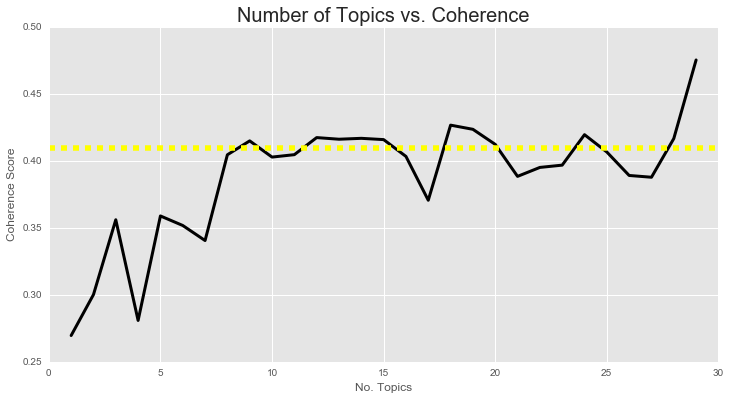

In [21]:
def plot_coherence_topics(coherence,n_topics,score):
    """ 
    Plot Coherence vs. Number of Topics for LDA Evaluation 
    """
    plt.figure(figsize=(12, 6))
    plt.plot(np.arange(1,n_topics,1), coherence, c='black',lw=3)
    plt.axhline(y=score, linestyle='--', linewidth=5.5,color='yellow')
    plt.ylabel('Coherence Score')
    plt.xlabel('No. Topics')
    plt.title('Number of Topics vs. Coherence',fontsize=20)
    
plot_coherence_topics(coherences,30,0.41)